# Importing

## Importing modules

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import (AutoMinorLocator, MultipleLocator)
import time
import random
import math
from multiprocessing import Process, Queue

import keras
from keras.models import Sequential
from keras.layers import Activation, Dense
from keras.models import load_model, clone_model
from keras.optimizers import SGD, adam, adagrad, rmsprop

Using TensorFlow backend.


## Importing own code

In [2]:
from generateSpace import *
from plotLattice import *
from potentialEnergy import *
from numberOfCalculations import *
from makeRandomDatabase import *
from prepareDatabaseForMachineLearning import*

## Writing own code

### Analysis code

In [3]:
def plotHistory(fitDetails):
    """
    hjhgj
    """
    history = {'loss': fitDetails.history['loss'], 'val_loss': fitDetails.history['val_loss']}
    
    maximumValue = max(max(history['loss']), max(history['val_loss']))
    minimumValue = min(min(history['loss']), min(history['val_loss'])) / 10#math.pow(math.floor(math.log(min(min(history['loss']), min(history['val_loss'])), 10)) - 1, 10)
    numberOfEpochs = len(history['loss'])
    
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, figsize=(16, 16))
    ax1.plot([i for i in range(1, numberOfEpochs + 1)], history['loss'], label='Training loss')
    ax1.plot([i for i in range(1, numberOfEpochs + 1)], history['val_loss'], label='Validation loss')
    ax1.legend()
    ax1.set_xlim(1, numberOfEpochs)
    ax1.set_ylim(0, maximumValue)
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Loss (E/Ec)')
    ax1.set_title('Loss (training and validation) vs the number of epochs.')
    
    ax2.plot(history['loss'], history['val_loss'])
    ax2.set_xlim(0, maximumValue)
    ax2.set_ylim(0, maximumValue)
    ax2.set_xlabel('Training loss (E/Ec)')
    ax2.set_ylabel('Validation loss (E/Ec)')
    ax2.set_title('Validation loss vs training loss.')
    
    ax3.plot([i for i in range(1, numberOfEpochs + 1)], history['loss'], label='Training loss')
    ax3.plot([i for i in range(1, numberOfEpochs + 1)], history['val_loss'], label='Validation loss')
    ax3.legend()
    ax3.set_xlim(1, numberOfEpochs)
    ax3.set_yscale('log')
    ax3.set_ylim(minimumValue, maximumValue)
    ax3.set_xlabel('Epochs')
    ax3.set_ylabel('Loss (E/Ec)')
    ax3.set_title('Loss (training and validation) vs the number of epochs (logarithmic)')
    
    ax4.plot(history['loss'], history['val_loss'])
    ax4.set_xscale('log')
    ax4.set_xlim(minimumValue, maximumValue)
    ax4.set_yscale('log')
    ax4.set_ylim(minimumValue, maximumValue)
    ax4.set_xlabel('Training loss (E/Ec)')
    ax4.set_ylabel('Validation loss (E/Ec)')
    ax4.set_title('Validation loss vs training loss (logarithmic).')
    
    plt.show()
    history['figure'] = [fig, ax1, ax2, ax3, ax4]
    
    return history

In [4]:
def makeGradiantPlot(model, x, testData):
    y = [[],[]]
    for i in range(len(x)):
        y[0].append(model.predict([[testData['eigenvalues'][i]]])[0][0])
        #y[0].append(model.predict([[testData['relativeDistances'][i]]])[0][0])
        y[1].append(testData['potentialEnergy'][i])


    fig, ((ax1, ax2)) = plt.subplots( ncols=2, figsize=(16, 8))
    ax1.plot(list(x), y[0], label='Predicted potential energy')
    ax1.plot(list(x), y[1], label='Real potential energy')
    ax1.legend()
    ax1.set_xlabel('Position of particle (r/Rc)')
    ax1.set_ylabel('Potential energy per particle (E/Ec)')
    ax1.set_title('Predicted potential energy and real potential energy for different positions.')
    
    ax2.plot(list(x), np.gradient(y[0], x[1] - x[0]), label='Predicted gradiant')
    ax2.plot(list(x), np.gradient(y[1], x[1] - x[0]), label='Real gradiant')
    ax2.legend()
    ax2.set_xlabel('Position of particle (r/Rc)')
    ax2.set_ylabel('Gradiant')
    ax2.set_title('Predicted gradiant and real gradiant for different positions.')
    
    plt.show()

In [5]:
def makePredictionPlot(model, dataFrame, amountOfPoints=2500):
    prediction = []
    realValue = []
    
    for i in range(min(len(dataFrame['potentialEnergy']), amountOfPoints)):
        index = dataFrame.index[i]
        prediction.append(model.predict([[dataFrame['eigenvalues'][index]]])[0][0])
        #prediction.append(model.predict([[dataFrame['relativeDistances'][index]]])[0][0])
        realValue.append(dataFrame['potentialEnergy'][index])
    
    fig, ((ax1)) = plt.subplots(nrows=1, ncols=1, figsize=(8, 8))
    ax1.scatter(realValue, prediction, s=5)
    ax1.set_xlim(min(min(prediction), min(realValue)), max(max(prediction), max(realValue)))
    ax1.set_ylim(min(min(prediction), min(realValue)), max(max(prediction), max(realValue)))
    ax1.set_xlabel('Real energy per particle (E/Ec)')
    ax1.set_ylabel('Predicted energy per particle (E/Ec)')
    ax1.set_title('Predicted energy vs real energy.')
    
    plt.show()

In [6]:
def plotAndPredict(model, dataFrame, indexNumber):
    prediction = model.predict([[dataFrame['eigenvalues'][indexNumber]]])[0][0]
    #prediction = model.predict([[dataFrame['relativeDistances'][indexNumber]]])[0][0]
    realValue = dataFrame['potentialEnergy'][indexNumber]
    
    fig, ax = plotLatticeFromDataFrame(dataFrame, indexNumber)
    print('For index', indexNumber, 'Predicted', prediction, 'was', realValue)
    return fig, ax

### Network code

In [7]:
def testNetwork(trainingInput, settings, learningRate, kernalInitializer='he_uniform', lossFunction='MAE', validationSplit=0.3, epochs=10000, verbose=1, callbacksNetwork=[], sampleSize=4):
    bestModel = makeDenseNetwork(settings, learningRate, kernalInitializer, lossFunction)
    if verbose>=1:
        bestModel.summary()
        print(bestModel.evaluate(trainingInput['input'], trainingInput['target'], verbose=1))
        for i in range(len(bestModel.layers)):
            print('Layer ' + str(i) + ': ', bestModel.layers[i].get_weights())
    
    bestEvaluation = bestModel.evaluate(trainingInput['input'], trainingInput['target'], verbose=0)
    bestFitDetails = bestModel.fit(trainingInput['input'], trainingInput['target'], validation_split=validationSplit, epochs=3, verbose=0, callbacks=callbacksNetwork)
    
    for i in range(sampleSize):
        model = makeDenseNetwork(settings, learningRate, kernalInitializer, lossFunction)
        fitDetails = model.fit(trainingInput['input'], trainingInput['target'], validation_split=validationSplit, epochs=epochs, verbose=verbose, callbacks=callbacksNetwork)
        
        if fitDetails.history['val_loss'][-1]<=bestEvaluation:
            bestModel = model
            bestEvaluation = fitDetails.history['val_loss'][-1]
            bestFitDetails = fitDetails
            
        if verbose>=1:
            for j in range(len(model.layers)):
                print('Network' + str(i) + ' Layer ' + str(j) + ': ', model.layers[j].get_weights())
            history = plotHistory(fitDetails)
    
    return bestModel, bestFitDetails

In [8]:
def makeDenseNetwork(settings, learningRate, kernalInitializer='he_uniform', lossFunction='MAE'):#https://keras.io/api/losses/regression_losses/
    """
    jhgjhgj
    """
    model = Sequential()
    model.add(Dense(settings[1][1], input_dim=settings[0], use_bias=settings[1][3], activation=settings[1][2], kernel_initializer=kernalInitializer))
    #model.add(Activation(settings[0][2]))
    
    for i in range(2, len(settings)):
        setting = settings[i]#0 is kind of layer, rest are settings.
        
        model.add(Dense(setting[1], use_bias=setting[3], activation=setting[2], kernel_initializer=kernalInitializer))
        #model.add(Activation(setting[2]))
    
    opt = adam(lr=learningRate)
    model.compile(loss=lossFunction, optimizer=opt)
    
    return model

In [9]:
def makeLinearNet(learningRate, inputDim, loss):
    model = Sequential()
    opt = adam(lr=learningRate)
    model.add(Dense(1, activation="linear", use_bias=False, input_dim=inputDim))
    model.compile(loss=loss, optimizer=opt)
    return model

# Getting data

## Importing data and settings

In [10]:
filename = 'DatabaseMin_1Width5_50k_0.9Cutt_40epochs_0.1max_3ds_1dsDecent_4particles_2D_M2M3R0p20Prepared'#'databaseModLen_min_cut0.90_widths86_Width5_data1k_3-1sur_epoch30_maxDelta0.1_1Prepared'
orderOfMatrix = [-2, -3]# Make a list if you want to do the calculations yourself and make a other type of you want to import it
inputSize = 4 * len(orderOfMatrix)
saveFolder = 'M2M3Bias'
lossMetric = 'MAE'

In [11]:

data = pd.read_json(filename + '.json', orient='columns')
data['particleCoordinates'] = data['particleCoordinates'].apply(np.array)
data['eigenvalues'] = data['eigenvalues'].apply(np.array)
#data['eigenvalues'] = data['eigenvalues'].apply(np.transpose)
#data['eigenvalues'] = data['eigenvalues'].apply(list)

offset = 0#min(data['potentialEnergy'])
print('Offset is', offset)
data['potentialEnergy'] = data['potentialEnergy']-offset

Offset is 0


## Inspecting data

In [12]:
data.head()

,index,particleCoordinates,widthOfCell,numberOfSurroundingCells,potentialEnergy,eigenvalues,relativeDistances
0,35004,"[[3.2178418816, 2.5592149779], [3.8863933583, ...",5,3,-0.550055,"[-535.1402748717, -163.4431357327, 17.61029705...","[5, 0.9623002168, 0.9881520042, 3.8946774961, ..."
1,35005,"[[1.4850660971, 4.2644907407], [3.6614195298, ...",5,3,-1.781557,"[-617.1020396621, -354.5439268596, 27.92194428...","[5, 0.8209791429000001, 0.8904023870000001, 0...."
2,35006,"[[3.2602102304000002, 0.1639696165], [3.667678...",5,3,-0.766351,"[-590.6070154873, -223.3285067373, 39.90741469...","[5, 0.8512333822, 0.9067573484, 3.0976775233, ..."
3,35007,"[[4.1329171327, 3.0337743374], [3.649631867, 1...",5,3,-2.718467,"[-597.2469263665, -397.6723264081, -67.4722660...","[5, 0.7628509369, 0.8954472889, 1.0552316413, ..."
4,35008,"[[2.0568885388, 4.011119679], [1.7571582935, 0...",5,3,-2.007856,"[-567.8415937499, -384.7427913156, -40.7346283...","[5, 0.7924554490000001, 0.9173997916000001, 1...."


In [13]:
data.describe()

,index,widthOfCell,numberOfSurroundingCells,potentialEnergy
count,50004.000000,50004.0,50004.0,50004.000000
mean,25001.500000,5.0,3.0,-0.933597
std,14435.055767,0.0,0.0,1.828727
min,0.000000,5.0,3.0,-4.013059
25%,12500.750000,5.0,3.0,-1.706668
50%,25001.500000,5.0,3.0,-1.117893
75%,37502.250000,5.0,3.0,-0.416102
max,50003.000000,5.0,3.0,14.054016


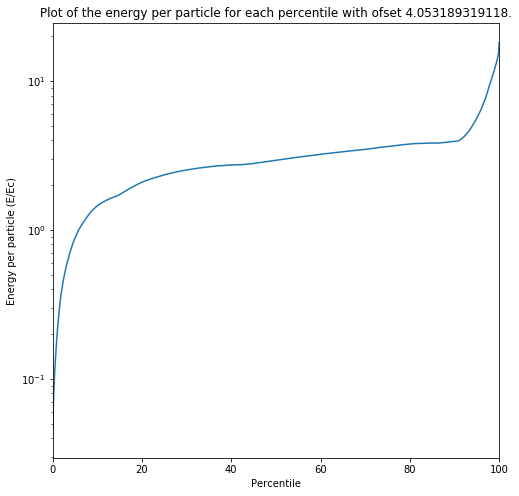

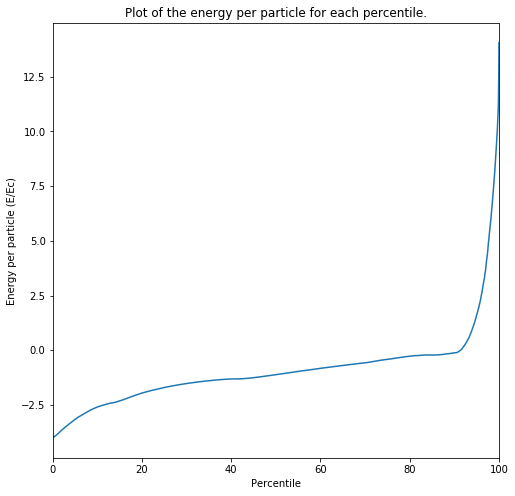

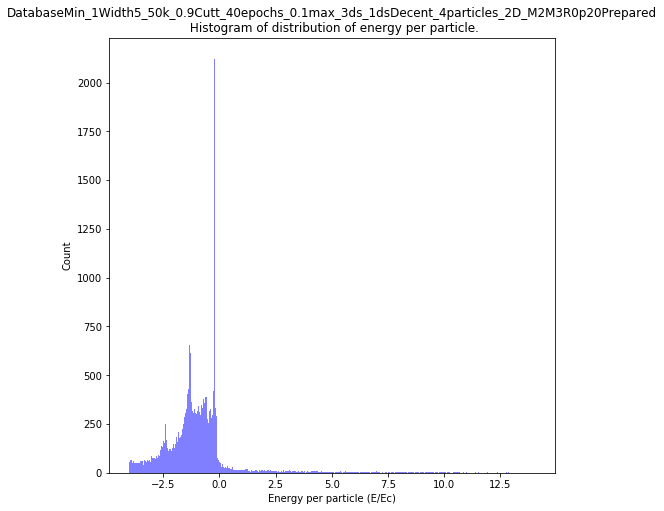

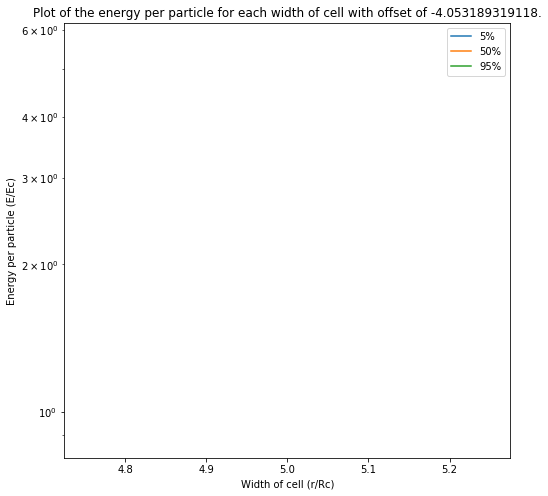

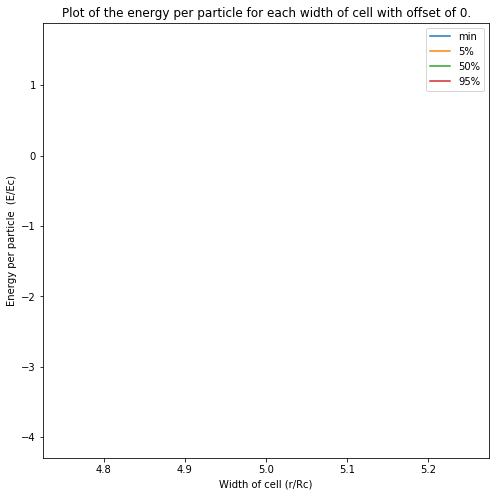

In [14]:

#"""
qLow = data['potentialEnergy'].quantile(0.01)
qHi  = data['potentialEnergy'].quantile(0.99)
dataFiltered = data.copy()
#dataFiltered = data[(data['potentialEnergy'] < qHi) & (data['potentialEnergy'] > qLow)]

x = dataFiltered['potentialEnergy']
fig, ax = plt.subplots(figsize=(8, 8))
sortedX = np.sort(x) - 1.01 * min(x)
ax.plot([100*i/len(x) for i in range(0, len(x))], sortedX)
ax.set_xlim(0, 100)
ax.set_yscale('log')
ax.set_title('Plot of the energy per particle for each percentile with ofset ' + str(-1.01 * min(x)) + '.')
ax.set_ylabel('Energy per particle (E/Ec)')
ax.set_xlabel('Percentile')
plt.show()

x = dataFiltered['potentialEnergy']
fig, ax = plt.subplots(figsize=(8, 8))
sortedX = np.sort(x)
ax.plot([100*i/len(x) for i in range(0, len(x))], sortedX)
ax.set_xlim(0, 100)
ax.set_title('Plot of the energy per particle for each percentile.')
ax.set_ylabel('Energy per particle (E/Ec)')
ax.set_xlabel('Percentile')
plt.show()


#"""


#"""
numBins = 1000
fig, ax = plt.subplots(figsize=(8, 8))
n, bins, patches = ax.hist(x, numBins, facecolor='blue', alpha=0.5)
ax.set_title(filename + '\n Histogram of distribution of energy per particle.')
ax.set_xlabel('Energy per particle (E/Ec)')
ax.set_ylabel('Count')
plt.show()
#"""

#"""
tempData = dataFiltered.copy()
tempOfsett = 1.01 * min(tempData['potentialEnergy'])
tempData['potentialEnergy'] = tempData['potentialEnergy'] - tempOfsett
medianData = tempData.groupby('widthOfCell').describe(percentiles=[0.05, 0.5, 0.95])
fig, ax = plt.subplots(figsize=(8, 8))
ax.plot(medianData.index, medianData['potentialEnergy']['5%'])
ax.plot(medianData.index, medianData['potentialEnergy']['5%'])
ax.plot(medianData.index, medianData['potentialEnergy']['50%'])
ax.plot(medianData.index, medianData['potentialEnergy']['95%'])
plt.legend(['5%', '50%', '95%'])
ax.set_yscale('log')
ax.set_title('Plot of the energy per particle for each width of cell with offset of ' + str(tempOfsett) + '.')
ax.set_ylabel('Energy per particle (E/Ec)')
ax.set_xlabel('Width of cell (r/Rc)')
plt.show()
#"""

#"""
tempData = dataFiltered.copy()
tempOfsett = 0#1.01 * min(tempData['potentialEnergy'])
tempData['potentialEnergy'] = tempData['potentialEnergy'] - tempOfsett
medianData = tempData.groupby('widthOfCell').describe(percentiles=[0.05, 0.5, 0.95])
fig, ax = plt.subplots(figsize=(8, 8))
ax.plot(medianData.index, medianData['potentialEnergy']['min'])
ax.plot(medianData.index, medianData['potentialEnergy']['5%'])
ax.plot(medianData.index, medianData['potentialEnergy']['50%'])
ax.plot(medianData.index, medianData['potentialEnergy']['95%'])
plt.legend(['min', '5%', '50%', '95%'])
#plt.ylim(-30, 30)
ax.set_title('Plot of the energy per particle for each width of cell with offset of ' + str(tempOfsett) + '.')
ax.set_ylabel('Energy per particle  (E/Ec)')
ax.set_xlabel('Width of cell (r/Rc)')
plt.show()
#"""


## Preparing data

In [15]:
#"""
trainingData = data.sample(frac=0.8)
validationData = data.drop(trainingData.index)

inputData = []
targetData = []
for i in trainingData.index:
    inputData.append(np.array(trainingData['eigenvalues'][i]))
    #inputData.append(np.array(trainingData['relativeDistances'][i]))
    targetData.append(trainingData['potentialEnergy'][i])
    #targetData.append(sum(trainingData['eigenvalues'][i]))
    #targetData.append([sum(trainingData['relativeDistances'][i])])

trainingInput = {'input':np.array(inputData), 'target':np.array(targetData)}

print('Results training input:')
[print(trainingInput['input'][i], trainingInput['target'][i], '\n') for i in range(0, 3)]
print(np.shape(trainingInput['input']))
print(type(trainingInput['input']))
print(type(trainingInput['input'][0]))
print(np.shape(trainingInput['target']))
print(type(trainingInput['target']))

inputData = []
targetData = []
for i in validationData.index:
    inputData.append(np.array(validationData['eigenvalues'][i]))
    #inputData.append(np.array(validationData['relativeDistances'][i]))
    targetData.append(validationData['potentialEnergy'][i])
    #targetData.append([sum(validationData['eigenvalues'][i])])
    #targetData.append([sum(validationData['relativeDistances'][i])])

validationInput = {'input':np.array(inputData), 'target':np.array(targetData)}

print('Results validation input:')
[print(validationInput['input'][i], validationInput['target'][i], '\n') for i in range(0, 3)]
print(np.shape(validationInput['input']))
print(type(validationInput['input']))
print(type(validationInput['input'][0]))
print(np.shape(validationInput['target']))
print(type(validationInput['target']))

validationPlots = [random.choice(validationData.index) for i in range(0, 11)]

#"""
print()

Results training input:
[  -647.49230259   -303.24911045   -164.03164769   1544.20212056
 -15073.04313857  -5118.5244109   -1943.90023748  23347.81559992] -3.3870967681 

[  -697.02050739   -358.02567126    -78.62482713   1563.10006562
 -17458.59357901  -6624.91300564   -387.62470337  25683.47910098] -0.2560376878 

[  -517.49519887   -276.75801658     17.56662238   1206.11565289
 -11484.71281389  -4488.05560421    180.8880253   17004.22820576] -1.1684831774 

(40003, 8)
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
(40003,)
<class 'numpy.ndarray'>
Results validation input:
[  -597.24692637   -397.67232641    -67.47226609   1491.82057869
 -13926.3602235   -7694.18134909    584.11879274  22248.77059282] -2.7184672884000003 

[  -706.53382762   -344.33050046     87.12675264   1393.16663527
 -16809.48542664  -6845.12419      3962.88258095  20904.07484865] -1.2597563254 

[  -869.28811122   -132.44256717     58.44177252   1372.7179657
 -24629.00574213  -1240.7282202     515.58830993  265

## Preparing test data

No handles with labels found to put in legend.


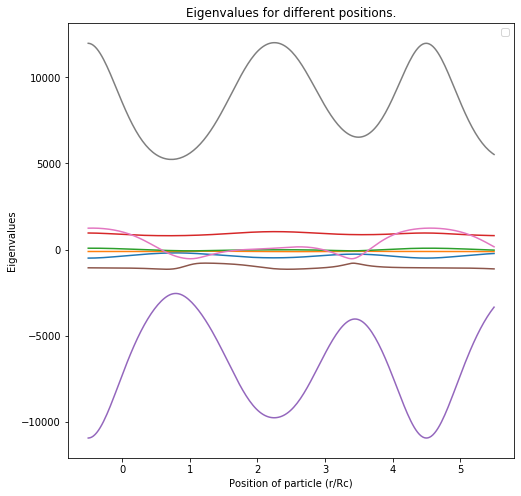

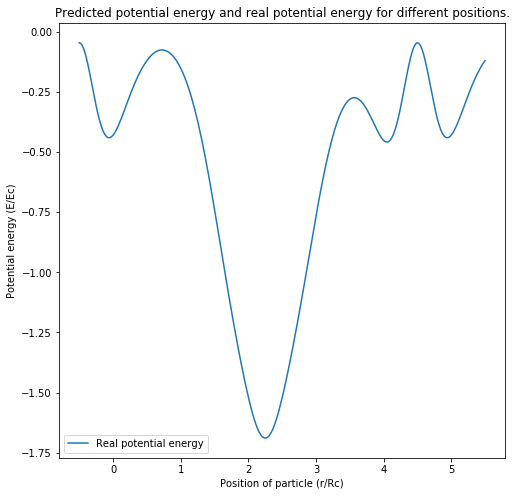

In [16]:
#"""
widthOfCell = 5.0
numberOfSurroundingCells = 3
R0 = 20
x = np.linspace(-0.1, 1.1, 2*120)

testData = {'particleCoordinates': [],'widthOfCell':[] , 'numberOfSurroundingCells': [], 'potentialEnergy':[]}# Initialy use a dictionary because it's easier to append to than a dataframe.
for i in x:
    particles = [np.array([0.3, 0.5]), np.array([0.68, 0.9]), np.array([0.7, 0.4]), np.array([0.5, i])]
    particles = [widthOfCell * coordinate for coordinate in particles]
    otherSpace = generateSpace(particles, numberOfSurroundingCells, widthOfCell)# Generate the other space.
    testData['particleCoordinates'].append(particles)
    testData['widthOfCell'].append(widthOfCell)
    testData['numberOfSurroundingCells'].append(numberOfSurroundingCells)
    testData['potentialEnergy'].append(potentialEnergy(otherSpace, particles, potentialEnergyPerSet) - offset)# Calculate the potential energy and save it to the data dictonairy.

x = widthOfCell * x
testData = prepareDatabseForMachineLearning(pd.DataFrame(testData), orderOfMatrix, R0, giveUpdates = False)

fig, ax1 = plt.subplots(figsize=(8, 8))
ax1.plot(list(x), [testData['eigenvalues'][i] for i in range(0, len(testData['eigenvalues']))])
#ax1.plot(list(x), [testData['relativeDistances'][i] for i in range(0, len(testData['relativeDistances']))])
ax1.legend()
#ax1.set_ylim(-50, 50)
ax1.set_xlabel('Position of particle (r/Rc)')
ax1.set_ylabel('Eigenvalues')
#ax1.set_ylabel('Relative distances')
ax1.set_title('Eigenvalues for different positions.')
plt.show()

testData.head()
testData.describe()

y = []
for i in range(len(x)):
    y.append(testData['potentialEnergy'][i])


fig, ax1 = plt.subplots(figsize=(8, 8))
ax1.plot(list(x), y, label='Real potential energy')
ax1.legend()
ax1.set_xlabel('Position of particle (r/Rc)')
ax1.set_ylabel('Potential energy (E/Ec)')
ax1.set_title('Predicted potential energy and real potential energy for different positions.')
#ax1.set_ylim(-0.75 * offset , 1.5 * max(y[1]))
plt.show()
#"""
print()

# Machine learning

In [17]:
def RSMPE(target,value):
    return ((keras.backend.mean(((value-target)/target)**2))**0.5)*100

def MAE(target,value):
    return keras.backend.mean(abs(value-target))

models = []
prefixName = 0

## Model 0: Linear network

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 1)                 9         
Total params: 9
Trainable params: 9
Non-trainable params: 0
_________________________________________________________________
40003/40003 [==============================] - 1s 15us/step
3286.6788480243863
Layer 0:  [array([[-0.40174636],
       [-0.81923324],
       [-0.74024874],
       [-0.747506  ],
       [ 0.32371026],
       [-0.04263246],
       [ 0.4126361 ],
       [ 0.03167683]], dtype=float32), array([0.], dtype=float32)]
Train on 32002 samples, validate on 8001 samples
Epoch 1/20000
32002/32002 [==============================] - 1s 32us/step - loss: 10352.7897 - val_loss: 10175.4975
Epoch 2/20000
32002/32002 [==============================] - 1s 30us/step - loss: 9961.9792 - val_loss: 9784.8688
Epoch 3/20000
32002/32002 [==============================] - 1s 

32002/32002 [==============================] - 1s 30us/step - loss: 399.1291 - val_loss: 382.5883
Epoch 66/20000
32002/32002 [==============================] - 1s 30us/step - loss: 376.6517 - val_loss: 360.4596
Epoch 67/20000
32002/32002 [==============================] - 1s 30us/step - loss: 354.2616 - val_loss: 338.3834
Epoch 68/20000
32002/32002 [==============================] - 1s 30us/step - loss: 331.8429 - val_loss: 316.2638
Epoch 69/20000
32002/32002 [==============================] - 1s 30us/step - loss: 309.5140 - val_loss: 294.3184
Epoch 70/20000
32002/32002 [==============================] - 1s 30us/step - loss: 287.2957 - val_loss: 272.4625
Epoch 71/20000
32002/32002 [==============================] - 1s 30us/step - loss: 265.1624 - val_loss: 250.5967
Epoch 72/20000
32002/32002 [==============================] - 1s 30us/step - loss: 242.8701 - val_loss: 228.5581
Epoch 73/20000
32002/32002 [==============================] - 1s 30us/step - loss: 220.4790 - val_loss: 206.431

32002/32002 [==============================] - 1s 30us/step - loss: 10.2495 - val_loss: 9.8891
Epoch 139/20000
32002/32002 [==============================] - 1s 30us/step - loss: 10.1593 - val_loss: 9.8025
Epoch 140/20000
32002/32002 [==============================] - 1s 30us/step - loss: 10.0693 - val_loss: 9.7260
Epoch 141/20000
32002/32002 [==============================] - 1s 30us/step - loss: 9.9873 - val_loss: 9.6555
Epoch 142/20000
32002/32002 [==============================] - 1s 30us/step - loss: 9.8975 - val_loss: 9.5569
Epoch 143/20000
32002/32002 [==============================] - 1s 30us/step - loss: 9.8150 - val_loss: 9.5098
Epoch 144/20000
32002/32002 [==============================] - 1s 30us/step - loss: 9.7373 - val_loss: 9.4535
Epoch 145/20000
32002/32002 [==============================] - 1s 30us/step - loss: 9.6612 - val_loss: 9.3273
Epoch 146/20000
32002/32002 [==============================] - 1s 30us/step - loss: 9.5855 - val_loss: 9.2511
Epoch 147/20000
32002/3

32002/32002 [==============================] - 1s 30us/step - loss: 7.9925 - val_loss: 7.7675
Epoch 213/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.9845 - val_loss: 7.7466
Epoch 214/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.9789 - val_loss: 7.7535
Epoch 215/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.9791 - val_loss: 7.7406
Epoch 216/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.9743 - val_loss: 7.7358
Epoch 217/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.9682 - val_loss: 7.7352
Epoch 218/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.9622 - val_loss: 7.7485
Epoch 219/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.9580 - val_loss: 7.7253
Epoch 220/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.9570 - val_loss: 7.7405
Epoch 221/20000
32002/3200

32002/32002 [==============================] - 1s 30us/step - loss: 7.7854 - val_loss: 7.5709
Epoch 287/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.7774 - val_loss: 7.5616
Epoch 288/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.7758 - val_loss: 7.5639
Epoch 289/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.7712 - val_loss: 7.5622
Epoch 290/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.7737 - val_loss: 7.6080
Epoch 291/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.7691 - val_loss: 7.5894
Epoch 292/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.7704 - val_loss: 7.5720
Epoch 293/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.7616 - val_loss: 7.5473
Epoch 294/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.7589 - val_loss: 7.5437
Epoch 295/20000
32002/3200

32002/32002 [==============================] - 1s 30us/step - loss: 7.6049 - val_loss: 7.3901
Epoch 361/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.6045 - val_loss: 7.3859
Epoch 362/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.5945 - val_loss: 7.3901
Epoch 363/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.5954 - val_loss: 7.4013
Epoch 364/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.5944 - val_loss: 7.3846
Epoch 365/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.5951 - val_loss: 7.3780
Epoch 366/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.5964 - val_loss: 7.3777
Epoch 367/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.5875 - val_loss: 7.3760
Epoch 368/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.5857 - val_loss: 7.4170
Epoch 369/20000
32002/3200

32002/32002 [==============================] - 1s 30us/step - loss: 7.4299 - val_loss: 7.2623
Epoch 435/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.4265 - val_loss: 7.2134
Epoch 436/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.4187 - val_loss: 7.2318
Epoch 437/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.4193 - val_loss: 7.2118
Epoch 438/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.4141 - val_loss: 7.2145
Epoch 439/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.4170 - val_loss: 7.2107
Epoch 440/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.4093 - val_loss: 7.2505
Epoch 441/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.4080 - val_loss: 7.2039
Epoch 442/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.4039 - val_loss: 7.2023
Epoch 443/20000
32002/3200

32002/32002 [==============================] - 1s 30us/step - loss: 7.2494 - val_loss: 7.0443
Epoch 509/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.2459 - val_loss: 7.0483
Epoch 510/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.2426 - val_loss: 7.0631
Epoch 511/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.2435 - val_loss: 7.0356
Epoch 512/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.2363 - val_loss: 7.0350
Epoch 513/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.2381 - val_loss: 7.0361
Epoch 514/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.2308 - val_loss: 7.0465
Epoch 515/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.2335 - val_loss: 7.0379
Epoch 516/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.2279 - val_loss: 7.0278
Epoch 517/20000
32002/3200

32002/32002 [==============================] - 1s 30us/step - loss: 7.0696 - val_loss: 6.9628
Epoch 583/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.0691 - val_loss: 6.8771
Epoch 584/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.0679 - val_loss: 6.8818
Epoch 585/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.0609 - val_loss: 6.9321
Epoch 586/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.0629 - val_loss: 6.9228
Epoch 587/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.0545 - val_loss: 6.8659
Epoch 588/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.0595 - val_loss: 6.8546
Epoch 589/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.0520 - val_loss: 6.9209
Epoch 590/20000
32002/32002 [==============================] - 1s 30us/step - loss: 7.0502 - val_loss: 6.8568
Epoch 591/20000
32002/3200

32002/32002 [==============================] - 1s 31us/step - loss: 6.8923 - val_loss: 6.7066
Epoch 657/20000
32002/32002 [==============================] - 1s 31us/step - loss: 6.8886 - val_loss: 6.7114
Epoch 658/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.8892 - val_loss: 6.7076
Epoch 659/20000
32002/32002 [==============================] - 1s 31us/step - loss: 6.8904 - val_loss: 6.7003
Epoch 660/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.8881 - val_loss: 6.6911
Epoch 661/20000
32002/32002 [==============================] - 1s 31us/step - loss: 6.8800 - val_loss: 6.7266
Epoch 662/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.8779 - val_loss: 6.6854
Epoch 663/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.8781 - val_loss: 6.6854
Epoch 664/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.8684 - val_loss: 6.7172
Epoch 665/20000
32002/3200

32002/32002 [==============================] - 1s 30us/step - loss: 6.7204 - val_loss: 6.5273
Epoch 731/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.7107 - val_loss: 6.6006
Epoch 732/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.7110 - val_loss: 6.5438
Epoch 733/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.7129 - val_loss: 6.5587
Epoch 734/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.7046 - val_loss: 6.5455
Epoch 735/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.7097 - val_loss: 6.5165
Epoch 736/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.6970 - val_loss: 6.5168
Epoch 737/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.6963 - val_loss: 6.5708
Epoch 738/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.7020 - val_loss: 6.5153
Epoch 739/20000
32002/3200

32002/32002 [==============================] - 1s 30us/step - loss: 6.5378 - val_loss: 6.3970
Epoch 805/20000
32002/32002 [==============================] - 1s 31us/step - loss: 6.5371 - val_loss: 6.3509
Epoch 806/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.5341 - val_loss: 6.3604
Epoch 807/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.5331 - val_loss: 6.3619
Epoch 808/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.5344 - val_loss: 6.3634
Epoch 809/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.5272 - val_loss: 6.3456
Epoch 810/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.5272 - val_loss: 6.3464
Epoch 811/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.5234 - val_loss: 6.3402
Epoch 812/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.5255 - val_loss: 6.3862
Epoch 813/20000
32002/3200

32002/32002 [==============================] - ETA: 0s - loss: 6.384 - 1s 31us/step - loss: 6.3635 - val_loss: 6.2363
Epoch 879/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.3643 - val_loss: 6.2151
Epoch 880/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.3568 - val_loss: 6.1891
Epoch 881/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.3557 - val_loss: 6.1805
Epoch 882/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.3534 - val_loss: 6.1816
Epoch 883/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.3507 - val_loss: 6.1779
Epoch 884/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.3450 - val_loss: 6.1856
Epoch 885/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.3522 - val_loss: 6.1703
Epoch 886/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.3447 - val_loss: 6.1716
Ep

32002/32002 [==============================] - 1s 30us/step - loss: 6.1874 - val_loss: 6.0458
Epoch 953/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.1800 - val_loss: 6.0282
Epoch 954/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.1819 - val_loss: 6.0907
Epoch 955/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.1787 - val_loss: 6.0188
Epoch 956/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.1747 - val_loss: 6.0070
Epoch 957/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.1781 - val_loss: 6.0987
Epoch 958/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.1769 - val_loss: 5.9953
Epoch 959/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.1710 - val_loss: 6.0142
Epoch 960/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.1647 - val_loss: 6.0551
Epoch 961/20000
32002/3200

32002/32002 [==============================] - 1s 30us/step - loss: 6.0118 - val_loss: 5.8694
Epoch 1027/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.0113 - val_loss: 5.8735
Epoch 1028/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.0076 - val_loss: 5.8457
Epoch 1029/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.0041 - val_loss: 5.8314
Epoch 1030/20000
32002/32002 [==============================] - 1s 30us/step - loss: 6.0009 - val_loss: 5.8352
Epoch 1031/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.9992 - val_loss: 5.8519
Epoch 1032/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.9962 - val_loss: 5.8507
Epoch 1033/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.9972 - val_loss: 5.8348
Epoch 1034/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.9913 - val_loss: 5.8251
Epoch 1035/20000
3

Epoch 1100/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.8398 - val_loss: 5.6826
Epoch 1101/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.8320 - val_loss: 5.6656
Epoch 1102/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.8281 - val_loss: 5.6633
Epoch 1103/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.8286 - val_loss: 5.6674
Epoch 1104/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.8264 - val_loss: 5.6887
Epoch 1105/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.8211 - val_loss: 5.6766
Epoch 1106/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.8231 - val_loss: 5.6622
Epoch 1107/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.8168 - val_loss: 5.6519
Epoch 1108/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.8149 - val_loss: 5.6583
E

Epoch 1174/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.6583 - val_loss: 5.5282
Epoch 1175/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.6547 - val_loss: 5.5133
Epoch 1176/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.6624 - val_loss: 5.5286
Epoch 1177/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.6584 - val_loss: 5.5210
Epoch 1178/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.6511 - val_loss: 5.5303
Epoch 1179/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.6496 - val_loss: 5.4948
Epoch 1180/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.6460 - val_loss: 5.5166
Epoch 1181/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.6426 - val_loss: 5.4839
Epoch 1182/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.6384 - val_loss: 5.5240
E

Epoch 1248/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.4867 - val_loss: 5.3657
Epoch 1249/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.4853 - val_loss: 5.3934
Epoch 1250/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.4868 - val_loss: 5.3220
Epoch 1251/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.4804 - val_loss: 5.3663
Epoch 1252/20000
32002/32002 [==============================] - 1s 31us/step - loss: 5.4754 - val_loss: 5.3588
Epoch 1253/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.4727 - val_loss: 5.3219
Epoch 1254/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.4709 - val_loss: 5.3377
Epoch 1255/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.4711 - val_loss: 5.3312
Epoch 1256/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.4641 - val_loss: 5.3806
E

32002/32002 [==============================] - 1s 30us/step - loss: 5.3090 - val_loss: 5.1632
Epoch 1322/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.3119 - val_loss: 5.1602
Epoch 1323/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.3083 - val_loss: 5.1930
Epoch 1324/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.3084 - val_loss: 5.1570
Epoch 1325/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.3034 - val_loss: 5.1526
Epoch 1326/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.3049 - val_loss: 5.1632
Epoch 1327/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.3008 - val_loss: 5.1564
Epoch 1328/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.3007 - val_loss: 5.1582
Epoch 1329/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.2934 - val_loss: 5.1440
Epoch 1330/20000
3

Epoch 1395/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.1354 - val_loss: 4.9982
Epoch 1396/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.1377 - val_loss: 4.9956
Epoch 1397/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.1328 - val_loss: 5.0438
Epoch 1398/20000
32002/32002 [==============================] - 1s 31us/step - loss: 5.1284 - val_loss: 5.0092
Epoch 1399/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.1294 - val_loss: 4.9848
Epoch 1400/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.1245 - val_loss: 4.9846
Epoch 1401/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.1238 - val_loss: 4.9785
Epoch 1402/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.1222 - val_loss: 4.9788
Epoch 1403/20000
32002/32002 [==============================] - 1s 30us/step - loss: 5.1260 - val_loss: 4.9920
E

Epoch 1469/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.9673 - val_loss: 4.8501
Epoch 1470/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.9651 - val_loss: 4.8297
Epoch 1471/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.9622 - val_loss: 4.9011
Epoch 1472/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.9649 - val_loss: 4.8195
Epoch 1473/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.9563 - val_loss: 4.8439
Epoch 1474/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.9553 - val_loss: 4.8154
Epoch 1475/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.9514 - val_loss: 4.8225
Epoch 1476/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.9499 - val_loss: 4.8047
Epoch 1477/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.9450 - val_loss: 4.8061
E

Epoch 1543/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.7950 - val_loss: 4.6854
Epoch 1544/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.7935 - val_loss: 4.6585
Epoch 1545/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.7874 - val_loss: 4.7010
Epoch 1546/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.7871 - val_loss: 4.6799
Epoch 1547/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.7839 - val_loss: 4.6607
Epoch 1548/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.7843 - val_loss: 4.6511
Epoch 1549/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.7780 - val_loss: 4.6641
Epoch 1550/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.7806 - val_loss: 4.6430
Epoch 1551/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.7782 - val_loss: 4.6383
E

Epoch 1617/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.6215 - val_loss: 4.5005
Epoch 1618/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.6182 - val_loss: 4.5466
Epoch 1619/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.6175 - val_loss: 4.4845
Epoch 1620/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.6158 - val_loss: 4.4825
Epoch 1621/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.6168 - val_loss: 4.5178
Epoch 1622/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.6129 - val_loss: 4.5046
Epoch 1623/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.6061 - val_loss: 4.4824
Epoch 1624/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.6079 - val_loss: 4.5149
Epoch 1625/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.6061 - val_loss: 4.4929
E

32002/32002 [==============================] - 1s 31us/step - loss: 4.4518 - val_loss: 4.3213
Epoch 1691/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.4508 - val_loss: 4.3610
Epoch 1692/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.4453 - val_loss: 4.3288
Epoch 1693/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.4466 - val_loss: 4.3187
Epoch 1694/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.4481 - val_loss: 4.3152
Epoch 1695/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.4400 - val_loss: 4.3113
Epoch 1696/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.4412 - val_loss: 4.3236
Epoch 1697/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.4365 - val_loss: 4.3226
Epoch 1698/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.4384 - val_loss: 4.3053
Epoch 1699/20000
3

Epoch 1764/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.2793 - val_loss: 4.1565
Epoch 1765/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.2772 - val_loss: 4.1681
Epoch 1766/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.2809 - val_loss: 4.1682
Epoch 1767/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.2736 - val_loss: 4.1580
Epoch 1768/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.2711 - val_loss: 4.1471
Epoch 1769/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.2723 - val_loss: 4.1488
Epoch 1770/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.2664 - val_loss: 4.1436
Epoch 1771/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.2661 - val_loss: 4.1427
Epoch 1772/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.2646 - val_loss: 4.1412
E

Epoch 1838/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.1098 - val_loss: 4.0191
Epoch 1839/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.1071 - val_loss: 3.9900
Epoch 1840/20000
32002/32002 [==============================] - 1s 31us/step - loss: 4.1070 - val_loss: 3.9855
Epoch 1841/20000
32002/32002 [==============================] - 1s 31us/step - loss: 4.1040 - val_loss: 3.9946
Epoch 1842/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.1005 - val_loss: 3.9809
Epoch 1843/20000
32002/32002 [==============================] - 1s 30us/step - loss: 4.0978 - val_loss: 4.0108
Epoch 1844/20000
32002/32002 [==============================] - 1s 31us/step - loss: 4.0968 - val_loss: 4.0002
Epoch 1845/20000
32002/32002 [==============================] - 1s 31us/step - loss: 4.0988 - val_loss: 4.0230
Epoch 1846/20000
32002/32002 [==============================] - 1s 31us/step - loss: 4.0881 - val_loss: 3.9757
E

32002/32002 [==============================] - 1s 30us/step - loss: 3.9447 - val_loss: 3.8278
Epoch 1912/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.9390 - val_loss: 3.8273
Epoch 1913/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.9355 - val_loss: 3.8416
Epoch 1914/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.9353 - val_loss: 3.8575
Epoch 1915/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.9330 - val_loss: 3.8443
Epoch 1916/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.9333 - val_loss: 3.8176
Epoch 1917/20000
32002/32002 [==============================] - 1s 31us/step - loss: 3.9285 - val_loss: 3.8837
Epoch 1918/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.9261 - val_loss: 3.8134
Epoch 1919/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.9231 - val_loss: 3.8357
Epoch 1920/20000
3

Epoch 1985/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.7702 - val_loss: 3.6901
Epoch 1986/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.7688 - val_loss: 3.6617
Epoch 1987/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.7703 - val_loss: 3.6561
Epoch 1988/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.7662 - val_loss: 3.6556
Epoch 1989/20000
32002/32002 [==============================] - 1s 31us/step - loss: 3.7593 - val_loss: 3.6761
Epoch 1990/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.7608 - val_loss: 3.6833
Epoch 1991/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.7664 - val_loss: 3.6520
Epoch 1992/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.7570 - val_loss: 3.6537
Epoch 1993/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.7532 - val_loss: 3.6442
E

Epoch 2059/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.6034 - val_loss: 3.5028
Epoch 2060/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.6028 - val_loss: 3.5021
Epoch 2061/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.6032 - val_loss: 3.5053
Epoch 2062/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.5974 - val_loss: 3.5235
Epoch 2063/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.5931 - val_loss: 3.4939
Epoch 2064/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.5935 - val_loss: 3.4972
Epoch 2065/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.5924 - val_loss: 3.5027
Epoch 2066/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.5910 - val_loss: 3.5283
Epoch 2067/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.5866 - val_loss: 3.4803
E

Epoch 2133/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.4370 - val_loss: 3.3383
Epoch 2134/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.4345 - val_loss: 3.3450
Epoch 2135/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.4334 - val_loss: 3.3314
Epoch 2136/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.4258 - val_loss: 3.3408
Epoch 2137/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.4283 - val_loss: 3.3275
Epoch 2138/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.4300 - val_loss: 3.3367
Epoch 2139/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.4214 - val_loss: 3.3261
Epoch 2140/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.4217 - val_loss: 3.3315
Epoch 2141/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.4171 - val_loss: 3.3457
E

Epoch 2207/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.2718 - val_loss: 3.1879
Epoch 2208/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.2680 - val_loss: 3.1734
Epoch 2209/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.2659 - val_loss: 3.1726
Epoch 2210/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.2627 - val_loss: 3.1818
Epoch 2211/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.2680 - val_loss: 3.1875
Epoch 2212/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.2577 - val_loss: 3.1775
Epoch 2213/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.2550 - val_loss: 3.1882
Epoch 2214/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.2537 - val_loss: 3.1596
Epoch 2215/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.2509 - val_loss: 3.1685
E

Epoch 2281/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.1042 - val_loss: 3.0149
Epoch 2282/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.1026 - val_loss: 3.0126
Epoch 2283/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.1022 - val_loss: 3.0332
Epoch 2284/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.0980 - val_loss: 3.0890
Epoch 2285/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.1008 - val_loss: 3.0905
Epoch 2286/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.1020 - val_loss: 3.0960
Epoch 2287/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.0935 - val_loss: 3.0104
Epoch 2288/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.0902 - val_loss: 3.0120
Epoch 2289/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.0874 - val_loss: 3.0107
E

Epoch 2355/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.9472 - val_loss: 2.8727
Epoch 2356/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.9396 - val_loss: 2.8523
Epoch 2357/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.9393 - val_loss: 2.8627
Epoch 2358/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.9323 - val_loss: 2.8530
Epoch 2359/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.9337 - val_loss: 2.8482
Epoch 2360/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.9301 - val_loss: 2.8658
Epoch 2361/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.9253 - val_loss: 2.8412
Epoch 2362/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.9270 - val_loss: 2.8613
Epoch 2363/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.9226 - val_loss: 2.8377
E

Epoch 2429/20000
32002/32002 [==============================] - 1s 31us/step - loss: 2.7790 - val_loss: 2.7186
Epoch 2430/20000
32002/32002 [==============================] - 1s 31us/step - loss: 2.7783 - val_loss: 2.6932
Epoch 2431/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.7759 - val_loss: 2.6950
Epoch 2432/20000
32002/32002 [==============================] - 1s 31us/step - loss: 2.7746 - val_loss: 2.6947
Epoch 2433/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.7714 - val_loss: 2.6989
Epoch 2434/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.7692 - val_loss: 2.7298
Epoch 2435/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.7654 - val_loss: 2.7045
Epoch 2436/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.7608 - val_loss: 2.7320
Epoch 2437/20000
32002/32002 [==============================] - 1s 31us/step - loss: 2.7647 - val_loss: 2.7577
E

Epoch 2503/20000
32002/32002 [==============================] - 1s 31us/step - loss: 2.6209 - val_loss: 2.5554
Epoch 2504/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.6180 - val_loss: 2.5391
Epoch 2505/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.6119 - val_loss: 2.5427
Epoch 2506/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.6114 - val_loss: 2.5755
Epoch 2507/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.6074 - val_loss: 2.5446
Epoch 2508/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.6074 - val_loss: 2.5331
Epoch 2509/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.6037 - val_loss: 2.5276
Epoch 2510/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.6064 - val_loss: 2.5898
Epoch 2511/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.6021 - val_loss: 2.5413
E

Epoch 2577/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.4577 - val_loss: 2.3868
Epoch 2578/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.4571 - val_loss: 2.3843
Epoch 2579/20000
32002/32002 [==============================] - 1s 32us/step - loss: 2.4510 - val_loss: 2.3907
Epoch 2580/20000
32002/32002 [==============================] - 1s 31us/step - loss: 2.4538 - val_loss: 2.3958
Epoch 2581/20000
32002/32002 [==============================] - 1s 31us/step - loss: 2.4517 - val_loss: 2.3778
Epoch 2582/20000
32002/32002 [==============================] - 1s 32us/step - loss: 2.4483 - val_loss: 2.3761
Epoch 2583/20000
32002/32002 [==============================] - 1s 32us/step - loss: 2.4477 - val_loss: 2.3708
Epoch 2584/20000
32002/32002 [==============================] - 1s 32us/step - loss: 2.4456 - val_loss: 2.3774
Epoch 2585/20000
32002/32002 [==============================] - 1s 31us/step - loss: 2.4414 - val_loss: 2.3663
E

Epoch 2651/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.3002 - val_loss: 2.2500
Epoch 2652/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.3003 - val_loss: 2.2365
Epoch 2653/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.2990 - val_loss: 2.2330
Epoch 2654/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.2981 - val_loss: 2.2289
Epoch 2655/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.2930 - val_loss: 2.2243
Epoch 2656/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.2897 - val_loss: 2.2267
Epoch 2657/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.2874 - val_loss: 2.2194
Epoch 2658/20000
32002/32002 [==============================] - 1s 32us/step - loss: 2.2849 - val_loss: 2.2200
Epoch 2659/20000
32002/32002 [==============================] - 1s 31us/step - loss: 2.2882 - val_loss: 2.2215
E

Epoch 2725/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.1420 - val_loss: 2.0983
Epoch 2726/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.1437 - val_loss: 2.1005
Epoch 2727/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.1405 - val_loss: 2.0946
Epoch 2728/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.1413 - val_loss: 2.0739
Epoch 2729/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.1364 - val_loss: 2.1147
Epoch 2730/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.1341 - val_loss: 2.0799
Epoch 2731/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.1328 - val_loss: 2.0695
Epoch 2732/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.1313 - val_loss: 2.0730
Epoch 2733/20000
32002/32002 [==============================] - 1s 30us/step - loss: 2.1280 - val_loss: 2.0875
E

Epoch 2799/20000
32002/32002 [==============================] - 1s 30us/step - loss: 1.9918 - val_loss: 1.9455
Epoch 2800/20000
32002/32002 [==============================] - 1s 30us/step - loss: 1.9886 - val_loss: 1.9539
Epoch 2801/20000
32002/32002 [==============================] - 1s 30us/step - loss: 1.9891 - val_loss: 1.9416
Epoch 2802/20000
32002/32002 [==============================] - 1s 30us/step - loss: 1.9903 - val_loss: 1.9385
Epoch 2803/20000
32002/32002 [==============================] - 1s 30us/step - loss: 1.9844 - val_loss: 1.9292
Epoch 2804/20000
32002/32002 [==============================] - 1s 30us/step - loss: 1.9838 - val_loss: 1.9264
Epoch 2805/20000
32002/32002 [==============================] - 1s 30us/step - loss: 1.9839 - val_loss: 1.9414
Epoch 2806/20000
32002/32002 [==============================] - 1s 30us/step - loss: 1.9814 - val_loss: 1.9691
Epoch 2807/20000
32002/32002 [==============================] - 1s 30us/step - loss: 1.9788 - val_loss: 1.9155
E

Epoch 2873/20000
32002/32002 [==============================] - 1s 30us/step - loss: 1.8430 - val_loss: 1.7999
Epoch 2874/20000
32002/32002 [==============================] - 1s 30us/step - loss: 1.8459 - val_loss: 1.8024
Epoch 2875/20000
32002/32002 [==============================] - 1s 30us/step - loss: 1.8406 - val_loss: 1.7813
Epoch 2876/20000
32002/32002 [==============================] - 1s 31us/step - loss: 1.8392 - val_loss: 1.8009
Epoch 2877/20000
32002/32002 [==============================] - 1s 30us/step - loss: 1.8387 - val_loss: 1.7903
Epoch 2878/20000
32002/32002 [==============================] - 1s 31us/step - loss: 1.8384 - val_loss: 1.7789
Epoch 2879/20000
32002/32002 [==============================] - 1s 31us/step - loss: 1.8322 - val_loss: 1.7742
Epoch 2880/20000
32002/32002 [==============================] - 1s 30us/step - loss: 1.8316 - val_loss: 1.7754
Epoch 2881/20000
32002/32002 [==============================] - 1s 31us/step - loss: 1.8296 - val_loss: 1.7817
E

Epoch 2947/20000
32002/32002 [==============================] - 1s 30us/step - loss: 1.6982 - val_loss: 1.6622
Epoch 2948/20000
32002/32002 [==============================] - 1s 30us/step - loss: 1.6966 - val_loss: 1.6558
Epoch 2949/20000
32002/32002 [==============================] - 1s 30us/step - loss: 1.6963 - val_loss: 1.6872
Epoch 2950/20000
32002/32002 [==============================] - 1s 30us/step - loss: 1.6935 - val_loss: 1.6409
Epoch 2951/20000
32002/32002 [==============================] - 1s 31us/step - loss: 1.6897 - val_loss: 1.6411
Epoch 2952/20000
32002/32002 [==============================] - 1s 30us/step - loss: 1.6918 - val_loss: 1.6420
Epoch 2953/20000
32002/32002 [==============================] - 1s 30us/step - loss: 1.6895 - val_loss: 1.6344
Epoch 2954/20000
32002/32002 [==============================] - 1s 30us/step - loss: 1.6873 - val_loss: 1.6428
Epoch 2955/20000
32002/32002 [==============================] - 1s 30us/step - loss: 1.6856 - val_loss: 1.6594
E

Epoch 3021/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.5564 - val_loss: 1.5436
Epoch 3022/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.5548 - val_loss: 1.5512
Epoch 3023/20000
32002/32002 [==============================] - 1s 27us/step - loss: 1.5527 - val_loss: 1.5331
Epoch 3024/20000
32002/32002 [==============================] - 1s 27us/step - loss: 1.5506 - val_loss: 1.5168
Epoch 3025/20000
32002/32002 [==============================] - 1s 27us/step - loss: 1.5484 - val_loss: 1.5039
Epoch 3026/20000
32002/32002 [==============================] - 1s 27us/step - loss: 1.5528 - val_loss: 1.4990
Epoch 3027/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.5484 - val_loss: 1.4964
Epoch 3028/20000
32002/32002 [==============================] - 1s 27us/step - loss: 1.5454 - val_loss: 1.4993
Epoch 3029/20000
32002/32002 [==============================] - 1s 27us/step - loss: 1.5427 - val_loss: 1.5162
E

32002/32002 [==============================] - 1s 27us/step - loss: 1.4240 - val_loss: 1.3962
Epoch 3095/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.4207 - val_loss: 1.3781
Epoch 3096/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.4151 - val_loss: 1.3767
Epoch 3097/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.4164 - val_loss: 1.3758
Epoch 3098/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.4166 - val_loss: 1.3770
Epoch 3099/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.4105 - val_loss: 1.3672
Epoch 3100/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.4130 - val_loss: 1.3682
Epoch 3101/20000
32002/32002 [==============================] - 1s 27us/step - loss: 1.4084 - val_loss: 1.3810
Epoch 3102/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.4075 - val_loss: 1.3636
Epoch 3103/20000
3

32002/32002 [==============================] - 1s 26us/step - loss: 1.2928 - val_loss: 1.2568
Epoch 3168/20000
32002/32002 [==============================] - 1s 25us/step - loss: 1.2886 - val_loss: 1.2501
Epoch 3169/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.2903 - val_loss: 1.2480
Epoch 3170/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.2874 - val_loss: 1.2974
Epoch 3171/20000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2879 - val_loss: 1.2774
Epoch 3172/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.2872 - val_loss: 1.2675
Epoch 3173/20000
32002/32002 [==============================] - 1s 25us/step - loss: 1.2843 - val_loss: 1.2541
Epoch 3174/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.2793 - val_loss: 1.2399
Epoch 3175/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.2803 - val_loss: 1.2951
Epoch 3176/20000
3

Epoch 3241/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.1695 - val_loss: 1.1394
Epoch 3242/20000
32002/32002 [==============================] - 1s 27us/step - loss: 1.1696 - val_loss: 1.1430
Epoch 3243/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.1698 - val_loss: 1.1293
Epoch 3244/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.1666 - val_loss: 1.1378
Epoch 3245/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.1667 - val_loss: 1.1262
Epoch 3246/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.1662 - val_loss: 1.1306
Epoch 3247/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.1610 - val_loss: 1.1567
Epoch 3248/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.1601 - val_loss: 1.1431
Epoch 3249/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.1607 - val_loss: 1.1216
E

Epoch 3315/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.0579 - val_loss: 1.0303
Epoch 3316/20000
32002/32002 [==============================] - 1s 27us/step - loss: 1.0538 - val_loss: 1.0236
Epoch 3317/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.0519 - val_loss: 1.0210
Epoch 3318/20000
32002/32002 [==============================] - 1s 27us/step - loss: 1.0518 - val_loss: 1.0258
Epoch 3319/20000
32002/32002 [==============================] - 1s 27us/step - loss: 1.0481 - val_loss: 1.1302
Epoch 3320/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.0491 - val_loss: 1.0164
Epoch 3321/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.0485 - val_loss: 1.0183
Epoch 3322/20000
32002/32002 [==============================] - 1s 27us/step - loss: 1.0437 - val_loss: 1.0198
Epoch 3323/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.0457 - val_loss: 1.0609
E

Epoch 3389/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.9553 - val_loss: 0.9522
Epoch 3390/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.9514 - val_loss: 0.9262
Epoch 3391/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.9480 - val_loss: 0.9327
Epoch 3392/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.9504 - val_loss: 0.9182
Epoch 3393/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.9486 - val_loss: 0.9181
Epoch 3394/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.9476 - val_loss: 1.0185
Epoch 3395/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.9470 - val_loss: 0.9125
Epoch 3396/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.9431 - val_loss: 0.9202
Epoch 3397/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9431 - val_loss: 0.9287
E

Epoch 3463/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8617 - val_loss: 0.8348
Epoch 3464/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8622 - val_loss: 0.8322
Epoch 3465/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8566 - val_loss: 0.8313
Epoch 3466/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8581 - val_loss: 0.8596
Epoch 3467/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8585 - val_loss: 0.8328
Epoch 3468/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8579 - val_loss: 0.8292
Epoch 3469/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8539 - val_loss: 0.8345
Epoch 3470/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8557 - val_loss: 0.8462
Epoch 3471/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8530 - val_loss: 0.8295
E

Epoch 3537/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.7840 - val_loss: 0.7573
Epoch 3538/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.7839 - val_loss: 0.7662
Epoch 3539/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.7819 - val_loss: 0.7793
Epoch 3540/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.7836 - val_loss: 0.7846
Epoch 3541/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.7801 - val_loss: 0.7551
Epoch 3542/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.7808 - val_loss: 0.7905
Epoch 3543/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.7792 - val_loss: 0.7550
Epoch 3544/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.7777 - val_loss: 0.7508
Epoch 3545/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.7781 - val_loss: 0.7808
E

Epoch 3611/20000
32002/32002 [==============================] - 1s 33us/step - loss: 0.7156 - val_loss: 0.7078
Epoch 3612/20000
32002/32002 [==============================] - 1s 33us/step - loss: 0.7160 - val_loss: 0.6974
Epoch 3613/20000
32002/32002 [==============================] - 1s 32us/step - loss: 0.7165 - val_loss: 0.7028
Epoch 3614/20000
32002/32002 [==============================] - 1s 32us/step - loss: 0.7163 - val_loss: 0.7001
Epoch 3615/20000
32002/32002 [==============================] - 1s 32us/step - loss: 0.7160 - val_loss: 0.6943
Epoch 3616/20000
32002/32002 [==============================] - 1s 33us/step - loss: 0.7154 - val_loss: 0.7209
Epoch 3617/20000
32002/32002 [==============================] - 1s 33us/step - loss: 0.7128 - val_loss: 0.6883
Epoch 3618/20000
32002/32002 [==============================] - 1s 33us/step - loss: 0.7141 - val_loss: 0.6923
Epoch 3619/20000
32002/32002 [==============================] - 1s 33us/step - loss: 0.7090 - val_loss: 0.6883
E

Epoch 3685/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.6626 - val_loss: 0.6694
Epoch 3686/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.6614 - val_loss: 0.6496
Epoch 3687/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.6621 - val_loss: 0.6400
Epoch 3688/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.6639 - val_loss: 0.6378
Epoch 3689/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.6584 - val_loss: 0.6375
Epoch 3690/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.6596 - val_loss: 0.6463
Epoch 3691/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.6602 - val_loss: 0.6458
Epoch 3692/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.6578 - val_loss: 0.6467
Epoch 3693/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.6557 - val_loss: 0.7169
E

Epoch 3759/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.6161 - val_loss: 0.5950
Epoch 3760/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.6176 - val_loss: 0.6090
Epoch 3761/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.6170 - val_loss: 0.6069
Epoch 3762/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.6167 - val_loss: 0.5942
Epoch 3763/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.6138 - val_loss: 0.6327
Epoch 3764/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.6165 - val_loss: 0.6420
Epoch 3765/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.6137 - val_loss: 0.5965
Epoch 3766/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.6143 - val_loss: 0.5936
Epoch 3767/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.6153 - val_loss: 0.5967
E

Epoch 3833/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5810 - val_loss: 0.5627
Epoch 3834/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5797 - val_loss: 0.5776
Epoch 3835/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5804 - val_loss: 0.5757
Epoch 3836/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5837 - val_loss: 0.5604
Epoch 3837/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5799 - val_loss: 0.5598
Epoch 3838/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5793 - val_loss: 0.5598
Epoch 3839/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5821 - val_loss: 0.5570
Epoch 3840/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5803 - val_loss: 0.5724
Epoch 3841/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5790 - val_loss: 0.5667
E

Epoch 3907/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5602 - val_loss: 0.5372
Epoch 3908/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5569 - val_loss: 0.5352
Epoch 3909/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5527 - val_loss: 0.6751
Epoch 3910/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5553 - val_loss: 0.5399
Epoch 3911/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5509 - val_loss: 0.5644
Epoch 3912/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5538 - val_loss: 0.5561
Epoch 3913/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5531 - val_loss: 0.5437
Epoch 3914/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5539 - val_loss: 0.5366
Epoch 3915/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5526 - val_loss: 0.5315
E

Epoch 3981/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5317 - val_loss: 0.5128
Epoch 3982/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5365 - val_loss: 0.5170
Epoch 3983/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5346 - val_loss: 0.5185
Epoch 3984/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5337 - val_loss: 0.6634
Epoch 3985/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5345 - val_loss: 0.5158
Epoch 3986/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5333 - val_loss: 0.5185
Epoch 3987/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5315 - val_loss: 0.6433
Epoch 3988/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5347 - val_loss: 0.5324
Epoch 3989/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5309 - val_loss: 0.5217
E

Epoch 4055/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5199 - val_loss: 0.4977
Epoch 4056/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5170 - val_loss: 0.5004
Epoch 4057/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5183 - val_loss: 0.5335
Epoch 4058/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5182 - val_loss: 0.5838
Epoch 4059/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5196 - val_loss: 0.5009
Epoch 4060/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5209 - val_loss: 0.4959
Epoch 4061/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5204 - val_loss: 0.5109
Epoch 4062/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5153 - val_loss: 0.5156
Epoch 4063/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5148 - val_loss: 0.5075
E

Epoch 4129/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5058 - val_loss: 0.5409
Epoch 4130/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5092 - val_loss: 0.4911
Epoch 4131/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5052 - val_loss: 0.5219
Epoch 4132/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5097 - val_loss: 0.4880
Epoch 4133/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5059 - val_loss: 0.4939
Epoch 4134/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5047 - val_loss: 0.4944
Epoch 4135/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5090 - val_loss: 0.4930
Epoch 4136/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5052 - val_loss: 0.4891
Epoch 4137/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5059 - val_loss: 0.4962
E

Epoch 4203/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4991 - val_loss: 0.4935
Epoch 4204/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4993 - val_loss: 0.4781
Epoch 4205/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4979 - val_loss: 0.4792
Epoch 4206/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4979 - val_loss: 0.4855
Epoch 4207/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4994 - val_loss: 0.4953
Epoch 4208/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4997 - val_loss: 0.4788
Epoch 4209/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4984 - val_loss: 0.5079
Epoch 4210/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4981 - val_loss: 0.4808
Epoch 4211/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4977 - val_loss: 0.5748
E

Epoch 4277/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4932 - val_loss: 0.4854
Epoch 4278/20000
32002/32002 [==============================] - 1s 30us/step - loss: 0.4965 - val_loss: 0.4720
Epoch 4279/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4939 - val_loss: 0.4904
Epoch 4280/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4927 - val_loss: 0.4712
Epoch 4281/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4950 - val_loss: 0.4758
Epoch 4282/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4953 - val_loss: 0.4939
Epoch 4283/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4909 - val_loss: 0.4728
Epoch 4284/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4909 - val_loss: 0.4733
Epoch 4285/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4942 - val_loss: 0.5342
E

32002/32002 [==============================] - 1s 27us/step - loss: 0.4897 - val_loss: 0.4720
Epoch 4351/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4883 - val_loss: 0.4714
Epoch 4352/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4898 - val_loss: 0.4807
Epoch 4353/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4873 - val_loss: 0.4864
Epoch 4354/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4864 - val_loss: 0.4874
Epoch 4355/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4903 - val_loss: 0.4699
Epoch 4356/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4900 - val_loss: 0.4954
Epoch 4357/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4905 - val_loss: 0.4817
Epoch 4358/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4877 - val_loss: 0.4776
Epoch 4359/20000
3

Epoch 4424/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4876 - val_loss: 0.4939
Epoch 4425/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4874 - val_loss: 0.5786
Epoch 4426/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4912 - val_loss: 0.4754
Epoch 4427/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4854 - val_loss: 0.4724
Epoch 4428/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4843 - val_loss: 0.4656
Epoch 4429/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4845 - val_loss: 0.4862
Epoch 4430/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4851 - val_loss: 0.5860
Epoch 4431/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4849 - val_loss: 0.4778
Epoch 4432/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4853 - val_loss: 0.4652
E

Epoch 4498/20000
32002/32002 [==============================] - 1s 30us/step - loss: 0.4833 - val_loss: 0.4708
Epoch 4499/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4853 - val_loss: 0.4672
Epoch 4500/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4837 - val_loss: 0.5871
Epoch 4501/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4825 - val_loss: 0.4878
Epoch 4502/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4829 - val_loss: 0.5948
Epoch 4503/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4878 - val_loss: 0.5072
Epoch 4504/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4825 - val_loss: 0.4807
Epoch 4505/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4837 - val_loss: 0.4636
Epoch 4506/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4837 - val_loss: 0.4938
E

Epoch 4572/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4813 - val_loss: 0.4593
Epoch 4573/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4823 - val_loss: 0.4611
Epoch 4574/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4843 - val_loss: 0.4721
Epoch 4575/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4807 - val_loss: 0.4599
Epoch 4576/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4831 - val_loss: 0.4605
Epoch 4577/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4834 - val_loss: 0.4627
Epoch 4578/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4839 - val_loss: 0.4597
Epoch 4579/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4813 - val_loss: 0.4618
Epoch 4580/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4825 - val_loss: 0.4713
E

32002/32002 [==============================] - 1s 29us/step - loss: 0.4824 - val_loss: 0.5447
Epoch 4646/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4843 - val_loss: 0.4591
Epoch 4647/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4796 - val_loss: 0.5109
Epoch 4648/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4814 - val_loss: 0.4581
Epoch 4649/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4830 - val_loss: 0.4608
Epoch 4650/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4823 - val_loss: 0.4593
Epoch 4651/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4797 - val_loss: 0.4956
Epoch 4652/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4795 - val_loss: 0.4910
Epoch 4653/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4808 - val_loss: 0.4776
Epoch 4654/20000
3

Epoch 4719/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4797 - val_loss: 0.4621
Epoch 4720/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4811 - val_loss: 0.4621
Epoch 4721/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4815 - val_loss: 0.4681
Epoch 4722/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4830 - val_loss: 0.4582
Epoch 4723/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4812 - val_loss: 0.4624
Epoch 4724/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4815 - val_loss: 0.4918
Epoch 4725/20000
32002/32002 [==============================] - ETA: 0s - loss: 0.482 - 1s 31us/step - loss: 0.4823 - val_loss: 0.4591
Epoch 4726/20000
32002/32002 [==============================] - 1s 30us/step - loss: 0.4822 - val_loss: 0.4967
Epoch 4727/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4

32002/32002 [==============================] - 1s 29us/step - loss: 0.4858 - val_loss: 0.4601
Epoch 4793/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4786 - val_loss: 0.4614
Epoch 4794/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4847 - val_loss: 0.4579
Epoch 4795/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4796 - val_loss: 0.4991
Epoch 4796/20000
32002/32002 [==============================] - 1s 30us/step - loss: 0.4826 - val_loss: 0.4817
Epoch 4797/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4804 - val_loss: 0.4610
Epoch 4798/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4802 - val_loss: 0.4769
Epoch 4799/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4798 - val_loss: 0.4605
Epoch 4800/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4813 - val_loss: 0.4588
Epoch 4801/20000
3

Epoch 4866/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4787 - val_loss: 0.4591
Epoch 4867/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4798 - val_loss: 0.4872
Epoch 4868/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4824 - val_loss: 0.4608
Epoch 4869/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4807 - val_loss: 0.4691
Epoch 4870/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4802 - val_loss: 0.4745
Epoch 4871/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4791 - val_loss: 0.4596
Epoch 4872/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4798 - val_loss: 0.4598
Epoch 4873/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4787 - val_loss: 0.4604
Epoch 4874/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4816 - val_loss: 0.4728
E

Epoch 4940/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4811 - val_loss: 0.4902
Epoch 4941/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4841 - val_loss: 0.4732
Epoch 4942/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4803 - val_loss: 0.4605
Epoch 4943/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4816 - val_loss: 0.5177
Epoch 4944/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4831 - val_loss: 0.4593
Epoch 4945/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4791 - val_loss: 0.4758
Epoch 4946/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4810 - val_loss: 0.5033
Epoch 4947/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4818 - val_loss: 0.4579
Epoch 4948/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4811 - val_loss: 0.5089
E

Epoch 5014/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4817 - val_loss: 0.5087
Epoch 5015/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4837 - val_loss: 0.4576
Epoch 5016/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4788 - val_loss: 0.4586
Epoch 5017/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4784 - val_loss: 0.4598
Epoch 5018/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4799 - val_loss: 0.5166
Epoch 5019/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4853 - val_loss: 0.4687
Epoch 5020/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4798 - val_loss: 0.4859
Epoch 5021/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4816 - val_loss: 0.4725
Epoch 5022/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4791 - val_loss: 0.5641
E

Epoch 5088/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4807 - val_loss: 0.4588
Epoch 5089/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4806 - val_loss: 0.4602
Epoch 5090/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4793 - val_loss: 0.4587
Epoch 5091/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4800 - val_loss: 0.4829
Epoch 5092/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4793 - val_loss: 0.5127
Epoch 5093/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4816 - val_loss: 0.4929
Epoch 5094/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4825 - val_loss: 0.4643
Epoch 5095/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4805 - val_loss: 0.5094
Epoch 5096/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4783 - val_loss: 0.5123
E

Epoch 5162/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4800 - val_loss: 0.4666
Epoch 5163/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4807 - val_loss: 0.4620
Epoch 5164/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4840 - val_loss: 0.4568
Epoch 5165/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4815 - val_loss: 0.5339
Epoch 5166/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4810 - val_loss: 0.4594
Epoch 5167/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4809 - val_loss: 0.4733
Epoch 5168/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4809 - val_loss: 0.4681
Epoch 5169/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4807 - val_loss: 0.4790
Epoch 5170/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4791 - val_loss: 0.4663
E

Epoch 5236/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4817 - val_loss: 0.4571
Epoch 5237/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4829 - val_loss: 0.4571
Epoch 5238/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4806 - val_loss: 0.4575
Epoch 5239/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4787 - val_loss: 0.4586
Epoch 5240/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4782 - val_loss: 0.4591
Epoch 5241/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4818 - val_loss: 0.4607
Epoch 5242/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4815 - val_loss: 0.4671
Epoch 5243/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4811 - val_loss: 0.4690
Epoch 5244/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4789 - val_loss: 0.4606
E

32002/32002 [==============================] - 1s 32us/step - loss: 0.4799 - val_loss: 0.5085
Epoch 5310/20000
32002/32002 [==============================] - 1s 31us/step - loss: 0.4791 - val_loss: 0.4791
Epoch 5311/20000
32002/32002 [==============================] - 1s 31us/step - loss: 0.4809 - val_loss: 0.5692
Epoch 5312/20000
32002/32002 [==============================] - 1s 31us/step - loss: 0.4838 - val_loss: 0.4791
Epoch 5313/20000
32002/32002 [==============================] - 1s 31us/step - loss: 0.4816 - val_loss: 0.4689
Epoch 5314/20000
32002/32002 [==============================] - 1s 32us/step - loss: 0.4785 - val_loss: 0.5187
Epoch 5315/20000
32002/32002 [==============================] - 1s 31us/step - loss: 0.4810 - val_loss: 0.4556
Epoch 5316/20000
32002/32002 [==============================] - 1s 31us/step - loss: 0.4768 - val_loss: 0.5101
Epoch 5317/20000
32002/32002 [==============================] - 1s 31us/step - loss: 0.4805 - val_loss: 0.4575
Epoch 5318/20000
3

Epoch 5383/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4810 - val_loss: 0.4717
Epoch 5384/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4786 - val_loss: 0.4832
Epoch 5385/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4813 - val_loss: 0.5661
Epoch 5386/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4809 - val_loss: 0.4834
Epoch 5387/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4792 - val_loss: 0.4952
Epoch 5388/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4799 - val_loss: 0.4963
Epoch 5389/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4789 - val_loss: 0.4679
Epoch 5390/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4808 - val_loss: 0.5277
Epoch 5391/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4828 - val_loss: 0.4574
E

Epoch 5457/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4826 - val_loss: 0.4633
Epoch 5458/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4805 - val_loss: 0.4584
Epoch 5459/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4790 - val_loss: 0.4738
Epoch 5460/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4790 - val_loss: 0.4578
Epoch 5461/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4814 - val_loss: 0.4581
Epoch 5462/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4786 - val_loss: 0.5546
Epoch 5463/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4806 - val_loss: 0.4656
Epoch 5464/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4797 - val_loss: 0.5337
Epoch 5465/20000
32002/32002 [==============================] - 1s 30us/step - loss: 0.4793 - val_loss: 0.4569
E

32002/32002 [==============================] - 1s 28us/step - loss: 0.4792 - val_loss: 0.4990
Epoch 5531/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4817 - val_loss: 0.4576
Epoch 5532/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4788 - val_loss: 0.4593
Epoch 5533/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4799 - val_loss: 0.4599
Epoch 5534/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4783 - val_loss: 0.4584
Epoch 5535/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4815 - val_loss: 0.4571
Epoch 5536/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4780 - val_loss: 0.4730
Epoch 5537/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4808 - val_loss: 0.5182
Epoch 5538/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4777 - val_loss: 0.4627
Epoch 5539/20000
3

Epoch 5604/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4809 - val_loss: 0.4586
Epoch 5605/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4809 - val_loss: 0.5054
Epoch 5606/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4803 - val_loss: 0.4577
Epoch 5607/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4811 - val_loss: 0.4576
Epoch 5608/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4803 - val_loss: 0.4839
Epoch 5609/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4847 - val_loss: 0.4642
Epoch 5610/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4787 - val_loss: 0.4664
Epoch 5611/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4779 - val_loss: 0.4779
Epoch 5612/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4822 - val_loss: 0.4565
E

32002/32002 [==============================] - 1s 29us/step - loss: 0.4813 - val_loss: 0.4779
Epoch 5678/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4803 - val_loss: 0.4567
Epoch 5679/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4788 - val_loss: 0.4564
Epoch 5680/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4797 - val_loss: 0.4590
Epoch 5681/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4812 - val_loss: 0.4620
Epoch 5682/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4805 - val_loss: 0.4567
Epoch 5683/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4819 - val_loss: 0.5452
Epoch 5684/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4821 - val_loss: 0.4594
Epoch 5685/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4796 - val_loss: 0.4599
Epoch 5686/20000
3

Epoch 5751/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4794 - val_loss: 0.4615
Epoch 5752/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4783 - val_loss: 0.4578
Epoch 5753/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4773 - val_loss: 0.4634
Epoch 5754/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4822 - val_loss: 0.4623
Epoch 5755/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4804 - val_loss: 0.4730
Epoch 5756/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4790 - val_loss: 0.4663
Epoch 5757/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4796 - val_loss: 0.4688
Epoch 5758/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4799 - val_loss: 0.4571
Epoch 5759/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4794 - val_loss: 0.5264
E

Epoch 5825/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4808 - val_loss: 0.4599
Epoch 5826/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4772 - val_loss: 0.4832
Epoch 5827/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4795 - val_loss: 0.4709
Epoch 5828/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4819 - val_loss: 0.4590
Epoch 5829/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4814 - val_loss: 0.5471
Epoch 5830/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4804 - val_loss: 0.4850
Epoch 5831/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4829 - val_loss: 0.4751
Epoch 5832/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4803 - val_loss: 0.4789
Epoch 5833/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4817 - val_loss: 0.4565
E

Epoch 5899/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4791 - val_loss: 0.4923
Epoch 5900/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4795 - val_loss: 0.4566
Epoch 5901/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4786 - val_loss: 0.4579
Epoch 5902/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4818 - val_loss: 0.4559
Epoch 5903/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4792 - val_loss: 0.4805
Epoch 5904/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4790 - val_loss: 0.4769
Epoch 5905/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4826 - val_loss: 0.4645
Epoch 5906/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4801 - val_loss: 0.4617
Epoch 5907/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4790 - val_loss: 0.4698
E

Epoch 5973/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4793 - val_loss: 0.4565
Epoch 5974/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4838 - val_loss: 0.4585
Epoch 5975/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4787 - val_loss: 0.4647
Epoch 5976/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4785 - val_loss: 0.4590
Epoch 5977/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4799 - val_loss: 0.5015
Epoch 5978/20000
32002/32002 [==============================] - 1s 30us/step - loss: 0.4806 - val_loss: 0.4576
Epoch 5979/20000
32002/32002 [==============================] - 1s 30us/step - loss: 0.4807 - val_loss: 0.4606
Epoch 5980/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4813 - val_loss: 0.4586
Epoch 5981/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4812 - val_loss: 0.5202
E

32002/32002 [==============================] - 1s 29us/step - loss: 0.4816 - val_loss: 0.4575
Epoch 6047/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4809 - val_loss: 0.4660
Epoch 6048/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4801 - val_loss: 0.5488
Epoch 6049/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4819 - val_loss: 0.4699
Epoch 6050/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4803 - val_loss: 0.4894
Epoch 6051/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4842 - val_loss: 0.4591
Epoch 6052/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4790 - val_loss: 0.4622
Epoch 6053/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4781 - val_loss: 0.4613
Epoch 6054/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4791 - val_loss: 0.4556
Epoch 6055/20000
3

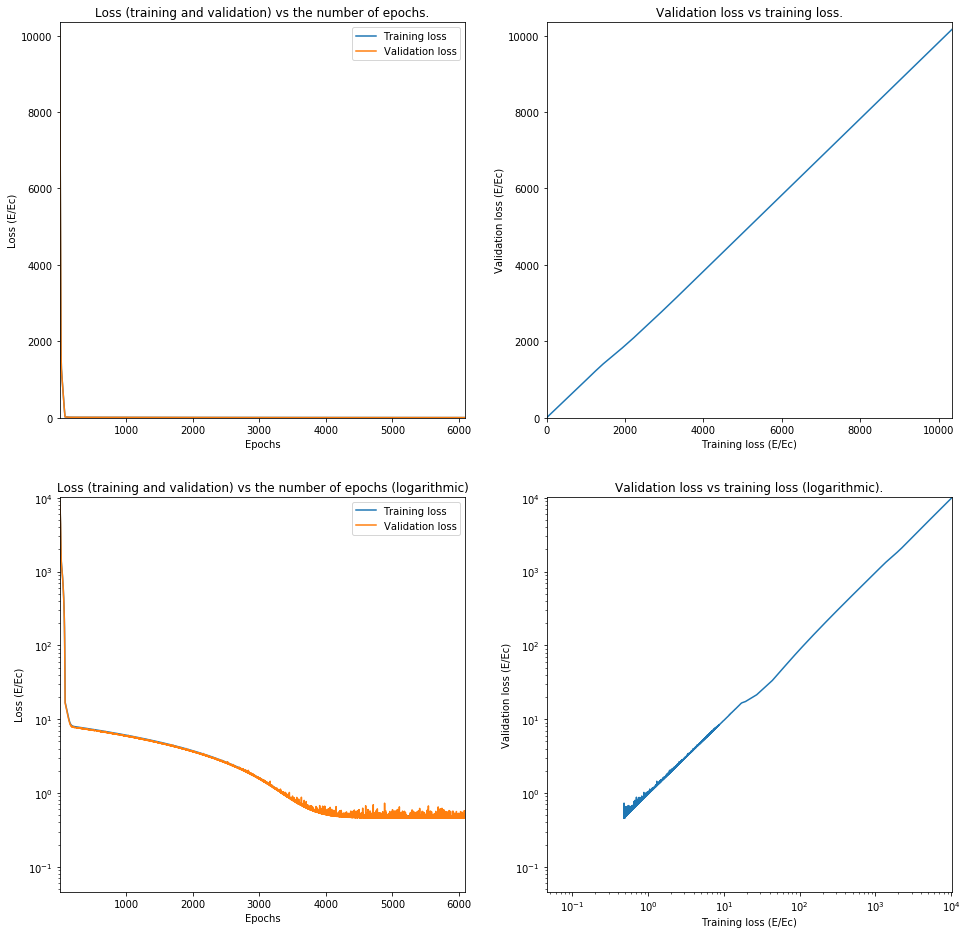

Train on 32002 samples, validate on 8001 samples
Epoch 1/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1816.1836 - val_loss: 1624.7317
Epoch 2/20000
32002/32002 [==============================] - 1s 27us/step - loss: 1484.4327 - val_loss: 1336.6708
Epoch 3/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1253.5551 - val_loss: 1163.8806
Epoch 4/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1121.8991 - val_loss: 1067.7400
Epoch 5/20000
32002/32002 [==============================] - 1s 27us/step - loss: 1048.8453 - val_loss: 1014.0394
Epoch 6/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1006.2473 - val_loss: 980.0022
Epoch 7/20000
32002/32002 [==============================] - 1s 27us/step - loss: 974.8334 - val_loss: 950.9725
Epoch 8/20000
32002/32002 [==============================] - 1s 27us/step - loss: 945.3566 - val_loss: 921.6148
Epoch 9/20000
32002/32002 [=================

32002/32002 [==============================] - 1s 27us/step - loss: 6.8269 - val_loss: 6.5677
Epoch 74/20000
32002/32002 [==============================] - 1s 27us/step - loss: 6.4801 - val_loss: 6.2302
Epoch 75/20000
32002/32002 [==============================] - 1s 27us/step - loss: 6.1831 - val_loss: 6.0048
Epoch 76/20000
32002/32002 [==============================] - 1s 27us/step - loss: 5.9274 - val_loss: 5.7116
Epoch 77/20000
32002/32002 [==============================] - 1s 28us/step - loss: 5.7093 - val_loss: 5.4867
Epoch 78/20000
32002/32002 [==============================] - 1s 28us/step - loss: 5.5154 - val_loss: 5.3154
Epoch 79/20000
32002/32002 [==============================] - 1s 27us/step - loss: 5.3413 - val_loss: 5.1985
Epoch 80/20000
32002/32002 [==============================] - 1s 27us/step - loss: 5.1960 - val_loss: 4.9911
Epoch 81/20000
32002/32002 [==============================] - 1s 27us/step - loss: 5.0625 - val_loss: 4.8609
Epoch 82/20000
32002/32002 [======

Epoch 148/20000
32002/32002 [==============================] - 1s 29us/step - loss: 3.8477 - val_loss: 3.7095
Epoch 149/20000
32002/32002 [==============================] - 1s 29us/step - loss: 3.8378 - val_loss: 3.7423
Epoch 150/20000
32002/32002 [==============================] - 1s 28us/step - loss: 3.8323 - val_loss: 3.7092
Epoch 151/20000
32002/32002 [==============================] - 1s 29us/step - loss: 3.8312 - val_loss: 3.7122
Epoch 152/20000
32002/32002 [==============================] - 1s 28us/step - loss: 3.8233 - val_loss: 3.6973
Epoch 153/20000
32002/32002 [==============================] - 1s 29us/step - loss: 3.8243 - val_loss: 3.7042
Epoch 154/20000
32002/32002 [==============================] - 1s 28us/step - loss: 3.8168 - val_loss: 3.7040
Epoch 155/20000
32002/32002 [==============================] - 1s 29us/step - loss: 3.8069 - val_loss: 3.6991
Epoch 156/20000
32002/32002 [==============================] - 1s 29us/step - loss: 3.8099 - val_loss: 3.8502
Epoch 157/

32002/32002 [==============================] - 1s 28us/step - loss: 3.5002 - val_loss: 3.4292
Epoch 223/20000
32002/32002 [==============================] - 1s 29us/step - loss: 3.4900 - val_loss: 3.3636
Epoch 224/20000
32002/32002 [==============================] - 1s 28us/step - loss: 3.4872 - val_loss: 3.3722
Epoch 225/20000
32002/32002 [==============================] - 1s 29us/step - loss: 3.4806 - val_loss: 3.4317
Epoch 226/20000
32002/32002 [==============================] - 1s 29us/step - loss: 3.4780 - val_loss: 3.3733
Epoch 227/20000
32002/32002 [==============================] - 1s 28us/step - loss: 3.4750 - val_loss: 3.3851
Epoch 228/20000
32002/32002 [==============================] - 1s 29us/step - loss: 3.4703 - val_loss: 3.3440
Epoch 229/20000
32002/32002 [==============================] - 1s 28us/step - loss: 3.4599 - val_loss: 3.3458
Epoch 230/20000
32002/32002 [==============================] - 1s 28us/step - loss: 3.4606 - val_loss: 3.3466
Epoch 231/20000
32002/3200

32002/32002 [==============================] - 1s 29us/step - loss: 3.1755 - val_loss: 3.0787
Epoch 297/20000
32002/32002 [==============================] - 1s 29us/step - loss: 3.1702 - val_loss: 3.1152
Epoch 298/20000
32002/32002 [==============================] - 1s 29us/step - loss: 3.1674 - val_loss: 3.0489
Epoch 299/20000
32002/32002 [==============================] - 1s 29us/step - loss: 3.1621 - val_loss: 3.0686
Epoch 300/20000
32002/32002 [==============================] - 1s 29us/step - loss: 3.1557 - val_loss: 3.0687
Epoch 301/20000
32002/32002 [==============================] - 1s 30us/step - loss: 3.1518 - val_loss: 3.0371
Epoch 302/20000
32002/32002 [==============================] - 1s 28us/step - loss: 3.1490 - val_loss: 3.0520
Epoch 303/20000
32002/32002 [==============================] - 1s 28us/step - loss: 3.1478 - val_loss: 3.0691
Epoch 304/20000
32002/32002 [==============================] - 1s 28us/step - loss: 3.1425 - val_loss: 3.1036
Epoch 305/20000
32002/3200

32002/32002 [==============================] - 1s 28us/step - loss: 2.8807 - val_loss: 2.7768
Epoch 371/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.8766 - val_loss: 2.7880
Epoch 372/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.8720 - val_loss: 2.7678
Epoch 373/20000
32002/32002 [==============================] - 1s 29us/step - loss: 2.8678 - val_loss: 2.7690
Epoch 374/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.8659 - val_loss: 2.8477
Epoch 375/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.8628 - val_loss: 2.7703
Epoch 376/20000
32002/32002 [==============================] - 1s 29us/step - loss: 2.8610 - val_loss: 2.7579
Epoch 377/20000
32002/32002 [==============================] - 1s 29us/step - loss: 2.8570 - val_loss: 2.7772
Epoch 378/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.8468 - val_loss: 2.7755
Epoch 379/20000
32002/3200

32002/32002 [==============================] - 1s 28us/step - loss: 2.6154 - val_loss: 2.5232
Epoch 445/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.6182 - val_loss: 2.5192
Epoch 446/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.6078 - val_loss: 2.5249
Epoch 447/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.6096 - val_loss: 2.5239
Epoch 448/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.6045 - val_loss: 2.5311
Epoch 449/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.6074 - val_loss: 2.5549
Epoch 450/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.6007 - val_loss: 2.6070
Epoch 451/20000
32002/32002 [==============================] - 1s 29us/step - loss: 2.5932 - val_loss: 2.5224
Epoch 452/20000
32002/32002 [==============================] - 1s 29us/step - loss: 2.5949 - val_loss: 2.5204
Epoch 453/20000
32002/3200

32002/32002 [==============================] - 1s 28us/step - loss: 2.3809 - val_loss: 2.2996
Epoch 519/20000
32002/32002 [==============================] - 1s 29us/step - loss: 2.3788 - val_loss: 2.2938
Epoch 520/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.3768 - val_loss: 2.3074
Epoch 521/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.3754 - val_loss: 2.3191
Epoch 522/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.3712 - val_loss: 2.2861
Epoch 523/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.3692 - val_loss: 2.2968
Epoch 524/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.3623 - val_loss: 2.3132
Epoch 525/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.3637 - val_loss: 2.3710
Epoch 526/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.3588 - val_loss: 2.2791
Epoch 527/20000
32002/3200

32002/32002 [==============================] - 1s 28us/step - loss: 2.1702 - val_loss: 2.0940
Epoch 593/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.1638 - val_loss: 2.1189
Epoch 594/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.1646 - val_loss: 2.1124
Epoch 595/20000
32002/32002 [==============================] - 1s 29us/step - loss: 2.1640 - val_loss: 2.0904
Epoch 596/20000
32002/32002 [==============================] - 1s 29us/step - loss: 2.1619 - val_loss: 2.0839
Epoch 597/20000
32002/32002 [==============================] - 1s 29us/step - loss: 2.1567 - val_loss: 2.0825
Epoch 598/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.1536 - val_loss: 2.0781
Epoch 599/20000
32002/32002 [==============================] - 1s 29us/step - loss: 2.1519 - val_loss: 2.0780
Epoch 600/20000
32002/32002 [==============================] - 1s 29us/step - loss: 2.1519 - val_loss: 2.1386
Epoch 601/20000
32002/3200

32002/32002 [==============================] - 1s 30us/step - loss: 1.9828 - val_loss: 1.9251
Epoch 667/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.9752 - val_loss: 1.9134
Epoch 668/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.9745 - val_loss: 1.9100
Epoch 669/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.9782 - val_loss: 1.9569
Epoch 670/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.9699 - val_loss: 1.9126
Epoch 671/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.9662 - val_loss: 1.9613
Epoch 672/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.9655 - val_loss: 1.9039
Epoch 673/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.9655 - val_loss: 1.8968
Epoch 674/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.9621 - val_loss: 1.9887
Epoch 675/20000
32002/3200

32002/32002 [==============================] - 1s 28us/step - loss: 1.8089 - val_loss: 1.7732
Epoch 741/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.8062 - val_loss: 1.8021
Epoch 742/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.8071 - val_loss: 1.7419
Epoch 743/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.8002 - val_loss: 1.7689
Epoch 744/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.8023 - val_loss: 1.7490
Epoch 745/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.7988 - val_loss: 1.7883
Epoch 746/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.7934 - val_loss: 1.7528
Epoch 747/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.7949 - val_loss: 1.7463
Epoch 748/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.7899 - val_loss: 1.7516
Epoch 749/20000
32002/3200

32002/32002 [==============================] - 1s 28us/step - loss: 1.6511 - val_loss: 1.6029
Epoch 815/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.6499 - val_loss: 1.5975
Epoch 816/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.6525 - val_loss: 1.6018
Epoch 817/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.6450 - val_loss: 1.5929
Epoch 818/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.6421 - val_loss: 1.6158
Epoch 819/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.6444 - val_loss: 1.5875
Epoch 820/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.6391 - val_loss: 1.5838
Epoch 821/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.6413 - val_loss: 1.5923
Epoch 822/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.6373 - val_loss: 1.6767
Epoch 823/20000
32002/3200

32002/32002 [==============================] - 1s 29us/step - loss: 1.5103 - val_loss: 1.4592
Epoch 889/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.5027 - val_loss: 1.5002
Epoch 890/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.5023 - val_loss: 1.4610
Epoch 891/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.4992 - val_loss: 1.4518
Epoch 892/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.4967 - val_loss: 1.4501
Epoch 893/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.4997 - val_loss: 1.4469
Epoch 894/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.4968 - val_loss: 1.4562
Epoch 895/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.4947 - val_loss: 1.4498
Epoch 896/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.4900 - val_loss: 1.4432
Epoch 897/20000
32002/3200

32002/32002 [==============================] - 1s 28us/step - loss: 1.3701 - val_loss: 1.3323
Epoch 963/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.3664 - val_loss: 1.3240
Epoch 964/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.3631 - val_loss: 1.3825
Epoch 965/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.3666 - val_loss: 1.3168
Epoch 966/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.3606 - val_loss: 1.3162
Epoch 967/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.3614 - val_loss: 1.3164
Epoch 968/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.3583 - val_loss: 1.3370
Epoch 969/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.3554 - val_loss: 1.4218
Epoch 970/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.3557 - val_loss: 1.3362
Epoch 971/20000
32002/3200

32002/32002 [==============================] - 1s 29us/step - loss: 1.2364 - val_loss: 1.2012
Epoch 1037/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.2337 - val_loss: 1.1952
Epoch 1038/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.2334 - val_loss: 1.2510
Epoch 1039/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.2333 - val_loss: 1.1912
Epoch 1040/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.2335 - val_loss: 1.2267
Epoch 1041/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.2302 - val_loss: 1.2300
Epoch 1042/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.2244 - val_loss: 1.2122
Epoch 1043/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.2240 - val_loss: 1.2022
Epoch 1044/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.2260 - val_loss: 1.1858
Epoch 1045/20000
3

Epoch 1110/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.1167 - val_loss: 1.1414
Epoch 1111/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.1217 - val_loss: 1.1602
Epoch 1112/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1179 - val_loss: 1.0859
Epoch 1113/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.1127 - val_loss: 1.1588
Epoch 1114/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.1132 - val_loss: 1.0755
Epoch 1115/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1073 - val_loss: 1.0749
Epoch 1116/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.1076 - val_loss: 1.1091
Epoch 1117/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.1065 - val_loss: 1.0919
Epoch 1118/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1074 - val_loss: 1.0698
E

Epoch 1184/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.0086 - val_loss: 0.9753
Epoch 1185/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.0078 - val_loss: 0.9733
Epoch 1186/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.0074 - val_loss: 1.0302
Epoch 1187/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.0081 - val_loss: 0.9728
Epoch 1188/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.0037 - val_loss: 0.9710
Epoch 1189/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.0027 - val_loss: 0.9914
Epoch 1190/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.0001 - val_loss: 0.9718
Epoch 1191/20000
32002/32002 [==============================] - 1s 29us/step - loss: 1.0012 - val_loss: 0.9883
Epoch 1192/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9986 - val_loss: 0.9912
E

Epoch 1258/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9084 - val_loss: 0.8919
Epoch 1259/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9092 - val_loss: 0.8848
Epoch 1260/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9105 - val_loss: 0.8792
Epoch 1261/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.9079 - val_loss: 0.9202
Epoch 1262/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9085 - val_loss: 0.8794
Epoch 1263/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.9019 - val_loss: 0.8762
Epoch 1264/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9057 - val_loss: 0.8966
Epoch 1265/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.9023 - val_loss: 0.8740
Epoch 1266/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8999 - val_loss: 0.8766
E

Epoch 1332/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8271 - val_loss: 0.8585
Epoch 1333/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8280 - val_loss: 0.8035
Epoch 1334/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8223 - val_loss: 0.8244
Epoch 1335/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8189 - val_loss: 0.8067
Epoch 1336/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8240 - val_loss: 0.8022
Epoch 1337/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8246 - val_loss: 0.8152
Epoch 1338/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8186 - val_loss: 0.8058
Epoch 1339/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8187 - val_loss: 0.8038
Epoch 1340/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8165 - val_loss: 0.8515
E

Epoch 1406/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.7522 - val_loss: 0.7749
Epoch 1407/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.7513 - val_loss: 0.7343
Epoch 1408/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.7545 - val_loss: 0.7373
Epoch 1409/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.7508 - val_loss: 0.7645
Epoch 1410/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.7478 - val_loss: 0.7370
Epoch 1411/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.7447 - val_loss: 0.7463
Epoch 1412/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.7469 - val_loss: 0.7258
Epoch 1413/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.7473 - val_loss: 0.7389
Epoch 1414/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.7498 - val_loss: 0.7243
E

Epoch 1480/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.6932 - val_loss: 0.7011
Epoch 1481/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.6929 - val_loss: 0.6881
Epoch 1482/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.6901 - val_loss: 0.6681
Epoch 1483/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.6908 - val_loss: 0.6672
Epoch 1484/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.6871 - val_loss: 0.6696
Epoch 1485/20000
32002/32002 [==============================] - 1s 30us/step - loss: 0.6879 - val_loss: 0.6645
Epoch 1486/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.6887 - val_loss: 0.6925
Epoch 1487/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.6861 - val_loss: 0.6729
Epoch 1488/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.6859 - val_loss: 0.6658
E

Epoch 1554/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.6418 - val_loss: 0.6187
Epoch 1555/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.6377 - val_loss: 0.6183
Epoch 1556/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.6402 - val_loss: 0.6259
Epoch 1557/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.6390 - val_loss: 0.6277
Epoch 1558/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.6395 - val_loss: 0.6252
Epoch 1559/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.6378 - val_loss: 0.6170
Epoch 1560/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.6392 - val_loss: 0.6162
Epoch 1561/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.6362 - val_loss: 0.6171
Epoch 1562/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.6354 - val_loss: 0.6185
E

Epoch 1628/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.6023 - val_loss: 0.6433
Epoch 1629/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.6032 - val_loss: 0.6445
Epoch 1630/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5980 - val_loss: 0.6046
Epoch 1631/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5990 - val_loss: 0.5849
Epoch 1632/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5971 - val_loss: 0.5867
Epoch 1633/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5999 - val_loss: 0.5917
Epoch 1634/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5986 - val_loss: 0.5815
Epoch 1635/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5955 - val_loss: 0.6314
Epoch 1636/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5985 - val_loss: 0.5789
E

Epoch 1702/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5710 - val_loss: 0.5524
Epoch 1703/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5686 - val_loss: 0.5468
Epoch 1704/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5721 - val_loss: 0.5581
Epoch 1705/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5682 - val_loss: 0.6053
Epoch 1706/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5679 - val_loss: 0.5485
Epoch 1707/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5675 - val_loss: 0.5600
Epoch 1708/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5667 - val_loss: 0.5463
Epoch 1709/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5705 - val_loss: 0.5681
Epoch 1710/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5653 - val_loss: 0.5456
E

32002/32002 [==============================] - 1s 29us/step - loss: 0.5462 - val_loss: 0.5247
Epoch 1776/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5462 - val_loss: 0.5235
Epoch 1777/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5452 - val_loss: 0.5281
Epoch 1778/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5446 - val_loss: 0.5584
Epoch 1779/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5450 - val_loss: 0.5288
Epoch 1780/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5450 - val_loss: 0.5241
Epoch 1781/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5448 - val_loss: 0.5313
Epoch 1782/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5433 - val_loss: 0.5269
Epoch 1783/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5432 - val_loss: 0.5422
Epoch 1784/20000
3

Epoch 1849/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5257 - val_loss: 0.5047
Epoch 1850/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5270 - val_loss: 0.5501
Epoch 1851/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5251 - val_loss: 0.5831
Epoch 1852/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5293 - val_loss: 0.5223
Epoch 1853/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5253 - val_loss: 0.5118
Epoch 1854/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5270 - val_loss: 0.5344
Epoch 1855/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5254 - val_loss: 0.5164
Epoch 1856/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5269 - val_loss: 0.5267
Epoch 1857/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5258 - val_loss: 0.5056
E

Epoch 1923/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5124 - val_loss: 0.4916
Epoch 1924/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5141 - val_loss: 0.4923
Epoch 1925/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5157 - val_loss: 0.5212
Epoch 1926/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5132 - val_loss: 0.5047
Epoch 1927/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5116 - val_loss: 0.4917
Epoch 1928/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5152 - val_loss: 0.4943
Epoch 1929/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5150 - val_loss: 0.5226
Epoch 1930/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5105 - val_loss: 0.4977
Epoch 1931/20000
32002/32002 [==============================] - 1s 31us/step - loss: 0.5113 - val_loss: 0.4994
E

Epoch 1997/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5024 - val_loss: 0.4864
Epoch 1998/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5054 - val_loss: 0.4899
Epoch 1999/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5026 - val_loss: 0.4874
Epoch 2000/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5027 - val_loss: 0.5114
Epoch 2001/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5027 - val_loss: 0.5177
Epoch 2002/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5074 - val_loss: 0.4820
Epoch 2003/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5005 - val_loss: 0.5238
Epoch 2004/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4998 - val_loss: 0.4882
Epoch 2005/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5054 - val_loss: 0.4961
E

Epoch 2071/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4967 - val_loss: 0.4774
Epoch 2072/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4949 - val_loss: 0.4783
Epoch 2073/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4967 - val_loss: 0.4839
Epoch 2074/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4994 - val_loss: 0.4884
Epoch 2075/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4983 - val_loss: 0.5865
Epoch 2076/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5004 - val_loss: 0.4919
Epoch 2077/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4942 - val_loss: 0.4823
Epoch 2078/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4944 - val_loss: 0.4845
Epoch 2079/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4948 - val_loss: 0.4783
E

Epoch 2145/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4902 - val_loss: 0.4879
Epoch 2146/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4940 - val_loss: 0.4693
Epoch 2147/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4909 - val_loss: 0.4755
Epoch 2148/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4896 - val_loss: 0.5130
Epoch 2149/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4914 - val_loss: 0.4780
Epoch 2150/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4926 - val_loss: 0.5332
Epoch 2151/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4913 - val_loss: 0.4962
Epoch 2152/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4890 - val_loss: 0.5142
Epoch 2153/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4892 - val_loss: 0.4762
E

Epoch 2219/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4881 - val_loss: 0.4799
Epoch 2220/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4869 - val_loss: 0.4674
Epoch 2221/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4876 - val_loss: 0.4664
Epoch 2222/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4905 - val_loss: 0.4708
Epoch 2223/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4872 - val_loss: 0.4697
Epoch 2224/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4881 - val_loss: 0.4718
Epoch 2225/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4896 - val_loss: 0.4668
Epoch 2226/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4872 - val_loss: 0.5048
Epoch 2227/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4892 - val_loss: 0.4652
E

Epoch 2293/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4858 - val_loss: 0.4714
Epoch 2294/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4834 - val_loss: 0.4940
Epoch 2295/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4861 - val_loss: 0.4637
Epoch 2296/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4842 - val_loss: 0.4682
Epoch 2297/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4866 - val_loss: 0.4631
Epoch 2298/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4838 - val_loss: 0.4695
Epoch 2299/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4848 - val_loss: 0.4647
Epoch 2300/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4841 - val_loss: 0.5882
Epoch 2301/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4855 - val_loss: 0.4963
E

Epoch 2367/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4843 - val_loss: 0.4747
Epoch 2368/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4862 - val_loss: 0.5143
Epoch 2369/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4849 - val_loss: 0.4647
Epoch 2370/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4828 - val_loss: 0.4687
Epoch 2371/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4851 - val_loss: 0.4687
Epoch 2372/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4829 - val_loss: 0.4653
Epoch 2373/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4840 - val_loss: 0.4678
Epoch 2374/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4843 - val_loss: 0.4706
Epoch 2375/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4856 - val_loss: 0.4604
E

Epoch 2441/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4843 - val_loss: 0.4763
Epoch 2442/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4843 - val_loss: 0.5682
Epoch 2443/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4820 - val_loss: 0.4926
Epoch 2444/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4834 - val_loss: 0.4611
Epoch 2445/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4828 - val_loss: 0.4587
Epoch 2446/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4824 - val_loss: 0.4631
Epoch 2447/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4831 - val_loss: 0.4648
Epoch 2448/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4824 - val_loss: 0.4803
Epoch 2449/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4825 - val_loss: 0.4919
E

Epoch 2515/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4834 - val_loss: 0.4586
Epoch 2516/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4823 - val_loss: 0.5462
Epoch 2517/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4814 - val_loss: 0.5195
Epoch 2518/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4829 - val_loss: 0.4600
Epoch 2519/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4825 - val_loss: 0.4666
Epoch 2520/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4791 - val_loss: 0.4602
Epoch 2521/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4817 - val_loss: 0.4626
Epoch 2522/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4806 - val_loss: 0.4887
Epoch 2523/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4800 - val_loss: 0.4595
E

Epoch 2589/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4823 - val_loss: 0.5475
Epoch 2590/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4848 - val_loss: 0.4589
Epoch 2591/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4826 - val_loss: 0.4573
Epoch 2592/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4816 - val_loss: 0.4659
Epoch 2593/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4816 - val_loss: 0.4658
Epoch 2594/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4814 - val_loss: 0.4614
Epoch 2595/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4829 - val_loss: 0.4678
Epoch 2596/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4800 - val_loss: 0.4603
Epoch 2597/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4823 - val_loss: 0.4620
E

Epoch 2663/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4826 - val_loss: 0.4967
Epoch 2664/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4844 - val_loss: 0.4679
Epoch 2665/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4788 - val_loss: 0.4606
Epoch 2666/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4816 - val_loss: 0.4574
Epoch 2667/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4788 - val_loss: 0.4585
Epoch 2668/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4823 - val_loss: 0.4884
Epoch 2669/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4807 - val_loss: 0.5088
Epoch 2670/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4800 - val_loss: 0.4655
Epoch 2671/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4830 - val_loss: 0.4631
E

Epoch 2737/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4809 - val_loss: 0.4660
Epoch 2738/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4795 - val_loss: 0.4661
Epoch 2739/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4815 - val_loss: 0.4682
Epoch 2740/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4832 - val_loss: 0.4589
Epoch 2741/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4847 - val_loss: 0.4589
Epoch 2742/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4793 - val_loss: 0.4795
Epoch 2743/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4837 - val_loss: 0.4631
Epoch 2744/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4780 - val_loss: 0.4634
Epoch 2745/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4800 - val_loss: 0.4843
E

Epoch 2811/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4817 - val_loss: 0.4583
Epoch 2812/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4790 - val_loss: 0.5116
Epoch 2813/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4798 - val_loss: 0.4574
Epoch 2814/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4790 - val_loss: 0.4562
Epoch 2815/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4788 - val_loss: 0.4598
Epoch 2816/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4797 - val_loss: 0.4844
Epoch 2817/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4785 - val_loss: 0.4583
Epoch 2818/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4781 - val_loss: 0.5020
Epoch 2819/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4808 - val_loss: 0.4625
E

Epoch 2885/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4808 - val_loss: 0.4691
Epoch 2886/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4787 - val_loss: 0.4563
Epoch 2887/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4803 - val_loss: 0.4972
Epoch 2888/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4791 - val_loss: 0.4591
Epoch 2889/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4791 - val_loss: 0.5166
Epoch 2890/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4785 - val_loss: 0.4842
Epoch 2891/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4785 - val_loss: 0.4625
Epoch 2892/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4785 - val_loss: 0.4571
Epoch 2893/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4789 - val_loss: 0.4597
E

Epoch 2959/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4824 - val_loss: 0.4596
Epoch 2960/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4793 - val_loss: 0.4575
Epoch 2961/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4798 - val_loss: 0.4774
Epoch 2962/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4797 - val_loss: 0.5525
Epoch 2963/20000
32002/32002 [==============================] - 1s 30us/step - loss: 0.4812 - val_loss: 0.5255
Epoch 2964/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4812 - val_loss: 0.4844
Epoch 2965/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4841 - val_loss: 0.4572
Epoch 2966/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4787 - val_loss: 0.5090
Epoch 2967/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4877 - val_loss: 0.5009
E

Epoch 3033/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4807 - val_loss: 0.4651
Epoch 3034/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4784 - val_loss: 0.4582
Epoch 3035/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4800 - val_loss: 0.4959
Epoch 3036/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4816 - val_loss: 0.4699
Epoch 3037/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4801 - val_loss: 0.4902
Epoch 3038/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4828 - val_loss: 0.4745
Epoch 3039/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4797 - val_loss: 0.4676
Epoch 3040/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4813 - val_loss: 0.4564
Epoch 3041/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4795 - val_loss: 0.5114
E

Epoch 3107/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4796 - val_loss: 0.4985
Epoch 3108/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4815 - val_loss: 0.4718
Epoch 3109/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4810 - val_loss: 0.4613
Epoch 3110/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4821 - val_loss: 0.5227
Epoch 3111/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4814 - val_loss: 0.4580
Epoch 3112/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4782 - val_loss: 0.4697
Epoch 3113/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4812 - val_loss: 0.4735
Epoch 3114/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4788 - val_loss: 0.4557
Epoch 3115/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4795 - val_loss: 0.4644
E

Epoch 3181/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4795 - val_loss: 0.4622
Epoch 3182/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4787 - val_loss: 0.5159
Epoch 3183/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4816 - val_loss: 0.4631
Epoch 3184/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4784 - val_loss: 0.4601
Epoch 3185/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4791 - val_loss: 0.5269
Epoch 3186/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4798 - val_loss: 0.4708
Epoch 3187/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4816 - val_loss: 0.4681
Epoch 3188/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4785 - val_loss: 0.4681
Epoch 3189/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4820 - val_loss: 0.4556
E

Epoch 3255/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4814 - val_loss: 0.4687
Epoch 3256/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4812 - val_loss: 0.4589
Epoch 3257/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4795 - val_loss: 0.4651
Epoch 3258/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4800 - val_loss: 0.5269
Epoch 3259/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4797 - val_loss: 0.5091
Epoch 3260/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4796 - val_loss: 0.4652
Epoch 3261/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4794 - val_loss: 0.5390
Epoch 3262/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4809 - val_loss: 0.5414
Epoch 3263/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4829 - val_loss: 0.4873
E

Epoch 3329/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4809 - val_loss: 0.4618
Epoch 3330/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4794 - val_loss: 0.4948
Epoch 3331/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4783 - val_loss: 0.4558
Epoch 3332/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4806 - val_loss: 0.4561
Epoch 3333/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4796 - val_loss: 0.4663
Epoch 3334/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4807 - val_loss: 0.4572
Epoch 3335/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4773 - val_loss: 0.4670
Epoch 3336/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4837 - val_loss: 0.5174
Epoch 3337/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4785 - val_loss: 0.4561
E

Epoch 3403/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4803 - val_loss: 0.4620
Epoch 3404/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4804 - val_loss: 0.4585
Epoch 3405/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4786 - val_loss: 0.5950
Epoch 3406/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4827 - val_loss: 0.4557
Epoch 3407/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4790 - val_loss: 0.4755
Epoch 3408/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4804 - val_loss: 0.4638
Epoch 3409/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4814 - val_loss: 0.4599
Epoch 3410/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4784 - val_loss: 0.4615
Epoch 3411/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4785 - val_loss: 0.4567
E

Epoch 3477/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4795 - val_loss: 0.4631
Epoch 3478/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4802 - val_loss: 0.4833
Epoch 3479/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4793 - val_loss: 0.4626
Epoch 3480/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4802 - val_loss: 0.4590
Epoch 3481/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4796 - val_loss: 0.4704
Epoch 3482/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4788 - val_loss: 0.4607
Epoch 3483/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4792 - val_loss: 0.5186
Epoch 3484/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4826 - val_loss: 0.4637
Epoch 3485/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4789 - val_loss: 0.4967
E

Epoch 3551/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4825 - val_loss: 0.5112
Epoch 3552/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4808 - val_loss: 0.4661
Epoch 3553/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4811 - val_loss: 0.4786
Epoch 3554/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4793 - val_loss: 0.4568
Epoch 3555/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4820 - val_loss: 0.4567
Epoch 3556/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4804 - val_loss: 0.4665
Epoch 3557/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4783 - val_loss: 0.5826
Epoch 3558/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4793 - val_loss: 0.4827
Epoch 3559/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4812 - val_loss: 0.4554
E

32002/32002 [==============================] - 1s 27us/step - loss: 0.4790 - val_loss: 0.4717
Epoch 3625/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4794 - val_loss: 0.4844
Epoch 3626/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4782 - val_loss: 0.4585
Epoch 3627/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4779 - val_loss: 0.4909
Epoch 3628/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4797 - val_loss: 0.4673
Epoch 3629/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4806 - val_loss: 0.4623
Epoch 3630/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4805 - val_loss: 0.4961
Epoch 3631/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4793 - val_loss: 0.4685
Epoch 3632/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4810 - val_loss: 0.4599
Epoch 3633/20000
3

Epoch 3698/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4794 - val_loss: 0.4587
Epoch 3699/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4793 - val_loss: 0.4669
Epoch 3700/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4816 - val_loss: 0.5305
Epoch 3701/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4799 - val_loss: 0.4744
Epoch 3702/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4798 - val_loss: 0.5261
Epoch 3703/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4816 - val_loss: 0.4591
Epoch 3704/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4822 - val_loss: 0.4603
Epoch 3705/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4774 - val_loss: 0.4563
Epoch 3706/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4803 - val_loss: 0.4632
E

Epoch 3772/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4806 - val_loss: 0.5432
Epoch 3773/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4786 - val_loss: 0.4696
Epoch 3774/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4791 - val_loss: 0.5165
Epoch 3775/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4803 - val_loss: 0.5291
Epoch 3776/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4816 - val_loss: 0.4575
Epoch 3777/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4772 - val_loss: 0.4712
Epoch 3778/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4791 - val_loss: 0.4585
Epoch 3779/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4796 - val_loss: 0.4955
Epoch 3780/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4823 - val_loss: 0.4744
E

Epoch 3846/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4792 - val_loss: 0.4582
Epoch 3847/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4791 - val_loss: 0.4589
Epoch 3848/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4835 - val_loss: 0.5040
Epoch 3849/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4786 - val_loss: 0.4693
Epoch 3850/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4824 - val_loss: 0.4703
Epoch 3851/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4809 - val_loss: 0.4598
Epoch 3852/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4821 - val_loss: 0.4638
Epoch 3853/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4827 - val_loss: 0.4636
Epoch 3854/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4780 - val_loss: 0.4815
E

Epoch 3920/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4797 - val_loss: 0.4624
Epoch 3921/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4812 - val_loss: 0.5164
Epoch 3922/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4840 - val_loss: 0.4894
Epoch 3923/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4820 - val_loss: 0.4630
Epoch 3924/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4816 - val_loss: 0.4704
Epoch 3925/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4801 - val_loss: 0.4586
Epoch 3926/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4781 - val_loss: 0.4589
Epoch 3927/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4805 - val_loss: 0.4744
Epoch 3928/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4817 - val_loss: 0.4800
E

Epoch 3994/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4823 - val_loss: 0.4573
Epoch 3995/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4819 - val_loss: 0.4640
Epoch 3996/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4805 - val_loss: 0.4923
Epoch 3997/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4810 - val_loss: 0.4576
Epoch 3998/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4780 - val_loss: 0.4671
Epoch 3999/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4796 - val_loss: 0.4571
Epoch 4000/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4784 - val_loss: 0.4678
Epoch 4001/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4780 - val_loss: 0.4564
Epoch 4002/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4798 - val_loss: 0.4590
E

Epoch 4068/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4787 - val_loss: 0.4624
Epoch 4069/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4785 - val_loss: 0.4714
Epoch 4070/20000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4813 - val_loss: 0.4614
Epoch 4071/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4806 - val_loss: 0.4588
Epoch 4072/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4820 - val_loss: 0.4614
Epoch 4073/20000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4810 - val_loss: 0.4566
Epoch 4074/20000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4797 - val_loss: 0.5312
Epoch 4075/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4783 - val_loss: 0.4580
Epoch 4076/20000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4793 - val_loss: 0.5499
E

32002/32002 [==============================] - 1s 27us/step - loss: 0.4821 - val_loss: 0.4654
Epoch 4142/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4804 - val_loss: 0.4754
Epoch 4143/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4794 - val_loss: 0.4591
Epoch 4144/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4780 - val_loss: 0.4818
Epoch 4145/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4828 - val_loss: 0.5256
Epoch 4146/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4798 - val_loss: 0.4652
Epoch 4147/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4829 - val_loss: 0.5042
Epoch 4148/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4805 - val_loss: 0.5167
Epoch 4149/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4810 - val_loss: 0.4554
Epoch 4150/20000
3

Epoch 4215/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4816 - val_loss: 0.4592
Epoch 4216/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4819 - val_loss: 0.4631
Epoch 4217/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4804 - val_loss: 0.4810
Epoch 4218/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4827 - val_loss: 0.4920
Epoch 4219/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4816 - val_loss: 0.4598
Epoch 4220/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4798 - val_loss: 0.4572
Epoch 4221/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4791 - val_loss: 0.4563
Epoch 4222/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4787 - val_loss: 0.4582
Epoch 4223/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4797 - val_loss: 0.4745
E

Epoch 4289/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4784 - val_loss: 0.4558
Epoch 4290/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4803 - val_loss: 0.4579
Epoch 4291/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4781 - val_loss: 0.4649
Epoch 4292/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4794 - val_loss: 0.4588
Epoch 4293/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4811 - val_loss: 0.4573
Epoch 4294/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4828 - val_loss: 0.4582
Epoch 4295/20000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4793 - val_loss: 0.4943
Epoch 4296/20000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4783 - val_loss: 0.4825
Epoch 4297/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4812 - val_loss: 0.5097
E

Epoch 4363/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4800 - val_loss: 0.4605
Epoch 4364/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4799 - val_loss: 0.4649
Epoch 4365/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4824 - val_loss: 0.4584
Epoch 4366/20000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4797 - val_loss: 0.4985
Epoch 4367/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4815 - val_loss: 0.4777
Epoch 4368/20000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4815 - val_loss: 0.5075
Epoch 4369/20000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4791 - val_loss: 0.4591
Epoch 4370/20000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4807 - val_loss: 0.4684
Epoch 4371/20000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4817 - val_loss: 0.4634
E

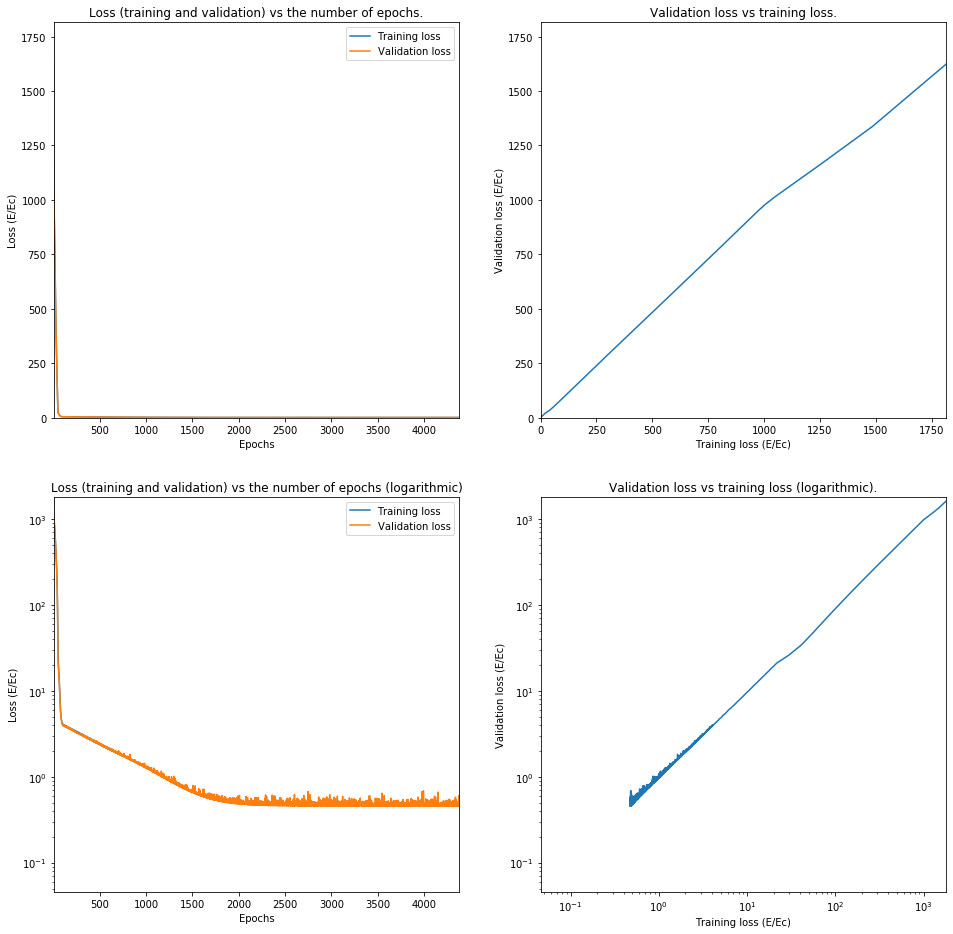

Train on 32002 samples, validate on 8001 samples
Epoch 1/20000
32002/32002 [==============================] - 1s 28us/step - loss: 17286.0861 - val_loss: 17088.6774
Epoch 2/20000
32002/32002 [==============================] - 1s 26us/step - loss: 16895.1103 - val_loss: 16698.5249
Epoch 3/20000
32002/32002 [==============================] - 1s 26us/step - loss: 16504.5089 - val_loss: 16308.1793
Epoch 4/20000
32002/32002 [==============================] - 1s 27us/step - loss: 16113.6278 - val_loss: 15917.6624
Epoch 5/20000
32002/32002 [==============================] - 1s 26us/step - loss: 15722.9665 - val_loss: 15527.4368
Epoch 6/20000
32002/32002 [==============================] - 1s 27us/step - loss: 15332.1614 - val_loss: 15136.8526
Epoch 7/20000
32002/32002 [==============================] - 1s 26us/step - loss: 14941.4636 - val_loss: 14746.7405
Epoch 8/20000
32002/32002 [==============================] - 1s 25us/step - loss: 14550.7931 - val_loss: 14356.4319
Epoch 9/20000
32002/320

32002/32002 [==============================] - 1s 26us/step - loss: 819.5323 - val_loss: 796.1872
Epoch 72/20000
32002/32002 [==============================] - 1s 26us/step - loss: 788.0105 - val_loss: 765.0271
Epoch 73/20000
32002/32002 [==============================] - 1s 26us/step - loss: 756.5908 - val_loss: 733.9620
Epoch 74/20000
32002/32002 [==============================] - 1s 27us/step - loss: 725.2933 - val_loss: 703.0460
Epoch 75/20000
32002/32002 [==============================] - 1s 26us/step - loss: 694.1921 - val_loss: 672.3790
Epoch 76/20000
32002/32002 [==============================] - 1s 27us/step - loss: 663.3311 - val_loss: 641.9933
Epoch 77/20000
32002/32002 [==============================] - 1s 26us/step - loss: 632.7039 - val_loss: 611.8123
Epoch 78/20000
32002/32002 [==============================] - 1s 27us/step - loss: 602.2879 - val_loss: 581.8509
Epoch 79/20000
32002/32002 [==============================] - 1s 26us/step - loss: 572.1718 - val_loss: 552.211

Epoch 144/20000
32002/32002 [==============================] - 1s 26us/step - loss: 65.4360 - val_loss: 63.8018
Epoch 145/20000
32002/32002 [==============================] - 1s 27us/step - loss: 64.8682 - val_loss: 63.2359
Epoch 146/20000
32002/32002 [==============================] - 1s 26us/step - loss: 64.2921 - val_loss: 62.6975
Epoch 147/20000
32002/32002 [==============================] - 1s 26us/step - loss: 63.7223 - val_loss: 62.1543
Epoch 148/20000
32002/32002 [==============================] - 1s 27us/step - loss: 63.1700 - val_loss: 61.5690
Epoch 149/20000
32002/32002 [==============================] - 1s 26us/step - loss: 62.6114 - val_loss: 61.0835
Epoch 150/20000
32002/32002 [==============================] - 1s 25us/step - loss: 62.0601 - val_loss: 60.5138
Epoch 151/20000
32002/32002 [==============================] - 1s 27us/step - loss: 61.5062 - val_loss: 59.9541
Epoch 152/20000
32002/32002 [==============================] - 1s 25us/step - loss: 60.9554 - val_loss: 

32002/32002 [==============================] - 1s 26us/step - loss: 29.3009 - val_loss: 28.6940
Epoch 218/20000
32002/32002 [==============================] - 1s 27us/step - loss: 28.8951 - val_loss: 28.3014
Epoch 219/20000
32002/32002 [==============================] - 1s 27us/step - loss: 28.5057 - val_loss: 27.9686
Epoch 220/20000
32002/32002 [==============================] - 1s 27us/step - loss: 28.1032 - val_loss: 27.5239
Epoch 221/20000
32002/32002 [==============================] - 1s 27us/step - loss: 27.7072 - val_loss: 27.1574
Epoch 222/20000
32002/32002 [==============================] - 1s 27us/step - loss: 27.3249 - val_loss: 26.7768
Epoch 223/20000
32002/32002 [==============================] - 1s 27us/step - loss: 26.9311 - val_loss: 26.4088
Epoch 224/20000
32002/32002 [==============================] - 1s 26us/step - loss: 26.5637 - val_loss: 26.0699
Epoch 225/20000
32002/32002 [==============================] - 1s 26us/step - loss: 26.1725 - val_loss: 25.6767
Epoch 22

32002/32002 [==============================] - 1s 28us/step - loss: 10.0126 - val_loss: 9.9511
Epoch 291/20000
32002/32002 [==============================] - 1s 27us/step - loss: 9.8685 - val_loss: 9.8397
Epoch 292/20000
32002/32002 [==============================] - 1s 27us/step - loss: 9.7289 - val_loss: 9.7023
Epoch 293/20000
32002/32002 [==============================] - 1s 27us/step - loss: 9.5883 - val_loss: 9.5085
Epoch 294/20000
32002/32002 [==============================] - 1s 27us/step - loss: 9.4542 - val_loss: 9.4303
Epoch 295/20000
32002/32002 [==============================] - 1s 27us/step - loss: 9.3125 - val_loss: 9.2515
Epoch 296/20000
32002/32002 [==============================] - 1s 26us/step - loss: 9.1805 - val_loss: 9.1029
Epoch 297/20000
32002/32002 [==============================] - 1s 27us/step - loss: 9.0462 - val_loss: 8.9690
Epoch 298/20000
32002/32002 [==============================] - 1s 26us/step - loss: 8.9112 - val_loss: 8.8397
Epoch 299/20000
32002/320

32002/32002 [==============================] - 1s 27us/step - loss: 4.8653 - val_loss: 4.7557
Epoch 365/20000
32002/32002 [==============================] - 1s 27us/step - loss: 4.8491 - val_loss: 4.7468
Epoch 366/20000
32002/32002 [==============================] - 1s 26us/step - loss: 4.8423 - val_loss: 4.7521
Epoch 367/20000
32002/32002 [==============================] - 1s 23us/step - loss: 4.8332 - val_loss: 4.7436
Epoch 368/20000
32002/32002 [==============================] - 1s 25us/step - loss: 4.8256 - val_loss: 4.7310
Epoch 369/20000
32002/32002 [==============================] - 1s 27us/step - loss: 4.8164 - val_loss: 4.7189
Epoch 370/20000
32002/32002 [==============================] - 1s 26us/step - loss: 4.8020 - val_loss: 4.8414
Epoch 371/20000
32002/32002 [==============================] - 1s 26us/step - loss: 4.7999 - val_loss: 4.7050
Epoch 372/20000
32002/32002 [==============================] - 1s 27us/step - loss: 4.7955 - val_loss: 4.7300
Epoch 373/20000
32002/3200

32002/32002 [==============================] - 1s 26us/step - loss: 4.3106 - val_loss: 4.2779
Epoch 439/20000
32002/32002 [==============================] - 1s 26us/step - loss: 4.3036 - val_loss: 4.2745
Epoch 440/20000
32002/32002 [==============================] - 1s 24us/step - loss: 4.2940 - val_loss: 4.1895
Epoch 441/20000
32002/32002 [==============================] - 1s 25us/step - loss: 4.2916 - val_loss: 4.2361
Epoch 442/20000
32002/32002 [==============================] - 1s 25us/step - loss: 4.2785 - val_loss: 4.1751
Epoch 443/20000
32002/32002 [==============================] - 1s 23us/step - loss: 4.2701 - val_loss: 4.1715
Epoch 444/20000
32002/32002 [==============================] - 1s 25us/step - loss: 4.2618 - val_loss: 4.1620
Epoch 445/20000
32002/32002 [==============================] - 1s 25us/step - loss: 4.2604 - val_loss: 4.1648
Epoch 446/20000
32002/32002 [==============================] - 1s 28us/step - loss: 4.2503 - val_loss: 4.1532
Epoch 447/20000
32002/3200

32002/32002 [==============================] - 1s 27us/step - loss: 3.7915 - val_loss: 3.6904
Epoch 513/20000
32002/32002 [==============================] - 1s 27us/step - loss: 3.7786 - val_loss: 3.6826
Epoch 514/20000
32002/32002 [==============================] - 1s 26us/step - loss: 3.7768 - val_loss: 3.6953
Epoch 515/20000
32002/32002 [==============================] - 1s 27us/step - loss: 3.7702 - val_loss: 3.6759
Epoch 516/20000
32002/32002 [==============================] - 1s 27us/step - loss: 3.7639 - val_loss: 3.6743
Epoch 517/20000
32002/32002 [==============================] - 1s 27us/step - loss: 3.7544 - val_loss: 3.6556
Epoch 518/20000
32002/32002 [==============================] - 1s 28us/step - loss: 3.7504 - val_loss: 3.6635
Epoch 519/20000
32002/32002 [==============================] - 1s 25us/step - loss: 3.7394 - val_loss: 3.7001
Epoch 520/20000
32002/32002 [==============================] - 1s 27us/step - loss: 3.7345 - val_loss: 3.6531
Epoch 521/20000
32002/3200

32002/32002 [==============================] - 1s 26us/step - loss: 3.3013 - val_loss: 3.2111
Epoch 587/20000
32002/32002 [==============================] - 1s 27us/step - loss: 3.3040 - val_loss: 3.2161
Epoch 588/20000
32002/32002 [==============================] - 1s 25us/step - loss: 3.2886 - val_loss: 3.1975
Epoch 589/20000
32002/32002 [==============================] - 1s 26us/step - loss: 3.2856 - val_loss: 3.1903
Epoch 590/20000
32002/32002 [==============================] - 1s 27us/step - loss: 3.2808 - val_loss: 3.4178
Epoch 591/20000
32002/32002 [==============================] - 1s 26us/step - loss: 3.2741 - val_loss: 3.1780
Epoch 592/20000
32002/32002 [==============================] - 1s 27us/step - loss: 3.2653 - val_loss: 3.1710
Epoch 593/20000
32002/32002 [==============================] - 1s 27us/step - loss: 3.2609 - val_loss: 3.1967
Epoch 594/20000
32002/32002 [==============================] - 1s 26us/step - loss: 3.2576 - val_loss: 3.1860
Epoch 595/20000
32002/3200

32002/32002 [==============================] - 1s 28us/step - loss: 2.8535 - val_loss: 2.7735
Epoch 661/20000
32002/32002 [==============================] - 1s 27us/step - loss: 2.8540 - val_loss: 2.7652
Epoch 662/20000
32002/32002 [==============================] - 1s 27us/step - loss: 2.8486 - val_loss: 2.7523
Epoch 663/20000
32002/32002 [==============================] - 1s 26us/step - loss: 2.8374 - val_loss: 2.7704
Epoch 664/20000
32002/32002 [==============================] - 1s 26us/step - loss: 2.8314 - val_loss: 2.7413
Epoch 665/20000
32002/32002 [==============================] - 1s 27us/step - loss: 2.8229 - val_loss: 2.7355
Epoch 666/20000
32002/32002 [==============================] - 1s 26us/step - loss: 2.8191 - val_loss: 2.7428
Epoch 667/20000
32002/32002 [==============================] - 1s 26us/step - loss: 2.8130 - val_loss: 2.7365
Epoch 668/20000
32002/32002 [==============================] - 1s 27us/step - loss: 2.8085 - val_loss: 2.7357
Epoch 669/20000
32002/3200

32002/32002 [==============================] - 1s 27us/step - loss: 2.4389 - val_loss: 2.3653
Epoch 735/20000
32002/32002 [==============================] - 1s 27us/step - loss: 2.4430 - val_loss: 2.3703
Epoch 736/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.4352 - val_loss: 2.3769
Epoch 737/20000
32002/32002 [==============================] - 1s 28us/step - loss: 2.4254 - val_loss: 2.3419
Epoch 738/20000
32002/32002 [==============================] - 1s 27us/step - loss: 2.4238 - val_loss: 2.3478
Epoch 739/20000
32002/32002 [==============================] - 1s 26us/step - loss: 2.4148 - val_loss: 2.3381
Epoch 740/20000
32002/32002 [==============================] - 1s 25us/step - loss: 2.4108 - val_loss: 2.3294
Epoch 741/20000
32002/32002 [==============================] - 1s 27us/step - loss: 2.4026 - val_loss: 2.3704
Epoch 742/20000
32002/32002 [==============================] - 1s 27us/step - loss: 2.4006 - val_loss: 2.3206
Epoch 743/20000
32002/3200

32002/32002 [==============================] - 1s 27us/step - loss: 2.0743 - val_loss: 2.0556
Epoch 809/20000
32002/32002 [==============================] - 1s 26us/step - loss: 2.0727 - val_loss: 1.9938
Epoch 810/20000
32002/32002 [==============================] - 1s 26us/step - loss: 2.0659 - val_loss: 2.0756
Epoch 811/20000
32002/32002 [==============================] - 1s 25us/step - loss: 2.0607 - val_loss: 2.0266
Epoch 812/20000
32002/32002 [==============================] - 1s 27us/step - loss: 2.0615 - val_loss: 2.0093
Epoch 813/20000
32002/32002 [==============================] - 1s 26us/step - loss: 2.0507 - val_loss: 1.9959
Epoch 814/20000
32002/32002 [==============================] - 1s 27us/step - loss: 2.0513 - val_loss: 1.9768
Epoch 815/20000
32002/32002 [==============================] - 1s 26us/step - loss: 2.0425 - val_loss: 1.9663
Epoch 816/20000
32002/32002 [==============================] - 1s 27us/step - loss: 2.0384 - val_loss: 1.9602
Epoch 817/20000
32002/3200

32002/32002 [==============================] - 1s 27us/step - loss: 1.7540 - val_loss: 1.6840
Epoch 883/20000
32002/32002 [==============================] - 1s 27us/step - loss: 1.7505 - val_loss: 1.6798
Epoch 884/20000
32002/32002 [==============================] - 1s 27us/step - loss: 1.7480 - val_loss: 1.6782
Epoch 885/20000
32002/32002 [==============================] - 1s 27us/step - loss: 1.7445 - val_loss: 1.6796
Epoch 886/20000
32002/32002 [==============================] - 1s 27us/step - loss: 1.7408 - val_loss: 1.6766
Epoch 887/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.7338 - val_loss: 1.7087
Epoch 888/20000
32002/32002 [==============================] - 1s 28us/step - loss: 1.7327 - val_loss: 1.6760
Epoch 889/20000
32002/32002 [==============================] - 1s 26us/step - loss: 1.7275 - val_loss: 1.6576
Epoch 890/20000
32002/32002 [==============================] - 1s 25us/step - loss: 1.7221 - val_loss: 1.6574
Epoch 891/20000
32002/3200

32002/32002 [==============================] - 1s 21us/step - loss: 1.4843 - val_loss: 1.4271
Epoch 957/20000
32002/32002 [==============================] - 1s 22us/step - loss: 1.4862 - val_loss: 1.4385
Epoch 958/20000
32002/32002 [==============================] - 1s 22us/step - loss: 1.4768 - val_loss: 1.4261
Epoch 959/20000
32002/32002 [==============================] - 1s 22us/step - loss: 1.4800 - val_loss: 1.4436
Epoch 960/20000
32002/32002 [==============================] - 1s 22us/step - loss: 1.4703 - val_loss: 1.4405
Epoch 961/20000
32002/32002 [==============================] - 1s 22us/step - loss: 1.4669 - val_loss: 1.4141
Epoch 962/20000
32002/32002 [==============================] - 1s 22us/step - loss: 1.4680 - val_loss: 1.4215
Epoch 963/20000
32002/32002 [==============================] - 1s 22us/step - loss: 1.4616 - val_loss: 1.4060
Epoch 964/20000
32002/32002 [==============================] - 1s 21us/step - loss: 1.4588 - val_loss: 1.4945
Epoch 965/20000
32002/3200

32002/32002 [==============================] - 1s 20us/step - loss: 1.2674 - val_loss: 1.2197
Epoch 1031/20000
32002/32002 [==============================] - 1s 21us/step - loss: 1.2654 - val_loss: 1.2161
Epoch 1032/20000
32002/32002 [==============================] - 1s 21us/step - loss: 1.2612 - val_loss: 1.2143
Epoch 1033/20000
32002/32002 [==============================] - 1s 21us/step - loss: 1.2586 - val_loss: 1.2255
Epoch 1034/20000
32002/32002 [==============================] - 1s 21us/step - loss: 1.2570 - val_loss: 1.2281
Epoch 1035/20000
32002/32002 [==============================] - 1s 21us/step - loss: 1.2569 - val_loss: 1.2452
Epoch 1036/20000
32002/32002 [==============================] - 1s 22us/step - loss: 1.2495 - val_loss: 1.2151
Epoch 1037/20000
32002/32002 [==============================] - 1s 21us/step - loss: 1.2482 - val_loss: 1.2350
Epoch 1038/20000
32002/32002 [==============================] - 1s 22us/step - loss: 1.2487 - val_loss: 1.2280
Epoch 1039/20000
3

Epoch 1104/20000
32002/32002 [==============================] - 1s 21us/step - loss: 1.0950 - val_loss: 1.0586
Epoch 1105/20000
32002/32002 [==============================] - 1s 21us/step - loss: 1.0958 - val_loss: 1.0589
Epoch 1106/20000
32002/32002 [==============================] - 1s 21us/step - loss: 1.0931 - val_loss: 1.0611
Epoch 1107/20000
32002/32002 [==============================] - 1s 21us/step - loss: 1.0933 - val_loss: 1.0569
Epoch 1108/20000
32002/32002 [==============================] - 1s 21us/step - loss: 1.0901 - val_loss: 1.0768
Epoch 1109/20000
32002/32002 [==============================] - 1s 21us/step - loss: 1.0874 - val_loss: 1.0548
Epoch 1110/20000
32002/32002 [==============================] - 1s 21us/step - loss: 1.0877 - val_loss: 1.0540
Epoch 1111/20000
32002/32002 [==============================] - 1s 21us/step - loss: 1.0852 - val_loss: 1.1269
Epoch 1112/20000
32002/32002 [==============================] - 1s 21us/step - loss: 1.0854 - val_loss: 1.1809
E

Epoch 1178/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.9693 - val_loss: 1.0110
Epoch 1179/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.9662 - val_loss: 0.9460
Epoch 1180/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.9627 - val_loss: 0.9605
Epoch 1181/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.9637 - val_loss: 0.9301
Epoch 1182/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.9591 - val_loss: 0.9301
Epoch 1183/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.9600 - val_loss: 0.9751
Epoch 1184/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.9607 - val_loss: 0.9261
Epoch 1185/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.9565 - val_loss: 0.9286
Epoch 1186/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.9556 - val_loss: 0.9221
E

Epoch 1252/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.8674 - val_loss: 0.9018
Epoch 1253/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.8659 - val_loss: 0.8703
Epoch 1254/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.8636 - val_loss: 0.8337
Epoch 1255/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.8605 - val_loss: 0.8674
Epoch 1256/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.8603 - val_loss: 0.8881
Epoch 1257/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.8628 - val_loss: 0.8364
Epoch 1258/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.8586 - val_loss: 0.8494
Epoch 1259/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.8588 - val_loss: 0.8569
Epoch 1260/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.8579 - val_loss: 0.8403
E

Epoch 1326/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.7881 - val_loss: 0.7667
Epoch 1327/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.7823 - val_loss: 0.7573
Epoch 1328/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.7824 - val_loss: 0.7567
Epoch 1329/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.7811 - val_loss: 0.7669
Epoch 1330/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.7800 - val_loss: 0.7570
Epoch 1331/20000
32002/32002 [==============================] - 1s 21us/step - loss: 0.7830 - val_loss: 0.7543
Epoch 1332/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.7835 - val_loss: 0.7728
Epoch 1333/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.7782 - val_loss: 0.7557
Epoch 1334/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.7751 - val_loss: 0.8302
E

Epoch 1400/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.7198 - val_loss: 0.6950
Epoch 1401/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.7133 - val_loss: 0.7133
Epoch 1402/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.7160 - val_loss: 0.7295
Epoch 1403/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.7177 - val_loss: 0.6979
Epoch 1404/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.7134 - val_loss: 0.7034
Epoch 1405/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.7117 - val_loss: 0.6886
Epoch 1406/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.7117 - val_loss: 0.6882
Epoch 1407/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.7101 - val_loss: 0.8351
Epoch 1408/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.7130 - val_loss: 0.6959
E

Epoch 1474/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.6620 - val_loss: 0.6425
Epoch 1475/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.6613 - val_loss: 0.6591
Epoch 1476/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.6635 - val_loss: 0.6419
Epoch 1477/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.6599 - val_loss: 0.6603
Epoch 1478/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.6617 - val_loss: 0.6358
Epoch 1479/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.6598 - val_loss: 0.7032
Epoch 1480/20000
32002/32002 [==============================] - 1s 21us/step - loss: 0.6581 - val_loss: 0.6921
Epoch 1481/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.6566 - val_loss: 0.6414
Epoch 1482/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.6586 - val_loss: 0.6344
E

Epoch 1548/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.6172 - val_loss: 0.6534
Epoch 1549/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.6166 - val_loss: 0.5975
Epoch 1550/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.6157 - val_loss: 0.6990
Epoch 1551/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.6184 - val_loss: 0.6077
Epoch 1552/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.6173 - val_loss: 0.5952
Epoch 1553/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.6146 - val_loss: 0.6028
Epoch 1554/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.6160 - val_loss: 0.5905
Epoch 1555/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.6136 - val_loss: 0.6131
Epoch 1556/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.6139 - val_loss: 0.6006
E

Epoch 1622/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5828 - val_loss: 0.5626
Epoch 1623/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5833 - val_loss: 0.5596
Epoch 1624/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5810 - val_loss: 0.6393
Epoch 1625/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5797 - val_loss: 0.5911
Epoch 1626/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5811 - val_loss: 0.5601
Epoch 1627/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5803 - val_loss: 0.5718
Epoch 1628/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5783 - val_loss: 0.5689
Epoch 1629/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5817 - val_loss: 0.5574
Epoch 1630/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5812 - val_loss: 0.5607
E

Epoch 1696/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5535 - val_loss: 0.5430
Epoch 1697/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5578 - val_loss: 0.5529
Epoch 1698/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5559 - val_loss: 0.5362
Epoch 1699/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5537 - val_loss: 0.5420
Epoch 1700/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.5537 - val_loss: 0.5310
Epoch 1701/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5506 - val_loss: 0.5318
Epoch 1702/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5531 - val_loss: 0.5332
Epoch 1703/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5538 - val_loss: 0.5423
Epoch 1704/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5525 - val_loss: 0.5439
E

Epoch 1770/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5352 - val_loss: 0.5632
Epoch 1771/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5334 - val_loss: 0.5623
Epoch 1772/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5331 - val_loss: 0.5284
Epoch 1773/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5325 - val_loss: 0.5893
Epoch 1774/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5326 - val_loss: 0.5160
Epoch 1775/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5327 - val_loss: 0.5173
Epoch 1776/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5324 - val_loss: 0.5114
Epoch 1777/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5304 - val_loss: 0.5254
Epoch 1778/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5346 - val_loss: 0.5245
E

Epoch 1844/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5178 - val_loss: 0.5086
Epoch 1845/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5163 - val_loss: 0.5611
Epoch 1846/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5166 - val_loss: 0.5230
Epoch 1847/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5171 - val_loss: 0.5062
Epoch 1848/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5180 - val_loss: 0.5225
Epoch 1849/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5169 - val_loss: 0.5213
Epoch 1850/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5174 - val_loss: 0.5108
Epoch 1851/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5141 - val_loss: 0.5163
Epoch 1852/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5188 - val_loss: 0.4961
E

Epoch 1918/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5065 - val_loss: 0.4903
Epoch 1919/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5063 - val_loss: 0.4850
Epoch 1920/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5064 - val_loss: 0.4857
Epoch 1921/20000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5062 - val_loss: 0.5264
Epoch 1922/20000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5052 - val_loss: 0.5016
Epoch 1923/20000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5090 - val_loss: 0.4870
Epoch 1924/20000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5084 - val_loss: 0.4863
Epoch 1925/20000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5036 - val_loss: 0.5171
Epoch 1926/20000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5052 - val_loss: 0.4840
E

Epoch 1992/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4991 - val_loss: 0.5146
Epoch 1993/20000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5002 - val_loss: 0.5046
Epoch 1994/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4976 - val_loss: 0.4774
Epoch 1995/20000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5015 - val_loss: 0.6155
Epoch 1996/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.5002 - val_loss: 0.4809
Epoch 1997/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4982 - val_loss: 0.4932
Epoch 1998/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4979 - val_loss: 0.5329
Epoch 1999/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4983 - val_loss: 0.4905
Epoch 2000/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4987 - val_loss: 0.4862
E

Epoch 2066/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4917 - val_loss: 0.4971
Epoch 2067/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4990 - val_loss: 0.4803
Epoch 2068/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4928 - val_loss: 0.4751
Epoch 2069/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4961 - val_loss: 0.5051
Epoch 2070/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4935 - val_loss: 0.5015
Epoch 2071/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4915 - val_loss: 0.4947
Epoch 2072/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4917 - val_loss: 0.5303
Epoch 2073/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4936 - val_loss: 0.4917
Epoch 2074/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4952 - val_loss: 0.4854
E

Epoch 2140/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4877 - val_loss: 0.4728
Epoch 2141/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4915 - val_loss: 0.4687
Epoch 2142/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4877 - val_loss: 0.4721
Epoch 2143/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4894 - val_loss: 0.4966
Epoch 2144/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4905 - val_loss: 0.4862
Epoch 2145/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4901 - val_loss: 0.4857
Epoch 2146/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4909 - val_loss: 0.4948
Epoch 2147/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4878 - val_loss: 0.4687
Epoch 2148/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4898 - val_loss: 0.5297
E

32002/32002 [==============================] - 1s 20us/step - loss: 0.4856 - val_loss: 0.5082
Epoch 2214/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4919 - val_loss: 0.4695
Epoch 2215/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4866 - val_loss: 0.5070
Epoch 2216/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4861 - val_loss: 0.5255
Epoch 2217/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4844 - val_loss: 0.4677
Epoch 2218/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4835 - val_loss: 0.4872
Epoch 2219/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4865 - val_loss: 0.4805
Epoch 2220/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4833 - val_loss: 0.4739
Epoch 2221/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4918 - val_loss: 0.4628
Epoch 2222/20000
3

Epoch 2287/20000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4820 - val_loss: 0.4705
Epoch 2288/20000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4834 - val_loss: 0.4796
Epoch 2289/20000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4855 - val_loss: 0.4795
Epoch 2290/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4852 - val_loss: 0.4607
Epoch 2291/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4826 - val_loss: 0.4614
Epoch 2292/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4864 - val_loss: 0.4638
Epoch 2293/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4837 - val_loss: 0.4836
Epoch 2294/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4867 - val_loss: 0.4693
Epoch 2295/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4830 - val_loss: 0.4617
E

Epoch 2361/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4824 - val_loss: 0.5150
Epoch 2362/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4829 - val_loss: 0.4843
Epoch 2363/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4803 - val_loss: 0.4671
Epoch 2364/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4835 - val_loss: 0.4888
Epoch 2365/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4883 - val_loss: 0.4731
Epoch 2366/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4827 - val_loss: 0.5230
Epoch 2367/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4808 - val_loss: 0.4615
Epoch 2368/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4826 - val_loss: 0.4742
Epoch 2369/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4820 - val_loss: 0.5172
E

Epoch 2435/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4805 - val_loss: 0.4743
Epoch 2436/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4836 - val_loss: 0.4614
Epoch 2437/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4836 - val_loss: 0.4777
Epoch 2438/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4799 - val_loss: 0.4722
Epoch 2439/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4836 - val_loss: 0.4741
Epoch 2440/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4817 - val_loss: 0.4738
Epoch 2441/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4821 - val_loss: 0.4599
Epoch 2442/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4818 - val_loss: 0.4744
Epoch 2443/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4836 - val_loss: 0.4821
E

Epoch 2509/20000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4816 - val_loss: 0.4599
Epoch 2510/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4802 - val_loss: 0.4623
Epoch 2511/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4815 - val_loss: 0.4892
Epoch 2512/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4813 - val_loss: 0.5429
Epoch 2513/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4825 - val_loss: 0.4683
Epoch 2514/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4839 - val_loss: 0.4708
Epoch 2515/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4814 - val_loss: 0.4642
Epoch 2516/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4810 - val_loss: 0.5376
Epoch 2517/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4788 - val_loss: 0.5182
E

Epoch 2583/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4798 - val_loss: 0.4616
Epoch 2584/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4817 - val_loss: 0.4608
Epoch 2585/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4822 - val_loss: 0.4777
Epoch 2586/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4800 - val_loss: 0.4766
Epoch 2587/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4810 - val_loss: 0.4978
Epoch 2588/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4808 - val_loss: 0.4701
Epoch 2589/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4814 - val_loss: 0.5122
Epoch 2590/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4807 - val_loss: 0.4569
Epoch 2591/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4793 - val_loss: 0.4611
E

Epoch 2657/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4791 - val_loss: 0.4859
Epoch 2658/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4804 - val_loss: 0.5072
Epoch 2659/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4826 - val_loss: 0.4966
Epoch 2660/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4836 - val_loss: 0.4664
Epoch 2661/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4820 - val_loss: 0.5018
Epoch 2662/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4840 - val_loss: 0.4688
Epoch 2663/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4780 - val_loss: 0.5179
Epoch 2664/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4799 - val_loss: 0.4921
Epoch 2665/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4843 - val_loss: 0.4619
E

Epoch 2731/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4840 - val_loss: 0.4907
Epoch 2732/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4826 - val_loss: 0.4596
Epoch 2733/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4794 - val_loss: 0.4630
Epoch 2734/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4806 - val_loss: 0.5043
Epoch 2735/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4808 - val_loss: 0.4842
Epoch 2736/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4802 - val_loss: 0.6377
Epoch 2737/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4824 - val_loss: 0.4632
Epoch 2738/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4791 - val_loss: 0.4638
Epoch 2739/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4833 - val_loss: 0.5106
E

Epoch 2805/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4821 - val_loss: 0.4621
Epoch 2806/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4818 - val_loss: 0.4570
Epoch 2807/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4815 - val_loss: 0.4574
Epoch 2808/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4825 - val_loss: 0.5663
Epoch 2809/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4800 - val_loss: 0.4582
Epoch 2810/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4817 - val_loss: 0.4567
Epoch 2811/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4789 - val_loss: 0.4577
Epoch 2812/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4801 - val_loss: 0.4686
Epoch 2813/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4804 - val_loss: 0.4637
E

Epoch 2879/20000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4791 - val_loss: 0.4684
Epoch 2880/20000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4793 - val_loss: 0.4684
Epoch 2881/20000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4807 - val_loss: 0.4562
Epoch 2882/20000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4799 - val_loss: 0.4562
Epoch 2883/20000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4789 - val_loss: 0.5549
Epoch 2884/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4817 - val_loss: 0.5079
Epoch 2885/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4795 - val_loss: 0.4574
Epoch 2886/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4842 - val_loss: 0.4971
Epoch 2887/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4803 - val_loss: 0.4665
E

32002/32002 [==============================] - 1s 20us/step - loss: 0.4800 - val_loss: 0.4688
Epoch 2953/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4815 - val_loss: 0.4911
Epoch 2954/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4800 - val_loss: 0.4844
Epoch 2955/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4811 - val_loss: 0.4633
Epoch 2956/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4773 - val_loss: 0.4581
Epoch 2957/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4795 - val_loss: 0.4626
Epoch 2958/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4815 - val_loss: 0.4700
Epoch 2959/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4794 - val_loss: 0.4588
Epoch 2960/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4804 - val_loss: 0.4578
Epoch 2961/20000
3

Epoch 3026/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4827 - val_loss: 0.4644
Epoch 3027/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4829 - val_loss: 0.4673
Epoch 3028/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4856 - val_loss: 0.4909
Epoch 3029/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4820 - val_loss: 0.4932
Epoch 3030/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4791 - val_loss: 0.4560
Epoch 3031/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4793 - val_loss: 0.4742
Epoch 3032/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4779 - val_loss: 0.4827
Epoch 3033/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4806 - val_loss: 0.4566
Epoch 3034/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4827 - val_loss: 0.5698
E

Epoch 3100/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4808 - val_loss: 0.4638
Epoch 3101/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4799 - val_loss: 0.4582
Epoch 3102/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4814 - val_loss: 0.4579
Epoch 3103/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4813 - val_loss: 0.4634
Epoch 3104/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4780 - val_loss: 0.4687
Epoch 3105/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4797 - val_loss: 0.4615
Epoch 3106/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4788 - val_loss: 0.5068
Epoch 3107/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4806 - val_loss: 0.4768
Epoch 3108/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4828 - val_loss: 0.4645
E

Epoch 3174/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4840 - val_loss: 0.4577
Epoch 3175/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4784 - val_loss: 0.4874
Epoch 3176/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4835 - val_loss: 0.4582
Epoch 3177/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4819 - val_loss: 0.4597
Epoch 3178/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4809 - val_loss: 0.5568
Epoch 3179/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4828 - val_loss: 0.4766
Epoch 3180/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4774 - val_loss: 0.4577
Epoch 3181/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4816 - val_loss: 0.4796
Epoch 3182/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4813 - val_loss: 0.4757
E

Epoch 3248/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4809 - val_loss: 0.4911
Epoch 3249/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4809 - val_loss: 0.4617
Epoch 3250/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4790 - val_loss: 0.4576
Epoch 3251/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4782 - val_loss: 0.4623
Epoch 3252/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4845 - val_loss: 0.4674
Epoch 3253/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4782 - val_loss: 0.5445
Epoch 3254/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4829 - val_loss: 0.4575
Epoch 3255/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4801 - val_loss: 0.4694
Epoch 3256/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4792 - val_loss: 0.4646
E

Epoch 3322/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4808 - val_loss: 0.4562
Epoch 3323/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4778 - val_loss: 0.5999
Epoch 3324/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4800 - val_loss: 0.5073
Epoch 3325/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4866 - val_loss: 0.4735
Epoch 3326/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4791 - val_loss: 0.4819
Epoch 3327/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4814 - val_loss: 0.4625
Epoch 3328/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4801 - val_loss: 0.4874
Epoch 3329/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4810 - val_loss: 0.4817
Epoch 3330/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4797 - val_loss: 0.4651
E

Epoch 3396/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4816 - val_loss: 0.4592
Epoch 3397/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4797 - val_loss: 0.4560
Epoch 3398/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4811 - val_loss: 0.5180
Epoch 3399/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4829 - val_loss: 0.4722
Epoch 3400/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4814 - val_loss: 0.4687
Epoch 3401/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4815 - val_loss: 0.4566
Epoch 3402/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4805 - val_loss: 0.4680
Epoch 3403/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4824 - val_loss: 0.4562
Epoch 3404/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4779 - val_loss: 0.5141
E

Epoch 3470/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4831 - val_loss: 0.4682
Epoch 3471/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4815 - val_loss: 0.4825
Epoch 3472/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4795 - val_loss: 0.4668
Epoch 3473/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4799 - val_loss: 0.4789
Epoch 3474/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4789 - val_loss: 0.4571
Epoch 3475/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4818 - val_loss: 0.4668
Epoch 3476/20000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4830 - val_loss: 0.4790
Epoch 3477/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4802 - val_loss: 0.4673
Epoch 3478/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4806 - val_loss: 0.4793
E

Epoch 3544/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4782 - val_loss: 0.5824
Epoch 3545/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4809 - val_loss: 0.4670
Epoch 3546/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4799 - val_loss: 0.4660
Epoch 3547/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4795 - val_loss: 0.4738
Epoch 3548/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4787 - val_loss: 0.6002
Epoch 3549/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4824 - val_loss: 0.5227
Epoch 3550/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4787 - val_loss: 0.4582
Epoch 3551/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4803 - val_loss: 0.4566
Epoch 3552/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4796 - val_loss: 0.4646
E

Epoch 3618/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4838 - val_loss: 0.4890
Epoch 3619/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4799 - val_loss: 0.4570
Epoch 3620/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4820 - val_loss: 0.4886
Epoch 3621/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4817 - val_loss: 0.4659
Epoch 3622/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4785 - val_loss: 0.4588
Epoch 3623/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4825 - val_loss: 0.4848
Epoch 3624/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4802 - val_loss: 0.4708
Epoch 3625/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4822 - val_loss: 0.4562
Epoch 3626/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4805 - val_loss: 0.5182
E

Epoch 3692/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4780 - val_loss: 0.4560
Epoch 3693/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4825 - val_loss: 0.4825
Epoch 3694/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4784 - val_loss: 0.4732
Epoch 3695/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4794 - val_loss: 0.4628
Epoch 3696/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4854 - val_loss: 0.4579
Epoch 3697/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4785 - val_loss: 0.5713
Epoch 3698/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4790 - val_loss: 0.4627
Epoch 3699/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4796 - val_loss: 0.4563
Epoch 3700/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4847 - val_loss: 0.4697
E

Epoch 3766/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4801 - val_loss: 0.4571
Epoch 3767/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4797 - val_loss: 0.4657
Epoch 3768/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4808 - val_loss: 0.4586
Epoch 3769/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4837 - val_loss: 0.4564
Epoch 3770/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4810 - val_loss: 0.4699
Epoch 3771/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4806 - val_loss: 0.4582
Epoch 3772/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4847 - val_loss: 0.4722
Epoch 3773/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4787 - val_loss: 0.4556
Epoch 3774/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4787 - val_loss: 0.4570
E

Epoch 3840/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4792 - val_loss: 0.4561
Epoch 3841/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4805 - val_loss: 0.4778
Epoch 3842/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4793 - val_loss: 0.4747
Epoch 3843/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4790 - val_loss: 0.4882
Epoch 3844/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4807 - val_loss: 0.4672
Epoch 3845/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4823 - val_loss: 0.4574
Epoch 3846/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4785 - val_loss: 0.4971
Epoch 3847/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4777 - val_loss: 0.4701
Epoch 3848/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4836 - val_loss: 0.4566
E

Epoch 3914/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4787 - val_loss: 0.5315
Epoch 3915/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4788 - val_loss: 0.4602
Epoch 3916/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4808 - val_loss: 0.4779
Epoch 3917/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4828 - val_loss: 0.4785
Epoch 3918/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4774 - val_loss: 0.4569
Epoch 3919/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4812 - val_loss: 0.5069
Epoch 3920/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4816 - val_loss: 0.4572
Epoch 3921/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4810 - val_loss: 0.4618
Epoch 3922/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4822 - val_loss: 0.4881
E

Epoch 3988/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4803 - val_loss: 0.5424
Epoch 3989/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4812 - val_loss: 0.4624
Epoch 3990/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4786 - val_loss: 0.4775
Epoch 3991/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4793 - val_loss: 0.4585
Epoch 3992/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4799 - val_loss: 0.4659
Epoch 3993/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4794 - val_loss: 0.4734
Epoch 3994/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4813 - val_loss: 0.4579
Epoch 3995/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4786 - val_loss: 0.4741
Epoch 3996/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4820 - val_loss: 0.4565
E

Epoch 4062/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4798 - val_loss: 0.4618
Epoch 4063/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4811 - val_loss: 0.5453
Epoch 4064/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4801 - val_loss: 0.4578
Epoch 4065/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4807 - val_loss: 0.5064
Epoch 4066/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4810 - val_loss: 0.4573
Epoch 4067/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4848 - val_loss: 0.4591
Epoch 4068/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4789 - val_loss: 0.4765
Epoch 4069/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4817 - val_loss: 0.4562
Epoch 4070/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4814 - val_loss: 0.4677
E

Epoch 4136/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4787 - val_loss: 0.5809
Epoch 4137/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4821 - val_loss: 0.5373
Epoch 4138/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4836 - val_loss: 0.4642
Epoch 4139/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4803 - val_loss: 0.4611
Epoch 4140/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4818 - val_loss: 0.4913
Epoch 4141/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4814 - val_loss: 0.4610
Epoch 4142/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4814 - val_loss: 0.4610
Epoch 4143/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4815 - val_loss: 0.4614
Epoch 4144/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4778 - val_loss: 0.4683
E

Epoch 4210/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4783 - val_loss: 0.4950
Epoch 4211/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4797 - val_loss: 0.4755
Epoch 4212/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4808 - val_loss: 0.4596
Epoch 4213/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4814 - val_loss: 0.4574
Epoch 4214/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4795 - val_loss: 0.4604
Epoch 4215/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4840 - val_loss: 0.4580
Epoch 4216/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4809 - val_loss: 0.4992
Epoch 4217/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4801 - val_loss: 0.4694
Epoch 4218/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4789 - val_loss: 0.4596
E

Epoch 4284/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4811 - val_loss: 0.6123
Epoch 4285/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4799 - val_loss: 0.4684
Epoch 4286/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4812 - val_loss: 0.4715
Epoch 4287/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4806 - val_loss: 0.4617
Epoch 4288/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4795 - val_loss: 0.4787
Epoch 4289/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4793 - val_loss: 0.4611
Epoch 4290/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4792 - val_loss: 0.4666
Epoch 4291/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4815 - val_loss: 0.4859
Epoch 4292/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4807 - val_loss: 0.4704
E

Epoch 4358/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4826 - val_loss: 0.4756
Epoch 4359/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4784 - val_loss: 0.5877
Epoch 4360/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4819 - val_loss: 0.4578
Epoch 4361/20000
32002/32002 [==============================] - 1s 20us/step - loss: 0.4789 - val_loss: 0.4965
Epoch 4362/20000
32002/32002 [==============================] - 1s 19us/step - loss: 0.4836 - val_loss: 0.4773
Network2 Layer 0:  [array([[-0.0273388 ],
       [-0.05341378],
       [-0.07053943],
       [-0.07771668],
       [ 0.03506042],
       [ 0.03593455],
       [ 0.03663641],
       [ 0.0366816 ]], dtype=float32), array([-1.3465469], dtype=float32)]


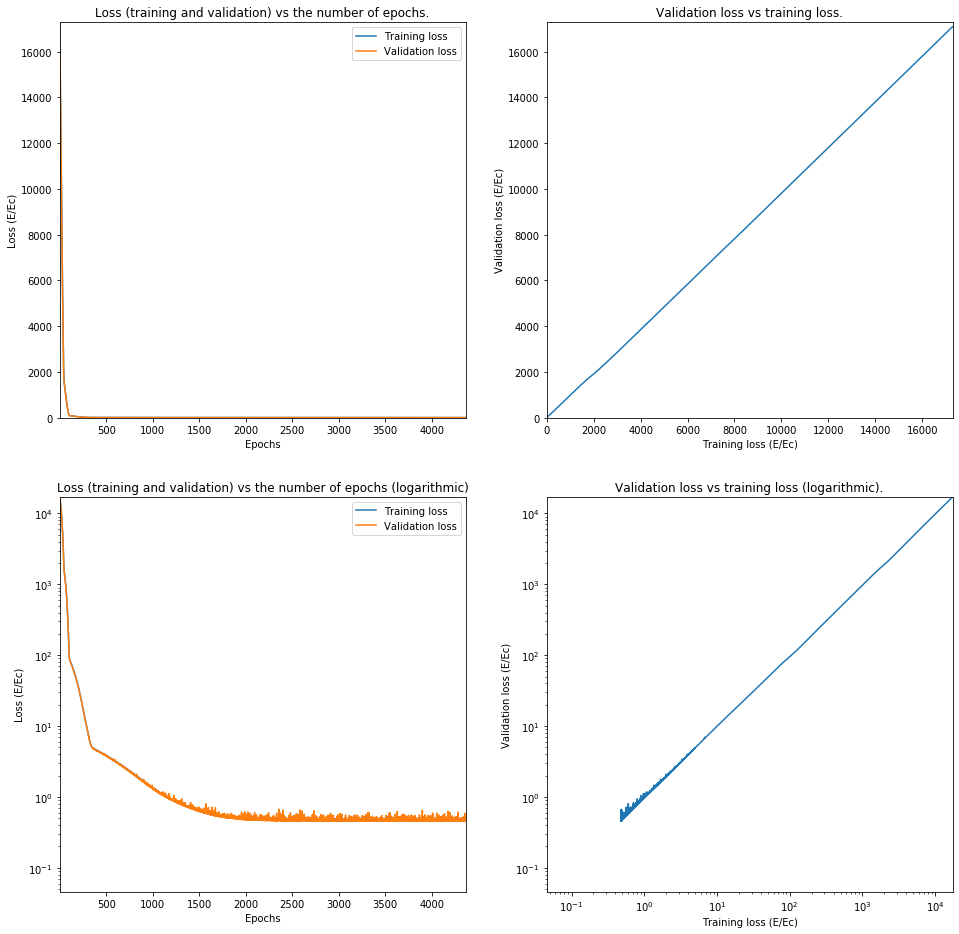

In [18]:
name = 'LinearNetwork'
settingsNetwork = [inputSize, ['Dense', 1, 'linear', True]]
learningRate = 1*10**-5
callbacksNetwork = [keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=500, min_delta=0)]

model, fitDetails = testNetwork(trainingInput, settingsNetwork, learningRate, kernalInitializer='he_uniform', lossFunction=MAE, validationSplit=0.2, epochs=20000, verbose=1, callbacksNetwork=callbacksNetwork, sampleSize=3)


0.4737601820832073


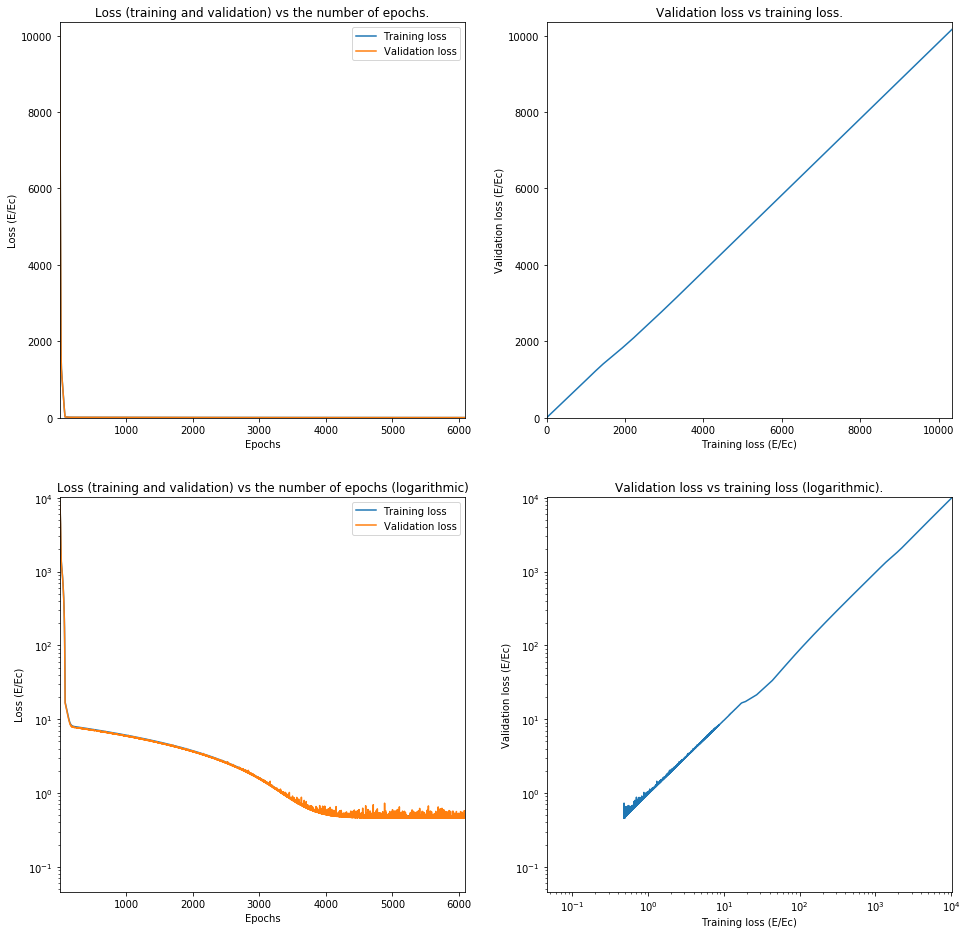

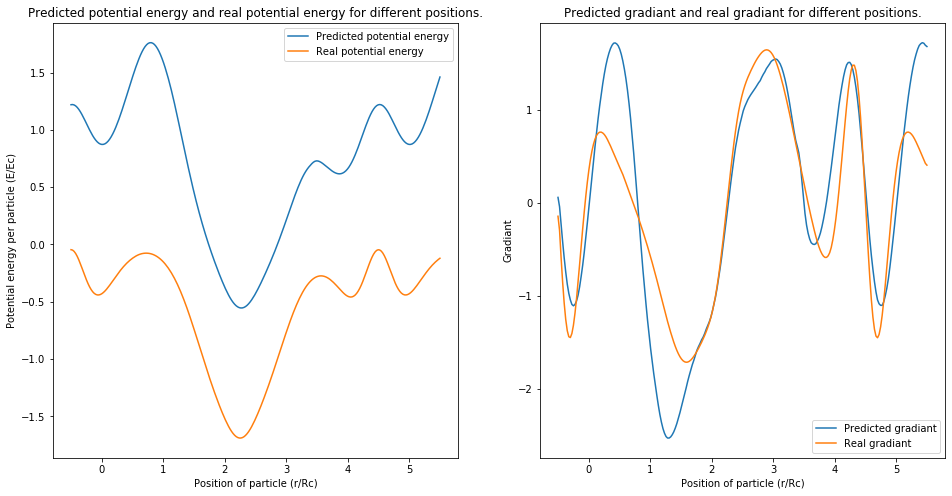

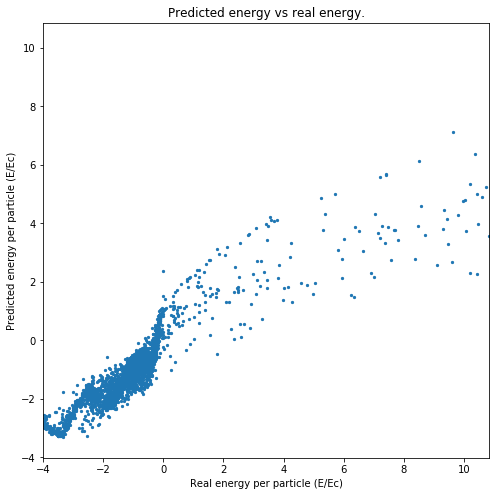

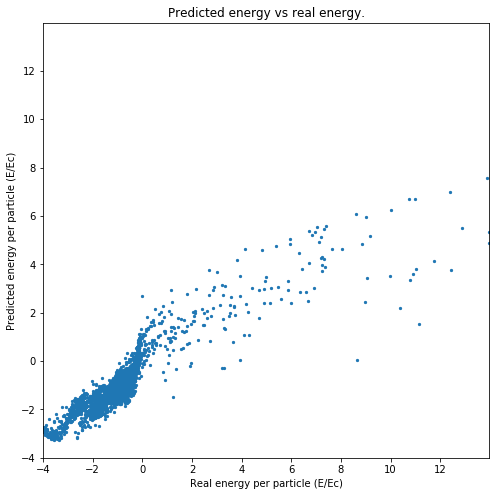

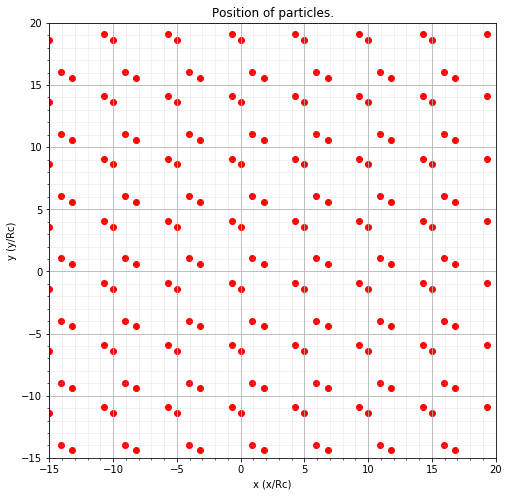

For index 35150 Predicted 1.1091979 was 0.0917311388


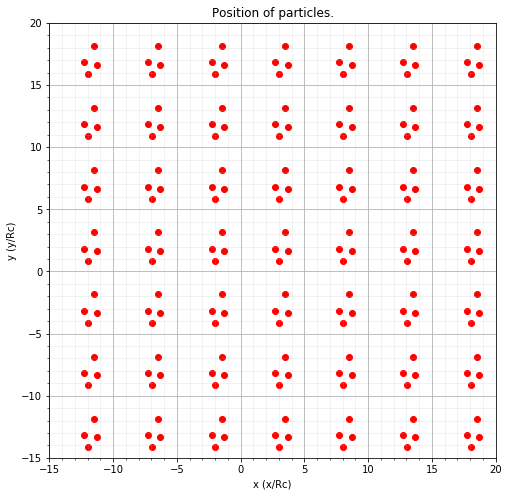

For index 5594 Predicted -1.6146791 was -1.6517595810999999


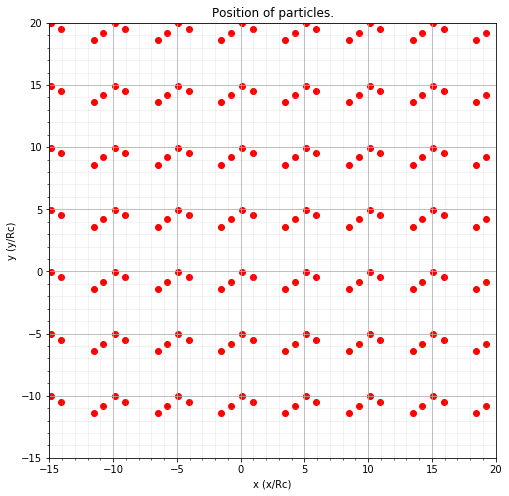

For index 35094 Predicted -1.1362855 was -0.5995037048


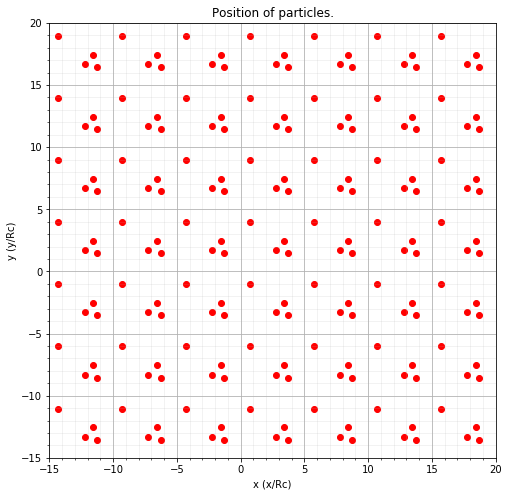

For index 32387 Predicted -0.9769838 was -1.3119011394


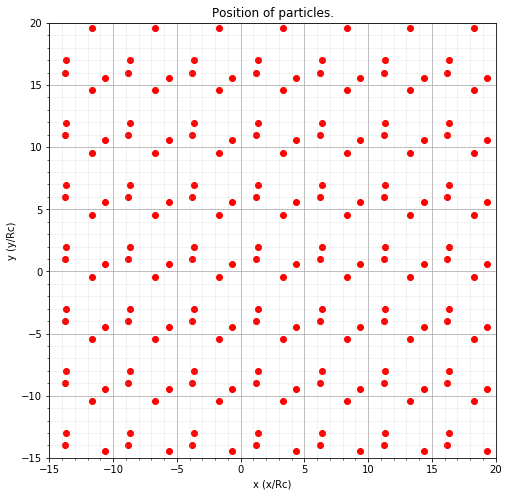

For index 47739 Predicted 0.3483336 was -0.1329984582


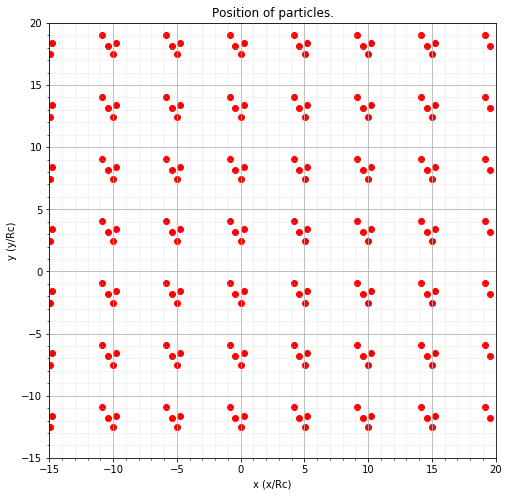

For index 14214 Predicted 2.4800475 was 10.6994877623


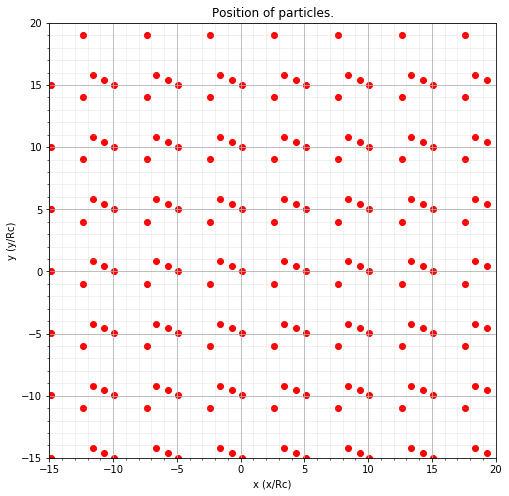

For index 48737 Predicted -0.21550918 was -0.2818949568


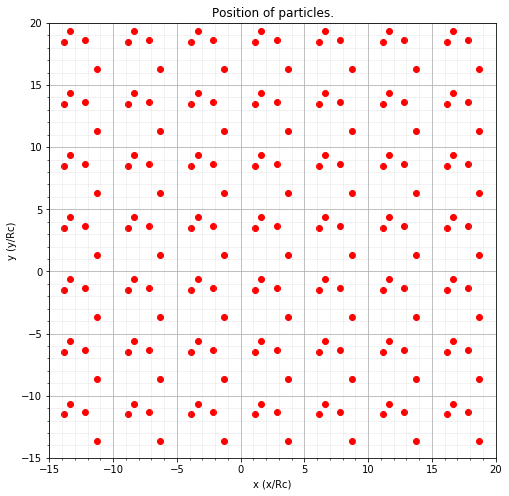

For index 11870 Predicted 0.20673203 was -0.3581852659


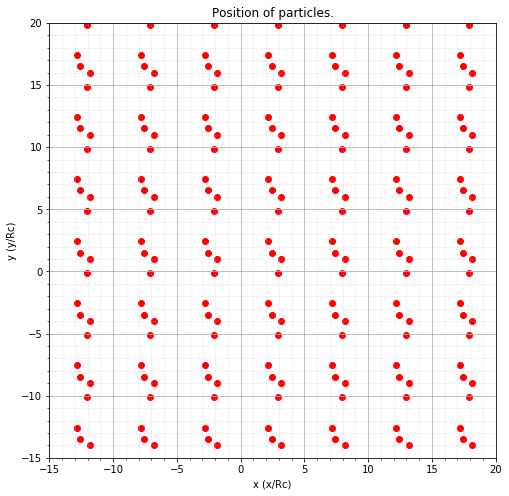

For index 41091 Predicted -1.3473451 was -0.9637761914


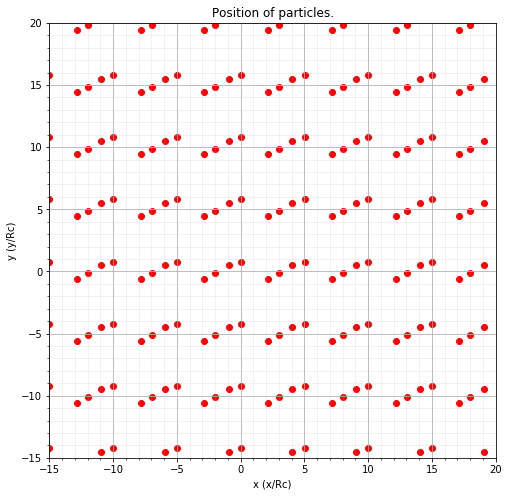

For index 46464 Predicted -1.232477 was -0.4692183365


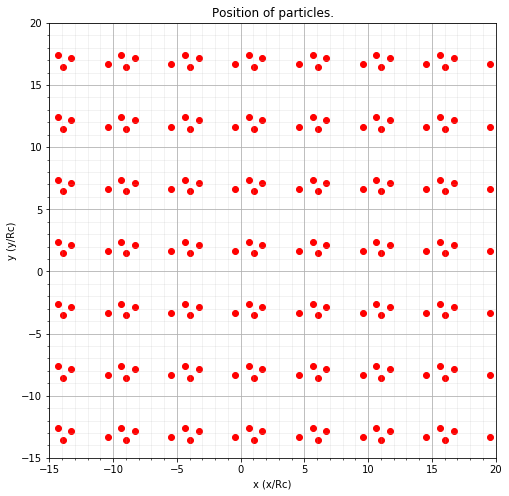

For index 6073 Predicted -1.770685 was -1.6670038984
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2 (Dense)              (None, 1)                 9         
Total params: 9
Trainable params: 9
Non-trainable params: 0
_________________________________________________________________
Layer 0:  [array([[-0.2952358 ],
       [-0.3213489 ],
       [-0.33843327],
       [-0.34565523],
       [ 0.13148777],
       [ 0.1323536 ],
       [ 0.13306831],
       [ 0.13312209]], dtype=float32), array([-3.1791322], dtype=float32)]


In [19]:
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=0)
print(evaluation)
history = plotHistory(fitDetails)

makeGradiantPlot(model, x, testData)

makePredictionPlot(model, validationData)
makePredictionPlot(model, trainingData)

for i in validationPlots:
    plotAndPredict(model, validationData, i)

model.summary()
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())

models.append({'model':model, 'name':str(prefixName) + name, 'evaluation':evaluation, 'history':history})
prefixName = prefixName + 1

## Model 1: 1 Dense layer small softplus

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 8)                 72        
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 9         
Total params: 81
Trainable params: 81
Non-trainable params: 0
_________________________________________________________________
40003/40003 [==============================] - 0s 8us/step
5694.359526563339
Layer 0:  [array([[-0.5039263 , -0.6236832 , -0.25420278,  0.3231756 ,  0.43338782,
         0.79196924,  0.73513716, -0.6108664 ],
       [ 0.28884023,  0.5864431 ,  0.82814723,  0.15992993, -0.7188452 ,
        -0.6006279 ,  0.62316996, -0.7766109 ],
       [-0.8342565 ,  0.8094923 ,  0.6679731 ,  0.6905492 ,  0.05073726,
        -0.15999621, -0.8609696 , -0.3516661 ],
       [ 0.06212902, -0.3085608 , -0.05508095, -0.13147783,  0.050643

Epoch 55/25000
32002/32002 [==============================] - 1s 22us/step - loss: 110.6183 - val_loss: 106.5294
Epoch 56/25000
32002/32002 [==============================] - 1s 23us/step - loss: 107.6171 - val_loss: 103.6632
Epoch 57/25000
32002/32002 [==============================] - 1s 22us/step - loss: 104.9068 - val_loss: 101.0762
Epoch 58/25000
32002/32002 [==============================] - 1s 22us/step - loss: 102.3919 - val_loss: 98.5683
Epoch 59/25000
32002/32002 [==============================] - 1s 23us/step - loss: 99.9951 - val_loss: 96.2483
Epoch 60/25000
32002/32002 [==============================] - 1s 23us/step - loss: 97.7415 - val_loss: 94.0696
Epoch 61/25000
32002/32002 [==============================] - 1s 22us/step - loss: 95.6401 - val_loss: 92.1255
Epoch 62/25000
32002/32002 [==============================] - 1s 22us/step - loss: 93.5999 - val_loss: 90.2862
Epoch 63/25000
32002/32002 [==============================] - 1s 22us/step - loss: 91.6340 - val_loss: 88

32002/32002 [==============================] - 1s 22us/step - loss: 44.8186 - val_loss: 43.9315
Epoch 129/25000
32002/32002 [==============================] - 1s 22us/step - loss: 44.4572 - val_loss: 43.5657
Epoch 130/25000
32002/32002 [==============================] - 1s 22us/step - loss: 44.0964 - val_loss: 43.2260
Epoch 131/25000
32002/32002 [==============================] - 1s 22us/step - loss: 43.7420 - val_loss: 42.8707
Epoch 132/25000
32002/32002 [==============================] - 1s 22us/step - loss: 43.3891 - val_loss: 42.5207
Epoch 133/25000
32002/32002 [==============================] - 1s 22us/step - loss: 43.0248 - val_loss: 42.1904
Epoch 134/25000
32002/32002 [==============================] - 1s 22us/step - loss: 42.6692 - val_loss: 41.8469
Epoch 135/25000
32002/32002 [==============================] - 1s 22us/step - loss: 42.3124 - val_loss: 41.4643
Epoch 136/25000
32002/32002 [==============================] - 1s 22us/step - loss: 41.9378 - val_loss: 41.1274
Epoch 13

32002/32002 [==============================] - 1s 23us/step - loss: 20.6566 - val_loss: 20.4308
Epoch 202/25000
32002/32002 [==============================] - 1s 22us/step - loss: 20.3882 - val_loss: 20.0408
Epoch 203/25000
32002/32002 [==============================] - 1s 23us/step - loss: 20.1094 - val_loss: 19.7702
Epoch 204/25000
32002/32002 [==============================] - 1s 22us/step - loss: 19.8487 - val_loss: 19.5712
Epoch 205/25000
32002/32002 [==============================] - 1s 22us/step - loss: 19.5858 - val_loss: 19.2405
Epoch 206/25000
32002/32002 [==============================] - 1s 22us/step - loss: 19.3290 - val_loss: 18.9987
Epoch 207/25000
32002/32002 [==============================] - 1s 22us/step - loss: 19.0756 - val_loss: 18.7791
Epoch 208/25000
32002/32002 [==============================] - 1s 22us/step - loss: 18.8312 - val_loss: 18.5654
Epoch 209/25000
32002/32002 [==============================] - 1s 23us/step - loss: 18.5830 - val_loss: 18.2697
Epoch 21

32002/32002 [==============================] - 1s 23us/step - loss: 9.7065 - val_loss: 9.5307
Epoch 275/25000
32002/32002 [==============================] - 1s 23us/step - loss: 9.6497 - val_loss: 9.4776
Epoch 276/25000
32002/32002 [==============================] - 1s 22us/step - loss: 9.5948 - val_loss: 9.4405
Epoch 277/25000
32002/32002 [==============================] - 1s 22us/step - loss: 9.5390 - val_loss: 9.3684
Epoch 278/25000
32002/32002 [==============================] - 1s 22us/step - loss: 9.4863 - val_loss: 9.3201
Epoch 279/25000
32002/32002 [==============================] - 1s 22us/step - loss: 9.4264 - val_loss: 9.2666
Epoch 280/25000
32002/32002 [==============================] - 1s 22us/step - loss: 9.3829 - val_loss: 9.2986
Epoch 281/25000
32002/32002 [==============================] - 1s 22us/step - loss: 9.3292 - val_loss: 9.2625
Epoch 282/25000
32002/32002 [==============================] - 1s 22us/step - loss: 9.2891 - val_loss: 9.1269
Epoch 283/25000
32002/3200

32002/32002 [==============================] - 1s 22us/step - loss: 7.8923 - val_loss: 7.7929
Epoch 349/25000
32002/32002 [==============================] - 1s 23us/step - loss: 7.8845 - val_loss: 7.7567
Epoch 350/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.8715 - val_loss: 7.8244
Epoch 351/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.8698 - val_loss: 7.8720
Epoch 352/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.8609 - val_loss: 7.7247
Epoch 353/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.8529 - val_loss: 7.7783
Epoch 354/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.8459 - val_loss: 7.7162
Epoch 355/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.8396 - val_loss: 7.7175
Epoch 356/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.8325 - val_loss: 7.7045
Epoch 357/25000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 7.6007 - val_loss: 7.4942
Epoch 423/25000
32002/32002 [==============================] - 1s 23us/step - loss: 7.5913 - val_loss: 7.5103
Epoch 424/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.5988 - val_loss: 7.5009
Epoch 425/25000
32002/32002 [==============================] - 1s 23us/step - loss: 7.5935 - val_loss: 7.4841
Epoch 426/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.5888 - val_loss: 7.4662
Epoch 427/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.5912 - val_loss: 7.4674
Epoch 428/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.5789 - val_loss: 7.4722
Epoch 429/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.5811 - val_loss: 7.4597
Epoch 430/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.5758 - val_loss: 7.5000
Epoch 431/25000
32002/3200

32002/32002 [==============================] - 1s 22us/step - loss: 7.4353 - val_loss: 7.3202
Epoch 497/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.4318 - val_loss: 7.3498
Epoch 498/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.4314 - val_loss: 7.3152
Epoch 499/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.4278 - val_loss: 7.3157
Epoch 500/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.4288 - val_loss: 7.3323
Epoch 501/25000
32002/32002 [==============================] - 1s 23us/step - loss: 7.4275 - val_loss: 7.3102
Epoch 502/25000
32002/32002 [==============================] - 1s 23us/step - loss: 7.4223 - val_loss: 7.3116
Epoch 503/25000
32002/32002 [==============================] - 1s 23us/step - loss: 7.4237 - val_loss: 7.3222
Epoch 504/25000
32002/32002 [==============================] - 1s 23us/step - loss: 7.4241 - val_loss: 7.3050
Epoch 505/25000
32002/3200

32002/32002 [==============================] - 1s 22us/step - loss: 7.2900 - val_loss: 7.2169
Epoch 571/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.2840 - val_loss: 7.1882
Epoch 572/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.2803 - val_loss: 7.1677
Epoch 573/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.2811 - val_loss: 7.1770
Epoch 574/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.2744 - val_loss: 7.1661
Epoch 575/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.2764 - val_loss: 7.2191
Epoch 576/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.2714 - val_loss: 7.1624
Epoch 577/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.2676 - val_loss: 7.1947
Epoch 578/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.2693 - val_loss: 7.1951
Epoch 579/25000
32002/3200

32002/32002 [==============================] - 1s 22us/step - loss: 7.1459 - val_loss: 7.0666
Epoch 645/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.1377 - val_loss: 7.0345
Epoch 646/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.1316 - val_loss: 7.1233
Epoch 647/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.1308 - val_loss: 7.0727
Epoch 648/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.1347 - val_loss: 7.0221
Epoch 649/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.1320 - val_loss: 7.0321
Epoch 650/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.1248 - val_loss: 7.0348
Epoch 651/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.1225 - val_loss: 7.0171
Epoch 652/25000
32002/32002 [==============================] - 1s 22us/step - loss: 7.1198 - val_loss: 7.0165
Epoch 653/25000
32002/3200

32002/32002 [==============================] - 1s 22us/step - loss: 6.9959 - val_loss: 6.8944
Epoch 719/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.9954 - val_loss: 6.8862
Epoch 720/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.9916 - val_loss: 6.8860
Epoch 721/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.9952 - val_loss: 6.9184
Epoch 722/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.9841 - val_loss: 6.8822
Epoch 723/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.9864 - val_loss: 6.9135
Epoch 724/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.9827 - val_loss: 6.8882
Epoch 725/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.9825 - val_loss: 6.9429
Epoch 726/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.9817 - val_loss: 6.8805
Epoch 727/25000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 6.8524 - val_loss: 6.7680
Epoch 793/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.8534 - val_loss: 6.7689
Epoch 794/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.8495 - val_loss: 6.7511
Epoch 795/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.8464 - val_loss: 6.7547
Epoch 796/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.8466 - val_loss: 6.7480
Epoch 797/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.8458 - val_loss: 6.7587
Epoch 798/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.8435 - val_loss: 6.7851
Epoch 799/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.8419 - val_loss: 6.7738
Epoch 800/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.8363 - val_loss: 6.7820
Epoch 801/25000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 6.7162 - val_loss: 6.6163
Epoch 867/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.7094 - val_loss: 6.6245
Epoch 868/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.7083 - val_loss: 6.6145
Epoch 869/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.7074 - val_loss: 6.6112
Epoch 870/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.7050 - val_loss: 6.6114
Epoch 871/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.7055 - val_loss: 6.6082
Epoch 872/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.7017 - val_loss: 6.6305
Epoch 873/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.6969 - val_loss: 6.6026
Epoch 874/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.6999 - val_loss: 6.6211
Epoch 875/25000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 6.5809 - val_loss: 6.5047
Epoch 941/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.5808 - val_loss: 6.4823
Epoch 942/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.5700 - val_loss: 6.5156
Epoch 943/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.5690 - val_loss: 6.5401
Epoch 944/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.5682 - val_loss: 6.4756
Epoch 945/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.5672 - val_loss: 6.4747
Epoch 946/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.5612 - val_loss: 6.4825
Epoch 947/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.5633 - val_loss: 6.4752
Epoch 948/25000
32002/32002 [==============================] - 1s 24us/step - loss: 6.5618 - val_loss: 6.4840
Epoch 949/25000
32002/3200

32002/32002 [==============================] - 1s 22us/step - loss: 6.4392 - val_loss: 6.3668
Epoch 1015/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.4392 - val_loss: 6.3653
Epoch 1016/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.4412 - val_loss: 6.3491
Epoch 1017/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.4397 - val_loss: 6.3510
Epoch 1018/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.4380 - val_loss: 6.3703
Epoch 1019/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.4405 - val_loss: 6.4238
Epoch 1020/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.4330 - val_loss: 6.3412
Epoch 1021/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.4310 - val_loss: 6.3562
Epoch 1022/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.4300 - val_loss: 6.3664
Epoch 1023/25000
3

Epoch 1088/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.3113 - val_loss: 6.2268
Epoch 1089/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.3104 - val_loss: 6.2297
Epoch 1090/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.3097 - val_loss: 6.2270
Epoch 1091/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.3047 - val_loss: 6.2373
Epoch 1092/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.3041 - val_loss: 6.2324
Epoch 1093/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.3038 - val_loss: 6.2557
Epoch 1094/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.3032 - val_loss: 6.2176
Epoch 1095/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.3093 - val_loss: 6.2160
Epoch 1096/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.3021 - val_loss: 6.2195
E

Epoch 1162/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.1824 - val_loss: 6.1270
Epoch 1163/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.1854 - val_loss: 6.1021
Epoch 1164/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.1783 - val_loss: 6.1085
Epoch 1165/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.1847 - val_loss: 6.0939
Epoch 1166/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.1734 - val_loss: 6.0937
Epoch 1167/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.1780 - val_loss: 6.1018
Epoch 1168/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.1721 - val_loss: 6.0932
Epoch 1169/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.1719 - val_loss: 6.1159
Epoch 1170/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.1648 - val_loss: 6.0883
E

Epoch 1236/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.0570 - val_loss: 6.0058
Epoch 1237/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.0582 - val_loss: 5.9735
Epoch 1238/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.0516 - val_loss: 5.9824
Epoch 1239/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.0549 - val_loss: 6.0077
Epoch 1240/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.0532 - val_loss: 5.9761
Epoch 1241/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.0506 - val_loss: 5.9809
Epoch 1242/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.0483 - val_loss: 5.9705
Epoch 1243/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.0471 - val_loss: 5.9749
Epoch 1244/25000
32002/32002 [==============================] - 1s 22us/step - loss: 6.0460 - val_loss: 5.9654
E

Epoch 1310/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.9326 - val_loss: 5.8565
Epoch 1311/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.9290 - val_loss: 5.8629
Epoch 1312/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.9293 - val_loss: 5.9055
Epoch 1313/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.9307 - val_loss: 5.8481
Epoch 1314/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.9286 - val_loss: 5.8504
Epoch 1315/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.9265 - val_loss: 5.8928
Epoch 1316/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.9203 - val_loss: 5.8687
Epoch 1317/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.9189 - val_loss: 5.8821
Epoch 1318/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.9194 - val_loss: 5.8572
E

32002/32002 [==============================] - 1s 22us/step - loss: 5.8113 - val_loss: 5.7525
Epoch 1384/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.8099 - val_loss: 5.7388
Epoch 1385/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.8085 - val_loss: 5.7408
Epoch 1386/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.8111 - val_loss: 5.7421
Epoch 1387/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.8035 - val_loss: 5.7388
Epoch 1388/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.8052 - val_loss: 5.7834
Epoch 1389/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.8003 - val_loss: 5.7298
Epoch 1390/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.7988 - val_loss: 5.7292
Epoch 1391/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.7963 - val_loss: 5.7340
Epoch 1392/25000
3

Epoch 1457/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.6951 - val_loss: 5.6175
Epoch 1458/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.6866 - val_loss: 5.6322
Epoch 1459/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.6897 - val_loss: 5.6703
Epoch 1460/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.6915 - val_loss: 5.6167
Epoch 1461/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.6785 - val_loss: 5.6890
Epoch 1462/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.6843 - val_loss: 5.6208
Epoch 1463/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.6823 - val_loss: 5.6685
Epoch 1464/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.6835 - val_loss: 5.6115
Epoch 1465/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.6739 - val_loss: 5.6384
E

Epoch 1531/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.5728 - val_loss: 5.5868
Epoch 1532/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.5742 - val_loss: 5.5044
Epoch 1533/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.5693 - val_loss: 5.5528
Epoch 1534/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.5672 - val_loss: 5.5032
Epoch 1535/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.5642 - val_loss: 5.5176
Epoch 1536/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.5661 - val_loss: 5.5634
Epoch 1537/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.5668 - val_loss: 5.4935
Epoch 1538/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.5619 - val_loss: 5.5743
Epoch 1539/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.5602 - val_loss: 5.5279
E

Epoch 1605/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.4553 - val_loss: 5.4194
Epoch 1606/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.4538 - val_loss: 5.3871
Epoch 1607/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.4539 - val_loss: 5.3869
Epoch 1608/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.4557 - val_loss: 5.3864
Epoch 1609/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.4506 - val_loss: 5.3959
Epoch 1610/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.4486 - val_loss: 5.3957
Epoch 1611/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.4443 - val_loss: 5.3820
Epoch 1612/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.4415 - val_loss: 5.4028
Epoch 1613/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.4448 - val_loss: 5.4202
E

Epoch 1679/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.3364 - val_loss: 5.2828
Epoch 1680/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.3441 - val_loss: 5.3047
Epoch 1681/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.3361 - val_loss: 5.2776
Epoch 1682/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.3366 - val_loss: 5.2713
Epoch 1683/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.3353 - val_loss: 5.2693
Epoch 1684/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.3300 - val_loss: 5.2672
Epoch 1685/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.3296 - val_loss: 5.2699
Epoch 1686/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.3321 - val_loss: 5.3842
Epoch 1687/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.3292 - val_loss: 5.2650
E

Epoch 1753/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.2253 - val_loss: 5.1702
Epoch 1754/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.2232 - val_loss: 5.1749
Epoch 1755/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.2276 - val_loss: 5.1661
Epoch 1756/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.2204 - val_loss: 5.1743
Epoch 1757/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.2203 - val_loss: 5.1613
Epoch 1758/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.2174 - val_loss: 5.1900
Epoch 1759/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.2158 - val_loss: 5.1641
Epoch 1760/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.2158 - val_loss: 5.1590
Epoch 1761/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.2168 - val_loss: 5.1815
E

Epoch 1827/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.1106 - val_loss: 5.0585
Epoch 1828/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.1145 - val_loss: 5.0585
Epoch 1829/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.1125 - val_loss: 5.0794
Epoch 1830/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.1092 - val_loss: 5.0866
Epoch 1831/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.1033 - val_loss: 5.0748
Epoch 1832/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.1082 - val_loss: 5.0482
Epoch 1833/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.1026 - val_loss: 5.0497
Epoch 1834/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.0986 - val_loss: 5.1173
Epoch 1835/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.1025 - val_loss: 5.0609
E

Epoch 1901/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.0026 - val_loss: 4.9481
Epoch 1902/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.0018 - val_loss: 4.9457
Epoch 1903/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.0030 - val_loss: 5.0310
Epoch 1904/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.0030 - val_loss: 4.9720
Epoch 1905/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.9976 - val_loss: 4.9425
Epoch 1906/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.9956 - val_loss: 4.9459
Epoch 1907/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.9936 - val_loss: 4.9875
Epoch 1908/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.9943 - val_loss: 4.9760
Epoch 1909/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.9931 - val_loss: 5.0032
E

Epoch 1975/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.8934 - val_loss: 4.8547
Epoch 1976/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.8898 - val_loss: 4.8400
Epoch 1977/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.8869 - val_loss: 4.8820
Epoch 1978/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.8927 - val_loss: 4.8376
Epoch 1979/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.8879 - val_loss: 4.8401
Epoch 1980/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.8920 - val_loss: 4.8361
Epoch 1981/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.8845 - val_loss: 4.8669
Epoch 1982/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.8835 - val_loss: 4.8760
Epoch 1983/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.8853 - val_loss: 4.9310
E

Epoch 2049/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.7853 - val_loss: 4.7398
Epoch 2050/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.7888 - val_loss: 4.7490
Epoch 2051/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.7797 - val_loss: 4.7376
Epoch 2052/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.7835 - val_loss: 4.7370
Epoch 2053/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.7810 - val_loss: 4.7331
Epoch 2054/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.7785 - val_loss: 4.7337
Epoch 2055/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.7750 - val_loss: 4.7584
Epoch 2056/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.7756 - val_loss: 4.7341
Epoch 2057/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.7831 - val_loss: 4.7348
E

Epoch 2123/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.6804 - val_loss: 4.6356
Epoch 2124/25000
32002/32002 [==============================] - 1s 23us/step - loss: 4.6812 - val_loss: 4.6301
Epoch 2125/25000
32002/32002 [==============================] - 1s 23us/step - loss: 4.6775 - val_loss: 4.6395
Epoch 2126/25000
32002/32002 [==============================] - 1s 23us/step - loss: 4.6748 - val_loss: 4.6331
Epoch 2127/25000
32002/32002 [==============================] - 1s 23us/step - loss: 4.6713 - val_loss: 4.6250
Epoch 2128/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.6742 - val_loss: 4.6284
Epoch 2129/25000
32002/32002 [==============================] - 1s 23us/step - loss: 4.6680 - val_loss: 4.6267
Epoch 2130/25000
32002/32002 [==============================] - 1s 23us/step - loss: 4.6691 - val_loss: 4.6270
Epoch 2131/25000
32002/32002 [==============================] - 1s 23us/step - loss: 4.6657 - val_loss: 4.6259
E

Epoch 2197/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.5749 - val_loss: 4.5390
Epoch 2198/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.5724 - val_loss: 4.6031
Epoch 2199/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.5701 - val_loss: 4.5440
Epoch 2200/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.5755 - val_loss: 4.5247
Epoch 2201/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.5668 - val_loss: 4.5334
Epoch 2202/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.5627 - val_loss: 4.5273
Epoch 2203/25000
32002/32002 [==============================] - 1s 23us/step - loss: 4.5624 - val_loss: 4.5451
Epoch 2204/25000
32002/32002 [==============================] - 1s 23us/step - loss: 4.5626 - val_loss: 4.5214
Epoch 2205/25000
32002/32002 [==============================] - 1s 23us/step - loss: 4.5634 - val_loss: 4.6389
E

Epoch 2271/25000
32002/32002 [==============================] - 1s 23us/step - loss: 4.4665 - val_loss: 4.4304
Epoch 2272/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.4684 - val_loss: 4.4295
Epoch 2273/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.4672 - val_loss: 4.4934
Epoch 2274/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.4645 - val_loss: 4.4424
Epoch 2275/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.4630 - val_loss: 4.4563
Epoch 2276/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.4674 - val_loss: 4.4214
Epoch 2277/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.4592 - val_loss: 4.4584
Epoch 2278/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.4577 - val_loss: 4.4351
Epoch 2279/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.4599 - val_loss: 4.4209
E

Epoch 2345/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.3668 - val_loss: 4.3771
Epoch 2346/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.3646 - val_loss: 4.3677
Epoch 2347/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.3617 - val_loss: 4.3476
Epoch 2348/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.3607 - val_loss: 4.3353
Epoch 2349/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.3592 - val_loss: 4.3255
Epoch 2350/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.3588 - val_loss: 4.3207
Epoch 2351/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.3542 - val_loss: 4.3733
Epoch 2352/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.3627 - val_loss: 4.3262
Epoch 2353/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.3564 - val_loss: 4.3589
E

Epoch 2419/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.2646 - val_loss: 4.2283
Epoch 2420/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.2601 - val_loss: 4.2323
Epoch 2421/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.2630 - val_loss: 4.2251
Epoch 2422/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.2576 - val_loss: 4.3417
Epoch 2423/25000
32002/32002 [==============================] - 1s 23us/step - loss: 4.2578 - val_loss: 4.2579
Epoch 2424/25000
32002/32002 [==============================] - 1s 23us/step - loss: 4.2580 - val_loss: 4.2286
Epoch 2425/25000
32002/32002 [==============================] - 1s 23us/step - loss: 4.2563 - val_loss: 4.3123
Epoch 2426/25000
32002/32002 [==============================] - 1s 23us/step - loss: 4.2534 - val_loss: 4.2364
Epoch 2427/25000
32002/32002 [==============================] - 1s 23us/step - loss: 4.2558 - val_loss: 4.2215
E

Epoch 2493/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.1591 - val_loss: 4.1295
Epoch 2494/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.1554 - val_loss: 4.1527
Epoch 2495/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.1589 - val_loss: 4.1341
Epoch 2496/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.1610 - val_loss: 4.1232
Epoch 2497/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.1557 - val_loss: 4.1776
Epoch 2498/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.1547 - val_loss: 4.1209
Epoch 2499/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.1514 - val_loss: 4.1274
Epoch 2500/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.1492 - val_loss: 4.1518
Epoch 2501/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.1502 - val_loss: 4.1200
E

Epoch 2567/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.0584 - val_loss: 4.0416
Epoch 2568/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.0597 - val_loss: 4.0439
Epoch 2569/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.0601 - val_loss: 4.0463
Epoch 2570/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.0527 - val_loss: 4.0395
Epoch 2571/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.0589 - val_loss: 4.0218
Epoch 2572/25000
32002/32002 [==============================] - 1s 23us/step - loss: 4.0494 - val_loss: 4.0441
Epoch 2573/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.0504 - val_loss: 4.0192
Epoch 2574/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.0510 - val_loss: 4.0365
Epoch 2575/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.0486 - val_loss: 4.0436
E

Epoch 2641/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.9607 - val_loss: 3.9649
Epoch 2642/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.9592 - val_loss: 3.9341
Epoch 2643/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.9540 - val_loss: 3.9566
Epoch 2644/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.9573 - val_loss: 3.9501
Epoch 2645/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.9570 - val_loss: 3.9614
Epoch 2646/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.9526 - val_loss: 3.9383
Epoch 2647/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.9550 - val_loss: 3.9353
Epoch 2648/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.9522 - val_loss: 3.9247
Epoch 2649/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.9518 - val_loss: 4.0267
E

Epoch 2715/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.8608 - val_loss: 3.8417
Epoch 2716/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.8572 - val_loss: 3.8380
Epoch 2717/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.8615 - val_loss: 3.8314
Epoch 2718/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.8561 - val_loss: 4.1625
Epoch 2719/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.8576 - val_loss: 3.8485
Epoch 2720/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.8534 - val_loss: 3.8701
Epoch 2721/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.8541 - val_loss: 3.8372
Epoch 2722/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.8478 - val_loss: 3.8418
Epoch 2723/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.8493 - val_loss: 3.8287
E

Epoch 2789/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.7634 - val_loss: 3.7445
Epoch 2790/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.7596 - val_loss: 3.8162
Epoch 2791/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.7600 - val_loss: 3.7349
Epoch 2792/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.7581 - val_loss: 3.7468
Epoch 2793/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.7573 - val_loss: 3.7481
Epoch 2794/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.7589 - val_loss: 3.7312
Epoch 2795/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.7520 - val_loss: 3.7319
Epoch 2796/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.7526 - val_loss: 3.7706
Epoch 2797/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.7536 - val_loss: 3.7311
E

Epoch 2863/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.6644 - val_loss: 3.6581
Epoch 2864/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.6614 - val_loss: 3.6732
Epoch 2865/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.6662 - val_loss: 3.6436
Epoch 2866/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.6580 - val_loss: 3.6449
Epoch 2867/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.6588 - val_loss: 3.7250
Epoch 2868/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.6545 - val_loss: 3.6374
Epoch 2869/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.6574 - val_loss: 3.6522
Epoch 2870/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.6495 - val_loss: 3.6740
Epoch 2871/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.6514 - val_loss: 3.6413
E

Epoch 2937/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.5685 - val_loss: 3.6210
Epoch 2938/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.5646 - val_loss: 3.5497
Epoch 2939/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.5612 - val_loss: 3.5399
Epoch 2940/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.5601 - val_loss: 3.5403
Epoch 2941/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.5659 - val_loss: 3.5499
Epoch 2942/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.5592 - val_loss: 3.5463
Epoch 2943/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.5570 - val_loss: 3.5701
Epoch 2944/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.5578 - val_loss: 3.5491
Epoch 2945/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.5544 - val_loss: 3.5363
E

Epoch 3011/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.4720 - val_loss: 3.4547
Epoch 3012/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.4668 - val_loss: 3.4794
Epoch 3013/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.4649 - val_loss: 3.4456
Epoch 3014/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.4678 - val_loss: 3.4896
Epoch 3015/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.4629 - val_loss: 3.5043
Epoch 3016/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.4614 - val_loss: 3.4490
Epoch 3017/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.4631 - val_loss: 3.4571
Epoch 3018/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.4601 - val_loss: 3.4418
Epoch 3019/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.4613 - val_loss: 3.4596
E

Epoch 3085/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.3723 - val_loss: 3.3868
Epoch 3086/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.3708 - val_loss: 3.3928
Epoch 3087/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.3667 - val_loss: 3.3605
Epoch 3088/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.3692 - val_loss: 3.3542
Epoch 3089/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.3696 - val_loss: 3.3807
Epoch 3090/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.3667 - val_loss: 3.3507
Epoch 3091/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.3649 - val_loss: 3.3842
Epoch 3092/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.3610 - val_loss: 3.3483
Epoch 3093/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.3616 - val_loss: 3.3650
E

Epoch 3159/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.2733 - val_loss: 3.2619
Epoch 3160/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.2778 - val_loss: 3.2611
Epoch 3161/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.2707 - val_loss: 3.2689
Epoch 3162/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.2710 - val_loss: 3.2599
Epoch 3163/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.2724 - val_loss: 3.2630
Epoch 3164/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.2720 - val_loss: 3.2561
Epoch 3165/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.2701 - val_loss: 3.2869
Epoch 3166/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.2680 - val_loss: 3.2701
Epoch 3167/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.2668 - val_loss: 3.2743
E

Epoch 3233/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.1805 - val_loss: 3.1751
Epoch 3234/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.1769 - val_loss: 3.1739
Epoch 3235/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.1799 - val_loss: 3.1755
Epoch 3236/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.1737 - val_loss: 3.1784
Epoch 3237/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.1738 - val_loss: 3.2173
Epoch 3238/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.1776 - val_loss: 3.1627
Epoch 3239/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.1779 - val_loss: 3.1734
Epoch 3240/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.1746 - val_loss: 3.1739
Epoch 3241/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.1717 - val_loss: 3.1895
E

Epoch 3307/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.0881 - val_loss: 3.0792
Epoch 3308/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.0833 - val_loss: 3.0742
Epoch 3309/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.0873 - val_loss: 3.1362
Epoch 3310/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.0835 - val_loss: 3.0763
Epoch 3311/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.0798 - val_loss: 3.0849
Epoch 3312/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.0783 - val_loss: 3.0727
Epoch 3313/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.0798 - val_loss: 3.0704
Epoch 3314/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.0772 - val_loss: 3.0839
Epoch 3315/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.0748 - val_loss: 3.0686
E

Epoch 3381/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.9932 - val_loss: 2.9989
Epoch 3382/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.9919 - val_loss: 2.9854
Epoch 3383/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.9869 - val_loss: 2.9863
Epoch 3384/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.9939 - val_loss: 3.0076
Epoch 3385/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.9872 - val_loss: 3.0258
Epoch 3386/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.9876 - val_loss: 2.9774
Epoch 3387/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.9837 - val_loss: 2.9776
Epoch 3388/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.9816 - val_loss: 2.9818
Epoch 3389/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.9792 - val_loss: 2.9773
E

Epoch 3455/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.8963 - val_loss: 2.8940
Epoch 3456/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.9031 - val_loss: 2.8913
Epoch 3457/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.8964 - val_loss: 2.8956
Epoch 3458/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.8921 - val_loss: 2.8894
Epoch 3459/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.8918 - val_loss: 2.8904
Epoch 3460/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.8958 - val_loss: 2.9259
Epoch 3461/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.8912 - val_loss: 2.9195
Epoch 3462/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.8898 - val_loss: 2.8849
Epoch 3463/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.8919 - val_loss: 2.8886
E

Epoch 3529/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.8062 - val_loss: 2.8227
Epoch 3530/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.8051 - val_loss: 2.8175
Epoch 3531/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.8027 - val_loss: 2.7998
Epoch 3532/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.8001 - val_loss: 2.7999
Epoch 3533/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.8003 - val_loss: 2.8030
Epoch 3534/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.7989 - val_loss: 2.7990
Epoch 3535/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.7994 - val_loss: 2.7971
Epoch 3536/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.7981 - val_loss: 2.7924
Epoch 3537/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.7967 - val_loss: 2.8016
E

Epoch 3603/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.7176 - val_loss: 2.7114
Epoch 3604/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.7087 - val_loss: 2.7250
Epoch 3605/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.7102 - val_loss: 2.7210
Epoch 3606/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.7082 - val_loss: 2.7078
Epoch 3607/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.7084 - val_loss: 2.7147
Epoch 3608/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.7079 - val_loss: 2.7074
Epoch 3609/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.7088 - val_loss: 2.7616
Epoch 3610/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.7068 - val_loss: 2.7178
Epoch 3611/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.7028 - val_loss: 2.7054
E

Epoch 3677/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.6237 - val_loss: 2.6328
Epoch 3678/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.6226 - val_loss: 2.6466
Epoch 3679/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.6243 - val_loss: 2.6208
Epoch 3680/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.6154 - val_loss: 2.6511
Epoch 3681/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.6162 - val_loss: 2.6218
Epoch 3682/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.6128 - val_loss: 2.6218
Epoch 3683/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.6169 - val_loss: 2.6252
Epoch 3684/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.6170 - val_loss: 2.6269
Epoch 3685/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.6119 - val_loss: 2.6131
E

Epoch 3751/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.5279 - val_loss: 2.5355
Epoch 3752/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.5295 - val_loss: 2.5522
Epoch 3753/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.5286 - val_loss: 2.5366
Epoch 3754/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.5280 - val_loss: 2.5412
Epoch 3755/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.5246 - val_loss: 2.5294
Epoch 3756/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.5215 - val_loss: 2.5453
Epoch 3757/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.5228 - val_loss: 2.5834
Epoch 3758/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.5225 - val_loss: 2.5496
Epoch 3759/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.5190 - val_loss: 2.5321
E

Epoch 3825/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.4403 - val_loss: 2.4664
Epoch 3826/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.4337 - val_loss: 2.4477
Epoch 3827/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.4380 - val_loss: 2.4960
Epoch 3828/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.4400 - val_loss: 2.4427
Epoch 3829/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.4343 - val_loss: 2.4616
Epoch 3830/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.4351 - val_loss: 2.4658
Epoch 3831/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.4355 - val_loss: 2.4712
Epoch 3832/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.4329 - val_loss: 2.4440
Epoch 3833/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.4286 - val_loss: 2.5130
E

Epoch 3899/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.3532 - val_loss: 2.3716
Epoch 3900/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.3480 - val_loss: 2.3626
Epoch 3901/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.3492 - val_loss: 2.3563
Epoch 3902/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.3530 - val_loss: 2.3602
Epoch 3903/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.3483 - val_loss: 2.3612
Epoch 3904/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.3451 - val_loss: 2.3588
Epoch 3905/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.3435 - val_loss: 2.3550
Epoch 3906/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.3446 - val_loss: 2.4110
Epoch 3907/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.3419 - val_loss: 2.3509
E

Epoch 3973/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.2620 - val_loss: 2.2767
Epoch 3974/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.2621 - val_loss: 2.2786
Epoch 3975/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.2565 - val_loss: 2.2714
Epoch 3976/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.2573 - val_loss: 2.3176
Epoch 3977/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.2578 - val_loss: 2.2742
Epoch 3978/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.2573 - val_loss: 2.2723
Epoch 3979/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.2545 - val_loss: 2.2666
Epoch 3980/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.2575 - val_loss: 2.2967
Epoch 3981/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.2506 - val_loss: 2.2743
E

Epoch 4047/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.1728 - val_loss: 2.1862
Epoch 4048/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.1732 - val_loss: 2.1858
Epoch 4049/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.1681 - val_loss: 2.2734
Epoch 4050/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.1694 - val_loss: 2.1958
Epoch 4051/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.1685 - val_loss: 2.1875
Epoch 4052/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.1661 - val_loss: 2.1879
Epoch 4053/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.1682 - val_loss: 2.1821
Epoch 4054/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.1662 - val_loss: 2.1918
Epoch 4055/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.1649 - val_loss: 2.2150
E

Epoch 4121/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.0853 - val_loss: 2.1264
Epoch 4122/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.0844 - val_loss: 2.0998
Epoch 4123/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.0887 - val_loss: 2.0992
Epoch 4124/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.0789 - val_loss: 2.0994
Epoch 4125/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.0832 - val_loss: 2.0975
Epoch 4126/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.0785 - val_loss: 2.0964
Epoch 4127/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.0840 - val_loss: 2.1003
Epoch 4128/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.0773 - val_loss: 2.0934
Epoch 4129/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.0781 - val_loss: 2.0953
E

Epoch 4195/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.9957 - val_loss: 2.0183
Epoch 4196/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.0009 - val_loss: 2.0195
Epoch 4197/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.9997 - val_loss: 2.0356
Epoch 4198/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.9978 - val_loss: 2.0141
Epoch 4199/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.9939 - val_loss: 2.0446
Epoch 4200/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.9947 - val_loss: 2.0186
Epoch 4201/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.9936 - val_loss: 2.0119
Epoch 4202/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.9958 - val_loss: 2.0115
Epoch 4203/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.9922 - val_loss: 2.0082
E

Epoch 4269/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.9125 - val_loss: 2.0081
Epoch 4270/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.9132 - val_loss: 1.9951
Epoch 4271/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.9141 - val_loss: 1.9959
Epoch 4272/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.9115 - val_loss: 1.9347
Epoch 4273/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.9078 - val_loss: 1.9355
Epoch 4274/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.9102 - val_loss: 1.9284
Epoch 4275/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.9055 - val_loss: 1.9300
Epoch 4276/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.9075 - val_loss: 1.9410
Epoch 4277/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.9067 - val_loss: 1.9289
E

Epoch 4343/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.8278 - val_loss: 1.9251
Epoch 4344/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.8317 - val_loss: 1.9174
Epoch 4345/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.8264 - val_loss: 1.8522
Epoch 4346/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.8318 - val_loss: 1.8673
Epoch 4347/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.8290 - val_loss: 1.8492
Epoch 4348/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.8282 - val_loss: 1.8563
Epoch 4349/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.8230 - val_loss: 1.8480
Epoch 4350/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.8270 - val_loss: 1.8448
Epoch 4351/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.8211 - val_loss: 1.8450
E

Epoch 4417/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.7503 - val_loss: 1.7873
Epoch 4418/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.7468 - val_loss: 1.7939
Epoch 4419/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.7450 - val_loss: 1.7956
Epoch 4420/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.7413 - val_loss: 1.8103
Epoch 4421/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.7441 - val_loss: 1.7802
Epoch 4422/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.7464 - val_loss: 1.7803
Epoch 4423/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.7409 - val_loss: 1.8087
Epoch 4424/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.7419 - val_loss: 1.7668
Epoch 4425/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.7378 - val_loss: 1.7662
E

Epoch 4491/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.6678 - val_loss: 1.6953
Epoch 4492/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.6665 - val_loss: 1.6935
Epoch 4493/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.6615 - val_loss: 1.7024
Epoch 4494/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.6612 - val_loss: 1.7096
Epoch 4495/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.6616 - val_loss: 1.7140
Epoch 4496/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.6607 - val_loss: 1.7184
Epoch 4497/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.6598 - val_loss: 1.6857
Epoch 4498/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.6602 - val_loss: 1.6959
Epoch 4499/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.6600 - val_loss: 1.7106
E

Epoch 4565/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.5881 - val_loss: 1.6247
Epoch 4566/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.5845 - val_loss: 1.6135
Epoch 4567/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.5853 - val_loss: 1.6130
Epoch 4568/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.5836 - val_loss: 1.6447
Epoch 4569/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.5809 - val_loss: 1.6788
Epoch 4570/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.5811 - val_loss: 1.6337
Epoch 4571/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.5794 - val_loss: 1.6122
Epoch 4572/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.5774 - val_loss: 1.6055
Epoch 4573/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.5784 - val_loss: 1.6551
E

Epoch 4639/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.5081 - val_loss: 1.5419
Epoch 4640/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.5077 - val_loss: 1.5352
Epoch 4641/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.5070 - val_loss: 1.5483
Epoch 4642/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.5009 - val_loss: 1.5500
Epoch 4643/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.5049 - val_loss: 1.5321
Epoch 4644/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.5007 - val_loss: 1.5323
Epoch 4645/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.5006 - val_loss: 1.5902
Epoch 4646/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.4989 - val_loss: 1.5308
Epoch 4647/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.4995 - val_loss: 1.5365
E

Epoch 4713/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.4281 - val_loss: 1.4682
Epoch 4714/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.4255 - val_loss: 1.4621
Epoch 4715/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.4254 - val_loss: 1.4597
Epoch 4716/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.4247 - val_loss: 1.4817
Epoch 4717/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.4261 - val_loss: 1.4676
Epoch 4718/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.4267 - val_loss: 1.5051
Epoch 4719/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.4256 - val_loss: 1.4550
Epoch 4720/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.4234 - val_loss: 1.4633
Epoch 4721/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.4212 - val_loss: 1.4531
E

Epoch 4787/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3520 - val_loss: 1.3896
Epoch 4788/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3494 - val_loss: 1.4165
Epoch 4789/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3531 - val_loss: 1.3863
Epoch 4790/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3514 - val_loss: 1.3924
Epoch 4791/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3483 - val_loss: 1.3883
Epoch 4792/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3501 - val_loss: 1.3976
Epoch 4793/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.3498 - val_loss: 1.4603
Epoch 4794/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3489 - val_loss: 1.4526
Epoch 4795/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3469 - val_loss: 1.3817
E

32002/32002 [==============================] - 1s 23us/step - loss: 1.2844 - val_loss: 1.3638
Epoch 4861/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.2834 - val_loss: 1.3735
Epoch 4862/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.2832 - val_loss: 1.3196
Epoch 4863/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.2775 - val_loss: 1.3969
Epoch 4864/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.2802 - val_loss: 1.3196
Epoch 4865/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.2725 - val_loss: 1.3320
Epoch 4866/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.2779 - val_loss: 1.3139
Epoch 4867/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.2771 - val_loss: 1.3128
Epoch 4868/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.2717 - val_loss: 1.3118
Epoch 4869/25000
3

Epoch 4934/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.2138 - val_loss: 1.2888
Epoch 4935/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.2106 - val_loss: 1.2562
Epoch 4936/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.2094 - val_loss: 1.2521
Epoch 4937/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.2074 - val_loss: 1.2491
Epoch 4938/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.2064 - val_loss: 1.2463
Epoch 4939/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.2076 - val_loss: 1.2538
Epoch 4940/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.2046 - val_loss: 1.2459
Epoch 4941/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.2058 - val_loss: 1.2457
Epoch 4942/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.2030 - val_loss: 1.2462
E

Epoch 5008/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.1438 - val_loss: 1.1883
Epoch 5009/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.1438 - val_loss: 1.2485
Epoch 5010/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.1404 - val_loss: 1.1834
Epoch 5011/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.1431 - val_loss: 1.1822
Epoch 5012/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.1423 - val_loss: 1.1844
Epoch 5013/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.1401 - val_loss: 1.1801
Epoch 5014/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.1399 - val_loss: 1.1974
Epoch 5015/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.1359 - val_loss: 1.1794
Epoch 5016/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.1412 - val_loss: 1.1938
E

32002/32002 [==============================] - 1s 22us/step - loss: 1.0819 - val_loss: 1.1404
Epoch 5082/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.0804 - val_loss: 1.1352
Epoch 5083/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.0776 - val_loss: 1.1382
Epoch 5084/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.0764 - val_loss: 1.1661
Epoch 5085/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.0785 - val_loss: 1.1294
Epoch 5086/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.0751 - val_loss: 1.1208
Epoch 5087/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.0749 - val_loss: 1.1510
Epoch 5088/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.0749 - val_loss: 1.1236
Epoch 5089/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.0694 - val_loss: 1.1177
Epoch 5090/25000
3

Epoch 5155/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.0212 - val_loss: 1.0630
Epoch 5156/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.0169 - val_loss: 1.1120
Epoch 5157/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.0163 - val_loss: 1.0674
Epoch 5158/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.0157 - val_loss: 1.0814
Epoch 5159/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.0166 - val_loss: 1.0716
Epoch 5160/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.0120 - val_loss: 1.0638
Epoch 5161/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.0106 - val_loss: 1.0662
Epoch 5162/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.0122 - val_loss: 1.0667
Epoch 5163/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.0141 - val_loss: 1.0663
E

Epoch 5229/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9618 - val_loss: 1.0191
Epoch 5230/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9583 - val_loss: 1.0233
Epoch 5231/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9603 - val_loss: 1.0230
Epoch 5232/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9569 - val_loss: 1.0344
Epoch 5233/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9574 - val_loss: 1.0077
Epoch 5234/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9566 - val_loss: 1.0067
Epoch 5235/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9540 - val_loss: 1.0102
Epoch 5236/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9543 - val_loss: 1.0054
Epoch 5237/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9555 - val_loss: 1.0121
E

Epoch 5303/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.9031 - val_loss: 0.9684
Epoch 5304/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.9061 - val_loss: 1.0275
Epoch 5305/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.9062 - val_loss: 0.9621
Epoch 5306/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.9056 - val_loss: 0.9937
Epoch 5307/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.9001 - val_loss: 0.9508
Epoch 5308/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.9046 - val_loss: 0.9625
Epoch 5309/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8994 - val_loss: 0.9536
Epoch 5310/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8995 - val_loss: 1.0051
Epoch 5311/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.9033 - val_loss: 0.9734
E

Epoch 5377/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8560 - val_loss: 0.9231
Epoch 5378/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8555 - val_loss: 0.9092
Epoch 5379/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8533 - val_loss: 0.9091
Epoch 5380/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8563 - val_loss: 0.9141
Epoch 5381/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8527 - val_loss: 0.9323
Epoch 5382/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8514 - val_loss: 0.9103
Epoch 5383/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8523 - val_loss: 0.9085
Epoch 5384/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8504 - val_loss: 0.9620
Epoch 5385/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8495 - val_loss: 0.9236
E

Epoch 5451/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8099 - val_loss: 0.8758
Epoch 5452/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8106 - val_loss: 0.9529
Epoch 5453/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8109 - val_loss: 0.9089
Epoch 5454/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8070 - val_loss: 0.8599
Epoch 5455/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8078 - val_loss: 0.8584
Epoch 5456/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8052 - val_loss: 0.8692
Epoch 5457/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8046 - val_loss: 0.9023
Epoch 5458/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8051 - val_loss: 0.8568
Epoch 5459/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8036 - val_loss: 0.9263
E

32002/32002 [==============================] - 1s 22us/step - loss: 0.7700 - val_loss: 0.8929
Epoch 5525/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7703 - val_loss: 0.8205
Epoch 5526/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7686 - val_loss: 0.9207
Epoch 5527/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7706 - val_loss: 0.8390
Epoch 5528/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7676 - val_loss: 0.8208
Epoch 5529/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7627 - val_loss: 0.8226
Epoch 5530/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7632 - val_loss: 0.8595
Epoch 5531/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7652 - val_loss: 0.8806
Epoch 5532/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7623 - val_loss: 0.8411
Epoch 5533/25000
3

Epoch 5598/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7339 - val_loss: 0.8111
Epoch 5599/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7305 - val_loss: 0.7844
Epoch 5600/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7295 - val_loss: 0.7962
Epoch 5601/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7286 - val_loss: 0.7818
Epoch 5602/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7280 - val_loss: 0.7814
Epoch 5603/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7257 - val_loss: 0.8117
Epoch 5604/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7304 - val_loss: 0.7815
Epoch 5605/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7241 - val_loss: 0.7848
Epoch 5606/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7272 - val_loss: 0.8175
E

Epoch 5672/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6969 - val_loss: 0.7501
Epoch 5673/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6925 - val_loss: 0.7539
Epoch 5674/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6939 - val_loss: 0.7521
Epoch 5675/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6961 - val_loss: 0.7539
Epoch 5676/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6956 - val_loss: 0.7533
Epoch 5677/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6933 - val_loss: 0.7540
Epoch 5678/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6939 - val_loss: 0.7645
Epoch 5679/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6949 - val_loss: 0.7528
Epoch 5680/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6915 - val_loss: 0.8108
E

Epoch 5746/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6631 - val_loss: 0.8418
Epoch 5747/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6659 - val_loss: 0.7232
Epoch 5748/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6639 - val_loss: 0.7218
Epoch 5749/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6647 - val_loss: 0.7715
Epoch 5750/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6662 - val_loss: 0.7202
Epoch 5751/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6657 - val_loss: 0.7211
Epoch 5752/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6633 - val_loss: 0.8404
Epoch 5753/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6636 - val_loss: 0.7551
Epoch 5754/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6680 - val_loss: 0.7877
E

32002/32002 [==============================] - 1s 22us/step - loss: 0.6383 - val_loss: 0.6945
Epoch 5820/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6375 - val_loss: 0.6933
Epoch 5821/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6375 - val_loss: 0.7068
Epoch 5822/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6382 - val_loss: 0.6965
Epoch 5823/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6365 - val_loss: 0.6927
Epoch 5824/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6359 - val_loss: 0.6949
Epoch 5825/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6384 - val_loss: 0.7164
Epoch 5826/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6364 - val_loss: 0.6949
Epoch 5827/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6348 - val_loss: 0.7000
Epoch 5828/25000
3

Epoch 5893/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6149 - val_loss: 0.6705
Epoch 5894/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6131 - val_loss: 0.7067
Epoch 5895/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6137 - val_loss: 0.6782
Epoch 5896/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6136 - val_loss: 0.6682
Epoch 5897/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6131 - val_loss: 0.6717
Epoch 5898/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6123 - val_loss: 0.6696
Epoch 5899/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6137 - val_loss: 0.7079
Epoch 5900/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6122 - val_loss: 0.6702
Epoch 5901/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6140 - val_loss: 0.6723
E

Epoch 5967/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5930 - val_loss: 0.6603
Epoch 5968/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5955 - val_loss: 0.6685
Epoch 5969/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5918 - val_loss: 0.7108
Epoch 5970/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5918 - val_loss: 0.6948
Epoch 5971/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5947 - val_loss: 0.6883
Epoch 5972/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5912 - val_loss: 0.6558
Epoch 5973/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5922 - val_loss: 0.6935
Epoch 5974/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5912 - val_loss: 0.6888
Epoch 5975/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5905 - val_loss: 0.7079
E

Epoch 6041/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5758 - val_loss: 0.7046
Epoch 6042/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5750 - val_loss: 0.6519
Epoch 6043/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5771 - val_loss: 0.6383
Epoch 6044/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5745 - val_loss: 0.6359
Epoch 6045/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5719 - val_loss: 0.6298
Epoch 6046/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5734 - val_loss: 0.6431
Epoch 6047/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5754 - val_loss: 0.6562
Epoch 6048/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5749 - val_loss: 0.6374
Epoch 6049/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5739 - val_loss: 0.6962
E

Epoch 6115/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5601 - val_loss: 0.6161
Epoch 6116/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5589 - val_loss: 0.6166
Epoch 6117/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5598 - val_loss: 0.6207
Epoch 6118/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5593 - val_loss: 0.6170
Epoch 6119/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5560 - val_loss: 0.6263
Epoch 6120/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5587 - val_loss: 0.6216
Epoch 6121/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5572 - val_loss: 0.6344
Epoch 6122/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5586 - val_loss: 0.8322
Epoch 6123/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5600 - val_loss: 0.6180
E

Epoch 6189/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5449 - val_loss: 0.6036
Epoch 6190/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5493 - val_loss: 0.6186
Epoch 6191/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5435 - val_loss: 0.6121
Epoch 6192/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5453 - val_loss: 0.6031
Epoch 6193/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5443 - val_loss: 0.6020
Epoch 6194/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5478 - val_loss: 0.6040
Epoch 6195/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5448 - val_loss: 0.6081
Epoch 6196/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5455 - val_loss: 0.6598
Epoch 6197/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5435 - val_loss: 0.6056
E

Epoch 6263/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5341 - val_loss: 0.5917
Epoch 6264/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5339 - val_loss: 0.5960
Epoch 6265/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5372 - val_loss: 0.6066
Epoch 6266/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5345 - val_loss: 0.5899
Epoch 6267/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5354 - val_loss: 0.6036
Epoch 6268/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5328 - val_loss: 0.5940
Epoch 6269/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5327 - val_loss: 0.5996
Epoch 6270/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5323 - val_loss: 0.6437
Epoch 6271/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5317 - val_loss: 0.6108
E

Epoch 6337/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5251 - val_loss: 0.6066
Epoch 6338/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5226 - val_loss: 0.5855
Epoch 6339/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5265 - val_loss: 0.5845
Epoch 6340/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5236 - val_loss: 0.6461
Epoch 6341/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5244 - val_loss: 0.6060
Epoch 6342/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5240 - val_loss: 0.6008
Epoch 6343/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5263 - val_loss: 0.5866
Epoch 6344/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5225 - val_loss: 0.6045
Epoch 6345/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5223 - val_loss: 0.6340
E

Epoch 6411/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5151 - val_loss: 0.5737
Epoch 6412/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5161 - val_loss: 0.5725
Epoch 6413/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5159 - val_loss: 0.5837
Epoch 6414/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5180 - val_loss: 0.5788
Epoch 6415/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5145 - val_loss: 0.6130
Epoch 6416/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5165 - val_loss: 0.6327
Epoch 6417/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5157 - val_loss: 0.5737
Epoch 6418/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5157 - val_loss: 0.5799
Epoch 6419/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5182 - val_loss: 0.5971
E

Epoch 6485/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5097 - val_loss: 0.5829
Epoch 6486/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5130 - val_loss: 0.5677
Epoch 6487/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5085 - val_loss: 0.6119
Epoch 6488/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5076 - val_loss: 0.5756
Epoch 6489/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5098 - val_loss: 0.5689
Epoch 6490/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5086 - val_loss: 0.5848
Epoch 6491/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5070 - val_loss: 0.5666
Epoch 6492/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5106 - val_loss: 0.5756
Epoch 6493/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5125 - val_loss: 0.5947
E

Epoch 6559/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5044 - val_loss: 0.5640
Epoch 6560/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5055 - val_loss: 0.5621
Epoch 6561/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5022 - val_loss: 0.5649
Epoch 6562/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5051 - val_loss: 0.5622
Epoch 6563/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5049 - val_loss: 0.5769
Epoch 6564/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5063 - val_loss: 0.5649
Epoch 6565/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5024 - val_loss: 0.5662
Epoch 6566/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5048 - val_loss: 0.5607
Epoch 6567/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5029 - val_loss: 0.5713
E

Epoch 6633/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5014 - val_loss: 0.5704
Epoch 6634/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4979 - val_loss: 0.5828
Epoch 6635/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4982 - val_loss: 0.5589
Epoch 6636/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4990 - val_loss: 0.5571
Epoch 6637/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4992 - val_loss: 0.5669
Epoch 6638/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4970 - val_loss: 0.5845
Epoch 6639/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4976 - val_loss: 0.5898
Epoch 6640/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5002 - val_loss: 0.5552
Epoch 6641/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4974 - val_loss: 0.6024
E

Epoch 6707/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4941 - val_loss: 0.5638
Epoch 6708/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4957 - val_loss: 0.5922
Epoch 6709/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4949 - val_loss: 0.5518
Epoch 6710/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4997 - val_loss: 0.5643
Epoch 6711/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4953 - val_loss: 0.5594
Epoch 6712/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4952 - val_loss: 0.5705
Epoch 6713/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4942 - val_loss: 0.5541
Epoch 6714/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4950 - val_loss: 0.5994
Epoch 6715/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4947 - val_loss: 0.5529
E

Epoch 6781/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4922 - val_loss: 0.5497
Epoch 6782/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4919 - val_loss: 0.5595
Epoch 6783/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4942 - val_loss: 0.6091
Epoch 6784/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4966 - val_loss: 0.5712
Epoch 6785/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4906 - val_loss: 0.5530
Epoch 6786/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4951 - val_loss: 0.5520
Epoch 6787/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4939 - val_loss: 0.5581
Epoch 6788/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4905 - val_loss: 0.5593
Epoch 6789/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4932 - val_loss: 0.5965
E

Epoch 6855/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4884 - val_loss: 0.5497
Epoch 6856/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4919 - val_loss: 0.5744
Epoch 6857/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4891 - val_loss: 0.5970
Epoch 6858/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4890 - val_loss: 0.5482
Epoch 6859/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4892 - val_loss: 0.5458
Epoch 6860/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4918 - val_loss: 0.5542
Epoch 6861/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4917 - val_loss: 0.5488
Epoch 6862/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4885 - val_loss: 0.5455
Epoch 6863/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4885 - val_loss: 0.5910
E

Epoch 6929/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4886 - val_loss: 0.5447
Epoch 6930/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4880 - val_loss: 0.5438
Epoch 6931/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4875 - val_loss: 0.5524
Epoch 6932/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4887 - val_loss: 0.6426
Epoch 6933/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4860 - val_loss: 0.5501
Epoch 6934/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4864 - val_loss: 0.5941
Epoch 6935/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4893 - val_loss: 0.5454
Epoch 6936/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4886 - val_loss: 0.5534
Epoch 6937/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4872 - val_loss: 0.5782
E

32002/32002 [==============================] - 1s 23us/step - loss: 0.4850 - val_loss: 0.5662
Epoch 7003/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4841 - val_loss: 0.5421
Epoch 7004/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4873 - val_loss: 0.5418
Epoch 7005/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4850 - val_loss: 0.5772
Epoch 7006/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4898 - val_loss: 0.5552
Epoch 7007/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4855 - val_loss: 0.6431
Epoch 7008/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4859 - val_loss: 0.6769
Epoch 7009/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4866 - val_loss: 0.5515
Epoch 7010/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4884 - val_loss: 0.6418
Epoch 7011/25000
3

Epoch 7076/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4847 - val_loss: 0.5424
Epoch 7077/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4825 - val_loss: 0.5579
Epoch 7078/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4841 - val_loss: 0.5397
Epoch 7079/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4832 - val_loss: 0.5404
Epoch 7080/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4866 - val_loss: 0.5447
Epoch 7081/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4846 - val_loss: 0.5468
Epoch 7082/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4829 - val_loss: 0.5407
Epoch 7083/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4839 - val_loss: 0.5424
Epoch 7084/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4840 - val_loss: 0.6227
E

Epoch 7150/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4831 - val_loss: 0.6238
Epoch 7151/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4842 - val_loss: 0.5622
Epoch 7152/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4813 - val_loss: 0.5434
Epoch 7153/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4833 - val_loss: 0.5462
Epoch 7154/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4851 - val_loss: 0.5973
Epoch 7155/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4833 - val_loss: 0.5386
Epoch 7156/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4843 - val_loss: 0.5684
Epoch 7157/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4864 - val_loss: 0.5890
Epoch 7158/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4830 - val_loss: 0.5420
E

Epoch 7224/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4821 - val_loss: 0.5378
Epoch 7225/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4818 - val_loss: 0.5875
Epoch 7226/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4829 - val_loss: 0.5425
Epoch 7227/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4852 - val_loss: 0.6228
Epoch 7228/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4831 - val_loss: 0.5385
Epoch 7229/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4834 - val_loss: 0.5391
Epoch 7230/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4850 - val_loss: 0.5439
Epoch 7231/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4836 - val_loss: 0.6007
Epoch 7232/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4850 - val_loss: 0.5437
E

Epoch 7298/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4795 - val_loss: 0.5434
Epoch 7299/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4829 - val_loss: 0.5549
Epoch 7300/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4827 - val_loss: 0.5468
Epoch 7301/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4818 - val_loss: 0.5390
Epoch 7302/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4821 - val_loss: 0.5784
Epoch 7303/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4820 - val_loss: 0.5386
Epoch 7304/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4838 - val_loss: 0.6200
Epoch 7305/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4843 - val_loss: 0.5505
Epoch 7306/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4820 - val_loss: 0.5416
E

Epoch 7372/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4825 - val_loss: 0.5421
Epoch 7373/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4823 - val_loss: 0.5390
Epoch 7374/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4835 - val_loss: 0.5386
Epoch 7375/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4807 - val_loss: 0.5390
Epoch 7376/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4833 - val_loss: 0.5876
Epoch 7377/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4829 - val_loss: 0.5546
Epoch 7378/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4815 - val_loss: 0.5549
Epoch 7379/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4811 - val_loss: 0.5635
Epoch 7380/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4802 - val_loss: 0.5366
E

Epoch 7446/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4817 - val_loss: 0.5401
Epoch 7447/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4813 - val_loss: 0.5732
Epoch 7448/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4820 - val_loss: 0.5368
Epoch 7449/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4827 - val_loss: 0.5367
Epoch 7450/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4851 - val_loss: 0.5427
Epoch 7451/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4812 - val_loss: 0.5458
Epoch 7452/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4807 - val_loss: 0.5769
Epoch 7453/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4848 - val_loss: 0.5425
Epoch 7454/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4813 - val_loss: 0.5938
E

32002/32002 [==============================] - 1s 22us/step - loss: 0.4789 - val_loss: 0.5870
Epoch 7520/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4839 - val_loss: 0.5519
Epoch 7521/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4803 - val_loss: 0.5807
Epoch 7522/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4815 - val_loss: 0.5384
Epoch 7523/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4820 - val_loss: 0.5362
Epoch 7524/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4783 - val_loss: 0.6031
Epoch 7525/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4824 - val_loss: 0.5418
Epoch 7526/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4796 - val_loss: 0.5430
Epoch 7527/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4803 - val_loss: 0.5731
Epoch 7528/25000
3

Epoch 7593/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4814 - val_loss: 0.5545
Epoch 7594/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4793 - val_loss: 0.5446
Epoch 7595/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4825 - val_loss: 0.5361
Epoch 7596/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4792 - val_loss: 0.5491
Epoch 7597/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4776 - val_loss: 0.5663
Epoch 7598/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4828 - val_loss: 0.5412
Epoch 7599/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4792 - val_loss: 0.5676
Epoch 7600/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4804 - val_loss: 0.5366
Epoch 7601/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4788 - val_loss: 0.5774
E

Epoch 7667/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4809 - val_loss: 0.5343
Epoch 7668/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4812 - val_loss: 0.5444
Epoch 7669/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4823 - val_loss: 0.5409
Epoch 7670/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4809 - val_loss: 0.5355
Epoch 7671/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4807 - val_loss: 0.5350
Epoch 7672/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4804 - val_loss: 0.5446
Epoch 7673/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4784 - val_loss: 0.5482
Epoch 7674/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4813 - val_loss: 0.5626
Epoch 7675/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4811 - val_loss: 0.5353
E

Epoch 7741/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4804 - val_loss: 0.5371
Epoch 7742/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4796 - val_loss: 0.5347
Epoch 7743/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4816 - val_loss: 0.5630
Epoch 7744/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4800 - val_loss: 0.5446
Epoch 7745/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4801 - val_loss: 0.5345
Epoch 7746/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4786 - val_loss: 0.6002
Epoch 7747/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4813 - val_loss: 0.5343
Epoch 7748/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4800 - val_loss: 0.5652
Epoch 7749/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4801 - val_loss: 0.5588
E

Epoch 7815/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4793 - val_loss: 0.5398
Epoch 7816/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4812 - val_loss: 0.5506
Epoch 7817/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4798 - val_loss: 0.5506
Epoch 7818/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4801 - val_loss: 0.5845
Epoch 7819/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4817 - val_loss: 0.5344
Epoch 7820/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4792 - val_loss: 0.5420
Epoch 7821/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4801 - val_loss: 0.5709
Epoch 7822/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4805 - val_loss: 0.5563
Epoch 7823/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4799 - val_loss: 0.5364
E

Epoch 7889/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4797 - val_loss: 0.5799
Epoch 7890/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4787 - val_loss: 0.5358
Epoch 7891/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4831 - val_loss: 0.5485
Epoch 7892/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4789 - val_loss: 0.5354
Epoch 7893/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4835 - val_loss: 0.5557
Epoch 7894/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4801 - val_loss: 0.5374
Epoch 7895/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4797 - val_loss: 0.5339
Epoch 7896/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4810 - val_loss: 0.5366
Epoch 7897/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4758 - val_loss: 0.5566
E

Epoch 7963/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4781 - val_loss: 0.5393
Epoch 7964/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4825 - val_loss: 0.5420
Epoch 7965/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4804 - val_loss: 0.5392
Epoch 7966/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4799 - val_loss: 0.5422
Epoch 7967/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4780 - val_loss: 0.5338
Epoch 7968/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4803 - val_loss: 0.5458
Epoch 7969/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4806 - val_loss: 0.5340
Epoch 7970/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4831 - val_loss: 0.5386
Epoch 7971/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4793 - val_loss: 0.5342
E

Epoch 8037/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4788 - val_loss: 0.5429
Epoch 8038/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4796 - val_loss: 0.5498
Epoch 8039/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4799 - val_loss: 0.5400
Epoch 8040/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4790 - val_loss: 0.5384
Epoch 8041/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4837 - val_loss: 0.5359
Epoch 8042/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4800 - val_loss: 0.5364
Epoch 8043/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4845 - val_loss: 0.5488
Epoch 8044/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4788 - val_loss: 0.5643
Epoch 8045/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4835 - val_loss: 0.5449
E

Epoch 8111/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4796 - val_loss: 0.5530
Epoch 8112/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4816 - val_loss: 0.5355
Epoch 8113/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4832 - val_loss: 0.5335
Epoch 8114/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4805 - val_loss: 0.6429
Epoch 8115/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4809 - val_loss: 0.5341
Epoch 8116/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4811 - val_loss: 0.5339
Epoch 8117/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4817 - val_loss: 0.5395
Epoch 8118/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4809 - val_loss: 0.5357
Epoch 8119/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4799 - val_loss: 0.5344
E

Epoch 8185/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4811 - val_loss: 0.5701
Epoch 8186/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4802 - val_loss: 0.5341
Epoch 8187/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4775 - val_loss: 0.5645
Epoch 8188/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4818 - val_loss: 0.5528
Epoch 8189/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4798 - val_loss: 0.5352
Epoch 8190/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4802 - val_loss: 0.5509
Epoch 8191/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4780 - val_loss: 0.5492
Epoch 8192/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4779 - val_loss: 0.5518
Epoch 8193/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4821 - val_loss: 0.5579
E

Epoch 8259/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4783 - val_loss: 0.5379
Epoch 8260/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4794 - val_loss: 0.5448
Epoch 8261/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4829 - val_loss: 0.5391
Epoch 8262/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4789 - val_loss: 0.5386
Epoch 8263/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4813 - val_loss: 0.5573
Epoch 8264/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4788 - val_loss: 0.5332
Epoch 8265/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4811 - val_loss: 0.5782
Epoch 8266/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4801 - val_loss: 0.5734
Epoch 8267/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4801 - val_loss: 0.5380
E

Epoch 8333/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4787 - val_loss: 0.5895
Epoch 8334/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4842 - val_loss: 0.5413
Epoch 8335/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4816 - val_loss: 0.5358
Epoch 8336/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4809 - val_loss: 0.5470
Epoch 8337/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4798 - val_loss: 0.5881
Epoch 8338/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4800 - val_loss: 0.5427
Epoch 8339/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4808 - val_loss: 0.5812
Epoch 8340/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4792 - val_loss: 0.5380
Epoch 8341/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4789 - val_loss: 0.5438
E

Epoch 8407/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4806 - val_loss: 0.5368
Epoch 8408/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4822 - val_loss: 0.5411
Epoch 8409/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4800 - val_loss: 0.5356
Epoch 8410/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4801 - val_loss: 0.5525
Epoch 8411/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4797 - val_loss: 0.5431
Epoch 8412/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4787 - val_loss: 0.5342
Epoch 8413/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4814 - val_loss: 0.5496
Epoch 8414/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4818 - val_loss: 0.5626
Epoch 8415/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4810 - val_loss: 0.6364
E

Epoch 8481/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4810 - val_loss: 0.5380
Epoch 8482/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4796 - val_loss: 0.5366
Epoch 8483/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4788 - val_loss: 0.5559
Epoch 8484/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4782 - val_loss: 0.5415
Epoch 8485/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4816 - val_loss: 0.5331
Epoch 8486/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4786 - val_loss: 0.5408
Epoch 8487/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4783 - val_loss: 0.5358
Epoch 8488/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4803 - val_loss: 0.5333
Epoch 8489/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4808 - val_loss: 0.5326
E

Epoch 8555/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4780 - val_loss: 0.5476
Epoch 8556/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4774 - val_loss: 0.5363
Epoch 8557/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4794 - val_loss: 0.5332
Epoch 8558/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4786 - val_loss: 0.5380
Epoch 8559/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4783 - val_loss: 0.5375
Epoch 8560/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4775 - val_loss: 0.5437
Epoch 8561/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4800 - val_loss: 0.6853
Epoch 8562/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4840 - val_loss: 0.5516
Epoch 8563/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4806 - val_loss: 0.5405
E

Epoch 8629/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4792 - val_loss: 0.5337
Epoch 8630/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4790 - val_loss: 0.5403
Epoch 8631/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4779 - val_loss: 0.5703
Epoch 8632/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4813 - val_loss: 0.5549
Epoch 8633/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4785 - val_loss: 0.5475
Epoch 8634/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4811 - val_loss: 0.5607
Epoch 8635/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4785 - val_loss: 0.5355
Epoch 8636/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4792 - val_loss: 0.5655
Epoch 8637/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4793 - val_loss: 0.5360
E

Epoch 8703/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4798 - val_loss: 0.5416
Epoch 8704/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4799 - val_loss: 0.5482
Epoch 8705/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4806 - val_loss: 0.5766
Epoch 8706/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4804 - val_loss: 0.5583
Epoch 8707/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4807 - val_loss: 0.5780
Epoch 8708/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4803 - val_loss: 0.5339
Epoch 8709/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4837 - val_loss: 0.5343
Epoch 8710/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4775 - val_loss: 0.5340
Epoch 8711/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4787 - val_loss: 0.5374
E

Epoch 8777/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4807 - val_loss: 0.5515
Epoch 8778/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4787 - val_loss: 0.5343
Epoch 8779/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4822 - val_loss: 0.5873
Epoch 8780/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4773 - val_loss: 0.5340
Epoch 8781/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4800 - val_loss: 0.6469
Epoch 8782/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4773 - val_loss: 0.6307
Epoch 8783/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4833 - val_loss: 0.5449
Epoch 8784/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4787 - val_loss: 0.5330
Epoch 8785/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4790 - val_loss: 0.5351
E

Epoch 8851/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4816 - val_loss: 0.5850
Epoch 8852/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4773 - val_loss: 0.5327
Epoch 8853/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4806 - val_loss: 0.5337
Epoch 8854/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4788 - val_loss: 0.5415
Epoch 8855/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4788 - val_loss: 0.5475
Epoch 8856/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4793 - val_loss: 0.6599
Epoch 8857/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4803 - val_loss: 0.5419
Epoch 8858/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4785 - val_loss: 0.6055
Epoch 8859/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4805 - val_loss: 0.5371
E

Epoch 8925/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4822 - val_loss: 0.5877
Epoch 8926/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4823 - val_loss: 0.5513
Epoch 8927/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4780 - val_loss: 0.5346
Epoch 8928/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4801 - val_loss: 0.5777
Epoch 8929/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4766 - val_loss: 0.5765
Epoch 8930/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4816 - val_loss: 0.5496
Epoch 8931/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4792 - val_loss: 0.5331
Epoch 8932/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4820 - val_loss: 0.5352
Epoch 8933/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4788 - val_loss: 0.5792
E

Epoch 8999/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4779 - val_loss: 0.5332
Epoch 9000/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4815 - val_loss: 0.5376
Epoch 9001/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4813 - val_loss: 0.5363
Epoch 9002/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4794 - val_loss: 0.5586
Epoch 9003/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4791 - val_loss: 0.5832
Epoch 9004/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4815 - val_loss: 0.5329
Epoch 9005/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4821 - val_loss: 0.5344
Epoch 9006/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4796 - val_loss: 0.5464
Epoch 9007/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4808 - val_loss: 0.5429
E

Epoch 9073/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4794 - val_loss: 0.5375
Epoch 9074/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4782 - val_loss: 0.5482
Epoch 9075/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4798 - val_loss: 0.5460
Epoch 9076/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4777 - val_loss: 0.5371
Epoch 9077/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4783 - val_loss: 0.5719
Epoch 9078/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4776 - val_loss: 0.5376
Epoch 9079/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4802 - val_loss: 0.5559
Epoch 9080/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4771 - val_loss: 0.5535
Epoch 9081/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4793 - val_loss: 0.5340
E

Epoch 9147/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4803 - val_loss: 0.5984
Epoch 9148/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4807 - val_loss: 0.5327
Epoch 9149/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4795 - val_loss: 0.5405
Epoch 9150/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4811 - val_loss: 0.5330
Epoch 9151/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4793 - val_loss: 0.5330
Epoch 9152/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4773 - val_loss: 0.5659
Epoch 9153/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4821 - val_loss: 0.5351
Epoch 9154/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4791 - val_loss: 0.5386
Epoch 9155/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4799 - val_loss: 0.5330
E

Epoch 9221/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4809 - val_loss: 0.5360
Epoch 9222/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4814 - val_loss: 0.6346
Epoch 9223/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4804 - val_loss: 0.5825
Epoch 9224/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4807 - val_loss: 0.5632
Epoch 9225/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4776 - val_loss: 0.6024
Epoch 9226/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4788 - val_loss: 0.5370
Epoch 9227/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4818 - val_loss: 0.5438
Epoch 9228/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4798 - val_loss: 0.5372
Epoch 9229/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4787 - val_loss: 0.5508
E

Epoch 9295/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4796 - val_loss: 0.5422
Epoch 9296/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4791 - val_loss: 0.5328
Epoch 9297/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4815 - val_loss: 0.5390
Epoch 9298/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4812 - val_loss: 0.5355
Epoch 9299/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4786 - val_loss: 0.5395
Epoch 9300/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4792 - val_loss: 0.5352
Epoch 9301/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4805 - val_loss: 0.5338
Epoch 9302/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4806 - val_loss: 0.5362
Epoch 9303/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4771 - val_loss: 0.5332
E

Epoch 9369/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4827 - val_loss: 0.5355
Epoch 9370/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4795 - val_loss: 0.5355
Epoch 9371/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4801 - val_loss: 0.5509
Epoch 9372/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4814 - val_loss: 0.5553
Epoch 9373/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4773 - val_loss: 0.5362
Epoch 9374/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4787 - val_loss: 0.5339
Epoch 9375/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4795 - val_loss: 0.5394
Epoch 9376/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4767 - val_loss: 0.5744
Epoch 9377/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4805 - val_loss: 0.5449
E

Epoch 9443/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4798 - val_loss: 0.5425
Epoch 9444/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4794 - val_loss: 0.5334
Epoch 9445/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4810 - val_loss: 0.5381
Epoch 9446/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4790 - val_loss: 0.5375
Epoch 9447/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4825 - val_loss: 0.5326
Epoch 9448/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4780 - val_loss: 0.5717
Epoch 9449/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4789 - val_loss: 0.5357
Epoch 9450/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4800 - val_loss: 0.5394
Epoch 9451/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4787 - val_loss: 0.5392
E

Epoch 9517/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4804 - val_loss: 0.5390
Epoch 9518/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4801 - val_loss: 0.6426
Epoch 9519/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4790 - val_loss: 0.5400
Epoch 9520/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4810 - val_loss: 0.5632
Epoch 9521/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4797 - val_loss: 0.5972
Epoch 9522/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4784 - val_loss: 0.5595
Epoch 9523/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4817 - val_loss: 0.5389
Epoch 9524/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4794 - val_loss: 0.5556
Epoch 9525/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4788 - val_loss: 0.5388
E

Epoch 9591/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4795 - val_loss: 0.5954
Epoch 9592/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4815 - val_loss: 0.5413
Epoch 9593/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4806 - val_loss: 0.5455
Epoch 9594/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4777 - val_loss: 0.5329
Epoch 9595/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4810 - val_loss: 0.5326
Epoch 9596/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4799 - val_loss: 0.5366
Epoch 9597/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4787 - val_loss: 0.5356
Epoch 9598/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4796 - val_loss: 0.6258
Epoch 9599/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4811 - val_loss: 0.5734
E

Epoch 9665/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4788 - val_loss: 0.6648
Epoch 9666/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4799 - val_loss: 0.5625
Epoch 9667/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4790 - val_loss: 0.5742
Epoch 9668/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4783 - val_loss: 0.5409
Epoch 9669/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4813 - val_loss: 0.5370
Epoch 9670/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4783 - val_loss: 0.5636
Epoch 9671/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4805 - val_loss: 0.5552
Epoch 9672/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4847 - val_loss: 0.5451
Epoch 9673/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4800 - val_loss: 0.5611
E

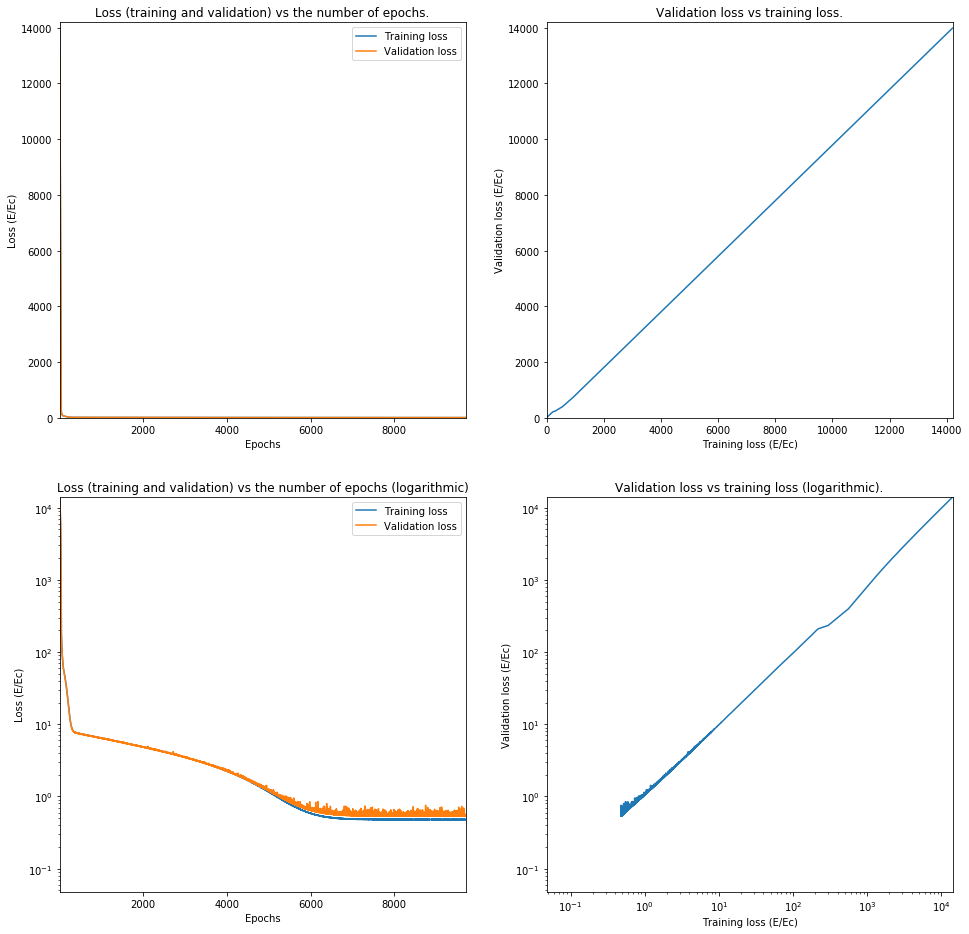

Train on 32002 samples, validate on 8001 samples
Epoch 1/25000
32002/32002 [==============================] - 1s 25us/step - loss: 10894.8780 - val_loss: 10754.2245
Epoch 2/25000
32002/32002 [==============================] - 1s 23us/step - loss: 10670.2395 - val_loss: 10532.8161
Epoch 3/25000
32002/32002 [==============================] - 1s 23us/step - loss: 10450.5063 - val_loss: 10315.6350
Epoch 4/25000
32002/32002 [==============================] - 1s 23us/step - loss: 10234.7960 - val_loss: 10102.2703
Epoch 5/25000
32002/32002 [==============================] - 1s 23us/step - loss: 10022.6982 - val_loss: 9892.7188
Epoch 6/25000
32002/32002 [==============================] - 1s 23us/step - loss: 9814.2720 - val_loss: 9686.8226
Epoch 7/25000
32002/32002 [==============================] - 1s 23us/step - loss: 9609.5113 - val_loss: 9484.7247
Epoch 8/25000
32002/32002 [==============================] - 1s 23us/step - loss: 9408.2433 - val_loss: 9286.1208
Epoch 9/25000
32002/32002 [===

Epoch 72/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2384.4862 - val_loss: 2345.3648
Epoch 73/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2311.0499 - val_loss: 2271.9352
Epoch 74/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2237.3870 - val_loss: 2198.3109
Epoch 75/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2163.5150 - val_loss: 2124.4763
Epoch 76/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2089.3561 - val_loss: 2050.2762
Epoch 77/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2014.7105 - val_loss: 1975.5226
Epoch 78/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1939.4818 - val_loss: 1900.1995
Epoch 79/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1863.6351 - val_loss: 1824.2582
Epoch 80/25000
32002/32002 [==============================] - 1s 23us/step - los

32002/32002 [==============================] - 1s 23us/step - loss: 66.4645 - val_loss: 65.0106
Epoch 145/25000
32002/32002 [==============================] - 1s 23us/step - loss: 65.2762 - val_loss: 63.8717
Epoch 146/25000
32002/32002 [==============================] - 1s 23us/step - loss: 64.1220 - val_loss: 62.7735
Epoch 147/25000
32002/32002 [==============================] - 1s 23us/step - loss: 62.9962 - val_loss: 61.6479
Epoch 148/25000
32002/32002 [==============================] - 1s 23us/step - loss: 61.8761 - val_loss: 60.5648
Epoch 149/25000
32002/32002 [==============================] - 1s 23us/step - loss: 60.7739 - val_loss: 59.5010
Epoch 150/25000
32002/32002 [==============================] - 1s 23us/step - loss: 59.6862 - val_loss: 58.4522
Epoch 151/25000
32002/32002 [==============================] - 1s 23us/step - loss: 58.6091 - val_loss: 57.3970
Epoch 152/25000
32002/32002 [==============================] - 1s 23us/step - loss: 57.5408 - val_loss: 56.3740
Epoch 15

32002/32002 [==============================] - 1s 23us/step - loss: 12.5720 - val_loss: 12.5339
Epoch 218/25000
32002/32002 [==============================] - 1s 23us/step - loss: 12.3785 - val_loss: 12.3362
Epoch 219/25000
32002/32002 [==============================] - 1s 23us/step - loss: 12.1870 - val_loss: 12.1476
Epoch 220/25000
32002/32002 [==============================] - 1s 23us/step - loss: 11.9960 - val_loss: 11.9659
Epoch 221/25000
32002/32002 [==============================] - 1s 23us/step - loss: 11.8169 - val_loss: 11.7942
Epoch 222/25000
32002/32002 [==============================] - 1s 23us/step - loss: 11.6433 - val_loss: 11.6159
Epoch 223/25000
32002/32002 [==============================] - 1s 23us/step - loss: 11.4777 - val_loss: 11.4532
Epoch 224/25000
32002/32002 [==============================] - 1s 23us/step - loss: 11.3203 - val_loss: 11.2925
Epoch 225/25000
32002/32002 [==============================] - 1s 23us/step - loss: 11.1673 - val_loss: 11.1412
Epoch 22

32002/32002 [==============================] - 1s 23us/step - loss: 3.3253 - val_loss: 3.2685
Epoch 292/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.2559 - val_loss: 3.2020
Epoch 293/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.1904 - val_loss: 3.1427
Epoch 294/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.1266 - val_loss: 3.0865
Epoch 295/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.0673 - val_loss: 3.0246
Epoch 296/25000
32002/32002 [==============================] - 1s 23us/step - loss: 3.0108 - val_loss: 2.9736
Epoch 297/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.9572 - val_loss: 2.9235
Epoch 298/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.9044 - val_loss: 2.8693
Epoch 299/25000
32002/32002 [==============================] - 1s 23us/step - loss: 2.8536 - val_loss: 2.8448
Epoch 300/25000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 1.3976 - val_loss: 1.3880
Epoch 366/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3872 - val_loss: 1.3563
Epoch 367/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3766 - val_loss: 1.3487
Epoch 368/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3635 - val_loss: 1.3335
Epoch 369/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3537 - val_loss: 1.3224
Epoch 370/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3434 - val_loss: 1.3209
Epoch 371/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3329 - val_loss: 1.3027
Epoch 372/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3224 - val_loss: 1.3031
Epoch 373/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3119 - val_loss: 1.2842
Epoch 374/25000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 0.8968 - val_loss: 0.8745
Epoch 440/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8935 - val_loss: 0.8775
Epoch 441/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8907 - val_loss: 0.8656
Epoch 442/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8892 - val_loss: 0.8638
Epoch 443/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8855 - val_loss: 0.8611
Epoch 444/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8834 - val_loss: 0.8602
Epoch 445/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8812 - val_loss: 0.8680
Epoch 446/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8803 - val_loss: 0.8542
Epoch 447/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8767 - val_loss: 0.8660
Epoch 448/25000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 0.8166 - val_loss: 0.7931
Epoch 514/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8157 - val_loss: 0.8205
Epoch 515/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8158 - val_loss: 0.7909
Epoch 516/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8149 - val_loss: 0.7945
Epoch 517/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8147 - val_loss: 0.7889
Epoch 518/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8132 - val_loss: 0.7932
Epoch 519/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8144 - val_loss: 0.7940
Epoch 520/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8121 - val_loss: 0.7875
Epoch 521/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8128 - val_loss: 0.7874
Epoch 522/25000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 0.7857 - val_loss: 0.7607
Epoch 588/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7854 - val_loss: 0.7591
Epoch 589/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7835 - val_loss: 0.7698
Epoch 590/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7828 - val_loss: 0.7637
Epoch 591/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7837 - val_loss: 0.7618
Epoch 592/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7835 - val_loss: 0.7568
Epoch 593/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7832 - val_loss: 0.7839
Epoch 594/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7825 - val_loss: 0.7752
Epoch 595/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7827 - val_loss: 0.7758
Epoch 596/25000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 0.7590 - val_loss: 0.7469
Epoch 662/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7587 - val_loss: 0.7338
Epoch 663/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7580 - val_loss: 0.7412
Epoch 664/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7578 - val_loss: 0.7353
Epoch 665/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7578 - val_loss: 0.7339
Epoch 666/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7578 - val_loss: 0.7327
Epoch 667/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7561 - val_loss: 0.7338
Epoch 668/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7568 - val_loss: 0.7323
Epoch 669/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7568 - val_loss: 0.7397
Epoch 670/25000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 0.7375 - val_loss: 0.7147
Epoch 736/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7370 - val_loss: 0.7144
Epoch 737/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7370 - val_loss: 0.7154
Epoch 738/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7368 - val_loss: 0.7144
Epoch 739/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7358 - val_loss: 0.7154
Epoch 740/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7359 - val_loss: 0.7146
Epoch 741/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7356 - val_loss: 0.7210
Epoch 742/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7356 - val_loss: 0.7179
Epoch 743/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7347 - val_loss: 0.7115
Epoch 744/25000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 0.7168 - val_loss: 0.6950
Epoch 810/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7164 - val_loss: 0.6962
Epoch 811/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7164 - val_loss: 0.7167
Epoch 812/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7167 - val_loss: 0.6959
Epoch 813/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7157 - val_loss: 0.6956
Epoch 814/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7157 - val_loss: 0.6941
Epoch 815/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7150 - val_loss: 0.7002
Epoch 816/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7149 - val_loss: 0.6939
Epoch 817/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7150 - val_loss: 0.6969
Epoch 818/25000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 0.6984 - val_loss: 0.6790
Epoch 884/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6994 - val_loss: 0.6818
Epoch 885/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6990 - val_loss: 0.6809
Epoch 886/25000
32002/32002 [==============================] - ETA: 0s - loss: 0.696 - 1s 23us/step - loss: 0.6980 - val_loss: 0.6815
Epoch 887/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6979 - val_loss: 0.6795
Epoch 888/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6976 - val_loss: 0.6774
Epoch 889/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6973 - val_loss: 0.6779
Epoch 890/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6971 - val_loss: 0.6800
Epoch 891/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6975 - val_loss: 0.6778
Ep

32002/32002 [==============================] - 1s 23us/step - loss: 0.6827 - val_loss: 0.6633
Epoch 958/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6812 - val_loss: 0.6643
Epoch 959/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6811 - val_loss: 0.6631
Epoch 960/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6803 - val_loss: 0.6620
Epoch 961/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6807 - val_loss: 0.6636
Epoch 962/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6805 - val_loss: 0.6625
Epoch 963/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6798 - val_loss: 0.6613
Epoch 964/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6801 - val_loss: 0.6724
Epoch 965/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6793 - val_loss: 0.6617
Epoch 966/25000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 0.6663 - val_loss: 0.6534
Epoch 1032/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6650 - val_loss: 0.6576
Epoch 1033/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6655 - val_loss: 0.6597
Epoch 1034/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6656 - val_loss: 0.6468
Epoch 1035/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6650 - val_loss: 0.6532
Epoch 1036/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6641 - val_loss: 0.6465
Epoch 1037/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6638 - val_loss: 0.6493
Epoch 1038/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6650 - val_loss: 0.6456
Epoch 1039/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6642 - val_loss: 0.6475
Epoch 1040/25000
3

Epoch 1105/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6515 - val_loss: 0.6337
Epoch 1106/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6515 - val_loss: 0.6334
Epoch 1107/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6508 - val_loss: 0.6405
Epoch 1108/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6504 - val_loss: 0.6349
Epoch 1109/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6510 - val_loss: 0.6333
Epoch 1110/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6498 - val_loss: 0.6329
Epoch 1111/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6509 - val_loss: 0.6445
Epoch 1112/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6510 - val_loss: 0.6340
Epoch 1113/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6507 - val_loss: 0.6318
E

Epoch 1179/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6385 - val_loss: 0.6223
Epoch 1180/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6381 - val_loss: 0.6354
Epoch 1181/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6388 - val_loss: 0.6213
Epoch 1182/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6379 - val_loss: 0.6209
Epoch 1183/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6387 - val_loss: 0.6226
Epoch 1184/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6380 - val_loss: 0.6210
Epoch 1185/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6377 - val_loss: 0.6239
Epoch 1186/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6379 - val_loss: 0.6235
Epoch 1187/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6378 - val_loss: 0.6321
E

Epoch 1253/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6256 - val_loss: 0.6093
Epoch 1254/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6267 - val_loss: 0.6142
Epoch 1255/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6265 - val_loss: 0.6154
Epoch 1256/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6259 - val_loss: 0.6164
Epoch 1257/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6254 - val_loss: 0.6093
Epoch 1258/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6263 - val_loss: 0.6172
Epoch 1259/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6256 - val_loss: 0.6114
Epoch 1260/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6251 - val_loss: 0.6087
Epoch 1261/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6245 - val_loss: 0.6098
E

32002/32002 [==============================] - 1s 22us/step - loss: 0.6146 - val_loss: 0.6025
Epoch 1327/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6146 - val_loss: 0.6021
Epoch 1328/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6143 - val_loss: 0.6055
Epoch 1329/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6148 - val_loss: 0.5994
Epoch 1330/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6151 - val_loss: 0.5995
Epoch 1331/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6149 - val_loss: 0.6031
Epoch 1332/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6153 - val_loss: 0.5987
Epoch 1333/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6151 - val_loss: 0.6056
Epoch 1334/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6145 - val_loss: 0.5984
Epoch 1335/25000
3

Epoch 1400/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6054 - val_loss: 0.5892
Epoch 1401/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6052 - val_loss: 0.5895
Epoch 1402/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6048 - val_loss: 0.5988
Epoch 1403/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6048 - val_loss: 0.5922
Epoch 1404/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6044 - val_loss: 0.5899
Epoch 1405/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6048 - val_loss: 0.5914
Epoch 1406/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6052 - val_loss: 0.5894
Epoch 1407/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6045 - val_loss: 0.5882
Epoch 1408/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6040 - val_loss: 0.5884
E

Epoch 1474/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5961 - val_loss: 0.5838
Epoch 1475/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5958 - val_loss: 0.5813
Epoch 1476/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5957 - val_loss: 0.5822
Epoch 1477/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5945 - val_loss: 0.5797
Epoch 1478/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5962 - val_loss: 0.5809
Epoch 1479/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5959 - val_loss: 0.5813
Epoch 1480/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5951 - val_loss: 0.5796
Epoch 1481/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5947 - val_loss: 0.5818
Epoch 1482/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5948 - val_loss: 0.5797
E

Epoch 1548/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5867 - val_loss: 0.5842
Epoch 1549/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5866 - val_loss: 0.5730
Epoch 1550/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5875 - val_loss: 0.5717
Epoch 1551/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5868 - val_loss: 0.5781
Epoch 1552/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5872 - val_loss: 0.5713
Epoch 1553/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5867 - val_loss: 0.5760
Epoch 1554/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5877 - val_loss: 0.5820
Epoch 1555/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5862 - val_loss: 0.5713
Epoch 1556/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5868 - val_loss: 0.5719
E

Epoch 1622/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5790 - val_loss: 0.5649
Epoch 1623/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5788 - val_loss: 0.5708
Epoch 1624/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5796 - val_loss: 0.5676
Epoch 1625/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5787 - val_loss: 0.5661
Epoch 1626/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5800 - val_loss: 0.5698
Epoch 1627/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5795 - val_loss: 0.5645
Epoch 1628/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5786 - val_loss: 0.5648
Epoch 1629/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5784 - val_loss: 0.5654
Epoch 1630/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5788 - val_loss: 0.5678
E

32002/32002 [==============================] - 1s 22us/step - loss: 0.5723 - val_loss: 0.5572
Epoch 1696/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5718 - val_loss: 0.5573
Epoch 1697/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5722 - val_loss: 0.5593
Epoch 1698/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5720 - val_loss: 0.5585
Epoch 1699/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5721 - val_loss: 0.5605
Epoch 1700/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5721 - val_loss: 0.5562
Epoch 1701/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5719 - val_loss: 0.5566
Epoch 1702/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5712 - val_loss: 0.5561
Epoch 1703/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5712 - val_loss: 0.5568
Epoch 1704/25000
3

Epoch 1769/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5658 - val_loss: 0.5515
Epoch 1770/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5652 - val_loss: 0.5647
Epoch 1771/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5654 - val_loss: 0.5499
Epoch 1772/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5648 - val_loss: 0.5502
Epoch 1773/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5643 - val_loss: 0.5496
Epoch 1774/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5651 - val_loss: 0.5500
Epoch 1775/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5646 - val_loss: 0.5495
Epoch 1776/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5649 - val_loss: 0.5495
Epoch 1777/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5647 - val_loss: 0.5500
E

Epoch 1843/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5586 - val_loss: 0.5445
Epoch 1844/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5581 - val_loss: 0.5436
Epoch 1845/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5585 - val_loss: 0.5441
Epoch 1846/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5590 - val_loss: 0.5436
Epoch 1847/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5586 - val_loss: 0.5435
Epoch 1848/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5576 - val_loss: 0.5438
Epoch 1849/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5588 - val_loss: 0.5474
Epoch 1850/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5583 - val_loss: 0.5450
Epoch 1851/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5575 - val_loss: 0.5435
E

Epoch 1917/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5522 - val_loss: 0.5376
Epoch 1918/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5522 - val_loss: 0.5377
Epoch 1919/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5519 - val_loss: 0.5375
Epoch 1920/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5520 - val_loss: 0.5383
Epoch 1921/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5530 - val_loss: 0.5389
Epoch 1922/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5521 - val_loss: 0.5395
Epoch 1923/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5521 - val_loss: 0.5427
Epoch 1924/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5523 - val_loss: 0.5517
Epoch 1925/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5514 - val_loss: 0.5392
E

Epoch 1991/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5467 - val_loss: 0.5388
Epoch 1992/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5477 - val_loss: 0.5340
Epoch 1993/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5459 - val_loss: 0.5324
Epoch 1994/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5473 - val_loss: 0.5338
Epoch 1995/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5470 - val_loss: 0.5330
Epoch 1996/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5461 - val_loss: 0.5349
Epoch 1997/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5469 - val_loss: 0.5385
Epoch 1998/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5463 - val_loss: 0.5339
Epoch 1999/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5460 - val_loss: 0.5393
E

Epoch 2065/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5414 - val_loss: 0.5290
Epoch 2066/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5416 - val_loss: 0.5279
Epoch 2067/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5418 - val_loss: 0.5292
Epoch 2068/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5416 - val_loss: 0.5307
Epoch 2069/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5416 - val_loss: 0.5272
Epoch 2070/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5412 - val_loss: 0.5315
Epoch 2071/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5409 - val_loss: 0.5274
Epoch 2072/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5419 - val_loss: 0.5274
Epoch 2073/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5411 - val_loss: 0.5285
E

Epoch 2139/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5373 - val_loss: 0.5236
Epoch 2140/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5363 - val_loss: 0.5229
Epoch 2141/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5363 - val_loss: 0.5233
Epoch 2142/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5363 - val_loss: 0.5373
Epoch 2143/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5371 - val_loss: 0.5230
Epoch 2144/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5365 - val_loss: 0.5280
Epoch 2145/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5365 - val_loss: 0.5240
Epoch 2146/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5361 - val_loss: 0.5241
Epoch 2147/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5360 - val_loss: 0.5229
E

Epoch 2213/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5319 - val_loss: 0.5267
Epoch 2214/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5333 - val_loss: 0.5204
Epoch 2215/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5324 - val_loss: 0.5233
Epoch 2216/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5321 - val_loss: 0.5186
Epoch 2217/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5315 - val_loss: 0.5185
Epoch 2218/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5321 - val_loss: 0.5183
Epoch 2219/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5314 - val_loss: 0.5228
Epoch 2220/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5314 - val_loss: 0.5181
Epoch 2221/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5312 - val_loss: 0.5198
E

Epoch 2287/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5275 - val_loss: 0.5167
Epoch 2288/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5274 - val_loss: 0.5180
Epoch 2289/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5273 - val_loss: 0.5232
Epoch 2290/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5281 - val_loss: 0.5213
Epoch 2291/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5273 - val_loss: 0.5153
Epoch 2292/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5280 - val_loss: 0.5213
Epoch 2293/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5275 - val_loss: 0.5144
Epoch 2294/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5269 - val_loss: 0.5177
Epoch 2295/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5268 - val_loss: 0.5237
E

Epoch 2361/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5241 - val_loss: 0.5147
Epoch 2362/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5250 - val_loss: 0.5132
Epoch 2363/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5234 - val_loss: 0.5183
Epoch 2364/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5244 - val_loss: 0.5107
Epoch 2365/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5228 - val_loss: 0.5141
Epoch 2366/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5236 - val_loss: 0.5118
Epoch 2367/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5234 - val_loss: 0.5296
Epoch 2368/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5242 - val_loss: 0.5220
Epoch 2369/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5225 - val_loss: 0.5110
E

Epoch 2435/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5204 - val_loss: 0.5099
Epoch 2436/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5200 - val_loss: 0.5091
Epoch 2437/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5196 - val_loss: 0.5107
Epoch 2438/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5202 - val_loss: 0.5129
Epoch 2439/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5207 - val_loss: 0.5127
Epoch 2440/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5202 - val_loss: 0.5115
Epoch 2441/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5201 - val_loss: 0.5102
Epoch 2442/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5196 - val_loss: 0.5180
Epoch 2443/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5196 - val_loss: 0.5074
E

Epoch 2509/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5175 - val_loss: 0.5079
Epoch 2510/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5169 - val_loss: 0.5072
Epoch 2511/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5165 - val_loss: 0.5168
Epoch 2512/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5173 - val_loss: 0.5051
Epoch 2513/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5165 - val_loss: 0.5083
Epoch 2514/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5171 - val_loss: 0.5093
Epoch 2515/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5168 - val_loss: 0.5048
Epoch 2516/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5172 - val_loss: 0.5170
Epoch 2517/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5166 - val_loss: 0.5086
E

Epoch 2583/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5134 - val_loss: 0.5046
Epoch 2584/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5138 - val_loss: 0.5015
Epoch 2585/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5137 - val_loss: 0.5040
Epoch 2586/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5147 - val_loss: 0.5020
Epoch 2587/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5148 - val_loss: 0.5181
Epoch 2588/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5135 - val_loss: 0.5056
Epoch 2589/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5134 - val_loss: 0.5060
Epoch 2590/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5142 - val_loss: 0.5045
Epoch 2591/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5136 - val_loss: 0.5057
E

Epoch 2657/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5116 - val_loss: 0.4992
Epoch 2658/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5113 - val_loss: 0.5041
Epoch 2659/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5117 - val_loss: 0.4994
Epoch 2660/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5113 - val_loss: 0.4996
Epoch 2661/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5111 - val_loss: 0.4991
Epoch 2662/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5107 - val_loss: 0.5004
Epoch 2663/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5116 - val_loss: 0.4997
Epoch 2664/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5111 - val_loss: 0.4994
Epoch 2665/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5109 - val_loss: 0.4986
E

Epoch 2731/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5083 - val_loss: 0.4970
Epoch 2732/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5092 - val_loss: 0.4963
Epoch 2733/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5087 - val_loss: 0.4973
Epoch 2734/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5087 - val_loss: 0.4962
Epoch 2735/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5088 - val_loss: 0.4972
Epoch 2736/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5091 - val_loss: 0.5095
Epoch 2737/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5086 - val_loss: 0.4965
Epoch 2738/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5083 - val_loss: 0.5048
Epoch 2739/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5083 - val_loss: 0.5017
E

Epoch 2805/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5067 - val_loss: 0.5039
Epoch 2806/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5077 - val_loss: 0.5023
Epoch 2807/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5061 - val_loss: 0.5005
Epoch 2808/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5066 - val_loss: 0.4972
Epoch 2809/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5067 - val_loss: 0.4943
Epoch 2810/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5066 - val_loss: 0.5019
Epoch 2811/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5071 - val_loss: 0.4941
Epoch 2812/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5059 - val_loss: 0.5020
Epoch 2813/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5056 - val_loss: 0.4961
E

Epoch 2879/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5048 - val_loss: 0.4930
Epoch 2880/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5046 - val_loss: 0.4916
Epoch 2881/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5047 - val_loss: 0.4955
Epoch 2882/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5045 - val_loss: 0.5056
Epoch 2883/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5040 - val_loss: 0.4918
Epoch 2884/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5040 - val_loss: 0.4924
Epoch 2885/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5036 - val_loss: 0.4924
Epoch 2886/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5035 - val_loss: 0.4951
Epoch 2887/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5048 - val_loss: 0.4942
E

Epoch 2953/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5023 - val_loss: 0.4940
Epoch 2954/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5024 - val_loss: 0.4898
Epoch 2955/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5022 - val_loss: 0.4899
Epoch 2956/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5029 - val_loss: 0.4944
Epoch 2957/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5027 - val_loss: 0.4914
Epoch 2958/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5018 - val_loss: 0.4895
Epoch 2959/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5031 - val_loss: 0.4898
Epoch 2960/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5021 - val_loss: 0.4940
Epoch 2961/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5024 - val_loss: 0.4958
E

Epoch 3027/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5004 - val_loss: 0.4894
Epoch 3028/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5020 - val_loss: 0.4954
Epoch 3029/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5015 - val_loss: 0.4919
Epoch 3030/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5017 - val_loss: 0.4890
Epoch 3031/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5008 - val_loss: 0.4876
Epoch 3032/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5002 - val_loss: 0.4879
Epoch 3033/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5003 - val_loss: 0.4888
Epoch 3034/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4999 - val_loss: 0.4897
Epoch 3035/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5007 - val_loss: 0.4916
E

Epoch 3101/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4992 - val_loss: 0.4880
Epoch 3102/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4988 - val_loss: 0.4910
Epoch 3103/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4995 - val_loss: 0.4920
Epoch 3104/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4992 - val_loss: 0.4957
Epoch 3105/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4993 - val_loss: 0.4856
Epoch 3106/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4987 - val_loss: 0.4872
Epoch 3107/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4985 - val_loss: 0.4917
Epoch 3108/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4992 - val_loss: 0.4908
Epoch 3109/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4986 - val_loss: 0.4862
E

Epoch 3175/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4979 - val_loss: 0.4846
Epoch 3176/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4979 - val_loss: 0.4857
Epoch 3177/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4973 - val_loss: 0.4989
Epoch 3178/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4980 - val_loss: 0.4852
Epoch 3179/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4972 - val_loss: 0.4842
Epoch 3180/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4971 - val_loss: 0.4905
Epoch 3181/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4970 - val_loss: 0.4852
Epoch 3182/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4970 - val_loss: 0.4863
Epoch 3183/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4965 - val_loss: 0.4840
E

Epoch 3249/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4964 - val_loss: 0.4874
Epoch 3250/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4964 - val_loss: 0.4826
Epoch 3251/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4951 - val_loss: 0.4823
Epoch 3252/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4958 - val_loss: 0.4826
Epoch 3253/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4956 - val_loss: 0.4824
Epoch 3254/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4960 - val_loss: 0.4839
Epoch 3255/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4965 - val_loss: 0.4886
Epoch 3256/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4953 - val_loss: 0.4826
Epoch 3257/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4952 - val_loss: 0.4841
E

Epoch 3323/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4949 - val_loss: 0.4833
Epoch 3324/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4945 - val_loss: 0.4814
Epoch 3325/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4945 - val_loss: 0.4829
Epoch 3326/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4937 - val_loss: 0.4809
Epoch 3327/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4933 - val_loss: 0.4810
Epoch 3328/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4950 - val_loss: 0.4897
Epoch 3329/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4941 - val_loss: 0.4818
Epoch 3330/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4946 - val_loss: 0.4812
Epoch 3331/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4937 - val_loss: 0.4892
E

Epoch 3397/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4928 - val_loss: 0.4815
Epoch 3398/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4924 - val_loss: 0.4796
Epoch 3399/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4931 - val_loss: 0.4831
Epoch 3400/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4928 - val_loss: 0.4806
Epoch 3401/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4930 - val_loss: 0.4811
Epoch 3402/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4927 - val_loss: 0.4811
Epoch 3403/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4926 - val_loss: 0.4834
Epoch 3404/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4927 - val_loss: 0.4805
Epoch 3405/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4932 - val_loss: 0.4898
E

Epoch 3471/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4908 - val_loss: 0.4797
Epoch 3472/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4915 - val_loss: 0.4797
Epoch 3473/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4917 - val_loss: 0.4827
Epoch 3474/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4920 - val_loss: 0.4785
Epoch 3475/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4918 - val_loss: 0.4934
Epoch 3476/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4922 - val_loss: 0.4824
Epoch 3477/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4908 - val_loss: 0.4938
Epoch 3478/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4915 - val_loss: 0.4785
Epoch 3479/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4917 - val_loss: 0.4817
E

Epoch 3545/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4903 - val_loss: 0.4804
Epoch 3546/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4901 - val_loss: 0.4886
Epoch 3547/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4909 - val_loss: 0.4865
Epoch 3548/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4905 - val_loss: 0.4806
Epoch 3549/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4906 - val_loss: 0.4786
Epoch 3550/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4905 - val_loss: 0.4861
Epoch 3551/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4905 - val_loss: 0.4794
Epoch 3552/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4901 - val_loss: 0.4997
Epoch 3553/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4900 - val_loss: 0.4861
E

Epoch 3619/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4890 - val_loss: 0.4772
Epoch 3620/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4897 - val_loss: 0.4793
Epoch 3621/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4890 - val_loss: 0.4775
Epoch 3622/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4888 - val_loss: 0.4815
Epoch 3623/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4892 - val_loss: 0.4822
Epoch 3624/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4891 - val_loss: 0.4775
Epoch 3625/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4890 - val_loss: 0.4825
Epoch 3626/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4896 - val_loss: 0.4765
Epoch 3627/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4888 - val_loss: 0.4772
E

Epoch 3693/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4876 - val_loss: 0.4751
Epoch 3694/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4885 - val_loss: 0.4753
Epoch 3695/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4883 - val_loss: 0.4750
Epoch 3696/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4888 - val_loss: 0.4749
Epoch 3697/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4884 - val_loss: 0.4757
Epoch 3698/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4881 - val_loss: 0.4818
Epoch 3699/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4886 - val_loss: 0.4751
Epoch 3700/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4881 - val_loss: 0.4762
Epoch 3701/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4887 - val_loss: 0.4753
E

Epoch 3767/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4869 - val_loss: 0.4739
Epoch 3768/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4874 - val_loss: 0.4900
Epoch 3769/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4873 - val_loss: 0.4777
Epoch 3770/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4874 - val_loss: 0.4737
Epoch 3771/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4876 - val_loss: 0.4741
Epoch 3772/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4871 - val_loss: 0.4831
Epoch 3773/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4871 - val_loss: 0.4754
Epoch 3774/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4877 - val_loss: 0.4745
Epoch 3775/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4871 - val_loss: 0.4738
E

Epoch 3841/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4858 - val_loss: 0.4756
Epoch 3842/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4865 - val_loss: 0.4787
Epoch 3843/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4868 - val_loss: 0.4739
Epoch 3844/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4857 - val_loss: 0.4736
Epoch 3845/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4862 - val_loss: 0.4728
Epoch 3846/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4859 - val_loss: 0.4920
Epoch 3847/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4856 - val_loss: 0.4734
Epoch 3848/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4860 - val_loss: 0.4809
Epoch 3849/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4873 - val_loss: 0.4860
E

Epoch 3915/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4863 - val_loss: 0.4719
Epoch 3916/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4855 - val_loss: 0.4792
Epoch 3917/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4860 - val_loss: 0.4717
Epoch 3918/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4852 - val_loss: 0.4768
Epoch 3919/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4858 - val_loss: 0.4732
Epoch 3920/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4855 - val_loss: 0.4913
Epoch 3921/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4852 - val_loss: 0.4727
Epoch 3922/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4856 - val_loss: 0.4724
Epoch 3923/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4855 - val_loss: 0.4722
E

Epoch 3989/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4848 - val_loss: 0.4724
Epoch 3990/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4844 - val_loss: 0.4741
Epoch 3991/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4842 - val_loss: 0.4722
Epoch 3992/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4851 - val_loss: 0.4765
Epoch 3993/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4846 - val_loss: 0.4708
Epoch 3994/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4849 - val_loss: 0.4711
Epoch 3995/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4848 - val_loss: 0.4813
Epoch 3996/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4850 - val_loss: 0.4709
Epoch 3997/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4854 - val_loss: 0.4720
E

Epoch 4063/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4840 - val_loss: 0.4761
Epoch 4064/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4839 - val_loss: 0.4762
Epoch 4065/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4832 - val_loss: 0.4733
Epoch 4066/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4843 - val_loss: 0.4700
Epoch 4067/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4843 - val_loss: 0.4709
Epoch 4068/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4843 - val_loss: 0.4701
Epoch 4069/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4842 - val_loss: 0.4706
Epoch 4070/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4836 - val_loss: 0.4700
Epoch 4071/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4843 - val_loss: 0.4701
E

Epoch 4137/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4830 - val_loss: 0.4700
Epoch 4138/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4833 - val_loss: 0.4698
Epoch 4139/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4833 - val_loss: 0.4691
Epoch 4140/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4831 - val_loss: 0.4708
Epoch 4141/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4833 - val_loss: 0.4722
Epoch 4142/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4839 - val_loss: 0.4700
Epoch 4143/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4838 - val_loss: 0.4695
Epoch 4144/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4842 - val_loss: 0.4712
Epoch 4145/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4836 - val_loss: 0.4695
E

Epoch 4211/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4830 - val_loss: 0.4759
Epoch 4212/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4830 - val_loss: 0.4683
Epoch 4213/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4823 - val_loss: 0.4713
Epoch 4214/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4827 - val_loss: 0.4764
Epoch 4215/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4829 - val_loss: 0.4694
Epoch 4216/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4832 - val_loss: 0.4734
Epoch 4217/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4827 - val_loss: 0.4760
Epoch 4218/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4819 - val_loss: 0.4685
Epoch 4219/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4829 - val_loss: 0.4695
E

Epoch 4285/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4822 - val_loss: 0.4697
Epoch 4286/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4830 - val_loss: 0.4682
Epoch 4287/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4823 - val_loss: 0.4703
Epoch 4288/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4831 - val_loss: 0.4682
Epoch 4289/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4826 - val_loss: 0.4677
Epoch 4290/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4822 - val_loss: 0.4735
Epoch 4291/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4814 - val_loss: 0.4741
Epoch 4292/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4825 - val_loss: 0.4683
Epoch 4293/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4817 - val_loss: 0.4682
E

Epoch 4359/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4815 - val_loss: 0.4697
Epoch 4360/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4820 - val_loss: 0.4754
Epoch 4361/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4817 - val_loss: 0.4668
Epoch 4362/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4812 - val_loss: 0.4692
Epoch 4363/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4828 - val_loss: 0.4720
Epoch 4364/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4812 - val_loss: 0.4679
Epoch 4365/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4823 - val_loss: 0.4669
Epoch 4366/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4817 - val_loss: 0.4705
Epoch 4367/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4820 - val_loss: 0.4670
E

Epoch 4433/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4812 - val_loss: 0.4760
Epoch 4434/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4815 - val_loss: 0.4743
Epoch 4435/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4815 - val_loss: 0.4664
Epoch 4436/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4805 - val_loss: 0.4689
Epoch 4437/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4807 - val_loss: 0.4689
Epoch 4438/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4809 - val_loss: 0.4711
Epoch 4439/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4817 - val_loss: 0.4664
Epoch 4440/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4813 - val_loss: 0.4732
Epoch 4441/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4812 - val_loss: 0.4693
E

Epoch 4507/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4807 - val_loss: 0.4657
Epoch 4508/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4811 - val_loss: 0.4748
Epoch 4509/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4817 - val_loss: 0.4689
Epoch 4510/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4814 - val_loss: 0.4719
Epoch 4511/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4812 - val_loss: 0.4664
Epoch 4512/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4811 - val_loss: 0.4661
Epoch 4513/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4807 - val_loss: 0.4666
Epoch 4514/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4808 - val_loss: 0.4666
Epoch 4515/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4801 - val_loss: 0.4683
E

Epoch 4581/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4802 - val_loss: 0.4742
Epoch 4582/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4796 - val_loss: 0.4674
Epoch 4583/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4797 - val_loss: 0.4665
Epoch 4584/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4802 - val_loss: 0.4875
Epoch 4585/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4803 - val_loss: 0.4762
Epoch 4586/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4796 - val_loss: 0.4757
Epoch 4587/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4815 - val_loss: 0.4736
Epoch 4588/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4802 - val_loss: 0.4706
Epoch 4589/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4806 - val_loss: 0.4789
E

Epoch 4655/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4802 - val_loss: 0.4662
Epoch 4656/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4802 - val_loss: 0.4777
Epoch 4657/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4798 - val_loss: 0.4722
Epoch 4658/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4796 - val_loss: 0.4660
Epoch 4659/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4803 - val_loss: 0.4662
Epoch 4660/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4798 - val_loss: 0.4657
Epoch 4661/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4801 - val_loss: 0.4651
Epoch 4662/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4802 - val_loss: 0.4651
Epoch 4663/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4803 - val_loss: 0.4683
E

Epoch 4729/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4791 - val_loss: 0.4670
Epoch 4730/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4797 - val_loss: 0.4645
Epoch 4731/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4793 - val_loss: 0.4645
Epoch 4732/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4793 - val_loss: 0.4808
Epoch 4733/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4793 - val_loss: 0.4675
Epoch 4734/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4803 - val_loss: 0.4756
Epoch 4735/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4802 - val_loss: 0.4685
Epoch 4736/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4799 - val_loss: 0.4717
Epoch 4737/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4797 - val_loss: 0.4659
E

Epoch 4803/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4790 - val_loss: 0.4804
Epoch 4804/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4795 - val_loss: 0.4658
Epoch 4805/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4793 - val_loss: 0.4720
Epoch 4806/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4792 - val_loss: 0.4755
Epoch 4807/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4804 - val_loss: 0.4638
Epoch 4808/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4797 - val_loss: 0.4701
Epoch 4809/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4801 - val_loss: 0.4638
Epoch 4810/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4785 - val_loss: 0.4646
Epoch 4811/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4797 - val_loss: 0.4688
E

Epoch 4877/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4786 - val_loss: 0.4836
Epoch 4878/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4793 - val_loss: 0.4676
Epoch 4879/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4789 - val_loss: 0.4648
Epoch 4880/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4799 - val_loss: 0.4708
Epoch 4881/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4789 - val_loss: 0.4638
Epoch 4882/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4788 - val_loss: 0.4635
Epoch 4883/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4790 - val_loss: 0.4639
Epoch 4884/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4788 - val_loss: 0.4645
Epoch 4885/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4783 - val_loss: 0.4650
E

Epoch 4951/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4796 - val_loss: 0.4685
Epoch 4952/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4783 - val_loss: 0.4797
Epoch 4953/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4786 - val_loss: 0.4646
Epoch 4954/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4786 - val_loss: 0.4630
Epoch 4955/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4784 - val_loss: 0.4636
Epoch 4956/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4785 - val_loss: 0.4631
Epoch 4957/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4791 - val_loss: 0.4706
Epoch 4958/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4789 - val_loss: 0.4639
Epoch 4959/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4784 - val_loss: 0.4632
E

Epoch 5025/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4789 - val_loss: 0.4675
Epoch 5026/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4781 - val_loss: 0.4661
Epoch 5027/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4786 - val_loss: 0.4711
Epoch 5028/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4783 - val_loss: 0.4667
Epoch 5029/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4790 - val_loss: 0.4698
Epoch 5030/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4780 - val_loss: 0.4919
Epoch 5031/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4783 - val_loss: 0.4705
Epoch 5032/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4784 - val_loss: 0.4687
Epoch 5033/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4787 - val_loss: 0.4631
E

Epoch 5099/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4782 - val_loss: 0.4650
Epoch 5100/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4780 - val_loss: 0.4733
Epoch 5101/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4777 - val_loss: 0.4623
Epoch 5102/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4785 - val_loss: 0.4620
Epoch 5103/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4782 - val_loss: 0.4625
Epoch 5104/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4785 - val_loss: 0.4629
Epoch 5105/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4774 - val_loss: 0.4634
Epoch 5106/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4781 - val_loss: 0.4624
Epoch 5107/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4778 - val_loss: 0.4624
E

Epoch 5173/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4777 - val_loss: 0.4650
Epoch 5174/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4778 - val_loss: 0.4632
Epoch 5175/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4778 - val_loss: 0.4627
Epoch 5176/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4779 - val_loss: 0.4630
Epoch 5177/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4770 - val_loss: 0.4621
Epoch 5178/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4778 - val_loss: 0.4617
Epoch 5179/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4789 - val_loss: 0.4621
Epoch 5180/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4770 - val_loss: 0.4708
Epoch 5181/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4782 - val_loss: 0.4637
E

Epoch 5247/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4774 - val_loss: 0.4634
Epoch 5248/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4775 - val_loss: 0.4615
Epoch 5249/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4793 - val_loss: 0.4622
Epoch 5250/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4775 - val_loss: 0.4628
Epoch 5251/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4777 - val_loss: 0.4743
Epoch 5252/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4777 - val_loss: 0.4669
Epoch 5253/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4778 - val_loss: 0.4646
Epoch 5254/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4777 - val_loss: 0.4749
Epoch 5255/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4776 - val_loss: 0.4631
E

Epoch 5321/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4777 - val_loss: 0.4656
Epoch 5322/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4779 - val_loss: 0.4626
Epoch 5323/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4784 - val_loss: 0.4782
Epoch 5324/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4769 - val_loss: 0.4738
Epoch 5325/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4784 - val_loss: 0.4635
Epoch 5326/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4775 - val_loss: 0.4614
Epoch 5327/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4779 - val_loss: 0.4727
Epoch 5328/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4775 - val_loss: 0.4623
Epoch 5329/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4776 - val_loss: 0.4625
E

Epoch 5395/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4778 - val_loss: 0.4660
Epoch 5396/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4769 - val_loss: 0.4626
Epoch 5397/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4779 - val_loss: 0.4868
Epoch 5398/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4792 - val_loss: 0.4624
Epoch 5399/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4769 - val_loss: 0.4608
Epoch 5400/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4773 - val_loss: 0.4617
Epoch 5401/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4777 - val_loss: 0.4641
Epoch 5402/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4770 - val_loss: 0.4629
Epoch 5403/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4776 - val_loss: 0.4738
E

Epoch 5469/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4766 - val_loss: 0.4610
Epoch 5470/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4767 - val_loss: 0.4623
Epoch 5471/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4774 - val_loss: 0.4659
Epoch 5472/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4767 - val_loss: 0.4610
Epoch 5473/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4767 - val_loss: 0.4705
Epoch 5474/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4771 - val_loss: 0.4636
Epoch 5475/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4770 - val_loss: 0.4604
Epoch 5476/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4766 - val_loss: 0.4607
Epoch 5477/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4765 - val_loss: 0.4615
E

Epoch 5543/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4764 - val_loss: 0.4602
Epoch 5544/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4767 - val_loss: 0.4607
Epoch 5545/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4765 - val_loss: 0.4615
Epoch 5546/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4769 - val_loss: 0.4659
Epoch 5547/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4768 - val_loss: 0.4623
Epoch 5548/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4763 - val_loss: 0.4603
Epoch 5549/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4770 - val_loss: 0.4642
Epoch 5550/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4764 - val_loss: 0.4600
Epoch 5551/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4760 - val_loss: 0.4609
E

Epoch 5617/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4758 - val_loss: 0.4602
Epoch 5618/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4766 - val_loss: 0.4621
Epoch 5619/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4766 - val_loss: 0.4669
Epoch 5620/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4768 - val_loss: 0.4672
Epoch 5621/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4765 - val_loss: 0.4653
Epoch 5622/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4762 - val_loss: 0.4597
Epoch 5623/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4767 - val_loss: 0.4600
Epoch 5624/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4760 - val_loss: 0.4630
Epoch 5625/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4767 - val_loss: 0.4610
E

Epoch 5691/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4757 - val_loss: 0.4621
Epoch 5692/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4756 - val_loss: 0.4635
Epoch 5693/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4756 - val_loss: 0.4600
Epoch 5694/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4763 - val_loss: 0.4670
Epoch 5695/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4764 - val_loss: 0.4738
Epoch 5696/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4771 - val_loss: 0.4608
Epoch 5697/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4758 - val_loss: 0.4612
Epoch 5698/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4765 - val_loss: 0.4610
Epoch 5699/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4757 - val_loss: 0.4597
E

Epoch 5765/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4759 - val_loss: 0.4595
Epoch 5766/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4761 - val_loss: 0.4604
Epoch 5767/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4759 - val_loss: 0.4594
Epoch 5768/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4765 - val_loss: 0.4638
Epoch 5769/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4760 - val_loss: 0.4649
Epoch 5770/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4761 - val_loss: 0.4646
Epoch 5771/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4755 - val_loss: 0.4595
Epoch 5772/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4765 - val_loss: 0.4613
Epoch 5773/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4762 - val_loss: 0.4680
E

Epoch 5839/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4758 - val_loss: 0.4657
Epoch 5840/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4768 - val_loss: 0.4700
Epoch 5841/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4758 - val_loss: 0.4624
Epoch 5842/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4761 - val_loss: 0.4662
Epoch 5843/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4760 - val_loss: 0.4593
Epoch 5844/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4754 - val_loss: 0.4623
Epoch 5845/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4759 - val_loss: 0.4648
Epoch 5846/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4758 - val_loss: 0.4625
Epoch 5847/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4757 - val_loss: 0.4636
E

Epoch 5913/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4754 - val_loss: 0.4682
Epoch 5914/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4763 - val_loss: 0.4727
Epoch 5915/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4761 - val_loss: 0.4635
Epoch 5916/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4758 - val_loss: 0.4732
Epoch 5917/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4763 - val_loss: 0.4635
Epoch 5918/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4754 - val_loss: 0.4600
Epoch 5919/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4760 - val_loss: 0.4694
Epoch 5920/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4768 - val_loss: 0.4615
Epoch 5921/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4754 - val_loss: 0.4591
E

32002/32002 [==============================] - 1s 23us/step - loss: 0.4762 - val_loss: 0.4644
Epoch 5987/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4751 - val_loss: 0.4590
Epoch 5988/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4755 - val_loss: 0.4597
Epoch 5989/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4753 - val_loss: 0.4641
Epoch 5990/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4758 - val_loss: 0.4739
Epoch 5991/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4763 - val_loss: 0.4590
Epoch 5992/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4756 - val_loss: 0.4658
Epoch 5993/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4750 - val_loss: 0.4594
Epoch 5994/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4757 - val_loss: 0.4589
Epoch 5995/25000
3

Epoch 6060/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4752 - val_loss: 0.4623
Epoch 6061/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4759 - val_loss: 0.4626
Epoch 6062/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4756 - val_loss: 0.4910
Epoch 6063/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4757 - val_loss: 0.4651
Epoch 6064/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4761 - val_loss: 0.4620
Epoch 6065/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4755 - val_loss: 0.4611
Epoch 6066/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4753 - val_loss: 0.4589
Epoch 6067/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4757 - val_loss: 0.4601
Epoch 6068/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4763 - val_loss: 0.4647
E

Epoch 6134/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4755 - val_loss: 0.4639
Epoch 6135/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4759 - val_loss: 0.4600
Epoch 6136/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4753 - val_loss: 0.4773
Epoch 6137/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4755 - val_loss: 0.4583
Epoch 6138/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4761 - val_loss: 0.4611
Epoch 6139/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4750 - val_loss: 0.4589
Epoch 6140/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4746 - val_loss: 0.4765
Epoch 6141/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4757 - val_loss: 0.4583
Epoch 6142/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4754 - val_loss: 0.4591
E

Epoch 6208/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4754 - val_loss: 0.4584
Epoch 6209/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4750 - val_loss: 0.4607
Epoch 6210/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4751 - val_loss: 0.4612
Epoch 6211/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4757 - val_loss: 0.4659
Epoch 6212/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4757 - val_loss: 0.4591
Epoch 6213/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4752 - val_loss: 0.4597
Epoch 6214/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4757 - val_loss: 0.4728
Epoch 6215/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4753 - val_loss: 0.4708
Epoch 6216/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4745 - val_loss: 0.4602
E

Epoch 6282/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4752 - val_loss: 0.4588
Epoch 6283/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4751 - val_loss: 0.4613
Epoch 6284/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4754 - val_loss: 0.4661
Epoch 6285/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4751 - val_loss: 0.4591
Epoch 6286/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4758 - val_loss: 0.4659
Epoch 6287/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4754 - val_loss: 0.4646
Epoch 6288/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4754 - val_loss: 0.4594
Epoch 6289/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4741 - val_loss: 0.4631
Epoch 6290/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4752 - val_loss: 0.4631
E

Epoch 6356/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4750 - val_loss: 0.4668
Epoch 6357/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4747 - val_loss: 0.4643
Epoch 6358/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4751 - val_loss: 0.4721
Epoch 6359/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4745 - val_loss: 0.4610
Epoch 6360/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4744 - val_loss: 0.4633
Epoch 6361/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4752 - val_loss: 0.4582
Epoch 6362/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4755 - val_loss: 0.4663
Epoch 6363/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4758 - val_loss: 0.4586
Epoch 6364/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4753 - val_loss: 0.4685
E

Epoch 6430/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4747 - val_loss: 0.4583
Epoch 6431/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4757 - val_loss: 0.4621
Epoch 6432/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4749 - val_loss: 0.4610
Epoch 6433/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4746 - val_loss: 0.4722
Epoch 6434/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4747 - val_loss: 0.4625
Epoch 6435/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4756 - val_loss: 0.4739
Epoch 6436/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4749 - val_loss: 0.4594
Epoch 6437/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4751 - val_loss: 0.4583
Epoch 6438/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4750 - val_loss: 0.4590
E

Epoch 6504/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4746 - val_loss: 0.4612
Epoch 6505/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4755 - val_loss: 0.4585
Epoch 6506/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4744 - val_loss: 0.4592
Epoch 6507/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4756 - val_loss: 0.4585
Epoch 6508/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4751 - val_loss: 0.4584
Epoch 6509/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4751 - val_loss: 0.4592
Epoch 6510/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4747 - val_loss: 0.4590
Epoch 6511/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4751 - val_loss: 0.4642
Epoch 6512/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4745 - val_loss: 0.4644
E

Epoch 6578/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4748 - val_loss: 0.4631
Epoch 6579/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4743 - val_loss: 0.4770
Epoch 6580/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4748 - val_loss: 0.4634
Epoch 6581/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4744 - val_loss: 0.4596
Epoch 6582/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4745 - val_loss: 0.4583
Epoch 6583/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4748 - val_loss: 0.4594
Epoch 6584/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4745 - val_loss: 0.4579
Epoch 6585/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4743 - val_loss: 0.4603
Epoch 6586/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4760 - val_loss: 0.4602
E

Epoch 6652/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4745 - val_loss: 0.4591
Epoch 6653/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4746 - val_loss: 0.4586
Epoch 6654/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4760 - val_loss: 0.4581
Epoch 6655/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4746 - val_loss: 0.4625
Epoch 6656/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4743 - val_loss: 0.4576
Epoch 6657/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4747 - val_loss: 0.4607
Epoch 6658/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4754 - val_loss: 0.4584
Epoch 6659/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4748 - val_loss: 0.4579
Epoch 6660/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4751 - val_loss: 0.4592
E

Epoch 6726/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4744 - val_loss: 0.4584
Epoch 6727/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4743 - val_loss: 0.4583
Epoch 6728/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4746 - val_loss: 0.4581
Epoch 6729/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4741 - val_loss: 0.4580
Epoch 6730/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4749 - val_loss: 0.4580
Epoch 6731/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4749 - val_loss: 0.4655
Epoch 6732/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4754 - val_loss: 0.4576
Epoch 6733/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4747 - val_loss: 0.4613
Epoch 6734/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4739 - val_loss: 0.4590
E

Epoch 6800/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4750 - val_loss: 0.4601
Epoch 6801/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4742 - val_loss: 0.4642
Epoch 6802/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4747 - val_loss: 0.4612
Epoch 6803/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4751 - val_loss: 0.4594
Epoch 6804/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4757 - val_loss: 0.4640
Epoch 6805/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4754 - val_loss: 0.4631
Epoch 6806/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4745 - val_loss: 0.4584
Epoch 6807/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4748 - val_loss: 0.4611
Epoch 6808/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4747 - val_loss: 0.4873
E

Epoch 6874/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4743 - val_loss: 0.4598
Epoch 6875/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4755 - val_loss: 0.4659
Epoch 6876/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4746 - val_loss: 0.4574
Epoch 6877/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4744 - val_loss: 0.4648
Epoch 6878/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4743 - val_loss: 0.4674
Epoch 6879/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4748 - val_loss: 0.4597
Epoch 6880/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4755 - val_loss: 0.4575
Epoch 6881/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4742 - val_loss: 0.4591
Epoch 6882/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4744 - val_loss: 0.4580
E

Epoch 6948/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4745 - val_loss: 0.4591
Epoch 6949/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4741 - val_loss: 0.4587
Epoch 6950/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4737 - val_loss: 0.4575
Epoch 6951/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4744 - val_loss: 0.4648
Epoch 6952/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4743 - val_loss: 0.4599
Epoch 6953/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4744 - val_loss: 0.4641
Epoch 6954/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4745 - val_loss: 0.4574
Epoch 6955/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4745 - val_loss: 0.4758
Epoch 6956/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4737 - val_loss: 0.4718
E

Epoch 7022/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4746 - val_loss: 0.4625
Epoch 7023/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4751 - val_loss: 0.4676
Epoch 7024/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4744 - val_loss: 0.4649
Epoch 7025/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4760 - val_loss: 0.4619
Epoch 7026/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4740 - val_loss: 0.4584
Epoch 7027/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4754 - val_loss: 0.4585
Epoch 7028/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4751 - val_loss: 0.4580
Epoch 7029/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4743 - val_loss: 0.4649
Epoch 7030/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4755 - val_loss: 0.4658
E

Epoch 7096/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4745 - val_loss: 0.4592
Epoch 7097/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4740 - val_loss: 0.4610
Epoch 7098/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4743 - val_loss: 0.4576
Epoch 7099/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4746 - val_loss: 0.4578
Epoch 7100/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4748 - val_loss: 0.4680
Epoch 7101/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4741 - val_loss: 0.4579
Epoch 7102/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4744 - val_loss: 0.4599
Epoch 7103/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4745 - val_loss: 0.4573
Epoch 7104/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4747 - val_loss: 0.4700
E

Epoch 7170/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4744 - val_loss: 0.4584
Epoch 7171/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4742 - val_loss: 0.4578
Epoch 7172/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4748 - val_loss: 0.4578
Epoch 7173/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4741 - val_loss: 0.4575
Epoch 7174/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4741 - val_loss: 0.4587
Epoch 7175/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4749 - val_loss: 0.4596
Epoch 7176/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4744 - val_loss: 0.4585
Epoch 7177/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4743 - val_loss: 0.4609
Epoch 7178/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4744 - val_loss: 0.4715
E

Epoch 7244/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4742 - val_loss: 0.4594
Epoch 7245/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4748 - val_loss: 0.4586
Epoch 7246/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4747 - val_loss: 0.4628
Epoch 7247/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4738 - val_loss: 0.4592
Epoch 7248/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4748 - val_loss: 0.4584
Epoch 7249/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4751 - val_loss: 0.4576
Epoch 7250/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4746 - val_loss: 0.4581
Epoch 7251/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4746 - val_loss: 0.4574
Epoch 7252/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4747 - val_loss: 0.4642
E

Epoch 7318/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4743 - val_loss: 0.4599
Epoch 7319/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4738 - val_loss: 0.4584
Epoch 7320/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4744 - val_loss: 0.4705
Epoch 7321/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4749 - val_loss: 0.4579
Epoch 7322/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4746 - val_loss: 0.4786
Epoch 7323/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4747 - val_loss: 0.4607
Epoch 7324/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4749 - val_loss: 0.4600
Epoch 7325/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4741 - val_loss: 0.4595
Epoch 7326/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4746 - val_loss: 0.4586
E

Epoch 7392/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4751 - val_loss: 0.4574
Epoch 7393/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4747 - val_loss: 0.4648
Epoch 7394/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4741 - val_loss: 0.4594
Epoch 7395/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4744 - val_loss: 0.4574
Epoch 7396/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4743 - val_loss: 0.4590
Epoch 7397/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4749 - val_loss: 0.4586
Epoch 7398/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4752 - val_loss: 0.4583
Epoch 7399/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4750 - val_loss: 0.4635
Epoch 7400/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4743 - val_loss: 0.4580
E

Epoch 7466/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4744 - val_loss: 0.4603
Epoch 7467/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4737 - val_loss: 0.4578
Epoch 7468/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4736 - val_loss: 0.4576
Epoch 7469/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4749 - val_loss: 0.4601
Epoch 7470/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4744 - val_loss: 0.4583
Epoch 7471/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4737 - val_loss: 0.4688
Epoch 7472/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4736 - val_loss: 0.4585
Epoch 7473/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4739 - val_loss: 0.4602
Epoch 7474/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4742 - val_loss: 0.4579
E

Epoch 7540/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4743 - val_loss: 0.4575
Epoch 7541/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4750 - val_loss: 0.4634
Epoch 7542/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4749 - val_loss: 0.4601
Epoch 7543/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4733 - val_loss: 0.4575
Epoch 7544/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4735 - val_loss: 0.4579
Epoch 7545/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4745 - val_loss: 0.4573
Epoch 7546/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4746 - val_loss: 0.4588
Epoch 7547/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4743 - val_loss: 0.4602
Epoch 7548/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4736 - val_loss: 0.4607
E

Epoch 7614/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4739 - val_loss: 0.4601
Epoch 7615/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4739 - val_loss: 0.4586
Epoch 7616/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4746 - val_loss: 0.4576
Epoch 7617/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4740 - val_loss: 0.4624
Epoch 7618/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4739 - val_loss: 0.4599
Epoch 7619/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4738 - val_loss: 0.4603
Epoch 7620/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4742 - val_loss: 0.4572
Epoch 7621/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4744 - val_loss: 0.4589
Epoch 7622/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4737 - val_loss: 0.4585
E

Epoch 7688/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4738 - val_loss: 0.4583
Epoch 7689/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4741 - val_loss: 0.4611
Epoch 7690/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4740 - val_loss: 0.4600
Epoch 7691/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4742 - val_loss: 0.4607
Epoch 7692/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4743 - val_loss: 0.4584
Epoch 7693/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4741 - val_loss: 0.4603
Epoch 7694/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4742 - val_loss: 0.4589
Epoch 7695/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4746 - val_loss: 0.4580
Epoch 7696/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4742 - val_loss: 0.4571
E

Epoch 7762/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4748 - val_loss: 0.4593
Epoch 7763/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4752 - val_loss: 0.4574
Epoch 7764/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4740 - val_loss: 0.4587
Epoch 7765/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4740 - val_loss: 0.4737
Epoch 7766/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4739 - val_loss: 0.4588
Epoch 7767/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4740 - val_loss: 0.4612
Epoch 7768/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4738 - val_loss: 0.4578
Epoch 7769/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4732 - val_loss: 0.4638
Epoch 7770/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4746 - val_loss: 0.4815
E

Epoch 7836/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4734 - val_loss: 0.4595
Epoch 7837/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4745 - val_loss: 0.4586
Epoch 7838/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4736 - val_loss: 0.4623
Epoch 7839/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4739 - val_loss: 0.4580
Epoch 7840/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4747 - val_loss: 0.4573
Epoch 7841/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4744 - val_loss: 0.4571
Epoch 7842/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4743 - val_loss: 0.4669
Epoch 7843/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4738 - val_loss: 0.4600
Epoch 7844/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4749 - val_loss: 0.4767
E

Epoch 7910/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4728 - val_loss: 0.4577
Epoch 7911/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4744 - val_loss: 0.4587
Epoch 7912/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4741 - val_loss: 0.4595
Epoch 7913/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4741 - val_loss: 0.4569
Epoch 7914/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4729 - val_loss: 0.4579
Epoch 7915/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4732 - val_loss: 0.4611
Epoch 7916/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4741 - val_loss: 0.4574
Epoch 7917/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4735 - val_loss: 0.4800
Epoch 7918/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4739 - val_loss: 0.4633
E

Epoch 7984/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4744 - val_loss: 0.4570
Epoch 7985/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4733 - val_loss: 0.4568
Epoch 7986/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4735 - val_loss: 0.4588
Epoch 7987/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4742 - val_loss: 0.4649
Epoch 7988/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4731 - val_loss: 0.4585
Epoch 7989/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4739 - val_loss: 0.4656
Epoch 7990/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4741 - val_loss: 0.4865
Epoch 7991/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4737 - val_loss: 0.4570
Epoch 7992/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4743 - val_loss: 0.4594
E

32002/32002 [==============================] - 1s 23us/step - loss: 0.4731 - val_loss: 0.4575
Epoch 8058/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4744 - val_loss: 0.4581
Epoch 8059/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4735 - val_loss: 0.4617
Epoch 8060/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4728 - val_loss: 0.4614
Epoch 8061/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4737 - val_loss: 0.4839
Epoch 8062/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4737 - val_loss: 0.4626
Epoch 8063/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4738 - val_loss: 0.4644
Epoch 8064/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4734 - val_loss: 0.4584
Epoch 8065/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4737 - val_loss: 0.4589
Epoch 8066/25000
3

Epoch 8131/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4734 - val_loss: 0.4575
Epoch 8132/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4736 - val_loss: 0.4580
Epoch 8133/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4738 - val_loss: 0.4568
Epoch 8134/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4731 - val_loss: 0.4613
Epoch 8135/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4736 - val_loss: 0.4611
Epoch 8136/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4739 - val_loss: 0.4577
Epoch 8137/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4731 - val_loss: 0.4594
Epoch 8138/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4738 - val_loss: 0.4627
Epoch 8139/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4733 - val_loss: 0.4585
E

Epoch 8205/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4731 - val_loss: 0.4590
Epoch 8206/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4735 - val_loss: 0.4582
Epoch 8207/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4733 - val_loss: 0.4662
Epoch 8208/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4743 - val_loss: 0.4567
Epoch 8209/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4739 - val_loss: 0.4591
Epoch 8210/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4729 - val_loss: 0.4611
Epoch 8211/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4727 - val_loss: 0.4571
Epoch 8212/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4734 - val_loss: 0.4566
Epoch 8213/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4730 - val_loss: 0.4705
E

Epoch 8279/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4738 - val_loss: 0.4583
Epoch 8280/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4731 - val_loss: 0.4568
Epoch 8281/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4727 - val_loss: 0.4594
Epoch 8282/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4736 - val_loss: 0.4602
Epoch 8283/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4725 - val_loss: 0.4683
Epoch 8284/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4731 - val_loss: 0.4564
Epoch 8285/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4730 - val_loss: 0.4564
Epoch 8286/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4729 - val_loss: 0.4560
Epoch 8287/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4720 - val_loss: 0.4565
E

Epoch 8353/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4476 - val_loss: 0.4400
Epoch 8354/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4472 - val_loss: 0.4324
Epoch 8355/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4470 - val_loss: 0.4341
Epoch 8356/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4470 - val_loss: 0.4325
Epoch 8357/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4475 - val_loss: 0.4347
Epoch 8358/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4472 - val_loss: 0.4319
Epoch 8359/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4465 - val_loss: 0.4385
Epoch 8360/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4459 - val_loss: 0.4328
Epoch 8361/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4467 - val_loss: 0.4602
E

Epoch 8427/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4455 - val_loss: 0.4398
Epoch 8428/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4450 - val_loss: 0.4390
Epoch 8429/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4453 - val_loss: 0.4311
Epoch 8430/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4452 - val_loss: 0.4395
Epoch 8431/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4453 - val_loss: 0.4302
Epoch 8432/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4452 - val_loss: 0.4402
Epoch 8433/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4456 - val_loss: 0.4376
Epoch 8434/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4450 - val_loss: 0.4302
Epoch 8435/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4449 - val_loss: 0.4353
E

Epoch 8501/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4449 - val_loss: 0.4298
Epoch 8502/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4444 - val_loss: 0.4333
Epoch 8503/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4446 - val_loss: 0.4316
Epoch 8504/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4456 - val_loss: 0.4396
Epoch 8505/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4444 - val_loss: 0.4306
Epoch 8506/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4444 - val_loss: 0.4342
Epoch 8507/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4456 - val_loss: 0.4311
Epoch 8508/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4440 - val_loss: 0.4327
Epoch 8509/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4452 - val_loss: 0.4311
E

Epoch 8575/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4445 - val_loss: 0.4329
Epoch 8576/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4441 - val_loss: 0.4309
Epoch 8577/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4444 - val_loss: 0.4321
Epoch 8578/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4446 - val_loss: 0.4335
Epoch 8579/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4442 - val_loss: 0.4652
Epoch 8580/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4451 - val_loss: 0.4309
Epoch 8581/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4443 - val_loss: 0.4323
Epoch 8582/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4447 - val_loss: 0.4350
Epoch 8583/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4445 - val_loss: 0.4328
E

Epoch 8649/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4450 - val_loss: 0.4297
Epoch 8650/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4439 - val_loss: 0.4423
Epoch 8651/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4439 - val_loss: 0.4339
Epoch 8652/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4441 - val_loss: 0.4298
Epoch 8653/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4439 - val_loss: 0.4309
Epoch 8654/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4444 - val_loss: 0.4303
Epoch 8655/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4441 - val_loss: 0.4309
Epoch 8656/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4442 - val_loss: 0.4291
Epoch 8657/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4449 - val_loss: 0.4292
E

Epoch 8723/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4442 - val_loss: 0.4328
Epoch 8724/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4441 - val_loss: 0.4296
Epoch 8725/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4443 - val_loss: 0.4315
Epoch 8726/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4444 - val_loss: 0.4310
Epoch 8727/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4434 - val_loss: 0.4376
Epoch 8728/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4444 - val_loss: 0.4303
Epoch 8729/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4438 - val_loss: 0.4305
Epoch 8730/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4435 - val_loss: 0.4320
Epoch 8731/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4443 - val_loss: 0.4363
E

Epoch 8797/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4448 - val_loss: 0.4542
Epoch 8798/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4445 - val_loss: 0.4385
Epoch 8799/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4446 - val_loss: 0.4294
Epoch 8800/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4440 - val_loss: 0.4329
Epoch 8801/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4434 - val_loss: 0.4290
Epoch 8802/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4440 - val_loss: 0.4489
Epoch 8803/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4440 - val_loss: 0.4293
Epoch 8804/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4445 - val_loss: 0.4291
Epoch 8805/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4443 - val_loss: 0.4312
E

Epoch 8871/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4436 - val_loss: 0.4322
Epoch 8872/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4436 - val_loss: 0.4494
Epoch 8873/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4437 - val_loss: 0.4321
Epoch 8874/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4434 - val_loss: 0.4381
Epoch 8875/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4443 - val_loss: 0.4538
Epoch 8876/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4441 - val_loss: 0.4294
Epoch 8877/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4434 - val_loss: 0.4302
Epoch 8878/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4438 - val_loss: 0.4294
Epoch 8879/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4433 - val_loss: 0.4385
E

Epoch 8945/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4438 - val_loss: 0.4285
Epoch 8946/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4441 - val_loss: 0.4283
Epoch 8947/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4438 - val_loss: 0.4290
Epoch 8948/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4437 - val_loss: 0.4337
Epoch 8949/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4435 - val_loss: 0.4309
Epoch 8950/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4436 - val_loss: 0.4287
Epoch 8951/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4437 - val_loss: 0.4362
Epoch 8952/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4433 - val_loss: 0.4284
Epoch 8953/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4431 - val_loss: 0.4301
E

Epoch 9019/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4436 - val_loss: 0.4412
Epoch 9020/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4434 - val_loss: 0.4288
Epoch 9021/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4445 - val_loss: 0.4314
Epoch 9022/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4440 - val_loss: 0.4290
Epoch 9023/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4428 - val_loss: 0.4285
Epoch 9024/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4436 - val_loss: 0.4333
Epoch 9025/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4430 - val_loss: 0.4302
Epoch 9026/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4438 - val_loss: 0.4326
Epoch 9027/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4433 - val_loss: 0.4357
E

Epoch 9093/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4431 - val_loss: 0.4288
Epoch 9094/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4429 - val_loss: 0.4312
Epoch 9095/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4433 - val_loss: 0.4294
Epoch 9096/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4435 - val_loss: 0.4408
Epoch 9097/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4429 - val_loss: 0.4286
Epoch 9098/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4429 - val_loss: 0.4296
Epoch 9099/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4431 - val_loss: 0.4291
Epoch 9100/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4436 - val_loss: 0.4373
Epoch 9101/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4432 - val_loss: 0.4341
E

Epoch 9167/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4439 - val_loss: 0.4284
Epoch 9168/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4428 - val_loss: 0.4280
Epoch 9169/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4435 - val_loss: 0.4324
Epoch 9170/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4430 - val_loss: 0.4309
Epoch 9171/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4430 - val_loss: 0.4304
Epoch 9172/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4426 - val_loss: 0.4337
Epoch 9173/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4433 - val_loss: 0.4293
Epoch 9174/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4432 - val_loss: 0.4309
Epoch 9175/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4436 - val_loss: 0.4331
E

Epoch 9241/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4421 - val_loss: 0.4310
Epoch 9242/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4428 - val_loss: 0.4311
Epoch 9243/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4429 - val_loss: 0.4403
Epoch 9244/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4427 - val_loss: 0.4288
Epoch 9245/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4426 - val_loss: 0.4311
Epoch 9246/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4425 - val_loss: 0.4351
Epoch 9247/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4430 - val_loss: 0.4292
Epoch 9248/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4429 - val_loss: 0.4321
Epoch 9249/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4429 - val_loss: 0.4281
E

Epoch 9315/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4433 - val_loss: 0.4285
Epoch 9316/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4426 - val_loss: 0.4298
Epoch 9317/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4437 - val_loss: 0.4453
Epoch 9318/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4427 - val_loss: 0.4356
Epoch 9319/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4430 - val_loss: 0.4394
Epoch 9320/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4427 - val_loss: 0.4320
Epoch 9321/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4426 - val_loss: 0.4286
Epoch 9322/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4426 - val_loss: 0.4293
Epoch 9323/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4426 - val_loss: 0.4285
E

Epoch 9389/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4435 - val_loss: 0.4391
Epoch 9390/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4428 - val_loss: 0.4409
Epoch 9391/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4428 - val_loss: 0.4280
Epoch 9392/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4417 - val_loss: 0.4447
Epoch 9393/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4424 - val_loss: 0.4284
Epoch 9394/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4423 - val_loss: 0.4286
Epoch 9395/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4422 - val_loss: 0.4288
Epoch 9396/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4430 - val_loss: 0.4304
Epoch 9397/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4426 - val_loss: 0.4298
E

32002/32002 [==============================] - 1s 23us/step - loss: 0.4428 - val_loss: 0.4374
Epoch 9463/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4426 - val_loss: 0.4343
Epoch 9464/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4420 - val_loss: 0.4280
Epoch 9465/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4428 - val_loss: 0.4283
Epoch 9466/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4428 - val_loss: 0.4368
Epoch 9467/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4424 - val_loss: 0.4319
Epoch 9468/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4426 - val_loss: 0.4287
Epoch 9469/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4429 - val_loss: 0.4359
Epoch 9470/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4426 - val_loss: 0.4287
Epoch 9471/25000
3

32002/32002 [==============================] - 1s 23us/step - loss: 0.4436 - val_loss: 0.4327
Epoch 9536/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4419 - val_loss: 0.4285
Epoch 9537/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4435 - val_loss: 0.4292
Epoch 9538/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4425 - val_loss: 0.4315
Epoch 9539/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4422 - val_loss: 0.4287
Epoch 9540/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4418 - val_loss: 0.4279
Epoch 9541/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4420 - val_loss: 0.4275
Epoch 9542/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4431 - val_loss: 0.4331
Epoch 9543/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4426 - val_loss: 0.4300
Epoch 9544/25000
3

32002/32002 [==============================] - 1s 23us/step - loss: 0.4421 - val_loss: 0.4306
Epoch 9609/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4422 - val_loss: 0.4272
Epoch 9610/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4427 - val_loss: 0.4319
Epoch 9611/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4424 - val_loss: 0.4283
Epoch 9612/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4424 - val_loss: 0.4324
Epoch 9613/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4423 - val_loss: 0.4276
Epoch 9614/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4430 - val_loss: 0.4276
Epoch 9615/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4422 - val_loss: 0.4311
Epoch 9616/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4423 - val_loss: 0.4273
Epoch 9617/25000
3

Epoch 9682/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4421 - val_loss: 0.4279
Epoch 9683/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4416 - val_loss: 0.4294
Epoch 9684/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4417 - val_loss: 0.4284
Epoch 9685/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4424 - val_loss: 0.4285
Epoch 9686/25000
32002/32002 [==============================] - 1s 31us/step - loss: 0.4425 - val_loss: 0.4335
Epoch 9687/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4428 - val_loss: 0.4277
Epoch 9688/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4416 - val_loss: 0.4283
Epoch 9689/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4427 - val_loss: 0.4545
Epoch 9690/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4420 - val_loss: 0.4287
E

Epoch 9756/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4424 - val_loss: 0.4316
Epoch 9757/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4423 - val_loss: 0.4273
Epoch 9758/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4431 - val_loss: 0.4281
Epoch 9759/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4434 - val_loss: 0.4275
Epoch 9760/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4425 - val_loss: 0.4295
Epoch 9761/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4423 - val_loss: 0.4273
Epoch 9762/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4424 - val_loss: 0.4278
Epoch 9763/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4423 - val_loss: 0.4316
Epoch 9764/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4425 - val_loss: 0.4281
E

Epoch 9830/25000
32002/32002 [==============================] - 1s 32us/step - loss: 0.4420 - val_loss: 0.4337
Epoch 9831/25000
32002/32002 [==============================] - 1s 32us/step - loss: 0.4428 - val_loss: 0.4272
Epoch 9832/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4424 - val_loss: 0.4378
Epoch 9833/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4428 - val_loss: 0.4274
Epoch 9834/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4420 - val_loss: 0.4299
Epoch 9835/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.4421 - val_loss: 0.4301
Epoch 9836/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4419 - val_loss: 0.4272
Epoch 9837/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4421 - val_loss: 0.4276
Epoch 9838/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4420 - val_loss: 0.4361
E

Epoch 9904/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4418 - val_loss: 0.4295
Epoch 9905/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4422 - val_loss: 0.4316
Epoch 9906/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4417 - val_loss: 0.4298
Epoch 9907/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4427 - val_loss: 0.4469
Epoch 9908/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4426 - val_loss: 0.4276
Epoch 9909/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4420 - val_loss: 0.4271
Epoch 9910/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4422 - val_loss: 0.4269
Epoch 9911/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4411 - val_loss: 0.4278
Epoch 9912/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4426 - val_loss: 0.4278
E

Epoch 9978/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4420 - val_loss: 0.4483
Epoch 9979/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4417 - val_loss: 0.4328
Epoch 9980/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4413 - val_loss: 0.4271
Epoch 9981/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4419 - val_loss: 0.4382
Epoch 9982/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4419 - val_loss: 0.4424
Epoch 9983/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4420 - val_loss: 0.4282
Epoch 9984/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4425 - val_loss: 0.4300
Epoch 9985/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4413 - val_loss: 0.4276
Epoch 9986/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4417 - val_loss: 0.4271
E

32002/32002 [==============================] - 1s 22us/step - loss: 0.4418 - val_loss: 0.4270
Epoch 10052/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4415 - val_loss: 0.4294
Epoch 10053/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4411 - val_loss: 0.4291
Epoch 10054/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4414 - val_loss: 0.4272
Epoch 10055/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4419 - val_loss: 0.4280
Epoch 10056/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4415 - val_loss: 0.4274
Epoch 10057/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4420 - val_loss: 0.4287
Epoch 10058/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4417 - val_loss: 0.4300
Epoch 10059/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4411 - val_loss: 0.4389
Epoch 1006

32002/32002 [==============================] - 1s 22us/step - loss: 0.4413 - val_loss: 0.4329
Epoch 10125/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4416 - val_loss: 0.4294
Epoch 10126/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4420 - val_loss: 0.4304
Epoch 10127/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4417 - val_loss: 0.4274
Epoch 10128/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4414 - val_loss: 0.4268
Epoch 10129/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4417 - val_loss: 0.4291
Epoch 10130/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4413 - val_loss: 0.4321
Epoch 10131/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4421 - val_loss: 0.4280
Epoch 10132/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4427 - val_loss: 0.4350
Epoch 1013

32002/32002 [==============================] - 1s 23us/step - loss: 0.4418 - val_loss: 0.4270
Epoch 10198/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4416 - val_loss: 0.4452
Epoch 10199/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4420 - val_loss: 0.4355
Epoch 10200/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4420 - val_loss: 0.4321
Epoch 10201/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4424 - val_loss: 0.4269
Epoch 10202/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4416 - val_loss: 0.4314
Epoch 10203/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4415 - val_loss: 0.4303
Epoch 10204/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4418 - val_loss: 0.4325
Epoch 10205/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4417 - val_loss: 0.4316
Epoch 1020

32002/32002 [==============================] - 1s 23us/step - loss: 0.4411 - val_loss: 0.4287
Epoch 10271/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4413 - val_loss: 0.4269
Epoch 10272/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4414 - val_loss: 0.4277
Epoch 10273/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4421 - val_loss: 0.4273
Epoch 10274/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4415 - val_loss: 0.4311
Epoch 10275/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4416 - val_loss: 0.4334
Epoch 10276/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4416 - val_loss: 0.4371
Epoch 10277/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4418 - val_loss: 0.4299
Epoch 10278/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4417 - val_loss: 0.4276
Epoch 1027

32002/32002 [==============================] - 1s 23us/step - loss: 0.4391 - val_loss: 0.4277
Epoch 10344/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4383 - val_loss: 0.4245
Epoch 10345/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4387 - val_loss: 0.4250
Epoch 10346/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4383 - val_loss: 0.4283
Epoch 10347/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4387 - val_loss: 0.4259
Epoch 10348/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4381 - val_loss: 0.4243
Epoch 10349/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4382 - val_loss: 0.4291
Epoch 10350/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4391 - val_loss: 0.4245
Epoch 10351/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4389 - val_loss: 0.4239
Epoch 1035

32002/32002 [==============================] - 1s 23us/step - loss: 0.4380 - val_loss: 0.4248
Epoch 10417/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4384 - val_loss: 0.4235
Epoch 10418/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4373 - val_loss: 0.4238
Epoch 10419/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4365 - val_loss: 0.4239
Epoch 10420/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4376 - val_loss: 0.4236
Epoch 10421/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4376 - val_loss: 0.4435
Epoch 10422/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4382 - val_loss: 0.4232
Epoch 10423/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4380 - val_loss: 0.4242
Epoch 10424/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4375 - val_loss: 0.4237
Epoch 1042

32002/32002 [==============================] - 1s 22us/step - loss: 0.4367 - val_loss: 0.4235
Epoch 10490/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4377 - val_loss: 0.4308
Epoch 10491/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4362 - val_loss: 0.4427
Epoch 10492/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4372 - val_loss: 0.4235
Epoch 10493/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4366 - val_loss: 0.4292
Epoch 10494/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4369 - val_loss: 0.4237
Epoch 10495/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4369 - val_loss: 0.4275
Epoch 10496/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4367 - val_loss: 0.4227
Epoch 10497/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4370 - val_loss: 0.4237
Epoch 1049

32002/32002 [==============================] - 1s 22us/step - loss: 0.4374 - val_loss: 0.4270
Epoch 10563/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4362 - val_loss: 0.4290
Epoch 10564/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4366 - val_loss: 0.4241
Epoch 10565/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4365 - val_loss: 0.4234
Epoch 10566/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4380 - val_loss: 0.4229
Epoch 10567/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4366 - val_loss: 0.4253
Epoch 10568/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4364 - val_loss: 0.4232
Epoch 10569/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4362 - val_loss: 0.4403
Epoch 10570/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4368 - val_loss: 0.4227
Epoch 1057

32002/32002 [==============================] - 1s 22us/step - loss: 0.4366 - val_loss: 0.4246
Epoch 10636/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4359 - val_loss: 0.4267
Epoch 10637/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4365 - val_loss: 0.4223
Epoch 10638/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4358 - val_loss: 0.4230
Epoch 10639/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4363 - val_loss: 0.4223
Epoch 10640/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4372 - val_loss: 0.4230
Epoch 10641/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4364 - val_loss: 0.4232
Epoch 10642/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4360 - val_loss: 0.4310
Epoch 10643/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4363 - val_loss: 0.4265
Epoch 1064

32002/32002 [==============================] - 1s 22us/step - loss: 0.4358 - val_loss: 0.4239
Epoch 10709/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4364 - val_loss: 0.4226
Epoch 10710/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4362 - val_loss: 0.4229
Epoch 10711/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4361 - val_loss: 0.4242
Epoch 10712/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4359 - val_loss: 0.4245
Epoch 10713/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4361 - val_loss: 0.4273
Epoch 10714/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4364 - val_loss: 0.4313
Epoch 10715/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4363 - val_loss: 0.4275
Epoch 10716/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4363 - val_loss: 0.4266
Epoch 1071

32002/32002 [==============================] - 1s 22us/step - loss: 0.4359 - val_loss: 0.4224
Epoch 10782/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4357 - val_loss: 0.4260
Epoch 10783/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4359 - val_loss: 0.4255
Epoch 10784/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4368 - val_loss: 0.4432
Epoch 10785/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4364 - val_loss: 0.4269
Epoch 10786/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4357 - val_loss: 0.4276
Epoch 10787/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4357 - val_loss: 0.4235
Epoch 10788/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4358 - val_loss: 0.4383
Epoch 10789/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4361 - val_loss: 0.4234
Epoch 1079

32002/32002 [==============================] - 1s 22us/step - loss: 0.4366 - val_loss: 0.4269
Epoch 10855/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4353 - val_loss: 0.4235
Epoch 10856/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4360 - val_loss: 0.4252
Epoch 10857/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4360 - val_loss: 0.4255
Epoch 10858/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4359 - val_loss: 0.4220
Epoch 10859/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4359 - val_loss: 0.4240
Epoch 10860/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4358 - val_loss: 0.4265
Epoch 10861/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4359 - val_loss: 0.4221
Epoch 10862/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4357 - val_loss: 0.4220
Epoch 1086

32002/32002 [==============================] - 1s 22us/step - loss: 0.4357 - val_loss: 0.4287
Epoch 10928/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4359 - val_loss: 0.4238
Epoch 10929/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4354 - val_loss: 0.4227
Epoch 10930/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4353 - val_loss: 0.4282
Epoch 10931/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4363 - val_loss: 0.4236
Epoch 10932/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4352 - val_loss: 0.4379
Epoch 10933/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4351 - val_loss: 0.4271
Epoch 10934/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4366 - val_loss: 0.4228
Epoch 10935/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4355 - val_loss: 0.4248
Epoch 1093

32002/32002 [==============================] - 1s 24us/step - loss: 0.4358 - val_loss: 0.4279
Epoch 11001/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4358 - val_loss: 0.4233
Epoch 11002/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4362 - val_loss: 0.4292
Epoch 11003/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4347 - val_loss: 0.4248
Epoch 11004/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4357 - val_loss: 0.4227
Epoch 11005/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4358 - val_loss: 0.4257
Epoch 11006/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4356 - val_loss: 0.4228
Epoch 11007/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4353 - val_loss: 0.4270
Epoch 11008/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4365 - val_loss: 0.4276
Epoch 1100

32002/32002 [==============================] - 1s 23us/step - loss: 0.4358 - val_loss: 0.4222
Epoch 11074/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4356 - val_loss: 0.4337
Epoch 11075/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4353 - val_loss: 0.4339
Epoch 11076/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4362 - val_loss: 0.4247
Epoch 11077/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4353 - val_loss: 0.4237
Epoch 11078/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4355 - val_loss: 0.4250
Epoch 11079/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4360 - val_loss: 0.4221
Epoch 11080/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4358 - val_loss: 0.4231
Epoch 11081/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4356 - val_loss: 0.4260
Epoch 1108

32002/32002 [==============================] - 1s 22us/step - loss: 0.4351 - val_loss: 0.4287
Epoch 11147/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4348 - val_loss: 0.4250
Epoch 11148/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4356 - val_loss: 0.4225
Epoch 11149/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4350 - val_loss: 0.4269
Epoch 11150/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4356 - val_loss: 0.4239
Epoch 11151/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4354 - val_loss: 0.4239
Epoch 11152/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4356 - val_loss: 0.4241
Epoch 11153/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4350 - val_loss: 0.4261
Epoch 11154/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4359 - val_loss: 0.4250
Epoch 1115

32002/32002 [==============================] - 1s 22us/step - loss: 0.4340 - val_loss: 0.4456
Epoch 11220/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4354 - val_loss: 0.4238
Epoch 11221/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4350 - val_loss: 0.4236
Epoch 11222/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4348 - val_loss: 0.4219
Epoch 11223/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4356 - val_loss: 0.4217
Epoch 11224/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4346 - val_loss: 0.4235
Epoch 11225/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4349 - val_loss: 0.4336
Epoch 11226/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4346 - val_loss: 0.4276
Epoch 11227/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4356 - val_loss: 0.4218
Epoch 1122

32002/32002 [==============================] - 1s 22us/step - loss: 0.4352 - val_loss: 0.4260
Epoch 11293/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4353 - val_loss: 0.4221
Epoch 11294/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4352 - val_loss: 0.4223
Epoch 11295/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4348 - val_loss: 0.4218
Epoch 11296/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4349 - val_loss: 0.4228
Epoch 11297/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4349 - val_loss: 0.4329
Epoch 11298/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4360 - val_loss: 0.4223
Epoch 11299/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4356 - val_loss: 0.4233
Epoch 11300/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4346 - val_loss: 0.4224
Epoch 1130

32002/32002 [==============================] - 1s 29us/step - loss: 0.4350 - val_loss: 0.4239
Epoch 11366/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.4351 - val_loss: 0.4307
Epoch 11367/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4349 - val_loss: 0.4235
Epoch 11368/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4344 - val_loss: 0.4216
Epoch 11369/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4350 - val_loss: 0.4229
Epoch 11370/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4349 - val_loss: 0.4399
Epoch 11371/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.4351 - val_loss: 0.4228
Epoch 11372/25000
32002/32002 [==============================] - 1s 31us/step - loss: 0.4345 - val_loss: 0.4251
Epoch 11373/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4346 - val_loss: 0.4216
Epoch 1137

32002/32002 [==============================] - 1s 23us/step - loss: 0.4352 - val_loss: 0.4243
Epoch 11439/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4343 - val_loss: 0.4271
Epoch 11440/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4352 - val_loss: 0.4229
Epoch 11441/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4347 - val_loss: 0.4222
Epoch 11442/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4354 - val_loss: 0.4220
Epoch 11443/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4344 - val_loss: 0.4309
Epoch 11444/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4347 - val_loss: 0.4223
Epoch 11445/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4348 - val_loss: 0.4215
Epoch 11446/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4344 - val_loss: 0.4228
Epoch 1144

32002/32002 [==============================] - 1s 24us/step - loss: 0.4349 - val_loss: 0.4253
Epoch 11512/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4343 - val_loss: 0.4225
Epoch 11513/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4346 - val_loss: 0.4218
Epoch 11514/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4345 - val_loss: 0.4235
Epoch 11515/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4343 - val_loss: 0.4218
Epoch 11516/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4350 - val_loss: 0.4216
Epoch 11517/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4352 - val_loss: 0.4461
Epoch 11518/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4351 - val_loss: 0.4254
Epoch 11519/25000
32002/32002 [==============================] - 1s 31us/step - loss: 0.4344 - val_loss: 0.4217
Epoch 1152

32002/32002 [==============================] - 1s 22us/step - loss: 0.4343 - val_loss: 0.4308
Epoch 11585/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4342 - val_loss: 0.4259
Epoch 11586/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4344 - val_loss: 0.4285
Epoch 11587/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4346 - val_loss: 0.4230
Epoch 11588/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4342 - val_loss: 0.4221
Epoch 11589/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4356 - val_loss: 0.4232
Epoch 11590/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4351 - val_loss: 0.4228
Epoch 11591/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4346 - val_loss: 0.4247
Epoch 11592/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4343 - val_loss: 0.4215
Epoch 1159

32002/32002 [==============================] - 1s 24us/step - loss: 0.4341 - val_loss: 0.4367
Epoch 11658/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4349 - val_loss: 0.4212
Epoch 11659/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4342 - val_loss: 0.4229
Epoch 11660/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4348 - val_loss: 0.4218
Epoch 11661/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4348 - val_loss: 0.4214
Epoch 11662/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4348 - val_loss: 0.4245
Epoch 11663/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4343 - val_loss: 0.4244
Epoch 11664/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4340 - val_loss: 0.4442
Epoch 11665/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4347 - val_loss: 0.4234
Epoch 1166

32002/32002 [==============================] - 1s 23us/step - loss: 0.4345 - val_loss: 0.4217
Epoch 11731/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4342 - val_loss: 0.4292
Epoch 11732/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4340 - val_loss: 0.4229
Epoch 11733/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4340 - val_loss: 0.4282
Epoch 11734/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4340 - val_loss: 0.4255
Epoch 11735/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4346 - val_loss: 0.4215
Epoch 11736/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4341 - val_loss: 0.4244
Epoch 11737/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4347 - val_loss: 0.4261
Epoch 11738/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4347 - val_loss: 0.4215
Epoch 1173

32002/32002 [==============================] - 1s 23us/step - loss: 0.4338 - val_loss: 0.4265
Epoch 11804/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4341 - val_loss: 0.4235
Epoch 11805/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4336 - val_loss: 0.4240
Epoch 11806/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4346 - val_loss: 0.4231
Epoch 11807/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4341 - val_loss: 0.4276
Epoch 11808/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4343 - val_loss: 0.4215
Epoch 11809/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4339 - val_loss: 0.4218
Epoch 11810/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4351 - val_loss: 0.4212
Epoch 11811/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4340 - val_loss: 0.4212
Epoch 1181

32002/32002 [==============================] - 1s 23us/step - loss: 0.4340 - val_loss: 0.4253
Epoch 11877/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4333 - val_loss: 0.4243
Epoch 11878/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4346 - val_loss: 0.4223
Epoch 11879/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4335 - val_loss: 0.4278
Epoch 11880/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4342 - val_loss: 0.4226
Epoch 11881/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4344 - val_loss: 0.4219
Epoch 11882/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4336 - val_loss: 0.4211
Epoch 11883/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4347 - val_loss: 0.4250
Epoch 11884/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4348 - val_loss: 0.4223
Epoch 1188

32002/32002 [==============================] - 1s 24us/step - loss: 0.4347 - val_loss: 0.4225
Epoch 11950/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4342 - val_loss: 0.4372
Epoch 11951/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4350 - val_loss: 0.4224
Epoch 11952/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4338 - val_loss: 0.4230
Epoch 11953/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4343 - val_loss: 0.4218
Epoch 11954/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4339 - val_loss: 0.4215
Epoch 11955/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4336 - val_loss: 0.4268
Epoch 11956/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4343 - val_loss: 0.4210
Epoch 11957/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4340 - val_loss: 0.4213
Epoch 1195

32002/32002 [==============================] - 1s 22us/step - loss: 0.4340 - val_loss: 0.4286
Epoch 12023/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4343 - val_loss: 0.4210
Epoch 12024/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4337 - val_loss: 0.4212
Epoch 12025/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4351 - val_loss: 0.4219
Epoch 12026/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4339 - val_loss: 0.4210
Epoch 12027/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4334 - val_loss: 0.4286
Epoch 12028/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4337 - val_loss: 0.4221
Epoch 12029/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4336 - val_loss: 0.4215
Epoch 12030/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4343 - val_loss: 0.4213
Epoch 1203

32002/32002 [==============================] - 1s 23us/step - loss: 0.4340 - val_loss: 0.4234
Epoch 12096/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4338 - val_loss: 0.4216
Epoch 12097/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4336 - val_loss: 0.4217
Epoch 12098/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4338 - val_loss: 0.4209
Epoch 12099/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4342 - val_loss: 0.4271
Epoch 12100/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4332 - val_loss: 0.4212
Epoch 12101/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4342 - val_loss: 0.4212
Epoch 12102/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4341 - val_loss: 0.4217
Epoch 12103/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4342 - val_loss: 0.4212
Epoch 1210

32002/32002 [==============================] - 1s 21us/step - loss: 0.4339 - val_loss: 0.4248
Epoch 12169/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4333 - val_loss: 0.4322
Epoch 12170/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4337 - val_loss: 0.4237
Epoch 12171/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4341 - val_loss: 0.4259
Epoch 12172/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4336 - val_loss: 0.4209
Epoch 12173/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4335 - val_loss: 0.4211
Epoch 12174/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4334 - val_loss: 0.4208
Epoch 12175/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4331 - val_loss: 0.4248
Epoch 12176/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4340 - val_loss: 0.4240
Epoch 1217

32002/32002 [==============================] - 1s 21us/step - loss: 0.4341 - val_loss: 0.4373
Epoch 12242/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4336 - val_loss: 0.4254
Epoch 12243/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4335 - val_loss: 0.4245
Epoch 12244/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4339 - val_loss: 0.4207
Epoch 12245/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4340 - val_loss: 0.4290
Epoch 12246/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4335 - val_loss: 0.4233
Epoch 12247/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4336 - val_loss: 0.4218
Epoch 12248/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4336 - val_loss: 0.4213
Epoch 12249/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4340 - val_loss: 0.4258
Epoch 1225

32002/32002 [==============================] - 1s 22us/step - loss: 0.4338 - val_loss: 0.4253
Epoch 12315/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4333 - val_loss: 0.4209
Epoch 12316/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4341 - val_loss: 0.4216
Epoch 12317/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4333 - val_loss: 0.4211
Epoch 12318/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4339 - val_loss: 0.4218
Epoch 12319/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4337 - val_loss: 0.4233
Epoch 12320/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4333 - val_loss: 0.4297
Epoch 12321/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4334 - val_loss: 0.4243
Epoch 12322/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4327 - val_loss: 0.4238
Epoch 1232

32002/32002 [==============================] - 1s 22us/step - loss: 0.4334 - val_loss: 0.4230
Epoch 12388/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4334 - val_loss: 0.4279
Epoch 12389/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4329 - val_loss: 0.4275
Epoch 12390/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4329 - val_loss: 0.4252
Epoch 12391/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4331 - val_loss: 0.4209
Epoch 12392/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4336 - val_loss: 0.4226
Epoch 12393/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4337 - val_loss: 0.4209
Epoch 12394/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4333 - val_loss: 0.4269
Epoch 12395/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4334 - val_loss: 0.4236
Epoch 1239

32002/32002 [==============================] - 1s 22us/step - loss: 0.4338 - val_loss: 0.4205
Epoch 12461/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4334 - val_loss: 0.4275
Epoch 12462/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4335 - val_loss: 0.4240
Epoch 12463/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4329 - val_loss: 0.4253
Epoch 12464/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4338 - val_loss: 0.4251
Epoch 12465/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4331 - val_loss: 0.4341
Epoch 12466/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4335 - val_loss: 0.4227
Epoch 12467/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4339 - val_loss: 0.4222
Epoch 12468/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4332 - val_loss: 0.4229
Epoch 1246

32002/32002 [==============================] - 1s 22us/step - loss: 0.4327 - val_loss: 0.4222
Epoch 12534/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4338 - val_loss: 0.4454
Epoch 12535/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4327 - val_loss: 0.4205
Epoch 12536/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4328 - val_loss: 0.4212
Epoch 12537/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4330 - val_loss: 0.4210
Epoch 12538/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4335 - val_loss: 0.4215
Epoch 12539/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4333 - val_loss: 0.4245
Epoch 12540/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4333 - val_loss: 0.4223
Epoch 12541/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4332 - val_loss: 0.4205
Epoch 1254

32002/32002 [==============================] - 1s 21us/step - loss: 0.4335 - val_loss: 0.4211
Epoch 12607/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4327 - val_loss: 0.4212
Epoch 12608/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4330 - val_loss: 0.4244
Epoch 12609/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4345 - val_loss: 0.4214
Epoch 12610/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4331 - val_loss: 0.4251
Epoch 12611/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4326 - val_loss: 0.4220
Epoch 12612/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4330 - val_loss: 0.4205
Epoch 12613/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4334 - val_loss: 0.4218
Epoch 12614/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4335 - val_loss: 0.4220
Epoch 1261

32002/32002 [==============================] - 1s 21us/step - loss: 0.4327 - val_loss: 0.4258
Epoch 12680/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4329 - val_loss: 0.4241
Epoch 12681/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4345 - val_loss: 0.4223
Epoch 12682/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4329 - val_loss: 0.4213
Epoch 12683/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4327 - val_loss: 0.4209
Epoch 12684/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4334 - val_loss: 0.4223
Epoch 12685/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4326 - val_loss: 0.4616
Epoch 12686/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4344 - val_loss: 0.4218
Epoch 12687/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4347 - val_loss: 0.4275
Epoch 1268

32002/32002 [==============================] - 1s 22us/step - loss: 0.4323 - val_loss: 0.4301
Epoch 12753/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4330 - val_loss: 0.4218
Epoch 12754/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4338 - val_loss: 0.4255
Epoch 12755/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4334 - val_loss: 0.4221
Epoch 12756/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4333 - val_loss: 0.4267
Epoch 12757/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4334 - val_loss: 0.4492
Epoch 12758/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4338 - val_loss: 0.4207
Epoch 12759/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4330 - val_loss: 0.4230
Epoch 12760/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4332 - val_loss: 0.4383
Epoch 1276

32002/32002 [==============================] - 1s 22us/step - loss: 0.4336 - val_loss: 0.4217
Epoch 12826/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4326 - val_loss: 0.4250
Epoch 12827/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4330 - val_loss: 0.4210
Epoch 12828/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4333 - val_loss: 0.4221
Epoch 12829/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4325 - val_loss: 0.4335
Epoch 12830/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4337 - val_loss: 0.4231
Epoch 12831/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4333 - val_loss: 0.4350
Epoch 12832/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4325 - val_loss: 0.4210
Epoch 12833/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4327 - val_loss: 0.4210
Epoch 1283

32002/32002 [==============================] - 1s 23us/step - loss: 0.4325 - val_loss: 0.4303
Epoch 12899/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4326 - val_loss: 0.4215
Epoch 12900/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4328 - val_loss: 0.4221
Epoch 12901/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4331 - val_loss: 0.4213
Epoch 12902/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4336 - val_loss: 0.4207
Epoch 12903/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4329 - val_loss: 0.4301
Epoch 12904/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4323 - val_loss: 0.4336
Epoch 12905/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4332 - val_loss: 0.4223
Epoch 12906/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4328 - val_loss: 0.4218
Epoch 1290

32002/32002 [==============================] - 1s 23us/step - loss: 0.4326 - val_loss: 0.4230
Epoch 12972/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4319 - val_loss: 0.4203
Epoch 12973/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4327 - val_loss: 0.4209
Epoch 12974/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4326 - val_loss: 0.4247
Epoch 12975/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4329 - val_loss: 0.4209
Epoch 12976/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4329 - val_loss: 0.4220
Epoch 12977/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4326 - val_loss: 0.4266
Epoch 12978/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4329 - val_loss: 0.4206
Epoch 12979/25000
32002/32002 [==============================] - 1s 39us/step - loss: 0.4328 - val_loss: 0.4243
Epoch 1298

32002/32002 [==============================] - 1s 23us/step - loss: 0.4337 - val_loss: 0.4254
Epoch 13045/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4330 - val_loss: 0.4235
Epoch 13046/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4324 - val_loss: 0.4203
Epoch 13047/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4335 - val_loss: 0.4280
Epoch 13048/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4338 - val_loss: 0.4265
Epoch 13049/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4321 - val_loss: 0.4262
Epoch 13050/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4333 - val_loss: 0.4203
Epoch 13051/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4334 - val_loss: 0.4212
Epoch 13052/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4327 - val_loss: 0.4227
Epoch 1305

32002/32002 [==============================] - 1s 24us/step - loss: 0.4325 - val_loss: 0.4366
Epoch 13118/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4330 - val_loss: 0.4205
Epoch 13119/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4331 - val_loss: 0.4209
Epoch 13120/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4325 - val_loss: 0.4200
Epoch 13121/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4330 - val_loss: 0.4230
Epoch 13122/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4338 - val_loss: 0.4258
Epoch 13123/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4322 - val_loss: 0.4240
Epoch 13124/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4330 - val_loss: 0.4201
Epoch 13125/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4332 - val_loss: 0.4212
Epoch 1312

32002/32002 [==============================] - 1s 24us/step - loss: 0.4329 - val_loss: 0.4203
Epoch 13191/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4322 - val_loss: 0.4370
Epoch 13192/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4322 - val_loss: 0.4205
Epoch 13193/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4323 - val_loss: 0.4246
Epoch 13194/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4327 - val_loss: 0.4213
Epoch 13195/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4329 - val_loss: 0.4214
Epoch 13196/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4324 - val_loss: 0.4265
Epoch 13197/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4324 - val_loss: 0.4212
Epoch 13198/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4324 - val_loss: 0.4235
Epoch 1319

32002/32002 [==============================] - 1s 23us/step - loss: 0.4325 - val_loss: 0.4198
Epoch 13264/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4318 - val_loss: 0.4238
Epoch 13265/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4323 - val_loss: 0.4256
Epoch 13266/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4319 - val_loss: 0.4202
Epoch 13267/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4323 - val_loss: 0.4254
Epoch 13268/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4325 - val_loss: 0.4208
Epoch 13269/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4328 - val_loss: 0.4326
Epoch 13270/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4316 - val_loss: 0.4200
Epoch 13271/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4321 - val_loss: 0.4204
Epoch 1327

32002/32002 [==============================] - 1s 23us/step - loss: 0.4319 - val_loss: 0.4224
Epoch 13337/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4328 - val_loss: 0.4252
Epoch 13338/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4326 - val_loss: 0.4201
Epoch 13339/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4325 - val_loss: 0.4316
Epoch 13340/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4326 - val_loss: 0.4253
Epoch 13341/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4317 - val_loss: 0.4227
Epoch 13342/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4328 - val_loss: 0.4202
Epoch 13343/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4321 - val_loss: 0.4259
Epoch 13344/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4328 - val_loss: 0.4295
Epoch 1334

32002/32002 [==============================] - 1s 25us/step - loss: 0.4323 - val_loss: 0.4201
Epoch 13410/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4326 - val_loss: 0.4233
Epoch 13411/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4320 - val_loss: 0.4218
Epoch 13412/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4328 - val_loss: 0.4201
Epoch 13413/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4323 - val_loss: 0.4221
Epoch 13414/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4326 - val_loss: 0.4211
Epoch 13415/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4323 - val_loss: 0.4283
Epoch 13416/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4316 - val_loss: 0.4238
Epoch 13417/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4327 - val_loss: 0.4202
Epoch 1341

32002/32002 [==============================] - 1s 24us/step - loss: 0.4318 - val_loss: 0.4268
Epoch 13483/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4324 - val_loss: 0.4297
Epoch 13484/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4325 - val_loss: 0.4199
Epoch 13485/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4325 - val_loss: 0.4197
Epoch 13486/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4316 - val_loss: 0.4210
Epoch 13487/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4321 - val_loss: 0.4197
Epoch 13488/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4319 - val_loss: 0.4295
Epoch 13489/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4327 - val_loss: 0.4242
Epoch 13490/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4330 - val_loss: 0.4196
Epoch 1349

32002/32002 [==============================] - 1s 24us/step - loss: 0.4321 - val_loss: 0.4224
Epoch 13556/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4320 - val_loss: 0.4201
Epoch 13557/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4319 - val_loss: 0.4219
Epoch 13558/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4323 - val_loss: 0.4276
Epoch 13559/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4320 - val_loss: 0.4206
Epoch 13560/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4322 - val_loss: 0.4216
Epoch 13561/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4322 - val_loss: 0.4197
Epoch 13562/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4317 - val_loss: 0.4211
Epoch 13563/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4321 - val_loss: 0.4195
Epoch 1356

32002/32002 [==============================] - 1s 24us/step - loss: 0.4319 - val_loss: 0.4204
Epoch 13629/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4320 - val_loss: 0.4228
Epoch 13630/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4315 - val_loss: 0.4204
Epoch 13631/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4320 - val_loss: 0.4378
Epoch 13632/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4314 - val_loss: 0.4236
Epoch 13633/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4323 - val_loss: 0.4204
Epoch 13634/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4313 - val_loss: 0.4202
Epoch 13635/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4317 - val_loss: 0.4195
Epoch 13636/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4321 - val_loss: 0.4212
Epoch 1363

32002/32002 [==============================] - 1s 24us/step - loss: 0.4327 - val_loss: 0.4196
Epoch 13702/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4319 - val_loss: 0.4225
Epoch 13703/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4321 - val_loss: 0.4210
Epoch 13704/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4314 - val_loss: 0.4262
Epoch 13705/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4327 - val_loss: 0.4207
Epoch 13706/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4312 - val_loss: 0.4198
Epoch 13707/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4318 - val_loss: 0.4278
Epoch 13708/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4315 - val_loss: 0.4239
Epoch 13709/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4317 - val_loss: 0.4205
Epoch 1371

32002/32002 [==============================] - 1s 25us/step - loss: 0.4311 - val_loss: 0.4225
Epoch 13775/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4320 - val_loss: 0.4214
Epoch 13776/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4316 - val_loss: 0.4264
Epoch 13777/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4318 - val_loss: 0.4193
Epoch 13778/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4311 - val_loss: 0.4232
Epoch 13779/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4319 - val_loss: 0.4205
Epoch 13780/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4324 - val_loss: 0.4200
Epoch 13781/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4322 - val_loss: 0.4265
Epoch 13782/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4319 - val_loss: 0.4200
Epoch 1378

32002/32002 [==============================] - 1s 24us/step - loss: 0.4325 - val_loss: 0.4244
Epoch 13848/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4320 - val_loss: 0.4194
Epoch 13849/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4311 - val_loss: 0.4254
Epoch 13850/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4315 - val_loss: 0.4241
Epoch 13851/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4321 - val_loss: 0.4279
Epoch 13852/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4312 - val_loss: 0.4398
Epoch 13853/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4312 - val_loss: 0.4249
Epoch 13854/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4320 - val_loss: 0.4274
Epoch 13855/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4311 - val_loss: 0.4193
Epoch 1385

32002/32002 [==============================] - 1s 24us/step - loss: 0.4314 - val_loss: 0.4249
Epoch 13921/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4314 - val_loss: 0.4203
Epoch 13922/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4314 - val_loss: 0.4257
Epoch 13923/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4319 - val_loss: 0.4483
Epoch 13924/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4317 - val_loss: 0.4199
Epoch 13925/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4320 - val_loss: 0.4191
Epoch 13926/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4321 - val_loss: 0.4193
Epoch 13927/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4324 - val_loss: 0.4195
Epoch 13928/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4313 - val_loss: 0.4440
Epoch 1392

32002/32002 [==============================] - 1s 25us/step - loss: 0.4320 - val_loss: 0.4266
Epoch 13994/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4309 - val_loss: 0.4235
Epoch 13995/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4309 - val_loss: 0.4194
Epoch 13996/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4309 - val_loss: 0.4239
Epoch 13997/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4306 - val_loss: 0.4208
Epoch 13998/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4309 - val_loss: 0.4191
Epoch 13999/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4313 - val_loss: 0.4222
Epoch 14000/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4308 - val_loss: 0.4288
Epoch 14001/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4315 - val_loss: 0.4206
Epoch 1400

32002/32002 [==============================] - 1s 25us/step - loss: 0.4314 - val_loss: 0.4312
Epoch 14067/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4309 - val_loss: 0.4191
Epoch 14068/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4313 - val_loss: 0.4376
Epoch 14069/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4313 - val_loss: 0.4205
Epoch 14070/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4310 - val_loss: 0.4217
Epoch 14071/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4313 - val_loss: 0.4234
Epoch 14072/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4307 - val_loss: 0.4203
Epoch 14073/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4308 - val_loss: 0.4217
Epoch 14074/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4315 - val_loss: 0.4194
Epoch 1407

32002/32002 [==============================] - 1s 24us/step - loss: 0.4307 - val_loss: 0.4233
Epoch 14140/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4310 - val_loss: 0.4193
Epoch 14141/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4314 - val_loss: 0.4567
Epoch 14142/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4305 - val_loss: 0.4260
Epoch 14143/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4310 - val_loss: 0.4206
Epoch 14144/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4310 - val_loss: 0.4306
Epoch 14145/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4310 - val_loss: 0.4188
Epoch 14146/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4308 - val_loss: 0.4209
Epoch 14147/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4307 - val_loss: 0.4215
Epoch 1414

32002/32002 [==============================] - 1s 24us/step - loss: 0.4313 - val_loss: 0.4252
Epoch 14213/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4307 - val_loss: 0.4455
Epoch 14214/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4314 - val_loss: 0.4241
Epoch 14215/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4304 - val_loss: 0.4241
Epoch 14216/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4316 - val_loss: 0.4186
Epoch 14217/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4314 - val_loss: 0.4196
Epoch 14218/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4314 - val_loss: 0.4198
Epoch 14219/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4308 - val_loss: 0.4239
Epoch 14220/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4313 - val_loss: 0.4200
Epoch 1422

32002/32002 [==============================] - 1s 24us/step - loss: 0.4307 - val_loss: 0.4218
Epoch 14286/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4315 - val_loss: 0.4197
Epoch 14287/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4309 - val_loss: 0.4198
Epoch 14288/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4300 - val_loss: 0.4193
Epoch 14289/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4310 - val_loss: 0.4459
Epoch 14290/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4310 - val_loss: 0.4274
Epoch 14291/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4308 - val_loss: 0.4192
Epoch 14292/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4309 - val_loss: 0.4198
Epoch 14293/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4313 - val_loss: 0.4249
Epoch 1429

32002/32002 [==============================] - 1s 23us/step - loss: 0.4305 - val_loss: 0.4190
Epoch 14359/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4308 - val_loss: 0.4188
Epoch 14360/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4306 - val_loss: 0.4193
Epoch 14361/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4311 - val_loss: 0.4227
Epoch 14362/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4311 - val_loss: 0.4187
Epoch 14363/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4302 - val_loss: 0.4355
Epoch 14364/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4312 - val_loss: 0.4310
Epoch 14365/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4318 - val_loss: 0.4198
Epoch 14366/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4307 - val_loss: 0.4242
Epoch 1436

32002/32002 [==============================] - 1s 24us/step - loss: 0.4296 - val_loss: 0.4193
Epoch 14432/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4309 - val_loss: 0.4276
Epoch 14433/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4310 - val_loss: 0.4221
Epoch 14434/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4304 - val_loss: 0.4188
Epoch 14435/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4307 - val_loss: 0.4218
Epoch 14436/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4305 - val_loss: 0.4190
Epoch 14437/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4309 - val_loss: 0.4434
Epoch 14438/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4305 - val_loss: 0.4192
Epoch 14439/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4310 - val_loss: 0.4185
Epoch 1444

32002/32002 [==============================] - 1s 24us/step - loss: 0.4305 - val_loss: 0.4188
Epoch 14505/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4305 - val_loss: 0.4199
Epoch 14506/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4306 - val_loss: 0.4275
Epoch 14507/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4308 - val_loss: 0.4186
Epoch 14508/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4302 - val_loss: 0.4210
Epoch 14509/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4299 - val_loss: 0.4281
Epoch 14510/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4312 - val_loss: 0.4204
Epoch 14511/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4302 - val_loss: 0.4193
Epoch 14512/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4302 - val_loss: 0.4198
Epoch 1451

32002/32002 [==============================] - 1s 25us/step - loss: 0.4302 - val_loss: 0.4283
Epoch 14578/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4301 - val_loss: 0.4181
Epoch 14579/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4296 - val_loss: 0.4182
Epoch 14580/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4308 - val_loss: 0.4184
Epoch 14581/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4303 - val_loss: 0.4187
Epoch 14582/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4301 - val_loss: 0.4182
Epoch 14583/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4302 - val_loss: 0.4184
Epoch 14584/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4300 - val_loss: 0.4215
Epoch 14585/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4305 - val_loss: 0.4182
Epoch 1458

32002/32002 [==============================] - 1s 24us/step - loss: 0.4294 - val_loss: 0.4237
Epoch 14651/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4298 - val_loss: 0.4183
Epoch 14652/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4302 - val_loss: 0.4205
Epoch 14653/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4292 - val_loss: 0.4182
Epoch 14654/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4295 - val_loss: 0.4222
Epoch 14655/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4302 - val_loss: 0.4289
Epoch 14656/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4301 - val_loss: 0.4210
Epoch 14657/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4296 - val_loss: 0.4201
Epoch 14658/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4301 - val_loss: 0.4185
Epoch 1465

32002/32002 [==============================] - 1s 24us/step - loss: 0.4295 - val_loss: 0.4216
Epoch 14724/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4306 - val_loss: 0.4182
Epoch 14725/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4300 - val_loss: 0.4183
Epoch 14726/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4301 - val_loss: 0.4199
Epoch 14727/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4300 - val_loss: 0.4183
Epoch 14728/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4305 - val_loss: 0.4204
Epoch 14729/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4295 - val_loss: 0.4241
Epoch 14730/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4299 - val_loss: 0.4227
Epoch 14731/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4301 - val_loss: 0.4476
Epoch 1473

32002/32002 [==============================] - 1s 24us/step - loss: 0.4292 - val_loss: 0.4223
Epoch 14797/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4292 - val_loss: 0.4181
Epoch 14798/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4299 - val_loss: 0.4183
Epoch 14799/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4295 - val_loss: 0.4249
Epoch 14800/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4295 - val_loss: 0.4178
Epoch 14801/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4299 - val_loss: 0.4180
Epoch 14802/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4296 - val_loss: 0.4184
Epoch 14803/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4297 - val_loss: 0.4182
Epoch 14804/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4299 - val_loss: 0.4203
Epoch 1480

32002/32002 [==============================] - 1s 24us/step - loss: 0.4289 - val_loss: 0.4251
Epoch 14870/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4297 - val_loss: 0.4178
Epoch 14871/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4302 - val_loss: 0.4180
Epoch 14872/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4299 - val_loss: 0.4279
Epoch 14873/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4295 - val_loss: 0.4203
Epoch 14874/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4302 - val_loss: 0.4244
Epoch 14875/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4289 - val_loss: 0.4232
Epoch 14876/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4308 - val_loss: 0.4193
Epoch 14877/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4293 - val_loss: 0.4208
Epoch 1487

32002/32002 [==============================] - 1s 27us/step - loss: 0.4304 - val_loss: 0.4196
Epoch 14943/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4287 - val_loss: 0.4177
Epoch 14944/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4291 - val_loss: 0.4186
Epoch 14945/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.4293 - val_loss: 0.4177
Epoch 14946/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4289 - val_loss: 0.4209
Epoch 14947/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4293 - val_loss: 0.4232
Epoch 14948/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4290 - val_loss: 0.4180
Epoch 14949/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4300 - val_loss: 0.4215
Epoch 14950/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4297 - val_loss: 0.4293
Epoch 1495

32002/32002 [==============================] - 1s 23us/step - loss: 0.4299 - val_loss: 0.4207
Epoch 15016/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4292 - val_loss: 0.4335
Epoch 15017/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4289 - val_loss: 0.4171
Epoch 15018/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4293 - val_loss: 0.4174
Epoch 15019/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4285 - val_loss: 0.4172
Epoch 15020/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4296 - val_loss: 0.4190
Epoch 15021/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4287 - val_loss: 0.4187
Epoch 15022/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4291 - val_loss: 0.4279
Epoch 15023/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4307 - val_loss: 0.4173
Epoch 1502

32002/32002 [==============================] - 1s 23us/step - loss: 0.4285 - val_loss: 0.4170
Epoch 15089/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4294 - val_loss: 0.4190
Epoch 15090/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4285 - val_loss: 0.4204
Epoch 15091/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4288 - val_loss: 0.4253
Epoch 15092/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4286 - val_loss: 0.4173
Epoch 15093/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4283 - val_loss: 0.4184
Epoch 15094/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4286 - val_loss: 0.4271
Epoch 15095/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4289 - val_loss: 0.4176
Epoch 15096/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4287 - val_loss: 0.4173
Epoch 1509

32002/32002 [==============================] - 1s 25us/step - loss: 0.4291 - val_loss: 0.4206
Epoch 15162/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4286 - val_loss: 0.4220
Epoch 15163/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4286 - val_loss: 0.4168
Epoch 15164/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4288 - val_loss: 0.4232
Epoch 15165/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4281 - val_loss: 0.4189
Epoch 15166/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4291 - val_loss: 0.4192
Epoch 15167/25000
32002/32002 [==============================] - 1s 34us/step - loss: 0.4291 - val_loss: 0.4184
Epoch 15168/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4284 - val_loss: 0.4237
Epoch 15169/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4286 - val_loss: 0.4205
Epoch 1517

32002/32002 [==============================] - 1s 23us/step - loss: 0.4291 - val_loss: 0.4170
Epoch 15235/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4284 - val_loss: 0.4186
Epoch 15236/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4288 - val_loss: 0.4218
Epoch 15237/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4288 - val_loss: 0.4175
Epoch 15238/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4283 - val_loss: 0.4189
Epoch 15239/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4279 - val_loss: 0.4226
Epoch 15240/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4284 - val_loss: 0.4265
Epoch 15241/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4285 - val_loss: 0.4165
Epoch 15242/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4293 - val_loss: 0.4243
Epoch 1524

32002/32002 [==============================] - 1s 24us/step - loss: 0.4294 - val_loss: 0.4216
Epoch 15308/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4287 - val_loss: 0.4164
Epoch 15309/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4292 - val_loss: 0.4161
Epoch 15310/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4284 - val_loss: 0.4164
Epoch 15311/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4280 - val_loss: 0.4222
Epoch 15312/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4283 - val_loss: 0.4210
Epoch 15313/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4283 - val_loss: 0.4199
Epoch 15314/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4285 - val_loss: 0.4173
Epoch 15315/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4281 - val_loss: 0.4260
Epoch 1531

32002/32002 [==============================] - 1s 24us/step - loss: 0.4275 - val_loss: 0.4216
Epoch 15381/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4281 - val_loss: 0.4274
Epoch 15382/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4277 - val_loss: 0.4169
Epoch 15383/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4282 - val_loss: 0.4204
Epoch 15384/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4280 - val_loss: 0.4185
Epoch 15385/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4283 - val_loss: 0.4161
Epoch 15386/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4280 - val_loss: 0.4164
Epoch 15387/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4283 - val_loss: 0.4380
Epoch 15388/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4283 - val_loss: 0.4160
Epoch 1538

32002/32002 [==============================] - 1s 24us/step - loss: 0.4272 - val_loss: 0.4175
Epoch 15454/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4279 - val_loss: 0.4226
Epoch 15455/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4273 - val_loss: 0.4167
Epoch 15456/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4278 - val_loss: 0.4171
Epoch 15457/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4272 - val_loss: 0.4159
Epoch 15458/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4274 - val_loss: 0.4158
Epoch 15459/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4272 - val_loss: 0.4282
Epoch 15460/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4277 - val_loss: 0.4156
Epoch 15461/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4279 - val_loss: 0.4343
Epoch 1546

32002/32002 [==============================] - 1s 25us/step - loss: 0.4268 - val_loss: 0.4227
Epoch 15527/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4272 - val_loss: 0.4303
Epoch 15528/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4270 - val_loss: 0.4184
Epoch 15529/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4274 - val_loss: 0.4336
Epoch 15530/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4275 - val_loss: 0.4164
Epoch 15531/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4269 - val_loss: 0.4162
Epoch 15532/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4267 - val_loss: 0.4187
Epoch 15533/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4274 - val_loss: 0.4163
Epoch 15534/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4268 - val_loss: 0.4242
Epoch 1553

32002/32002 [==============================] - 1s 25us/step - loss: 0.4272 - val_loss: 0.4150
Epoch 15600/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4265 - val_loss: 0.4216
Epoch 15601/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4266 - val_loss: 0.4279
Epoch 15602/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4269 - val_loss: 0.4214
Epoch 15603/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4268 - val_loss: 0.4171
Epoch 15604/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4265 - val_loss: 0.4150
Epoch 15605/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4264 - val_loss: 0.4206
Epoch 15606/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4265 - val_loss: 0.4174
Epoch 15607/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4265 - val_loss: 0.4150
Epoch 1560

32002/32002 [==============================] - 1s 24us/step - loss: 0.4268 - val_loss: 0.4184
Epoch 15673/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4264 - val_loss: 0.4303
Epoch 15674/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4265 - val_loss: 0.4294
Epoch 15675/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4266 - val_loss: 0.4163
Epoch 15676/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4253 - val_loss: 0.4148
Epoch 15677/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4260 - val_loss: 0.4212
Epoch 15678/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4266 - val_loss: 0.4330
Epoch 15679/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4265 - val_loss: 0.4179
Epoch 15680/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4265 - val_loss: 0.4175
Epoch 1568

32002/32002 [==============================] - 1s 23us/step - loss: 0.4257 - val_loss: 0.4217
Epoch 15746/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4274 - val_loss: 0.4295
Epoch 15747/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4259 - val_loss: 0.4200
Epoch 15748/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4259 - val_loss: 0.4148
Epoch 15749/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4263 - val_loss: 0.4253
Epoch 15750/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4257 - val_loss: 0.4180
Epoch 15751/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4258 - val_loss: 0.4146
Epoch 15752/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4253 - val_loss: 0.4150
Epoch 15753/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4263 - val_loss: 0.4147
Epoch 1575

32002/32002 [==============================] - 1s 24us/step - loss: 0.4254 - val_loss: 0.4214
Epoch 15819/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4251 - val_loss: 0.4199
Epoch 15820/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4253 - val_loss: 0.4142
Epoch 15821/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4249 - val_loss: 0.4142
Epoch 15822/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4258 - val_loss: 0.4161
Epoch 15823/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4258 - val_loss: 0.4200
Epoch 15824/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4257 - val_loss: 0.4326
Epoch 15825/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4254 - val_loss: 0.4156
Epoch 15826/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4253 - val_loss: 0.4140
Epoch 1582

32002/32002 [==============================] - 1s 23us/step - loss: 0.4247 - val_loss: 0.4418
Epoch 15892/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4263 - val_loss: 0.4176
Epoch 15893/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4244 - val_loss: 0.4140
Epoch 15894/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4252 - val_loss: 0.4149
Epoch 15895/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4250 - val_loss: 0.4132
Epoch 15896/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4251 - val_loss: 0.4212
Epoch 15897/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4248 - val_loss: 0.4131
Epoch 15898/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4245 - val_loss: 0.4137
Epoch 15899/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4243 - val_loss: 0.4225
Epoch 1590

32002/32002 [==============================] - 1s 24us/step - loss: 0.4242 - val_loss: 0.4170
Epoch 15965/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4240 - val_loss: 0.4131
Epoch 15966/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4248 - val_loss: 0.4246
Epoch 15967/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4244 - val_loss: 0.4165
Epoch 15968/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4239 - val_loss: 0.4130
Epoch 15969/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4240 - val_loss: 0.4135
Epoch 15970/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4246 - val_loss: 0.4203
Epoch 15971/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4252 - val_loss: 0.4148
Epoch 15972/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4240 - val_loss: 0.4134
Epoch 1597

32002/32002 [==============================] - 1s 23us/step - loss: 0.4243 - val_loss: 0.4135
Epoch 16038/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4244 - val_loss: 0.4147
Epoch 16039/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4245 - val_loss: 0.4132
Epoch 16040/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4231 - val_loss: 0.4235
Epoch 16041/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4234 - val_loss: 0.4125
Epoch 16042/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4231 - val_loss: 0.4185
Epoch 16043/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4239 - val_loss: 0.4145
Epoch 16044/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4238 - val_loss: 0.4126
Epoch 16045/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4237 - val_loss: 0.4166
Epoch 1604

32002/32002 [==============================] - 1s 24us/step - loss: 0.4238 - val_loss: 0.4117
Epoch 16111/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4243 - val_loss: 0.4117
Epoch 16112/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4237 - val_loss: 0.4167
Epoch 16113/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4239 - val_loss: 0.4122
Epoch 16114/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4236 - val_loss: 0.4119
Epoch 16115/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4236 - val_loss: 0.4214
Epoch 16116/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4237 - val_loss: 0.4174
Epoch 16117/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4231 - val_loss: 0.4159
Epoch 16118/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4233 - val_loss: 0.4141
Epoch 1611

32002/32002 [==============================] - 1s 23us/step - loss: 0.4228 - val_loss: 0.4194
Epoch 16184/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4229 - val_loss: 0.4111
Epoch 16185/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4229 - val_loss: 0.4175
Epoch 16186/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4225 - val_loss: 0.4161
Epoch 16187/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4232 - val_loss: 0.4198
Epoch 16188/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4229 - val_loss: 0.4120
Epoch 16189/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4229 - val_loss: 0.4117
Epoch 16190/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4223 - val_loss: 0.4125
Epoch 16191/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4223 - val_loss: 0.4144
Epoch 1619

32002/32002 [==============================] - 1s 24us/step - loss: 0.4223 - val_loss: 0.4198
Epoch 16257/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4226 - val_loss: 0.4142
Epoch 16258/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4227 - val_loss: 0.4116
Epoch 16259/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4222 - val_loss: 0.4114
Epoch 16260/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4221 - val_loss: 0.4107
Epoch 16261/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4224 - val_loss: 0.4151
Epoch 16262/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4231 - val_loss: 0.4109
Epoch 16263/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4227 - val_loss: 0.4121
Epoch 16264/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4224 - val_loss: 0.4253
Epoch 1626

32002/32002 [==============================] - 1s 24us/step - loss: 0.4220 - val_loss: 0.4107
Epoch 16330/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4226 - val_loss: 0.4128
Epoch 16331/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4222 - val_loss: 0.4188
Epoch 16332/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4232 - val_loss: 0.4108
Epoch 16333/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4214 - val_loss: 0.4140
Epoch 16334/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4227 - val_loss: 0.4111
Epoch 16335/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4219 - val_loss: 0.4148
Epoch 16336/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4224 - val_loss: 0.4108
Epoch 16337/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4222 - val_loss: 0.4134
Epoch 1633

32002/32002 [==============================] - 1s 23us/step - loss: 0.4214 - val_loss: 0.4125
Epoch 16403/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4216 - val_loss: 0.4102
Epoch 16404/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4216 - val_loss: 0.4109
Epoch 16405/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4216 - val_loss: 0.4118
Epoch 16406/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4216 - val_loss: 0.4188
Epoch 16407/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4218 - val_loss: 0.4109
Epoch 16408/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4216 - val_loss: 0.4216
Epoch 16409/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4221 - val_loss: 0.4175
Epoch 16410/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4217 - val_loss: 0.4142
Epoch 1641

32002/32002 [==============================] - 1s 24us/step - loss: 0.4221 - val_loss: 0.4111
Epoch 16476/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4216 - val_loss: 0.4106
Epoch 16477/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4212 - val_loss: 0.4124
Epoch 16478/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4218 - val_loss: 0.4107
Epoch 16479/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4221 - val_loss: 0.4103
Epoch 16480/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4216 - val_loss: 0.4117
Epoch 16481/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4220 - val_loss: 0.4115
Epoch 16482/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4222 - val_loss: 0.4122
Epoch 16483/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4215 - val_loss: 0.4123
Epoch 1648

32002/32002 [==============================] - 1s 24us/step - loss: 0.4218 - val_loss: 0.4111
Epoch 16549/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4220 - val_loss: 0.4278
Epoch 16550/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4216 - val_loss: 0.4099
Epoch 16551/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4218 - val_loss: 0.4103
Epoch 16552/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4212 - val_loss: 0.4100
Epoch 16553/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4218 - val_loss: 0.4194
Epoch 16554/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4215 - val_loss: 0.4149
Epoch 16555/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4217 - val_loss: 0.4096
Epoch 16556/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4218 - val_loss: 0.4097
Epoch 1655

32002/32002 [==============================] - 1s 24us/step - loss: 0.4207 - val_loss: 0.4105
Epoch 16622/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4225 - val_loss: 0.4124
Epoch 16623/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4215 - val_loss: 0.4140
Epoch 16624/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4215 - val_loss: 0.4104
Epoch 16625/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4216 - val_loss: 0.4159
Epoch 16626/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4214 - val_loss: 0.4341
Epoch 16627/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4219 - val_loss: 0.4104
Epoch 16628/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4210 - val_loss: 0.4135
Epoch 16629/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4224 - val_loss: 0.4098
Epoch 1663

32002/32002 [==============================] - 1s 23us/step - loss: 0.4206 - val_loss: 0.4136
Epoch 16695/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4215 - val_loss: 0.4136
Epoch 16696/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4214 - val_loss: 0.4104
Epoch 16697/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4212 - val_loss: 0.4096
Epoch 16698/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4210 - val_loss: 0.4135
Epoch 16699/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4210 - val_loss: 0.4310
Epoch 16700/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4217 - val_loss: 0.4099
Epoch 16701/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4213 - val_loss: 0.4101
Epoch 16702/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4219 - val_loss: 0.4094
Epoch 1670

32002/32002 [==============================] - 1s 27us/step - loss: 0.4210 - val_loss: 0.4111
Epoch 16768/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4212 - val_loss: 0.4100
Epoch 16769/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4214 - val_loss: 0.4100
Epoch 16770/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4218 - val_loss: 0.4099
Epoch 16771/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4216 - val_loss: 0.4139
Epoch 16772/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4212 - val_loss: 0.4112
Epoch 16773/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4228 - val_loss: 0.4153
Epoch 16774/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4209 - val_loss: 0.4131
Epoch 16775/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4215 - val_loss: 0.4176
Epoch 1677

32002/32002 [==============================] - 1s 23us/step - loss: 0.4206 - val_loss: 0.4108
Epoch 16841/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4207 - val_loss: 0.4125
Epoch 16842/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4207 - val_loss: 0.4092
Epoch 16843/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4211 - val_loss: 0.4092
Epoch 16844/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4215 - val_loss: 0.4255
Epoch 16845/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4208 - val_loss: 0.4104
Epoch 16846/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4217 - val_loss: 0.4097
Epoch 16847/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4214 - val_loss: 0.4104
Epoch 16848/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4205 - val_loss: 0.4107
Epoch 1684

32002/32002 [==============================] - 1s 24us/step - loss: 0.4208 - val_loss: 0.4111
Epoch 16914/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4221 - val_loss: 0.4174
Epoch 16915/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4209 - val_loss: 0.4231
Epoch 16916/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4209 - val_loss: 0.4108
Epoch 16917/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4209 - val_loss: 0.4095
Epoch 16918/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4211 - val_loss: 0.4221
Epoch 16919/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4216 - val_loss: 0.4120
Epoch 16920/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4207 - val_loss: 0.4151
Epoch 16921/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4217 - val_loss: 0.4344
Epoch 1692

32002/32002 [==============================] - 1s 23us/step - loss: 0.4210 - val_loss: 0.4095
Epoch 16987/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4202 - val_loss: 0.4111
Epoch 16988/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4213 - val_loss: 0.4109
Epoch 16989/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4212 - val_loss: 0.4337
Epoch 16990/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4209 - val_loss: 0.4112
Epoch 16991/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4217 - val_loss: 0.4104
Epoch 16992/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4215 - val_loss: 0.4163
Epoch 16993/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4203 - val_loss: 0.4122
Epoch 16994/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4220 - val_loss: 0.4195
Epoch 1699

32002/32002 [==============================] - 1s 23us/step - loss: 0.4211 - val_loss: 0.4092
Epoch 17060/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4201 - val_loss: 0.4100
Epoch 17061/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4208 - val_loss: 0.4195
Epoch 17062/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4209 - val_loss: 0.4121
Epoch 17063/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4204 - val_loss: 0.4121
Epoch 17064/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4205 - val_loss: 0.4092
Epoch 17065/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4209 - val_loss: 0.4114
Epoch 17066/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4206 - val_loss: 0.4092
Epoch 17067/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4211 - val_loss: 0.4153
Epoch 1706

32002/32002 [==============================] - 1s 23us/step - loss: 0.4207 - val_loss: 0.4146
Epoch 17133/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4205 - val_loss: 0.4096
Epoch 17134/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4202 - val_loss: 0.4105
Epoch 17135/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4211 - val_loss: 0.4090
Epoch 17136/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4210 - val_loss: 0.4169
Epoch 17137/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4212 - val_loss: 0.4092
Epoch 17138/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4210 - val_loss: 0.4104
Epoch 17139/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4208 - val_loss: 0.4092
Epoch 17140/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4207 - val_loss: 0.4091
Epoch 1714

32002/32002 [==============================] - 1s 23us/step - loss: 0.4208 - val_loss: 0.4192
Epoch 17206/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4209 - val_loss: 0.4148
Epoch 17207/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4205 - val_loss: 0.4088
Epoch 17208/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4204 - val_loss: 0.4094
Epoch 17209/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4200 - val_loss: 0.4123
Epoch 17210/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4217 - val_loss: 0.4095
Epoch 17211/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4202 - val_loss: 0.4253
Epoch 17212/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4206 - val_loss: 0.4095
Epoch 17213/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4211 - val_loss: 0.4097
Epoch 1721

32002/32002 [==============================] - 1s 23us/step - loss: 0.4205 - val_loss: 0.4307
Epoch 17279/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4203 - val_loss: 0.4121
Epoch 17280/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4210 - val_loss: 0.4096
Epoch 17281/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4205 - val_loss: 0.4097
Epoch 17282/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4208 - val_loss: 0.4115
Epoch 17283/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4210 - val_loss: 0.4095
Epoch 17284/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4198 - val_loss: 0.4088
Epoch 17285/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4209 - val_loss: 0.4115
Epoch 17286/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4209 - val_loss: 0.4228
Epoch 1728

32002/32002 [==============================] - 1s 23us/step - loss: 0.4205 - val_loss: 0.4119
Epoch 17352/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4201 - val_loss: 0.4117
Epoch 17353/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4203 - val_loss: 0.4093
Epoch 17354/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4202 - val_loss: 0.4101
Epoch 17355/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4211 - val_loss: 0.4157
Epoch 17356/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4207 - val_loss: 0.4126
Epoch 17357/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4206 - val_loss: 0.4119
Epoch 17358/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4205 - val_loss: 0.4100
Epoch 17359/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4208 - val_loss: 0.4140
Epoch 1736

32002/32002 [==============================] - 1s 25us/step - loss: 0.4205 - val_loss: 0.4089
Epoch 17425/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4200 - val_loss: 0.4320
Epoch 17426/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4202 - val_loss: 0.4126
Epoch 17427/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4210 - val_loss: 0.4090
Epoch 17428/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4208 - val_loss: 0.4103
Epoch 17429/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4204 - val_loss: 0.4086
Epoch 17430/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4206 - val_loss: 0.4204
Epoch 17431/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4202 - val_loss: 0.4108
Epoch 17432/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4210 - val_loss: 0.4170
Epoch 1743

32002/32002 [==============================] - 1s 24us/step - loss: 0.4202 - val_loss: 0.4116
Epoch 17498/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4203 - val_loss: 0.4111
Epoch 17499/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4199 - val_loss: 0.4234
Epoch 17500/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4205 - val_loss: 0.4117
Epoch 17501/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4208 - val_loss: 0.4093
Epoch 17502/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4208 - val_loss: 0.4089
Epoch 17503/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4200 - val_loss: 0.4096
Epoch 17504/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4203 - val_loss: 0.4098
Epoch 17505/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4200 - val_loss: 0.4187
Epoch 1750

32002/32002 [==============================] - 1s 23us/step - loss: 0.4199 - val_loss: 0.4097
Epoch 17571/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4202 - val_loss: 0.4109
Epoch 17572/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4208 - val_loss: 0.4143
Epoch 17573/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4209 - val_loss: 0.4109
Epoch 17574/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4205 - val_loss: 0.4106
Epoch 17575/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4206 - val_loss: 0.4206
Epoch 17576/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4203 - val_loss: 0.4100
Epoch 17577/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4204 - val_loss: 0.4106
Epoch 17578/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4201 - val_loss: 0.4114
Epoch 1757

32002/32002 [==============================] - 1s 24us/step - loss: 0.4200 - val_loss: 0.4089
Epoch 17644/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4202 - val_loss: 0.4102
Epoch 17645/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4201 - val_loss: 0.4091
Epoch 17646/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4204 - val_loss: 0.4197
Epoch 17647/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4203 - val_loss: 0.4140
Epoch 17648/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4201 - val_loss: 0.4088
Epoch 17649/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4214 - val_loss: 0.4161
Epoch 17650/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4203 - val_loss: 0.4136
Epoch 17651/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4203 - val_loss: 0.4087
Epoch 1765

32002/32002 [==============================] - 1s 23us/step - loss: 0.4206 - val_loss: 0.4120
Epoch 17717/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4206 - val_loss: 0.4121
Epoch 17718/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4205 - val_loss: 0.4086
Epoch 17719/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4208 - val_loss: 0.4135
Epoch 17720/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4198 - val_loss: 0.4120
Epoch 17721/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4201 - val_loss: 0.4106
Epoch 17722/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4202 - val_loss: 0.4101
Epoch 17723/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4207 - val_loss: 0.4101
Epoch 17724/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4211 - val_loss: 0.4146
Epoch 1772

32002/32002 [==============================] - 1s 23us/step - loss: 0.4197 - val_loss: 0.4092
Epoch 17790/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4200 - val_loss: 0.4442
Epoch 17791/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4205 - val_loss: 0.4104
Epoch 17792/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4197 - val_loss: 0.4159
Epoch 17793/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4207 - val_loss: 0.4118
Epoch 17794/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4206 - val_loss: 0.4199
Epoch 17795/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4199 - val_loss: 0.4198
Epoch 17796/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4197 - val_loss: 0.4148
Epoch 17797/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4200 - val_loss: 0.4086
Epoch 1779

32002/32002 [==============================] - 1s 23us/step - loss: 0.4196 - val_loss: 0.4116
Epoch 17863/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4200 - val_loss: 0.4109
Epoch 17864/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4196 - val_loss: 0.4089
Epoch 17865/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4203 - val_loss: 0.4089
Epoch 17866/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4197 - val_loss: 0.4095
Epoch 17867/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4200 - val_loss: 0.4190
Epoch 17868/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4196 - val_loss: 0.4091
Epoch 17869/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4206 - val_loss: 0.4241
Epoch 17870/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4196 - val_loss: 0.4092
Epoch 1787

32002/32002 [==============================] - 1s 23us/step - loss: 0.4198 - val_loss: 0.4090
Epoch 17936/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4198 - val_loss: 0.4087
Epoch 17937/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4202 - val_loss: 0.4097
Epoch 17938/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4200 - val_loss: 0.4089
Epoch 17939/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4195 - val_loss: 0.4086
Epoch 17940/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4204 - val_loss: 0.4089
Epoch 17941/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4195 - val_loss: 0.4086
Epoch 17942/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4195 - val_loss: 0.4100
Epoch 17943/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4206 - val_loss: 0.4086
Epoch 1794

32002/32002 [==============================] - 1s 24us/step - loss: 0.4207 - val_loss: 0.4097
Epoch 18009/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4197 - val_loss: 0.4123
Epoch 18010/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4200 - val_loss: 0.4093
Epoch 18011/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4202 - val_loss: 0.4128
Epoch 18012/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4201 - val_loss: 0.4092
Epoch 18013/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4202 - val_loss: 0.4166
Epoch 18014/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4197 - val_loss: 0.4216
Epoch 18015/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4201 - val_loss: 0.4245
Epoch 18016/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4204 - val_loss: 0.4089
Epoch 1801

32002/32002 [==============================] - 1s 24us/step - loss: 0.4195 - val_loss: 0.4135
Epoch 18082/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4201 - val_loss: 0.4086
Epoch 18083/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4203 - val_loss: 0.4088
Epoch 18084/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4194 - val_loss: 0.4164
Epoch 18085/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4194 - val_loss: 0.4092
Epoch 18086/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4201 - val_loss: 0.4098
Epoch 18087/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4199 - val_loss: 0.4099
Epoch 18088/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4200 - val_loss: 0.4160
Epoch 18089/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4210 - val_loss: 0.4141
Epoch 1809

32002/32002 [==============================] - 1s 26us/step - loss: 0.4203 - val_loss: 0.4114
Epoch 18155/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4214 - val_loss: 0.4182
Epoch 18156/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4197 - val_loss: 0.4084
Epoch 18157/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4197 - val_loss: 0.4248
Epoch 18158/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4198 - val_loss: 0.4111
Epoch 18159/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4201 - val_loss: 0.4167
Epoch 18160/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4205 - val_loss: 0.4157
Epoch 18161/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4195 - val_loss: 0.4135
Epoch 18162/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4195 - val_loss: 0.4085
Epoch 1816

32002/32002 [==============================] - 1s 23us/step - loss: 0.4201 - val_loss: 0.4091
Epoch 18228/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4196 - val_loss: 0.4110
Epoch 18229/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4189 - val_loss: 0.4094
Epoch 18230/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4207 - val_loss: 0.4120
Epoch 18231/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4201 - val_loss: 0.4087
Epoch 18232/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4197 - val_loss: 0.4097
Epoch 18233/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4206 - val_loss: 0.4159
Epoch 18234/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4198 - val_loss: 0.4161
Epoch 18235/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4204 - val_loss: 0.4088
Epoch 1823

32002/32002 [==============================] - 1s 24us/step - loss: 0.4199 - val_loss: 0.4086
Epoch 18301/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4202 - val_loss: 0.4099
Epoch 18302/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4194 - val_loss: 0.4130
Epoch 18303/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4201 - val_loss: 0.4085
Epoch 18304/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4196 - val_loss: 0.4083
Epoch 18305/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4200 - val_loss: 0.4121
Epoch 18306/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4196 - val_loss: 0.4093
Epoch 18307/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4197 - val_loss: 0.4085
Epoch 18308/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4195 - val_loss: 0.4090
Epoch 1830

32002/32002 [==============================] - 1s 23us/step - loss: 0.4196 - val_loss: 0.4147
Epoch 18374/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4197 - val_loss: 0.4090
Epoch 18375/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4205 - val_loss: 0.4255
Epoch 18376/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4194 - val_loss: 0.4090
Epoch 18377/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4209 - val_loss: 0.4127
Epoch 18378/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4193 - val_loss: 0.4193
Epoch 18379/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4200 - val_loss: 0.4123
Epoch 18380/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4197 - val_loss: 0.4085
Epoch 18381/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4196 - val_loss: 0.4082
Epoch 1838

32002/32002 [==============================] - 1s 23us/step - loss: 0.4205 - val_loss: 0.4124
Epoch 18447/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4196 - val_loss: 0.4086
Epoch 18448/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4191 - val_loss: 0.4104
Epoch 18449/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4198 - val_loss: 0.4086
Epoch 18450/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4191 - val_loss: 0.4125
Epoch 18451/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4200 - val_loss: 0.4105
Epoch 18452/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4198 - val_loss: 0.4153
Epoch 18453/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4201 - val_loss: 0.4100
Epoch 18454/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4194 - val_loss: 0.4092
Epoch 1845

32002/32002 [==============================] - 1s 23us/step - loss: 0.4198 - val_loss: 0.4096
Epoch 18520/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4192 - val_loss: 0.4093
Epoch 18521/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4189 - val_loss: 0.4095
Epoch 18522/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4196 - val_loss: 0.4097
Epoch 18523/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4198 - val_loss: 0.4129
Epoch 18524/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4195 - val_loss: 0.4152
Epoch 18525/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4190 - val_loss: 0.4268
Epoch 18526/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4202 - val_loss: 0.4134
Epoch 18527/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4200 - val_loss: 0.4125
Epoch 1852

32002/32002 [==============================] - 1s 23us/step - loss: 0.4194 - val_loss: 0.4164
Epoch 18593/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4199 - val_loss: 0.4091
Epoch 18594/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4196 - val_loss: 0.4082
Epoch 18595/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4206 - val_loss: 0.4086
Epoch 18596/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4198 - val_loss: 0.4137
Epoch 18597/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4190 - val_loss: 0.4143
Epoch 18598/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4200 - val_loss: 0.4141
Epoch 18599/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4197 - val_loss: 0.4081
Epoch 18600/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4198 - val_loss: 0.4131
Epoch 1860

32002/32002 [==============================] - 1s 24us/step - loss: 0.4193 - val_loss: 0.4081
Epoch 18666/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4191 - val_loss: 0.4100
Epoch 18667/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4201 - val_loss: 0.4093
Epoch 18668/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4197 - val_loss: 0.4163
Epoch 18669/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4189 - val_loss: 0.4086
Epoch 18670/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4203 - val_loss: 0.4099
Epoch 18671/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4192 - val_loss: 0.4100
Epoch 18672/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4189 - val_loss: 0.4119
Epoch 18673/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4193 - val_loss: 0.4081
Epoch 1867

32002/32002 [==============================] - 1s 23us/step - loss: 0.4198 - val_loss: 0.4126
Epoch 18739/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4198 - val_loss: 0.4082
Epoch 18740/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4195 - val_loss: 0.4163
Epoch 18741/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4207 - val_loss: 0.4091
Epoch 18742/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4195 - val_loss: 0.4111
Epoch 18743/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4190 - val_loss: 0.4127
Epoch 18744/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4192 - val_loss: 0.4084
Epoch 18745/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4189 - val_loss: 0.4113
Epoch 18746/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4196 - val_loss: 0.4083
Epoch 1874

32002/32002 [==============================] - 1s 24us/step - loss: 0.4194 - val_loss: 0.4083
Epoch 18812/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4196 - val_loss: 0.4085
Epoch 18813/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4195 - val_loss: 0.4154
Epoch 18814/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4191 - val_loss: 0.4084
Epoch 18815/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4194 - val_loss: 0.4158
Epoch 18816/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4190 - val_loss: 0.4088
Epoch 18817/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4191 - val_loss: 0.4140
Epoch 18818/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4191 - val_loss: 0.4089
Epoch 18819/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4191 - val_loss: 0.4083
Epoch 1882

32002/32002 [==============================] - 1s 24us/step - loss: 0.4193 - val_loss: 0.4099
Epoch 18885/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4192 - val_loss: 0.4092
Epoch 18886/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4191 - val_loss: 0.4107
Epoch 18887/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4195 - val_loss: 0.4083
Epoch 18888/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4195 - val_loss: 0.4263
Epoch 18889/25000
32002/32002 [==============================] - 1s 31us/step - loss: 0.4194 - val_loss: 0.4079
Epoch 18890/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4195 - val_loss: 0.4093
Epoch 18891/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4193 - val_loss: 0.4099
Epoch 18892/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4192 - val_loss: 0.4089
Epoch 1889

32002/32002 [==============================] - 1s 24us/step - loss: 0.4191 - val_loss: 0.4078
Epoch 18958/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4199 - val_loss: 0.4076
Epoch 18959/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4187 - val_loss: 0.4113
Epoch 18960/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4197 - val_loss: 0.4239
Epoch 18961/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4202 - val_loss: 0.4120
Epoch 18962/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4196 - val_loss: 0.4078
Epoch 18963/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4186 - val_loss: 0.4111
Epoch 18964/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4190 - val_loss: 0.4087
Epoch 18965/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4190 - val_loss: 0.4155
Epoch 1896

32002/32002 [==============================] - 1s 29us/step - loss: 0.4190 - val_loss: 0.4121
Epoch 19031/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4196 - val_loss: 0.4082
Epoch 19032/25000
32002/32002 [==============================] - 1s 33us/step - loss: 0.4190 - val_loss: 0.4080
Epoch 19033/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.4187 - val_loss: 0.4168
Epoch 19034/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4187 - val_loss: 0.4075
Epoch 19035/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4182 - val_loss: 0.4082
Epoch 19036/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4187 - val_loss: 0.4081
Epoch 19037/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4196 - val_loss: 0.4096
Epoch 19038/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4190 - val_loss: 0.4256
Epoch 1903

32002/32002 [==============================] - 1s 25us/step - loss: 0.4190 - val_loss: 0.4082
Epoch 19104/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4191 - val_loss: 0.4084
Epoch 19105/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4192 - val_loss: 0.4077
Epoch 19106/25000
32002/32002 [==============================] - 1s 37us/step - loss: 0.4185 - val_loss: 0.4082
Epoch 19107/25000
32002/32002 [==============================] - 1s 37us/step - loss: 0.4195 - val_loss: 0.4130
Epoch 19108/25000
32002/32002 [==============================] - 1s 31us/step - loss: 0.4195 - val_loss: 0.4074
Epoch 19109/25000
32002/32002 [==============================] - 1s 32us/step - loss: 0.4188 - val_loss: 0.4134
Epoch 19110/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4187 - val_loss: 0.4083
Epoch 19111/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4188 - val_loss: 0.4150
Epoch 1911

32002/32002 [==============================] - 1s 25us/step - loss: 0.4186 - val_loss: 0.4229
Epoch 19177/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4182 - val_loss: 0.4077
Epoch 19178/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4183 - val_loss: 0.4106
Epoch 19179/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4184 - val_loss: 0.4109
Epoch 19180/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4189 - val_loss: 0.4074
Epoch 19181/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4190 - val_loss: 0.4090
Epoch 19182/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4187 - val_loss: 0.4183
Epoch 19183/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4181 - val_loss: 0.4076
Epoch 19184/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4180 - val_loss: 0.4221
Epoch 1918

32002/32002 [==============================] - 1s 25us/step - loss: 0.4190 - val_loss: 0.4075
Epoch 19250/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4186 - val_loss: 0.4080
Epoch 19251/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4180 - val_loss: 0.4092
Epoch 19252/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4187 - val_loss: 0.4075
Epoch 19253/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4179 - val_loss: 0.4134
Epoch 19254/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4193 - val_loss: 0.4072
Epoch 19255/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4188 - val_loss: 0.4070
Epoch 19256/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4182 - val_loss: 0.4127
Epoch 19257/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4177 - val_loss: 0.4080
Epoch 1925

32002/32002 [==============================] - 1s 26us/step - loss: 0.4180 - val_loss: 0.4134
Epoch 19323/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4182 - val_loss: 0.4078
Epoch 19324/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4192 - val_loss: 0.4073
Epoch 19325/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.4177 - val_loss: 0.4071
Epoch 19326/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4181 - val_loss: 0.4074
Epoch 19327/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4188 - val_loss: 0.4238
Epoch 19328/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4179 - val_loss: 0.4069
Epoch 19329/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4178 - val_loss: 0.4072
Epoch 19330/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4177 - val_loss: 0.4087
Epoch 1933

32002/32002 [==============================] - 1s 23us/step - loss: 0.4176 - val_loss: 0.4082
Epoch 19396/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4183 - val_loss: 0.4074
Epoch 19397/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4180 - val_loss: 0.4107
Epoch 19398/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4175 - val_loss: 0.4079
Epoch 19399/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4188 - val_loss: 0.4097
Epoch 19400/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4180 - val_loss: 0.4102
Epoch 19401/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4186 - val_loss: 0.4148
Epoch 19402/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4187 - val_loss: 0.4073
Epoch 19403/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4177 - val_loss: 0.4126
Epoch 1940

32002/32002 [==============================] - 1s 24us/step - loss: 0.4178 - val_loss: 0.4068
Epoch 19469/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4180 - val_loss: 0.4100
Epoch 19470/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4182 - val_loss: 0.4147
Epoch 19471/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4179 - val_loss: 0.4084
Epoch 19472/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4177 - val_loss: 0.4087
Epoch 19473/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4185 - val_loss: 0.4071
Epoch 19474/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4175 - val_loss: 0.4081
Epoch 19475/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4176 - val_loss: 0.4081
Epoch 19476/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4184 - val_loss: 0.4156
Epoch 1947

32002/32002 [==============================] - 1s 22us/step - loss: 0.4179 - val_loss: 0.4114
Epoch 19542/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4177 - val_loss: 0.4160
Epoch 19543/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4181 - val_loss: 0.4095
Epoch 19544/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4185 - val_loss: 0.4067
Epoch 19545/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4178 - val_loss: 0.4121
Epoch 19546/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4176 - val_loss: 0.4073
Epoch 19547/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4174 - val_loss: 0.4086
Epoch 19548/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4176 - val_loss: 0.4094
Epoch 19549/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4183 - val_loss: 0.4074
Epoch 1955

32002/32002 [==============================] - 1s 22us/step - loss: 0.4177 - val_loss: 0.4262
Epoch 19615/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4178 - val_loss: 0.4105
Epoch 19616/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4172 - val_loss: 0.4145
Epoch 19617/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4171 - val_loss: 0.4076
Epoch 19618/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4179 - val_loss: 0.4078
Epoch 19619/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4169 - val_loss: 0.4069
Epoch 19620/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4172 - val_loss: 0.4112
Epoch 19621/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4181 - val_loss: 0.4067
Epoch 19622/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4178 - val_loss: 0.4076
Epoch 1962

32002/32002 [==============================] - 1s 22us/step - loss: 0.4176 - val_loss: 0.4099
Epoch 19688/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4175 - val_loss: 0.4071
Epoch 19689/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4180 - val_loss: 0.4069
Epoch 19690/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4173 - val_loss: 0.4077
Epoch 19691/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4174 - val_loss: 0.4141
Epoch 19692/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4182 - val_loss: 0.4064
Epoch 19693/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4173 - val_loss: 0.4068
Epoch 19694/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4177 - val_loss: 0.4067
Epoch 19695/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4176 - val_loss: 0.4077
Epoch 1969

32002/32002 [==============================] - 1s 22us/step - loss: 0.4170 - val_loss: 0.4091
Epoch 19761/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4174 - val_loss: 0.4070
Epoch 19762/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4171 - val_loss: 0.4086
Epoch 19763/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4168 - val_loss: 0.4090
Epoch 19764/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4179 - val_loss: 0.4143
Epoch 19765/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4167 - val_loss: 0.4568
Epoch 19766/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4182 - val_loss: 0.4129
Epoch 19767/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4177 - val_loss: 0.4157
Epoch 19768/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4184 - val_loss: 0.4094
Epoch 1976

32002/32002 [==============================] - 1s 22us/step - loss: 0.4170 - val_loss: 0.4075
Epoch 19834/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4174 - val_loss: 0.4063
Epoch 19835/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4170 - val_loss: 0.4068
Epoch 19836/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4177 - val_loss: 0.4075
Epoch 19837/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4177 - val_loss: 0.4067
Epoch 19838/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4176 - val_loss: 0.4064
Epoch 19839/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4175 - val_loss: 0.4060
Epoch 19840/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4171 - val_loss: 0.4074
Epoch 19841/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4173 - val_loss: 0.4080
Epoch 1984

32002/32002 [==============================] - 1s 22us/step - loss: 0.4171 - val_loss: 0.4083
Epoch 19907/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4178 - val_loss: 0.4078
Epoch 19908/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4173 - val_loss: 0.4106
Epoch 19909/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4179 - val_loss: 0.4097
Epoch 19910/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4171 - val_loss: 0.4113
Epoch 19911/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4170 - val_loss: 0.4077
Epoch 19912/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4167 - val_loss: 0.4059
Epoch 19913/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4166 - val_loss: 0.4065
Epoch 19914/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4169 - val_loss: 0.4073
Epoch 1991

32002/32002 [==============================] - 1s 22us/step - loss: 0.4175 - val_loss: 0.4062
Epoch 19980/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4169 - val_loss: 0.4073
Epoch 19981/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4167 - val_loss: 0.4061
Epoch 19982/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4174 - val_loss: 0.4065
Epoch 19983/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4165 - val_loss: 0.4066
Epoch 19984/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4167 - val_loss: 0.4093
Epoch 19985/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4178 - val_loss: 0.4059
Epoch 19986/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4165 - val_loss: 0.4114
Epoch 19987/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4167 - val_loss: 0.4252
Epoch 1998

32002/32002 [==============================] - 1s 23us/step - loss: 0.4172 - val_loss: 0.4129
Epoch 20053/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4174 - val_loss: 0.4144
Epoch 20054/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4170 - val_loss: 0.4059
Epoch 20055/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4172 - val_loss: 0.4065
Epoch 20056/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4163 - val_loss: 0.4067
Epoch 20057/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4177 - val_loss: 0.4056
Epoch 20058/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4167 - val_loss: 0.4124
Epoch 20059/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4163 - val_loss: 0.4097
Epoch 20060/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4167 - val_loss: 0.4065
Epoch 2006

32002/32002 [==============================] - 1s 22us/step - loss: 0.4170 - val_loss: 0.4055
Epoch 20126/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4168 - val_loss: 0.4094
Epoch 20127/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4167 - val_loss: 0.4061
Epoch 20128/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4170 - val_loss: 0.4061
Epoch 20129/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4166 - val_loss: 0.4344
Epoch 20130/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4161 - val_loss: 0.4092
Epoch 20131/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4165 - val_loss: 0.4137
Epoch 20132/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4166 - val_loss: 0.4055
Epoch 20133/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4163 - val_loss: 0.4077
Epoch 2013

32002/32002 [==============================] - 1s 22us/step - loss: 0.4162 - val_loss: 0.4066
Epoch 20199/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4165 - val_loss: 0.4060
Epoch 20200/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4164 - val_loss: 0.4067
Epoch 20201/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4166 - val_loss: 0.4071
Epoch 20202/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4162 - val_loss: 0.4161
Epoch 20203/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4170 - val_loss: 0.4100
Epoch 20204/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4169 - val_loss: 0.4157
Epoch 20205/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4159 - val_loss: 0.4126
Epoch 20206/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4166 - val_loss: 0.4063
Epoch 2020

32002/32002 [==============================] - 1s 22us/step - loss: 0.4167 - val_loss: 0.4085
Epoch 20272/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4162 - val_loss: 0.4055
Epoch 20273/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4151 - val_loss: 0.4092
Epoch 20274/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4162 - val_loss: 0.4259
Epoch 20275/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4165 - val_loss: 0.4094
Epoch 20276/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4167 - val_loss: 0.4062
Epoch 20277/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4169 - val_loss: 0.4093
Epoch 20278/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4161 - val_loss: 0.4058
Epoch 20279/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4165 - val_loss: 0.4077
Epoch 2028

32002/32002 [==============================] - 1s 22us/step - loss: 0.4169 - val_loss: 0.4076
Epoch 20345/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4157 - val_loss: 0.4058
Epoch 20346/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4156 - val_loss: 0.4070
Epoch 20347/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4166 - val_loss: 0.4064
Epoch 20348/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4161 - val_loss: 0.4071
Epoch 20349/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4166 - val_loss: 0.4064
Epoch 20350/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4160 - val_loss: 0.4066
Epoch 20351/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4160 - val_loss: 0.4050
Epoch 20352/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4171 - val_loss: 0.4058
Epoch 2035

32002/32002 [==============================] - 1s 22us/step - loss: 0.4157 - val_loss: 0.4048
Epoch 20418/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4161 - val_loss: 0.4064
Epoch 20419/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4157 - val_loss: 0.4062
Epoch 20420/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4160 - val_loss: 0.4076
Epoch 20421/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4167 - val_loss: 0.4231
Epoch 20422/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4166 - val_loss: 0.4053
Epoch 20423/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4157 - val_loss: 0.4059
Epoch 20424/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4156 - val_loss: 0.4166
Epoch 20425/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4157 - val_loss: 0.4050
Epoch 2042

32002/32002 [==============================] - 1s 23us/step - loss: 0.4163 - val_loss: 0.4075
Epoch 20491/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4154 - val_loss: 0.4143
Epoch 20492/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4156 - val_loss: 0.4063
Epoch 20493/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4156 - val_loss: 0.4140
Epoch 20494/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4161 - val_loss: 0.4083
Epoch 20495/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4156 - val_loss: 0.4135
Epoch 20496/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4159 - val_loss: 0.4104
Epoch 20497/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4163 - val_loss: 0.4060
Epoch 20498/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4153 - val_loss: 0.4050
Epoch 2049

32002/32002 [==============================] - 1s 22us/step - loss: 0.4157 - val_loss: 0.4065
Epoch 20564/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4156 - val_loss: 0.4120
Epoch 20565/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4161 - val_loss: 0.4091
Epoch 20566/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4155 - val_loss: 0.4075
Epoch 20567/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4158 - val_loss: 0.4199
Epoch 20568/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4156 - val_loss: 0.4063
Epoch 20569/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4156 - val_loss: 0.4050
Epoch 20570/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4157 - val_loss: 0.4046
Epoch 20571/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4154 - val_loss: 0.4093
Epoch 2057

32002/32002 [==============================] - 1s 26us/step - loss: 0.4151 - val_loss: 0.4083
Epoch 20637/25000
32002/32002 [==============================] - 1s 45us/step - loss: 0.4158 - val_loss: 0.4048
Epoch 20638/25000
32002/32002 [==============================] - 1s 35us/step - loss: 0.4155 - val_loss: 0.4062
Epoch 20639/25000
32002/32002 [==============================] - 1s 31us/step - loss: 0.4158 - val_loss: 0.4124
Epoch 20640/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.4154 - val_loss: 0.4048
Epoch 20641/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4155 - val_loss: 0.4054
Epoch 20642/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4162 - val_loss: 0.4053
Epoch 20643/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.4157 - val_loss: 0.4126
Epoch 20644/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4154 - val_loss: 0.4046
Epoch 2064

32002/32002 [==============================] - 1s 22us/step - loss: 0.4153 - val_loss: 0.4129
Epoch 20710/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4155 - val_loss: 0.4197
Epoch 20711/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4161 - val_loss: 0.4046
Epoch 20712/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4155 - val_loss: 0.4045
Epoch 20713/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4156 - val_loss: 0.4047
Epoch 20714/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4150 - val_loss: 0.4096
Epoch 20715/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4144 - val_loss: 0.4076
Epoch 20716/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4156 - val_loss: 0.4202
Epoch 20717/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4159 - val_loss: 0.4097
Epoch 2071

32002/32002 [==============================] - 1s 22us/step - loss: 0.4148 - val_loss: 0.4080
Epoch 20783/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4146 - val_loss: 0.4048
Epoch 20784/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4150 - val_loss: 0.4054
Epoch 20785/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4150 - val_loss: 0.4049
Epoch 20786/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4148 - val_loss: 0.4051
Epoch 20787/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4153 - val_loss: 0.4103
Epoch 20788/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4148 - val_loss: 0.4044
Epoch 20789/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4150 - val_loss: 0.4049
Epoch 20790/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4156 - val_loss: 0.4057
Epoch 2079

32002/32002 [==============================] - 1s 22us/step - loss: 0.4150 - val_loss: 0.4050
Epoch 20856/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4148 - val_loss: 0.4043
Epoch 20857/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4152 - val_loss: 0.4059
Epoch 20858/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4153 - val_loss: 0.4049
Epoch 20859/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4148 - val_loss: 0.4078
Epoch 20860/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4146 - val_loss: 0.4068
Epoch 20861/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4145 - val_loss: 0.4193
Epoch 20862/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4157 - val_loss: 0.4045
Epoch 20863/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4151 - val_loss: 0.4061
Epoch 2086

32002/32002 [==============================] - 1s 22us/step - loss: 0.4149 - val_loss: 0.4126
Epoch 20929/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4146 - val_loss: 0.4043
Epoch 20930/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4155 - val_loss: 0.4045
Epoch 20931/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4149 - val_loss: 0.4091
Epoch 20932/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4151 - val_loss: 0.4043
Epoch 20933/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4153 - val_loss: 0.4042
Epoch 20934/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4149 - val_loss: 0.4057
Epoch 20935/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4155 - val_loss: 0.4050
Epoch 20936/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4152 - val_loss: 0.4076
Epoch 2093

32002/32002 [==============================] - 1s 22us/step - loss: 0.4147 - val_loss: 0.4143
Epoch 21002/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4145 - val_loss: 0.4061
Epoch 21003/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4150 - val_loss: 0.4047
Epoch 21004/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4157 - val_loss: 0.4143
Epoch 21005/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4148 - val_loss: 0.4051
Epoch 21006/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4146 - val_loss: 0.4116
Epoch 21007/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4157 - val_loss: 0.4048
Epoch 21008/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4151 - val_loss: 0.4041
Epoch 21009/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4140 - val_loss: 0.4042
Epoch 2101

32002/32002 [==============================] - 1s 22us/step - loss: 0.4145 - val_loss: 0.4039
Epoch 21075/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4143 - val_loss: 0.4080
Epoch 21076/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4150 - val_loss: 0.4065
Epoch 21077/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4146 - val_loss: 0.4038
Epoch 21078/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4139 - val_loss: 0.4081
Epoch 21079/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4148 - val_loss: 0.4114
Epoch 21080/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4160 - val_loss: 0.4229
Epoch 21081/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4143 - val_loss: 0.4056
Epoch 21082/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4153 - val_loss: 0.4054
Epoch 2108

32002/32002 [==============================] - 1s 22us/step - loss: 0.4145 - val_loss: 0.4052
Epoch 21148/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4149 - val_loss: 0.4065
Epoch 21149/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4147 - val_loss: 0.4093
Epoch 21150/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4146 - val_loss: 0.4064
Epoch 21151/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4145 - val_loss: 0.4044
Epoch 21152/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4138 - val_loss: 0.4101
Epoch 21153/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4146 - val_loss: 0.4116
Epoch 21154/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4146 - val_loss: 0.4052
Epoch 21155/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4144 - val_loss: 0.4056
Epoch 2115

32002/32002 [==============================] - 1s 22us/step - loss: 0.4149 - val_loss: 0.4054
Epoch 21221/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4147 - val_loss: 0.4039
Epoch 21222/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4144 - val_loss: 0.4038
Epoch 21223/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4146 - val_loss: 0.4040
Epoch 21224/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4142 - val_loss: 0.4049
Epoch 21225/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4138 - val_loss: 0.4074
Epoch 21226/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4141 - val_loss: 0.4138
Epoch 21227/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4152 - val_loss: 0.4052
Epoch 21228/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4141 - val_loss: 0.4043
Epoch 2122

32002/32002 [==============================] - 1s 22us/step - loss: 0.4139 - val_loss: 0.4042
Epoch 21294/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4142 - val_loss: 0.4105
Epoch 21295/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4147 - val_loss: 0.4054
Epoch 21296/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4137 - val_loss: 0.4034
Epoch 21297/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4140 - val_loss: 0.4037
Epoch 21298/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4146 - val_loss: 0.4040
Epoch 21299/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4145 - val_loss: 0.4082
Epoch 21300/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4143 - val_loss: 0.4088
Epoch 21301/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4154 - val_loss: 0.4036
Epoch 2130

32002/32002 [==============================] - 1s 28us/step - loss: 0.4136 - val_loss: 0.4040
Epoch 21367/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4136 - val_loss: 0.4041
Epoch 21368/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4140 - val_loss: 0.4047
Epoch 21369/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4141 - val_loss: 0.4164
Epoch 21370/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4140 - val_loss: 0.4090
Epoch 21371/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4139 - val_loss: 0.4041
Epoch 21372/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4137 - val_loss: 0.4037
Epoch 21373/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4146 - val_loss: 0.4128
Epoch 21374/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4140 - val_loss: 0.4034
Epoch 2137

32002/32002 [==============================] - 1s 22us/step - loss: 0.4140 - val_loss: 0.4045
Epoch 21440/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4144 - val_loss: 0.4063
Epoch 21441/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4142 - val_loss: 0.4036
Epoch 21442/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4141 - val_loss: 0.4038
Epoch 21443/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4143 - val_loss: 0.4223
Epoch 21444/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4138 - val_loss: 0.4059
Epoch 21445/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4139 - val_loss: 0.4032
Epoch 21446/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4138 - val_loss: 0.4123
Epoch 21447/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4145 - val_loss: 0.4055
Epoch 2144

32002/32002 [==============================] - 1s 22us/step - loss: 0.4142 - val_loss: 0.4031
Epoch 21513/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4136 - val_loss: 0.4183
Epoch 21514/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4141 - val_loss: 0.4058
Epoch 21515/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4138 - val_loss: 0.4057
Epoch 21516/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4142 - val_loss: 0.4048
Epoch 21517/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4133 - val_loss: 0.4054
Epoch 21518/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4139 - val_loss: 0.4040
Epoch 21519/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4137 - val_loss: 0.4051
Epoch 21520/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4131 - val_loss: 0.4090
Epoch 2152

32002/32002 [==============================] - 1s 22us/step - loss: 0.4143 - val_loss: 0.4031
Epoch 21586/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4138 - val_loss: 0.4088
Epoch 21587/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4140 - val_loss: 0.4079
Epoch 21588/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4134 - val_loss: 0.4055
Epoch 21589/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4135 - val_loss: 0.4032
Epoch 21590/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4139 - val_loss: 0.4040
Epoch 21591/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4136 - val_loss: 0.4032
Epoch 21592/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4135 - val_loss: 0.4049
Epoch 21593/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4136 - val_loss: 0.4066
Epoch 2159

32002/32002 [==============================] - 1s 22us/step - loss: 0.4136 - val_loss: 0.4037
Epoch 21659/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4136 - val_loss: 0.4168
Epoch 21660/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4135 - val_loss: 0.4038
Epoch 21661/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4129 - val_loss: 0.4032
Epoch 21662/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4137 - val_loss: 0.4041
Epoch 21663/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4142 - val_loss: 0.4093
Epoch 21664/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4141 - val_loss: 0.4035
Epoch 21665/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4137 - val_loss: 0.4035
Epoch 21666/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4131 - val_loss: 0.4056
Epoch 2166

32002/32002 [==============================] - 1s 23us/step - loss: 0.4139 - val_loss: 0.4105
Epoch 21732/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4133 - val_loss: 0.4056
Epoch 21733/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4143 - val_loss: 0.4030
Epoch 21734/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4140 - val_loss: 0.4060
Epoch 21735/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4134 - val_loss: 0.4075
Epoch 21736/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4135 - val_loss: 0.4031
Epoch 21737/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4140 - val_loss: 0.4035
Epoch 21738/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4137 - val_loss: 0.4200
Epoch 21739/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4137 - val_loss: 0.4042
Epoch 2174

32002/32002 [==============================] - 1s 22us/step - loss: 0.4135 - val_loss: 0.4051
Epoch 21805/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4133 - val_loss: 0.4040
Epoch 21806/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4138 - val_loss: 0.4099
Epoch 21807/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4131 - val_loss: 0.4135
Epoch 21808/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4132 - val_loss: 0.4034
Epoch 21809/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4145 - val_loss: 0.4029
Epoch 21810/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4142 - val_loss: 0.4029
Epoch 21811/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4132 - val_loss: 0.4028
Epoch 21812/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4136 - val_loss: 0.4028
Epoch 2181

32002/32002 [==============================] - 1s 22us/step - loss: 0.4134 - val_loss: 0.4038
Epoch 21878/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4134 - val_loss: 0.4042
Epoch 21879/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4130 - val_loss: 0.4354
Epoch 21880/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4136 - val_loss: 0.4032
Epoch 21881/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4131 - val_loss: 0.4033
Epoch 21882/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4135 - val_loss: 0.4027
Epoch 21883/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4132 - val_loss: 0.4025
Epoch 21884/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4129 - val_loss: 0.4073
Epoch 21885/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4130 - val_loss: 0.4044
Epoch 2188

32002/32002 [==============================] - 1s 22us/step - loss: 0.4129 - val_loss: 0.4034
Epoch 21951/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4137 - val_loss: 0.4054
Epoch 21952/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4130 - val_loss: 0.4080
Epoch 21953/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4132 - val_loss: 0.4161
Epoch 21954/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4137 - val_loss: 0.4061
Epoch 21955/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4131 - val_loss: 0.4039
Epoch 21956/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4127 - val_loss: 0.4066
Epoch 21957/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4126 - val_loss: 0.4031
Epoch 21958/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4129 - val_loss: 0.4024
Epoch 2195

32002/32002 [==============================] - 1s 22us/step - loss: 0.4136 - val_loss: 0.4026
Epoch 22024/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4131 - val_loss: 0.4023
Epoch 22025/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4136 - val_loss: 0.4025
Epoch 22026/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4125 - val_loss: 0.4024
Epoch 22027/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4132 - val_loss: 0.4141
Epoch 22028/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4132 - val_loss: 0.4105
Epoch 22029/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4129 - val_loss: 0.4033
Epoch 22030/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4124 - val_loss: 0.4061
Epoch 22031/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4139 - val_loss: 0.4034
Epoch 2203

32002/32002 [==============================] - 1s 22us/step - loss: 0.4131 - val_loss: 0.4063
Epoch 22097/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4135 - val_loss: 0.4117
Epoch 22098/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4135 - val_loss: 0.4025
Epoch 22099/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4127 - val_loss: 0.4025
Epoch 22100/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4127 - val_loss: 0.4078
Epoch 22101/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4132 - val_loss: 0.4069
Epoch 22102/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4129 - val_loss: 0.4036
Epoch 22103/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4132 - val_loss: 0.4125
Epoch 22104/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4127 - val_loss: 0.4026
Epoch 2210

32002/32002 [==============================] - 1s 23us/step - loss: 0.4129 - val_loss: 0.4046
Epoch 22170/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4134 - val_loss: 0.4367
Epoch 22171/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4131 - val_loss: 0.4020
Epoch 22172/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4126 - val_loss: 0.4043
Epoch 22173/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4132 - val_loss: 0.4170
Epoch 22174/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4138 - val_loss: 0.4075
Epoch 22175/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4133 - val_loss: 0.4022
Epoch 22176/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4127 - val_loss: 0.4023
Epoch 22177/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4123 - val_loss: 0.4200
Epoch 2217

32002/32002 [==============================] - 1s 22us/step - loss: 0.4129 - val_loss: 0.4021
Epoch 22243/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4128 - val_loss: 0.4025
Epoch 22244/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4129 - val_loss: 0.4028
Epoch 22245/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4134 - val_loss: 0.4028
Epoch 22246/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4130 - val_loss: 0.4026
Epoch 22247/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4127 - val_loss: 0.4022
Epoch 22248/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4131 - val_loss: 0.4052
Epoch 22249/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4133 - val_loss: 0.4023
Epoch 22250/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4126 - val_loss: 0.4034
Epoch 2225

32002/32002 [==============================] - 1s 22us/step - loss: 0.4132 - val_loss: 0.4022
Epoch 22316/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4123 - val_loss: 0.4183
Epoch 22317/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4133 - val_loss: 0.4220
Epoch 22318/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4122 - val_loss: 0.4029
Epoch 22319/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4129 - val_loss: 0.4023
Epoch 22320/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4128 - val_loss: 0.4052
Epoch 22321/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4131 - val_loss: 0.4022
Epoch 22322/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4121 - val_loss: 0.4069
Epoch 22323/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4131 - val_loss: 0.4026
Epoch 2232

32002/32002 [==============================] - 1s 22us/step - loss: 0.4129 - val_loss: 0.4027
Epoch 22389/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4121 - val_loss: 0.4055
Epoch 22390/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4129 - val_loss: 0.4025
Epoch 22391/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4127 - val_loss: 0.4024
Epoch 22392/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4123 - val_loss: 0.4142
Epoch 22393/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4122 - val_loss: 0.4019
Epoch 22394/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4128 - val_loss: 0.4071
Epoch 22395/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4126 - val_loss: 0.4099
Epoch 22396/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4128 - val_loss: 0.4084
Epoch 2239

32002/32002 [==============================] - 1s 22us/step - loss: 0.4123 - val_loss: 0.4069
Epoch 22462/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4125 - val_loss: 0.4024
Epoch 22463/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4127 - val_loss: 0.4170
Epoch 22464/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4128 - val_loss: 0.4071
Epoch 22465/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4123 - val_loss: 0.4110
Epoch 22466/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4122 - val_loss: 0.4021
Epoch 22467/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4132 - val_loss: 0.4288
Epoch 22468/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4118 - val_loss: 0.4024
Epoch 22469/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4125 - val_loss: 0.4253
Epoch 2247

32002/32002 [==============================] - 1s 22us/step - loss: 0.4125 - val_loss: 0.4031
Epoch 22535/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4120 - val_loss: 0.4033
Epoch 22536/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4123 - val_loss: 0.4053
Epoch 22537/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4129 - val_loss: 0.4121
Epoch 22538/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4131 - val_loss: 0.4086
Epoch 22539/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4126 - val_loss: 0.4037
Epoch 22540/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4127 - val_loss: 0.4037
Epoch 22541/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4127 - val_loss: 0.4022
Epoch 22542/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4117 - val_loss: 0.4050
Epoch 2254

32002/32002 [==============================] - 1s 22us/step - loss: 0.4119 - val_loss: 0.4044
Epoch 22608/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4125 - val_loss: 0.4047
Epoch 22609/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4128 - val_loss: 0.4192
Epoch 22610/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4125 - val_loss: 0.4018
Epoch 22611/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4126 - val_loss: 0.4029
Epoch 22612/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4123 - val_loss: 0.4048
Epoch 22613/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4123 - val_loss: 0.4055
Epoch 22614/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4130 - val_loss: 0.4017
Epoch 22615/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4122 - val_loss: 0.4019
Epoch 2261

32002/32002 [==============================] - 1s 22us/step - loss: 0.4121 - val_loss: 0.4018
Epoch 22681/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4120 - val_loss: 0.4021
Epoch 22682/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4117 - val_loss: 0.4025
Epoch 22683/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4123 - val_loss: 0.4021
Epoch 22684/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4125 - val_loss: 0.4028
Epoch 22685/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4125 - val_loss: 0.4054
Epoch 22686/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4118 - val_loss: 0.4070
Epoch 22687/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4126 - val_loss: 0.4020
Epoch 22688/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4124 - val_loss: 0.4024
Epoch 2268

32002/32002 [==============================] - 1s 23us/step - loss: 0.4116 - val_loss: 0.4033
Epoch 22754/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4120 - val_loss: 0.4026
Epoch 22755/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4119 - val_loss: 0.4083
Epoch 22756/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4111 - val_loss: 0.4030
Epoch 22757/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4123 - val_loss: 0.4071
Epoch 22758/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4121 - val_loss: 0.4015
Epoch 22759/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4115 - val_loss: 0.4022
Epoch 22760/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4125 - val_loss: 0.4019
Epoch 22761/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4118 - val_loss: 0.4013
Epoch 2276

32002/32002 [==============================] - 1s 22us/step - loss: 0.4117 - val_loss: 0.4014
Epoch 22827/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4112 - val_loss: 0.4077
Epoch 22828/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4118 - val_loss: 0.4215
Epoch 22829/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4131 - val_loss: 0.4059
Epoch 22830/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4116 - val_loss: 0.4015
Epoch 22831/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4123 - val_loss: 0.4027
Epoch 22832/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4116 - val_loss: 0.4018
Epoch 22833/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4128 - val_loss: 0.4114
Epoch 22834/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4128 - val_loss: 0.4032
Epoch 2283

32002/32002 [==============================] - 1s 22us/step - loss: 0.4120 - val_loss: 0.4012
Epoch 22900/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4116 - val_loss: 0.4013
Epoch 22901/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4115 - val_loss: 0.4031
Epoch 22902/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4123 - val_loss: 0.4016
Epoch 22903/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4115 - val_loss: 0.4020
Epoch 22904/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4116 - val_loss: 0.4073
Epoch 22905/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4125 - val_loss: 0.4020
Epoch 22906/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4127 - val_loss: 0.4014
Epoch 22907/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4115 - val_loss: 0.4029
Epoch 2290

32002/32002 [==============================] - 1s 23us/step - loss: 0.4117 - val_loss: 0.4030
Epoch 22973/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4124 - val_loss: 0.4070
Epoch 22974/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4112 - val_loss: 0.4049
Epoch 22975/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4125 - val_loss: 0.4030
Epoch 22976/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4115 - val_loss: 0.4032
Epoch 22977/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4111 - val_loss: 0.4060
Epoch 22978/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4119 - val_loss: 0.4010
Epoch 22979/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4120 - val_loss: 0.4015
Epoch 22980/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4112 - val_loss: 0.4025
Epoch 2298

32002/32002 [==============================] - 1s 22us/step - loss: 0.4114 - val_loss: 0.4098
Epoch 23046/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4114 - val_loss: 0.4012
Epoch 23047/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4120 - val_loss: 0.4131
Epoch 23048/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4115 - val_loss: 0.4023
Epoch 23049/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4122 - val_loss: 0.4009
Epoch 23050/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4112 - val_loss: 0.4018
Epoch 23051/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4123 - val_loss: 0.4014
Epoch 23052/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4120 - val_loss: 0.4048
Epoch 23053/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4110 - val_loss: 0.4028
Epoch 2305

32002/32002 [==============================] - 1s 22us/step - loss: 0.4117 - val_loss: 0.4075
Epoch 23119/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4115 - val_loss: 0.4015
Epoch 23120/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4115 - val_loss: 0.4031
Epoch 23121/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4122 - val_loss: 0.4024
Epoch 23122/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4116 - val_loss: 0.4053
Epoch 23123/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4116 - val_loss: 0.4019
Epoch 23124/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4115 - val_loss: 0.4119
Epoch 23125/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4125 - val_loss: 0.4065
Epoch 23126/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4110 - val_loss: 0.4014
Epoch 2312

32002/32002 [==============================] - 1s 22us/step - loss: 0.4112 - val_loss: 0.4007
Epoch 23192/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4119 - val_loss: 0.4023
Epoch 23193/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4122 - val_loss: 0.4105
Epoch 23194/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4125 - val_loss: 0.4007
Epoch 23195/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4114 - val_loss: 0.4019
Epoch 23196/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4121 - val_loss: 0.4006
Epoch 23197/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4110 - val_loss: 0.4008
Epoch 23198/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4116 - val_loss: 0.4016
Epoch 23199/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4114 - val_loss: 0.4014
Epoch 2320

32002/32002 [==============================] - 1s 22us/step - loss: 0.4124 - val_loss: 0.4067
Epoch 23265/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4108 - val_loss: 0.4007
Epoch 23266/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4114 - val_loss: 0.4007
Epoch 23267/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4111 - val_loss: 0.4028
Epoch 23268/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4110 - val_loss: 0.4009
Epoch 23269/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4109 - val_loss: 0.4040
Epoch 23270/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4109 - val_loss: 0.4007
Epoch 23271/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4112 - val_loss: 0.4018
Epoch 23272/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4114 - val_loss: 0.4059
Epoch 2327

32002/32002 [==============================] - 1s 23us/step - loss: 0.4117 - val_loss: 0.4100
Epoch 23338/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4110 - val_loss: 0.4064
Epoch 23339/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4112 - val_loss: 0.4053
Epoch 23340/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4117 - val_loss: 0.4080
Epoch 23341/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4111 - val_loss: 0.4005
Epoch 23342/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4117 - val_loss: 0.4053
Epoch 23343/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4124 - val_loss: 0.4019
Epoch 23344/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4111 - val_loss: 0.4019
Epoch 23345/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4116 - val_loss: 0.4190
Epoch 2334

32002/32002 [==============================] - 1s 22us/step - loss: 0.4111 - val_loss: 0.4020
Epoch 23411/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4111 - val_loss: 0.4009
Epoch 23412/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4114 - val_loss: 0.4026
Epoch 23413/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4111 - val_loss: 0.4202
Epoch 23414/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4113 - val_loss: 0.4068
Epoch 23415/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4111 - val_loss: 0.4027
Epoch 23416/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4113 - val_loss: 0.4039
Epoch 23417/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4106 - val_loss: 0.4160
Epoch 23418/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4120 - val_loss: 0.4217
Epoch 2341

32002/32002 [==============================] - 1s 22us/step - loss: 0.4123 - val_loss: 0.4070
Epoch 23484/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4112 - val_loss: 0.4019
Epoch 23485/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4116 - val_loss: 0.4016
Epoch 23486/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4120 - val_loss: 0.4006
Epoch 23487/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4113 - val_loss: 0.4042
Epoch 23488/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4108 - val_loss: 0.4146
Epoch 23489/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4119 - val_loss: 0.4057
Epoch 23490/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4112 - val_loss: 0.4017
Epoch 23491/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4104 - val_loss: 0.4005
Epoch 2349

32002/32002 [==============================] - 1s 22us/step - loss: 0.4110 - val_loss: 0.4031
Epoch 23557/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4108 - val_loss: 0.4064
Epoch 23558/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4117 - val_loss: 0.4108
Epoch 23559/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4116 - val_loss: 0.4029
Epoch 23560/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4112 - val_loss: 0.4038
Epoch 23561/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4107 - val_loss: 0.4155
Epoch 23562/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4112 - val_loss: 0.4032
Epoch 23563/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4112 - val_loss: 0.4052
Epoch 23564/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4105 - val_loss: 0.4003
Epoch 2356

32002/32002 [==============================] - 1s 22us/step - loss: 0.4104 - val_loss: 0.4029
Epoch 23630/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4115 - val_loss: 0.4010
Epoch 23631/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4112 - val_loss: 0.4005
Epoch 23632/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4111 - val_loss: 0.4059
Epoch 23633/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4108 - val_loss: 0.4083
Epoch 23634/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4115 - val_loss: 0.4089
Epoch 23635/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4111 - val_loss: 0.4007
Epoch 23636/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4117 - val_loss: 0.4003
Epoch 23637/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4111 - val_loss: 0.4002
Epoch 2363

32002/32002 [==============================] - 1s 22us/step - loss: 0.4115 - val_loss: 0.4011
Epoch 23703/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4104 - val_loss: 0.4073
Epoch 23704/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4116 - val_loss: 0.4026
Epoch 23705/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4109 - val_loss: 0.4002
Epoch 23706/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4106 - val_loss: 0.4021
Epoch 23707/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4103 - val_loss: 0.4002
Epoch 23708/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4114 - val_loss: 0.4005
Epoch 23709/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4111 - val_loss: 0.4008
Epoch 23710/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4107 - val_loss: 0.4002
Epoch 2371

32002/32002 [==============================] - 1s 22us/step - loss: 0.4108 - val_loss: 0.4003
Epoch 23776/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4110 - val_loss: 0.4115
Epoch 23777/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4103 - val_loss: 0.4171
Epoch 23778/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4119 - val_loss: 0.4110
Epoch 23779/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4113 - val_loss: 0.4000
Epoch 23780/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4110 - val_loss: 0.4308
Epoch 23781/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4107 - val_loss: 0.4034
Epoch 23782/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4115 - val_loss: 0.4039
Epoch 23783/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4111 - val_loss: 0.4179
Epoch 2378

32002/32002 [==============================] - 1s 22us/step - loss: 0.4115 - val_loss: 0.4023
Epoch 23849/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4104 - val_loss: 0.4057
Epoch 23850/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4112 - val_loss: 0.4016
Epoch 23851/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4109 - val_loss: 0.4038
Epoch 23852/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4106 - val_loss: 0.4019
Epoch 23853/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4112 - val_loss: 0.4033
Epoch 23854/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4106 - val_loss: 0.4036
Epoch 23855/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4109 - val_loss: 0.4020
Epoch 23856/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4105 - val_loss: 0.4208
Epoch 2385

32002/32002 [==============================] - 1s 23us/step - loss: 0.4108 - val_loss: 0.4025
Epoch 23922/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4105 - val_loss: 0.4103
Epoch 23923/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4111 - val_loss: 0.4042
Epoch 23924/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4105 - val_loss: 0.4002
Epoch 23925/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4104 - val_loss: 0.4043
Epoch 23926/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4108 - val_loss: 0.4021
Epoch 23927/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4123 - val_loss: 0.3999
Epoch 23928/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4108 - val_loss: 0.4009
Epoch 23929/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4115 - val_loss: 0.4128
Epoch 2393

32002/32002 [==============================] - 1s 23us/step - loss: 0.4107 - val_loss: 0.4008
Epoch 23995/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4107 - val_loss: 0.4025
Epoch 23996/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4108 - val_loss: 0.4007
Epoch 23997/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4102 - val_loss: 0.4005
Epoch 23998/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4106 - val_loss: 0.4116
Epoch 23999/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4109 - val_loss: 0.4006
Epoch 24000/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4105 - val_loss: 0.4006
Epoch 24001/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4110 - val_loss: 0.4114
Epoch 24002/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4110 - val_loss: 0.4061
Epoch 2400

32002/32002 [==============================] - 1s 23us/step - loss: 0.4110 - val_loss: 0.4002
Epoch 24068/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4108 - val_loss: 0.4011
Epoch 24069/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4108 - val_loss: 0.4000
Epoch 24070/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4102 - val_loss: 0.4008
Epoch 24071/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4103 - val_loss: 0.4016
Epoch 24072/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4107 - val_loss: 0.4012
Epoch 24073/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4108 - val_loss: 0.4046
Epoch 24074/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4103 - val_loss: 0.4007
Epoch 24075/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4110 - val_loss: 0.3999
Epoch 2407

32002/32002 [==============================] - 1s 23us/step - loss: 0.4111 - val_loss: 0.3999
Epoch 24141/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4112 - val_loss: 0.4039
Epoch 24142/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4108 - val_loss: 0.4051
Epoch 24143/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4103 - val_loss: 0.4021
Epoch 24144/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4106 - val_loss: 0.4002
Epoch 24145/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4102 - val_loss: 0.4017
Epoch 24146/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4107 - val_loss: 0.4007
Epoch 24147/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4109 - val_loss: 0.4188
Epoch 24148/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4102 - val_loss: 0.4001
Epoch 2414

32002/32002 [==============================] - 1s 28us/step - loss: 0.4097 - val_loss: 0.4107
Epoch 24214/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4104 - val_loss: 0.4009
Epoch 24215/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4107 - val_loss: 0.4273
Epoch 24216/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4106 - val_loss: 0.4039
Epoch 24217/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4104 - val_loss: 0.4018
Epoch 24218/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4096 - val_loss: 0.4008
Epoch 24219/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4105 - val_loss: 0.4112
Epoch 24220/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4106 - val_loss: 0.4007
Epoch 24221/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4109 - val_loss: 0.3996
Epoch 2422

32002/32002 [==============================] - 1s 24us/step - loss: 0.4109 - val_loss: 0.3995
Epoch 24287/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4102 - val_loss: 0.4000
Epoch 24288/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4104 - val_loss: 0.4032
Epoch 24289/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.4102 - val_loss: 0.4006
Epoch 24290/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4101 - val_loss: 0.3995
Epoch 24291/25000
32002/32002 [==============================] - ETA: 0s - loss: 0.410 - 1s 23us/step - loss: 0.4110 - val_loss: 0.3994
Epoch 24292/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.4102 - val_loss: 0.4012
Epoch 24293/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4103 - val_loss: 0.4037
Epoch 24294/25000
32002/32002 [==============================] - 1s 31us/step - loss: 0.4101 - val

32002/32002 [==============================] - 1s 23us/step - loss: 0.4100 - val_loss: 0.4150
Epoch 24360/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4104 - val_loss: 0.4015
Epoch 24361/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4100 - val_loss: 0.4007
Epoch 24362/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4109 - val_loss: 0.4134
Epoch 24363/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4108 - val_loss: 0.4002
Epoch 24364/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4098 - val_loss: 0.4018
Epoch 24365/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4095 - val_loss: 0.4010
Epoch 24366/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4099 - val_loss: 0.4003
Epoch 24367/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4105 - val_loss: 0.4005
Epoch 2436

32002/32002 [==============================] - 1s 23us/step - loss: 0.4096 - val_loss: 0.3995
Epoch 24433/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4112 - val_loss: 0.4006
Epoch 24434/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4108 - val_loss: 0.3997
Epoch 24435/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4104 - val_loss: 0.3995
Epoch 24436/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4096 - val_loss: 0.4015
Epoch 24437/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4110 - val_loss: 0.4017
Epoch 24438/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4098 - val_loss: 0.4016
Epoch 24439/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4106 - val_loss: 0.4009
Epoch 24440/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4102 - val_loss: 0.4003
Epoch 2444

32002/32002 [==============================] - 1s 23us/step - loss: 0.4105 - val_loss: 0.4013
Epoch 24506/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4101 - val_loss: 0.4006
Epoch 24507/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4100 - val_loss: 0.4259
Epoch 24508/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4103 - val_loss: 0.3999
Epoch 24509/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4098 - val_loss: 0.3994
Epoch 24510/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4094 - val_loss: 0.4006
Epoch 24511/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4105 - val_loss: 0.4009
Epoch 24512/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4102 - val_loss: 0.4007
Epoch 24513/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4100 - val_loss: 0.4209
Epoch 2451

32002/32002 [==============================] - 1s 24us/step - loss: 0.4106 - val_loss: 0.3993
Epoch 24579/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4107 - val_loss: 0.3992
Epoch 24580/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4106 - val_loss: 0.4011
Epoch 24581/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4102 - val_loss: 0.4051
Epoch 24582/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4103 - val_loss: 0.3995
Epoch 24583/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4106 - val_loss: 0.3993
Epoch 24584/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4101 - val_loss: 0.4024
Epoch 24585/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4102 - val_loss: 0.4089
Epoch 24586/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4101 - val_loss: 0.4621
Epoch 2458

32002/32002 [==============================] - 1s 24us/step - loss: 0.4104 - val_loss: 0.3992
Epoch 24652/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4101 - val_loss: 0.4029
Epoch 24653/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4104 - val_loss: 0.3992
Epoch 24654/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4103 - val_loss: 0.4096
Epoch 24655/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4098 - val_loss: 0.3992
Epoch 24656/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4098 - val_loss: 0.4011
Epoch 24657/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4103 - val_loss: 0.3996
Epoch 24658/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4102 - val_loss: 0.4169
Epoch 24659/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4101 - val_loss: 0.3998
Epoch 2466

32002/32002 [==============================] - 1s 23us/step - loss: 0.4101 - val_loss: 0.4111
Epoch 24725/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4112 - val_loss: 0.3992
Epoch 24726/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4100 - val_loss: 0.4011
Epoch 24727/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4097 - val_loss: 0.3993
Epoch 24728/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4094 - val_loss: 0.4007
Epoch 24729/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4108 - val_loss: 0.4083
Epoch 24730/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4103 - val_loss: 0.3992
Epoch 24731/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4094 - val_loss: 0.3991
Epoch 24732/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4100 - val_loss: 0.4127
Epoch 2473

32002/32002 [==============================] - 1s 23us/step - loss: 0.4110 - val_loss: 0.4037
Epoch 24798/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4103 - val_loss: 0.4095
Epoch 24799/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4093 - val_loss: 0.3997
Epoch 24800/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4096 - val_loss: 0.3999
Epoch 24801/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4096 - val_loss: 0.4028
Epoch 24802/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4098 - val_loss: 0.4098
Epoch 24803/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4099 - val_loss: 0.4054
Epoch 24804/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4096 - val_loss: 0.4063
Epoch 24805/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4100 - val_loss: 0.4069
Epoch 2480

32002/32002 [==============================] - 1s 23us/step - loss: 0.4104 - val_loss: 0.4077
Epoch 24871/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4098 - val_loss: 0.4027
Epoch 24872/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4097 - val_loss: 0.3993
Epoch 24873/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4097 - val_loss: 0.3990
Epoch 24874/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4099 - val_loss: 0.4014
Epoch 24875/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4098 - val_loss: 0.4004
Epoch 24876/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4103 - val_loss: 0.4035
Epoch 24877/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4099 - val_loss: 0.3993
Epoch 24878/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4104 - val_loss: 0.4001
Epoch 2487

32002/32002 [==============================] - 1s 23us/step - loss: 0.4092 - val_loss: 0.3988
Epoch 24944/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4098 - val_loss: 0.4071
Epoch 24945/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4097 - val_loss: 0.4039
Epoch 24946/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4105 - val_loss: 0.3998
Epoch 24947/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4100 - val_loss: 0.4091
Epoch 24948/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4088 - val_loss: 0.4043
Epoch 24949/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4095 - val_loss: 0.4046
Epoch 24950/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4103 - val_loss: 0.3988
Epoch 24951/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4095 - val_loss: 0.4059
Epoch 2495

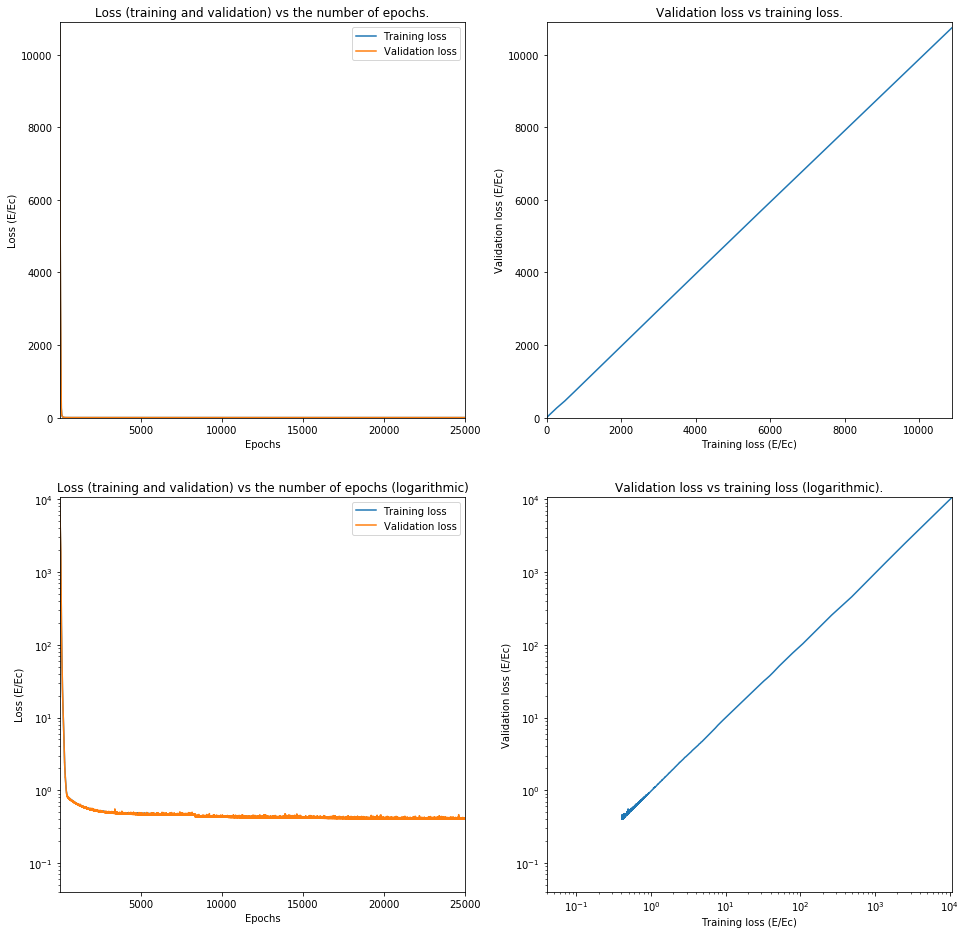

In [20]:
name = 'DenseLayerSmallSoftplus'
settingsNetwork = [inputSize, ['Dense', inputSize, 'softplus', True], ['Dense', 1, 'linear', True]]
learningRate = 2.5*10**-6
callbacksNetwork = [keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=500, min_delta=0)]

model, fitDetails = testNetwork(trainingInput, settingsNetwork, learningRate, kernalInitializer='he_uniform', lossFunction=MAE, validationSplit=0.2, epochs=25000, verbose=1, callbacksNetwork=callbacksNetwork, sampleSize=2)
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=0)
models.append({'model':model, 'name':str(prefixName) + name, 'evaluation':evaluation, 'history':history})
prefixName = prefixName + 1

10001/10001 [==============================] - 0s 8us/step
0.44066528887012557


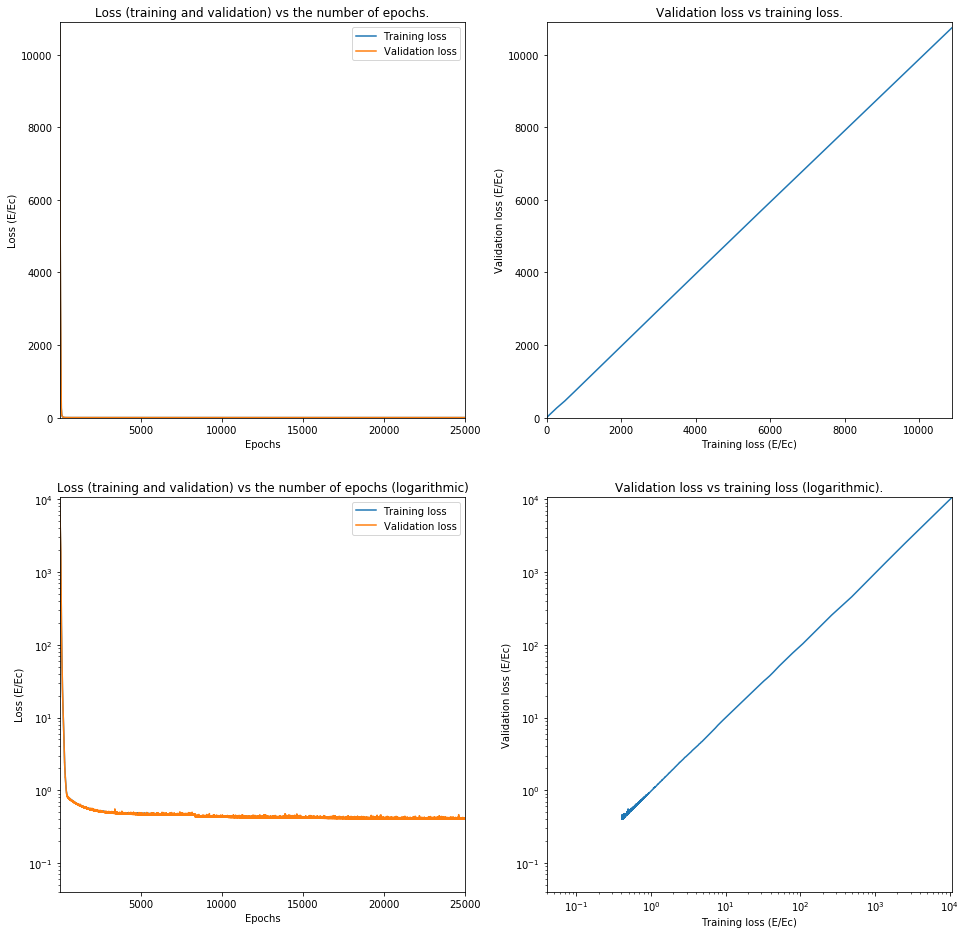

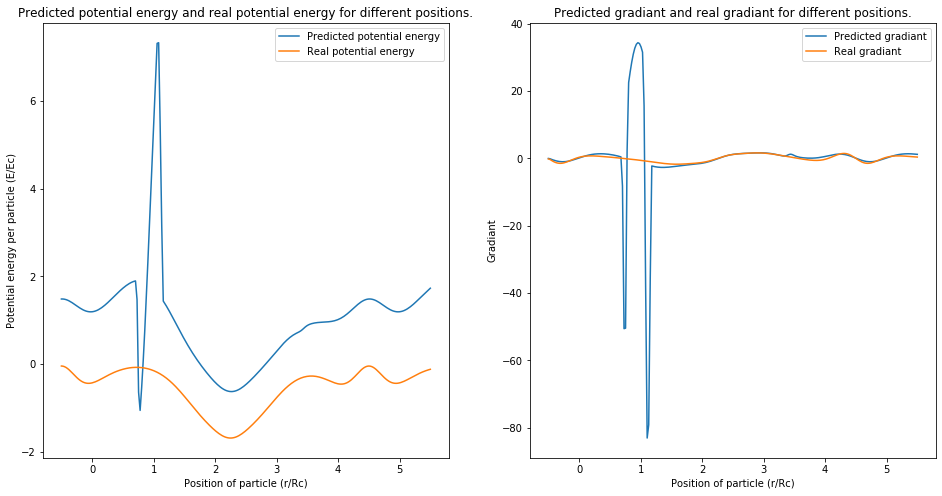

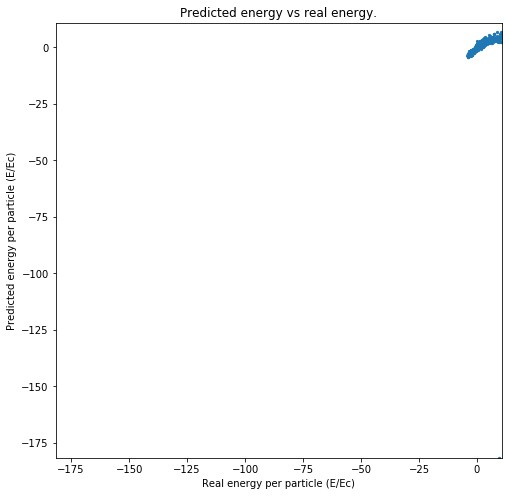

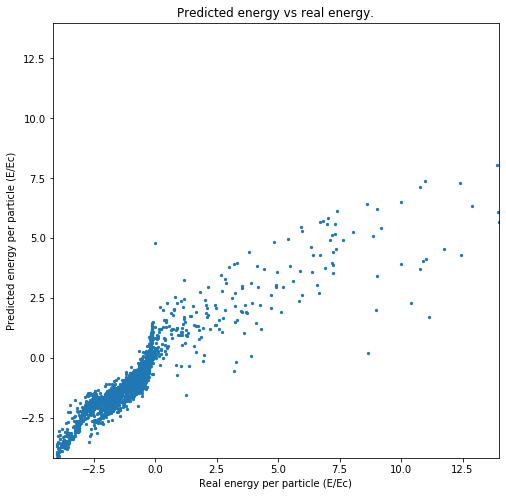

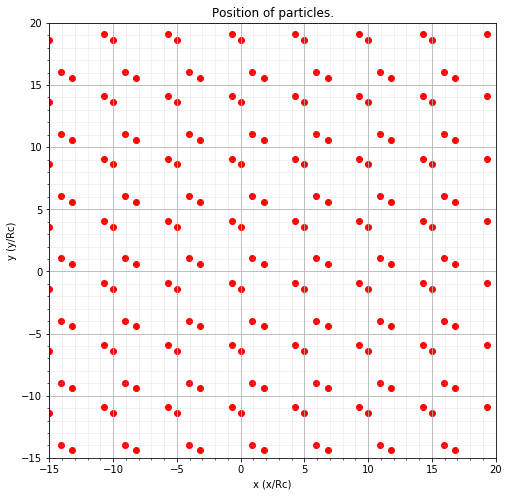

For index 35150 Predicted 0.9446459 was 0.0917311388


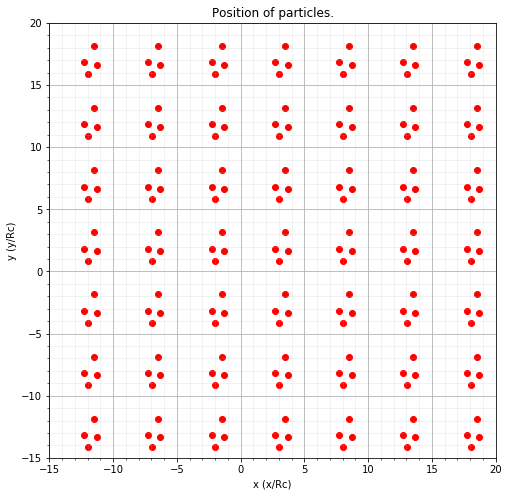

For index 5594 Predicted -1.5757551 was -1.6517595810999999


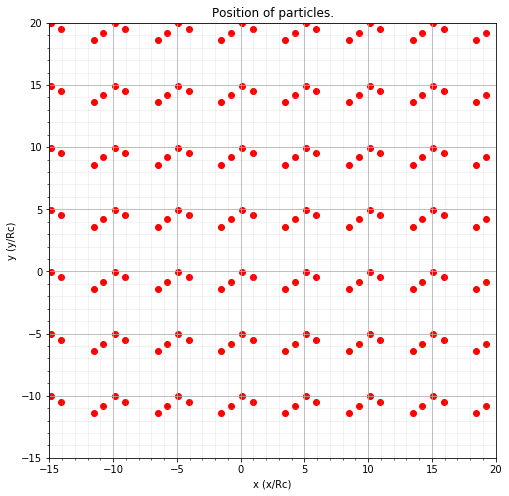

For index 35094 Predicted -1.2885084 was -0.5995037048


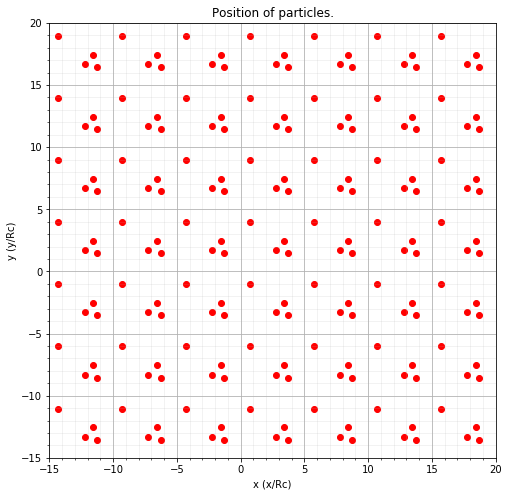

For index 32387 Predicted -1.1009169 was -1.3119011394


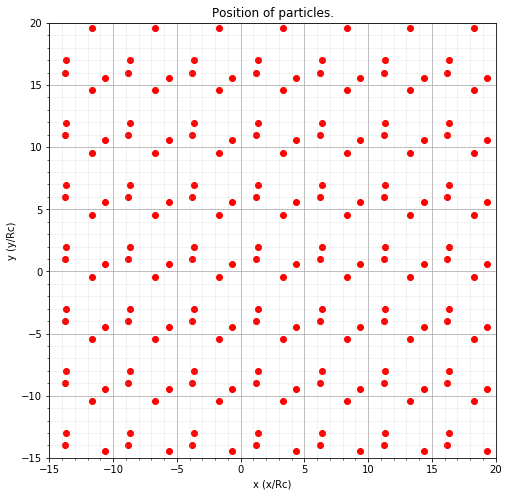

For index 47739 Predicted 1.1412401 was -0.1329984582


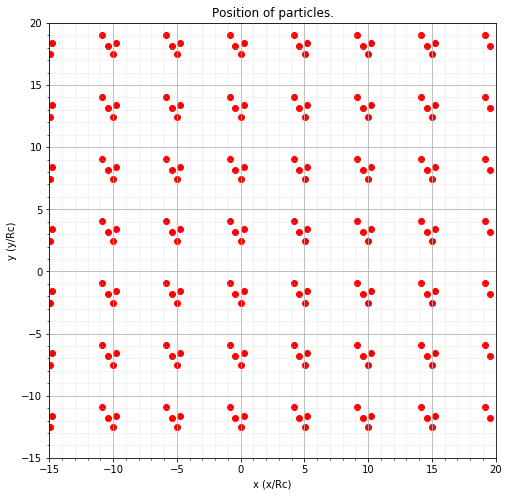

For index 14214 Predicted 2.6404772 was 10.6994877623


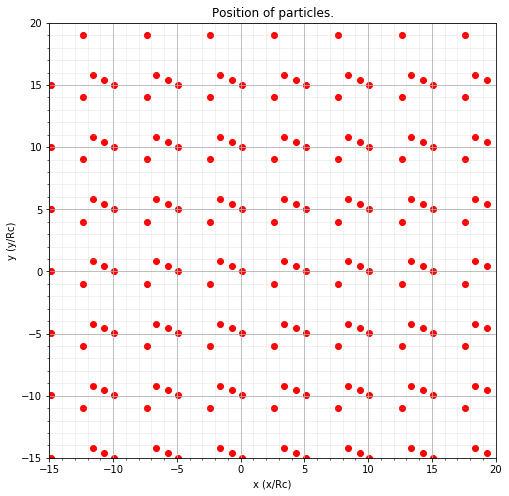

For index 48737 Predicted -0.18580152 was -0.2818949568


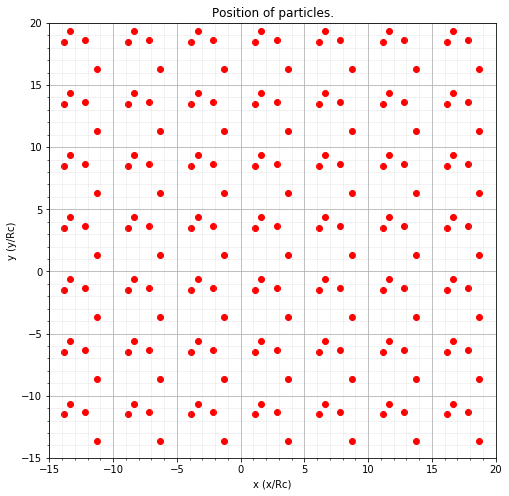

For index 11870 Predicted 0.099026665 was -0.3581852659


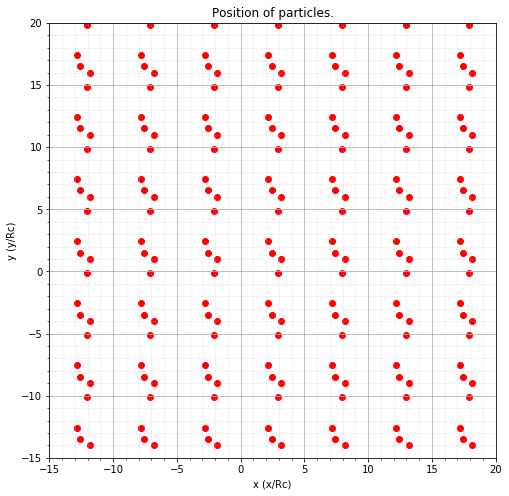

For index 41091 Predicted -0.8426008 was -0.9637761914


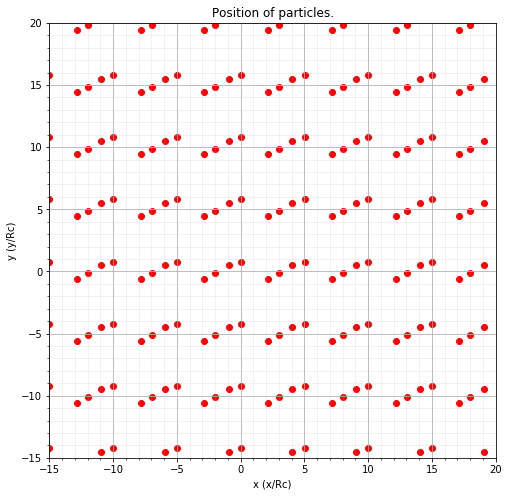

For index 46464 Predicted -1.1894789 was -0.4692183365


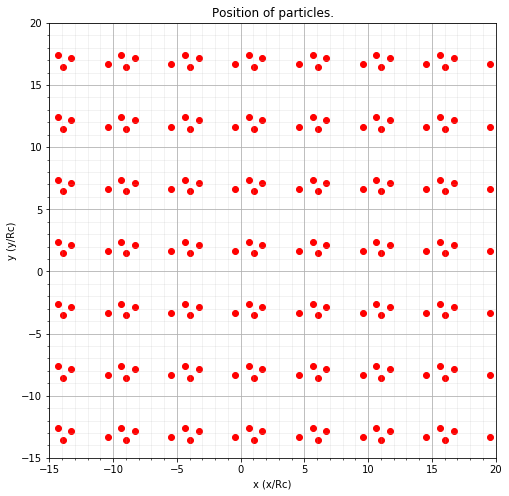

For index 6073 Predicted -1.7331038 was -1.6670038984
Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_9 (Dense)              (None, 8)                 72        
_________________________________________________________________
dense_10 (Dense)             (None, 1)                 9         
Total params: 81
Trainable params: 81
Non-trainable params: 0
_________________________________________________________________
Layer 0:  [array([[-0.46704128, -0.11426546, -0.43824694, -0.14870691, -0.6816491 ,
        -0.31130862,  0.41340202, -1.1133853 ],
       [-0.32791805, -0.01749747,  0.26132625,  0.07481056, -0.299412  ,
         0.30993608, -0.18087342, -0.29292652],
       [ 0.36768085, -1.410076  , -0.6710268 , -0.04690856,  1.3329544 ,
         0.36544806,  0.69158405, -0.36230016],
       [ 0.07512028,  1.0054969 ,  0.07331084, -0.8308323 , -0.2927008 ,
         0.5253436 

In [21]:
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=1)
print(evaluation)
history = plotHistory(fitDetails)

makeGradiantPlot(model, x, testData)

makePredictionPlot(model, validationData)
makePredictionPlot(model, trainingData)

for i in validationPlots:
    plotAndPredict(model, validationData, i)

model.summary()
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())

## Model 2: 1 Dense layer medium softplus

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_11 (Dense)             (None, 16)                144       
_________________________________________________________________
dense_12 (Dense)             (None, 1)                 17        
Total params: 161
Trainable params: 161
Non-trainable params: 0
_________________________________________________________________
40003/40003 [==============================] - 0s 9us/step
9351.407422788017
Layer 0:  [array([[-0.02706492,  0.53402454, -0.32075286,  0.0732075 ,  0.8226498 ,
        -0.69171834, -0.46272033, -0.32701612,  0.7463322 ,  0.8233102 ,
         0.761316  , -0.32283187, -0.76853067,  0.7758933 ,  0.8456183 ,
         0.43383318],
       [ 0.6609449 , -0.5703341 , -0.32247835, -0.3252976 ,  0.01070124,
        -0.7305231 , -0.16155261,  0.12027919,  0.6749373 ,  0.674066  ,
         0.52481836,  0.62159365,  0.271499

Epoch 45/25000
32002/32002 [==============================] - 1s 24us/step - loss: 163.3655 - val_loss: 160.3182
Epoch 46/25000
32002/32002 [==============================] - 1s 24us/step - loss: 161.0067 - val_loss: 158.1009
Epoch 47/25000
32002/32002 [==============================] - 1s 26us/step - loss: 159.0239 - val_loss: 156.1763
Epoch 48/25000
32002/32002 [==============================] - 1s 25us/step - loss: 157.2376 - val_loss: 154.6575
Epoch 49/25000
32002/32002 [==============================] - 1s 24us/step - loss: 155.7084 - val_loss: 153.1421
Epoch 50/25000
32002/32002 [==============================] - 1s 25us/step - loss: 154.2793 - val_loss: 151.7312
Epoch 51/25000
32002/32002 [==============================] - 1s 25us/step - loss: 152.9541 - val_loss: 150.5026
Epoch 52/25000
32002/32002 [==============================] - 1s 24us/step - loss: 151.7643 - val_loss: 149.3440
Epoch 53/25000
32002/32002 [==============================] - 1s 27us/step - loss: 150.6344 - va

32002/32002 [==============================] - 1s 27us/step - loss: 106.2078 - val_loss: 104.7916
Epoch 118/25000
32002/32002 [==============================] - 1s 24us/step - loss: 105.5656 - val_loss: 104.1260
Epoch 119/25000
32002/32002 [==============================] - 1s 25us/step - loss: 104.8862 - val_loss: 103.4903
Epoch 120/25000
32002/32002 [==============================] - 1s 24us/step - loss: 104.2425 - val_loss: 102.8851
Epoch 121/25000
32002/32002 [==============================] - 1s 24us/step - loss: 103.5858 - val_loss: 102.1649
Epoch 122/25000
32002/32002 [==============================] - 1s 25us/step - loss: 102.9227 - val_loss: 101.5892
Epoch 123/25000
32002/32002 [==============================] - 1s 25us/step - loss: 102.2886 - val_loss: 100.9288
Epoch 124/25000
32002/32002 [==============================] - 1s 25us/step - loss: 101.6577 - val_loss: 100.3248
Epoch 125/25000
32002/32002 [==============================] - 1s 24us/step - loss: 101.0132 - val_loss:

32002/32002 [==============================] - 1s 25us/step - loss: 56.1840 - val_loss: 55.1487
Epoch 191/25000
32002/32002 [==============================] - 1s 25us/step - loss: 55.4790 - val_loss: 54.4041
Epoch 192/25000
32002/32002 [==============================] - 1s 26us/step - loss: 54.7563 - val_loss: 53.7085
Epoch 193/25000
32002/32002 [==============================] - 1s 25us/step - loss: 54.0507 - val_loss: 53.0225
Epoch 194/25000
32002/32002 [==============================] - 1s 34us/step - loss: 53.3416 - val_loss: 52.3624
Epoch 195/25000
32002/32002 [==============================] - 1s 23us/step - loss: 52.6458 - val_loss: 51.7026
Epoch 196/25000
32002/32002 [==============================] - 1s 24us/step - loss: 51.9556 - val_loss: 51.0422
Epoch 197/25000
32002/32002 [==============================] - 1s 24us/step - loss: 51.2942 - val_loss: 50.4009
Epoch 198/25000
32002/32002 [==============================] - 1s 23us/step - loss: 50.6296 - val_loss: 49.8688
Epoch 19

32002/32002 [==============================] - 1s 24us/step - loss: 19.1422 - val_loss: 18.6996
Epoch 264/25000
32002/32002 [==============================] - 1s 25us/step - loss: 18.8233 - val_loss: 18.3852
Epoch 265/25000
32002/32002 [==============================] - 1s 24us/step - loss: 18.5018 - val_loss: 18.0669
Epoch 266/25000
32002/32002 [==============================] - 1s 24us/step - loss: 18.1803 - val_loss: 17.7420
Epoch 267/25000
32002/32002 [==============================] - 1s 24us/step - loss: 17.8643 - val_loss: 17.4570
Epoch 268/25000
32002/32002 [==============================] - 1s 23us/step - loss: 17.5634 - val_loss: 17.1243
Epoch 269/25000
32002/32002 [==============================] - 1s 23us/step - loss: 17.2666 - val_loss: 16.8287
Epoch 270/25000
32002/32002 [==============================] - 1s 23us/step - loss: 16.9803 - val_loss: 16.5642
Epoch 271/25000
32002/32002 [==============================] - 1s 24us/step - loss: 16.6962 - val_loss: 16.2751
Epoch 27

32002/32002 [==============================] - 1s 23us/step - loss: 8.5610 - val_loss: 8.3995
Epoch 337/25000
32002/32002 [==============================] - 1s 24us/step - loss: 8.5081 - val_loss: 8.3098
Epoch 338/25000
32002/32002 [==============================] - 1s 23us/step - loss: 8.4503 - val_loss: 8.2726
Epoch 339/25000
32002/32002 [==============================] - 1s 24us/step - loss: 8.4015 - val_loss: 8.2469
Epoch 340/25000
32002/32002 [==============================] - 1s 25us/step - loss: 8.3495 - val_loss: 8.1730
Epoch 341/25000
32002/32002 [==============================] - 1s 25us/step - loss: 8.3027 - val_loss: 8.1395
Epoch 342/25000
32002/32002 [==============================] - 1s 25us/step - loss: 8.2581 - val_loss: 8.1306
Epoch 343/25000
32002/32002 [==============================] - 1s 25us/step - loss: 8.2208 - val_loss: 8.0159
Epoch 344/25000
32002/32002 [==============================] - 1s 24us/step - loss: 8.1777 - val_loss: 7.9881
Epoch 345/25000
32002/3200

32002/32002 [==============================] - 1s 29us/step - loss: 6.9281 - val_loss: 6.7062
Epoch 411/25000
32002/32002 [==============================] - 1s 28us/step - loss: 6.9168 - val_loss: 6.7164
Epoch 412/25000
32002/32002 [==============================] - 1s 24us/step - loss: 6.9071 - val_loss: 6.6783
Epoch 413/25000
32002/32002 [==============================] - 1s 24us/step - loss: 6.8958 - val_loss: 6.6532
Epoch 414/25000
32002/32002 [==============================] - 1s 25us/step - loss: 6.8831 - val_loss: 6.6783
Epoch 415/25000
32002/32002 [==============================] - 1s 25us/step - loss: 6.8825 - val_loss: 6.6644
Epoch 416/25000
32002/32002 [==============================] - 1s 24us/step - loss: 6.8714 - val_loss: 6.6343
Epoch 417/25000
32002/32002 [==============================] - 1s 24us/step - loss: 6.8634 - val_loss: 6.6441
Epoch 418/25000
32002/32002 [==============================] - 1s 24us/step - loss: 6.8579 - val_loss: 6.6418
Epoch 419/25000
32002/3200

32002/32002 [==============================] - 1s 25us/step - loss: 6.4490 - val_loss: 6.2193
Epoch 485/25000
32002/32002 [==============================] - 1s 24us/step - loss: 6.4431 - val_loss: 6.2250
Epoch 486/25000
32002/32002 [==============================] - 1s 25us/step - loss: 6.4339 - val_loss: 6.2138
Epoch 487/25000
32002/32002 [==============================] - 1s 25us/step - loss: 6.4336 - val_loss: 6.2224
Epoch 488/25000
32002/32002 [==============================] - 1s 25us/step - loss: 6.4239 - val_loss: 6.2459
Epoch 489/25000
32002/32002 [==============================] - 1s 26us/step - loss: 6.4194 - val_loss: 6.3034
Epoch 490/25000
32002/32002 [==============================] - 1s 28us/step - loss: 6.4236 - val_loss: 6.1894
Epoch 491/25000
32002/32002 [==============================] - 1s 24us/step - loss: 6.4101 - val_loss: 6.1936
Epoch 492/25000
32002/32002 [==============================] - 1s 26us/step - loss: 6.4062 - val_loss: 6.1848
Epoch 493/25000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 6.1204 - val_loss: 5.9111
Epoch 559/25000
32002/32002 [==============================] - 1s 24us/step - loss: 6.1192 - val_loss: 5.9006
Epoch 560/25000
32002/32002 [==============================] - 1s 24us/step - loss: 6.1163 - val_loss: 5.9446
Epoch 561/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.1130 - val_loss: 5.8957
Epoch 562/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.1072 - val_loss: 5.8840
Epoch 563/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.1059 - val_loss: 5.8804
Epoch 564/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.0975 - val_loss: 5.8864
Epoch 565/25000
32002/32002 [==============================] - 1s 23us/step - loss: 6.0937 - val_loss: 5.8968
Epoch 566/25000
32002/32002 [==============================] - 1s 24us/step - loss: 6.0915 - val_loss: 5.8998
Epoch 567/25000
32002/3200

32002/32002 [==============================] - 1s 24us/step - loss: 5.8490 - val_loss: 5.6382
Epoch 633/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.8467 - val_loss: 5.6385
Epoch 634/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.8432 - val_loss: 5.6293
Epoch 635/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.8408 - val_loss: 5.6218
Epoch 636/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.8376 - val_loss: 5.6288
Epoch 637/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.8339 - val_loss: 5.6330
Epoch 638/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.8244 - val_loss: 5.6109
Epoch 639/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.8254 - val_loss: 5.6473
Epoch 640/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.8218 - val_loss: 5.6586
Epoch 641/25000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 5.6048 - val_loss: 5.3912
Epoch 707/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.6073 - val_loss: 5.5034
Epoch 708/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.6069 - val_loss: 5.4090
Epoch 709/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.5940 - val_loss: 5.3812
Epoch 710/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.5972 - val_loss: 5.3830
Epoch 711/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.5932 - val_loss: 5.4194
Epoch 712/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.5902 - val_loss: 5.3982
Epoch 713/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.5845 - val_loss: 5.3865
Epoch 714/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.5764 - val_loss: 5.3663
Epoch 715/25000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 5.3827 - val_loss: 5.1701
Epoch 781/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.3790 - val_loss: 5.1671
Epoch 782/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.3759 - val_loss: 5.2083
Epoch 783/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.3717 - val_loss: 5.2324
Epoch 784/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.3679 - val_loss: 5.1627
Epoch 785/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.3722 - val_loss: 5.1585
Epoch 786/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.3609 - val_loss: 5.1640
Epoch 787/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.3649 - val_loss: 5.1906
Epoch 788/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.3633 - val_loss: 5.1541
Epoch 789/25000
32002/3200

32002/32002 [==============================] - 1s 22us/step - loss: 5.1736 - val_loss: 4.9744
Epoch 855/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.1684 - val_loss: 4.9957
Epoch 856/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.1647 - val_loss: 4.9571
Epoch 857/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.1583 - val_loss: 4.9562
Epoch 858/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.1620 - val_loss: 4.9610
Epoch 859/25000
32002/32002 [==============================] - 1s 22us/step - loss: 5.1547 - val_loss: 4.9489
Epoch 860/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.1594 - val_loss: 4.9513
Epoch 861/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.1512 - val_loss: 5.0110
Epoch 862/25000
32002/32002 [==============================] - 1s 23us/step - loss: 5.1482 - val_loss: 4.9446
Epoch 863/25000
32002/3200

32002/32002 [==============================] - 1s 22us/step - loss: 4.9668 - val_loss: 4.8022
Epoch 929/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.9645 - val_loss: 4.8539
Epoch 930/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.9603 - val_loss: 4.7970
Epoch 931/25000
32002/32002 [==============================] - 1s 23us/step - loss: 4.9570 - val_loss: 4.7626
Epoch 932/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.9604 - val_loss: 4.7705
Epoch 933/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.9571 - val_loss: 4.7575
Epoch 934/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.9482 - val_loss: 4.7669
Epoch 935/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.9467 - val_loss: 4.7793
Epoch 936/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.9457 - val_loss: 4.7420
Epoch 937/25000
32002/3200

32002/32002 [==============================] - 1s 21us/step - loss: 4.7740 - val_loss: 4.6063
Epoch 1003/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.7689 - val_loss: 4.6122
Epoch 1004/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.7679 - val_loss: 4.5940
Epoch 1005/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.7630 - val_loss: 4.5726
Epoch 1006/25000
32002/32002 [==============================] - 1s 23us/step - loss: 4.7632 - val_loss: 4.6585
Epoch 1007/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.7585 - val_loss: 4.5694
Epoch 1008/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.7526 - val_loss: 4.6016
Epoch 1009/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.7554 - val_loss: 4.5632
Epoch 1010/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.7487 - val_loss: 4.5628
Epoch 1011/25000
3

Epoch 1076/25000
32002/32002 [==============================] - 1s 21us/step - loss: 4.5779 - val_loss: 4.3914
Epoch 1077/25000
32002/32002 [==============================] - 1s 21us/step - loss: 4.5778 - val_loss: 4.4007
Epoch 1078/25000
32002/32002 [==============================] - 1s 21us/step - loss: 4.5726 - val_loss: 4.4189
Epoch 1079/25000
32002/32002 [==============================] - 1s 21us/step - loss: 4.5706 - val_loss: 4.3932
Epoch 1080/25000
32002/32002 [==============================] - 1s 21us/step - loss: 4.5684 - val_loss: 4.3877
Epoch 1081/25000
32002/32002 [==============================] - 1s 21us/step - loss: 4.5665 - val_loss: 4.4691
Epoch 1082/25000
32002/32002 [==============================] - 1s 21us/step - loss: 4.5655 - val_loss: 4.4090
Epoch 1083/25000
32002/32002 [==============================] - 1s 21us/step - loss: 4.5616 - val_loss: 4.3920
Epoch 1084/25000
32002/32002 [==============================] - 1s 21us/step - loss: 4.5605 - val_loss: 4.3950
E

Epoch 1150/25000
32002/32002 [==============================] - 1s 23us/step - loss: 4.3985 - val_loss: 4.2188
Epoch 1151/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.3986 - val_loss: 4.2659
Epoch 1152/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.3948 - val_loss: 4.2148
Epoch 1153/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.3903 - val_loss: 4.2302
Epoch 1154/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.3861 - val_loss: 4.2144
Epoch 1155/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.3869 - val_loss: 4.2066
Epoch 1156/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.3891 - val_loss: 4.2024
Epoch 1157/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.3766 - val_loss: 4.2068
Epoch 1158/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.3815 - val_loss: 4.2000
E

Epoch 1224/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.2250 - val_loss: 4.0578
Epoch 1225/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.2213 - val_loss: 4.0810
Epoch 1226/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.2183 - val_loss: 4.0629
Epoch 1227/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.2193 - val_loss: 4.0419
Epoch 1228/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.2185 - val_loss: 4.0446
Epoch 1229/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.2099 - val_loss: 4.0706
Epoch 1230/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.2116 - val_loss: 4.1074
Epoch 1231/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.2068 - val_loss: 4.0303
Epoch 1232/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.2100 - val_loss: 4.0837
E

Epoch 1298/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.0569 - val_loss: 3.8893
Epoch 1299/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.0545 - val_loss: 3.8837
Epoch 1300/25000
32002/32002 [==============================] - 1s 21us/step - loss: 4.0551 - val_loss: 3.9082
Epoch 1301/25000
32002/32002 [==============================] - 1s 21us/step - loss: 4.0522 - val_loss: 3.9014
Epoch 1302/25000
32002/32002 [==============================] - 1s 21us/step - loss: 4.0469 - val_loss: 3.8753
Epoch 1303/25000
32002/32002 [==============================] - 1s 21us/step - loss: 4.0464 - val_loss: 3.9005
Epoch 1304/25000
32002/32002 [==============================] - 1s 21us/step - loss: 4.0475 - val_loss: 3.9600
Epoch 1305/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.0467 - val_loss: 3.8965
Epoch 1306/25000
32002/32002 [==============================] - 1s 22us/step - loss: 4.0459 - val_loss: 3.8726
E

Epoch 1372/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.8984 - val_loss: 3.7360
Epoch 1373/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.9002 - val_loss: 3.7289
Epoch 1374/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.8956 - val_loss: 3.7268
Epoch 1375/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.8904 - val_loss: 3.7447
Epoch 1376/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.8895 - val_loss: 3.7372
Epoch 1377/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.8875 - val_loss: 3.7212
Epoch 1378/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.8879 - val_loss: 3.7183
Epoch 1379/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.8826 - val_loss: 3.7476
Epoch 1380/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.8761 - val_loss: 3.7114
E

32002/32002 [==============================] - 1s 21us/step - loss: 3.7448 - val_loss: 3.5850
Epoch 1446/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.7455 - val_loss: 3.5766
Epoch 1447/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.7405 - val_loss: 3.5812
Epoch 1448/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.7378 - val_loss: 3.5732
Epoch 1449/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.7383 - val_loss: 3.5807
Epoch 1450/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.7342 - val_loss: 3.7178
Epoch 1451/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.7316 - val_loss: 3.5766
Epoch 1452/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.7337 - val_loss: 3.6395
Epoch 1453/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.7273 - val_loss: 3.5712
Epoch 1454/25000
3

Epoch 1519/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.5971 - val_loss: 3.4379
Epoch 1520/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.5900 - val_loss: 3.4697
Epoch 1521/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.5938 - val_loss: 3.4366
Epoch 1522/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.5903 - val_loss: 3.4258
Epoch 1523/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.5863 - val_loss: 3.4426
Epoch 1524/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.5882 - val_loss: 3.4341
Epoch 1525/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.5946 - val_loss: 3.4246
Epoch 1526/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.5825 - val_loss: 3.5064
Epoch 1527/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.5773 - val_loss: 3.4769
E

Epoch 1593/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.4487 - val_loss: 3.3157
Epoch 1594/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.4462 - val_loss: 3.2874
Epoch 1595/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.4462 - val_loss: 3.2942
Epoch 1596/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.4447 - val_loss: 3.2987
Epoch 1597/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.4441 - val_loss: 3.2842
Epoch 1598/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.4451 - val_loss: 3.2779
Epoch 1599/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.4389 - val_loss: 3.2874
Epoch 1600/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.4349 - val_loss: 3.2766
Epoch 1601/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.4359 - val_loss: 3.2724
E

Epoch 1667/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.3025 - val_loss: 3.1635
Epoch 1668/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.3072 - val_loss: 3.1480
Epoch 1669/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.3026 - val_loss: 3.1447
Epoch 1670/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.3053 - val_loss: 3.1487
Epoch 1671/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.3004 - val_loss: 3.1364
Epoch 1672/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.2970 - val_loss: 3.1490
Epoch 1673/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.2979 - val_loss: 3.1353
Epoch 1674/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.2924 - val_loss: 3.1410
Epoch 1675/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.2971 - val_loss: 3.1404
E

Epoch 1741/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.1636 - val_loss: 3.0434
Epoch 1742/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.1644 - val_loss: 3.0065
Epoch 1743/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.1662 - val_loss: 3.0903
Epoch 1744/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.1688 - val_loss: 3.0749
Epoch 1745/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.1644 - val_loss: 3.0007
Epoch 1746/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.1539 - val_loss: 2.9997
Epoch 1747/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.1562 - val_loss: 3.0208
Epoch 1748/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.1518 - val_loss: 3.0176
Epoch 1749/25000
32002/32002 [==============================] - 1s 21us/step - loss: 3.1550 - val_loss: 2.9920
E

32002/32002 [==============================] - 1s 22us/step - loss: 3.0312 - val_loss: 2.8772
Epoch 1815/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.0228 - val_loss: 2.8941
Epoch 1816/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.0256 - val_loss: 2.8962
Epoch 1817/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.0217 - val_loss: 2.8738
Epoch 1818/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.0178 - val_loss: 2.9243
Epoch 1819/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.0225 - val_loss: 2.8827
Epoch 1820/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.0154 - val_loss: 2.8634
Epoch 1821/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.0171 - val_loss: 2.8656
Epoch 1822/25000
32002/32002 [==============================] - 1s 22us/step - loss: 3.0195 - val_loss: 2.8614
Epoch 1823/25000
3

Epoch 1888/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.8912 - val_loss: 2.8319
Epoch 1889/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.8946 - val_loss: 2.7539
Epoch 1890/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.8901 - val_loss: 2.7381
Epoch 1891/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.8876 - val_loss: 2.7433
Epoch 1892/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.8893 - val_loss: 2.7354
Epoch 1893/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.8862 - val_loss: 2.8070
Epoch 1894/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.8833 - val_loss: 2.7417
Epoch 1895/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.8823 - val_loss: 2.7294
Epoch 1896/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.8840 - val_loss: 2.7438
E

Epoch 1962/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.7583 - val_loss: 2.6182
Epoch 1963/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.7550 - val_loss: 2.6265
Epoch 1964/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.7558 - val_loss: 2.6165
Epoch 1965/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.7511 - val_loss: 2.6209
Epoch 1966/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.7496 - val_loss: 2.6618
Epoch 1967/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.7474 - val_loss: 2.6065
Epoch 1968/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.7493 - val_loss: 2.6154
Epoch 1969/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.7439 - val_loss: 2.6189
Epoch 1970/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.7441 - val_loss: 2.5982
E

Epoch 2036/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.6244 - val_loss: 2.4888
Epoch 2037/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.6224 - val_loss: 2.5054
Epoch 2038/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.6241 - val_loss: 2.4903
Epoch 2039/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.6237 - val_loss: 2.4824
Epoch 2040/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.6236 - val_loss: 2.4809
Epoch 2041/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.6154 - val_loss: 2.5221
Epoch 2042/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.6161 - val_loss: 2.5411
Epoch 2043/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.6100 - val_loss: 2.5011
Epoch 2044/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.6155 - val_loss: 2.5442
E

Epoch 2110/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.4980 - val_loss: 2.4091
Epoch 2111/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.4950 - val_loss: 2.3674
Epoch 2112/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.4888 - val_loss: 2.3865
Epoch 2113/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.4896 - val_loss: 2.3598
Epoch 2114/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.4867 - val_loss: 2.3531
Epoch 2115/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.4884 - val_loss: 2.3728
Epoch 2116/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.4915 - val_loss: 2.3544
Epoch 2117/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.4847 - val_loss: 2.3621
Epoch 2118/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.4807 - val_loss: 2.3497
E

Epoch 2184/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.3693 - val_loss: 2.2333
Epoch 2185/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.3687 - val_loss: 2.2553
Epoch 2186/25000
32002/32002 [==============================] - 1s 22us/step - loss: 2.3635 - val_loss: 2.2629
Epoch 2187/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.3572 - val_loss: 2.2649
Epoch 2188/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.3610 - val_loss: 2.2633
Epoch 2189/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.3583 - val_loss: 2.2287
Epoch 2190/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.3544 - val_loss: 2.2346
Epoch 2191/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.3597 - val_loss: 2.2242
Epoch 2192/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.3533 - val_loss: 2.2468
E

Epoch 2258/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.2421 - val_loss: 2.1123
Epoch 2259/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.2362 - val_loss: 2.1147
Epoch 2260/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.2423 - val_loss: 2.1064
Epoch 2261/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.2344 - val_loss: 2.1029
Epoch 2262/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.2370 - val_loss: 2.1290
Epoch 2263/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.2332 - val_loss: 2.1040
Epoch 2264/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.2335 - val_loss: 2.1000
Epoch 2265/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.2292 - val_loss: 2.1112
Epoch 2266/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.2275 - val_loss: 2.1947
E

32002/32002 [==============================] - 1s 21us/step - loss: 2.1239 - val_loss: 1.9994
Epoch 2332/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.1167 - val_loss: 2.2220
Epoch 2333/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.1159 - val_loss: 1.9962
Epoch 2334/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.1153 - val_loss: 2.0130
Epoch 2335/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.1126 - val_loss: 1.9887
Epoch 2336/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.1119 - val_loss: 1.9864
Epoch 2337/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.1133 - val_loss: 1.9811
Epoch 2338/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.1068 - val_loss: 1.9933
Epoch 2339/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.1059 - val_loss: 2.0298
Epoch 2340/25000
3

Epoch 2405/25000
32002/32002 [==============================] - 1s 21us/step - loss: 2.0008 - val_loss: 1.8851
Epoch 2406/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.9986 - val_loss: 1.9303
Epoch 2407/25000
32002/32002 [==============================] - 1s 21us/step - loss: 1.9992 - val_loss: 1.9366
Epoch 2408/25000
32002/32002 [==============================] - 1s 21us/step - loss: 1.9956 - val_loss: 1.8727
Epoch 2409/25000
32002/32002 [==============================] - 1s 21us/step - loss: 1.9946 - val_loss: 1.8678
Epoch 2410/25000
32002/32002 [==============================] - 1s 21us/step - loss: 1.9924 - val_loss: 1.8789
Epoch 2411/25000
32002/32002 [==============================] - ETA: 0s - loss: 1.974 - 1s 21us/step - loss: 1.9878 - val_loss: 1.8680
Epoch 2412/25000
32002/32002 [==============================] - 1s 21us/step - loss: 1.9911 - val_loss: 1.8981
Epoch 2413/25000
32002/32002 [==============================] - 1s 21us/step - loss: 1.9

32002/32002 [==============================] - 1s 22us/step - loss: 1.8827 - val_loss: 1.8276
Epoch 2479/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.8787 - val_loss: 1.7602
Epoch 2480/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.8776 - val_loss: 1.7933
Epoch 2481/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.8746 - val_loss: 1.8400
Epoch 2482/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.8766 - val_loss: 1.7611
Epoch 2483/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.8761 - val_loss: 1.8034
Epoch 2484/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.8744 - val_loss: 1.7570
Epoch 2485/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.8743 - val_loss: 1.8000
Epoch 2486/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.8726 - val_loss: 1.7726
Epoch 2487/25000
3

Epoch 2552/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.7638 - val_loss: 1.6469
Epoch 2553/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.7660 - val_loss: 1.7365
Epoch 2554/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.7653 - val_loss: 1.6949
Epoch 2555/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.7584 - val_loss: 1.7652
Epoch 2556/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.7584 - val_loss: 1.6463
Epoch 2557/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.7520 - val_loss: 1.6545
Epoch 2558/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.7533 - val_loss: 1.7132
Epoch 2559/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.7559 - val_loss: 1.6399
Epoch 2560/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.7519 - val_loss: 1.6369
E

Epoch 2626/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.6514 - val_loss: 1.5408
Epoch 2627/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.6443 - val_loss: 1.5449
Epoch 2628/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.6475 - val_loss: 1.5625
Epoch 2629/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.6445 - val_loss: 1.5519
Epoch 2630/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.6416 - val_loss: 1.5379
Epoch 2631/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.6390 - val_loss: 1.6009
Epoch 2632/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.6418 - val_loss: 1.5410
Epoch 2633/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.6367 - val_loss: 1.5361
Epoch 2634/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.6416 - val_loss: 1.5406
E

Epoch 2700/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.5321 - val_loss: 1.4637
Epoch 2701/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.5392 - val_loss: 1.4687
Epoch 2702/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.5295 - val_loss: 1.4685
Epoch 2703/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.5312 - val_loss: 1.4249
Epoch 2704/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.5276 - val_loss: 1.4261
Epoch 2705/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.5249 - val_loss: 1.4267
Epoch 2706/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.5225 - val_loss: 1.4205
Epoch 2707/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.5276 - val_loss: 1.4333
Epoch 2708/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.5241 - val_loss: 1.4332
E

Epoch 2774/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.4310 - val_loss: 1.3625
Epoch 2775/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.4221 - val_loss: 1.3220
Epoch 2776/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.4181 - val_loss: 1.3335
Epoch 2777/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.4182 - val_loss: 1.3614
Epoch 2778/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.4173 - val_loss: 1.3186
Epoch 2779/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.4249 - val_loss: 1.3312
Epoch 2780/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.4163 - val_loss: 1.3192
Epoch 2781/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.4120 - val_loss: 1.4103
Epoch 2782/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.4123 - val_loss: 1.3188
E

Epoch 2848/25000
32002/32002 [==============================] - 1s 24us/step - loss: 1.3167 - val_loss: 1.2285
Epoch 2849/25000
32002/32002 [==============================] - 1s 29us/step - loss: 1.3176 - val_loss: 1.2218
Epoch 2850/25000
32002/32002 [==============================] - 1s 26us/step - loss: 1.3164 - val_loss: 1.3439
Epoch 2851/25000
32002/32002 [==============================] - 1s 24us/step - loss: 1.3156 - val_loss: 1.2571
Epoch 2852/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3106 - val_loss: 1.2690
Epoch 2853/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3139 - val_loss: 1.2230
Epoch 2854/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3092 - val_loss: 1.2686
Epoch 2855/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3091 - val_loss: 1.2161
Epoch 2856/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3071 - val_loss: 1.2091
E

Epoch 2922/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.2156 - val_loss: 1.1321
Epoch 2923/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.2183 - val_loss: 1.1234
Epoch 2924/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.2123 - val_loss: 1.1228
Epoch 2925/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.2113 - val_loss: 1.1362
Epoch 2926/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.2101 - val_loss: 1.1178
Epoch 2927/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.2122 - val_loss: 1.1437
Epoch 2928/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.2116 - val_loss: 1.1336
Epoch 2929/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.2028 - val_loss: 1.2408
Epoch 2930/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.2055 - val_loss: 1.1447
E

Epoch 2996/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.1195 - val_loss: 1.0253
Epoch 2997/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.1141 - val_loss: 1.0930
Epoch 2998/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.1146 - val_loss: 1.0294
Epoch 2999/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.1094 - val_loss: 1.0785
Epoch 3000/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.1137 - val_loss: 1.0896
Epoch 3001/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.1082 - val_loss: 1.0474
Epoch 3002/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.1047 - val_loss: 1.0177
Epoch 3003/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.1076 - val_loss: 1.1161
Epoch 3004/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.1062 - val_loss: 1.0162
E

Epoch 3070/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.0275 - val_loss: 1.0464
Epoch 3071/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.0192 - val_loss: 0.9341
Epoch 3072/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.0176 - val_loss: 1.0121
Epoch 3073/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.0215 - val_loss: 0.9282
Epoch 3074/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.0190 - val_loss: 0.9968
Epoch 3075/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.0136 - val_loss: 0.9715
Epoch 3076/25000
32002/32002 [==============================] - 1s 22us/step - loss: 1.0148 - val_loss: 1.0847
Epoch 3077/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.0105 - val_loss: 0.9372
Epoch 3078/25000
32002/32002 [==============================] - 1s 23us/step - loss: 1.0141 - val_loss: 0.9662
E

Epoch 3144/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9300 - val_loss: 0.8622
Epoch 3145/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9293 - val_loss: 0.8571
Epoch 3146/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9287 - val_loss: 0.9200
Epoch 3147/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9258 - val_loss: 0.8938
Epoch 3148/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.9276 - val_loss: 0.8851
Epoch 3149/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9250 - val_loss: 0.8493
Epoch 3150/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9219 - val_loss: 0.8469
Epoch 3151/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9206 - val_loss: 0.8419
Epoch 3152/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9203 - val_loss: 1.0723
E

Epoch 3218/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8490 - val_loss: 0.7765
Epoch 3219/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8454 - val_loss: 0.7678
Epoch 3220/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8456 - val_loss: 0.8123
Epoch 3221/25000
32002/32002 [==============================] - 1s 31us/step - loss: 0.8438 - val_loss: 0.7743
Epoch 3222/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.8439 - val_loss: 0.8329
Epoch 3223/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8432 - val_loss: 0.7703
Epoch 3224/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8414 - val_loss: 0.8790
Epoch 3225/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.8411 - val_loss: 0.7584
Epoch 3226/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8421 - val_loss: 0.7667
E

Epoch 3292/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.7721 - val_loss: 0.7142
Epoch 3293/25000
32002/32002 [==============================] - 1s 31us/step - loss: 0.7696 - val_loss: 0.8470
Epoch 3294/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.7733 - val_loss: 0.7045
Epoch 3295/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.7683 - val_loss: 0.6914
Epoch 3296/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.7671 - val_loss: 0.7001
Epoch 3297/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.7671 - val_loss: 0.7202
Epoch 3298/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.7628 - val_loss: 0.7074
Epoch 3299/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.7653 - val_loss: 0.7284
Epoch 3300/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.7625 - val_loss: 0.7261
E

Epoch 3366/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7024 - val_loss: 0.6569
Epoch 3367/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7033 - val_loss: 0.6341
Epoch 3368/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7043 - val_loss: 0.6493
Epoch 3369/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7001 - val_loss: 0.6279
Epoch 3370/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.7020 - val_loss: 0.6309
Epoch 3371/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7010 - val_loss: 0.6972
Epoch 3372/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6980 - val_loss: 0.6490
Epoch 3373/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6985 - val_loss: 0.6369
Epoch 3374/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6953 - val_loss: 0.6480
E

Epoch 3440/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6492 - val_loss: 0.6196
Epoch 3441/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.6474 - val_loss: 0.5976
Epoch 3442/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.6468 - val_loss: 0.5939
Epoch 3443/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.6466 - val_loss: 0.5853
Epoch 3444/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6459 - val_loss: 0.5988
Epoch 3445/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6468 - val_loss: 0.5812
Epoch 3446/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.6439 - val_loss: 0.5802
Epoch 3447/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.6426 - val_loss: 0.5916
Epoch 3448/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6452 - val_loss: 0.6414
E

Epoch 3514/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6069 - val_loss: 0.5409
Epoch 3515/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6031 - val_loss: 0.5414
Epoch 3516/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6074 - val_loss: 0.5487
Epoch 3517/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6066 - val_loss: 0.7122
Epoch 3518/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6049 - val_loss: 0.5398
Epoch 3519/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6039 - val_loss: 0.5755
Epoch 3520/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6034 - val_loss: 0.5986
Epoch 3521/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6052 - val_loss: 0.5584
Epoch 3522/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6042 - val_loss: 0.5403
E

Epoch 3588/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5796 - val_loss: 0.5793
Epoch 3589/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5790 - val_loss: 0.5158
Epoch 3590/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5793 - val_loss: 0.5217
Epoch 3591/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5788 - val_loss: 0.5184
Epoch 3592/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5755 - val_loss: 0.5341
Epoch 3593/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5776 - val_loss: 0.5395
Epoch 3594/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5775 - val_loss: 0.5439
Epoch 3595/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5766 - val_loss: 0.5910
Epoch 3596/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5755 - val_loss: 0.5148
E

Epoch 3662/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5583 - val_loss: 0.5022
Epoch 3663/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5605 - val_loss: 0.5535
Epoch 3664/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5600 - val_loss: 0.4983
Epoch 3665/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5566 - val_loss: 0.5499
Epoch 3666/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5563 - val_loss: 0.4970
Epoch 3667/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5557 - val_loss: 0.5013
Epoch 3668/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5547 - val_loss: 0.5127
Epoch 3669/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5577 - val_loss: 0.5265
Epoch 3670/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5578 - val_loss: 0.5081
E

Epoch 3736/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5460 - val_loss: 0.5416
Epoch 3737/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5445 - val_loss: 0.4969
Epoch 3738/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5432 - val_loss: 0.5118
Epoch 3739/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5438 - val_loss: 0.4915
Epoch 3740/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5445 - val_loss: 0.5027
Epoch 3741/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5423 - val_loss: 0.5318
Epoch 3742/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5482 - val_loss: 0.4987
Epoch 3743/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5453 - val_loss: 0.4851
Epoch 3744/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5416 - val_loss: 0.5170
E

Epoch 3810/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5352 - val_loss: 0.4770
Epoch 3811/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5341 - val_loss: 0.4858
Epoch 3812/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5349 - val_loss: 0.4831
Epoch 3813/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5318 - val_loss: 0.5174
Epoch 3814/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5378 - val_loss: 0.4766
Epoch 3815/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5330 - val_loss: 0.5271
Epoch 3816/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5363 - val_loss: 0.5287
Epoch 3817/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5334 - val_loss: 0.5125
Epoch 3818/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5361 - val_loss: 0.4949
E

Epoch 3884/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5294 - val_loss: 0.4830
Epoch 3885/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5260 - val_loss: 0.4813
Epoch 3886/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5273 - val_loss: 0.4742
Epoch 3887/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5289 - val_loss: 0.4690
Epoch 3888/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5310 - val_loss: 0.5769
Epoch 3889/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5285 - val_loss: 0.4826
Epoch 3890/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5283 - val_loss: 0.4859
Epoch 3891/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5281 - val_loss: 0.5336
Epoch 3892/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5294 - val_loss: 0.5222
E

Epoch 3958/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5233 - val_loss: 0.4934
Epoch 3959/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5218 - val_loss: 0.4697
Epoch 3960/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5239 - val_loss: 0.4757
Epoch 3961/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5257 - val_loss: 0.5473
Epoch 3962/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5213 - val_loss: 0.4690
Epoch 3963/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5230 - val_loss: 0.4717
Epoch 3964/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5240 - val_loss: 0.4709
Epoch 3965/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5231 - val_loss: 0.5450
Epoch 3966/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5213 - val_loss: 0.4866
E

Epoch 4032/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5239 - val_loss: 0.4663
Epoch 4033/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5195 - val_loss: 0.4956
Epoch 4034/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5218 - val_loss: 0.4731
Epoch 4035/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5215 - val_loss: 0.4846
Epoch 4036/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5198 - val_loss: 0.4773
Epoch 4037/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5205 - val_loss: 0.4681
Epoch 4038/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5206 - val_loss: 0.4925
Epoch 4039/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5191 - val_loss: 0.4618
Epoch 4040/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5168 - val_loss: 0.4678
E

Epoch 4106/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5180 - val_loss: 0.4622
Epoch 4107/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5154 - val_loss: 0.4918
Epoch 4108/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5186 - val_loss: 0.4811
Epoch 4109/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5172 - val_loss: 0.4653
Epoch 4110/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5211 - val_loss: 0.4776
Epoch 4111/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5169 - val_loss: 0.6804
Epoch 4112/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5201 - val_loss: 0.4793
Epoch 4113/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5181 - val_loss: 0.4812
Epoch 4114/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5195 - val_loss: 0.4636
E

32002/32002 [==============================] - 1s 29us/step - loss: 0.5146 - val_loss: 0.4583
Epoch 4180/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5136 - val_loss: 0.4710
Epoch 4181/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5177 - val_loss: 0.4583
Epoch 4182/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5149 - val_loss: 0.4643
Epoch 4183/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5174 - val_loss: 0.5342
Epoch 4184/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5148 - val_loss: 0.4682
Epoch 4185/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5124 - val_loss: 0.4853
Epoch 4186/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5153 - val_loss: 0.4656
Epoch 4187/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5194 - val_loss: 0.5099
Epoch 4188/25000
3

Epoch 4253/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5133 - val_loss: 0.4556
Epoch 4254/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5139 - val_loss: 0.4992
Epoch 4255/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5125 - val_loss: 0.4613
Epoch 4256/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5115 - val_loss: 0.4568
Epoch 4257/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5136 - val_loss: 0.4760
Epoch 4258/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5137 - val_loss: 0.4747
Epoch 4259/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5112 - val_loss: 0.4606
Epoch 4260/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5160 - val_loss: 0.4581
Epoch 4261/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5127 - val_loss: 0.4597
E

Epoch 4327/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5133 - val_loss: 0.4592
Epoch 4328/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5105 - val_loss: 0.4586
Epoch 4329/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5134 - val_loss: 0.4568
Epoch 4330/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5101 - val_loss: 0.4973
Epoch 4331/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5138 - val_loss: 0.5564
Epoch 4332/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5097 - val_loss: 0.4648
Epoch 4333/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5139 - val_loss: 0.4652
Epoch 4334/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5129 - val_loss: 0.4658
Epoch 4335/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5116 - val_loss: 0.5765
E

Epoch 4401/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5128 - val_loss: 0.4839
Epoch 4402/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5112 - val_loss: 0.4721
Epoch 4403/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5112 - val_loss: 0.4538
Epoch 4404/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5134 - val_loss: 0.5563
Epoch 4405/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5106 - val_loss: 0.4894
Epoch 4406/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5126 - val_loss: 0.4587
Epoch 4407/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5112 - val_loss: 0.4543
Epoch 4408/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5109 - val_loss: 0.4554
Epoch 4409/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5102 - val_loss: 0.4596
E

32002/32002 [==============================] - 1s 23us/step - loss: 0.5134 - val_loss: 0.4650
Epoch 4475/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5102 - val_loss: 0.4557
Epoch 4476/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5103 - val_loss: 0.4652
Epoch 4477/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5114 - val_loss: 0.4727
Epoch 4478/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5089 - val_loss: 0.4658
Epoch 4479/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5091 - val_loss: 0.5412
Epoch 4480/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5113 - val_loss: 0.4691
Epoch 4481/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5092 - val_loss: 0.5229
Epoch 4482/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5114 - val_loss: 0.4884
Epoch 4483/25000
3

Epoch 4548/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5082 - val_loss: 0.4710
Epoch 4549/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5078 - val_loss: 0.4583
Epoch 4550/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5144 - val_loss: 0.4526
Epoch 4551/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5093 - val_loss: 0.4548
Epoch 4552/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5086 - val_loss: 0.4621
Epoch 4553/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5084 - val_loss: 0.4558
Epoch 4554/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5082 - val_loss: 0.4758
Epoch 4555/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5116 - val_loss: 0.4688
Epoch 4556/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5121 - val_loss: 0.4533
E

Epoch 4622/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5109 - val_loss: 0.5182
Epoch 4623/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5091 - val_loss: 0.4544
Epoch 4624/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5095 - val_loss: 0.4633
Epoch 4625/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5075 - val_loss: 0.7774
Epoch 4626/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5132 - val_loss: 0.6261
Epoch 4627/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5098 - val_loss: 0.4646
Epoch 4628/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5082 - val_loss: 0.4665
Epoch 4629/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5116 - val_loss: 0.5513
Epoch 4630/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5093 - val_loss: 0.4850
E

Epoch 4696/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5089 - val_loss: 0.4687
Epoch 4697/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5110 - val_loss: 0.4534
Epoch 4698/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5103 - val_loss: 0.4655
Epoch 4699/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5093 - val_loss: 0.4517
Epoch 4700/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5092 - val_loss: 0.4713
Epoch 4701/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5105 - val_loss: 0.4602
Epoch 4702/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5091 - val_loss: 0.4523
Epoch 4703/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5093 - val_loss: 0.4729
Epoch 4704/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5105 - val_loss: 0.4542
E

Epoch 4770/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5078 - val_loss: 0.4549
Epoch 4771/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5070 - val_loss: 0.4715
Epoch 4772/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5099 - val_loss: 0.5362
Epoch 4773/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5075 - val_loss: 0.4755
Epoch 4774/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5088 - val_loss: 0.4585
Epoch 4775/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5082 - val_loss: 0.4777
Epoch 4776/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5071 - val_loss: 0.4555
Epoch 4777/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5085 - val_loss: 0.4545
Epoch 4778/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5095 - val_loss: 0.4847
E

Epoch 4844/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5068 - val_loss: 0.4759
Epoch 4845/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5073 - val_loss: 0.4520
Epoch 4846/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5104 - val_loss: 0.4641
Epoch 4847/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5065 - val_loss: 0.4764
Epoch 4848/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5087 - val_loss: 0.4548
Epoch 4849/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5078 - val_loss: 0.4552
Epoch 4850/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5074 - val_loss: 0.4544
Epoch 4851/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5106 - val_loss: 0.4769
Epoch 4852/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5109 - val_loss: 0.4663
E

Epoch 4918/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5073 - val_loss: 0.5683
Epoch 4919/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5094 - val_loss: 0.4611
Epoch 4920/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5083 - val_loss: 0.4702
Epoch 4921/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5082 - val_loss: 0.4790
Epoch 4922/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5092 - val_loss: 0.4524
Epoch 4923/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5064 - val_loss: 0.4511
Epoch 4924/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5072 - val_loss: 0.4515
Epoch 4925/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5058 - val_loss: 0.4519
Epoch 4926/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5062 - val_loss: 0.4509
E

Epoch 4992/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5056 - val_loss: 0.4588
Epoch 4993/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5072 - val_loss: 0.4789
Epoch 4994/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5047 - val_loss: 0.4620
Epoch 4995/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5092 - val_loss: 0.4567
Epoch 4996/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5103 - val_loss: 0.4556
Epoch 4997/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5073 - val_loss: 0.4804
Epoch 4998/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5086 - val_loss: 0.4522
Epoch 4999/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5057 - val_loss: 0.4550
Epoch 5000/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5109 - val_loss: 0.4628
E

Epoch 5066/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5110 - val_loss: 0.4601
Epoch 5067/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5077 - val_loss: 0.4582
Epoch 5068/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5056 - val_loss: 0.4575
Epoch 5069/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5095 - val_loss: 0.4701
Epoch 5070/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5068 - val_loss: 0.4896
Epoch 5071/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5071 - val_loss: 0.5474
Epoch 5072/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5097 - val_loss: 0.4553
Epoch 5073/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5085 - val_loss: 0.4602
Epoch 5074/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5085 - val_loss: 0.4579
E

Epoch 5140/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5079 - val_loss: 0.5074
Epoch 5141/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5103 - val_loss: 0.4573
Epoch 5142/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5068 - val_loss: 0.4689
Epoch 5143/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5062 - val_loss: 0.4835
Epoch 5144/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5082 - val_loss: 0.4572
Epoch 5145/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5090 - val_loss: 0.4513
Epoch 5146/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5063 - val_loss: 0.4526
Epoch 5147/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5069 - val_loss: 0.4724
Epoch 5148/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5077 - val_loss: 0.4787
E

Epoch 5214/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5040 - val_loss: 0.4527
Epoch 5215/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5074 - val_loss: 0.4996
Epoch 5216/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5082 - val_loss: 0.5201
Epoch 5217/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5086 - val_loss: 0.4578
Epoch 5218/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5090 - val_loss: 0.4639
Epoch 5219/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5087 - val_loss: 0.4535
Epoch 5220/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5071 - val_loss: 0.5783
Epoch 5221/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5050 - val_loss: 0.4544
Epoch 5222/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5063 - val_loss: 0.4582
E

Epoch 5288/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5049 - val_loss: 0.4967
Epoch 5289/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5060 - val_loss: 0.5625
Epoch 5290/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5076 - val_loss: 0.4546
Epoch 5291/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5082 - val_loss: 0.5568
Epoch 5292/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5073 - val_loss: 0.4546
Epoch 5293/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5078 - val_loss: 0.4603
Epoch 5294/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5076 - val_loss: 0.4514
Epoch 5295/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5069 - val_loss: 0.4762
Epoch 5296/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5053 - val_loss: 0.4547
E

32002/32002 [==============================] - 1s 26us/step - loss: 0.5041 - val_loss: 0.5045
Epoch 5362/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5085 - val_loss: 0.4588
Epoch 5363/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5085 - val_loss: 0.4609
Epoch 5364/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5063 - val_loss: 0.5203
Epoch 5365/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5080 - val_loss: 0.4923
Epoch 5366/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5061 - val_loss: 0.4506
Epoch 5367/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5065 - val_loss: 0.5302
Epoch 5368/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5085 - val_loss: 0.5053
Epoch 5369/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5078 - val_loss: 0.4700
Epoch 5370/25000
3

Epoch 5435/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5058 - val_loss: 0.4510
Epoch 5436/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5086 - val_loss: 0.4872
Epoch 5437/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5065 - val_loss: 0.4547
Epoch 5438/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5056 - val_loss: 0.4678
Epoch 5439/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5077 - val_loss: 0.4574
Epoch 5440/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5057 - val_loss: 0.5154
Epoch 5441/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5093 - val_loss: 0.4575
Epoch 5442/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5040 - val_loss: 0.4552
Epoch 5443/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5034 - val_loss: 0.4522
E

Epoch 5509/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5063 - val_loss: 0.4735
Epoch 5510/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5071 - val_loss: 0.4497
Epoch 5511/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5055 - val_loss: 0.4556
Epoch 5512/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5031 - val_loss: 0.4521
Epoch 5513/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5064 - val_loss: 0.4571
Epoch 5514/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5058 - val_loss: 0.4702
Epoch 5515/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5049 - val_loss: 0.4610
Epoch 5516/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5051 - val_loss: 0.5537
Epoch 5517/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5089 - val_loss: 0.4630
E

Epoch 5583/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5072 - val_loss: 0.4773
Epoch 5584/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5025 - val_loss: 0.4503
Epoch 5585/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5058 - val_loss: 0.4989
Epoch 5586/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5075 - val_loss: 0.4606
Epoch 5587/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5037 - val_loss: 0.4598
Epoch 5588/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5043 - val_loss: 0.4808
Epoch 5589/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5069 - val_loss: 0.4501
Epoch 5590/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5118 - val_loss: 0.4890
Epoch 5591/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5059 - val_loss: 0.4632
E

Epoch 5657/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5080 - val_loss: 0.4587
Epoch 5658/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5065 - val_loss: 0.4792
Epoch 5659/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5067 - val_loss: 0.4560
Epoch 5660/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5058 - val_loss: 0.4576
Epoch 5661/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5046 - val_loss: 0.4931
Epoch 5662/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5049 - val_loss: 0.4652
Epoch 5663/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5095 - val_loss: 0.4653
Epoch 5664/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5048 - val_loss: 0.4671
Epoch 5665/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5069 - val_loss: 0.4575
E

Epoch 5731/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5045 - val_loss: 0.4517
Epoch 5732/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5058 - val_loss: 0.4899
Epoch 5733/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5040 - val_loss: 0.4504
Epoch 5734/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5065 - val_loss: 0.4766
Epoch 5735/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5052 - val_loss: 0.4543
Epoch 5736/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5025 - val_loss: 0.4500
Epoch 5737/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5036 - val_loss: 0.4501
Epoch 5738/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5057 - val_loss: 0.4745
Epoch 5739/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5069 - val_loss: 0.4525
E

Epoch 5805/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5079 - val_loss: 0.4496
Epoch 5806/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5059 - val_loss: 0.4684
Epoch 5807/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5034 - val_loss: 0.4835
Epoch 5808/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5042 - val_loss: 0.4496
Epoch 5809/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5017 - val_loss: 0.4539
Epoch 5810/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5072 - val_loss: 0.4501
Epoch 5811/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5063 - val_loss: 0.4593
Epoch 5812/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5055 - val_loss: 0.4765
Epoch 5813/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5059 - val_loss: 0.4561
E

Epoch 5879/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5062 - val_loss: 0.4508
Epoch 5880/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5035 - val_loss: 0.4509
Epoch 5881/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5038 - val_loss: 0.4634
Epoch 5882/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5059 - val_loss: 0.4633
Epoch 5883/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5055 - val_loss: 0.4561
Epoch 5884/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5056 - val_loss: 0.4506
Epoch 5885/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5036 - val_loss: 0.4514
Epoch 5886/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5051 - val_loss: 0.4502
Epoch 5887/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5051 - val_loss: 0.4910
E

Epoch 5953/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5045 - val_loss: 0.4523
Epoch 5954/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5061 - val_loss: 0.4555
Epoch 5955/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5048 - val_loss: 0.4862
Epoch 5956/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5037 - val_loss: 0.4700
Epoch 5957/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5070 - val_loss: 0.4521
Epoch 5958/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5056 - val_loss: 0.5321
Epoch 5959/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5056 - val_loss: 0.4768
Epoch 5960/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5066 - val_loss: 0.4669
Epoch 5961/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5052 - val_loss: 0.4560
E

Epoch 6027/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5056 - val_loss: 0.4508
Epoch 6028/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5046 - val_loss: 0.5574
Epoch 6029/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5055 - val_loss: 0.4564
Epoch 6030/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5026 - val_loss: 0.4509
Epoch 6031/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5053 - val_loss: 0.4941
Epoch 6032/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5089 - val_loss: 0.5696
Epoch 6033/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5085 - val_loss: 0.4834
Epoch 6034/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5044 - val_loss: 0.4799
Epoch 6035/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5037 - val_loss: 0.4504
E

Epoch 6101/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5051 - val_loss: 0.4512
Epoch 6102/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5094 - val_loss: 0.4802
Epoch 6103/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5044 - val_loss: 0.4525
Epoch 6104/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5046 - val_loss: 0.4733
Epoch 6105/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5054 - val_loss: 0.4933
Epoch 6106/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5053 - val_loss: 0.4595
Epoch 6107/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5060 - val_loss: 0.4490
Epoch 6108/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5107 - val_loss: 0.4964
Epoch 6109/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.5044 - val_loss: 0.4587
E

Epoch 6175/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5055 - val_loss: 0.4514
Epoch 6176/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5056 - val_loss: 0.4908
Epoch 6177/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5047 - val_loss: 0.4500
Epoch 6178/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5048 - val_loss: 0.4777
Epoch 6179/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5082 - val_loss: 0.4503
Epoch 6180/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5050 - val_loss: 0.4643
Epoch 6181/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5052 - val_loss: 0.4612
Epoch 6182/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5028 - val_loss: 0.4589
Epoch 6183/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5045 - val_loss: 0.4496
E

Epoch 6249/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5048 - val_loss: 0.4500
Epoch 6250/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5032 - val_loss: 0.4674
Epoch 6251/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5063 - val_loss: 0.4600
Epoch 6252/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5036 - val_loss: 0.5450
Epoch 6253/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5050 - val_loss: 0.5624
Epoch 6254/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5056 - val_loss: 0.4560
Epoch 6255/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5025 - val_loss: 0.5084
Epoch 6256/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5038 - val_loss: 0.5225
Epoch 6257/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.5050 - val_loss: 0.4520
E

Epoch 6323/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5066 - val_loss: 0.4503
Epoch 6324/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5025 - val_loss: 0.4516
Epoch 6325/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5041 - val_loss: 0.4578
Epoch 6326/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5059 - val_loss: 0.5085
Epoch 6327/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5061 - val_loss: 0.5239
Epoch 6328/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5037 - val_loss: 0.4520
Epoch 6329/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5033 - val_loss: 0.4629
Epoch 6330/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5043 - val_loss: 0.6340
Epoch 6331/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5066 - val_loss: 0.4600
E

Epoch 6397/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5073 - val_loss: 0.4872
Epoch 6398/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5065 - val_loss: 0.4564
Epoch 6399/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5016 - val_loss: 0.4511
Epoch 6400/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5066 - val_loss: 0.4487
Epoch 6401/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5054 - val_loss: 0.4732
Epoch 6402/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5035 - val_loss: 0.4548
Epoch 6403/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5051 - val_loss: 0.4554
Epoch 6404/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5035 - val_loss: 0.4540
Epoch 6405/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5018 - val_loss: 0.5014
E

Epoch 6471/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5034 - val_loss: 0.4521
Epoch 6472/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5037 - val_loss: 0.4488
Epoch 6473/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5071 - val_loss: 0.4572
Epoch 6474/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5023 - val_loss: 0.4496
Epoch 6475/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5039 - val_loss: 0.5260
Epoch 6476/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5051 - val_loss: 0.4537
Epoch 6477/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5024 - val_loss: 0.5473
Epoch 6478/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5039 - val_loss: 0.5232
Epoch 6479/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5040 - val_loss: 0.4919
E

Epoch 6545/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5020 - val_loss: 0.4496
Epoch 6546/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5043 - val_loss: 0.4495
Epoch 6547/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5020 - val_loss: 0.4638
Epoch 6548/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5050 - val_loss: 0.4496
Epoch 6549/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5039 - val_loss: 0.4486
Epoch 6550/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.5076 - val_loss: 0.4727
Epoch 6551/25000
32002/32002 [==============================] - 1s 33us/step - loss: 0.5003 - val_loss: 0.4563
Epoch 6552/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5024 - val_loss: 0.4482
Epoch 6553/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5024 - val_loss: 0.4584
E

Epoch 6619/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5033 - val_loss: 0.5324
Epoch 6620/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5059 - val_loss: 0.4655
Epoch 6621/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5006 - val_loss: 0.4621
Epoch 6622/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5031 - val_loss: 0.4541
Epoch 6623/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5049 - val_loss: 0.4626
Epoch 6624/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5058 - val_loss: 0.4493
Epoch 6625/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5061 - val_loss: 0.4507
Epoch 6626/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5014 - val_loss: 0.5525
Epoch 6627/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5064 - val_loss: 0.4533
E

Epoch 6693/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5052 - val_loss: 0.4478
Epoch 6694/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5045 - val_loss: 0.4494
Epoch 6695/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5031 - val_loss: 0.5471
Epoch 6696/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5022 - val_loss: 0.4537
Epoch 6697/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5043 - val_loss: 0.4568
Epoch 6698/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5020 - val_loss: 0.4679
Epoch 6699/25000
32002/32002 [==============================] - 1s 32us/step - loss: 0.5062 - val_loss: 0.4736
Epoch 6700/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5069 - val_loss: 0.4929
Epoch 6701/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5019 - val_loss: 0.4890
E

Epoch 6767/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5058 - val_loss: 0.4592
Epoch 6768/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5031 - val_loss: 0.4581
Epoch 6769/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5012 - val_loss: 0.4503
Epoch 6770/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5049 - val_loss: 0.4548
Epoch 6771/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5007 - val_loss: 0.4561
Epoch 6772/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5013 - val_loss: 0.4612
Epoch 6773/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5045 - val_loss: 0.4960
Epoch 6774/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5031 - val_loss: 0.4602
Epoch 6775/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5028 - val_loss: 0.4646
E

Epoch 6841/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5047 - val_loss: 0.4520
Epoch 6842/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5037 - val_loss: 0.4542
Epoch 6843/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5036 - val_loss: 0.4948
Epoch 6844/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5042 - val_loss: 0.4682
Epoch 6845/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5016 - val_loss: 0.5905
Epoch 6846/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5061 - val_loss: 0.4517
Epoch 6847/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5058 - val_loss: 0.4664
Epoch 6848/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5013 - val_loss: 0.5136
Epoch 6849/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5031 - val_loss: 0.4503
E

Epoch 6915/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5048 - val_loss: 0.4537
Epoch 6916/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5036 - val_loss: 0.4485
Epoch 6917/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5050 - val_loss: 0.5185
Epoch 6918/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5015 - val_loss: 0.4968
Epoch 6919/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5021 - val_loss: 0.4510
Epoch 6920/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5026 - val_loss: 0.5258
Epoch 6921/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5055 - val_loss: 0.4905
Epoch 6922/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5030 - val_loss: 0.4604
Epoch 6923/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5024 - val_loss: 0.4485
E

Epoch 6989/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5045 - val_loss: 0.4827
Epoch 6990/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5036 - val_loss: 0.4891
Epoch 6991/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5029 - val_loss: 0.4612
Epoch 6992/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5020 - val_loss: 0.4934
Epoch 6993/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5045 - val_loss: 0.4491
Epoch 6994/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5017 - val_loss: 0.4743
Epoch 6995/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5043 - val_loss: 0.4494
Epoch 6996/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5034 - val_loss: 0.4652
Epoch 6997/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5024 - val_loss: 0.4892
E

Epoch 7063/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5063 - val_loss: 0.5185
Epoch 7064/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5028 - val_loss: 0.4743
Epoch 7065/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5017 - val_loss: 0.4481
Epoch 7066/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5027 - val_loss: 0.4580
Epoch 7067/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5033 - val_loss: 0.4739
Epoch 7068/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5022 - val_loss: 0.4479
Epoch 7069/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5037 - val_loss: 0.4516
Epoch 7070/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5010 - val_loss: 0.4717
Epoch 7071/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5059 - val_loss: 0.4594
E

Epoch 7137/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5021 - val_loss: 0.4552
Epoch 7138/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5017 - val_loss: 0.4926
Epoch 7139/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5003 - val_loss: 0.5765
Epoch 7140/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5032 - val_loss: 0.4475
Epoch 7141/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5033 - val_loss: 0.5654
Epoch 7142/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5056 - val_loss: 0.4477
Epoch 7143/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5015 - val_loss: 0.4728
Epoch 7144/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5068 - val_loss: 0.4507
Epoch 7145/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5074 - val_loss: 0.4553
E

Epoch 7211/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5007 - val_loss: 0.4537
Epoch 7212/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5029 - val_loss: 0.4509
Epoch 7213/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5027 - val_loss: 0.4471
Epoch 7214/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5021 - val_loss: 0.4788
Epoch 7215/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5034 - val_loss: 0.4973
Epoch 7216/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5042 - val_loss: 0.4541
Epoch 7217/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5015 - val_loss: 0.5265
Epoch 7218/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5042 - val_loss: 0.4484
Epoch 7219/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5017 - val_loss: 0.4956
E

Epoch 7285/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5002 - val_loss: 0.4599
Epoch 7286/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5017 - val_loss: 0.4564
Epoch 7287/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5058 - val_loss: 0.4495
Epoch 7288/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5035 - val_loss: 0.4483
Epoch 7289/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5017 - val_loss: 0.5616
Epoch 7290/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5024 - val_loss: 0.4542
Epoch 7291/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5004 - val_loss: 0.4765
Epoch 7292/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5011 - val_loss: 0.4472
Epoch 7293/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5025 - val_loss: 0.4876
E

Epoch 7359/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5047 - val_loss: 0.4664
Epoch 7360/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5005 - val_loss: 0.4484
Epoch 7361/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5006 - val_loss: 0.4727
Epoch 7362/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5022 - val_loss: 0.5023
Epoch 7363/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5036 - val_loss: 0.4540
Epoch 7364/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5038 - val_loss: 0.5022
Epoch 7365/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5046 - val_loss: 0.4501
Epoch 7366/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5033 - val_loss: 0.4485
Epoch 7367/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5018 - val_loss: 0.4708
E

Epoch 7433/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5032 - val_loss: 0.4951
Epoch 7434/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5031 - val_loss: 0.4545
Epoch 7435/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5023 - val_loss: 0.4700
Epoch 7436/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5025 - val_loss: 0.4811
Epoch 7437/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5019 - val_loss: 0.4504
Epoch 7438/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5023 - val_loss: 0.4529
Epoch 7439/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5013 - val_loss: 0.4578
Epoch 7440/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5009 - val_loss: 0.4619
Epoch 7441/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5035 - val_loss: 0.4646
E

Epoch 7507/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5008 - val_loss: 0.4655
Epoch 7508/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5023 - val_loss: 0.4543
Epoch 7509/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5037 - val_loss: 0.4568
Epoch 7510/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.5054 - val_loss: 0.4479
Epoch 7511/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5008 - val_loss: 0.4560
Epoch 7512/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5040 - val_loss: 0.4542
Epoch 7513/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5004 - val_loss: 0.4501
Epoch 7514/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5022 - val_loss: 0.4564
Epoch 7515/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5042 - val_loss: 0.4648
E

Epoch 7581/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5037 - val_loss: 0.4575
Epoch 7582/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5002 - val_loss: 0.4507
Epoch 7583/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5009 - val_loss: 0.4490
Epoch 7584/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5024 - val_loss: 0.4822
Epoch 7585/25000
32002/32002 [==============================] - 1s 33us/step - loss: 0.5016 - val_loss: 0.4479
Epoch 7586/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5009 - val_loss: 0.4481
Epoch 7587/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5026 - val_loss: 0.4535
Epoch 7588/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5036 - val_loss: 0.4526
Epoch 7589/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5037 - val_loss: 0.4591
E

Epoch 7655/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4997 - val_loss: 0.4482
Epoch 7656/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5058 - val_loss: 0.4497
Epoch 7657/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5004 - val_loss: 0.4537
Epoch 7658/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4992 - val_loss: 0.4691
Epoch 7659/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5024 - val_loss: 0.4479
Epoch 7660/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5030 - val_loss: 0.5483
Epoch 7661/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5017 - val_loss: 0.4727
Epoch 7662/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5008 - val_loss: 0.4599
Epoch 7663/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5039 - val_loss: 0.4556
E

Epoch 7729/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5019 - val_loss: 0.4685
Epoch 7730/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5019 - val_loss: 0.4631
Epoch 7731/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4997 - val_loss: 0.4532
Epoch 7732/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4986 - val_loss: 0.4765
Epoch 7733/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5017 - val_loss: 0.5005
Epoch 7734/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5027 - val_loss: 0.4702
Epoch 7735/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5044 - val_loss: 0.4519
Epoch 7736/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5017 - val_loss: 0.4805
Epoch 7737/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5016 - val_loss: 0.5419
E

Epoch 7803/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4986 - val_loss: 0.4462
Epoch 7804/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4982 - val_loss: 0.4631
Epoch 7805/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5009 - val_loss: 0.4673
Epoch 7806/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5021 - val_loss: 0.5207
Epoch 7807/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5020 - val_loss: 0.4522
Epoch 7808/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5067 - val_loss: 0.4536
Epoch 7809/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4993 - val_loss: 0.5006
Epoch 7810/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5067 - val_loss: 0.4496
Epoch 7811/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4998 - val_loss: 0.4752
E

Epoch 7877/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4978 - val_loss: 0.4471
Epoch 7878/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5002 - val_loss: 0.4765
Epoch 7879/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4986 - val_loss: 0.4498
Epoch 7880/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5028 - val_loss: 0.5637
Epoch 7881/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5007 - val_loss: 0.4537
Epoch 7882/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5019 - val_loss: 0.4502
Epoch 7883/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5015 - val_loss: 0.4707
Epoch 7884/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4994 - val_loss: 0.4848
Epoch 7885/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5001 - val_loss: 0.4718
E

Epoch 7951/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.5032 - val_loss: 0.4504
Epoch 7952/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5006 - val_loss: 0.4538
Epoch 7953/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5045 - val_loss: 0.4471
Epoch 7954/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5020 - val_loss: 0.4764
Epoch 7955/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5015 - val_loss: 0.4570
Epoch 7956/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5045 - val_loss: 0.4542
Epoch 7957/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4989 - val_loss: 0.4468
Epoch 7958/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5005 - val_loss: 0.4619
Epoch 7959/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5002 - val_loss: 0.4604
E

Epoch 8025/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5006 - val_loss: 0.4496
Epoch 8026/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5006 - val_loss: 0.4482
Epoch 8027/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5027 - val_loss: 0.5013
Epoch 8028/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5001 - val_loss: 0.4844
Epoch 8029/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5000 - val_loss: 0.4585
Epoch 8030/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5013 - val_loss: 0.4518
Epoch 8031/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4999 - val_loss: 0.5183
Epoch 8032/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5019 - val_loss: 0.4482
Epoch 8033/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5020 - val_loss: 0.5802
E

Epoch 8099/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4987 - val_loss: 0.4532
Epoch 8100/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4971 - val_loss: 0.4850
Epoch 8101/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5023 - val_loss: 0.4531
Epoch 8102/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4998 - val_loss: 0.4507
Epoch 8103/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5026 - val_loss: 0.4743
Epoch 8104/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5045 - val_loss: 0.4588
Epoch 8105/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5002 - val_loss: 0.4669
Epoch 8106/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5016 - val_loss: 0.4560
Epoch 8107/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4979 - val_loss: 0.4480
E

Epoch 8173/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5007 - val_loss: 0.4489
Epoch 8174/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4991 - val_loss: 0.4924
Epoch 8175/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5040 - val_loss: 0.4483
Epoch 8176/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4974 - val_loss: 0.6179
Epoch 8177/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5025 - val_loss: 0.5773
Epoch 8178/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5017 - val_loss: 0.4608
Epoch 8179/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4997 - val_loss: 0.4695
Epoch 8180/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4994 - val_loss: 0.4457
Epoch 8181/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4991 - val_loss: 0.4568
E

32002/32002 [==============================] - 1s 24us/step - loss: 0.4984 - val_loss: 0.4523
Epoch 8247/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5021 - val_loss: 0.4650
Epoch 8248/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5025 - val_loss: 0.4563
Epoch 8249/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5007 - val_loss: 0.4598
Epoch 8250/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4987 - val_loss: 0.4633
Epoch 8251/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5014 - val_loss: 0.4473
Epoch 8252/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4999 - val_loss: 0.4575
Epoch 8253/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5014 - val_loss: 0.4499
Epoch 8254/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4996 - val_loss: 0.4669
Epoch 8255/25000
3

Epoch 8320/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4992 - val_loss: 0.4466
Epoch 8321/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4988 - val_loss: 0.6698
Epoch 8322/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4997 - val_loss: 0.4479
Epoch 8323/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5016 - val_loss: 0.5162
Epoch 8324/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5015 - val_loss: 0.5127
Epoch 8325/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5028 - val_loss: 0.5418
Epoch 8326/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5017 - val_loss: 0.4531
Epoch 8327/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4985 - val_loss: 0.4467
Epoch 8328/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5001 - val_loss: 0.4697
E

Epoch 8394/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5009 - val_loss: 0.4489
Epoch 8395/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5003 - val_loss: 0.4930
Epoch 8396/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5008 - val_loss: 0.4551
Epoch 8397/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5005 - val_loss: 0.4684
Epoch 8398/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5002 - val_loss: 0.4587
Epoch 8399/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5014 - val_loss: 0.4516
Epoch 8400/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5007 - val_loss: 0.4654
Epoch 8401/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5018 - val_loss: 0.4704
Epoch 8402/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5006 - val_loss: 0.5416
E

Epoch 8468/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4988 - val_loss: 0.4576
Epoch 8469/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5029 - val_loss: 0.4837
Epoch 8470/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4987 - val_loss: 0.5493
Epoch 8471/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5023 - val_loss: 0.4617
Epoch 8472/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5021 - val_loss: 0.4481
Epoch 8473/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5029 - val_loss: 0.4463
Epoch 8474/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5044 - val_loss: 0.4506
Epoch 8475/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4980 - val_loss: 0.4498
Epoch 8476/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5021 - val_loss: 0.4882
E

32002/32002 [==============================] - 1s 23us/step - loss: 0.5028 - val_loss: 0.4829
Epoch 8542/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5008 - val_loss: 0.4741
Epoch 8543/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5002 - val_loss: 0.4507
Epoch 8544/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5007 - val_loss: 0.4857
Epoch 8545/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5004 - val_loss: 0.5049
Epoch 8546/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4998 - val_loss: 0.4730
Epoch 8547/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4989 - val_loss: 0.4841
Epoch 8548/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5024 - val_loss: 0.5118
Epoch 8549/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4992 - val_loss: 0.4470
Epoch 8550/25000
3

32002/32002 [==============================] - 1s 30us/step - loss: 0.4994 - val_loss: 0.4496
Epoch 8615/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.4970 - val_loss: 0.4459
Epoch 8616/25000
32002/32002 [==============================] - 1s 31us/step - loss: 0.4999 - val_loss: 0.4699
Epoch 8617/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5001 - val_loss: 0.4814
Epoch 8618/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5012 - val_loss: 0.4702
Epoch 8619/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4999 - val_loss: 0.4562
Epoch 8620/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5000 - val_loss: 0.4881
Epoch 8621/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4982 - val_loss: 0.5056
Epoch 8622/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5003 - val_loss: 0.4506
Epoch 8623/25000
3

Epoch 8688/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4983 - val_loss: 0.5289
Epoch 8689/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4996 - val_loss: 0.4917
Epoch 8690/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5026 - val_loss: 0.4648
Epoch 8691/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4996 - val_loss: 0.4609
Epoch 8692/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4985 - val_loss: 0.4448
Epoch 8693/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5025 - val_loss: 0.4526
Epoch 8694/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4997 - val_loss: 0.4691
Epoch 8695/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4984 - val_loss: 0.4572
Epoch 8696/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4982 - val_loss: 0.4537
E

Epoch 8762/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4998 - val_loss: 0.4506
Epoch 8763/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4977 - val_loss: 0.4514
Epoch 8764/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4996 - val_loss: 0.4963
Epoch 8765/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4983 - val_loss: 0.5045
Epoch 8766/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4989 - val_loss: 0.4516
Epoch 8767/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5029 - val_loss: 0.4739
Epoch 8768/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5018 - val_loss: 0.4623
Epoch 8769/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5000 - val_loss: 0.4584
Epoch 8770/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4996 - val_loss: 0.4766
E

Epoch 8836/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4976 - val_loss: 0.5253
Epoch 8837/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4996 - val_loss: 0.4490
Epoch 8838/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4991 - val_loss: 0.4652
Epoch 8839/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4991 - val_loss: 0.4692
Epoch 8840/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4979 - val_loss: 0.5028
Epoch 8841/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4972 - val_loss: 0.4518
Epoch 8842/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5006 - val_loss: 0.4599
Epoch 8843/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5052 - val_loss: 0.4478
Epoch 8844/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4996 - val_loss: 0.7076
E

Epoch 8910/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5002 - val_loss: 0.4567
Epoch 8911/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5000 - val_loss: 0.4543
Epoch 8912/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4995 - val_loss: 0.4666
Epoch 8913/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4983 - val_loss: 0.5000
Epoch 8914/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4984 - val_loss: 0.4812
Epoch 8915/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4994 - val_loss: 0.4623
Epoch 8916/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5000 - val_loss: 0.4883
Epoch 8917/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5021 - val_loss: 0.5201
Epoch 8918/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4978 - val_loss: 0.4748
E

Epoch 8984/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4973 - val_loss: 0.4794
Epoch 8985/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5001 - val_loss: 0.5218
Epoch 8986/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5002 - val_loss: 0.4475
Epoch 8987/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4988 - val_loss: 0.4464
Epoch 8988/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4995 - val_loss: 0.4479
Epoch 8989/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5025 - val_loss: 0.4605
Epoch 8990/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4982 - val_loss: 0.4512
Epoch 8991/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5000 - val_loss: 0.4472
Epoch 8992/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4995 - val_loss: 0.4571
E

Epoch 9058/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4988 - val_loss: 0.4580
Epoch 9059/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4979 - val_loss: 0.4539
Epoch 9060/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4995 - val_loss: 0.5147
Epoch 9061/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5004 - val_loss: 0.4470
Epoch 9062/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4996 - val_loss: 0.4723
Epoch 9063/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4983 - val_loss: 0.4734
Epoch 9064/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5002 - val_loss: 0.4492
Epoch 9065/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4980 - val_loss: 0.4504
Epoch 9066/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5007 - val_loss: 0.4457
E

Epoch 9132/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4995 - val_loss: 0.4495
Epoch 9133/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4990 - val_loss: 0.4563
Epoch 9134/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5014 - val_loss: 0.4531
Epoch 9135/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4980 - val_loss: 0.4502
Epoch 9136/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5025 - val_loss: 0.4453
Epoch 9137/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4973 - val_loss: 0.4666
Epoch 9138/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4988 - val_loss: 0.4467
Epoch 9139/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4988 - val_loss: 0.4450
Epoch 9140/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4974 - val_loss: 0.4468
E

Epoch 9206/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4985 - val_loss: 0.4483
Epoch 9207/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4978 - val_loss: 0.4473
Epoch 9208/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4975 - val_loss: 0.4453
Epoch 9209/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4969 - val_loss: 0.4502
Epoch 9210/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4993 - val_loss: 0.4533
Epoch 9211/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4983 - val_loss: 0.4445
Epoch 9212/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5002 - val_loss: 0.4844
Epoch 9213/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4992 - val_loss: 0.4645
Epoch 9214/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4986 - val_loss: 0.4590
E

Epoch 9280/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5001 - val_loss: 0.4460
Epoch 9281/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4997 - val_loss: 0.4445
Epoch 9282/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4978 - val_loss: 0.4518
Epoch 9283/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5036 - val_loss: 0.5005
Epoch 9284/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5007 - val_loss: 0.5124
Epoch 9285/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5003 - val_loss: 0.4456
Epoch 9286/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5020 - val_loss: 0.4454
Epoch 9287/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4981 - val_loss: 0.4522
Epoch 9288/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5034 - val_loss: 0.4481
E

Epoch 9354/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4970 - val_loss: 0.4445
Epoch 9355/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4982 - val_loss: 0.5405
Epoch 9356/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4984 - val_loss: 0.4727
Epoch 9357/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4968 - val_loss: 0.4524
Epoch 9358/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5003 - val_loss: 0.4466
Epoch 9359/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4985 - val_loss: 0.4477
Epoch 9360/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4984 - val_loss: 0.4450
Epoch 9361/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4993 - val_loss: 0.4714
Epoch 9362/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5001 - val_loss: 0.4473
E

Epoch 9428/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4999 - val_loss: 0.4992
Epoch 9429/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4984 - val_loss: 0.4604
Epoch 9430/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4988 - val_loss: 0.4680
Epoch 9431/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4967 - val_loss: 0.4716
Epoch 9432/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4976 - val_loss: 0.4584
Epoch 9433/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5010 - val_loss: 0.4678
Epoch 9434/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4987 - val_loss: 0.4845
Epoch 9435/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4984 - val_loss: 0.4450
Epoch 9436/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5009 - val_loss: 0.4580
E

Epoch 9502/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4970 - val_loss: 0.4479
Epoch 9503/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5007 - val_loss: 0.5102
Epoch 9504/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4945 - val_loss: 0.4448
Epoch 9505/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4968 - val_loss: 0.4671
Epoch 9506/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5009 - val_loss: 0.4489
Epoch 9507/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4981 - val_loss: 0.4982
Epoch 9508/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4966 - val_loss: 0.4494
Epoch 9509/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5003 - val_loss: 0.4759
Epoch 9510/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4986 - val_loss: 0.4578
E

Epoch 9576/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5005 - val_loss: 0.4488
Epoch 9577/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4996 - val_loss: 0.4582
Epoch 9578/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4962 - val_loss: 0.4448
Epoch 9579/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4983 - val_loss: 0.4797
Epoch 9580/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4961 - val_loss: 0.4454
Epoch 9581/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4991 - val_loss: 0.4581
Epoch 9582/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4960 - val_loss: 0.4990
Epoch 9583/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4984 - val_loss: 0.4463
Epoch 9584/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4973 - val_loss: 0.4464
E

Epoch 9650/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4974 - val_loss: 0.5239
Epoch 9651/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4991 - val_loss: 0.5156
Epoch 9652/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5010 - val_loss: 0.4984
Epoch 9653/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5015 - val_loss: 0.4540
Epoch 9654/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4978 - val_loss: 0.5667
Epoch 9655/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4989 - val_loss: 0.4481
Epoch 9656/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5008 - val_loss: 0.4655
Epoch 9657/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4977 - val_loss: 0.4443
Epoch 9658/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4978 - val_loss: 0.4622
E

Epoch 9724/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4977 - val_loss: 0.4603
Epoch 9725/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5006 - val_loss: 0.4612
Epoch 9726/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4997 - val_loss: 0.4454
Epoch 9727/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4970 - val_loss: 0.5204
Epoch 9728/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4990 - val_loss: 0.4542
Epoch 9729/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5021 - val_loss: 0.4508
Epoch 9730/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4957 - val_loss: 0.4471
Epoch 9731/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5006 - val_loss: 0.5463
Epoch 9732/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4968 - val_loss: 0.6085
E

Epoch 9798/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5020 - val_loss: 0.4871
Epoch 9799/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4948 - val_loss: 0.4463
Epoch 9800/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4978 - val_loss: 0.4445
Epoch 9801/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4983 - val_loss: 0.4566
Epoch 9802/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4955 - val_loss: 0.4554
Epoch 9803/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4984 - val_loss: 0.4499
Epoch 9804/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5002 - val_loss: 0.4743
Epoch 9805/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4976 - val_loss: 0.4785
Epoch 9806/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4984 - val_loss: 0.4978
E

Epoch 9872/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4971 - val_loss: 0.4480
Epoch 9873/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5010 - val_loss: 0.4677
Epoch 9874/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4996 - val_loss: 0.4558
Epoch 9875/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4963 - val_loss: 0.4673
Epoch 9876/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4965 - val_loss: 0.4577
Epoch 9877/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4981 - val_loss: 0.4466
Epoch 9878/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5001 - val_loss: 0.4482
Epoch 9879/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4991 - val_loss: 0.4442
Epoch 9880/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4966 - val_loss: 0.4460
E

Epoch 9946/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4986 - val_loss: 0.4473
Epoch 9947/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4970 - val_loss: 0.4547
Epoch 9948/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4984 - val_loss: 0.4463
Epoch 9949/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4983 - val_loss: 0.4440
Epoch 9950/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4995 - val_loss: 0.4563
Epoch 9951/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4979 - val_loss: 0.4533
Epoch 9952/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4986 - val_loss: 0.4882
Epoch 9953/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4996 - val_loss: 0.4645
Epoch 9954/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4993 - val_loss: 0.4697
E

32002/32002 [==============================] - 1s 22us/step - loss: 0.4956 - val_loss: 0.4495
Epoch 10020/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5022 - val_loss: 0.4501
Epoch 10021/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4969 - val_loss: 0.4946
Epoch 10022/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4965 - val_loss: 0.4897
Epoch 10023/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5020 - val_loss: 0.4522
Epoch 10024/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4956 - val_loss: 0.4511
Epoch 10025/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4991 - val_loss: 0.4521
Epoch 10026/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4978 - val_loss: 0.4854
Epoch 10027/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4964 - val_loss: 0.4908
Epoch 1002

32002/32002 [==============================] - 1s 22us/step - loss: 0.4993 - val_loss: 0.4534
Epoch 10093/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4984 - val_loss: 0.4624
Epoch 10094/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5010 - val_loss: 0.4916
Epoch 10095/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4980 - val_loss: 0.4440
Epoch 10096/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4973 - val_loss: 0.4695
Epoch 10097/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4977 - val_loss: 0.4450
Epoch 10098/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4958 - val_loss: 0.4530
Epoch 10099/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4987 - val_loss: 0.4439
Epoch 10100/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4970 - val_loss: 0.4565
Epoch 1010

32002/32002 [==============================] - 1s 21us/step - loss: 0.4991 - val_loss: 0.5030
Epoch 10166/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4972 - val_loss: 0.4446
Epoch 10167/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4957 - val_loss: 0.4582
Epoch 10168/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4989 - val_loss: 0.4606
Epoch 10169/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4981 - val_loss: 0.4450
Epoch 10170/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4977 - val_loss: 0.4659
Epoch 10171/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4990 - val_loss: 0.4474
Epoch 10172/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4982 - val_loss: 0.5034
Epoch 10173/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4983 - val_loss: 0.4527
Epoch 1017

32002/32002 [==============================] - 1s 22us/step - loss: 0.4972 - val_loss: 0.5211
Epoch 10239/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4996 - val_loss: 0.4863
Epoch 10240/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4976 - val_loss: 0.4525
Epoch 10241/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4983 - val_loss: 0.4552
Epoch 10242/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4949 - val_loss: 0.4851
Epoch 10243/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5012 - val_loss: 0.4447
Epoch 10244/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4960 - val_loss: 0.4777
Epoch 10245/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4974 - val_loss: 0.4463
Epoch 10246/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4973 - val_loss: 0.4437
Epoch 1024

32002/32002 [==============================] - 1s 21us/step - loss: 0.4988 - val_loss: 0.4511
Epoch 10312/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4955 - val_loss: 0.4510
Epoch 10313/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4964 - val_loss: 0.4528
Epoch 10314/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4976 - val_loss: 0.4497
Epoch 10315/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5012 - val_loss: 0.4583
Epoch 10316/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4963 - val_loss: 0.4906
Epoch 10317/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4984 - val_loss: 0.4466
Epoch 10318/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4964 - val_loss: 0.4524
Epoch 10319/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4955 - val_loss: 0.4497
Epoch 1032

32002/32002 [==============================] - 1s 21us/step - loss: 0.4965 - val_loss: 0.5122
Epoch 10385/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4990 - val_loss: 0.4454
Epoch 10386/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4967 - val_loss: 0.4566
Epoch 10387/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5022 - val_loss: 0.4516
Epoch 10388/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4976 - val_loss: 0.5082
Epoch 10389/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4962 - val_loss: 0.6461
Epoch 10390/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4963 - val_loss: 0.4535
Epoch 10391/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4955 - val_loss: 0.4494
Epoch 10392/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4983 - val_loss: 0.5770
Epoch 1039

32002/32002 [==============================] - 1s 22us/step - loss: 0.4989 - val_loss: 0.5568
Epoch 10458/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4996 - val_loss: 0.4511
Epoch 10459/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4965 - val_loss: 0.4788
Epoch 10460/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4987 - val_loss: 0.4543
Epoch 10461/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4978 - val_loss: 0.6308
Epoch 10462/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4978 - val_loss: 0.4725
Epoch 10463/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4984 - val_loss: 0.4451
Epoch 10464/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4981 - val_loss: 0.4605
Epoch 10465/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4987 - val_loss: 0.4501
Epoch 1046

32002/32002 [==============================] - 1s 21us/step - loss: 0.4978 - val_loss: 0.4470
Epoch 10531/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4959 - val_loss: 0.4670
Epoch 10532/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4994 - val_loss: 0.4491
Epoch 10533/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4975 - val_loss: 0.5361
Epoch 10534/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4959 - val_loss: 0.5177
Epoch 10535/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4967 - val_loss: 0.4838
Epoch 10536/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4993 - val_loss: 0.4445
Epoch 10537/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4956 - val_loss: 0.4559
Epoch 10538/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4966 - val_loss: 0.4519
Epoch 1053

32002/32002 [==============================] - 1s 21us/step - loss: 0.4955 - val_loss: 0.4588
Epoch 10604/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4983 - val_loss: 0.4524
Epoch 10605/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4977 - val_loss: 0.4525
Epoch 10606/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4959 - val_loss: 0.4551
Epoch 10607/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4953 - val_loss: 0.6467
Epoch 10608/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4998 - val_loss: 0.4552
Epoch 10609/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4942 - val_loss: 0.4434
Epoch 10610/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4974 - val_loss: 0.4594
Epoch 10611/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4970 - val_loss: 0.4499
Epoch 1061

32002/32002 [==============================] - 1s 21us/step - loss: 0.4972 - val_loss: 0.4576
Epoch 10677/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4958 - val_loss: 0.4474
Epoch 10678/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5000 - val_loss: 0.4456
Epoch 10679/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4955 - val_loss: 0.4472
Epoch 10680/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4959 - val_loss: 0.4518
Epoch 10681/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4978 - val_loss: 0.4695
Epoch 10682/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4959 - val_loss: 0.4452
Epoch 10683/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4969 - val_loss: 0.4779
Epoch 10684/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4970 - val_loss: 0.4478
Epoch 1068

32002/32002 [==============================] - 1s 21us/step - loss: 0.4974 - val_loss: 0.4822
Epoch 10750/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4987 - val_loss: 0.4482
Epoch 10751/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4963 - val_loss: 0.4540
Epoch 10752/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4964 - val_loss: 0.4643
Epoch 10753/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4999 - val_loss: 0.4471
Epoch 10754/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4983 - val_loss: 0.4440
Epoch 10755/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4968 - val_loss: 0.4476
Epoch 10756/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5000 - val_loss: 0.4465
Epoch 10757/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4975 - val_loss: 0.4618
Epoch 1075

32002/32002 [==============================] - 1s 22us/step - loss: 0.4963 - val_loss: 0.4432
Epoch 10823/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4994 - val_loss: 0.4441
Epoch 10824/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4961 - val_loss: 0.5056
Epoch 10825/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4971 - val_loss: 0.4731
Epoch 10826/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4946 - val_loss: 0.4555
Epoch 10827/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4946 - val_loss: 0.4436
Epoch 10828/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4966 - val_loss: 0.4865
Epoch 10829/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4981 - val_loss: 0.4457
Epoch 10830/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4939 - val_loss: 0.4536
Epoch 1083

32002/32002 [==============================] - 1s 21us/step - loss: 0.4962 - val_loss: 0.4510
Epoch 10896/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4981 - val_loss: 0.4542
Epoch 10897/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4991 - val_loss: 0.4494
Epoch 10898/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4972 - val_loss: 0.5131
Epoch 10899/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4977 - val_loss: 0.4460
Epoch 10900/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4953 - val_loss: 0.4819
Epoch 10901/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4976 - val_loss: 0.5374
Epoch 10902/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4973 - val_loss: 0.4535
Epoch 10903/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4979 - val_loss: 0.4697
Epoch 1090

32002/32002 [==============================] - 1s 22us/step - loss: 0.4982 - val_loss: 0.4552
Epoch 10969/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4967 - val_loss: 0.5270
Epoch 10970/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5005 - val_loss: 0.5026
Epoch 10971/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4963 - val_loss: 0.4445
Epoch 10972/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4949 - val_loss: 0.5204
Epoch 10973/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4974 - val_loss: 0.4658
Epoch 10974/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4967 - val_loss: 0.5050
Epoch 10975/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4942 - val_loss: 0.4702
Epoch 10976/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4963 - val_loss: 0.5269
Epoch 1097

32002/32002 [==============================] - 1s 21us/step - loss: 0.4992 - val_loss: 0.4436
Epoch 11042/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4961 - val_loss: 0.4620
Epoch 11043/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4955 - val_loss: 0.4676
Epoch 11044/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4952 - val_loss: 0.6490
Epoch 11045/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5004 - val_loss: 0.4432
Epoch 11046/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4955 - val_loss: 0.5539
Epoch 11047/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4960 - val_loss: 0.4541
Epoch 11048/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4956 - val_loss: 0.4570
Epoch 11049/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4954 - val_loss: 0.4594
Epoch 1105

32002/32002 [==============================] - 1s 21us/step - loss: 0.4978 - val_loss: 0.4900
Epoch 11115/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4942 - val_loss: 0.4424
Epoch 11116/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4963 - val_loss: 0.4431
Epoch 11117/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4964 - val_loss: 0.4432
Epoch 11118/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4959 - val_loss: 0.4534
Epoch 11119/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4967 - val_loss: 0.4467
Epoch 11120/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4965 - val_loss: 0.4755
Epoch 11121/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4944 - val_loss: 0.4429
Epoch 11122/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4962 - val_loss: 0.4509
Epoch 1112

32002/32002 [==============================] - 1s 22us/step - loss: 0.4970 - val_loss: 0.4492
Epoch 11188/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4962 - val_loss: 0.4477
Epoch 11189/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4973 - val_loss: 0.4942
Epoch 11190/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4966 - val_loss: 0.4527
Epoch 11191/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4969 - val_loss: 0.4470
Epoch 11192/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4944 - val_loss: 0.4483
Epoch 11193/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4976 - val_loss: 0.4428
Epoch 11194/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4940 - val_loss: 0.4459
Epoch 11195/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4977 - val_loss: 0.4437
Epoch 1119

32002/32002 [==============================] - 1s 22us/step - loss: 0.4952 - val_loss: 0.4515
Epoch 11261/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4969 - val_loss: 0.4770
Epoch 11262/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4941 - val_loss: 0.4807
Epoch 11263/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4981 - val_loss: 0.4426
Epoch 11264/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4975 - val_loss: 0.4448
Epoch 11265/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4940 - val_loss: 0.4481
Epoch 11266/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4973 - val_loss: 0.5096
Epoch 11267/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4982 - val_loss: 0.4732
Epoch 11268/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4942 - val_loss: 0.4488
Epoch 1126

32002/32002 [==============================] - 1s 21us/step - loss: 0.4975 - val_loss: 0.4428
Epoch 11334/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4956 - val_loss: 0.4633
Epoch 11335/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4981 - val_loss: 0.5733
Epoch 11336/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4944 - val_loss: 0.4655
Epoch 11337/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4973 - val_loss: 0.4517
Epoch 11338/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4950 - val_loss: 0.4559
Epoch 11339/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4976 - val_loss: 0.4552
Epoch 11340/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4955 - val_loss: 0.4577
Epoch 11341/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4964 - val_loss: 0.4527
Epoch 1134

32002/32002 [==============================] - 1s 22us/step - loss: 0.4954 - val_loss: 0.4454
Epoch 11407/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4953 - val_loss: 0.4851
Epoch 11408/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4950 - val_loss: 0.4497
Epoch 11409/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4956 - val_loss: 0.4672
Epoch 11410/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4922 - val_loss: 0.5365
Epoch 11411/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4941 - val_loss: 0.4471
Epoch 11412/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4956 - val_loss: 0.4456
Epoch 11413/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4963 - val_loss: 0.4450
Epoch 11414/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4933 - val_loss: 0.4464
Epoch 1141

32002/32002 [==============================] - 1s 21us/step - loss: 0.4977 - val_loss: 0.4504
Epoch 11480/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4964 - val_loss: 0.4442
Epoch 11481/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4959 - val_loss: 0.4641
Epoch 11482/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4967 - val_loss: 0.4993
Epoch 11483/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4981 - val_loss: 0.4445
Epoch 11484/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4983 - val_loss: 0.5226
Epoch 11485/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4939 - val_loss: 0.4981
Epoch 11486/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4972 - val_loss: 0.5443
Epoch 11487/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5004 - val_loss: 0.4501
Epoch 1148

32002/32002 [==============================] - 1s 21us/step - loss: 0.4946 - val_loss: 0.4671
Epoch 11553/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4966 - val_loss: 0.4431
Epoch 11554/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4962 - val_loss: 0.5577
Epoch 11555/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4993 - val_loss: 0.4434
Epoch 11556/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4949 - val_loss: 0.4505
Epoch 11557/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4963 - val_loss: 0.4620
Epoch 11558/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4959 - val_loss: 0.6138
Epoch 11559/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.5000 - val_loss: 0.4642
Epoch 11560/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4939 - val_loss: 0.4506
Epoch 1156

32002/32002 [==============================] - 1s 21us/step - loss: 0.4966 - val_loss: 0.5180
Epoch 11626/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4978 - val_loss: 0.4648
Epoch 11627/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4982 - val_loss: 0.4443
Epoch 11628/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4945 - val_loss: 0.5671
Epoch 11629/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4969 - val_loss: 0.4434
Epoch 11630/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4963 - val_loss: 0.4462
Epoch 11631/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4952 - val_loss: 0.4441
Epoch 11632/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4944 - val_loss: 0.4468
Epoch 11633/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4951 - val_loss: 0.5128
Epoch 1163

32002/32002 [==============================] - 1s 22us/step - loss: 0.4957 - val_loss: 0.4447
Epoch 11699/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4933 - val_loss: 0.5155
Epoch 11700/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4936 - val_loss: 0.4618
Epoch 11701/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4966 - val_loss: 0.4450
Epoch 11702/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4919 - val_loss: 0.4455
Epoch 11703/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4991 - val_loss: 0.4450
Epoch 11704/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4950 - val_loss: 0.5190
Epoch 11705/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4966 - val_loss: 0.4482
Epoch 11706/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4980 - val_loss: 0.4448
Epoch 1170

32002/32002 [==============================] - 1s 22us/step - loss: 0.4944 - val_loss: 0.4457
Epoch 11772/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4965 - val_loss: 0.4447
Epoch 11773/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4965 - val_loss: 0.4566
Epoch 11774/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4936 - val_loss: 0.4511
Epoch 11775/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4958 - val_loss: 0.5019
Epoch 11776/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4952 - val_loss: 0.4540
Epoch 11777/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4949 - val_loss: 0.4684
Epoch 11778/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4939 - val_loss: 0.4503
Epoch 11779/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4953 - val_loss: 0.4469
Epoch 1178

32002/32002 [==============================] - 1s 21us/step - loss: 0.4917 - val_loss: 0.4738
Epoch 11845/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4983 - val_loss: 0.4559
Epoch 11846/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4944 - val_loss: 0.5350
Epoch 11847/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4962 - val_loss: 0.4695
Epoch 11848/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4930 - val_loss: 0.4568
Epoch 11849/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4919 - val_loss: 0.6418
Epoch 11850/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4962 - val_loss: 0.4496
Epoch 11851/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4950 - val_loss: 0.4495
Epoch 11852/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4970 - val_loss: 0.4428
Epoch 1185

32002/32002 [==============================] - 1s 21us/step - loss: 0.4962 - val_loss: 0.5093
Epoch 11918/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4975 - val_loss: 0.4520
Epoch 11919/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4948 - val_loss: 0.4489
Epoch 11920/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4935 - val_loss: 0.4469
Epoch 11921/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4962 - val_loss: 0.4986
Epoch 11922/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4946 - val_loss: 0.4456
Epoch 11923/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4964 - val_loss: 0.4450
Epoch 11924/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4945 - val_loss: 0.4426
Epoch 11925/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4929 - val_loss: 0.4739
Epoch 1192

32002/32002 [==============================] - 1s 22us/step - loss: 0.4959 - val_loss: 0.4525
Epoch 11991/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4945 - val_loss: 0.4549
Epoch 11992/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4953 - val_loss: 0.4561
Epoch 11993/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4931 - val_loss: 0.4438
Epoch 11994/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4941 - val_loss: 0.4436
Epoch 11995/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4933 - val_loss: 0.4666
Epoch 11996/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4953 - val_loss: 0.4517
Epoch 11997/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4947 - val_loss: 0.4528
Epoch 11998/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4949 - val_loss: 0.4452
Epoch 1199

32002/32002 [==============================] - 1s 22us/step - loss: 0.4971 - val_loss: 0.4493
Epoch 12064/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4962 - val_loss: 0.4476
Epoch 12065/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4943 - val_loss: 0.4428
Epoch 12066/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4916 - val_loss: 0.4538
Epoch 12067/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4975 - val_loss: 0.4594
Epoch 12068/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4957 - val_loss: 0.4527
Epoch 12069/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4958 - val_loss: 0.4581
Epoch 12070/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4939 - val_loss: 0.4475
Epoch 12071/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4949 - val_loss: 0.4426
Epoch 1207

32002/32002 [==============================] - 1s 22us/step - loss: 0.4949 - val_loss: 0.4505
Epoch 12137/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4947 - val_loss: 0.4908
Epoch 12138/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4937 - val_loss: 0.5590
Epoch 12139/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4979 - val_loss: 0.4664
Epoch 12140/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4926 - val_loss: 0.4462
Epoch 12141/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4940 - val_loss: 0.4667
Epoch 12142/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4944 - val_loss: 0.4424
Epoch 12143/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4952 - val_loss: 0.4537
Epoch 12144/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4951 - val_loss: 0.4450
Epoch 1214

32002/32002 [==============================] - 1s 22us/step - loss: 0.4948 - val_loss: 0.4542
Epoch 12210/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4949 - val_loss: 0.4418
Epoch 12211/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4950 - val_loss: 0.4440
Epoch 12212/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4948 - val_loss: 0.4482
Epoch 12213/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4928 - val_loss: 0.4421
Epoch 12214/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4949 - val_loss: 0.4422
Epoch 12215/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4931 - val_loss: 0.4605
Epoch 12216/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4971 - val_loss: 0.4501
Epoch 12217/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4939 - val_loss: 0.4541
Epoch 1221

32002/32002 [==============================] - 1s 22us/step - loss: 0.4972 - val_loss: 0.4715
Epoch 12283/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4947 - val_loss: 0.4449
Epoch 12284/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4917 - val_loss: 0.4532
Epoch 12285/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4953 - val_loss: 0.4441
Epoch 12286/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4939 - val_loss: 0.4516
Epoch 12287/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4925 - val_loss: 0.4571
Epoch 12288/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4949 - val_loss: 0.4415
Epoch 12289/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4946 - val_loss: 0.4918
Epoch 12290/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4929 - val_loss: 0.4868
Epoch 1229

32002/32002 [==============================] - 1s 21us/step - loss: 0.4951 - val_loss: 0.4449
Epoch 12356/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4913 - val_loss: 0.4553
Epoch 12357/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4950 - val_loss: 0.4609
Epoch 12358/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4932 - val_loss: 0.4466
Epoch 12359/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4932 - val_loss: 0.4472
Epoch 12360/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4955 - val_loss: 0.4427
Epoch 12361/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4938 - val_loss: 0.4439
Epoch 12362/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4949 - val_loss: 0.5841
Epoch 12363/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4944 - val_loss: 0.5293
Epoch 1236

32002/32002 [==============================] - 1s 21us/step - loss: 0.4984 - val_loss: 0.4436
Epoch 12429/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4956 - val_loss: 0.4420
Epoch 12430/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4937 - val_loss: 0.4547
Epoch 12431/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4946 - val_loss: 0.4607
Epoch 12432/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4930 - val_loss: 0.5063
Epoch 12433/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4943 - val_loss: 0.4794
Epoch 12434/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4922 - val_loss: 0.4414
Epoch 12435/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4922 - val_loss: 0.4467
Epoch 12436/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4927 - val_loss: 0.4425
Epoch 1243

32002/32002 [==============================] - 1s 21us/step - loss: 0.4933 - val_loss: 0.4504
Epoch 12502/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4943 - val_loss: 0.4415
Epoch 12503/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4955 - val_loss: 0.4585
Epoch 12504/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4935 - val_loss: 0.4623
Epoch 12505/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4941 - val_loss: 0.4487
Epoch 12506/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4926 - val_loss: 0.4673
Epoch 12507/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4941 - val_loss: 0.4589
Epoch 12508/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4956 - val_loss: 0.4789
Epoch 12509/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4962 - val_loss: 0.5677
Epoch 1251

32002/32002 [==============================] - 1s 22us/step - loss: 0.4921 - val_loss: 0.4467
Epoch 12575/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4931 - val_loss: 0.5397
Epoch 12576/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4942 - val_loss: 0.4496
Epoch 12577/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4933 - val_loss: 0.4430
Epoch 12578/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4934 - val_loss: 0.4555
Epoch 12579/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4931 - val_loss: 0.5276
Epoch 12580/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4925 - val_loss: 0.4465
Epoch 12581/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4954 - val_loss: 0.4482
Epoch 12582/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4944 - val_loss: 0.4609
Epoch 1258

32002/32002 [==============================] - 1s 22us/step - loss: 0.4925 - val_loss: 0.4469
Epoch 12648/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4951 - val_loss: 0.4591
Epoch 12649/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4943 - val_loss: 0.4441
Epoch 12650/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4929 - val_loss: 0.4525
Epoch 12651/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4963 - val_loss: 0.4683
Epoch 12652/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4941 - val_loss: 0.4474
Epoch 12653/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4939 - val_loss: 0.5809
Epoch 12654/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4985 - val_loss: 0.5003
Epoch 12655/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4973 - val_loss: 0.4417
Epoch 1265

32002/32002 [==============================] - 1s 22us/step - loss: 0.4964 - val_loss: 0.4412
Epoch 12721/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4938 - val_loss: 0.4648
Epoch 12722/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4967 - val_loss: 0.4550
Epoch 12723/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4939 - val_loss: 0.5035
Epoch 12724/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4929 - val_loss: 0.4487
Epoch 12725/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4932 - val_loss: 0.4616
Epoch 12726/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4926 - val_loss: 0.4833
Epoch 12727/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4939 - val_loss: 0.5905
Epoch 12728/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4957 - val_loss: 0.4430
Epoch 1272

32002/32002 [==============================] - 1s 22us/step - loss: 0.4931 - val_loss: 0.4548
Epoch 12794/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4918 - val_loss: 0.4418
Epoch 12795/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4955 - val_loss: 0.4858
Epoch 12796/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4937 - val_loss: 0.4648
Epoch 12797/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4962 - val_loss: 0.4737
Epoch 12798/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4921 - val_loss: 0.6743
Epoch 12799/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4946 - val_loss: 0.5148
Epoch 12800/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4934 - val_loss: 0.4441
Epoch 12801/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4926 - val_loss: 0.4525
Epoch 1280

32002/32002 [==============================] - 1s 22us/step - loss: 0.4919 - val_loss: 0.4569
Epoch 12867/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4949 - val_loss: 0.4482
Epoch 12868/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4954 - val_loss: 0.4472
Epoch 12869/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4925 - val_loss: 0.4568
Epoch 12870/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4923 - val_loss: 0.4647
Epoch 12871/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4945 - val_loss: 0.4728
Epoch 12872/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4930 - val_loss: 0.4659
Epoch 12873/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4936 - val_loss: 0.5214
Epoch 12874/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4928 - val_loss: 0.4509
Epoch 1287

32002/32002 [==============================] - 1s 21us/step - loss: 0.4931 - val_loss: 0.4478
Epoch 12940/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4935 - val_loss: 0.4427
Epoch 12941/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4956 - val_loss: 0.4493
Epoch 12942/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4917 - val_loss: 0.4485
Epoch 12943/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4938 - val_loss: 0.4500
Epoch 12944/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4956 - val_loss: 0.4432
Epoch 12945/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4950 - val_loss: 0.4809
Epoch 12946/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4943 - val_loss: 0.4623
Epoch 12947/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4929 - val_loss: 0.5295
Epoch 1294

32002/32002 [==============================] - 1s 21us/step - loss: 0.4907 - val_loss: 0.4429
Epoch 13013/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4946 - val_loss: 0.4592
Epoch 13014/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4905 - val_loss: 0.4526
Epoch 13015/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4951 - val_loss: 0.4451
Epoch 13016/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4943 - val_loss: 0.4557
Epoch 13017/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4957 - val_loss: 0.4462
Epoch 13018/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4937 - val_loss: 0.4858
Epoch 13019/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4956 - val_loss: 0.4427
Epoch 13020/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4939 - val_loss: 0.4653
Epoch 1302

32002/32002 [==============================] - 1s 22us/step - loss: 0.4919 - val_loss: 0.5024
Epoch 13086/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4942 - val_loss: 0.4947
Epoch 13087/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4940 - val_loss: 0.4454
Epoch 13088/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4960 - val_loss: 0.4448
Epoch 13089/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4953 - val_loss: 0.5199
Epoch 13090/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4916 - val_loss: 0.4806
Epoch 13091/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4936 - val_loss: 0.4597
Epoch 13092/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4936 - val_loss: 0.4854
Epoch 13093/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4936 - val_loss: 0.4761
Epoch 1309

32002/32002 [==============================] - 1s 21us/step - loss: 0.4970 - val_loss: 0.4431
Epoch 13159/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4921 - val_loss: 0.4482
Epoch 13160/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4934 - val_loss: 0.4432
Epoch 13161/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4905 - val_loss: 0.4539
Epoch 13162/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4934 - val_loss: 0.4471
Epoch 13163/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4937 - val_loss: 0.5018
Epoch 13164/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4922 - val_loss: 0.4618
Epoch 13165/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4925 - val_loss: 0.4994
Epoch 13166/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4928 - val_loss: 0.5345
Epoch 1316

32002/32002 [==============================] - 1s 21us/step - loss: 0.4942 - val_loss: 0.4482
Epoch 13232/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4927 - val_loss: 0.4537
Epoch 13233/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4931 - val_loss: 0.4441
Epoch 13234/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4941 - val_loss: 0.5305
Epoch 13235/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4949 - val_loss: 0.4466
Epoch 13236/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4923 - val_loss: 0.4649
Epoch 13237/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4943 - val_loss: 0.4927
Epoch 13238/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4958 - val_loss: 0.4424
Epoch 13239/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4934 - val_loss: 0.4573
Epoch 1324

32002/32002 [==============================] - 1s 21us/step - loss: 0.4967 - val_loss: 0.4763
Epoch 13305/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4912 - val_loss: 0.4503
Epoch 13306/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4926 - val_loss: 0.4563
Epoch 13307/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4925 - val_loss: 0.4997
Epoch 13308/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4959 - val_loss: 0.4410
Epoch 13309/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4930 - val_loss: 0.4549
Epoch 13310/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4907 - val_loss: 0.5841
Epoch 13311/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4932 - val_loss: 0.4593
Epoch 13312/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4938 - val_loss: 0.4717
Epoch 1331

32002/32002 [==============================] - 1s 21us/step - loss: 0.4920 - val_loss: 0.4681
Epoch 13378/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4948 - val_loss: 0.4975
Epoch 13379/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4961 - val_loss: 0.4497
Epoch 13380/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4944 - val_loss: 0.4450
Epoch 13381/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4904 - val_loss: 0.4709
Epoch 13382/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4920 - val_loss: 0.4540
Epoch 13383/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4922 - val_loss: 0.4498
Epoch 13384/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4934 - val_loss: 0.4501
Epoch 13385/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4948 - val_loss: 0.4412
Epoch 1338

32002/32002 [==============================] - 1s 22us/step - loss: 0.4917 - val_loss: 0.4433
Epoch 13451/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4945 - val_loss: 0.5282
Epoch 13452/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4932 - val_loss: 0.4526
Epoch 13453/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4919 - val_loss: 0.4913
Epoch 13454/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4938 - val_loss: 0.4559
Epoch 13455/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4906 - val_loss: 0.4477
Epoch 13456/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4967 - val_loss: 0.4756
Epoch 13457/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4923 - val_loss: 0.4522
Epoch 13458/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4934 - val_loss: 0.4440
Epoch 1345

32002/32002 [==============================] - 1s 21us/step - loss: 0.4958 - val_loss: 0.4530
Epoch 13524/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4924 - val_loss: 0.5721
Epoch 13525/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4925 - val_loss: 0.4739
Epoch 13526/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4908 - val_loss: 0.4418
Epoch 13527/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4955 - val_loss: 0.4443
Epoch 13528/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4935 - val_loss: 0.4429
Epoch 13529/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4950 - val_loss: 0.4514
Epoch 13530/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4905 - val_loss: 0.4437
Epoch 13531/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4940 - val_loss: 0.4495
Epoch 1353

32002/32002 [==============================] - 1s 22us/step - loss: 0.4916 - val_loss: 0.4525
Epoch 13597/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4932 - val_loss: 0.4868
Epoch 13598/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4926 - val_loss: 0.5229
Epoch 13599/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4928 - val_loss: 0.4453
Epoch 13600/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4944 - val_loss: 0.4888
Epoch 13601/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4935 - val_loss: 0.5182
Epoch 13602/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4932 - val_loss: 0.4924
Epoch 13603/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4902 - val_loss: 0.4680
Epoch 13604/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4897 - val_loss: 0.6489
Epoch 1360

32002/32002 [==============================] - 1s 21us/step - loss: 0.4922 - val_loss: 0.4617
Epoch 13670/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4933 - val_loss: 0.5476
Epoch 13671/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4949 - val_loss: 0.4508
Epoch 13672/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4948 - val_loss: 0.4720
Epoch 13673/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4933 - val_loss: 0.4839
Epoch 13674/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4926 - val_loss: 0.4521
Epoch 13675/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4917 - val_loss: 0.4705
Epoch 13676/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4931 - val_loss: 0.4424
Epoch 13677/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4941 - val_loss: 0.4430
Epoch 1367

32002/32002 [==============================] - 1s 21us/step - loss: 0.4959 - val_loss: 0.4559
Epoch 13743/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4920 - val_loss: 0.4870
Epoch 13744/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4942 - val_loss: 0.4407
Epoch 13745/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4922 - val_loss: 0.5003
Epoch 13746/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4942 - val_loss: 0.4409
Epoch 13747/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4915 - val_loss: 0.6301
Epoch 13748/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4952 - val_loss: 0.5093
Epoch 13749/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4946 - val_loss: 0.4463
Epoch 13750/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4915 - val_loss: 0.4430
Epoch 1375

32002/32002 [==============================] - 1s 21us/step - loss: 0.4908 - val_loss: 0.4613
Epoch 13816/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4913 - val_loss: 0.4529
Epoch 13817/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4909 - val_loss: 0.4455
Epoch 13818/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4934 - val_loss: 0.4441
Epoch 13819/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4941 - val_loss: 0.4487
Epoch 13820/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4927 - val_loss: 0.5358
Epoch 13821/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4974 - val_loss: 0.4922
Epoch 13822/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4921 - val_loss: 0.4429
Epoch 13823/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4906 - val_loss: 0.4711
Epoch 1382

32002/32002 [==============================] - 1s 21us/step - loss: 0.4977 - val_loss: 0.4607
Epoch 13889/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4944 - val_loss: 0.4407
Epoch 13890/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4877 - val_loss: 0.4498
Epoch 13891/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4926 - val_loss: 0.4410
Epoch 13892/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4955 - val_loss: 0.4678
Epoch 13893/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4904 - val_loss: 0.4496
Epoch 13894/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4899 - val_loss: 0.4900
Epoch 13895/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4920 - val_loss: 0.4408
Epoch 13896/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4907 - val_loss: 0.4445
Epoch 1389

32002/32002 [==============================] - 1s 22us/step - loss: 0.4933 - val_loss: 0.4497
Epoch 13962/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4934 - val_loss: 0.4414
Epoch 13963/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4921 - val_loss: 0.4517
Epoch 13964/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4918 - val_loss: 0.4997
Epoch 13965/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4921 - val_loss: 0.4620
Epoch 13966/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4911 - val_loss: 0.5449
Epoch 13967/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4943 - val_loss: 0.4601
Epoch 13968/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4910 - val_loss: 0.4510
Epoch 13969/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4930 - val_loss: 0.4641
Epoch 1397

32002/32002 [==============================] - 1s 21us/step - loss: 0.4931 - val_loss: 0.4424
Epoch 14035/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4938 - val_loss: 0.4439
Epoch 14036/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4924 - val_loss: 0.4453
Epoch 14037/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4923 - val_loss: 0.5020
Epoch 14038/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4879 - val_loss: 0.4760
Epoch 14039/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4915 - val_loss: 0.4453
Epoch 14040/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4937 - val_loss: 0.5973
Epoch 14041/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4968 - val_loss: 0.5453
Epoch 14042/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4943 - val_loss: 0.4577
Epoch 1404

32002/32002 [==============================] - 1s 22us/step - loss: 0.4918 - val_loss: 0.4409
Epoch 14108/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4913 - val_loss: 0.4434
Epoch 14109/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4900 - val_loss: 0.4524
Epoch 14110/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4940 - val_loss: 0.4452
Epoch 14111/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4933 - val_loss: 0.4409
Epoch 14112/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4907 - val_loss: 0.4656
Epoch 14113/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4965 - val_loss: 0.4681
Epoch 14114/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4930 - val_loss: 0.4412
Epoch 14115/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4912 - val_loss: 0.4546
Epoch 1411

32002/32002 [==============================] - 1s 21us/step - loss: 0.4939 - val_loss: 0.4710
Epoch 14181/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4909 - val_loss: 0.4402
Epoch 14182/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4931 - val_loss: 0.4468
Epoch 14183/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4899 - val_loss: 0.4427
Epoch 14184/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4900 - val_loss: 0.4429
Epoch 14185/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4930 - val_loss: 0.4446
Epoch 14186/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4913 - val_loss: 0.4911
Epoch 14187/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4966 - val_loss: 0.4411
Epoch 14188/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4904 - val_loss: 0.4478
Epoch 1418

32002/32002 [==============================] - 1s 22us/step - loss: 0.4921 - val_loss: 0.4500
Epoch 14254/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4932 - val_loss: 0.4798
Epoch 14255/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4904 - val_loss: 0.4403
Epoch 14256/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4934 - val_loss: 0.5261
Epoch 14257/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4938 - val_loss: 0.4560
Epoch 14258/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4911 - val_loss: 0.4579
Epoch 14259/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4921 - val_loss: 0.4766
Epoch 14260/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4938 - val_loss: 0.5046
Epoch 14261/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4906 - val_loss: 0.4446
Epoch 1426

32002/32002 [==============================] - 1s 22us/step - loss: 0.4893 - val_loss: 0.4694
Epoch 14327/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4913 - val_loss: 0.4519
Epoch 14328/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.4930 - val_loss: 0.4468
Epoch 14329/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4877 - val_loss: 0.4565
Epoch 14330/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4922 - val_loss: 0.4423
Epoch 14331/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4912 - val_loss: 0.4785
Epoch 14332/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4952 - val_loss: 0.4446
Epoch 14333/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4937 - val_loss: 0.4469
Epoch 14334/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4893 - val_loss: 0.4483
Epoch 1433

32002/32002 [==============================] - 1s 21us/step - loss: 0.4921 - val_loss: 0.4499
Epoch 14400/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4918 - val_loss: 0.4460
Epoch 14401/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4944 - val_loss: 0.4526
Epoch 14402/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4944 - val_loss: 0.5127
Epoch 14403/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4901 - val_loss: 0.4472
Epoch 14404/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4896 - val_loss: 0.4588
Epoch 14405/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4922 - val_loss: 0.4703
Epoch 14406/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4912 - val_loss: 0.4418
Epoch 14407/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4971 - val_loss: 0.4511
Epoch 1440

32002/32002 [==============================] - 1s 24us/step - loss: 0.4905 - val_loss: 0.4413
Epoch 14473/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4910 - val_loss: 0.4451
Epoch 14474/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4924 - val_loss: 0.4485
Epoch 14475/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4920 - val_loss: 0.4407
Epoch 14476/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.4931 - val_loss: 0.4616
Epoch 14477/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4951 - val_loss: 0.4486
Epoch 14478/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4927 - val_loss: 0.5139
Epoch 14479/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4885 - val_loss: 0.4398
Epoch 14480/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4909 - val_loss: 0.4610
Epoch 1448

32002/32002 [==============================] - 1s 25us/step - loss: 0.4891 - val_loss: 0.4418
Epoch 14546/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4916 - val_loss: 0.4638
Epoch 14547/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4919 - val_loss: 0.4404
Epoch 14548/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4904 - val_loss: 0.4463
Epoch 14549/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4910 - val_loss: 0.4619
Epoch 14550/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4916 - val_loss: 0.4601
Epoch 14551/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4916 - val_loss: 0.4620
Epoch 14552/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4913 - val_loss: 0.5744
Epoch 14553/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4951 - val_loss: 0.4566
Epoch 1455

32002/32002 [==============================] - 1s 25us/step - loss: 0.4904 - val_loss: 0.4415
Epoch 14619/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4920 - val_loss: 0.4502
Epoch 14620/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4894 - val_loss: 0.4530
Epoch 14621/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4927 - val_loss: 0.4412
Epoch 14622/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4908 - val_loss: 0.4450
Epoch 14623/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4941 - val_loss: 0.4414
Epoch 14624/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4903 - val_loss: 0.4762
Epoch 14625/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4923 - val_loss: 0.4519
Epoch 14626/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4897 - val_loss: 0.4425
Epoch 1462

32002/32002 [==============================] - 1s 23us/step - loss: 0.4944 - val_loss: 0.4411
Epoch 14692/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4903 - val_loss: 0.4615
Epoch 14693/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4936 - val_loss: 0.4432
Epoch 14694/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4885 - val_loss: 0.4759
Epoch 14695/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4921 - val_loss: 0.4401
Epoch 14696/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4893 - val_loss: 0.4495
Epoch 14697/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4908 - val_loss: 0.4603
Epoch 14698/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4903 - val_loss: 0.4731
Epoch 14699/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4915 - val_loss: 0.4425
Epoch 1470

32002/32002 [==============================] - 1s 23us/step - loss: 0.4903 - val_loss: 0.4504
Epoch 14765/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4907 - val_loss: 0.4421
Epoch 14766/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4906 - val_loss: 0.4412
Epoch 14767/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4922 - val_loss: 0.4724
Epoch 14768/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4910 - val_loss: 0.4605
Epoch 14769/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4941 - val_loss: 0.5573
Epoch 14770/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4946 - val_loss: 0.4677
Epoch 14771/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4904 - val_loss: 0.4563
Epoch 14772/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4934 - val_loss: 0.5413
Epoch 1477

32002/32002 [==============================] - 1s 24us/step - loss: 0.4919 - val_loss: 0.4429
Epoch 14838/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4914 - val_loss: 0.4624
Epoch 14839/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4882 - val_loss: 0.4793
Epoch 14840/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4887 - val_loss: 0.4818
Epoch 14841/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4904 - val_loss: 0.4426
Epoch 14842/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4923 - val_loss: 0.4474
Epoch 14843/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4944 - val_loss: 0.4469
Epoch 14844/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4904 - val_loss: 0.4495
Epoch 14845/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4898 - val_loss: 0.5272
Epoch 1484

32002/32002 [==============================] - 1s 24us/step - loss: 0.4891 - val_loss: 0.4472
Epoch 14911/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4910 - val_loss: 0.4399
Epoch 14912/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4903 - val_loss: 0.4557
Epoch 14913/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4958 - val_loss: 0.4598
Epoch 14914/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4932 - val_loss: 0.4417
Epoch 14915/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4925 - val_loss: 0.4535
Epoch 14916/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4936 - val_loss: 0.4462
Epoch 14917/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4892 - val_loss: 0.4823
Epoch 14918/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4932 - val_loss: 0.4416
Epoch 1491

32002/32002 [==============================] - 1s 23us/step - loss: 0.4886 - val_loss: 0.4474
Epoch 14984/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4899 - val_loss: 0.4544
Epoch 14985/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4911 - val_loss: 0.4417
Epoch 14986/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4925 - val_loss: 0.5031
Epoch 14987/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4940 - val_loss: 0.4421
Epoch 14988/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4905 - val_loss: 0.4675
Epoch 14989/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4908 - val_loss: 0.6169
Epoch 14990/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4914 - val_loss: 0.4435
Epoch 14991/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4890 - val_loss: 0.4483
Epoch 1499

32002/32002 [==============================] - 1s 23us/step - loss: 0.4943 - val_loss: 0.4471
Epoch 15057/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4912 - val_loss: 0.4409
Epoch 15058/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4871 - val_loss: 0.4779
Epoch 15059/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4903 - val_loss: 0.4425
Epoch 15060/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4917 - val_loss: 0.4743
Epoch 15061/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4898 - val_loss: 0.4905
Epoch 15062/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4902 - val_loss: 0.5179
Epoch 15063/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4932 - val_loss: 0.4505
Epoch 15064/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4928 - val_loss: 0.4418
Epoch 1506

32002/32002 [==============================] - 1s 23us/step - loss: 0.4927 - val_loss: 0.4563
Epoch 15130/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4887 - val_loss: 0.4538
Epoch 15131/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4932 - val_loss: 0.4818
Epoch 15132/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4907 - val_loss: 0.4446
Epoch 15133/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4898 - val_loss: 0.4397
Epoch 15134/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4926 - val_loss: 0.4719
Epoch 15135/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4878 - val_loss: 0.4514
Epoch 15136/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4924 - val_loss: 0.4970
Epoch 15137/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4896 - val_loss: 0.4730
Epoch 1513

32002/32002 [==============================] - 1s 23us/step - loss: 0.4887 - val_loss: 0.4418
Epoch 15203/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4931 - val_loss: 0.4428
Epoch 15204/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4895 - val_loss: 0.4400
Epoch 15205/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4898 - val_loss: 0.4412
Epoch 15206/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4919 - val_loss: 0.4730
Epoch 15207/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4888 - val_loss: 0.4651
Epoch 15208/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4887 - val_loss: 0.4878
Epoch 15209/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4895 - val_loss: 0.4426
Epoch 15210/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4915 - val_loss: 0.4872
Epoch 1521

32002/32002 [==============================] - 1s 25us/step - loss: 0.4904 - val_loss: 0.4789
Epoch 15276/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4917 - val_loss: 0.4410
Epoch 15277/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4902 - val_loss: 0.4581
Epoch 15278/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4920 - val_loss: 0.4696
Epoch 15279/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4920 - val_loss: 0.4791
Epoch 15280/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4895 - val_loss: 0.4954
Epoch 15281/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4884 - val_loss: 0.5150
Epoch 15282/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4915 - val_loss: 0.4403
Epoch 15283/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4907 - val_loss: 0.4605
Epoch 1528

32002/32002 [==============================] - 1s 24us/step - loss: 0.4906 - val_loss: 0.4422
Epoch 15349/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4936 - val_loss: 0.4438
Epoch 15350/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4896 - val_loss: 0.4759
Epoch 15351/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4890 - val_loss: 0.4404
Epoch 15352/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4922 - val_loss: 0.4431
Epoch 15353/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4906 - val_loss: 0.5351
Epoch 15354/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4901 - val_loss: 0.4420
Epoch 15355/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4904 - val_loss: 0.4411
Epoch 15356/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4946 - val_loss: 0.4441
Epoch 1535

32002/32002 [==============================] - 1s 23us/step - loss: 0.4903 - val_loss: 0.4586
Epoch 15422/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4901 - val_loss: 0.4979
Epoch 15423/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4920 - val_loss: 0.4611
Epoch 15424/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4867 - val_loss: 0.4820
Epoch 15425/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4910 - val_loss: 0.4415
Epoch 15426/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4909 - val_loss: 0.4470
Epoch 15427/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4913 - val_loss: 0.4395
Epoch 15428/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4902 - val_loss: 0.4802
Epoch 15429/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4915 - val_loss: 0.4406
Epoch 1543

32002/32002 [==============================] - 1s 23us/step - loss: 0.4891 - val_loss: 0.4548
Epoch 15495/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4913 - val_loss: 0.4434
Epoch 15496/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4896 - val_loss: 0.4420
Epoch 15497/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4932 - val_loss: 0.5254
Epoch 15498/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4937 - val_loss: 0.4427
Epoch 15499/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4896 - val_loss: 0.4718
Epoch 15500/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4863 - val_loss: 0.4753
Epoch 15501/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4928 - val_loss: 0.4430
Epoch 15502/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4892 - val_loss: 0.4478
Epoch 1550

32002/32002 [==============================] - 1s 24us/step - loss: 0.4910 - val_loss: 0.4419
Epoch 15568/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4890 - val_loss: 0.4468
Epoch 15569/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4904 - val_loss: 0.4566
Epoch 15570/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4921 - val_loss: 0.4634
Epoch 15571/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4886 - val_loss: 0.4861
Epoch 15572/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4906 - val_loss: 0.4393
Epoch 15573/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4927 - val_loss: 0.4420
Epoch 15574/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4886 - val_loss: 0.4584
Epoch 15575/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4889 - val_loss: 0.4508
Epoch 1557

32002/32002 [==============================] - 1s 25us/step - loss: 0.4918 - val_loss: 0.4559
Epoch 15641/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4892 - val_loss: 0.5115
Epoch 15642/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4893 - val_loss: 0.4495
Epoch 15643/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4933 - val_loss: 0.5848
Epoch 15644/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4884 - val_loss: 0.4493
Epoch 15645/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4911 - val_loss: 0.4676
Epoch 15646/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4893 - val_loss: 0.4489
Epoch 15647/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4901 - val_loss: 0.4769
Epoch 15648/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4938 - val_loss: 0.4426
Epoch 1564

32002/32002 [==============================] - 1s 27us/step - loss: 0.4916 - val_loss: 0.5571
Epoch 15714/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4915 - val_loss: 0.4391
Epoch 15715/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4886 - val_loss: 0.4582
Epoch 15716/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4925 - val_loss: 0.4418
Epoch 15717/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4919 - val_loss: 0.4392
Epoch 15718/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4911 - val_loss: 0.5287
Epoch 15719/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.4901 - val_loss: 0.4491
Epoch 15720/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4882 - val_loss: 0.4491
Epoch 15721/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.4891 - val_loss: 0.4592
Epoch 1572

32002/32002 [==============================] - 1s 24us/step - loss: 0.4902 - val_loss: 0.4671
Epoch 15787/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4878 - val_loss: 0.4591
Epoch 15788/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4903 - val_loss: 0.5365
Epoch 15789/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4897 - val_loss: 0.4397
Epoch 15790/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4897 - val_loss: 0.4435
Epoch 15791/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4899 - val_loss: 0.4710
Epoch 15792/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4907 - val_loss: 0.4596
Epoch 15793/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4870 - val_loss: 0.5464
Epoch 15794/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4899 - val_loss: 0.4506
Epoch 1579

32002/32002 [==============================] - 1s 23us/step - loss: 0.4906 - val_loss: 0.4407
Epoch 15860/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4902 - val_loss: 0.4422
Epoch 15861/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4876 - val_loss: 0.5011
Epoch 15862/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4897 - val_loss: 0.4868
Epoch 15863/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4913 - val_loss: 0.4543
Epoch 15864/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4877 - val_loss: 0.4401
Epoch 15865/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4918 - val_loss: 0.4707
Epoch 15866/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4925 - val_loss: 0.4404
Epoch 15867/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4911 - val_loss: 0.4691
Epoch 1586

32002/32002 [==============================] - 1s 25us/step - loss: 0.4875 - val_loss: 0.4435
Epoch 15933/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4870 - val_loss: 0.4536
Epoch 15934/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4904 - val_loss: 0.4411
Epoch 15935/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4896 - val_loss: 0.4460
Epoch 15936/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4925 - val_loss: 0.4626
Epoch 15937/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4895 - val_loss: 0.4695
Epoch 15938/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4914 - val_loss: 0.4527
Epoch 15939/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4888 - val_loss: 0.4395
Epoch 15940/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4901 - val_loss: 0.4429
Epoch 1594

32002/32002 [==============================] - 1s 24us/step - loss: 0.4893 - val_loss: 0.4401
Epoch 16006/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4896 - val_loss: 0.4478
Epoch 16007/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4887 - val_loss: 0.4400
Epoch 16008/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4907 - val_loss: 0.4394
Epoch 16009/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4902 - val_loss: 0.4418
Epoch 16010/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4875 - val_loss: 0.4397
Epoch 16011/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4917 - val_loss: 0.4434
Epoch 16012/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4905 - val_loss: 0.4429
Epoch 16013/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4893 - val_loss: 0.4412
Epoch 1601

32002/32002 [==============================] - 1s 23us/step - loss: 0.4875 - val_loss: 0.4710
Epoch 16079/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4934 - val_loss: 0.4403
Epoch 16080/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4902 - val_loss: 0.4477
Epoch 16081/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4880 - val_loss: 0.4603
Epoch 16082/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4891 - val_loss: 0.4413
Epoch 16083/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4917 - val_loss: 0.4724
Epoch 16084/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4914 - val_loss: 0.4388
Epoch 16085/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4902 - val_loss: 0.4630
Epoch 16086/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4885 - val_loss: 0.5112
Epoch 1608

32002/32002 [==============================] - 1s 24us/step - loss: 0.4905 - val_loss: 0.4643
Epoch 16152/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4890 - val_loss: 0.5020
Epoch 16153/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4900 - val_loss: 0.4395
Epoch 16154/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4924 - val_loss: 0.4424
Epoch 16155/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4906 - val_loss: 0.4452
Epoch 16156/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4894 - val_loss: 0.4668
Epoch 16157/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4915 - val_loss: 0.4463
Epoch 16158/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4900 - val_loss: 0.4732
Epoch 16159/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4892 - val_loss: 0.4399
Epoch 1616

32002/32002 [==============================] - 1s 24us/step - loss: 0.4910 - val_loss: 0.4521
Epoch 16225/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4864 - val_loss: 0.4686
Epoch 16226/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4923 - val_loss: 0.5263
Epoch 16227/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4889 - val_loss: 0.5106
Epoch 16228/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4908 - val_loss: 0.4387
Epoch 16229/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4918 - val_loss: 0.4696
Epoch 16230/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4894 - val_loss: 0.4485
Epoch 16231/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4904 - val_loss: 0.4561
Epoch 16232/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4926 - val_loss: 0.4403
Epoch 1623

32002/32002 [==============================] - 1s 23us/step - loss: 0.4946 - val_loss: 0.4573
Epoch 16298/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4895 - val_loss: 0.4397
Epoch 16299/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4893 - val_loss: 0.4533
Epoch 16300/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4948 - val_loss: 0.5146
Epoch 16301/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4895 - val_loss: 0.4940
Epoch 16302/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4923 - val_loss: 0.4585
Epoch 16303/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4877 - val_loss: 0.4559
Epoch 16304/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4891 - val_loss: 0.4410
Epoch 16305/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4901 - val_loss: 0.4700
Epoch 1630

32002/32002 [==============================] - 1s 23us/step - loss: 0.4875 - val_loss: 0.4401
Epoch 16371/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4901 - val_loss: 0.5156
Epoch 16372/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4914 - val_loss: 0.4454
Epoch 16373/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4863 - val_loss: 0.4953
Epoch 16374/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4909 - val_loss: 0.4467
Epoch 16375/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4898 - val_loss: 0.4419
Epoch 16376/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4881 - val_loss: 0.4531
Epoch 16377/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4891 - val_loss: 0.4569
Epoch 16378/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4909 - val_loss: 0.4440
Epoch 1637

32002/32002 [==============================] - 1s 23us/step - loss: 0.4903 - val_loss: 0.4406
Epoch 16444/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4895 - val_loss: 0.5270
Epoch 16445/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4907 - val_loss: 0.4571
Epoch 16446/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4885 - val_loss: 0.4407
Epoch 16447/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4887 - val_loss: 0.4838
Epoch 16448/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4881 - val_loss: 0.4420
Epoch 16449/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4905 - val_loss: 0.4492
Epoch 16450/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4924 - val_loss: 0.4575
Epoch 16451/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4903 - val_loss: 0.4436
Epoch 1645

32002/32002 [==============================] - 1s 23us/step - loss: 0.4903 - val_loss: 0.4509
Epoch 16517/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4865 - val_loss: 0.4431
Epoch 16518/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4941 - val_loss: 0.4568
Epoch 16519/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4886 - val_loss: 0.4428
Epoch 16520/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4880 - val_loss: 0.4641
Epoch 16521/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4887 - val_loss: 0.5035
Epoch 16522/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4865 - val_loss: 0.4733
Epoch 16523/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4869 - val_loss: 0.4398
Epoch 16524/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4902 - val_loss: 0.4415
Epoch 1652

32002/32002 [==============================] - 1s 23us/step - loss: 0.4903 - val_loss: 0.4451
Epoch 16590/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4870 - val_loss: 0.4397
Epoch 16591/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4867 - val_loss: 0.4717
Epoch 16592/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4883 - val_loss: 0.4962
Epoch 16593/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4894 - val_loss: 0.4388
Epoch 16594/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4877 - val_loss: 0.4401
Epoch 16595/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4923 - val_loss: 0.5369
Epoch 16596/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4883 - val_loss: 0.4399
Epoch 16597/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4907 - val_loss: 0.5010
Epoch 1659

32002/32002 [==============================] - 1s 24us/step - loss: 0.4893 - val_loss: 0.4403
Epoch 16663/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4902 - val_loss: 0.4423
Epoch 16664/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4900 - val_loss: 0.4586
Epoch 16665/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4923 - val_loss: 0.4437
Epoch 16666/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4881 - val_loss: 0.5304
Epoch 16667/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4911 - val_loss: 0.4436
Epoch 16668/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4897 - val_loss: 0.4496
Epoch 16669/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4901 - val_loss: 0.5668
Epoch 16670/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4908 - val_loss: 0.4467
Epoch 1667

32002/32002 [==============================] - 1s 24us/step - loss: 0.4899 - val_loss: 0.4507
Epoch 16736/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4887 - val_loss: 0.4875
Epoch 16737/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4864 - val_loss: 0.4400
Epoch 16738/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4875 - val_loss: 0.4614
Epoch 16739/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4884 - val_loss: 0.4694
Epoch 16740/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4904 - val_loss: 0.4909
Epoch 16741/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4905 - val_loss: 0.4440
Epoch 16742/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4902 - val_loss: 0.4437
Epoch 16743/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4881 - val_loss: 0.4838
Epoch 1674

32002/32002 [==============================] - 1s 23us/step - loss: 0.4911 - val_loss: 0.4476
Epoch 16809/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4884 - val_loss: 0.4451
Epoch 16810/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4907 - val_loss: 0.5255
Epoch 16811/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4906 - val_loss: 0.4462
Epoch 16812/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4902 - val_loss: 0.4405
Epoch 16813/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4916 - val_loss: 0.4701
Epoch 16814/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4885 - val_loss: 0.4410
Epoch 16815/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4882 - val_loss: 0.4571
Epoch 16816/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4878 - val_loss: 0.4420
Epoch 1681

32002/32002 [==============================] - 1s 23us/step - loss: 0.4896 - val_loss: 0.4718
Epoch 16882/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4944 - val_loss: 0.4534
Epoch 16883/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4903 - val_loss: 0.4393
Epoch 16884/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4893 - val_loss: 0.4508
Epoch 16885/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4892 - val_loss: 0.4405
Epoch 16886/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4888 - val_loss: 0.4413
Epoch 16887/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4914 - val_loss: 0.5302
Epoch 16888/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4888 - val_loss: 0.5017
Epoch 16889/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4891 - val_loss: 0.4979
Epoch 1689

32002/32002 [==============================] - 1s 23us/step - loss: 0.4884 - val_loss: 0.4431
Epoch 16955/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4893 - val_loss: 0.4673
Epoch 16956/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4912 - val_loss: 0.5792
Epoch 16957/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4867 - val_loss: 0.5067
Epoch 16958/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4905 - val_loss: 0.4403
Epoch 16959/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4904 - val_loss: 0.4400
Epoch 16960/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4866 - val_loss: 0.4496
Epoch 16961/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4909 - val_loss: 0.4531
Epoch 16962/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4895 - val_loss: 0.4458
Epoch 1696

32002/32002 [==============================] - 1s 23us/step - loss: 0.4879 - val_loss: 0.4414
Epoch 17028/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4873 - val_loss: 0.4983
Epoch 17029/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4916 - val_loss: 0.4390
Epoch 17030/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4893 - val_loss: 0.4501
Epoch 17031/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4897 - val_loss: 0.4420
Epoch 17032/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4874 - val_loss: 0.4387
Epoch 17033/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4867 - val_loss: 0.4445
Epoch 17034/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4889 - val_loss: 0.5841
Epoch 17035/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4920 - val_loss: 0.4617
Epoch 1703

32002/32002 [==============================] - 1s 23us/step - loss: 0.4876 - val_loss: 0.4696
Epoch 17101/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4880 - val_loss: 0.4480
Epoch 17102/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4906 - val_loss: 0.5063
Epoch 17103/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4870 - val_loss: 0.4403
Epoch 17104/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4875 - val_loss: 0.4463
Epoch 17105/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4918 - val_loss: 0.4640
Epoch 17106/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4872 - val_loss: 0.5151
Epoch 17107/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4908 - val_loss: 0.5569
Epoch 17108/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4889 - val_loss: 0.4434
Epoch 1710

32002/32002 [==============================] - 1s 24us/step - loss: 0.4876 - val_loss: 0.4741
Epoch 17174/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4879 - val_loss: 0.4453
Epoch 17175/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4895 - val_loss: 0.4396
Epoch 17176/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4877 - val_loss: 0.4533
Epoch 17177/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4854 - val_loss: 0.4765
Epoch 17178/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4945 - val_loss: 0.5009
Epoch 17179/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4876 - val_loss: 0.4547
Epoch 17180/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4889 - val_loss: 0.4633
Epoch 17181/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4866 - val_loss: 0.4416
Epoch 1718

32002/32002 [==============================] - 1s 24us/step - loss: 0.4889 - val_loss: 0.4449
Epoch 17247/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4904 - val_loss: 0.5400
Epoch 17248/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4911 - val_loss: 0.4735
Epoch 17249/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4891 - val_loss: 0.5415
Epoch 17250/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4911 - val_loss: 0.4433
Epoch 17251/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4904 - val_loss: 0.5153
Epoch 17252/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4914 - val_loss: 0.4432
Epoch 17253/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4887 - val_loss: 0.4979
Epoch 17254/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4880 - val_loss: 0.4476
Epoch 1725

32002/32002 [==============================] - 1s 24us/step - loss: 0.4885 - val_loss: 0.4909
Epoch 17320/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4868 - val_loss: 0.4506
Epoch 17321/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4904 - val_loss: 0.4441
Epoch 17322/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4921 - val_loss: 0.4510
Epoch 17323/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4884 - val_loss: 0.4565
Epoch 17324/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4873 - val_loss: 0.4405
Epoch 17325/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4887 - val_loss: 0.4516
Epoch 17326/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4899 - val_loss: 0.4499
Epoch 17327/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4887 - val_loss: 0.4565
Epoch 1732

32002/32002 [==============================] - 1s 23us/step - loss: 0.4882 - val_loss: 0.5393
Epoch 17393/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4891 - val_loss: 0.4399
Epoch 17394/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4873 - val_loss: 0.4418
Epoch 17395/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4876 - val_loss: 0.5241
Epoch 17396/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4930 - val_loss: 0.5960
Epoch 17397/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4899 - val_loss: 0.4532
Epoch 17398/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4891 - val_loss: 0.4397
Epoch 17399/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4883 - val_loss: 0.4422
Epoch 17400/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4902 - val_loss: 0.4797
Epoch 1740

32002/32002 [==============================] - 1s 23us/step - loss: 0.4885 - val_loss: 0.5653
Epoch 17466/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4876 - val_loss: 0.4565
Epoch 17467/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4879 - val_loss: 0.4549
Epoch 17468/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4890 - val_loss: 0.4404
Epoch 17469/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4887 - val_loss: 0.4400
Epoch 17470/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4893 - val_loss: 0.4428
Epoch 17471/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4868 - val_loss: 0.4979
Epoch 17472/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4908 - val_loss: 0.4408
Epoch 17473/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4869 - val_loss: 0.5553
Epoch 1747

32002/32002 [==============================] - 1s 23us/step - loss: 0.4893 - val_loss: 0.4402
Epoch 17539/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4856 - val_loss: 0.4727
Epoch 17540/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4889 - val_loss: 0.4889
Epoch 17541/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4902 - val_loss: 0.4408
Epoch 17542/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4885 - val_loss: 0.5248
Epoch 17543/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4897 - val_loss: 0.4398
Epoch 17544/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4879 - val_loss: 0.4560
Epoch 17545/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4866 - val_loss: 0.4545
Epoch 17546/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4862 - val_loss: 0.4525
Epoch 1754

32002/32002 [==============================] - 1s 26us/step - loss: 0.4899 - val_loss: 0.4457
Epoch 17612/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4866 - val_loss: 0.4594
Epoch 17613/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4895 - val_loss: 0.4394
Epoch 17614/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4883 - val_loss: 0.4461
Epoch 17615/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4890 - val_loss: 0.4477
Epoch 17616/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4936 - val_loss: 0.4690
Epoch 17617/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4885 - val_loss: 0.4530
Epoch 17618/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4894 - val_loss: 0.5328
Epoch 17619/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4870 - val_loss: 0.4474
Epoch 1762

32002/32002 [==============================] - 1s 21us/step - loss: 0.4915 - val_loss: 0.5013
Epoch 17685/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4896 - val_loss: 0.5076
Epoch 17686/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4885 - val_loss: 0.4416
Epoch 17687/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4854 - val_loss: 0.4427
Epoch 17688/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4903 - val_loss: 0.4431
Epoch 17689/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4882 - val_loss: 0.4856
Epoch 17690/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4913 - val_loss: 0.4462
Epoch 17691/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4868 - val_loss: 0.5342
Epoch 17692/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4907 - val_loss: 0.5586
Epoch 1769

32002/32002 [==============================] - 1s 21us/step - loss: 0.4887 - val_loss: 0.4428
Epoch 17758/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4877 - val_loss: 0.4445
Epoch 17759/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4841 - val_loss: 0.4432
Epoch 17760/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4913 - val_loss: 0.4395
Epoch 17761/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4880 - val_loss: 0.4408
Epoch 17762/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4899 - val_loss: 0.4392
Epoch 17763/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4880 - val_loss: 0.4411
Epoch 17764/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4915 - val_loss: 0.4708
Epoch 17765/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.4890 - val_loss: 0.4458
Epoch 1776

32002/32002 [==============================] - 1s 25us/step - loss: 0.4928 - val_loss: 0.4722
Epoch 17831/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4870 - val_loss: 0.4786
Epoch 17832/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.4884 - val_loss: 0.4551
Epoch 17833/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4878 - val_loss: 0.4592
Epoch 17834/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4883 - val_loss: 0.4388
Epoch 17835/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4857 - val_loss: 0.4400
Epoch 17836/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4883 - val_loss: 0.4436
Epoch 17837/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4909 - val_loss: 0.4548
Epoch 17838/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.4884 - val_loss: 0.4729
Epoch 1783

32002/32002 [==============================] - 1s 26us/step - loss: 0.4883 - val_loss: 0.4447
Epoch 17904/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4927 - val_loss: 0.4484
Epoch 17905/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4896 - val_loss: 0.5439
Epoch 17906/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.4875 - val_loss: 0.4397
Epoch 17907/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4890 - val_loss: 0.4394
Epoch 17908/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4866 - val_loss: 0.4388
Epoch 17909/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4880 - val_loss: 0.4496
Epoch 17910/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4889 - val_loss: 0.4717
Epoch 17911/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.4873 - val_loss: 0.4850
Epoch 1791

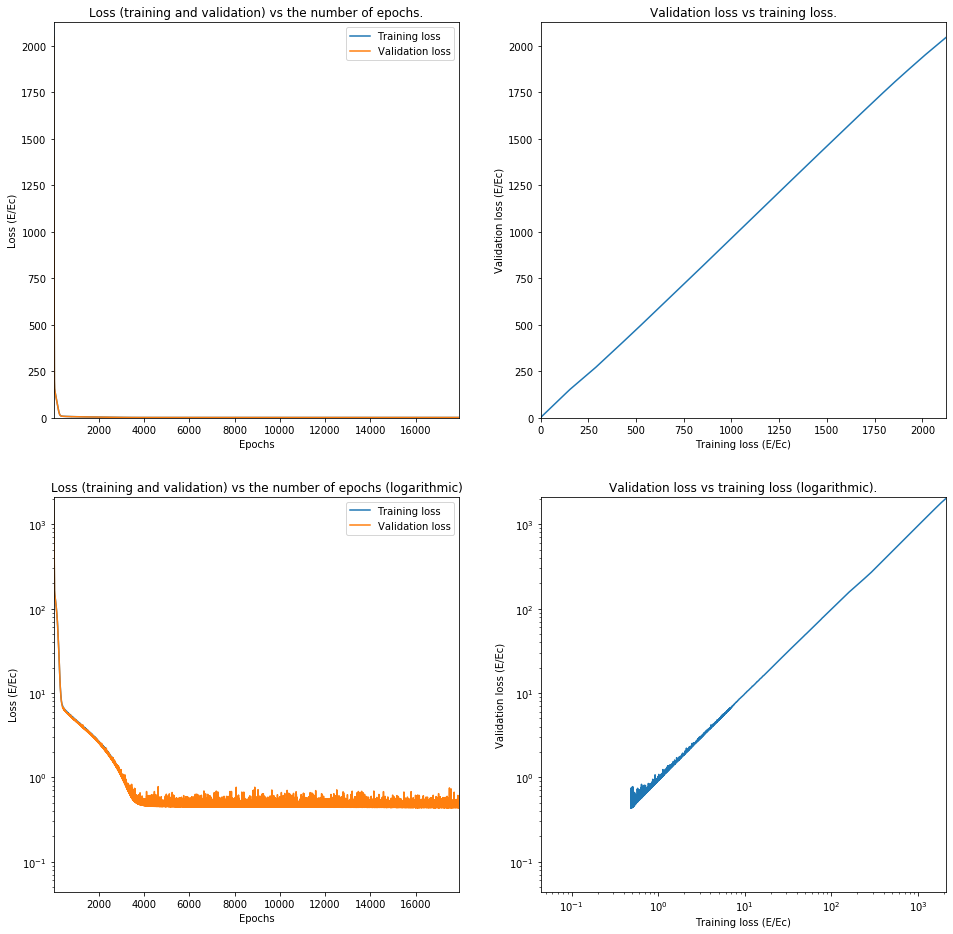

Train on 32002 samples, validate on 8001 samples
Epoch 1/25000
32002/32002 [==============================] - 1s 32us/step - loss: 7380.6976 - val_loss: 7094.5143
Epoch 2/25000
32002/32002 [==============================] - 1s 28us/step - loss: 6871.6057 - val_loss: 6586.2432
Epoch 3/25000
32002/32002 [==============================] - 1s 28us/step - loss: 6362.4535 - val_loss: 6077.9916
Epoch 4/25000
32002/32002 [==============================] - 1s 30us/step - loss: 5853.4076 - val_loss: 5569.6537
Epoch 5/25000
32002/32002 [==============================] - 1s 29us/step - loss: 5344.1035 - val_loss: 5061.3874
Epoch 6/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4835.0599 - val_loss: 4553.1157
Epoch 7/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4325.9035 - val_loss: 4044.3449
Epoch 8/25000
32002/32002 [==============================] - 1s 28us/step - loss: 3816.0339 - val_loss: 3534.7552
Epoch 9/25000
32002/32002 [============

Epoch 73/25000
32002/32002 [==============================] - 1s 32us/step - loss: 109.5017 - val_loss: 107.5300
Epoch 74/25000
32002/32002 [==============================] - 1s 31us/step - loss: 107.3482 - val_loss: 105.4436
Epoch 75/25000
32002/32002 [==============================] - 1s 28us/step - loss: 105.3115 - val_loss: 103.4269
Epoch 76/25000
32002/32002 [==============================] - 1s 28us/step - loss: 103.3866 - val_loss: 101.6022
Epoch 77/25000
32002/32002 [==============================] - 1s 28us/step - loss: 101.6143 - val_loss: 99.8875
Epoch 78/25000
32002/32002 [==============================] - 1s 28us/step - loss: 99.9217 - val_loss: 98.2794
Epoch 79/25000
32002/32002 [==============================] - 1s 27us/step - loss: 98.3550 - val_loss: 96.8265
Epoch 80/25000
32002/32002 [==============================] - 1s 28us/step - loss: 96.8943 - val_loss: 95.4879
Epoch 81/25000
32002/32002 [==============================] - 1s 31us/step - loss: 95.5180 - val_loss: 

32002/32002 [==============================] - 1s 28us/step - loss: 53.9746 - val_loss: 53.8572
Epoch 147/25000
32002/32002 [==============================] - 1s 28us/step - loss: 53.5641 - val_loss: 53.4292
Epoch 148/25000
32002/32002 [==============================] - 1s 27us/step - loss: 53.1446 - val_loss: 53.0146
Epoch 149/25000
32002/32002 [==============================] - 1s 28us/step - loss: 52.7352 - val_loss: 52.5993
Epoch 150/25000
32002/32002 [==============================] - 1s 28us/step - loss: 52.3233 - val_loss: 52.1860
Epoch 151/25000
32002/32002 [==============================] - 1s 27us/step - loss: 51.9225 - val_loss: 51.7787
Epoch 152/25000
32002/32002 [==============================] - 1s 29us/step - loss: 51.5230 - val_loss: 51.3967
Epoch 153/25000
32002/32002 [==============================] - 1s 30us/step - loss: 51.1123 - val_loss: 50.9870
Epoch 154/25000
32002/32002 [==============================] - 1s 28us/step - loss: 50.7229 - val_loss: 50.6292
Epoch 15

32002/32002 [==============================] - 1s 35us/step - loss: 28.5157 - val_loss: 28.3611
Epoch 220/25000
32002/32002 [==============================] - 1s 31us/step - loss: 28.2627 - val_loss: 28.1329
Epoch 221/25000
32002/32002 [==============================] - 1s 30us/step - loss: 27.9910 - val_loss: 27.9807
Epoch 222/25000
32002/32002 [==============================] - 1s 35us/step - loss: 27.7445 - val_loss: 27.6008
Epoch 223/25000
32002/32002 [==============================] - 1s 42us/step - loss: 27.4913 - val_loss: 27.3467
Epoch 224/25000
32002/32002 [==============================] - 1s 39us/step - loss: 27.2509 - val_loss: 27.1369
Epoch 225/25000
32002/32002 [==============================] - 1s 31us/step - loss: 27.0055 - val_loss: 26.8554
Epoch 226/25000
32002/32002 [==============================] - 1s 29us/step - loss: 26.7679 - val_loss: 26.6180
Epoch 227/25000
32002/32002 [==============================] - 1s 28us/step - loss: 26.5311 - val_loss: 26.3789
Epoch 22

32002/32002 [==============================] - 1s 28us/step - loss: 18.1075 - val_loss: 17.7943
Epoch 293/25000
32002/32002 [==============================] - 1s 29us/step - loss: 18.0351 - val_loss: 17.6772
Epoch 294/25000
32002/32002 [==============================] - 1s 33us/step - loss: 17.9676 - val_loss: 17.6839
Epoch 295/25000
32002/32002 [==============================] - 1s 31us/step - loss: 17.9007 - val_loss: 17.5587
Epoch 296/25000
32002/32002 [==============================] - 1s 30us/step - loss: 17.8375 - val_loss: 17.4929
Epoch 297/25000
32002/32002 [==============================] - 1s 34us/step - loss: 17.7817 - val_loss: 17.4203
Epoch 298/25000
32002/32002 [==============================] - 1s 30us/step - loss: 17.7082 - val_loss: 17.3539
Epoch 299/25000
32002/32002 [==============================] - 1s 29us/step - loss: 17.6478 - val_loss: 17.3170
Epoch 300/25000
32002/32002 [==============================] - 1s 28us/step - loss: 17.5936 - val_loss: 17.2570
Epoch 30

32002/32002 [==============================] - 1s 27us/step - loss: 15.2688 - val_loss: 14.9402
Epoch 366/25000
32002/32002 [==============================] - 1s 28us/step - loss: 15.2482 - val_loss: 14.9822
Epoch 367/25000
32002/32002 [==============================] - 1s 28us/step - loss: 15.2301 - val_loss: 14.8704
Epoch 368/25000
32002/32002 [==============================] - 1s 28us/step - loss: 15.2167 - val_loss: 14.8263
Epoch 369/25000
32002/32002 [==============================] - 1s 28us/step - loss: 15.2024 - val_loss: 14.8360
Epoch 370/25000
32002/32002 [==============================] - 1s 28us/step - loss: 15.1751 - val_loss: 14.8018
Epoch 371/25000
32002/32002 [==============================] - 1s 27us/step - loss: 15.1617 - val_loss: 14.7903
Epoch 372/25000
32002/32002 [==============================] - 1s 28us/step - loss: 15.1491 - val_loss: 14.7507
Epoch 373/25000
32002/32002 [==============================] - 1s 28us/step - loss: 15.1288 - val_loss: 14.9272
Epoch 37

32002/32002 [==============================] - 1s 28us/step - loss: 14.4081 - val_loss: 14.0579
Epoch 439/25000
32002/32002 [==============================] - 1s 29us/step - loss: 14.3983 - val_loss: 14.1558
Epoch 440/25000
32002/32002 [==============================] - 1s 28us/step - loss: 14.3893 - val_loss: 13.9953
Epoch 441/25000
32002/32002 [==============================] - 1s 28us/step - loss: 14.3894 - val_loss: 14.0170
Epoch 442/25000
32002/32002 [==============================] - 1s 28us/step - loss: 14.3783 - val_loss: 13.9924
Epoch 443/25000
32002/32002 [==============================] - 1s 28us/step - loss: 14.3712 - val_loss: 13.9851
Epoch 444/25000
32002/32002 [==============================] - 1s 28us/step - loss: 14.3637 - val_loss: 13.9713
Epoch 445/25000
32002/32002 [==============================] - 1s 28us/step - loss: 14.3598 - val_loss: 13.9738
Epoch 446/25000
32002/32002 [==============================] - 1s 28us/step - loss: 14.3557 - val_loss: 13.9792
Epoch 44

32002/32002 [==============================] - 1s 28us/step - loss: 13.9728 - val_loss: 13.5994
Epoch 512/25000
32002/32002 [==============================] - 1s 28us/step - loss: 13.9711 - val_loss: 13.5980
Epoch 513/25000
32002/32002 [==============================] - 1s 28us/step - loss: 13.9687 - val_loss: 13.5854
Epoch 514/25000
32002/32002 [==============================] - 1s 28us/step - loss: 13.9621 - val_loss: 13.6094
Epoch 515/25000
32002/32002 [==============================] - 1s 28us/step - loss: 13.9573 - val_loss: 13.6314
Epoch 516/25000
32002/32002 [==============================] - 1s 28us/step - loss: 13.9537 - val_loss: 13.5719
Epoch 517/25000
32002/32002 [==============================] - 1s 28us/step - loss: 13.9486 - val_loss: 13.5924
Epoch 518/25000
32002/32002 [==============================] - 1s 28us/step - loss: 13.9429 - val_loss: 13.6304
Epoch 519/25000
32002/32002 [==============================] - 1s 28us/step - loss: 13.9452 - val_loss: 13.5597
Epoch 52

32002/32002 [==============================] - 1s 29us/step - loss: 13.6467 - val_loss: 13.3134
Epoch 585/25000
32002/32002 [==============================] - 1s 29us/step - loss: 13.6466 - val_loss: 13.2882
Epoch 586/25000
32002/32002 [==============================] - 1s 29us/step - loss: 13.6351 - val_loss: 13.2891
Epoch 587/25000
32002/32002 [==============================] - 1s 29us/step - loss: 13.6359 - val_loss: 13.2894
Epoch 588/25000
32002/32002 [==============================] - 1s 29us/step - loss: 13.6326 - val_loss: 13.3341
Epoch 589/25000
32002/32002 [==============================] - 1s 29us/step - loss: 13.6266 - val_loss: 13.2634
Epoch 590/25000
32002/32002 [==============================] - 1s 29us/step - loss: 13.6183 - val_loss: 13.2585
Epoch 591/25000
32002/32002 [==============================] - 1s 28us/step - loss: 13.6157 - val_loss: 13.3092
Epoch 592/25000
32002/32002 [==============================] - 1s 28us/step - loss: 13.6132 - val_loss: 13.2585
Epoch 59

32002/32002 [==============================] - 1s 29us/step - loss: 13.3408 - val_loss: 12.9904
Epoch 658/25000
32002/32002 [==============================] - 1s 29us/step - loss: 13.3308 - val_loss: 13.1602
Epoch 659/25000
32002/32002 [==============================] - 1s 28us/step - loss: 13.3277 - val_loss: 12.9964
Epoch 660/25000
32002/32002 [==============================] - 1s 31us/step - loss: 13.3188 - val_loss: 13.0070
Epoch 661/25000
32002/32002 [==============================] - 1s 30us/step - loss: 13.3188 - val_loss: 12.9865
Epoch 662/25000
32002/32002 [==============================] - 1s 29us/step - loss: 13.3156 - val_loss: 13.0117
Epoch 663/25000
32002/32002 [==============================] - 1s 29us/step - loss: 13.3154 - val_loss: 12.9737
Epoch 664/25000
32002/32002 [==============================] - 1s 29us/step - loss: 13.3089 - val_loss: 12.9747
Epoch 665/25000
32002/32002 [==============================] - 1s 29us/step - loss: 13.3076 - val_loss: 12.9596
Epoch 66

32002/32002 [==============================] - 1s 31us/step - loss: 13.0436 - val_loss: 12.7348
Epoch 731/25000
32002/32002 [==============================] - 1s 29us/step - loss: 13.0418 - val_loss: 12.7425
Epoch 732/25000
32002/32002 [==============================] - 1s 33us/step - loss: 13.0320 - val_loss: 12.7093
Epoch 733/25000
32002/32002 [==============================] - 1s 32us/step - loss: 13.0357 - val_loss: 12.7188
Epoch 734/25000
32002/32002 [==============================] - 1s 30us/step - loss: 13.0290 - val_loss: 12.7014
Epoch 735/25000
32002/32002 [==============================] - 1s 29us/step - loss: 13.0180 - val_loss: 12.7403
Epoch 736/25000
32002/32002 [==============================] - 1s 29us/step - loss: 13.0236 - val_loss: 12.7521
Epoch 737/25000
32002/32002 [==============================] - 1s 29us/step - loss: 13.0118 - val_loss: 12.6941
Epoch 738/25000
32002/32002 [==============================] - 1s 29us/step - loss: 13.0129 - val_loss: 12.6866
Epoch 73

32002/32002 [==============================] - 1s 29us/step - loss: 12.7533 - val_loss: 12.4796
Epoch 804/25000
32002/32002 [==============================] - 1s 29us/step - loss: 12.7555 - val_loss: 12.4785
Epoch 805/25000
32002/32002 [==============================] - 1s 29us/step - loss: 12.7388 - val_loss: 12.4467
Epoch 806/25000
32002/32002 [==============================] - 1s 29us/step - loss: 12.7425 - val_loss: 12.5138
Epoch 807/25000
32002/32002 [==============================] - 1s 29us/step - loss: 12.7413 - val_loss: 12.4806
Epoch 808/25000
32002/32002 [==============================] - 1s 29us/step - loss: 12.7356 - val_loss: 12.4697
Epoch 809/25000
32002/32002 [==============================] - 1s 29us/step - loss: 12.7271 - val_loss: 12.4409
Epoch 810/25000
32002/32002 [==============================] - 1s 28us/step - loss: 12.7283 - val_loss: 12.4541
Epoch 811/25000
32002/32002 [==============================] - 1s 28us/step - loss: 12.7230 - val_loss: 12.4240
Epoch 81

32002/32002 [==============================] - 1s 30us/step - loss: 12.4798 - val_loss: 12.1942
Epoch 877/25000
32002/32002 [==============================] - 1s 30us/step - loss: 12.4772 - val_loss: 12.2089
Epoch 878/25000
32002/32002 [==============================] - 1s 29us/step - loss: 12.4706 - val_loss: 12.1957
Epoch 879/25000
32002/32002 [==============================] - 1s 30us/step - loss: 12.4699 - val_loss: 12.2052
Epoch 880/25000
32002/32002 [==============================] - 1s 30us/step - loss: 12.4619 - val_loss: 12.2051
Epoch 881/25000
32002/32002 [==============================] - 1s 30us/step - loss: 12.4675 - val_loss: 12.1869
Epoch 882/25000
32002/32002 [==============================] - 1s 34us/step - loss: 12.4571 - val_loss: 12.1838
Epoch 883/25000
32002/32002 [==============================] - 1s 31us/step - loss: 12.4573 - val_loss: 12.2402
Epoch 884/25000
32002/32002 [==============================] - 1s 32us/step - loss: 12.4508 - val_loss: 12.1662
Epoch 88

32002/32002 [==============================] - 1s 29us/step - loss: 12.2224 - val_loss: 11.9486
Epoch 950/25000
32002/32002 [==============================] - 1s 29us/step - loss: 12.2165 - val_loss: 11.9749
Epoch 951/25000
32002/32002 [==============================] - 1s 29us/step - loss: 12.2146 - val_loss: 11.9487
Epoch 952/25000
32002/32002 [==============================] - 1s 31us/step - loss: 12.2105 - val_loss: 12.0041
Epoch 953/25000
32002/32002 [==============================] - 1s 29us/step - loss: 12.2019 - val_loss: 11.9243
Epoch 954/25000
32002/32002 [==============================] - 1s 29us/step - loss: 12.2041 - val_loss: 11.9384
Epoch 955/25000
32002/32002 [==============================] - 1s 28us/step - loss: 12.1945 - val_loss: 11.9732
Epoch 956/25000
32002/32002 [==============================] - 1s 28us/step - loss: 12.1950 - val_loss: 11.9224
Epoch 957/25000
32002/32002 [==============================] - 1s 29us/step - loss: 12.1966 - val_loss: 11.9104
Epoch 95

32002/32002 [==============================] - 1s 33us/step - loss: 11.9582 - val_loss: 11.7027
Epoch 1023/25000
32002/32002 [==============================] - 1s 30us/step - loss: 11.9548 - val_loss: 11.6832
Epoch 1024/25000
32002/32002 [==============================] - 1s 30us/step - loss: 11.9466 - val_loss: 11.6804
Epoch 1025/25000
32002/32002 [==============================] - 1s 28us/step - loss: 11.9492 - val_loss: 11.6888
Epoch 1026/25000
32002/32002 [==============================] - 1s 29us/step - loss: 11.9470 - val_loss: 11.6718
Epoch 1027/25000
32002/32002 [==============================] - 1s 30us/step - loss: 11.9482 - val_loss: 11.6772
Epoch 1028/25000
32002/32002 [==============================] - 1s 30us/step - loss: 11.9414 - val_loss: 11.6694
Epoch 1029/25000
32002/32002 [==============================] - 1s 30us/step - loss: 11.9306 - val_loss: 11.6889
Epoch 1030/25000
32002/32002 [==============================] - 1s 29us/step - loss: 11.9307 - val_loss: 11.6767


32002/32002 [==============================] - 1s 29us/step - loss: 11.7023 - val_loss: 11.4405
Epoch 1095/25000
32002/32002 [==============================] - 1s 28us/step - loss: 11.6872 - val_loss: 11.6062
Epoch 1096/25000
32002/32002 [==============================] - 1s 29us/step - loss: 11.6952 - val_loss: 11.5332
Epoch 1097/25000
32002/32002 [==============================] - 1s 30us/step - loss: 11.6981 - val_loss: 11.4269
Epoch 1098/25000
32002/32002 [==============================] - 1s 28us/step - loss: 11.6849 - val_loss: 11.4275
Epoch 1099/25000
32002/32002 [==============================] - 1s 28us/step - loss: 11.6808 - val_loss: 11.5118
Epoch 1100/25000
32002/32002 [==============================] - 1s 28us/step - loss: 11.6791 - val_loss: 11.4167
Epoch 1101/25000
32002/32002 [==============================] - 1s 28us/step - loss: 11.6677 - val_loss: 11.4205
Epoch 1102/25000
32002/32002 [==============================] - 1s 28us/step - loss: 11.6798 - val_loss: 11.5085


32002/32002 [==============================] - 1s 29us/step - loss: 11.4382 - val_loss: 11.2771
Epoch 1167/25000
32002/32002 [==============================] - 1s 28us/step - loss: 11.4398 - val_loss: 11.1957
Epoch 1168/25000
32002/32002 [==============================] - 1s 30us/step - loss: 11.4441 - val_loss: 11.2302
Epoch 1169/25000
32002/32002 [==============================] - 1s 28us/step - loss: 11.4403 - val_loss: 11.1896
Epoch 1170/25000
32002/32002 [==============================] - 1s 29us/step - loss: 11.4341 - val_loss: 11.2272
Epoch 1171/25000
32002/32002 [==============================] - 1s 32us/step - loss: 11.4340 - val_loss: 11.1794
Epoch 1172/25000
32002/32002 [==============================] - 1s 31us/step - loss: 11.4299 - val_loss: 11.1908
Epoch 1173/25000
32002/32002 [==============================] - 1s 28us/step - loss: 11.4233 - val_loss: 11.1895
Epoch 1174/25000
32002/32002 [==============================] - 1s 28us/step - loss: 11.4266 - val_loss: 11.1859


32002/32002 [==============================] - 1s 29us/step - loss: 11.1856 - val_loss: 10.9867
Epoch 1239/25000
32002/32002 [==============================] - 1s 32us/step - loss: 11.1808 - val_loss: 10.9362
Epoch 1240/25000
32002/32002 [==============================] - 1s 29us/step - loss: 11.1728 - val_loss: 10.9294
Epoch 1241/25000
32002/32002 [==============================] - 1s 29us/step - loss: 11.1696 - val_loss: 10.9324
Epoch 1242/25000
32002/32002 [==============================] - 1s 29us/step - loss: 11.1630 - val_loss: 10.9239
Epoch 1243/25000
32002/32002 [==============================] - 1s 29us/step - loss: 11.1641 - val_loss: 10.9511
Epoch 1244/25000
32002/32002 [==============================] - 1s 29us/step - loss: 11.1644 - val_loss: 10.9707
Epoch 1245/25000
32002/32002 [==============================] - 1s 29us/step - loss: 11.1541 - val_loss: 11.1762
Epoch 1246/25000
32002/32002 [==============================] - 1s 29us/step - loss: 11.1515 - val_loss: 10.9263


32002/32002 [==============================] - 1s 27us/step - loss: 10.9126 - val_loss: 10.6754
Epoch 1311/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.9121 - val_loss: 10.7159
Epoch 1312/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.9140 - val_loss: 10.6653
Epoch 1313/25000
32002/32002 [==============================] - 1s 28us/step - loss: 10.8960 - val_loss: 10.6934
Epoch 1314/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.9022 - val_loss: 10.6683
Epoch 1315/25000
32002/32002 [==============================] - 1s 26us/step - loss: 10.8993 - val_loss: 10.6688
Epoch 1316/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.8931 - val_loss: 10.6558
Epoch 1317/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.8778 - val_loss: 10.7286
Epoch 1318/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.8830 - val_loss: 10.6479


32002/32002 [==============================] - 1s 27us/step - loss: 10.6476 - val_loss: 10.4727
Epoch 1383/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.6279 - val_loss: 10.4379
Epoch 1384/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.6317 - val_loss: 10.4095
Epoch 1385/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.6267 - val_loss: 10.4721
Epoch 1386/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.6249 - val_loss: 10.4021
Epoch 1387/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.6233 - val_loss: 10.4194
Epoch 1388/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.6123 - val_loss: 10.3975
Epoch 1389/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.6100 - val_loss: 10.4242
Epoch 1390/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.6125 - val_loss: 10.3898


32002/32002 [==============================] - 1s 27us/step - loss: 10.3762 - val_loss: 10.1718
Epoch 1455/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.3655 - val_loss: 10.1728
Epoch 1456/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.3634 - val_loss: 10.1938
Epoch 1457/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.3603 - val_loss: 10.1929
Epoch 1458/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.3579 - val_loss: 10.1807
Epoch 1459/25000
32002/32002 [==============================] - 1s 26us/step - loss: 10.3549 - val_loss: 10.1964
Epoch 1460/25000
32002/32002 [==============================] - 1s 28us/step - loss: 10.3493 - val_loss: 10.2875
Epoch 1461/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.3458 - val_loss: 10.1558
Epoch 1462/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.3435 - val_loss: 10.1375


Epoch 1527/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.0941 - val_loss: 9.9120
Epoch 1528/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.0952 - val_loss: 9.9048
Epoch 1529/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.0821 - val_loss: 9.9343
Epoch 1530/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.0804 - val_loss: 9.8856
Epoch 1531/25000
32002/32002 [==============================] - 1s 26us/step - loss: 10.0771 - val_loss: 9.9298
Epoch 1532/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.0746 - val_loss: 9.9063
Epoch 1533/25000
32002/32002 [==============================] - 1s 27us/step - loss: 10.0755 - val_loss: 9.9254
Epoch 1534/25000
32002/32002 [==============================] - 1s 28us/step - loss: 10.0674 - val_loss: 9.8878
Epoch 1535/25000
32002/32002 [==============================] - 1s 28us/step - loss: 10.0670 - val_loss:

32002/32002 [==============================] - 1s 27us/step - loss: 9.8499 - val_loss: 9.6458
Epoch 1601/25000
32002/32002 [==============================] - 1s 28us/step - loss: 9.8386 - val_loss: 9.6785
Epoch 1602/25000
32002/32002 [==============================] - 1s 27us/step - loss: 9.8340 - val_loss: 9.6763
Epoch 1603/25000
32002/32002 [==============================] - 1s 27us/step - loss: 9.8318 - val_loss: 9.6364
Epoch 1604/25000
32002/32002 [==============================] - 1s 27us/step - loss: 9.8314 - val_loss: 9.6609
Epoch 1605/25000
32002/32002 [==============================] - 1s 28us/step - loss: 9.8253 - val_loss: 9.7356
Epoch 1606/25000
32002/32002 [==============================] - 1s 28us/step - loss: 9.8264 - val_loss: 9.6253
Epoch 1607/25000
32002/32002 [==============================] - 1s 27us/step - loss: 9.8226 - val_loss: 9.7471
Epoch 1608/25000
32002/32002 [==============================] - 1s 27us/step - loss: 9.8200 - val_loss: 9.6261
Epoch 1609/25000
3

Epoch 1674/25000
32002/32002 [==============================] - 1s 30us/step - loss: 9.5787 - val_loss: 9.3898
Epoch 1675/25000
32002/32002 [==============================] - 1s 32us/step - loss: 9.5706 - val_loss: 9.4057
Epoch 1676/25000
32002/32002 [==============================] - 1s 30us/step - loss: 9.5719 - val_loss: 9.4067
Epoch 1677/25000
32002/32002 [==============================] - 1s 29us/step - loss: 9.5682 - val_loss: 9.3810
Epoch 1678/25000
32002/32002 [==============================] - 1s 30us/step - loss: 9.5667 - val_loss: 9.4756
Epoch 1679/25000
32002/32002 [==============================] - 1s 30us/step - loss: 9.5651 - val_loss: 9.3828
Epoch 1680/25000
32002/32002 [==============================] - 1s 31us/step - loss: 9.5635 - val_loss: 9.4181
Epoch 1681/25000
32002/32002 [==============================] - 1s 41us/step - loss: 9.5602 - val_loss: 9.3779
Epoch 1682/25000
32002/32002 [==============================] - 1s 41us/step - loss: 9.5519 - val_loss: 9.3667
E

Epoch 1748/25000
32002/32002 [==============================] - 1s 38us/step - loss: 9.3180 - val_loss: 9.1966
Epoch 1749/25000
32002/32002 [==============================] - 1s 44us/step - loss: 9.3134 - val_loss: 9.1284
Epoch 1750/25000
32002/32002 [==============================] - 1s 35us/step - loss: 9.3124 - val_loss: 9.1614
Epoch 1751/25000
32002/32002 [==============================] - 1s 33us/step - loss: 9.3072 - val_loss: 9.1267
Epoch 1752/25000
32002/32002 [==============================] - 1s 36us/step - loss: 9.3076 - val_loss: 9.1166
Epoch 1753/25000
32002/32002 [==============================] - 1s 34us/step - loss: 9.3003 - val_loss: 9.1169
Epoch 1754/25000
32002/32002 [==============================] - 1s 38us/step - loss: 9.3003 - val_loss: 9.1107
Epoch 1755/25000
32002/32002 [==============================] - 1s 34us/step - loss: 9.3008 - val_loss: 9.1344
Epoch 1756/25000
32002/32002 [==============================] - 1s 38us/step - loss: 9.2915 - val_loss: 9.1119
E

32002/32002 [==============================] - 1s 30us/step - loss: 9.0732 - val_loss: 8.8948
Epoch 1822/25000
32002/32002 [==============================] - 1s 30us/step - loss: 9.0641 - val_loss: 8.8840
Epoch 1823/25000
32002/32002 [==============================] - 1s 32us/step - loss: 9.0644 - val_loss: 8.8832
Epoch 1824/25000
32002/32002 [==============================] - 1s 28us/step - loss: 9.0610 - val_loss: 8.9674
Epoch 1825/25000
32002/32002 [==============================] - 1s 27us/step - loss: 9.0587 - val_loss: 8.8738
Epoch 1826/25000
32002/32002 [==============================] - 1s 29us/step - loss: 9.0552 - val_loss: 8.9084
Epoch 1827/25000
32002/32002 [==============================] - 1s 29us/step - loss: 9.0518 - val_loss: 8.9093
Epoch 1828/25000
32002/32002 [==============================] - 1s 30us/step - loss: 9.0532 - val_loss: 8.8693
Epoch 1829/25000
32002/32002 [==============================] - 1s 27us/step - loss: 9.0457 - val_loss: 8.9685
Epoch 1830/25000
3

Epoch 1895/25000
32002/32002 [==============================] - 1s 27us/step - loss: 8.8270 - val_loss: 8.6538
Epoch 1896/25000
32002/32002 [==============================] - 1s 27us/step - loss: 8.8297 - val_loss: 8.6399
Epoch 1897/25000
32002/32002 [==============================] - 1s 34us/step - loss: 8.8277 - val_loss: 8.7185
Epoch 1898/25000
32002/32002 [==============================] - 1s 29us/step - loss: 8.8188 - val_loss: 8.6351
Epoch 1899/25000
32002/32002 [==============================] - 1s 31us/step - loss: 8.8136 - val_loss: 8.7432
Epoch 1900/25000
32002/32002 [==============================] - 1s 32us/step - loss: 8.8092 - val_loss: 8.6597
Epoch 1901/25000
32002/32002 [==============================] - 1s 27us/step - loss: 8.8043 - val_loss: 8.6338
Epoch 1902/25000
32002/32002 [==============================] - 1s 27us/step - loss: 8.8087 - val_loss: 8.6793
Epoch 1903/25000
32002/32002 [==============================] - 1s 27us/step - loss: 8.8011 - val_loss: 8.6203
E

Epoch 1969/25000
32002/32002 [==============================] - 1s 30us/step - loss: 8.5881 - val_loss: 8.4151
Epoch 1970/25000
32002/32002 [==============================] - 1s 29us/step - loss: 8.5843 - val_loss: 8.3985
Epoch 1971/25000
32002/32002 [==============================] - 1s 27us/step - loss: 8.5853 - val_loss: 8.4133
Epoch 1972/25000
32002/32002 [==============================] - 1s 27us/step - loss: 8.5776 - val_loss: 8.3913
Epoch 1973/25000
32002/32002 [==============================] - 1s 31us/step - loss: 8.5812 - val_loss: 8.3904
Epoch 1974/25000
32002/32002 [==============================] - 1s 31us/step - loss: 8.5775 - val_loss: 8.4073
Epoch 1975/25000
32002/32002 [==============================] - 1s 32us/step - loss: 8.5721 - val_loss: 8.3831
Epoch 1976/25000
32002/32002 [==============================] - 1s 29us/step - loss: 8.5710 - val_loss: 8.3839
Epoch 1977/25000
32002/32002 [==============================] - 1s 28us/step - loss: 8.5673 - val_loss: 8.4239
E

Epoch 2043/25000
32002/32002 [==============================] - 1s 28us/step - loss: 8.3585 - val_loss: 8.2220
Epoch 2044/25000
32002/32002 [==============================] - 1s 33us/step - loss: 8.3569 - val_loss: 8.1736
Epoch 2045/25000
32002/32002 [==============================] - 1s 36us/step - loss: 8.3485 - val_loss: 8.2450
Epoch 2046/25000
32002/32002 [==============================] - 1s 39us/step - loss: 8.3435 - val_loss: 8.1826
Epoch 2047/25000
32002/32002 [==============================] - 1s 33us/step - loss: 8.3413 - val_loss: 8.1668
Epoch 2048/25000
32002/32002 [==============================] - 1s 32us/step - loss: 8.3411 - val_loss: 8.1699
Epoch 2049/25000
32002/32002 [==============================] - 1s 29us/step - loss: 8.3358 - val_loss: 8.1736
Epoch 2050/25000
32002/32002 [==============================] - 1s 28us/step - loss: 8.3361 - val_loss: 8.1660
Epoch 2051/25000
32002/32002 [==============================] - 1s 30us/step - loss: 8.3360 - val_loss: 8.1613
E

Epoch 2117/25000
32002/32002 [==============================] - 1s 28us/step - loss: 8.1382 - val_loss: 7.9812
Epoch 2118/25000
32002/32002 [==============================] - 1s 28us/step - loss: 8.1385 - val_loss: 8.0170
Epoch 2119/25000
32002/32002 [==============================] - 1s 28us/step - loss: 8.1340 - val_loss: 8.0433
Epoch 2120/25000
32002/32002 [==============================] - 1s 28us/step - loss: 8.1311 - val_loss: 7.9811
Epoch 2121/25000
32002/32002 [==============================] - 1s 28us/step - loss: 8.1277 - val_loss: 7.9676
Epoch 2122/25000
32002/32002 [==============================] - 1s 30us/step - loss: 8.1290 - val_loss: 7.9585
Epoch 2123/25000
32002/32002 [==============================] - 1s 28us/step - loss: 8.1223 - val_loss: 8.0188
Epoch 2124/25000
32002/32002 [==============================] - 1s 27us/step - loss: 8.1199 - val_loss: 7.9583
Epoch 2125/25000
32002/32002 [==============================] - 1s 30us/step - loss: 8.1200 - val_loss: 7.9697
E

Epoch 2191/25000
32002/32002 [==============================] - 1s 28us/step - loss: 7.9278 - val_loss: 7.7841
Epoch 2192/25000
32002/32002 [==============================] - 1s 29us/step - loss: 7.9303 - val_loss: 7.8788
Epoch 2193/25000
32002/32002 [==============================] - 1s 28us/step - loss: 7.9201 - val_loss: 7.7750
Epoch 2194/25000
32002/32002 [==============================] - 1s 31us/step - loss: 7.9203 - val_loss: 7.7636
Epoch 2195/25000
32002/32002 [==============================] - 1s 30us/step - loss: 7.9144 - val_loss: 7.7653
Epoch 2196/25000
32002/32002 [==============================] - 1s 29us/step - loss: 7.9140 - val_loss: 7.8021
Epoch 2197/25000
32002/32002 [==============================] - 1s 28us/step - loss: 7.9073 - val_loss: 7.7585
Epoch 2198/25000
32002/32002 [==============================] - 1s 28us/step - loss: 7.9101 - val_loss: 7.7632
Epoch 2199/25000
32002/32002 [==============================] - 1s 32us/step - loss: 7.9047 - val_loss: 7.7568
E

Epoch 2265/25000
32002/32002 [==============================] - 1s 29us/step - loss: 7.7166 - val_loss: 7.6141
Epoch 2266/25000
32002/32002 [==============================] - 1s 30us/step - loss: 7.7146 - val_loss: 7.5767
Epoch 2267/25000
32002/32002 [==============================] - 1s 31us/step - loss: 7.7153 - val_loss: 7.5838
Epoch 2268/25000
32002/32002 [==============================] - 1s 30us/step - loss: 7.7163 - val_loss: 7.6007
Epoch 2269/25000
32002/32002 [==============================] - 1s 30us/step - loss: 7.7070 - val_loss: 7.5779
Epoch 2270/25000
32002/32002 [==============================] - 1s 28us/step - loss: 7.7035 - val_loss: 7.5697
Epoch 2271/25000
32002/32002 [==============================] - 1s 27us/step - loss: 7.7074 - val_loss: 7.6895
Epoch 2272/25000
32002/32002 [==============================] - 1s 27us/step - loss: 7.7030 - val_loss: 7.5625
Epoch 2273/25000
32002/32002 [==============================] - 1s 31us/step - loss: 7.6948 - val_loss: 7.5879
E

Epoch 2339/25000
32002/32002 [==============================] - 1s 28us/step - loss: 7.5319 - val_loss: 7.4427
Epoch 2340/25000
32002/32002 [==============================] - 1s 27us/step - loss: 7.5329 - val_loss: 7.5053
Epoch 2341/25000
32002/32002 [==============================] - 1s 27us/step - loss: 7.5336 - val_loss: 7.4180
Epoch 2342/25000
32002/32002 [==============================] - 1s 27us/step - loss: 7.5251 - val_loss: 7.3934
Epoch 2343/25000
32002/32002 [==============================] - 1s 28us/step - loss: 7.5200 - val_loss: 7.3899
Epoch 2344/25000
32002/32002 [==============================] - 1s 27us/step - loss: 7.5268 - val_loss: 7.4053
Epoch 2345/25000
32002/32002 [==============================] - 1s 28us/step - loss: 7.5187 - val_loss: 7.4177
Epoch 2346/25000
32002/32002 [==============================] - 1s 27us/step - loss: 7.5262 - val_loss: 7.3867
Epoch 2347/25000
32002/32002 [==============================] - 1s 29us/step - loss: 7.5207 - val_loss: 7.3832
E

Epoch 2413/25000
32002/32002 [==============================] - 1s 27us/step - loss: 7.3537 - val_loss: 7.2211
Epoch 2414/25000
32002/32002 [==============================] - 1s 30us/step - loss: 7.3505 - val_loss: 7.2371
Epoch 2415/25000
32002/32002 [==============================] - 1s 29us/step - loss: 7.3501 - val_loss: 7.2636
Epoch 2416/25000
32002/32002 [==============================] - 1s 28us/step - loss: 7.3431 - val_loss: 7.2187
Epoch 2417/25000
32002/32002 [==============================] - 1s 30us/step - loss: 7.3477 - val_loss: 7.2143
Epoch 2418/25000
32002/32002 [==============================] - 1s 31us/step - loss: 7.3384 - val_loss: 7.2097
Epoch 2419/25000
32002/32002 [==============================] - 1s 31us/step - loss: 7.3453 - val_loss: 7.2973
Epoch 2420/25000
32002/32002 [==============================] - 1s 29us/step - loss: 7.3343 - val_loss: 7.2043
Epoch 2421/25000
32002/32002 [==============================] - 1s 32us/step - loss: 7.3374 - val_loss: 7.2116
E

Epoch 2487/25000
32002/32002 [==============================] - 1s 30us/step - loss: 7.1782 - val_loss: 7.0669
Epoch 2488/25000
32002/32002 [==============================] - 1s 28us/step - loss: 7.1788 - val_loss: 7.0913
Epoch 2489/25000
32002/32002 [==============================] - 1s 27us/step - loss: 7.1754 - val_loss: 7.1388
Epoch 2490/25000
32002/32002 [==============================] - 1s 27us/step - loss: 7.1739 - val_loss: 7.1382
Epoch 2491/25000
32002/32002 [==============================] - 1s 27us/step - loss: 7.1752 - val_loss: 7.0340
Epoch 2492/25000
32002/32002 [==============================] - 1s 27us/step - loss: 7.1777 - val_loss: 7.0616
Epoch 2493/25000
32002/32002 [==============================] - 1s 27us/step - loss: 7.1711 - val_loss: 7.1236
Epoch 2494/25000
32002/32002 [==============================] - 1s 29us/step - loss: 7.1653 - val_loss: 7.0312
Epoch 2495/25000
32002/32002 [==============================] - 1s 29us/step - loss: 7.1599 - val_loss: 7.0307
E

Epoch 2561/25000
32002/32002 [==============================] - 1s 27us/step - loss: 7.0224 - val_loss: 6.9331
Epoch 2562/25000
32002/32002 [==============================] - 1s 27us/step - loss: 7.0080 - val_loss: 6.8873
Epoch 2563/25000
32002/32002 [==============================] - 1s 27us/step - loss: 7.0113 - val_loss: 6.8847
Epoch 2564/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.9992 - val_loss: 6.8753
Epoch 2565/25000
32002/32002 [==============================] - 1s 27us/step - loss: 7.0027 - val_loss: 6.8748
Epoch 2566/25000
32002/32002 [==============================] - 1s 27us/step - loss: 7.0007 - val_loss: 6.8810
Epoch 2567/25000
32002/32002 [==============================] - 1s 27us/step - loss: 7.0038 - val_loss: 6.9082
Epoch 2568/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.9942 - val_loss: 6.9000
Epoch 2569/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.9952 - val_loss: 6.8683
E

Epoch 2635/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.8540 - val_loss: 6.7458
Epoch 2636/25000
32002/32002 [==============================] - 1s 26us/step - loss: 6.8551 - val_loss: 6.7457
Epoch 2637/25000
32002/32002 [==============================] - 1s 26us/step - loss: 6.8517 - val_loss: 6.8877
Epoch 2638/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.8511 - val_loss: 6.7685
Epoch 2639/25000
32002/32002 [==============================] - 1s 29us/step - loss: 6.8406 - val_loss: 6.7593
Epoch 2640/25000
32002/32002 [==============================] - 1s 30us/step - loss: 6.8428 - val_loss: 6.7423
Epoch 2641/25000
32002/32002 [==============================] - 1s 30us/step - loss: 6.8347 - val_loss: 6.7346
Epoch 2642/25000
32002/32002 [==============================] - 1s 29us/step - loss: 6.8419 - val_loss: 6.7426
Epoch 2643/25000
32002/32002 [==============================] - 1s 28us/step - loss: 6.8278 - val_loss: 6.7343
E

Epoch 2709/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.6920 - val_loss: 6.6113
Epoch 2710/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.6870 - val_loss: 6.6687
Epoch 2711/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.6933 - val_loss: 6.6969
Epoch 2712/25000
32002/32002 [==============================] - 1s 28us/step - loss: 6.6899 - val_loss: 6.6050
Epoch 2713/25000
32002/32002 [==============================] - 1s 28us/step - loss: 6.6881 - val_loss: 6.6027
Epoch 2714/25000
32002/32002 [==============================] - 1s 29us/step - loss: 6.6803 - val_loss: 6.6047
Epoch 2715/25000
32002/32002 [==============================] - 1s 28us/step - loss: 6.6813 - val_loss: 6.6018
Epoch 2716/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.6791 - val_loss: 6.6067
Epoch 2717/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.6780 - val_loss: 6.6632
E

Epoch 2783/25000
32002/32002 [==============================] - 1s 29us/step - loss: 6.5474 - val_loss: 6.4760
Epoch 2784/25000
32002/32002 [==============================] - 1s 30us/step - loss: 6.5392 - val_loss: 6.4775
Epoch 2785/25000
32002/32002 [==============================] - 1s 28us/step - loss: 6.5393 - val_loss: 6.4717
Epoch 2786/25000
32002/32002 [==============================] - 1s 26us/step - loss: 6.5369 - val_loss: 6.4878
Epoch 2787/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.5343 - val_loss: 6.4656
Epoch 2788/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.5356 - val_loss: 6.4657
Epoch 2789/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.5363 - val_loss: 6.5649
Epoch 2790/25000
32002/32002 [==============================] - 1s 26us/step - loss: 6.5355 - val_loss: 6.4771
Epoch 2791/25000
32002/32002 [==============================] - 1s 26us/step - loss: 6.5262 - val_loss: 6.4708
E

Epoch 2857/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.4025 - val_loss: 6.5544
Epoch 2858/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.4103 - val_loss: 6.3983
Epoch 2859/25000
32002/32002 [==============================] - 1s 30us/step - loss: 6.3960 - val_loss: 6.4118
Epoch 2860/25000
32002/32002 [==============================] - 1s 26us/step - loss: 6.3995 - val_loss: 6.3627
Epoch 2861/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.3968 - val_loss: 6.3571
Epoch 2862/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.3941 - val_loss: 6.3363
Epoch 2863/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.3869 - val_loss: 6.3805
Epoch 2864/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.3937 - val_loss: 6.3359
Epoch 2865/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.3896 - val_loss: 6.3325
E

Epoch 2931/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.2717 - val_loss: 6.2519
Epoch 2932/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.2744 - val_loss: 6.2449
Epoch 2933/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.2738 - val_loss: 6.2877
Epoch 2934/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.2715 - val_loss: 6.5213
Epoch 2935/25000
32002/32002 [==============================] - 1s 26us/step - loss: 6.2760 - val_loss: 6.2382
Epoch 2936/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.2722 - val_loss: 6.2548
Epoch 2937/25000
32002/32002 [==============================] - 1s 26us/step - loss: 6.2694 - val_loss: 6.2175
Epoch 2938/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.2576 - val_loss: 6.2290
Epoch 2939/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.2623 - val_loss: 6.2134
E

Epoch 3005/25000
32002/32002 [==============================] - 1s 29us/step - loss: 6.1604 - val_loss: 6.1195
Epoch 3006/25000
32002/32002 [==============================] - 1s 29us/step - loss: 6.1583 - val_loss: 6.1368
Epoch 3007/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.1659 - val_loss: 6.1776
Epoch 3008/25000
32002/32002 [==============================] - 1s 28us/step - loss: 6.1594 - val_loss: 6.1116
Epoch 3009/25000
32002/32002 [==============================] - 1s 28us/step - loss: 6.1579 - val_loss: 6.1376
Epoch 3010/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.1492 - val_loss: 6.1254
Epoch 3011/25000
32002/32002 [==============================] - 1s 28us/step - loss: 6.1487 - val_loss: 6.1753
Epoch 3012/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.1517 - val_loss: 6.1091
Epoch 3013/25000
32002/32002 [==============================] - 1s 27us/step - loss: 6.1517 - val_loss: 6.1110
E

Epoch 3079/25000
32002/32002 [==============================] - 1s 28us/step - loss: 6.0531 - val_loss: 6.0757
Epoch 3080/25000
32002/32002 [==============================] - 1s 28us/step - loss: 6.0515 - val_loss: 6.0081
Epoch 3081/25000
32002/32002 [==============================] - 1s 28us/step - loss: 6.0480 - val_loss: 6.0248
Epoch 3082/25000
32002/32002 [==============================] - 1s 28us/step - loss: 6.0531 - val_loss: 6.0057
Epoch 3083/25000
32002/32002 [==============================] - 1s 28us/step - loss: 6.0484 - val_loss: 6.0153
Epoch 3084/25000
32002/32002 [==============================] - 1s 28us/step - loss: 6.0414 - val_loss: 6.0708
Epoch 3085/25000
32002/32002 [==============================] - 1s 28us/step - loss: 6.0422 - val_loss: 6.0514
Epoch 3086/25000
32002/32002 [==============================] - 1s 28us/step - loss: 6.0429 - val_loss: 6.0104
Epoch 3087/25000
32002/32002 [==============================] - 1s 28us/step - loss: 6.0415 - val_loss: 6.0199
E

Epoch 3153/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.9518 - val_loss: 5.9265
Epoch 3154/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.9512 - val_loss: 5.9236
Epoch 3155/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.9456 - val_loss: 5.9977
Epoch 3156/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.9447 - val_loss: 5.9260
Epoch 3157/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.9437 - val_loss: 5.9040
Epoch 3158/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.9370 - val_loss: 5.9007
Epoch 3159/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.9391 - val_loss: 5.9414
Epoch 3160/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.9376 - val_loss: 5.9136
Epoch 3161/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.9371 - val_loss: 5.8953
E

Epoch 3227/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.8398 - val_loss: 5.8022
Epoch 3228/25000
32002/32002 [==============================] - 1s 30us/step - loss: 5.8369 - val_loss: 5.8120
Epoch 3229/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.8405 - val_loss: 5.8018
Epoch 3230/25000
32002/32002 [==============================] - 1s 30us/step - loss: 5.8429 - val_loss: 5.8338
Epoch 3231/25000
32002/32002 [==============================] - 1s 29us/step - loss: 5.8379 - val_loss: 5.7996
Epoch 3232/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.8372 - val_loss: 5.9442
Epoch 3233/25000
32002/32002 [==============================] - 1s 35us/step - loss: 5.8334 - val_loss: 5.8228
Epoch 3234/25000
32002/32002 [==============================] - 1s 29us/step - loss: 5.8432 - val_loss: 5.8858
Epoch 3235/25000
32002/32002 [==============================] - 1s 29us/step - loss: 5.8338 - val_loss: 5.8297
E

32002/32002 [==============================] - 1s 28us/step - loss: 5.7556 - val_loss: 5.7552
Epoch 3301/25000
32002/32002 [==============================] - 1s 29us/step - loss: 5.7484 - val_loss: 5.7213
Epoch 3302/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.7476 - val_loss: 5.7089
Epoch 3303/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.7461 - val_loss: 5.7685
Epoch 3304/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.7404 - val_loss: 5.7034
Epoch 3305/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.7433 - val_loss: 5.7348
Epoch 3306/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.7369 - val_loss: 5.7546
Epoch 3307/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.7316 - val_loss: 5.7152
Epoch 3308/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.7325 - val_loss: 5.7732
Epoch 3309/25000
3

Epoch 3374/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.6521 - val_loss: 5.6239
Epoch 3375/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.6497 - val_loss: 5.6198
Epoch 3376/25000
32002/32002 [==============================] - 1s 29us/step - loss: 5.6472 - val_loss: 5.6318
Epoch 3377/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.6449 - val_loss: 5.6201
Epoch 3378/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.6522 - val_loss: 5.6154
Epoch 3379/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.6540 - val_loss: 5.7104
Epoch 3380/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.6496 - val_loss: 5.6190
Epoch 3381/25000
32002/32002 [==============================] - 1s 30us/step - loss: 5.6483 - val_loss: 5.6314
Epoch 3382/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.6449 - val_loss: 5.6136
E

Epoch 3448/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.5677 - val_loss: 5.5701
Epoch 3449/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.5637 - val_loss: 5.5257
Epoch 3450/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.5601 - val_loss: 5.5328
Epoch 3451/25000
32002/32002 [==============================] - 1s 26us/step - loss: 5.5591 - val_loss: 5.5400
Epoch 3452/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.5557 - val_loss: 5.5722
Epoch 3453/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.5641 - val_loss: 5.5280
Epoch 3454/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.5569 - val_loss: 5.5343
Epoch 3455/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.5526 - val_loss: 5.6104
Epoch 3456/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.5567 - val_loss: 5.5280
E

Epoch 3522/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.4810 - val_loss: 5.4443
Epoch 3523/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.4739 - val_loss: 5.4599
Epoch 3524/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.4751 - val_loss: 5.4585
Epoch 3525/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.4739 - val_loss: 5.4421
Epoch 3526/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.4724 - val_loss: 5.4355
Epoch 3527/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.4698 - val_loss: 5.6110
Epoch 3528/25000
32002/32002 [==============================] - 1s 29us/step - loss: 5.4680 - val_loss: 5.4336
Epoch 3529/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.4655 - val_loss: 5.4346
Epoch 3530/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.4719 - val_loss: 5.4345
E

Epoch 3596/25000
32002/32002 [==============================] - 1s 26us/step - loss: 5.3902 - val_loss: 5.3759
Epoch 3597/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.3931 - val_loss: 5.3718
Epoch 3598/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.4004 - val_loss: 5.4225
Epoch 3599/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.3861 - val_loss: 5.4278
Epoch 3600/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.3878 - val_loss: 5.3671
Epoch 3601/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.3841 - val_loss: 5.3505
Epoch 3602/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.3838 - val_loss: 5.3670
Epoch 3603/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.3841 - val_loss: 5.3814
Epoch 3604/25000
32002/32002 [==============================] - 1s 29us/step - loss: 5.3870 - val_loss: 5.3478
E

Epoch 3670/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.3130 - val_loss: 5.2772
Epoch 3671/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.3100 - val_loss: 5.2700
Epoch 3672/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.3022 - val_loss: 5.2945
Epoch 3673/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.3027 - val_loss: 5.2701
Epoch 3674/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.3040 - val_loss: 5.3069
Epoch 3675/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.3118 - val_loss: 5.2691
Epoch 3676/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.2974 - val_loss: 5.2799
Epoch 3677/25000
32002/32002 [==============================] - 1s 26us/step - loss: 5.2967 - val_loss: 5.2639
Epoch 3678/25000
32002/32002 [==============================] - 1s 26us/step - loss: 5.2975 - val_loss: 5.2665
E

Epoch 3744/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.2223 - val_loss: 5.1940
Epoch 3745/25000
32002/32002 [==============================] - 1s 26us/step - loss: 5.2229 - val_loss: 5.2903
Epoch 3746/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.2309 - val_loss: 5.2070
Epoch 3747/25000
32002/32002 [==============================] - 1s 26us/step - loss: 5.2211 - val_loss: 5.1937
Epoch 3748/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.2202 - val_loss: 5.1859
Epoch 3749/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.2224 - val_loss: 5.1844
Epoch 3750/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.2204 - val_loss: 5.1868
Epoch 3751/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.2141 - val_loss: 5.1969
Epoch 3752/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.2169 - val_loss: 5.1903
E

Epoch 3818/25000
32002/32002 [==============================] - 1s 31us/step - loss: 5.1407 - val_loss: 5.2252
Epoch 3819/25000
32002/32002 [==============================] - 1s 29us/step - loss: 5.1409 - val_loss: 5.1116
Epoch 3820/25000
32002/32002 [==============================] - 1s 29us/step - loss: 5.1411 - val_loss: 5.1093
Epoch 3821/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.1387 - val_loss: 5.1077
Epoch 3822/25000
32002/32002 [==============================] - 1s 29us/step - loss: 5.1304 - val_loss: 5.1076
Epoch 3823/25000
32002/32002 [==============================] - 1s 29us/step - loss: 5.1391 - val_loss: 5.1103
Epoch 3824/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.1362 - val_loss: 5.1056
Epoch 3825/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.1323 - val_loss: 5.0984
Epoch 3826/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.1345 - val_loss: 5.1227
E

Epoch 3892/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.0608 - val_loss: 5.0576
Epoch 3893/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.0578 - val_loss: 5.0539
Epoch 3894/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.0564 - val_loss: 5.0349
Epoch 3895/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.0621 - val_loss: 5.0234
Epoch 3896/25000
32002/32002 [==============================] - 1s 27us/step - loss: 5.0544 - val_loss: 5.0229
Epoch 3897/25000
32002/32002 [==============================] - 1s 29us/step - loss: 5.0579 - val_loss: 5.0401
Epoch 3898/25000
32002/32002 [==============================] - 1s 30us/step - loss: 5.0531 - val_loss: 5.0270
Epoch 3899/25000
32002/32002 [==============================] - 1s 29us/step - loss: 5.0581 - val_loss: 5.0345
Epoch 3900/25000
32002/32002 [==============================] - 1s 28us/step - loss: 5.0491 - val_loss: 5.0175
E

32002/32002 [==============================] - 1s 27us/step - loss: 4.9874 - val_loss: 4.9759
Epoch 3966/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.9783 - val_loss: 4.9499
Epoch 3967/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.9798 - val_loss: 4.9740
Epoch 3968/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.9767 - val_loss: 4.9591
Epoch 3969/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.9790 - val_loss: 5.0478
Epoch 3970/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.9731 - val_loss: 4.9470
Epoch 3971/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.9736 - val_loss: 4.9555
Epoch 3972/25000
32002/32002 [==============================] - 1s 29us/step - loss: 4.9738 - val_loss: 4.9485
Epoch 3973/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.9740 - val_loss: 5.0217
Epoch 3974/25000
3

32002/32002 [==============================] - 1s 28us/step - loss: 4.9049 - val_loss: 4.8960
Epoch 4039/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.9045 - val_loss: 4.9024
Epoch 4040/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.9045 - val_loss: 4.8853
Epoch 4041/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.9034 - val_loss: 4.8694
Epoch 4042/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.8958 - val_loss: 4.9125
Epoch 4043/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.8919 - val_loss: 4.8827
Epoch 4044/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.9010 - val_loss: 4.8856
Epoch 4045/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.8994 - val_loss: 4.8655
Epoch 4046/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.8891 - val_loss: 4.9889
Epoch 4047/25000
3

Epoch 4112/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.8288 - val_loss: 4.7950
Epoch 4113/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.8271 - val_loss: 4.8041
Epoch 4114/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.8307 - val_loss: 4.8864
Epoch 4115/25000
32002/32002 [==============================] - 1s 31us/step - loss: 4.8171 - val_loss: 4.7968
Epoch 4116/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.8214 - val_loss: 4.8059
Epoch 4117/25000
32002/32002 [==============================] - 1s 30us/step - loss: 4.8194 - val_loss: 4.7948
Epoch 4118/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.8189 - val_loss: 4.7999
Epoch 4119/25000
32002/32002 [==============================] - 1s 29us/step - loss: 4.8182 - val_loss: 4.7919
Epoch 4120/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.8122 - val_loss: 4.7996
E

Epoch 4186/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.7503 - val_loss: 4.7569
Epoch 4187/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.7528 - val_loss: 4.7835
Epoch 4188/25000
32002/32002 [==============================] - 1s 29us/step - loss: 4.7456 - val_loss: 4.7474
Epoch 4189/25000
32002/32002 [==============================] - 1s 31us/step - loss: 4.7466 - val_loss: 4.7175
Epoch 4190/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.7489 - val_loss: 4.7130
Epoch 4191/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.7407 - val_loss: 4.7398
Epoch 4192/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.7430 - val_loss: 4.7387
Epoch 4193/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.7439 - val_loss: 4.7109
Epoch 4194/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.7420 - val_loss: 4.8335
E

Epoch 4260/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.6767 - val_loss: 4.6427
Epoch 4261/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.6708 - val_loss: 4.7657
Epoch 4262/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.6710 - val_loss: 4.6411
Epoch 4263/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.6674 - val_loss: 4.6432
Epoch 4264/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.6703 - val_loss: 4.6845
Epoch 4265/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.6701 - val_loss: 4.6563
Epoch 4266/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.6681 - val_loss: 4.6938
Epoch 4267/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.6717 - val_loss: 4.6395
Epoch 4268/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.6640 - val_loss: 4.6440
E

Epoch 4334/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.5996 - val_loss: 4.5704
Epoch 4335/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.5921 - val_loss: 4.5733
Epoch 4336/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.5957 - val_loss: 4.5803
Epoch 4337/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.5943 - val_loss: 4.5898
Epoch 4338/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.5986 - val_loss: 4.5659
Epoch 4339/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.5912 - val_loss: 4.5767
Epoch 4340/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.5924 - val_loss: 4.5642
Epoch 4341/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.5888 - val_loss: 4.5616
Epoch 4342/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.5890 - val_loss: 4.5704
E

Epoch 4408/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.5240 - val_loss: 4.4980
Epoch 4409/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.5239 - val_loss: 4.5161
Epoch 4410/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.5185 - val_loss: 4.5181
Epoch 4411/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.5192 - val_loss: 4.4976
Epoch 4412/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.5182 - val_loss: 4.5012
Epoch 4413/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.5144 - val_loss: 4.4942
Epoch 4414/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.5165 - val_loss: 4.5297
Epoch 4415/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.5162 - val_loss: 4.4868
Epoch 4416/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.5144 - val_loss: 4.5125
E

Epoch 4482/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.4472 - val_loss: 4.4543
Epoch 4483/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.4513 - val_loss: 4.4657
Epoch 4484/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.4481 - val_loss: 4.4491
Epoch 4485/25000
32002/32002 [==============================] - 1s 29us/step - loss: 4.4491 - val_loss: 4.4274
Epoch 4486/25000
32002/32002 [==============================] - 1s 31us/step - loss: 4.4469 - val_loss: 4.4447
Epoch 4487/25000
32002/32002 [==============================] - 1s 32us/step - loss: 4.4456 - val_loss: 4.4281
Epoch 4488/25000
32002/32002 [==============================] - 1s 36us/step - loss: 4.4460 - val_loss: 4.4236
Epoch 4489/25000
32002/32002 [==============================] - 1s 32us/step - loss: 4.4396 - val_loss: 4.5781
Epoch 4490/25000
32002/32002 [==============================] - 1s 30us/step - loss: 4.4454 - val_loss: 4.4279
E

Epoch 4556/25000
32002/32002 [==============================] - 1s 33us/step - loss: 4.3760 - val_loss: 4.3589
Epoch 4557/25000
32002/32002 [==============================] - 1s 30us/step - loss: 4.3762 - val_loss: 4.3540
Epoch 4558/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.3717 - val_loss: 4.3633
Epoch 4559/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.3724 - val_loss: 4.3450
Epoch 4560/25000
32002/32002 [==============================] - 1s 29us/step - loss: 4.3774 - val_loss: 4.4219
Epoch 4561/25000
32002/32002 [==============================] - 1s 29us/step - loss: 4.3798 - val_loss: 4.3441
Epoch 4562/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.3687 - val_loss: 4.3520
Epoch 4563/25000
32002/32002 [==============================] - 1s 31us/step - loss: 4.3669 - val_loss: 4.3419
Epoch 4564/25000
32002/32002 [==============================] - 1s 33us/step - loss: 4.3666 - val_loss: 4.4078
E

Epoch 4630/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.3042 - val_loss: 4.2956
Epoch 4631/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.3074 - val_loss: 4.3099
Epoch 4632/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.3020 - val_loss: 4.2993
Epoch 4633/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.2999 - val_loss: 4.2846
Epoch 4634/25000
32002/32002 [==============================] - 1s 32us/step - loss: 4.3033 - val_loss: 4.2841
Epoch 4635/25000
32002/32002 [==============================] - 1s 29us/step - loss: 4.3019 - val_loss: 4.2729
Epoch 4636/25000
32002/32002 [==============================] - 1s 29us/step - loss: 4.2949 - val_loss: 4.2729
Epoch 4637/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.2979 - val_loss: 4.2784
Epoch 4638/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.3000 - val_loss: 4.2691
E

Epoch 4704/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.2294 - val_loss: 4.2145
Epoch 4705/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.2323 - val_loss: 4.2083
Epoch 4706/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.2317 - val_loss: 4.2101
Epoch 4707/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.2264 - val_loss: 4.2212
Epoch 4708/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.2302 - val_loss: 4.2701
Epoch 4709/25000
32002/32002 [==============================] - 1s 30us/step - loss: 4.2256 - val_loss: 4.2075
Epoch 4710/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.2268 - val_loss: 4.2648
Epoch 4711/25000
32002/32002 [==============================] - 1s 33us/step - loss: 4.2305 - val_loss: 4.1996
Epoch 4712/25000
32002/32002 [==============================] - 1s 32us/step - loss: 4.2324 - val_loss: 4.2168
E

Epoch 4778/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.1629 - val_loss: 4.1387
Epoch 4779/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.1641 - val_loss: 4.1741
Epoch 4780/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.1603 - val_loss: 4.1371
Epoch 4781/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.1625 - val_loss: 4.1466
Epoch 4782/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.1545 - val_loss: 4.1292
Epoch 4783/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.1568 - val_loss: 4.1296
Epoch 4784/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.1566 - val_loss: 4.1302
Epoch 4785/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.1568 - val_loss: 4.1800
Epoch 4786/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.1527 - val_loss: 4.1300
E

Epoch 4852/25000
32002/32002 [==============================] - 1s 29us/step - loss: 4.0954 - val_loss: 4.1844
Epoch 4853/25000
32002/32002 [==============================] - 1s 30us/step - loss: 4.0878 - val_loss: 4.0738
Epoch 4854/25000
32002/32002 [==============================] - 1s 29us/step - loss: 4.0898 - val_loss: 4.0706
Epoch 4855/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.0859 - val_loss: 4.0709
Epoch 4856/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.0866 - val_loss: 4.1632
Epoch 4857/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.0918 - val_loss: 4.0850
Epoch 4858/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.0842 - val_loss: 4.0580
Epoch 4859/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.0871 - val_loss: 4.0688
Epoch 4860/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.0855 - val_loss: 4.0843
E

Epoch 4926/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.0266 - val_loss: 4.0104
Epoch 4927/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.0217 - val_loss: 4.0377
Epoch 4928/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.0215 - val_loss: 3.9981
Epoch 4929/25000
32002/32002 [==============================] - 1s 28us/step - loss: 4.0212 - val_loss: 4.0046
Epoch 4930/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.0189 - val_loss: 3.9920
Epoch 4931/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.0161 - val_loss: 3.9896
Epoch 4932/25000
32002/32002 [==============================] - 1s 26us/step - loss: 4.0186 - val_loss: 3.9897
Epoch 4933/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.0134 - val_loss: 4.0447
Epoch 4934/25000
32002/32002 [==============================] - 1s 27us/step - loss: 4.0124 - val_loss: 4.0064
E

Epoch 5000/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.9538 - val_loss: 3.9620
Epoch 5001/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.9555 - val_loss: 3.9251
Epoch 5002/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.9472 - val_loss: 3.9338
Epoch 5003/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.9495 - val_loss: 3.9889
Epoch 5004/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.9512 - val_loss: 3.9213
Epoch 5005/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.9462 - val_loss: 3.9341
Epoch 5006/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.9444 - val_loss: 3.9328
Epoch 5007/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.9450 - val_loss: 3.9333
Epoch 5008/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.9433 - val_loss: 3.9496
E

Epoch 5074/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.8799 - val_loss: 3.8607
Epoch 5075/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.8804 - val_loss: 3.8715
Epoch 5076/25000
32002/32002 [==============================] - 1s 28us/step - loss: 3.8863 - val_loss: 3.8616
Epoch 5077/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.8785 - val_loss: 3.8672
Epoch 5078/25000
32002/32002 [==============================] - 1s 28us/step - loss: 3.8798 - val_loss: 3.8836
Epoch 5079/25000
32002/32002 [==============================] - 1s 28us/step - loss: 3.8830 - val_loss: 3.8541
Epoch 5080/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.8769 - val_loss: 3.8759
Epoch 5081/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.8815 - val_loss: 3.8665
Epoch 5082/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.8852 - val_loss: 3.8650
E

Epoch 5148/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.8197 - val_loss: 3.8125
Epoch 5149/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.8123 - val_loss: 3.7890
Epoch 5150/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.8165 - val_loss: 3.7926
Epoch 5151/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.8111 - val_loss: 3.7994
Epoch 5152/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.8117 - val_loss: 3.8155
Epoch 5153/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.8113 - val_loss: 3.7878
Epoch 5154/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.8126 - val_loss: 3.7921
Epoch 5155/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.8094 - val_loss: 3.8488
Epoch 5156/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.8080 - val_loss: 3.8549
E

Epoch 5222/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.7514 - val_loss: 3.7305
Epoch 5223/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.7535 - val_loss: 3.7350
Epoch 5224/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.7502 - val_loss: 3.7288
Epoch 5225/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.7470 - val_loss: 3.7357
Epoch 5226/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.7521 - val_loss: 3.7378
Epoch 5227/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.7444 - val_loss: 3.7261
Epoch 5228/25000
32002/32002 [==============================] - 1s 28us/step - loss: 3.7400 - val_loss: 3.7184
Epoch 5229/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.7406 - val_loss: 3.7422
Epoch 5230/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.7395 - val_loss: 3.7645
E

Epoch 5296/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.6845 - val_loss: 3.6637
Epoch 5297/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.6806 - val_loss: 3.6715
Epoch 5298/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.6830 - val_loss: 3.7146
Epoch 5299/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.6794 - val_loss: 3.7027
Epoch 5300/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.6781 - val_loss: 3.7078
Epoch 5301/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.6774 - val_loss: 3.7199
Epoch 5302/25000
32002/32002 [==============================] - 1s 28us/step - loss: 3.6781 - val_loss: 3.6541
Epoch 5303/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.6775 - val_loss: 3.6516
Epoch 5304/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.6768 - val_loss: 3.6518
E

Epoch 5370/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.6138 - val_loss: 3.6186
Epoch 5371/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.6124 - val_loss: 3.5962
Epoch 5372/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.6128 - val_loss: 3.5919
Epoch 5373/25000
32002/32002 [==============================] - 1s 28us/step - loss: 3.6117 - val_loss: 3.5968
Epoch 5374/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.6170 - val_loss: 3.5932
Epoch 5375/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.6120 - val_loss: 3.5946
Epoch 5376/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.6107 - val_loss: 3.6108
Epoch 5377/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.6094 - val_loss: 3.6082
Epoch 5378/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.6129 - val_loss: 3.5864
E

Epoch 5444/25000
32002/32002 [==============================] - 1s 28us/step - loss: 3.5563 - val_loss: 3.5320
Epoch 5445/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.5488 - val_loss: 3.5604
Epoch 5446/25000
32002/32002 [==============================] - 1s 28us/step - loss: 3.5451 - val_loss: 3.5372
Epoch 5447/25000
32002/32002 [==============================] - 1s 28us/step - loss: 3.5517 - val_loss: 3.5874
Epoch 5448/25000
32002/32002 [==============================] - 1s 28us/step - loss: 3.5490 - val_loss: 3.5789
Epoch 5449/25000
32002/32002 [==============================] - 1s 28us/step - loss: 3.5495 - val_loss: 3.5263
Epoch 5450/25000
32002/32002 [==============================] - 1s 31us/step - loss: 3.5494 - val_loss: 3.7402
Epoch 5451/25000
32002/32002 [==============================] - 1s 30us/step - loss: 3.5518 - val_loss: 3.5772
Epoch 5452/25000
32002/32002 [==============================] - 1s 28us/step - loss: 3.5537 - val_loss: 3.5292
E

Epoch 5518/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.4898 - val_loss: 3.4887
Epoch 5519/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.4878 - val_loss: 3.4658
Epoch 5520/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.4856 - val_loss: 3.4731
Epoch 5521/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.4794 - val_loss: 3.4670
Epoch 5522/25000
32002/32002 [==============================] - 1s 28us/step - loss: 3.4854 - val_loss: 3.5249
Epoch 5523/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.4800 - val_loss: 3.4799
Epoch 5524/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.4817 - val_loss: 3.5284
Epoch 5525/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.4833 - val_loss: 3.4740
Epoch 5526/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.4859 - val_loss: 3.4670
E

Epoch 5592/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.4241 - val_loss: 3.4147
Epoch 5593/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.4281 - val_loss: 3.4332
Epoch 5594/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.4273 - val_loss: 3.4023
Epoch 5595/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.4207 - val_loss: 3.4530
Epoch 5596/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.4161 - val_loss: 3.4199
Epoch 5597/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.4228 - val_loss: 3.7223
Epoch 5598/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.4208 - val_loss: 3.4179
Epoch 5599/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.4211 - val_loss: 3.3958
Epoch 5600/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.4166 - val_loss: 3.4859
E

Epoch 5666/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.3565 - val_loss: 3.3460
Epoch 5667/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.3635 - val_loss: 3.3464
Epoch 5668/25000
32002/32002 [==============================] - 1s 28us/step - loss: 3.3595 - val_loss: 3.3743
Epoch 5669/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.3576 - val_loss: 3.3726
Epoch 5670/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.3520 - val_loss: 3.3426
Epoch 5671/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.3585 - val_loss: 3.3700
Epoch 5672/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.3591 - val_loss: 3.3388
Epoch 5673/25000
32002/32002 [==============================] - 1s 28us/step - loss: 3.3515 - val_loss: 3.3383
Epoch 5674/25000
32002/32002 [==============================] - 1s 28us/step - loss: 3.3515 - val_loss: 3.3343
E

Epoch 5740/25000
32002/32002 [==============================] - 1s 30us/step - loss: 3.2978 - val_loss: 3.3685
Epoch 5741/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.2984 - val_loss: 3.2785
Epoch 5742/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.2938 - val_loss: 3.2936
Epoch 5743/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.2894 - val_loss: 3.2845
Epoch 5744/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.2926 - val_loss: 3.3086
Epoch 5745/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.2977 - val_loss: 3.2775
Epoch 5746/25000
32002/32002 [==============================] - 1s 28us/step - loss: 3.2954 - val_loss: 3.3650
Epoch 5747/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.2886 - val_loss: 3.2823
Epoch 5748/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.2830 - val_loss: 3.2731
E

Epoch 5814/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.2345 - val_loss: 3.2170
Epoch 5815/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.2361 - val_loss: 3.2817
Epoch 5816/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.2359 - val_loss: 3.2222
Epoch 5817/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.2260 - val_loss: 3.2149
Epoch 5818/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.2301 - val_loss: 3.2143
Epoch 5819/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.2313 - val_loss: 3.2202
Epoch 5820/25000
32002/32002 [==============================] - 1s 31us/step - loss: 3.2304 - val_loss: 3.2284
Epoch 5821/25000
32002/32002 [==============================] - 1s 31us/step - loss: 3.2251 - val_loss: 3.2199
Epoch 5822/25000
32002/32002 [==============================] - 1s 30us/step - loss: 3.2285 - val_loss: 3.2135
E

Epoch 5888/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.1710 - val_loss: 3.2331
Epoch 5889/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.1707 - val_loss: 3.3209
Epoch 5890/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.1729 - val_loss: 3.1591
Epoch 5891/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.1666 - val_loss: 3.1494
Epoch 5892/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.1651 - val_loss: 3.1513
Epoch 5893/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.1667 - val_loss: 3.2106
Epoch 5894/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.1616 - val_loss: 3.1578
Epoch 5895/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.1597 - val_loss: 3.1428
Epoch 5896/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.1674 - val_loss: 3.1480
E

Epoch 5962/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.1069 - val_loss: 3.0882
Epoch 5963/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.1008 - val_loss: 3.1893
Epoch 5964/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.1095 - val_loss: 3.0908
Epoch 5965/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.1041 - val_loss: 3.0871
Epoch 5966/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.1097 - val_loss: 3.0833
Epoch 5967/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.0997 - val_loss: 3.1304
Epoch 5968/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.1040 - val_loss: 3.1057
Epoch 5969/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.1008 - val_loss: 3.1670
Epoch 5970/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.0966 - val_loss: 3.0799
E

Epoch 6036/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.0409 - val_loss: 3.0282
Epoch 6037/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.0425 - val_loss: 3.0361
Epoch 6038/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.0417 - val_loss: 3.0238
Epoch 6039/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.0404 - val_loss: 3.0327
Epoch 6040/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.0400 - val_loss: 3.0332
Epoch 6041/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.0383 - val_loss: 3.0358
Epoch 6042/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.0401 - val_loss: 3.0259
Epoch 6043/25000
32002/32002 [==============================] - 1s 27us/step - loss: 3.0424 - val_loss: 3.0663
Epoch 6044/25000
32002/32002 [==============================] - 1s 26us/step - loss: 3.0368 - val_loss: 3.1439
E

32002/32002 [==============================] - 1s 27us/step - loss: 2.9808 - val_loss: 2.9952
Epoch 6110/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.9872 - val_loss: 2.9774
Epoch 6111/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.9818 - val_loss: 2.9846
Epoch 6112/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.9839 - val_loss: 2.9757
Epoch 6113/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.9803 - val_loss: 2.9740
Epoch 6114/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.9798 - val_loss: 2.9828
Epoch 6115/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.9807 - val_loss: 2.9639
Epoch 6116/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.9812 - val_loss: 2.9825
Epoch 6117/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.9776 - val_loss: 3.0371
Epoch 6118/25000
3

Epoch 6183/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.9215 - val_loss: 2.9091
Epoch 6184/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.9311 - val_loss: 2.9112
Epoch 6185/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.9235 - val_loss: 2.9082
Epoch 6186/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.9226 - val_loss: 2.9030
Epoch 6187/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.9268 - val_loss: 2.9078
Epoch 6188/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.9185 - val_loss: 2.9011
Epoch 6189/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.9232 - val_loss: 2.9156
Epoch 6190/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.9199 - val_loss: 2.8994
Epoch 6191/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.9198 - val_loss: 2.8992
E

Epoch 6257/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.8653 - val_loss: 2.8864
Epoch 6258/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.8601 - val_loss: 2.8429
Epoch 6259/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.8615 - val_loss: 2.8979
Epoch 6260/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.8634 - val_loss: 2.8465
Epoch 6261/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.8602 - val_loss: 2.8556
Epoch 6262/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.8604 - val_loss: 2.8693
Epoch 6263/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.8585 - val_loss: 2.8414
Epoch 6264/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.8623 - val_loss: 2.8469
Epoch 6265/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.8587 - val_loss: 2.8489
E

Epoch 6331/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.8023 - val_loss: 2.7851
Epoch 6332/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.8027 - val_loss: 2.7918
Epoch 6333/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.8019 - val_loss: 2.8320
Epoch 6334/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.8067 - val_loss: 2.7824
Epoch 6335/25000
32002/32002 [==============================] - 1s 32us/step - loss: 2.8035 - val_loss: 2.8132
Epoch 6336/25000
32002/32002 [==============================] - 1s 31us/step - loss: 2.7997 - val_loss: 2.8025
Epoch 6337/25000
32002/32002 [==============================] - 1s 26us/step - loss: 2.7992 - val_loss: 2.8560
Epoch 6338/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.8059 - val_loss: 2.7795
Epoch 6339/25000
32002/32002 [==============================] - 1s 31us/step - loss: 2.7997 - val_loss: 2.7800
E

Epoch 6405/25000
32002/32002 [==============================] - 1s 26us/step - loss: 2.7482 - val_loss: 2.7272
Epoch 6406/25000
32002/32002 [==============================] - 1s 25us/step - loss: 2.7453 - val_loss: 2.7450
Epoch 6407/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.7454 - val_loss: 2.7497
Epoch 6408/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.7432 - val_loss: 2.7341
Epoch 6409/25000
32002/32002 [==============================] - 1s 26us/step - loss: 2.7451 - val_loss: 2.7246
Epoch 6410/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.7430 - val_loss: 2.7421
Epoch 6411/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.7453 - val_loss: 2.7385
Epoch 6412/25000
32002/32002 [==============================] - 1s 25us/step - loss: 2.7407 - val_loss: 2.7318
Epoch 6413/25000
32002/32002 [==============================] - 1s 26us/step - loss: 2.7447 - val_loss: 2.7491
E

Epoch 6479/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.6863 - val_loss: 2.7031
Epoch 6480/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.6899 - val_loss: 2.6707
Epoch 6481/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.6939 - val_loss: 2.7111
Epoch 6482/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.6887 - val_loss: 2.6715
Epoch 6483/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.6910 - val_loss: 2.6799
Epoch 6484/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.6875 - val_loss: 2.7027
Epoch 6485/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.6832 - val_loss: 2.6793
Epoch 6486/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.6815 - val_loss: 2.6670
Epoch 6487/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.6833 - val_loss: 2.7130
E

Epoch 6553/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.6347 - val_loss: 2.6547
Epoch 6554/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.6353 - val_loss: 2.6534
Epoch 6555/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.6332 - val_loss: 2.6129
Epoch 6556/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.6347 - val_loss: 2.6356
Epoch 6557/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.6312 - val_loss: 2.6135
Epoch 6558/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.6315 - val_loss: 2.6555
Epoch 6559/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.6274 - val_loss: 2.6133
Epoch 6560/25000
32002/32002 [==============================] - 1s 31us/step - loss: 2.6332 - val_loss: 2.6123
Epoch 6561/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.6309 - val_loss: 2.7018
E

Epoch 6627/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.5810 - val_loss: 2.5716
Epoch 6628/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.5738 - val_loss: 2.5619
Epoch 6629/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.5738 - val_loss: 2.5711
Epoch 6630/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.5755 - val_loss: 2.5640
Epoch 6631/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.5763 - val_loss: 2.5657
Epoch 6632/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.5711 - val_loss: 2.5543
Epoch 6633/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.5729 - val_loss: 2.5554
Epoch 6634/25000
32002/32002 [==============================] - 1s 26us/step - loss: 2.5739 - val_loss: 2.6082
Epoch 6635/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.5718 - val_loss: 2.5589
E

Epoch 6701/25000
32002/32002 [==============================] - 1s 30us/step - loss: 2.5173 - val_loss: 2.5067
Epoch 6702/25000
32002/32002 [==============================] - 1s 32us/step - loss: 2.5241 - val_loss: 2.5748
Epoch 6703/25000
32002/32002 [==============================] - 1s 31us/step - loss: 2.5193 - val_loss: 2.5126
Epoch 6704/25000
32002/32002 [==============================] - 1s 32us/step - loss: 2.5212 - val_loss: 2.5203
Epoch 6705/25000
32002/32002 [==============================] - 1s 39us/step - loss: 2.5166 - val_loss: 2.5148
Epoch 6706/25000
32002/32002 [==============================] - 1s 35us/step - loss: 2.5237 - val_loss: 2.5230
Epoch 6707/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.5180 - val_loss: 2.5475
Epoch 6708/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.5190 - val_loss: 2.5073
Epoch 6709/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.5186 - val_loss: 2.4980
E

Epoch 6775/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.4688 - val_loss: 2.4523
Epoch 6776/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.4746 - val_loss: 2.4848
Epoch 6777/25000
32002/32002 [==============================] - 1s 30us/step - loss: 2.4685 - val_loss: 2.5557
Epoch 6778/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.4661 - val_loss: 2.4478
Epoch 6779/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.4634 - val_loss: 2.4607
Epoch 6780/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.4692 - val_loss: 2.4520
Epoch 6781/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.4632 - val_loss: 2.4872
Epoch 6782/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.4674 - val_loss: 2.5017
Epoch 6783/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.4619 - val_loss: 2.4451
E

Epoch 6849/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.4186 - val_loss: 2.4431
Epoch 6850/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.4156 - val_loss: 2.4043
Epoch 6851/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.4140 - val_loss: 2.4260
Epoch 6852/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.4142 - val_loss: 2.4070
Epoch 6853/25000
32002/32002 [==============================] - 1s 26us/step - loss: 2.4148 - val_loss: 2.4476
Epoch 6854/25000
32002/32002 [==============================] - 1s 26us/step - loss: 2.4097 - val_loss: 2.3958
Epoch 6855/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.4160 - val_loss: 2.4400
Epoch 6856/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.4076 - val_loss: 2.3998
Epoch 6857/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.4088 - val_loss: 2.4203
E

Epoch 6923/25000
32002/32002 [==============================] - 1s 30us/step - loss: 2.3643 - val_loss: 2.3540
Epoch 6924/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.3660 - val_loss: 2.4490
Epoch 6925/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.3583 - val_loss: 2.3551
Epoch 6926/25000
32002/32002 [==============================] - 1s 25us/step - loss: 2.3677 - val_loss: 2.3529
Epoch 6927/25000
32002/32002 [==============================] - 1s 26us/step - loss: 2.3610 - val_loss: 2.4020
Epoch 6928/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.3647 - val_loss: 2.3713
Epoch 6929/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.3588 - val_loss: 2.3493
Epoch 6930/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.3554 - val_loss: 2.3433
Epoch 6931/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.3537 - val_loss: 2.3430
E

Epoch 6997/25000
32002/32002 [==============================] - 1s 25us/step - loss: 2.3174 - val_loss: 2.4144
Epoch 6998/25000
32002/32002 [==============================] - 1s 25us/step - loss: 2.3138 - val_loss: 2.3002
Epoch 6999/25000
32002/32002 [==============================] - 1s 26us/step - loss: 2.3075 - val_loss: 2.2938
Epoch 7000/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.3088 - val_loss: 2.2959
Epoch 7001/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.3191 - val_loss: 2.3227
Epoch 7002/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.3121 - val_loss: 2.4055
Epoch 7003/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.3124 - val_loss: 2.2967
Epoch 7004/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.3084 - val_loss: 2.3057
Epoch 7005/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.3068 - val_loss: 2.2926
E

Epoch 7071/25000
32002/32002 [==============================] - 1s 31us/step - loss: 2.2633 - val_loss: 2.2700
Epoch 7072/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.2578 - val_loss: 2.3049
Epoch 7073/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.2583 - val_loss: 2.2465
Epoch 7074/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.2582 - val_loss: 2.2794
Epoch 7075/25000
32002/32002 [==============================] - 1s 30us/step - loss: 2.2609 - val_loss: 2.2566
Epoch 7076/25000
32002/32002 [==============================] - 1s 31us/step - loss: 2.2644 - val_loss: 2.3073
Epoch 7077/25000
32002/32002 [==============================] - 1s 36us/step - loss: 2.2620 - val_loss: 2.2785
Epoch 7078/25000
32002/32002 [==============================] - 1s 32us/step - loss: 2.2619 - val_loss: 2.2430
Epoch 7079/25000
32002/32002 [==============================] - 1s 34us/step - loss: 2.2571 - val_loss: 2.2437
E

Epoch 7145/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.2097 - val_loss: 2.2153
Epoch 7146/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.2152 - val_loss: 2.1978
Epoch 7147/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.2094 - val_loss: 2.2014
Epoch 7148/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.2129 - val_loss: 2.1969
Epoch 7149/25000
32002/32002 [==============================] - 1s 31us/step - loss: 2.2091 - val_loss: 2.2864
Epoch 7150/25000
32002/32002 [==============================] - 1s 29us/step - loss: 2.2072 - val_loss: 2.1957
Epoch 7151/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.2049 - val_loss: 2.1957
Epoch 7152/25000
32002/32002 [==============================] - 1s 27us/step - loss: 2.2075 - val_loss: 2.1953
Epoch 7153/25000
32002/32002 [==============================] - 1s 28us/step - loss: 2.2041 - val_loss: 2.1931
E

Epoch 7219/25000
32002/32002 [==============================] - 1s 30us/step - loss: 2.1626 - val_loss: 2.1509
Epoch 7220/25000
32002/32002 [==============================] - 1s 26us/step - loss: 2.1669 - val_loss: 2.1733
Epoch 7221/25000
32002/32002 [==============================] - 1s 25us/step - loss: 2.1637 - val_loss: 2.1585
Epoch 7222/25000
32002/32002 [==============================] - 1s 25us/step - loss: 2.1621 - val_loss: 2.1604
Epoch 7223/25000
32002/32002 [==============================] - 1s 26us/step - loss: 2.1621 - val_loss: 2.1564
Epoch 7224/25000
32002/32002 [==============================] - 1s 26us/step - loss: 2.1574 - val_loss: 2.1620
Epoch 7225/25000
32002/32002 [==============================] - 1s 25us/step - loss: 2.1554 - val_loss: 2.1761
Epoch 7226/25000
32002/32002 [==============================] - 1s 26us/step - loss: 2.1574 - val_loss: 2.1671
Epoch 7227/25000
32002/32002 [==============================] - 1s 26us/step - loss: 2.1575 - val_loss: 2.2138
E

Epoch 7293/25000
32002/32002 [==============================] - 1s 25us/step - loss: 2.1105 - val_loss: 2.1031
Epoch 7294/25000
32002/32002 [==============================] - 1s 24us/step - loss: 2.1107 - val_loss: 2.1353
Epoch 7295/25000
32002/32002 [==============================] - 1s 24us/step - loss: 2.1127 - val_loss: 2.1200
Epoch 7296/25000
32002/32002 [==============================] - 1s 24us/step - loss: 2.1100 - val_loss: 2.1006
Epoch 7297/25000
32002/32002 [==============================] - 1s 24us/step - loss: 2.1094 - val_loss: 2.1039
Epoch 7298/25000
32002/32002 [==============================] - 1s 24us/step - loss: 2.1098 - val_loss: 2.1008
Epoch 7299/25000
32002/32002 [==============================] - 1s 25us/step - loss: 2.1066 - val_loss: 2.1129
Epoch 7300/25000
32002/32002 [==============================] - 1s 26us/step - loss: 2.1046 - val_loss: 2.1121
Epoch 7301/25000
32002/32002 [==============================] - 1s 26us/step - loss: 2.1086 - val_loss: 2.1182
E

Epoch 7367/25000
32002/32002 [==============================] - 1s 24us/step - loss: 2.0594 - val_loss: 2.0710
Epoch 7368/25000
32002/32002 [==============================] - 1s 25us/step - loss: 2.0620 - val_loss: 2.1206
Epoch 7369/25000
32002/32002 [==============================] - 1s 25us/step - loss: 2.0577 - val_loss: 2.0953
Epoch 7370/25000
32002/32002 [==============================] - 1s 25us/step - loss: 2.0632 - val_loss: 2.1870
Epoch 7371/25000
32002/32002 [==============================] - 1s 25us/step - loss: 2.0574 - val_loss: 2.0710
Epoch 7372/25000
32002/32002 [==============================] - 1s 25us/step - loss: 2.0589 - val_loss: 2.0549
Epoch 7373/25000
32002/32002 [==============================] - 1s 24us/step - loss: 2.0598 - val_loss: 2.0639
Epoch 7374/25000
32002/32002 [==============================] - 1s 25us/step - loss: 2.0599 - val_loss: 2.0898
Epoch 7375/25000
32002/32002 [==============================] - 1s 25us/step - loss: 2.0529 - val_loss: 2.0531
E

Epoch 7441/25000
32002/32002 [==============================] - 1s 24us/step - loss: 2.0112 - val_loss: 2.0801
Epoch 7442/25000
32002/32002 [==============================] - 1s 25us/step - loss: 2.0182 - val_loss: 2.0106
Epoch 7443/25000
32002/32002 [==============================] - 1s 25us/step - loss: 2.0116 - val_loss: 2.0175
Epoch 7444/25000
32002/32002 [==============================] - 1s 26us/step - loss: 2.0135 - val_loss: 2.0073
Epoch 7445/25000
32002/32002 [==============================] - 1s 25us/step - loss: 2.0094 - val_loss: 2.0400
Epoch 7446/25000
32002/32002 [==============================] - 1s 25us/step - loss: 2.0083 - val_loss: 2.0422
Epoch 7447/25000
32002/32002 [==============================] - 1s 26us/step - loss: 2.0131 - val_loss: 2.0231
Epoch 7448/25000
32002/32002 [==============================] - 1s 26us/step - loss: 2.0098 - val_loss: 2.0036
Epoch 7449/25000
32002/32002 [==============================] - 1s 25us/step - loss: 2.0051 - val_loss: 2.0043
E

Epoch 7515/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.9691 - val_loss: 1.9695
Epoch 7516/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.9637 - val_loss: 1.9798
Epoch 7517/25000
32002/32002 [==============================] - 1s 29us/step - loss: 1.9617 - val_loss: 2.0086
Epoch 7518/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.9628 - val_loss: 1.9737
Epoch 7519/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.9610 - val_loss: 1.9820
Epoch 7520/25000
32002/32002 [==============================] - 1s 26us/step - loss: 1.9578 - val_loss: 1.9569
Epoch 7521/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.9677 - val_loss: 1.9636
Epoch 7522/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.9597 - val_loss: 2.0784
Epoch 7523/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.9596 - val_loss: 1.9621
E

Epoch 7589/25000
32002/32002 [==============================] - 1s 24us/step - loss: 1.9150 - val_loss: 1.9238
Epoch 7590/25000
32002/32002 [==============================] - 1s 24us/step - loss: 1.9183 - val_loss: 1.9389
Epoch 7591/25000
32002/32002 [==============================] - 1s 24us/step - loss: 1.9152 - val_loss: 1.9313
Epoch 7592/25000
32002/32002 [==============================] - 1s 24us/step - loss: 1.9207 - val_loss: 1.9126
Epoch 7593/25000
32002/32002 [==============================] - 1s 25us/step - loss: 1.9170 - val_loss: 1.9166
Epoch 7594/25000
32002/32002 [==============================] - 1s 26us/step - loss: 1.9142 - val_loss: 1.9117
Epoch 7595/25000
32002/32002 [==============================] - 1s 26us/step - loss: 1.9167 - val_loss: 1.9250
Epoch 7596/25000
32002/32002 [==============================] - 1s 26us/step - loss: 1.9158 - val_loss: 1.9230
Epoch 7597/25000
32002/32002 [==============================] - 1s 25us/step - loss: 1.9116 - val_loss: 1.9844
E

Epoch 7663/25000
32002/32002 [==============================] - 1s 24us/step - loss: 1.8730 - val_loss: 1.9537
Epoch 7664/25000
32002/32002 [==============================] - 1s 25us/step - loss: 1.8745 - val_loss: 1.9887
Epoch 7665/25000
32002/32002 [==============================] - 1s 25us/step - loss: 1.8739 - val_loss: 1.8679
Epoch 7666/25000
32002/32002 [==============================] - 1s 26us/step - loss: 1.8739 - val_loss: 1.8803
Epoch 7667/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.8734 - val_loss: 1.8628
Epoch 7668/25000
32002/32002 [==============================] - 1s 25us/step - loss: 1.8721 - val_loss: 2.0057
Epoch 7669/25000
32002/32002 [==============================] - 1s 24us/step - loss: 1.8768 - val_loss: 1.8713
Epoch 7670/25000
32002/32002 [==============================] - 1s 25us/step - loss: 1.8710 - val_loss: 1.9880
Epoch 7671/25000
32002/32002 [==============================] - 1s 26us/step - loss: 1.8722 - val_loss: 1.8628
E

Epoch 7737/25000
32002/32002 [==============================] - 1s 24us/step - loss: 1.8269 - val_loss: 1.8568
Epoch 7738/25000
32002/32002 [==============================] - 1s 24us/step - loss: 1.8300 - val_loss: 1.8186
Epoch 7739/25000
32002/32002 [==============================] - 1s 24us/step - loss: 1.8259 - val_loss: 1.8179
Epoch 7740/25000
32002/32002 [==============================] - 1s 24us/step - loss: 1.8310 - val_loss: 1.8205
Epoch 7741/25000
32002/32002 [==============================] - 1s 24us/step - loss: 1.8315 - val_loss: 1.8188
Epoch 7742/25000
32002/32002 [==============================] - 1s 24us/step - loss: 1.8301 - val_loss: 1.8209
Epoch 7743/25000
32002/32002 [==============================] - 1s 24us/step - loss: 1.8266 - val_loss: 1.8456
Epoch 7744/25000
32002/32002 [==============================] - 1s 24us/step - loss: 1.8253 - val_loss: 1.8426
Epoch 7745/25000
32002/32002 [==============================] - 1s 24us/step - loss: 1.8233 - val_loss: 1.8256
E

Epoch 7811/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.7909 - val_loss: 1.8632
Epoch 7812/25000
32002/32002 [==============================] - 1s 29us/step - loss: 1.7862 - val_loss: 1.7736
Epoch 7813/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.7849 - val_loss: 1.7813
Epoch 7814/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.7841 - val_loss: 1.7729
Epoch 7815/25000
32002/32002 [==============================] - 1s 29us/step - loss: 1.7836 - val_loss: 1.7896
Epoch 7816/25000
32002/32002 [==============================] - 1s 30us/step - loss: 1.7828 - val_loss: 1.9404
Epoch 7817/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.7885 - val_loss: 1.8896
Epoch 7818/25000
32002/32002 [==============================] - 1s 30us/step - loss: 1.7833 - val_loss: 1.7822
Epoch 7819/25000
32002/32002 [==============================] - 1s 29us/step - loss: 1.7800 - val_loss: 1.7829
E

Epoch 7885/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.7436 - val_loss: 1.7772
Epoch 7886/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.7443 - val_loss: 1.7275
Epoch 7887/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.7385 - val_loss: 1.7397
Epoch 7888/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.7379 - val_loss: 1.7776
Epoch 7889/25000
32002/32002 [==============================] - 1s 26us/step - loss: 1.7426 - val_loss: 1.7573
Epoch 7890/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.7414 - val_loss: 1.8119
Epoch 7891/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.7352 - val_loss: 1.7529
Epoch 7892/25000
32002/32002 [==============================] - 1s 29us/step - loss: 1.7365 - val_loss: 1.7356
Epoch 7893/25000
32002/32002 [==============================] - 1s 30us/step - loss: 1.7344 - val_loss: 1.7476
E

Epoch 7959/25000
32002/32002 [==============================] - 1s 29us/step - loss: 1.6998 - val_loss: 1.6866
Epoch 7960/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.6924 - val_loss: 1.6885
Epoch 7961/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.6992 - val_loss: 1.7193
Epoch 7962/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.6949 - val_loss: 1.6849
Epoch 7963/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.6978 - val_loss: 1.6921
Epoch 7964/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.6975 - val_loss: 1.6838
Epoch 7965/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.6925 - val_loss: 1.6928
Epoch 7966/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.6960 - val_loss: 1.6855
Epoch 7967/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.6931 - val_loss: 1.6829
E

Epoch 8033/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.6570 - val_loss: 1.6488
Epoch 8034/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.6598 - val_loss: 1.6994
Epoch 8035/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.6537 - val_loss: 1.6550
Epoch 8036/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.6559 - val_loss: 1.6454
Epoch 8037/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.6500 - val_loss: 1.6565
Epoch 8038/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.6523 - val_loss: 1.6618
Epoch 8039/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.6523 - val_loss: 1.6562
Epoch 8040/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.6544 - val_loss: 1.6483
Epoch 8041/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.6485 - val_loss: 1.6565
E

Epoch 8107/25000
32002/32002 [==============================] - 1s 30us/step - loss: 1.6157 - val_loss: 1.6554
Epoch 8108/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.6178 - val_loss: 1.6033
Epoch 8109/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.6132 - val_loss: 1.6135
Epoch 8110/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.6119 - val_loss: 1.6060
Epoch 8111/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.6123 - val_loss: 1.6072
Epoch 8112/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.6147 - val_loss: 1.6093
Epoch 8113/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.6139 - val_loss: 1.6015
Epoch 8114/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.6131 - val_loss: 1.6436
Epoch 8115/25000
32002/32002 [==============================] - 1s 30us/step - loss: 1.6147 - val_loss: 1.6222
E

Epoch 8181/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.5753 - val_loss: 1.5667
Epoch 8182/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.5728 - val_loss: 1.6071
Epoch 8183/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.5745 - val_loss: 1.5730
Epoch 8184/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.5735 - val_loss: 1.5973
Epoch 8185/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.5761 - val_loss: 1.5643
Epoch 8186/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.5766 - val_loss: 1.5663
Epoch 8187/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.5727 - val_loss: 1.5745
Epoch 8188/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.5704 - val_loss: 1.5760
Epoch 8189/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.5737 - val_loss: 1.6226
E

Epoch 8255/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.5404 - val_loss: 1.5518
Epoch 8256/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.5370 - val_loss: 1.7036
Epoch 8257/25000
32002/32002 [==============================] - 1s 29us/step - loss: 1.5328 - val_loss: 1.5327
Epoch 8258/25000
32002/32002 [==============================] - 1s 29us/step - loss: 1.5379 - val_loss: 1.6166
Epoch 8259/25000
32002/32002 [==============================] - 1s 29us/step - loss: 1.5356 - val_loss: 1.5467
Epoch 8260/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.5361 - val_loss: 1.5275
Epoch 8261/25000
32002/32002 [==============================] - 1s 29us/step - loss: 1.5311 - val_loss: 1.5337
Epoch 8262/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.5324 - val_loss: 1.5253
Epoch 8263/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.5339 - val_loss: 1.6038
E

Epoch 8329/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.5024 - val_loss: 1.4993
Epoch 8330/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.5012 - val_loss: 1.4948
Epoch 8331/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.4969 - val_loss: 1.5537
Epoch 8332/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.4951 - val_loss: 1.4947
Epoch 8333/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.4953 - val_loss: 1.5311
Epoch 8334/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.4927 - val_loss: 1.4996
Epoch 8335/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.4937 - val_loss: 1.5725
Epoch 8336/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.4994 - val_loss: 1.4960
Epoch 8337/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.4959 - val_loss: 1.4911
E

Epoch 8403/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.4616 - val_loss: 1.4526
Epoch 8404/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.4578 - val_loss: 1.5063
Epoch 8405/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.4570 - val_loss: 1.4542
Epoch 8406/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.4581 - val_loss: 1.4774
Epoch 8407/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.4611 - val_loss: 1.4797
Epoch 8408/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.4591 - val_loss: 1.4577
Epoch 8409/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.4557 - val_loss: 1.4513
Epoch 8410/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.4528 - val_loss: 1.4513
Epoch 8411/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.4554 - val_loss: 1.4561
E

Epoch 8477/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.4244 - val_loss: 1.4235
Epoch 8478/25000
32002/32002 [==============================] - 1s 29us/step - loss: 1.4247 - val_loss: 1.4845
Epoch 8479/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.4232 - val_loss: 1.4277
Epoch 8480/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.4243 - val_loss: 1.4448
Epoch 8481/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.4207 - val_loss: 1.4383
Epoch 8482/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.4223 - val_loss: 1.4364
Epoch 8483/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.4197 - val_loss: 1.4166
Epoch 8484/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.4245 - val_loss: 1.4170
Epoch 8485/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.4185 - val_loss: 1.4746
E

Epoch 8551/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3925 - val_loss: 1.3908
Epoch 8552/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.3898 - val_loss: 1.4306
Epoch 8553/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3875 - val_loss: 1.3884
Epoch 8554/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.3910 - val_loss: 1.4035
Epoch 8555/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3915 - val_loss: 1.3888
Epoch 8556/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3860 - val_loss: 1.4170
Epoch 8557/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3830 - val_loss: 1.3899
Epoch 8558/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3876 - val_loss: 1.4503
Epoch 8559/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3887 - val_loss: 1.3843
E

Epoch 8625/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3575 - val_loss: 1.4739
Epoch 8626/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3634 - val_loss: 1.3587
Epoch 8627/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3563 - val_loss: 1.3982
Epoch 8628/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3590 - val_loss: 1.4134
Epoch 8629/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3587 - val_loss: 1.3722
Epoch 8630/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.3516 - val_loss: 1.4290
Epoch 8631/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3562 - val_loss: 1.3801
Epoch 8632/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.3555 - val_loss: 1.3569
Epoch 8633/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3573 - val_loss: 1.3628
E

Epoch 8699/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3269 - val_loss: 1.3267
Epoch 8700/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3264 - val_loss: 1.3319
Epoch 8701/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3229 - val_loss: 1.3239
Epoch 8702/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3280 - val_loss: 1.3260
Epoch 8703/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3223 - val_loss: 1.3217
Epoch 8704/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3238 - val_loss: 1.3213
Epoch 8705/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3249 - val_loss: 1.3323
Epoch 8706/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3250 - val_loss: 1.3294
Epoch 8707/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.3224 - val_loss: 1.3429
E

Epoch 8773/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2955 - val_loss: 1.3501
Epoch 8774/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2960 - val_loss: 1.3201
Epoch 8775/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2923 - val_loss: 1.2948
Epoch 8776/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2929 - val_loss: 1.2943
Epoch 8777/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2966 - val_loss: 1.2996
Epoch 8778/25000
32002/32002 [==============================] - 1s 26us/step - loss: 1.2936 - val_loss: 1.2916
Epoch 8779/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2921 - val_loss: 1.3096
Epoch 8780/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.2932 - val_loss: 1.2993
Epoch 8781/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2885 - val_loss: 1.3013
E

32002/32002 [==============================] - 1s 27us/step - loss: 1.2625 - val_loss: 1.2660
Epoch 8847/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2710 - val_loss: 1.2870
Epoch 8848/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.2631 - val_loss: 1.2723
Epoch 8849/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2653 - val_loss: 1.2678
Epoch 8850/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2638 - val_loss: 1.2753
Epoch 8851/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2613 - val_loss: 1.2747
Epoch 8852/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2597 - val_loss: 1.2646
Epoch 8853/25000
32002/32002 [==============================] - 1s 26us/step - loss: 1.2621 - val_loss: 1.2854
Epoch 8854/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2620 - val_loss: 1.2828
Epoch 8855/25000
3

Epoch 8920/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2351 - val_loss: 1.2406
Epoch 8921/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2354 - val_loss: 1.2684
Epoch 8922/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2348 - val_loss: 1.2392
Epoch 8923/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2318 - val_loss: 1.2373
Epoch 8924/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2366 - val_loss: 1.2983
Epoch 8925/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2348 - val_loss: 1.2632
Epoch 8926/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2311 - val_loss: 1.2991
Epoch 8927/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2307 - val_loss: 1.2349
Epoch 8928/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2319 - val_loss: 1.3072
E

Epoch 8994/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.2128 - val_loss: 1.2447
Epoch 8995/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2116 - val_loss: 1.2162
Epoch 8996/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2103 - val_loss: 1.2252
Epoch 8997/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.2067 - val_loss: 1.2143
Epoch 8998/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.2117 - val_loss: 1.3013
Epoch 8999/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2072 - val_loss: 1.2451
Epoch 9000/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.2088 - val_loss: 1.2590
Epoch 9001/25000
32002/32002 [==============================] - 1s 30us/step - loss: 1.2078 - val_loss: 1.2382
Epoch 9002/25000
32002/32002 [==============================] - 1s 31us/step - loss: 1.2079 - val_loss: 1.2094
E

Epoch 9068/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.1863 - val_loss: 1.2180
Epoch 9069/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1863 - val_loss: 1.2317
Epoch 9070/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1896 - val_loss: 1.2044
Epoch 9071/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.1873 - val_loss: 1.2925
Epoch 9072/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1895 - val_loss: 1.2110
Epoch 9073/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1890 - val_loss: 1.1923
Epoch 9074/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.1848 - val_loss: 1.2004
Epoch 9075/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.1832 - val_loss: 1.1984
Epoch 9076/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.1855 - val_loss: 1.2734
E

Epoch 9142/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1706 - val_loss: 1.1750
Epoch 9143/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.1653 - val_loss: 1.1713
Epoch 9144/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.1650 - val_loss: 1.1727
Epoch 9145/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1660 - val_loss: 1.1692
Epoch 9146/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1655 - val_loss: 1.1712
Epoch 9147/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1684 - val_loss: 1.1753
Epoch 9148/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.1660 - val_loss: 1.1841
Epoch 9149/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1633 - val_loss: 1.2149
Epoch 9150/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.1611 - val_loss: 1.3123
E

Epoch 9216/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1461 - val_loss: 1.1417
Epoch 9217/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1422 - val_loss: 1.1692
Epoch 9218/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1437 - val_loss: 1.1472
Epoch 9219/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1402 - val_loss: 1.1751
Epoch 9220/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.1417 - val_loss: 1.2271
Epoch 9221/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1446 - val_loss: 1.1700
Epoch 9222/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.1415 - val_loss: 1.1426
Epoch 9223/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.1417 - val_loss: 1.1514
Epoch 9224/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.1397 - val_loss: 1.1783
E

Epoch 9290/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.1231 - val_loss: 1.1222
Epoch 9291/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.1270 - val_loss: 1.1700
Epoch 9292/25000
32002/32002 [==============================] - 1s 29us/step - loss: 1.1255 - val_loss: 1.1845
Epoch 9293/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1281 - val_loss: 1.1217
Epoch 9294/25000
32002/32002 [==============================] - 1s 29us/step - loss: 1.1309 - val_loss: 1.1220
Epoch 9295/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1255 - val_loss: 1.1196
Epoch 9296/25000
32002/32002 [==============================] - 1s 30us/step - loss: 1.1261 - val_loss: 1.1814
Epoch 9297/25000
32002/32002 [==============================] - 1s 29us/step - loss: 1.1250 - val_loss: 1.1558
Epoch 9298/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1241 - val_loss: 1.1264
E

Epoch 9364/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.1129 - val_loss: 1.1066
Epoch 9365/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.1107 - val_loss: 1.1020
Epoch 9366/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1122 - val_loss: 1.1067
Epoch 9367/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.1133 - val_loss: 1.2104
Epoch 9368/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1144 - val_loss: 1.1171
Epoch 9369/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1141 - val_loss: 1.1065
Epoch 9370/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.1118 - val_loss: 1.1057
Epoch 9371/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.1088 - val_loss: 1.1219
Epoch 9372/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.1082 - val_loss: 1.1469
E

32002/32002 [==============================] - 1s 29us/step - loss: 1.0954 - val_loss: 1.0922
Epoch 9438/25000
32002/32002 [==============================] - 1s 29us/step - loss: 1.0978 - val_loss: 1.0868
Epoch 9439/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.0959 - val_loss: 1.0942
Epoch 9440/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.0961 - val_loss: 1.1358
Epoch 9441/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.0928 - val_loss: 1.0904
Epoch 9442/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.1001 - val_loss: 1.0938
Epoch 9443/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.0961 - val_loss: 1.1618
Epoch 9444/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.0969 - val_loss: 1.1291
Epoch 9445/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.0950 - val_loss: 1.0957
Epoch 9446/25000
3

Epoch 9511/25000
32002/32002 [==============================] - 1s 30us/step - loss: 1.0832 - val_loss: 1.0702
Epoch 9512/25000
32002/32002 [==============================] - 1s 31us/step - loss: 1.0824 - val_loss: 1.0760
Epoch 9513/25000
32002/32002 [==============================] - 1s 36us/step - loss: 1.0843 - val_loss: 1.0704
Epoch 9514/25000
32002/32002 [==============================] - 1s 37us/step - loss: 1.0792 - val_loss: 1.1582
Epoch 9515/25000
32002/32002 [==============================] - 1s 31us/step - loss: 1.0812 - val_loss: 1.0696
Epoch 9516/25000
32002/32002 [==============================] - 1s 36us/step - loss: 1.0789 - val_loss: 1.0872
Epoch 9517/25000
32002/32002 [==============================] - 1s 33us/step - loss: 1.0781 - val_loss: 1.0927
Epoch 9518/25000
32002/32002 [==============================] - 1s 31us/step - loss: 1.0819 - val_loss: 1.0756
Epoch 9519/25000
32002/32002 [==============================] - 1s 29us/step - loss: 1.0779 - val_loss: 1.0721
E

Epoch 9585/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.0674 - val_loss: 1.0739
Epoch 9586/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.0669 - val_loss: 1.0653
Epoch 9587/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.0697 - val_loss: 1.0570
Epoch 9588/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.0717 - val_loss: 1.0558
Epoch 9589/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.0700 - val_loss: 1.0511
Epoch 9590/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.0662 - val_loss: 1.0792
Epoch 9591/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.0687 - val_loss: 1.0546
Epoch 9592/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.0669 - val_loss: 1.0561
Epoch 9593/25000
32002/32002 [==============================] - 1s 31us/step - loss: 1.0670 - val_loss: 1.0892
E

Epoch 9659/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.0537 - val_loss: 1.0477
Epoch 9660/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.0545 - val_loss: 1.0651
Epoch 9661/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.0518 - val_loss: 1.0384
Epoch 9662/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.0518 - val_loss: 1.0433
Epoch 9663/25000
32002/32002 [==============================] - 1s 29us/step - loss: 1.0484 - val_loss: 1.0370
Epoch 9664/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.0485 - val_loss: 1.0533
Epoch 9665/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.0521 - val_loss: 1.1001
Epoch 9666/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.0518 - val_loss: 1.0489
Epoch 9667/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.0495 - val_loss: 1.0552
E

Epoch 9733/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.0392 - val_loss: 1.0593
Epoch 9734/25000
32002/32002 [==============================] - 1s 30us/step - loss: 1.0371 - val_loss: 1.0273
Epoch 9735/25000
32002/32002 [==============================] - 1s 31us/step - loss: 1.0399 - val_loss: 1.0500
Epoch 9736/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.0389 - val_loss: 1.0311
Epoch 9737/25000
32002/32002 [==============================] - 1s 31us/step - loss: 1.0326 - val_loss: 1.0268
Epoch 9738/25000
32002/32002 [==============================] - 1s 29us/step - loss: 1.0339 - val_loss: 1.0237
Epoch 9739/25000
32002/32002 [==============================] - 1s 27us/step - loss: 1.0391 - val_loss: 1.0428
Epoch 9740/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.0375 - val_loss: 1.0239
Epoch 9741/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.0344 - val_loss: 1.0306
E

32002/32002 [==============================] - 1s 28us/step - loss: 1.0282 - val_loss: 1.0211
Epoch 9807/25000
32002/32002 [==============================] - 1s 29us/step - loss: 1.0214 - val_loss: 1.0222
Epoch 9808/25000
32002/32002 [==============================] - 1s 32us/step - loss: 1.0217 - val_loss: 1.0352
Epoch 9809/25000
32002/32002 [==============================] - 1s 30us/step - loss: 1.0224 - val_loss: 1.0452
Epoch 9810/25000
32002/32002 [==============================] - 1s 34us/step - loss: 1.0229 - val_loss: 1.0407
Epoch 9811/25000
32002/32002 [==============================] - 1s 37us/step - loss: 1.0250 - val_loss: 1.0677
Epoch 9812/25000
32002/32002 [==============================] - 1s 33us/step - loss: 1.0211 - val_loss: 1.0206
Epoch 9813/25000
32002/32002 [==============================] - 1s 36us/step - loss: 1.0222 - val_loss: 1.0268
Epoch 9814/25000
32002/32002 [==============================] - 1s 32us/step - loss: 1.0267 - val_loss: 1.0271
Epoch 9815/25000
3

Epoch 9880/25000
32002/32002 [==============================] - 1s 35us/step - loss: 1.0123 - val_loss: 0.9988
Epoch 9881/25000
32002/32002 [==============================] - 1s 42us/step - loss: 1.0090 - val_loss: 1.0023
Epoch 9882/25000
32002/32002 [==============================] - 1s 44us/step - loss: 1.0085 - val_loss: 1.0555
Epoch 9883/25000
32002/32002 [==============================] - 2s 54us/step - loss: 1.0094 - val_loss: 1.0548
Epoch 9884/25000
32002/32002 [==============================] - 2s 62us/step - loss: 1.0119 - val_loss: 0.9996
Epoch 9885/25000
32002/32002 [==============================] - 2s 47us/step - loss: 1.0097 - val_loss: 1.0289
Epoch 9886/25000
32002/32002 [==============================] - 1s 39us/step - loss: 1.0062 - val_loss: 1.0289
Epoch 9887/25000
32002/32002 [==============================] - 1s 40us/step - loss: 1.0115 - val_loss: 1.0026
Epoch 9888/25000
32002/32002 [==============================] - 1s 46us/step - loss: 1.0089 - val_loss: 1.1001
E

Epoch 9954/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.9965 - val_loss: 1.0017
Epoch 9955/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9998 - val_loss: 0.9975
Epoch 9956/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9981 - val_loss: 1.0237
Epoch 9957/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9992 - val_loss: 0.9918
Epoch 9958/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9971 - val_loss: 1.0062
Epoch 9959/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9975 - val_loss: 1.0780
Epoch 9960/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.9960 - val_loss: 1.0243
Epoch 9961/25000
32002/32002 [==============================] - 1s 28us/step - loss: 1.0020 - val_loss: 1.0757
Epoch 9962/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9972 - val_loss: 0.9914
E

32002/32002 [==============================] - 1s 29us/step - loss: 0.9881 - val_loss: 1.0235
Epoch 10028/25000
32002/32002 [==============================] - 1s 32us/step - loss: 0.9872 - val_loss: 1.1411
Epoch 10029/25000
32002/32002 [==============================] - 1s 31us/step - loss: 0.9956 - val_loss: 1.0103
Epoch 10030/25000
32002/32002 [==============================] - 1s 32us/step - loss: 0.9883 - val_loss: 1.0004
Epoch 10031/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.9888 - val_loss: 0.9925
Epoch 10032/25000
32002/32002 [==============================] - 1s 31us/step - loss: 0.9884 - val_loss: 1.0168
Epoch 10033/25000
32002/32002 [==============================] - 1s 32us/step - loss: 0.9867 - val_loss: 0.9997
Epoch 10034/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.9837 - val_loss: 0.9952
Epoch 10035/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.9871 - val_loss: 1.0094
Epoch 1003

32002/32002 [==============================] - 1s 29us/step - loss: 0.9783 - val_loss: 0.9862
Epoch 10101/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9824 - val_loss: 0.9758
Epoch 10102/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9800 - val_loss: 1.0525
Epoch 10103/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9803 - val_loss: 0.9930
Epoch 10104/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.9808 - val_loss: 0.9841
Epoch 10105/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.9834 - val_loss: 0.9903
Epoch 10106/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9761 - val_loss: 0.9721
Epoch 10107/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9798 - val_loss: 0.9710
Epoch 10108/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9791 - val_loss: 0.9756
Epoch 1010

32002/32002 [==============================] - 1s 28us/step - loss: 0.9682 - val_loss: 1.0551
Epoch 10174/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9674 - val_loss: 1.0072
Epoch 10175/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9693 - val_loss: 0.9699
Epoch 10176/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9669 - val_loss: 0.9682
Epoch 10177/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9664 - val_loss: 0.9874
Epoch 10178/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9693 - val_loss: 0.9678
Epoch 10179/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9641 - val_loss: 1.0385
Epoch 10180/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9697 - val_loss: 0.9774
Epoch 10181/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.9648 - val_loss: 1.0501
Epoch 1018

32002/32002 [==============================] - 1s 27us/step - loss: 0.9609 - val_loss: 0.9548
Epoch 10247/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9581 - val_loss: 0.9848
Epoch 10248/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.9578 - val_loss: 1.0182
Epoch 10249/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.9606 - val_loss: 0.9711
Epoch 10250/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.9577 - val_loss: 0.9519
Epoch 10251/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.9587 - val_loss: 0.9563
Epoch 10252/25000
32002/32002 [==============================] - 1s 32us/step - loss: 0.9591 - val_loss: 0.9657
Epoch 10253/25000
32002/32002 [==============================] - 1s 43us/step - loss: 0.9566 - val_loss: 0.9607
Epoch 10254/25000
32002/32002 [==============================] - 1s 37us/step - loss: 0.9566 - val_loss: 0.9539
Epoch 1025

32002/32002 [==============================] - 1s 28us/step - loss: 0.9521 - val_loss: 0.9456
Epoch 10320/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9460 - val_loss: 0.9430
Epoch 10321/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9488 - val_loss: 0.9757
Epoch 10322/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9488 - val_loss: 0.9431
Epoch 10323/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9530 - val_loss: 1.0011
Epoch 10324/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9471 - val_loss: 1.0319
Epoch 10325/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9461 - val_loss: 0.9425
Epoch 10326/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9478 - val_loss: 0.9753
Epoch 10327/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9494 - val_loss: 0.9438
Epoch 1032

32002/32002 [==============================] - 1s 28us/step - loss: 0.9462 - val_loss: 1.0491
Epoch 10393/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9460 - val_loss: 0.9433
Epoch 10394/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9411 - val_loss: 0.9779
Epoch 10395/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9421 - val_loss: 0.9442
Epoch 10396/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9415 - val_loss: 0.9378
Epoch 10397/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9422 - val_loss: 0.9678
Epoch 10398/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9436 - val_loss: 0.9354
Epoch 10399/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9440 - val_loss: 0.9488
Epoch 10400/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9435 - val_loss: 1.0404
Epoch 1040

32002/32002 [==============================] - 1s 28us/step - loss: 0.9379 - val_loss: 0.9416
Epoch 10466/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9359 - val_loss: 1.0058
Epoch 10467/25000
32002/32002 [==============================] - 1s 31us/step - loss: 0.9377 - val_loss: 0.9356
Epoch 10468/25000
32002/32002 [==============================] - 1s 31us/step - loss: 0.9376 - val_loss: 0.9375
Epoch 10469/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9369 - val_loss: 0.9278
Epoch 10470/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9345 - val_loss: 0.9285
Epoch 10471/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9371 - val_loss: 0.9353
Epoch 10472/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.9403 - val_loss: 0.9301
Epoch 10473/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9359 - val_loss: 0.9354
Epoch 1047

32002/32002 [==============================] - 1s 28us/step - loss: 0.9308 - val_loss: 0.9305
Epoch 10539/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9300 - val_loss: 1.0007
Epoch 10540/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.9328 - val_loss: 0.9218
Epoch 10541/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9333 - val_loss: 0.9249
Epoch 10542/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9302 - val_loss: 0.9295
Epoch 10543/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.9312 - val_loss: 1.0248
Epoch 10544/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9329 - val_loss: 0.9223
Epoch 10545/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.9303 - val_loss: 0.9213
Epoch 10546/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9314 - val_loss: 1.0253
Epoch 1054

32002/32002 [==============================] - 1s 28us/step - loss: 0.9191 - val_loss: 0.9158
Epoch 10612/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9219 - val_loss: 0.9928
Epoch 10613/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.9231 - val_loss: 0.9161
Epoch 10614/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.9196 - val_loss: 0.9227
Epoch 10615/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9186 - val_loss: 0.9162
Epoch 10616/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.9209 - val_loss: 0.9388
Epoch 10617/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.9216 - val_loss: 0.9310
Epoch 10618/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9190 - val_loss: 0.9279
Epoch 10619/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9207 - val_loss: 0.9512
Epoch 1062

32002/32002 [==============================] - 1s 28us/step - loss: 0.9130 - val_loss: 0.9742
Epoch 10685/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9158 - val_loss: 0.9122
Epoch 10686/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9134 - val_loss: 0.9677
Epoch 10687/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9153 - val_loss: 0.9092
Epoch 10688/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9162 - val_loss: 0.9768
Epoch 10689/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9160 - val_loss: 0.9606
Epoch 10690/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9141 - val_loss: 0.9125
Epoch 10691/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9134 - val_loss: 0.9395
Epoch 10692/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9142 - val_loss: 0.9129
Epoch 1069

32002/32002 [==============================] - 1s 28us/step - loss: 0.9063 - val_loss: 0.9121
Epoch 10758/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.9115 - val_loss: 0.9090
Epoch 10759/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.9133 - val_loss: 0.9187
Epoch 10760/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9060 - val_loss: 0.9096
Epoch 10761/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9101 - val_loss: 0.9248
Epoch 10762/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9109 - val_loss: 0.9425
Epoch 10763/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9097 - val_loss: 0.9664
Epoch 10764/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9097 - val_loss: 0.9047
Epoch 10765/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.9089 - val_loss: 0.8995
Epoch 1076

32002/32002 [==============================] - 1s 28us/step - loss: 0.9038 - val_loss: 0.8975
Epoch 10831/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9013 - val_loss: 0.8988
Epoch 10832/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9077 - val_loss: 0.9113
Epoch 10833/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9016 - val_loss: 1.1006
Epoch 10834/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.9032 - val_loss: 0.8992
Epoch 10835/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8993 - val_loss: 0.9055
Epoch 10836/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.9024 - val_loss: 0.8963
Epoch 10837/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8987 - val_loss: 0.8943
Epoch 10838/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.9022 - val_loss: 0.8944
Epoch 1083

32002/32002 [==============================] - 1s 27us/step - loss: 0.8956 - val_loss: 0.8892
Epoch 10904/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.9006 - val_loss: 0.8893
Epoch 10905/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8968 - val_loss: 1.0429
Epoch 10906/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8997 - val_loss: 0.9168
Epoch 10907/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8934 - val_loss: 0.9083
Epoch 10908/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8946 - val_loss: 0.9252
Epoch 10909/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8935 - val_loss: 0.9490
Epoch 10910/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8924 - val_loss: 0.9322
Epoch 10911/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8939 - val_loss: 0.9005
Epoch 1091

32002/32002 [==============================] - 1s 27us/step - loss: 0.8876 - val_loss: 0.9143
Epoch 10977/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8856 - val_loss: 0.8815
Epoch 10978/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8911 - val_loss: 0.9373
Epoch 10979/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8852 - val_loss: 0.8888
Epoch 10980/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8863 - val_loss: 0.8817
Epoch 10981/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8838 - val_loss: 0.8833
Epoch 10982/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8825 - val_loss: 0.9006
Epoch 10983/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8923 - val_loss: 0.8794
Epoch 10984/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8846 - val_loss: 0.8883
Epoch 1098

32002/32002 [==============================] - 1s 29us/step - loss: 0.8792 - val_loss: 0.8991
Epoch 11050/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8761 - val_loss: 0.8973
Epoch 11051/25000
32002/32002 [==============================] - 1s 31us/step - loss: 0.8804 - val_loss: 0.8929
Epoch 11052/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.8780 - val_loss: 0.8730
Epoch 11053/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8801 - val_loss: 0.8733
Epoch 11054/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8781 - val_loss: 0.8731
Epoch 11055/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8791 - val_loss: 0.8722
Epoch 11056/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8752 - val_loss: 0.8757
Epoch 11057/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8765 - val_loss: 0.9363
Epoch 1105

32002/32002 [==============================] - 1s 27us/step - loss: 0.8685 - val_loss: 0.8757
Epoch 11123/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.8716 - val_loss: 0.9043
Epoch 11124/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.8705 - val_loss: 0.8693
Epoch 11125/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.8728 - val_loss: 0.9606
Epoch 11126/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.8742 - val_loss: 0.8768
Epoch 11127/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.8705 - val_loss: 0.8875
Epoch 11128/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.8717 - val_loss: 0.8941
Epoch 11129/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.8683 - val_loss: 0.8786
Epoch 11130/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.8730 - val_loss: 0.8907
Epoch 1113

32002/32002 [==============================] - 1s 27us/step - loss: 0.8681 - val_loss: 0.8686
Epoch 11196/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8677 - val_loss: 0.8617
Epoch 11197/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8673 - val_loss: 0.8634
Epoch 11198/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8650 - val_loss: 0.8647
Epoch 11199/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8670 - val_loss: 0.8602
Epoch 11200/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8639 - val_loss: 0.8616
Epoch 11201/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8625 - val_loss: 0.8597
Epoch 11202/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.8634 - val_loss: 0.8610
Epoch 11203/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8660 - val_loss: 0.8909
Epoch 1120

32002/32002 [==============================] - 1s 30us/step - loss: 0.8641 - val_loss: 1.0828
Epoch 11269/25000
32002/32002 [==============================] - 1s 31us/step - loss: 0.8617 - val_loss: 0.8626
Epoch 11270/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8604 - val_loss: 0.8579
Epoch 11271/25000
32002/32002 [==============================] - 1s 32us/step - loss: 0.8609 - val_loss: 0.8745
Epoch 11272/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.8587 - val_loss: 0.8775
Epoch 11273/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8617 - val_loss: 0.8559
Epoch 11274/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8603 - val_loss: 0.8597
Epoch 11275/25000
32002/32002 [==============================] - 1s 32us/step - loss: 0.8602 - val_loss: 0.8543
Epoch 11276/25000
32002/32002 [==============================] - 1s 36us/step - loss: 0.8619 - val_loss: 0.8610
Epoch 1127

32002/32002 [==============================] - 1s 29us/step - loss: 0.8540 - val_loss: 0.8562
Epoch 11342/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8538 - val_loss: 0.8490
Epoch 11343/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8532 - val_loss: 0.9630
Epoch 11344/25000
32002/32002 [==============================] - 1s 31us/step - loss: 0.8589 - val_loss: 0.8685
Epoch 11345/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.8595 - val_loss: 0.8834
Epoch 11346/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8547 - val_loss: 0.8685
Epoch 11347/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8572 - val_loss: 0.8606
Epoch 11348/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.8577 - val_loss: 0.9468
Epoch 11349/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8584 - val_loss: 0.8489
Epoch 1135

32002/32002 [==============================] - 1s 28us/step - loss: 0.8532 - val_loss: 0.8575
Epoch 11415/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8536 - val_loss: 0.8429
Epoch 11416/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8501 - val_loss: 0.8476
Epoch 11417/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8510 - val_loss: 0.8747
Epoch 11418/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8530 - val_loss: 0.8524
Epoch 11419/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8508 - val_loss: 0.8472
Epoch 11420/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8476 - val_loss: 0.8850
Epoch 11421/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8539 - val_loss: 0.8521
Epoch 11422/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.8515 - val_loss: 0.8426
Epoch 1142

32002/32002 [==============================] - 1s 29us/step - loss: 0.8483 - val_loss: 0.8415
Epoch 11488/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.8446 - val_loss: 0.8418
Epoch 11489/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8474 - val_loss: 0.8553
Epoch 11490/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8527 - val_loss: 0.9378
Epoch 11491/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8470 - val_loss: 0.8565
Epoch 11492/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8464 - val_loss: 0.9216
Epoch 11493/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8502 - val_loss: 0.8373
Epoch 11494/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8506 - val_loss: 0.8676
Epoch 11495/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8458 - val_loss: 0.9588
Epoch 1149

32002/32002 [==============================] - 1s 29us/step - loss: 0.8407 - val_loss: 0.9170
Epoch 11561/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8428 - val_loss: 0.8311
Epoch 11562/25000
32002/32002 [==============================] - 1s 31us/step - loss: 0.8457 - val_loss: 0.9308
Epoch 11563/25000
32002/32002 [==============================] - 1s 32us/step - loss: 0.8451 - val_loss: 0.8325
Epoch 11564/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8428 - val_loss: 0.8462
Epoch 11565/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8406 - val_loss: 0.8636
Epoch 11566/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8457 - val_loss: 0.8549
Epoch 11567/25000
32002/32002 [==============================] - 1s 31us/step - loss: 0.8422 - val_loss: 0.8409
Epoch 11568/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8410 - val_loss: 0.8354
Epoch 1156

32002/32002 [==============================] - 1s 28us/step - loss: 0.8344 - val_loss: 0.8521
Epoch 11634/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8302 - val_loss: 0.8622
Epoch 11635/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8365 - val_loss: 0.8621
Epoch 11636/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8352 - val_loss: 0.8263
Epoch 11637/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8351 - val_loss: 0.8447
Epoch 11638/25000
32002/32002 [==============================] - 1s 31us/step - loss: 0.8337 - val_loss: 0.8509
Epoch 11639/25000
32002/32002 [==============================] - 1s 36us/step - loss: 0.8349 - val_loss: 0.8507
Epoch 11640/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8333 - val_loss: 0.8242
Epoch 11641/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8328 - val_loss: 0.9683
Epoch 1164

32002/32002 [==============================] - 1s 29us/step - loss: 0.8280 - val_loss: 0.8537
Epoch 11707/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8259 - val_loss: 0.8196
Epoch 11708/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8271 - val_loss: 0.8185
Epoch 11709/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8288 - val_loss: 0.8986
Epoch 11710/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8279 - val_loss: 0.8301
Epoch 11711/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8264 - val_loss: 0.8983
Epoch 11712/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8313 - val_loss: 0.8229
Epoch 11713/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8312 - val_loss: 0.8435
Epoch 11714/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8247 - val_loss: 0.9113
Epoch 1171

32002/32002 [==============================] - 1s 28us/step - loss: 0.8243 - val_loss: 0.8530
Epoch 11780/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8270 - val_loss: 0.8160
Epoch 11781/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8243 - val_loss: 0.8286
Epoch 11782/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8235 - val_loss: 0.8259
Epoch 11783/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8258 - val_loss: 0.8202
Epoch 11784/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8217 - val_loss: 0.8206
Epoch 11785/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.8246 - val_loss: 0.8606
Epoch 11786/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8272 - val_loss: 0.8370
Epoch 11787/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8253 - val_loss: 0.8162
Epoch 1178

32002/32002 [==============================] - 1s 28us/step - loss: 0.8181 - val_loss: 0.8544
Epoch 11853/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8232 - val_loss: 0.8787
Epoch 11854/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8189 - val_loss: 0.8673
Epoch 11855/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8229 - val_loss: 0.8413
Epoch 11856/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8199 - val_loss: 0.8136
Epoch 11857/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8209 - val_loss: 0.8101
Epoch 11858/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8194 - val_loss: 0.8141
Epoch 11859/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8216 - val_loss: 0.8209
Epoch 11860/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8199 - val_loss: 0.8144
Epoch 1186

32002/32002 [==============================] - 1s 28us/step - loss: 0.8158 - val_loss: 0.8088
Epoch 11926/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8196 - val_loss: 0.8056
Epoch 11927/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8158 - val_loss: 0.8153
Epoch 11928/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8173 - val_loss: 0.8107
Epoch 11929/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8145 - val_loss: 0.9245
Epoch 11930/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8169 - val_loss: 0.8354
Epoch 11931/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8125 - val_loss: 0.8151
Epoch 11932/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8165 - val_loss: 0.9513
Epoch 11933/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8189 - val_loss: 0.8436
Epoch 1193

32002/32002 [==============================] - 1s 27us/step - loss: 0.8151 - val_loss: 0.8051
Epoch 11999/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8120 - val_loss: 0.9123
Epoch 12000/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8136 - val_loss: 0.8780
Epoch 12001/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8125 - val_loss: 0.8103
Epoch 12002/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8125 - val_loss: 0.8308
Epoch 12003/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8108 - val_loss: 0.8126
Epoch 12004/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8143 - val_loss: 0.8377
Epoch 12005/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8124 - val_loss: 0.8104
Epoch 12006/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8105 - val_loss: 0.8116
Epoch 1200

32002/32002 [==============================] - 1s 28us/step - loss: 0.8055 - val_loss: 0.7940
Epoch 12072/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8077 - val_loss: 0.8010
Epoch 12073/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8104 - val_loss: 0.8675
Epoch 12074/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8101 - val_loss: 0.7931
Epoch 12075/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8061 - val_loss: 0.7952
Epoch 12076/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8085 - val_loss: 0.7917
Epoch 12077/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8089 - val_loss: 0.8605
Epoch 12078/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8108 - val_loss: 0.8061
Epoch 12079/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8047 - val_loss: 0.8189
Epoch 1208

32002/32002 [==============================] - 1s 28us/step - loss: 0.8039 - val_loss: 0.8161
Epoch 12145/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8033 - val_loss: 0.7904
Epoch 12146/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.7987 - val_loss: 0.7987
Epoch 12147/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8040 - val_loss: 0.7901
Epoch 12148/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8014 - val_loss: 0.7872
Epoch 12149/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.8051 - val_loss: 0.7951
Epoch 12150/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8047 - val_loss: 0.7871
Epoch 12151/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8028 - val_loss: 0.7984
Epoch 12152/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8038 - val_loss: 0.8276
Epoch 1215

32002/32002 [==============================] - 1s 28us/step - loss: 0.7991 - val_loss: 0.7833
Epoch 12218/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.8000 - val_loss: 0.7864
Epoch 12219/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.7979 - val_loss: 0.7923
Epoch 12220/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.7992 - val_loss: 0.7821
Epoch 12221/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.8019 - val_loss: 0.7864
Epoch 12222/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.7962 - val_loss: 0.8135
Epoch 12223/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.7999 - val_loss: 0.7921
Epoch 12224/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.7949 - val_loss: 0.8383
Epoch 12225/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.7976 - val_loss: 0.8061
Epoch 1222

32002/32002 [==============================] - 1s 29us/step - loss: 0.7957 - val_loss: 0.7833
Epoch 12291/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.7911 - val_loss: 0.7791
Epoch 12292/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.7933 - val_loss: 0.7808
Epoch 12293/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.7952 - val_loss: 0.7805
Epoch 12294/25000
32002/32002 [==============================] - 1s 30us/step - loss: 0.7931 - val_loss: 0.7827
Epoch 12295/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.7948 - val_loss: 0.7879
Epoch 12296/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.7936 - val_loss: 0.8154
Epoch 12297/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.7939 - val_loss: 0.7767
Epoch 12298/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.7943 - val_loss: 0.7805
Epoch 1229

32002/32002 [==============================] - 1s 27us/step - loss: 0.7901 - val_loss: 0.7722
Epoch 12364/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.7900 - val_loss: 0.8708
Epoch 12365/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.7883 - val_loss: 0.8163
Epoch 12366/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.7883 - val_loss: 0.8016
Epoch 12367/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.7907 - val_loss: 0.8938
Epoch 12368/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.7934 - val_loss: 0.7736
Epoch 12369/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.7899 - val_loss: 0.8709
Epoch 12370/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.7924 - val_loss: 0.7848
Epoch 12371/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.7928 - val_loss: 0.7748
Epoch 1237

32002/32002 [==============================] - 1s 28us/step - loss: 0.7853 - val_loss: 0.8054
Epoch 12437/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.7869 - val_loss: 0.7688
Epoch 12438/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.7887 - val_loss: 0.8027
Epoch 12439/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.7866 - val_loss: 0.7658
Epoch 12440/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.7903 - val_loss: 0.7903
Epoch 12441/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.7841 - val_loss: 0.7939
Epoch 12442/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.7870 - val_loss: 0.7683
Epoch 12443/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.7849 - val_loss: 0.7683
Epoch 12444/25000
32002/32002 [==============================] - 1s 31us/step - loss: 0.7876 - val_loss: 0.8335
Epoch 1244

32002/32002 [==============================] - 1s 24us/step - loss: 0.7842 - val_loss: 0.7641
Epoch 12510/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7877 - val_loss: 0.7632
Epoch 12511/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7816 - val_loss: 0.7640
Epoch 12512/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7842 - val_loss: 0.7756
Epoch 12513/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7804 - val_loss: 0.7801
Epoch 12514/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7810 - val_loss: 0.7700
Epoch 12515/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7876 - val_loss: 0.7634
Epoch 12516/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7822 - val_loss: 0.7620
Epoch 12517/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7830 - val_loss: 0.7663
Epoch 1251

32002/32002 [==============================] - 1s 26us/step - loss: 0.7814 - val_loss: 0.7626
Epoch 12583/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.7808 - val_loss: 0.8239
Epoch 12584/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.7809 - val_loss: 0.7697
Epoch 12585/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7841 - val_loss: 0.7644
Epoch 12586/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7794 - val_loss: 0.7862
Epoch 12587/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7805 - val_loss: 0.7652
Epoch 12588/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7804 - val_loss: 0.7667
Epoch 12589/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7800 - val_loss: 0.7886
Epoch 12590/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.7816 - val_loss: 0.8458
Epoch 1259

32002/32002 [==============================] - 1s 24us/step - loss: 0.7785 - val_loss: 0.7553
Epoch 12656/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7739 - val_loss: 0.7613
Epoch 12657/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7775 - val_loss: 0.8178
Epoch 12658/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7776 - val_loss: 0.8320
Epoch 12659/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7795 - val_loss: 0.7981
Epoch 12660/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.7774 - val_loss: 0.7941
Epoch 12661/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.7757 - val_loss: 0.7803
Epoch 12662/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7763 - val_loss: 0.7740
Epoch 12663/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7746 - val_loss: 0.7580
Epoch 1266

32002/32002 [==============================] - 1s 23us/step - loss: 0.7728 - val_loss: 0.7626
Epoch 12729/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7753 - val_loss: 0.7691
Epoch 12730/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7699 - val_loss: 0.7547
Epoch 12731/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7758 - val_loss: 0.7558
Epoch 12732/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7735 - val_loss: 0.7736
Epoch 12733/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7749 - val_loss: 0.7613
Epoch 12734/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7725 - val_loss: 0.7644
Epoch 12735/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7718 - val_loss: 0.7790
Epoch 12736/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7704 - val_loss: 0.7744
Epoch 1273

32002/32002 [==============================] - 1s 23us/step - loss: 0.7720 - val_loss: 0.7511
Epoch 12802/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7673 - val_loss: 0.7502
Epoch 12803/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7664 - val_loss: 0.7477
Epoch 12804/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7730 - val_loss: 0.7922
Epoch 12805/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7720 - val_loss: 0.7520
Epoch 12806/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7721 - val_loss: 0.7601
Epoch 12807/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7680 - val_loss: 0.8308
Epoch 12808/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7662 - val_loss: 0.7482
Epoch 12809/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7687 - val_loss: 0.7514
Epoch 1281

32002/32002 [==============================] - 1s 23us/step - loss: 0.7690 - val_loss: 0.7624
Epoch 12875/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7641 - val_loss: 0.7808
Epoch 12876/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7611 - val_loss: 0.7596
Epoch 12877/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7683 - val_loss: 0.7491
Epoch 12878/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7625 - val_loss: 0.7781
Epoch 12879/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7664 - val_loss: 0.7463
Epoch 12880/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7641 - val_loss: 0.8299
Epoch 12881/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7641 - val_loss: 0.7450
Epoch 12882/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7663 - val_loss: 0.8267
Epoch 1288

32002/32002 [==============================] - 1s 24us/step - loss: 0.7603 - val_loss: 0.7469
Epoch 12948/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7643 - val_loss: 0.7544
Epoch 12949/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7615 - val_loss: 0.7425
Epoch 12950/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7634 - val_loss: 0.8353
Epoch 12951/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7628 - val_loss: 0.7467
Epoch 12952/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7628 - val_loss: 0.7450
Epoch 12953/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7600 - val_loss: 0.7428
Epoch 12954/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7625 - val_loss: 0.8608
Epoch 12955/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7608 - val_loss: 0.7492
Epoch 1295

32002/32002 [==============================] - 1s 23us/step - loss: 0.7607 - val_loss: 0.7401
Epoch 13021/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7594 - val_loss: 0.7683
Epoch 13022/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7583 - val_loss: 0.7373
Epoch 13023/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7607 - val_loss: 0.7481
Epoch 13024/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7616 - val_loss: 0.7468
Epoch 13025/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7578 - val_loss: 0.7371
Epoch 13026/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7598 - val_loss: 0.7775
Epoch 13027/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7572 - val_loss: 0.7748
Epoch 13028/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7606 - val_loss: 0.7708
Epoch 1302

32002/32002 [==============================] - 1s 23us/step - loss: 0.7546 - val_loss: 0.7569
Epoch 13094/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7528 - val_loss: 0.7442
Epoch 13095/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7586 - val_loss: 0.7524
Epoch 13096/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7568 - val_loss: 0.7528
Epoch 13097/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7581 - val_loss: 0.7631
Epoch 13098/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7578 - val_loss: 0.7536
Epoch 13099/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7530 - val_loss: 0.7600
Epoch 13100/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7590 - val_loss: 0.7331
Epoch 13101/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7550 - val_loss: 0.7343
Epoch 1310

32002/32002 [==============================] - 1s 23us/step - loss: 0.7539 - val_loss: 0.7492
Epoch 13167/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7536 - val_loss: 0.8096
Epoch 13168/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7535 - val_loss: 0.7291
Epoch 13169/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7502 - val_loss: 0.7353
Epoch 13170/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7525 - val_loss: 0.8099
Epoch 13171/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7548 - val_loss: 0.7314
Epoch 13172/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7508 - val_loss: 0.7346
Epoch 13173/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7512 - val_loss: 0.7469
Epoch 13174/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7501 - val_loss: 0.8175
Epoch 1317

32002/32002 [==============================] - 1s 23us/step - loss: 0.7502 - val_loss: 0.7512
Epoch 13240/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7539 - val_loss: 0.7385
Epoch 13241/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7534 - val_loss: 0.7319
Epoch 13242/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7496 - val_loss: 0.7315
Epoch 13243/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7499 - val_loss: 0.7319
Epoch 13244/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7515 - val_loss: 0.7480
Epoch 13245/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7482 - val_loss: 0.7495
Epoch 13246/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.7509 - val_loss: 0.7348
Epoch 13247/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.7511 - val_loss: 0.7283
Epoch 1324

32002/32002 [==============================] - 1s 24us/step - loss: 0.7478 - val_loss: 0.7269
Epoch 13313/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.7512 - val_loss: 0.7391
Epoch 13314/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7438 - val_loss: 0.7699
Epoch 13315/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7527 - val_loss: 0.7523
Epoch 13316/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7466 - val_loss: 0.8451
Epoch 13317/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7492 - val_loss: 0.7633
Epoch 13318/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7464 - val_loss: 0.7291
Epoch 13319/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7433 - val_loss: 0.7248
Epoch 13320/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.7448 - val_loss: 0.7359
Epoch 1332

32002/32002 [==============================] - 1s 22us/step - loss: 0.7444 - val_loss: 0.7323
Epoch 13386/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7399 - val_loss: 0.7283
Epoch 13387/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7430 - val_loss: 0.7838
Epoch 13388/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7429 - val_loss: 0.7324
Epoch 13389/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.7444 - val_loss: 0.7454
Epoch 13390/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.7459 - val_loss: 0.7345
Epoch 13391/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7432 - val_loss: 0.7473
Epoch 13392/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7404 - val_loss: 0.7304
Epoch 13393/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.7444 - val_loss: 0.7450
Epoch 1339

32002/32002 [==============================] - 1s 22us/step - loss: 0.7366 - val_loss: 0.7219
Epoch 13459/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7406 - val_loss: 0.7182
Epoch 13460/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7368 - val_loss: 0.7322
Epoch 13461/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7405 - val_loss: 0.8066
Epoch 13462/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7362 - val_loss: 0.7358
Epoch 13463/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7374 - val_loss: 0.7173
Epoch 13464/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.7394 - val_loss: 0.7542
Epoch 13465/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.7379 - val_loss: 0.7362
Epoch 13466/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7401 - val_loss: 0.7168
Epoch 1346

32002/32002 [==============================] - 1s 22us/step - loss: 0.7359 - val_loss: 0.8231
Epoch 13532/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7386 - val_loss: 0.7900
Epoch 13533/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7345 - val_loss: 0.7399
Epoch 13534/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7316 - val_loss: 0.7246
Epoch 13535/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7395 - val_loss: 0.7255
Epoch 13536/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7330 - val_loss: 0.7313
Epoch 13537/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7355 - val_loss: 0.7397
Epoch 13538/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7350 - val_loss: 0.7383
Epoch 13539/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7380 - val_loss: 0.7505
Epoch 1354

32002/32002 [==============================] - 1s 22us/step - loss: 0.7387 - val_loss: 0.7093
Epoch 13605/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.7347 - val_loss: 0.7751
Epoch 13606/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7347 - val_loss: 0.7127
Epoch 13607/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7323 - val_loss: 0.7129
Epoch 13608/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7328 - val_loss: 0.7405
Epoch 13609/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7327 - val_loss: 0.7124
Epoch 13610/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7318 - val_loss: 0.7594
Epoch 13611/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7355 - val_loss: 0.7887
Epoch 13612/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7330 - val_loss: 0.7534
Epoch 1361

32002/32002 [==============================] - 1s 23us/step - loss: 0.7329 - val_loss: 0.7277
Epoch 13678/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7298 - val_loss: 0.8132
Epoch 13679/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7327 - val_loss: 0.7211
Epoch 13680/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7305 - val_loss: 0.7072
Epoch 13681/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7262 - val_loss: 0.7203
Epoch 13682/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7303 - val_loss: 0.7053
Epoch 13683/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7298 - val_loss: 0.7086
Epoch 13684/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7325 - val_loss: 0.7395
Epoch 13685/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7323 - val_loss: 0.7222
Epoch 1368

32002/32002 [==============================] - 1s 22us/step - loss: 0.7284 - val_loss: 0.7031
Epoch 13751/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7327 - val_loss: 0.7235
Epoch 13752/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.7279 - val_loss: 0.7058
Epoch 13753/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.7284 - val_loss: 0.7078
Epoch 13754/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.7288 - val_loss: 0.7108
Epoch 13755/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7302 - val_loss: 0.7072
Epoch 13756/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7282 - val_loss: 0.7040
Epoch 13757/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7292 - val_loss: 0.7064
Epoch 13758/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.7316 - val_loss: 0.7793
Epoch 1375

32002/32002 [==============================] - 1s 21us/step - loss: 0.7233 - val_loss: 0.6992
Epoch 13824/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.7256 - val_loss: 0.7405
Epoch 13825/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7237 - val_loss: 0.7362
Epoch 13826/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.7271 - val_loss: 0.7112
Epoch 13827/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.7240 - val_loss: 0.7035
Epoch 13828/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.7229 - val_loss: 0.7139
Epoch 13829/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7247 - val_loss: 0.7085
Epoch 13830/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7254 - val_loss: 0.7210
Epoch 13831/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7249 - val_loss: 0.7527
Epoch 1383

32002/32002 [==============================] - 1s 21us/step - loss: 0.7241 - val_loss: 0.7923
Epoch 13897/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.7245 - val_loss: 0.6997
Epoch 13898/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7231 - val_loss: 0.6974
Epoch 13899/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7222 - val_loss: 0.6982
Epoch 13900/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.7207 - val_loss: 0.6991
Epoch 13901/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.7241 - val_loss: 0.7015
Epoch 13902/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.7244 - val_loss: 0.6984
Epoch 13903/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7228 - val_loss: 0.7197
Epoch 13904/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7214 - val_loss: 0.7237
Epoch 1390

32002/32002 [==============================] - 1s 22us/step - loss: 0.7213 - val_loss: 0.7235
Epoch 13970/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7182 - val_loss: 0.7795
Epoch 13971/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7200 - val_loss: 0.7284
Epoch 13972/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.7201 - val_loss: 0.6926
Epoch 13973/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7170 - val_loss: 0.6939
Epoch 13974/25000
32002/32002 [==============================] - 1s 21us/step - loss: 0.7197 - val_loss: 0.6920
Epoch 13975/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7174 - val_loss: 0.6944
Epoch 13976/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7196 - val_loss: 0.6954
Epoch 13977/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7174 - val_loss: 0.6914
Epoch 1397

32002/32002 [==============================] - 1s 23us/step - loss: 0.7149 - val_loss: 0.6980
Epoch 14043/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7151 - val_loss: 0.6912
Epoch 14044/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7150 - val_loss: 0.6972
Epoch 14045/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7187 - val_loss: 0.7233
Epoch 14046/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7140 - val_loss: 0.7011
Epoch 14047/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7174 - val_loss: 0.6955
Epoch 14048/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7160 - val_loss: 0.6911
Epoch 14049/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7194 - val_loss: 0.7614
Epoch 14050/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7168 - val_loss: 0.6872
Epoch 1405

32002/32002 [==============================] - 1s 25us/step - loss: 0.7152 - val_loss: 0.7365
Epoch 14116/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.7139 - val_loss: 0.7173
Epoch 14117/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.7172 - val_loss: 0.7789
Epoch 14118/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.7158 - val_loss: 0.7255
Epoch 14119/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7165 - val_loss: 0.6928
Epoch 14120/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.7128 - val_loss: 0.6970
Epoch 14121/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.7132 - val_loss: 0.7085
Epoch 14122/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7171 - val_loss: 0.6865
Epoch 14123/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.7139 - val_loss: 0.7302
Epoch 1412

32002/32002 [==============================] - 1s 23us/step - loss: 0.7137 - val_loss: 0.7479
Epoch 14189/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7100 - val_loss: 0.7115
Epoch 14190/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7155 - val_loss: 0.6915
Epoch 14191/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7117 - val_loss: 0.7397
Epoch 14192/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7132 - val_loss: 0.7638
Epoch 14193/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7103 - val_loss: 0.7837
Epoch 14194/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7095 - val_loss: 0.6934
Epoch 14195/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7122 - val_loss: 0.6886
Epoch 14196/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7144 - val_loss: 0.6865
Epoch 1419

32002/32002 [==============================] - 1s 22us/step - loss: 0.7061 - val_loss: 0.6912
Epoch 14262/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7098 - val_loss: 0.6941
Epoch 14263/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7123 - val_loss: 0.7127
Epoch 14264/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7064 - val_loss: 0.6973
Epoch 14265/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7055 - val_loss: 0.7055
Epoch 14266/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.7100 - val_loss: 0.7672
Epoch 14267/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7097 - val_loss: 0.6785
Epoch 14268/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7077 - val_loss: 0.6878
Epoch 14269/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7058 - val_loss: 0.6857
Epoch 1427

32002/32002 [==============================] - 1s 24us/step - loss: 0.7053 - val_loss: 0.6849
Epoch 14335/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.7036 - val_loss: 0.7274
Epoch 14336/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.7047 - val_loss: 0.6877
Epoch 14337/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7059 - val_loss: 0.6849
Epoch 14338/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7071 - val_loss: 0.8756
Epoch 14339/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.7075 - val_loss: 0.6882
Epoch 14340/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.7059 - val_loss: 0.7177
Epoch 14341/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.7048 - val_loss: 0.6951
Epoch 14342/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7073 - val_loss: 0.6851
Epoch 1434

32002/32002 [==============================] - 1s 23us/step - loss: 0.7037 - val_loss: 0.6937
Epoch 14408/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6996 - val_loss: 0.6792
Epoch 14409/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7048 - val_loss: 0.6784
Epoch 14410/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7016 - val_loss: 0.6739
Epoch 14411/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7041 - val_loss: 0.8512
Epoch 14412/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7035 - val_loss: 0.6862
Epoch 14413/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7009 - val_loss: 0.6751
Epoch 14414/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7071 - val_loss: 0.6731
Epoch 14415/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7014 - val_loss: 0.7232
Epoch 1441

32002/32002 [==============================] - 1s 23us/step - loss: 0.7013 - val_loss: 0.6714
Epoch 14481/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7009 - val_loss: 0.6815
Epoch 14482/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7051 - val_loss: 0.6903
Epoch 14483/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7030 - val_loss: 0.7003
Epoch 14484/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7019 - val_loss: 0.7222
Epoch 14485/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7024 - val_loss: 0.7279
Epoch 14486/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7030 - val_loss: 0.6800
Epoch 14487/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.7010 - val_loss: 0.7709
Epoch 14488/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6996 - val_loss: 0.6779
Epoch 1448

32002/32002 [==============================] - 1s 23us/step - loss: 0.7030 - val_loss: 0.6691
Epoch 14554/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6983 - val_loss: 0.6937
Epoch 14555/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7046 - val_loss: 0.6717
Epoch 14556/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.7003 - val_loss: 0.6899
Epoch 14557/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7003 - val_loss: 0.6920
Epoch 14558/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.7025 - val_loss: 0.6774
Epoch 14559/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7027 - val_loss: 0.7878
Epoch 14560/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7010 - val_loss: 0.6706
Epoch 14561/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7020 - val_loss: 0.7080
Epoch 1456

32002/32002 [==============================] - 1s 24us/step - loss: 0.7020 - val_loss: 0.6747
Epoch 14627/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6972 - val_loss: 0.6766
Epoch 14628/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6988 - val_loss: 0.6921
Epoch 14629/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6979 - val_loss: 0.6731
Epoch 14630/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.7009 - val_loss: 0.6680
Epoch 14631/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6963 - val_loss: 0.6651
Epoch 14632/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6981 - val_loss: 0.6791
Epoch 14633/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6997 - val_loss: 0.6699
Epoch 14634/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6970 - val_loss: 0.6709
Epoch 1463

32002/32002 [==============================] - 1s 23us/step - loss: 0.6981 - val_loss: 0.6638
Epoch 14700/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6950 - val_loss: 0.7005
Epoch 14701/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6959 - val_loss: 0.6691
Epoch 14702/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6939 - val_loss: 0.6851
Epoch 14703/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6992 - val_loss: 0.6718
Epoch 14704/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6925 - val_loss: 0.6628
Epoch 14705/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6930 - val_loss: 0.7196
Epoch 14706/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6960 - val_loss: 0.6952
Epoch 14707/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6983 - val_loss: 0.6711
Epoch 1470

32002/32002 [==============================] - 1s 23us/step - loss: 0.6942 - val_loss: 0.6604
Epoch 14773/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6904 - val_loss: 0.6854
Epoch 14774/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6931 - val_loss: 0.6630
Epoch 14775/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6915 - val_loss: 0.6585
Epoch 14776/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6868 - val_loss: 0.6763
Epoch 14777/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6908 - val_loss: 0.7359
Epoch 14778/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6902 - val_loss: 0.6915
Epoch 14779/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6886 - val_loss: 0.6627
Epoch 14780/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6949 - val_loss: 0.6669
Epoch 1478

32002/32002 [==============================] - 1s 23us/step - loss: 0.6875 - val_loss: 0.6542
Epoch 14846/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6908 - val_loss: 0.6741
Epoch 14847/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6893 - val_loss: 0.6790
Epoch 14848/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6922 - val_loss: 0.6594
Epoch 14849/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6884 - val_loss: 0.6804
Epoch 14850/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.6899 - val_loss: 0.6740
Epoch 14851/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6875 - val_loss: 0.6542
Epoch 14852/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6880 - val_loss: 0.6580
Epoch 14853/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6873 - val_loss: 0.6725
Epoch 1485

32002/32002 [==============================] - 1s 25us/step - loss: 0.6877 - val_loss: 0.6846
Epoch 14919/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6887 - val_loss: 0.6537
Epoch 14920/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6856 - val_loss: 0.6783
Epoch 14921/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6937 - val_loss: 0.6517
Epoch 14922/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6892 - val_loss: 0.7435
Epoch 14923/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6906 - val_loss: 0.6609
Epoch 14924/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6878 - val_loss: 0.6535
Epoch 14925/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.6900 - val_loss: 0.6835
Epoch 14926/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.6881 - val_loss: 0.6614
Epoch 1492

32002/32002 [==============================] - 1s 23us/step - loss: 0.6820 - val_loss: 0.6681
Epoch 14992/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6835 - val_loss: 0.6538
Epoch 14993/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6839 - val_loss: 0.6656
Epoch 14994/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6869 - val_loss: 0.6636
Epoch 14995/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6877 - val_loss: 0.6488
Epoch 14996/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6828 - val_loss: 0.6757
Epoch 14997/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6837 - val_loss: 0.6719
Epoch 14998/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6862 - val_loss: 0.6959
Epoch 14999/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6829 - val_loss: 0.6621
Epoch 1500

32002/32002 [==============================] - 1s 24us/step - loss: 0.6841 - val_loss: 0.6912
Epoch 15065/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6818 - val_loss: 0.6504
Epoch 15066/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6807 - val_loss: 0.6538
Epoch 15067/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6827 - val_loss: 0.6688
Epoch 15068/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6830 - val_loss: 0.7239
Epoch 15069/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6833 - val_loss: 0.7077
Epoch 15070/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6831 - val_loss: 0.7041
Epoch 15071/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6824 - val_loss: 0.6843
Epoch 15072/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6823 - val_loss: 0.6715
Epoch 1507

32002/32002 [==============================] - 1s 24us/step - loss: 0.6788 - val_loss: 0.6516
Epoch 15138/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6817 - val_loss: 0.7020
Epoch 15139/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6836 - val_loss: 0.6654
Epoch 15140/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6779 - val_loss: 0.7609
Epoch 15141/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6840 - val_loss: 0.6841
Epoch 15142/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6800 - val_loss: 0.6921
Epoch 15143/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6829 - val_loss: 0.6525
Epoch 15144/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6799 - val_loss: 0.6976
Epoch 15145/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6805 - val_loss: 0.6634
Epoch 1514

32002/32002 [==============================] - 1s 23us/step - loss: 0.6770 - val_loss: 0.6492
Epoch 15211/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6786 - val_loss: 0.6761
Epoch 15212/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6789 - val_loss: 0.6559
Epoch 15213/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6797 - val_loss: 0.6442
Epoch 15214/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6778 - val_loss: 0.6483
Epoch 15215/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6802 - val_loss: 0.6565
Epoch 15216/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6777 - val_loss: 0.6535
Epoch 15217/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6831 - val_loss: 0.6471
Epoch 15218/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6804 - val_loss: 0.6436
Epoch 1521

32002/32002 [==============================] - 1s 23us/step - loss: 0.6768 - val_loss: 0.6440
Epoch 15284/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6743 - val_loss: 0.6534
Epoch 15285/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6771 - val_loss: 0.6438
Epoch 15286/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6799 - val_loss: 0.6488
Epoch 15287/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6743 - val_loss: 0.6436
Epoch 15288/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6760 - val_loss: 0.6474
Epoch 15289/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6748 - val_loss: 0.6584
Epoch 15290/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6777 - val_loss: 0.6421
Epoch 15291/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6780 - val_loss: 0.6513
Epoch 1529

32002/32002 [==============================] - 1s 24us/step - loss: 0.6761 - val_loss: 0.7107
Epoch 15357/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6790 - val_loss: 0.6786
Epoch 15358/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6728 - val_loss: 0.6504
Epoch 15359/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6780 - val_loss: 0.6856
Epoch 15360/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6750 - val_loss: 0.6428
Epoch 15361/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6776 - val_loss: 0.6642
Epoch 15362/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6785 - val_loss: 0.6404
Epoch 15363/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6782 - val_loss: 0.7069
Epoch 15364/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6742 - val_loss: 0.6471
Epoch 1536

32002/32002 [==============================] - 1s 23us/step - loss: 0.6758 - val_loss: 0.6432
Epoch 15430/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6726 - val_loss: 0.6441
Epoch 15431/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6763 - val_loss: 0.6556
Epoch 15432/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6755 - val_loss: 0.6463
Epoch 15433/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6753 - val_loss: 0.7239
Epoch 15434/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6755 - val_loss: 0.6487
Epoch 15435/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6763 - val_loss: 0.6434
Epoch 15436/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6746 - val_loss: 0.6738
Epoch 15437/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.6742 - val_loss: 0.6617
Epoch 1543

32002/32002 [==============================] - 1s 23us/step - loss: 0.6761 - val_loss: 0.7108
Epoch 15503/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6724 - val_loss: 0.6553
Epoch 15504/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6753 - val_loss: 0.6473
Epoch 15505/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6727 - val_loss: 0.6498
Epoch 15506/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6711 - val_loss: 0.6499
Epoch 15507/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6732 - val_loss: 0.6705
Epoch 15508/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6698 - val_loss: 0.6484
Epoch 15509/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6744 - val_loss: 0.6460
Epoch 15510/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6728 - val_loss: 0.6442
Epoch 1551

32002/32002 [==============================] - 1s 23us/step - loss: 0.6706 - val_loss: 0.6579
Epoch 15576/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6686 - val_loss: 0.6488
Epoch 15577/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6735 - val_loss: 0.6502
Epoch 15578/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6724 - val_loss: 0.6432
Epoch 15579/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6711 - val_loss: 0.6375
Epoch 15580/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6694 - val_loss: 0.6373
Epoch 15581/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6710 - val_loss: 0.6420
Epoch 15582/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6705 - val_loss: 0.6426
Epoch 15583/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6692 - val_loss: 0.6799
Epoch 1558

32002/32002 [==============================] - 1s 23us/step - loss: 0.6699 - val_loss: 0.6404
Epoch 15649/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6668 - val_loss: 0.6431
Epoch 15650/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6698 - val_loss: 0.7055
Epoch 15651/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6654 - val_loss: 0.6383
Epoch 15652/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6695 - val_loss: 0.6367
Epoch 15653/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6768 - val_loss: 0.6392
Epoch 15654/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6697 - val_loss: 0.6387
Epoch 15655/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6714 - val_loss: 0.6451
Epoch 15656/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6678 - val_loss: 0.6770
Epoch 1565

32002/32002 [==============================] - 1s 23us/step - loss: 0.6683 - val_loss: 0.6379
Epoch 15722/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6675 - val_loss: 0.6360
Epoch 15723/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6662 - val_loss: 0.6350
Epoch 15724/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6662 - val_loss: 0.6550
Epoch 15725/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6667 - val_loss: 0.7023
Epoch 15726/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6701 - val_loss: 0.6662
Epoch 15727/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6645 - val_loss: 0.6344
Epoch 15728/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6680 - val_loss: 0.6518
Epoch 15729/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6675 - val_loss: 0.6806
Epoch 1573

32002/32002 [==============================] - 1s 23us/step - loss: 0.6632 - val_loss: 0.6584
Epoch 15795/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6635 - val_loss: 0.6752
Epoch 15796/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6651 - val_loss: 0.6401
Epoch 15797/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6654 - val_loss: 0.6464
Epoch 15798/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6642 - val_loss: 0.6539
Epoch 15799/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6658 - val_loss: 0.6541
Epoch 15800/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6629 - val_loss: 0.6293
Epoch 15801/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6627 - val_loss: 0.6851
Epoch 15802/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6621 - val_loss: 0.6302
Epoch 1580

32002/32002 [==============================] - 1s 23us/step - loss: 0.6616 - val_loss: 0.7235
Epoch 15868/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6590 - val_loss: 0.6430
Epoch 15869/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6646 - val_loss: 0.7273
Epoch 15870/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6601 - val_loss: 0.7485
Epoch 15871/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6625 - val_loss: 0.6306
Epoch 15872/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6603 - val_loss: 0.6577
Epoch 15873/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6595 - val_loss: 0.6492
Epoch 15874/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6605 - val_loss: 0.6308
Epoch 15875/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6608 - val_loss: 0.6521
Epoch 1587

32002/32002 [==============================] - 1s 28us/step - loss: 0.6551 - val_loss: 0.6264
Epoch 15941/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.6591 - val_loss: 0.6334
Epoch 15942/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.6565 - val_loss: 0.6440
Epoch 15943/25000
32002/32002 [==============================] - 1s 32us/step - loss: 0.6592 - val_loss: 0.6902
Epoch 15944/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.6607 - val_loss: 0.6918
Epoch 15945/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.6581 - val_loss: 0.6332
Epoch 15946/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6548 - val_loss: 0.6277
Epoch 15947/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6568 - val_loss: 0.6304
Epoch 15948/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6571 - val_loss: 0.8227
Epoch 1594

32002/32002 [==============================] - 1s 25us/step - loss: 0.6554 - val_loss: 0.6446
Epoch 16014/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6619 - val_loss: 0.6462
Epoch 16015/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6557 - val_loss: 0.8342
Epoch 16016/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6588 - val_loss: 0.7299
Epoch 16017/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6571 - val_loss: 0.6412
Epoch 16018/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6576 - val_loss: 0.7645
Epoch 16019/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6569 - val_loss: 0.6693
Epoch 16020/25000
32002/32002 [==============================] - 1s 37us/step - loss: 0.6559 - val_loss: 0.6252
Epoch 16021/25000
32002/32002 [==============================] - 1s 35us/step - loss: 0.6555 - val_loss: 0.6867
Epoch 1602

32002/32002 [==============================] - 1s 23us/step - loss: 0.6598 - val_loss: 0.6849
Epoch 16087/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6561 - val_loss: 0.6323
Epoch 16088/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6520 - val_loss: 0.6545
Epoch 16089/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6547 - val_loss: 0.6589
Epoch 16090/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6529 - val_loss: 0.6272
Epoch 16091/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6565 - val_loss: 0.6608
Epoch 16092/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6549 - val_loss: 0.6393
Epoch 16093/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6556 - val_loss: 0.6330
Epoch 16094/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6529 - val_loss: 0.6778
Epoch 1609

32002/32002 [==============================] - 1s 23us/step - loss: 0.6539 - val_loss: 0.6591
Epoch 16160/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6554 - val_loss: 0.6906
Epoch 16161/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6513 - val_loss: 0.6375
Epoch 16162/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6523 - val_loss: 0.6302
Epoch 16163/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6539 - val_loss: 0.6261
Epoch 16164/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6531 - val_loss: 0.6474
Epoch 16165/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6513 - val_loss: 0.6941
Epoch 16166/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6552 - val_loss: 0.7037
Epoch 16167/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6548 - val_loss: 0.6292
Epoch 1616

32002/32002 [==============================] - 1s 24us/step - loss: 0.6530 - val_loss: 0.6639
Epoch 16233/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6539 - val_loss: 0.6201
Epoch 16234/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.6508 - val_loss: 0.6228
Epoch 16235/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6502 - val_loss: 0.6892
Epoch 16236/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.6514 - val_loss: 0.6230
Epoch 16237/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6525 - val_loss: 0.6242
Epoch 16238/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6499 - val_loss: 0.6692
Epoch 16239/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6520 - val_loss: 0.6194
Epoch 16240/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6545 - val_loss: 0.6414
Epoch 1624

32002/32002 [==============================] - 1s 23us/step - loss: 0.6516 - val_loss: 0.6599
Epoch 16306/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6534 - val_loss: 0.6236
Epoch 16307/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6509 - val_loss: 0.6421
Epoch 16308/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6513 - val_loss: 0.6235
Epoch 16309/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6520 - val_loss: 0.6409
Epoch 16310/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6500 - val_loss: 0.6188
Epoch 16311/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6504 - val_loss: 0.6188
Epoch 16312/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6512 - val_loss: 0.6671
Epoch 16313/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6508 - val_loss: 0.6401
Epoch 1631

32002/32002 [==============================] - 1s 23us/step - loss: 0.6466 - val_loss: 0.7150
Epoch 16379/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6487 - val_loss: 0.6329
Epoch 16380/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6489 - val_loss: 0.6139
Epoch 16381/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6472 - val_loss: 0.6328
Epoch 16382/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6495 - val_loss: 0.6291
Epoch 16383/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6519 - val_loss: 0.6159
Epoch 16384/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6488 - val_loss: 0.6260
Epoch 16385/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6496 - val_loss: 0.6404
Epoch 16386/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6497 - val_loss: 0.6577
Epoch 1638

32002/32002 [==============================] - 1s 23us/step - loss: 0.6493 - val_loss: 0.6156
Epoch 16452/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6445 - val_loss: 0.6148
Epoch 16453/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6484 - val_loss: 0.6910
Epoch 16454/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6475 - val_loss: 0.6335
Epoch 16455/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6442 - val_loss: 0.6132
Epoch 16456/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6472 - val_loss: 0.7717
Epoch 16457/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6453 - val_loss: 0.6202
Epoch 16458/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6453 - val_loss: 0.6401
Epoch 16459/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6471 - val_loss: 0.6206
Epoch 1646

32002/32002 [==============================] - 1s 23us/step - loss: 0.6442 - val_loss: 0.7558
Epoch 16525/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6476 - val_loss: 0.6144
Epoch 16526/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6441 - val_loss: 0.6818
Epoch 16527/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6463 - val_loss: 0.7362
Epoch 16528/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6476 - val_loss: 0.8098
Epoch 16529/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6489 - val_loss: 0.6919
Epoch 16530/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6445 - val_loss: 0.6431
Epoch 16531/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6451 - val_loss: 0.6122
Epoch 16532/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6402 - val_loss: 0.6552
Epoch 1653

32002/32002 [==============================] - 1s 23us/step - loss: 0.6457 - val_loss: 0.6517
Epoch 16598/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6427 - val_loss: 0.6293
Epoch 16599/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6418 - val_loss: 0.6108
Epoch 16600/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6464 - val_loss: 0.6363
Epoch 16601/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6439 - val_loss: 0.6417
Epoch 16602/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6412 - val_loss: 0.6197
Epoch 16603/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6461 - val_loss: 0.6231
Epoch 16604/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6432 - val_loss: 0.7020
Epoch 16605/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6434 - val_loss: 0.6350
Epoch 1660

32002/32002 [==============================] - 1s 23us/step - loss: 0.6457 - val_loss: 0.6299
Epoch 16671/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6445 - val_loss: 0.6140
Epoch 16672/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6443 - val_loss: 0.6275
Epoch 16673/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6476 - val_loss: 0.6122
Epoch 16674/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6401 - val_loss: 0.6310
Epoch 16675/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6433 - val_loss: 0.6093
Epoch 16676/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.6420 - val_loss: 0.6161
Epoch 16677/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.6397 - val_loss: 0.6072
Epoch 16678/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.6453 - val_loss: 0.6100
Epoch 1667

32002/32002 [==============================] - 1s 23us/step - loss: 0.6441 - val_loss: 0.6151
Epoch 16744/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6421 - val_loss: 0.6346
Epoch 16745/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6395 - val_loss: 0.6338
Epoch 16746/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6407 - val_loss: 0.6121
Epoch 16747/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6435 - val_loss: 0.6484
Epoch 16748/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6390 - val_loss: 0.6182
Epoch 16749/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6406 - val_loss: 0.6061
Epoch 16750/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6419 - val_loss: 0.6320
Epoch 16751/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6403 - val_loss: 0.6102
Epoch 1675

32002/32002 [==============================] - 1s 22us/step - loss: 0.6429 - val_loss: 0.6099
Epoch 16817/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6417 - val_loss: 0.6123
Epoch 16818/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6393 - val_loss: 0.6067
Epoch 16819/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6409 - val_loss: 0.6194
Epoch 16820/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6396 - val_loss: 0.6286
Epoch 16821/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6412 - val_loss: 0.6583
Epoch 16822/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6399 - val_loss: 0.6065
Epoch 16823/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6424 - val_loss: 0.6100
Epoch 16824/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6416 - val_loss: 0.6185
Epoch 1682

32002/32002 [==============================] - 1s 22us/step - loss: 0.6373 - val_loss: 0.6044
Epoch 16890/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6407 - val_loss: 0.6341
Epoch 16891/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6398 - val_loss: 0.6084
Epoch 16892/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6400 - val_loss: 0.7243
Epoch 16893/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6396 - val_loss: 0.6082
Epoch 16894/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6370 - val_loss: 0.6130
Epoch 16895/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6417 - val_loss: 0.6184
Epoch 16896/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6388 - val_loss: 0.6077
Epoch 16897/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6386 - val_loss: 0.6134
Epoch 1689

32002/32002 [==============================] - 1s 22us/step - loss: 0.6446 - val_loss: 0.7300
Epoch 16963/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6394 - val_loss: 0.6076
Epoch 16964/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6411 - val_loss: 0.6061
Epoch 16965/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6406 - val_loss: 0.6031
Epoch 16966/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6395 - val_loss: 0.6297
Epoch 16967/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6395 - val_loss: 0.6048
Epoch 16968/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6384 - val_loss: 0.6422
Epoch 16969/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6354 - val_loss: 0.6274
Epoch 16970/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6415 - val_loss: 0.6931
Epoch 1697

32002/32002 [==============================] - 1s 22us/step - loss: 0.6387 - val_loss: 0.6047
Epoch 17036/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6358 - val_loss: 0.7237
Epoch 17037/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6433 - val_loss: 0.6142
Epoch 17038/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6403 - val_loss: 0.6652
Epoch 17039/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6377 - val_loss: 0.6092
Epoch 17040/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6394 - val_loss: 0.6074
Epoch 17041/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6351 - val_loss: 0.6033
Epoch 17042/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6426 - val_loss: 0.6550
Epoch 17043/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6384 - val_loss: 0.6025
Epoch 1704

32002/32002 [==============================] - 1s 23us/step - loss: 0.6384 - val_loss: 0.6343
Epoch 17109/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6369 - val_loss: 0.6123
Epoch 17110/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6391 - val_loss: 0.6562
Epoch 17111/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6345 - val_loss: 0.6330
Epoch 17112/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6433 - val_loss: 0.6389
Epoch 17113/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6395 - val_loss: 0.6053
Epoch 17114/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6374 - val_loss: 0.6540
Epoch 17115/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6371 - val_loss: 0.6691
Epoch 17116/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6418 - val_loss: 0.6468
Epoch 1711

32002/32002 [==============================] - 1s 22us/step - loss: 0.6382 - val_loss: 0.6139
Epoch 17182/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6329 - val_loss: 0.6784
Epoch 17183/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6382 - val_loss: 0.6453
Epoch 17184/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6383 - val_loss: 0.6030
Epoch 17185/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6347 - val_loss: 0.6029
Epoch 17186/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6340 - val_loss: 0.6479
Epoch 17187/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6359 - val_loss: 0.6517
Epoch 17188/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6379 - val_loss: 0.6084
Epoch 17189/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6370 - val_loss: 0.6021
Epoch 1719

32002/32002 [==============================] - 1s 23us/step - loss: 0.6374 - val_loss: 0.6155
Epoch 17255/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6354 - val_loss: 0.6034
Epoch 17256/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6337 - val_loss: 0.6555
Epoch 17257/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6352 - val_loss: 0.6515
Epoch 17258/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6391 - val_loss: 0.6183
Epoch 17259/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6341 - val_loss: 0.6801
Epoch 17260/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6374 - val_loss: 0.6089
Epoch 17261/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6356 - val_loss: 0.6618
Epoch 17262/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6353 - val_loss: 0.6328
Epoch 1726

32002/32002 [==============================] - 1s 22us/step - loss: 0.6347 - val_loss: 0.7184
Epoch 17328/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6358 - val_loss: 0.6284
Epoch 17329/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6357 - val_loss: 0.6055
Epoch 17330/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6364 - val_loss: 0.6026
Epoch 17331/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6321 - val_loss: 0.6082
Epoch 17332/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6327 - val_loss: 0.6016
Epoch 17333/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6369 - val_loss: 0.6531
Epoch 17334/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6359 - val_loss: 0.6029
Epoch 17335/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6347 - val_loss: 0.6241
Epoch 1733

32002/32002 [==============================] - 1s 22us/step - loss: 0.6355 - val_loss: 0.6042
Epoch 17401/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6336 - val_loss: 0.6115
Epoch 17402/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6341 - val_loss: 0.6101
Epoch 17403/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6334 - val_loss: 0.6148
Epoch 17404/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6362 - val_loss: 0.6528
Epoch 17405/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6345 - val_loss: 0.6236
Epoch 17406/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6350 - val_loss: 0.6169
Epoch 17407/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6340 - val_loss: 0.6327
Epoch 17408/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6321 - val_loss: 0.6385
Epoch 1740

32002/32002 [==============================] - 1s 22us/step - loss: 0.6346 - val_loss: 0.6721
Epoch 17474/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6339 - val_loss: 0.6156
Epoch 17475/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6351 - val_loss: 0.6103
Epoch 17476/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6317 - val_loss: 0.6396
Epoch 17477/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6321 - val_loss: 0.6725
Epoch 17478/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6345 - val_loss: 0.6875
Epoch 17479/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6369 - val_loss: 0.6166
Epoch 17480/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6345 - val_loss: 0.6283
Epoch 17481/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6328 - val_loss: 0.6340
Epoch 1748

32002/32002 [==============================] - 1s 22us/step - loss: 0.6322 - val_loss: 0.6810
Epoch 17547/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6372 - val_loss: 0.6329
Epoch 17548/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6371 - val_loss: 0.6057
Epoch 17549/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6372 - val_loss: 0.7023
Epoch 17550/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6316 - val_loss: 0.6009
Epoch 17551/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6324 - val_loss: 0.6253
Epoch 17552/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6379 - val_loss: 0.6350
Epoch 17553/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6346 - val_loss: 0.6099
Epoch 17554/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6355 - val_loss: 0.5993
Epoch 1755

32002/32002 [==============================] - 1s 22us/step - loss: 0.6324 - val_loss: 0.6770
Epoch 17620/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6306 - val_loss: 0.6165
Epoch 17621/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6320 - val_loss: 0.5992
Epoch 17622/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6346 - val_loss: 0.5986
Epoch 17623/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6320 - val_loss: 0.6606
Epoch 17624/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6317 - val_loss: 0.6046
Epoch 17625/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6353 - val_loss: 0.5973
Epoch 17626/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6332 - val_loss: 0.5994
Epoch 17627/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6318 - val_loss: 0.6492
Epoch 1762

32002/32002 [==============================] - 1s 22us/step - loss: 0.6348 - val_loss: 0.6406
Epoch 17693/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6381 - val_loss: 0.6116
Epoch 17694/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6308 - val_loss: 0.5978
Epoch 17695/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6311 - val_loss: 0.6684
Epoch 17696/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6317 - val_loss: 0.6028
Epoch 17697/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6320 - val_loss: 0.6090
Epoch 17698/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6331 - val_loss: 0.6153
Epoch 17699/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6305 - val_loss: 0.5970
Epoch 17700/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6329 - val_loss: 0.5980
Epoch 1770

32002/32002 [==============================] - 1s 23us/step - loss: 0.6337 - val_loss: 0.6440
Epoch 17766/25000
32002/32002 [==============================] - 1s 35us/step - loss: 0.6317 - val_loss: 0.6045
Epoch 17767/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6296 - val_loss: 0.6332
Epoch 17768/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6329 - val_loss: 0.6346
Epoch 17769/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6314 - val_loss: 0.6118
Epoch 17770/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6307 - val_loss: 0.6508
Epoch 17771/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6331 - val_loss: 0.6004
Epoch 17772/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6348 - val_loss: 0.6170
Epoch 17773/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6296 - val_loss: 0.6214
Epoch 1777

32002/32002 [==============================] - 1s 23us/step - loss: 0.6326 - val_loss: 0.5949
Epoch 17839/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6327 - val_loss: 0.6091
Epoch 17840/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6285 - val_loss: 0.6429
Epoch 17841/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6319 - val_loss: 0.5962
Epoch 17842/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6295 - val_loss: 0.6332
Epoch 17843/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6322 - val_loss: 0.6149
Epoch 17844/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6364 - val_loss: 0.6098
Epoch 17845/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6291 - val_loss: 0.6006
Epoch 17846/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6312 - val_loss: 0.6139
Epoch 1784

32002/32002 [==============================] - 1s 23us/step - loss: 0.6291 - val_loss: 0.5956
Epoch 17912/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6312 - val_loss: 0.6182
Epoch 17913/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6313 - val_loss: 0.6109
Epoch 17914/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6313 - val_loss: 0.6120
Epoch 17915/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6307 - val_loss: 0.6148
Epoch 17916/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6326 - val_loss: 0.5998
Epoch 17917/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6322 - val_loss: 0.6544
Epoch 17918/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6313 - val_loss: 0.6100
Epoch 17919/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6294 - val_loss: 0.6614
Epoch 1792

32002/32002 [==============================] - 1s 22us/step - loss: 0.6291 - val_loss: 0.6889
Epoch 17985/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6302 - val_loss: 0.6025
Epoch 17986/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6294 - val_loss: 0.6470
Epoch 17987/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6265 - val_loss: 0.6296
Epoch 17988/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6290 - val_loss: 0.6096
Epoch 17989/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6310 - val_loss: 0.6006
Epoch 17990/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6294 - val_loss: 0.5960
Epoch 17991/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6286 - val_loss: 0.8022
Epoch 17992/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6322 - val_loss: 0.6326
Epoch 1799

32002/32002 [==============================] - 1s 23us/step - loss: 0.6291 - val_loss: 0.5984
Epoch 18058/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6286 - val_loss: 0.6429
Epoch 18059/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6293 - val_loss: 0.5961
Epoch 18060/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6265 - val_loss: 0.5964
Epoch 18061/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6268 - val_loss: 0.6178
Epoch 18062/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6316 - val_loss: 0.6655
Epoch 18063/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6258 - val_loss: 0.6126
Epoch 18064/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6277 - val_loss: 0.6061
Epoch 18065/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6307 - val_loss: 0.6135
Epoch 1806

32002/32002 [==============================] - 1s 22us/step - loss: 0.6275 - val_loss: 0.5948
Epoch 18131/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6271 - val_loss: 0.5920
Epoch 18132/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6262 - val_loss: 0.6563
Epoch 18133/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6294 - val_loss: 0.6622
Epoch 18134/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6272 - val_loss: 0.5927
Epoch 18135/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6290 - val_loss: 0.6054
Epoch 18136/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6304 - val_loss: 0.7592
Epoch 18137/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6297 - val_loss: 0.5941
Epoch 18138/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6257 - val_loss: 0.5944
Epoch 1813

32002/32002 [==============================] - 1s 23us/step - loss: 0.6243 - val_loss: 0.6410
Epoch 18204/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6251 - val_loss: 0.5964
Epoch 18205/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6247 - val_loss: 0.5899
Epoch 18206/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6273 - val_loss: 0.6134
Epoch 18207/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6249 - val_loss: 0.7174
Epoch 18208/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6281 - val_loss: 0.6044
Epoch 18209/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6268 - val_loss: 0.6171
Epoch 18210/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6225 - val_loss: 0.6053
Epoch 18211/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6275 - val_loss: 0.6462
Epoch 1821

32002/32002 [==============================] - 1s 23us/step - loss: 0.6215 - val_loss: 0.5989
Epoch 18277/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6257 - val_loss: 0.6600
Epoch 18278/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6271 - val_loss: 0.5889
Epoch 18279/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6195 - val_loss: 0.6099
Epoch 18280/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6227 - val_loss: 0.5889
Epoch 18281/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6267 - val_loss: 0.6193
Epoch 18282/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6203 - val_loss: 0.6224
Epoch 18283/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6274 - val_loss: 0.6021
Epoch 18284/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6236 - val_loss: 0.6006
Epoch 1828

32002/32002 [==============================] - 1s 23us/step - loss: 0.6234 - val_loss: 0.6052
Epoch 18350/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6243 - val_loss: 0.6566
Epoch 18351/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6220 - val_loss: 0.5845
Epoch 18352/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6209 - val_loss: 0.6105
Epoch 18353/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6264 - val_loss: 0.6266
Epoch 18354/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6253 - val_loss: 0.5852
Epoch 18355/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6228 - val_loss: 0.5839
Epoch 18356/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6197 - val_loss: 0.6657
Epoch 18357/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6247 - val_loss: 0.5910
Epoch 1835

32002/32002 [==============================] - 1s 23us/step - loss: 0.6199 - val_loss: 0.6347
Epoch 18423/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6199 - val_loss: 0.6088
Epoch 18424/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6236 - val_loss: 0.6004
Epoch 18425/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6242 - val_loss: 0.6218
Epoch 18426/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6197 - val_loss: 0.5906
Epoch 18427/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6215 - val_loss: 0.6163
Epoch 18428/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6221 - val_loss: 0.5867
Epoch 18429/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6244 - val_loss: 0.5864
Epoch 18430/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6217 - val_loss: 0.6301
Epoch 1843

32002/32002 [==============================] - 1s 23us/step - loss: 0.6172 - val_loss: 0.5856
Epoch 18496/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6220 - val_loss: 0.5878
Epoch 18497/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6209 - val_loss: 0.6281
Epoch 18498/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6202 - val_loss: 0.6045
Epoch 18499/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6219 - val_loss: 0.5882
Epoch 18500/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6207 - val_loss: 0.5974
Epoch 18501/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6191 - val_loss: 0.5924
Epoch 18502/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6196 - val_loss: 0.5893
Epoch 18503/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6180 - val_loss: 0.6034
Epoch 1850

32002/32002 [==============================] - 1s 23us/step - loss: 0.6191 - val_loss: 0.5952
Epoch 18569/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6201 - val_loss: 0.6232
Epoch 18570/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6164 - val_loss: 0.5826
Epoch 18571/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6224 - val_loss: 0.5833
Epoch 18572/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6195 - val_loss: 0.5825
Epoch 18573/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6207 - val_loss: 0.6222
Epoch 18574/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6212 - val_loss: 0.6039
Epoch 18575/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6164 - val_loss: 0.5896
Epoch 18576/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6181 - val_loss: 0.6440
Epoch 1857

32002/32002 [==============================] - 1s 23us/step - loss: 0.6185 - val_loss: 0.5889
Epoch 18642/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6184 - val_loss: 0.5904
Epoch 18643/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6163 - val_loss: 0.5871
Epoch 18644/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6195 - val_loss: 0.5812
Epoch 18645/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6202 - val_loss: 0.5854
Epoch 18646/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6201 - val_loss: 0.5799
Epoch 18647/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6161 - val_loss: 0.6002
Epoch 18648/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6200 - val_loss: 0.5820
Epoch 18649/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6183 - val_loss: 0.5837
Epoch 1865

32002/32002 [==============================] - 1s 22us/step - loss: 0.6172 - val_loss: 0.5875
Epoch 18715/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6177 - val_loss: 0.6203
Epoch 18716/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6168 - val_loss: 0.6029
Epoch 18717/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6178 - val_loss: 0.5808
Epoch 18718/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6171 - val_loss: 0.6474
Epoch 18719/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6159 - val_loss: 0.5835
Epoch 18720/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6185 - val_loss: 0.5818
Epoch 18721/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6178 - val_loss: 0.5872
Epoch 18722/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6146 - val_loss: 0.6470
Epoch 1872

32002/32002 [==============================] - 1s 23us/step - loss: 0.6170 - val_loss: 0.5782
Epoch 18788/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6167 - val_loss: 0.5781
Epoch 18789/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6175 - val_loss: 0.5969
Epoch 18790/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6184 - val_loss: 0.5829
Epoch 18791/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6147 - val_loss: 0.5782
Epoch 18792/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6157 - val_loss: 0.5832
Epoch 18793/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6169 - val_loss: 0.5784
Epoch 18794/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6162 - val_loss: 0.5780
Epoch 18795/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6165 - val_loss: 0.5898
Epoch 1879

32002/32002 [==============================] - 1s 23us/step - loss: 0.6140 - val_loss: 0.5908
Epoch 18861/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6124 - val_loss: 0.5970
Epoch 18862/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6129 - val_loss: 0.6299
Epoch 18863/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6148 - val_loss: 0.5828
Epoch 18864/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6143 - val_loss: 0.6135
Epoch 18865/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6190 - val_loss: 0.6871
Epoch 18866/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6177 - val_loss: 0.5912
Epoch 18867/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6155 - val_loss: 0.5830
Epoch 18868/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6173 - val_loss: 0.5773
Epoch 1886

32002/32002 [==============================] - 1s 23us/step - loss: 0.6134 - val_loss: 0.5980
Epoch 18934/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6171 - val_loss: 0.6018
Epoch 18935/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6153 - val_loss: 0.5904
Epoch 18936/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6145 - val_loss: 0.6277
Epoch 18937/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6149 - val_loss: 0.6280
Epoch 18938/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6142 - val_loss: 0.5806
Epoch 18939/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6118 - val_loss: 0.5855
Epoch 18940/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6144 - val_loss: 0.6174
Epoch 18941/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6129 - val_loss: 0.6243
Epoch 1894

32002/32002 [==============================] - 1s 23us/step - loss: 0.6124 - val_loss: 0.7058
Epoch 19007/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6117 - val_loss: 0.5796
Epoch 19008/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6149 - val_loss: 0.6457
Epoch 19009/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6141 - val_loss: 0.5735
Epoch 19010/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6138 - val_loss: 0.5724
Epoch 19011/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6111 - val_loss: 0.6050
Epoch 19012/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6156 - val_loss: 0.5856
Epoch 19013/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6144 - val_loss: 0.5845
Epoch 19014/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6118 - val_loss: 0.6057
Epoch 1901

32002/32002 [==============================] - 1s 23us/step - loss: 0.6135 - val_loss: 0.5728
Epoch 19080/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6100 - val_loss: 0.5805
Epoch 19081/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6192 - val_loss: 0.5718
Epoch 19082/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6121 - val_loss: 0.5738
Epoch 19083/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6092 - val_loss: 0.6387
Epoch 19084/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6127 - val_loss: 0.5835
Epoch 19085/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6113 - val_loss: 0.5772
Epoch 19086/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6093 - val_loss: 0.6358
Epoch 19087/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6111 - val_loss: 0.5783
Epoch 1908

32002/32002 [==============================] - 1s 23us/step - loss: 0.6124 - val_loss: 0.6995
Epoch 19153/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6109 - val_loss: 0.5796
Epoch 19154/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6104 - val_loss: 0.5726
Epoch 19155/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6153 - val_loss: 0.5830
Epoch 19156/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6124 - val_loss: 0.5711
Epoch 19157/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6099 - val_loss: 0.5713
Epoch 19158/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6075 - val_loss: 0.5788
Epoch 19159/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6120 - val_loss: 0.6032
Epoch 19160/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6144 - val_loss: 0.6869
Epoch 1916

32002/32002 [==============================] - 1s 22us/step - loss: 0.6099 - val_loss: 0.5886
Epoch 19226/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6079 - val_loss: 0.5914
Epoch 19227/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6082 - val_loss: 0.5855
Epoch 19228/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6091 - val_loss: 0.5756
Epoch 19229/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6072 - val_loss: 0.5897
Epoch 19230/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6117 - val_loss: 0.5733
Epoch 19231/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6038 - val_loss: 0.5818
Epoch 19232/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6076 - val_loss: 0.5883
Epoch 19233/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6070 - val_loss: 0.5805
Epoch 1923

32002/32002 [==============================] - 1s 23us/step - loss: 0.6071 - val_loss: 0.5735
Epoch 19299/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6053 - val_loss: 0.6996
Epoch 19300/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6053 - val_loss: 0.5681
Epoch 19301/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6089 - val_loss: 0.5796
Epoch 19302/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6064 - val_loss: 0.6216
Epoch 19303/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6067 - val_loss: 0.6325
Epoch 19304/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6058 - val_loss: 0.6002
Epoch 19305/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6068 - val_loss: 0.5820
Epoch 19306/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6084 - val_loss: 0.5754
Epoch 1930

32002/32002 [==============================] - 1s 22us/step - loss: 0.6065 - val_loss: 0.5904
Epoch 19372/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6080 - val_loss: 0.5952
Epoch 19373/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6071 - val_loss: 0.5910
Epoch 19374/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6082 - val_loss: 0.5717
Epoch 19375/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6077 - val_loss: 0.5757
Epoch 19376/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6060 - val_loss: 0.6065
Epoch 19377/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6077 - val_loss: 0.6119
Epoch 19378/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6061 - val_loss: 0.7364
Epoch 19379/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6049 - val_loss: 0.6100
Epoch 1938

32002/32002 [==============================] - 1s 23us/step - loss: 0.6067 - val_loss: 0.6121
Epoch 19445/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6065 - val_loss: 0.6143
Epoch 19446/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6051 - val_loss: 0.5738
Epoch 19447/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6084 - val_loss: 0.5811
Epoch 19448/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6026 - val_loss: 0.6057
Epoch 19449/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6062 - val_loss: 0.5762
Epoch 19450/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6077 - val_loss: 0.5930
Epoch 19451/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6052 - val_loss: 0.5665
Epoch 19452/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6015 - val_loss: 0.5945
Epoch 1945

32002/32002 [==============================] - 1s 23us/step - loss: 0.6088 - val_loss: 0.5909
Epoch 19518/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6051 - val_loss: 0.5670
Epoch 19519/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6085 - val_loss: 0.5666
Epoch 19520/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6055 - val_loss: 0.5860
Epoch 19521/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6085 - val_loss: 0.6317
Epoch 19522/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6051 - val_loss: 0.5897
Epoch 19523/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6061 - val_loss: 0.5662
Epoch 19524/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6083 - val_loss: 0.5719
Epoch 19525/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6052 - val_loss: 0.5939
Epoch 1952

32002/32002 [==============================] - 1s 23us/step - loss: 0.6070 - val_loss: 0.6067
Epoch 19591/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6075 - val_loss: 0.6302
Epoch 19592/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6066 - val_loss: 0.6324
Epoch 19593/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6048 - val_loss: 0.5690
Epoch 19594/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6047 - val_loss: 0.5945
Epoch 19595/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6098 - val_loss: 0.5698
Epoch 19596/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6041 - val_loss: 0.5672
Epoch 19597/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6060 - val_loss: 0.6262
Epoch 19598/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6041 - val_loss: 0.7078
Epoch 1959

32002/32002 [==============================] - 1s 24us/step - loss: 0.6055 - val_loss: 0.5753
Epoch 19664/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6042 - val_loss: 0.5874
Epoch 19665/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6037 - val_loss: 0.6173
Epoch 19666/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6028 - val_loss: 0.5968
Epoch 19667/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6035 - val_loss: 0.6027
Epoch 19668/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6061 - val_loss: 0.5674
Epoch 19669/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6047 - val_loss: 0.5882
Epoch 19670/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6045 - val_loss: 0.6957
Epoch 19671/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6070 - val_loss: 0.5641
Epoch 1967

32002/32002 [==============================] - 1s 23us/step - loss: 0.6036 - val_loss: 0.5667
Epoch 19737/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6014 - val_loss: 0.6062
Epoch 19738/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6031 - val_loss: 0.6175
Epoch 19739/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6039 - val_loss: 0.5933
Epoch 19740/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6061 - val_loss: 0.7448
Epoch 19741/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6015 - val_loss: 0.6636
Epoch 19742/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6046 - val_loss: 0.5649
Epoch 19743/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6030 - val_loss: 0.5957
Epoch 19744/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6041 - val_loss: 0.5692
Epoch 1974

32002/32002 [==============================] - 1s 23us/step - loss: 0.6043 - val_loss: 0.6287
Epoch 19810/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6050 - val_loss: 0.5648
Epoch 19811/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6026 - val_loss: 0.5750
Epoch 19812/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6045 - val_loss: 0.6249
Epoch 19813/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6007 - val_loss: 0.5782
Epoch 19814/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6050 - val_loss: 0.5656
Epoch 19815/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6030 - val_loss: 0.5751
Epoch 19816/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5991 - val_loss: 0.5699
Epoch 19817/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6006 - val_loss: 0.6264
Epoch 1981

32002/32002 [==============================] - 1s 23us/step - loss: 0.6013 - val_loss: 0.5814
Epoch 19883/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6003 - val_loss: 0.6359
Epoch 19884/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6006 - val_loss: 0.5707
Epoch 19885/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5986 - val_loss: 0.6011
Epoch 19886/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5988 - val_loss: 0.5891
Epoch 19887/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5987 - val_loss: 0.6401
Epoch 19888/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6054 - val_loss: 0.5611
Epoch 19889/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6015 - val_loss: 0.5727
Epoch 19890/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5976 - val_loss: 0.6227
Epoch 1989

32002/32002 [==============================] - 1s 23us/step - loss: 0.6038 - val_loss: 0.5701
Epoch 19956/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6018 - val_loss: 0.5805
Epoch 19957/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6012 - val_loss: 0.5600
Epoch 19958/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6010 - val_loss: 0.5796
Epoch 19959/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6021 - val_loss: 0.5596
Epoch 19960/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6001 - val_loss: 0.5634
Epoch 19961/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6010 - val_loss: 0.6815
Epoch 19962/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6057 - val_loss: 0.6475
Epoch 19963/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5988 - val_loss: 0.5666
Epoch 1996

32002/32002 [==============================] - 1s 23us/step - loss: 0.5984 - val_loss: 0.6023
Epoch 20029/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5978 - val_loss: 0.5604
Epoch 20030/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6039 - val_loss: 0.5795
Epoch 20031/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5978 - val_loss: 0.5680
Epoch 20032/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.6000 - val_loss: 0.5645
Epoch 20033/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5969 - val_loss: 0.5919
Epoch 20034/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6011 - val_loss: 0.5718
Epoch 20035/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5954 - val_loss: 0.5971
Epoch 20036/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5991 - val_loss: 0.5942
Epoch 2003

32002/32002 [==============================] - 1s 23us/step - loss: 0.5972 - val_loss: 0.5625
Epoch 20102/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5988 - val_loss: 0.5724
Epoch 20103/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5934 - val_loss: 0.5605
Epoch 20104/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5997 - val_loss: 0.6010
Epoch 20105/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5977 - val_loss: 0.5878
Epoch 20106/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5984 - val_loss: 0.5673
Epoch 20107/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5989 - val_loss: 0.5661
Epoch 20108/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5984 - val_loss: 0.5620
Epoch 20109/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5980 - val_loss: 0.5597
Epoch 2011

32002/32002 [==============================] - 1s 23us/step - loss: 0.5977 - val_loss: 0.5615
Epoch 20175/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5962 - val_loss: 0.5631
Epoch 20176/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5936 - val_loss: 0.6047
Epoch 20177/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5995 - val_loss: 0.5749
Epoch 20178/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5984 - val_loss: 0.5692
Epoch 20179/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6007 - val_loss: 0.5616
Epoch 20180/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5969 - val_loss: 0.5741
Epoch 20181/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5965 - val_loss: 0.5691
Epoch 20182/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5957 - val_loss: 0.5824
Epoch 2018

32002/32002 [==============================] - 1s 23us/step - loss: 0.5988 - val_loss: 0.5708
Epoch 20248/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5957 - val_loss: 0.5600
Epoch 20249/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6016 - val_loss: 0.6116
Epoch 20250/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5960 - val_loss: 0.5689
Epoch 20251/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5976 - val_loss: 0.5624
Epoch 20252/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5966 - val_loss: 0.5609
Epoch 20253/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5948 - val_loss: 0.5748
Epoch 20254/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6006 - val_loss: 0.5595
Epoch 20255/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5959 - val_loss: 0.5753
Epoch 2025

32002/32002 [==============================] - 1s 24us/step - loss: 0.6008 - val_loss: 0.5691
Epoch 20321/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5958 - val_loss: 0.5620
Epoch 20322/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5973 - val_loss: 0.5597
Epoch 20323/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5933 - val_loss: 0.5885
Epoch 20324/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6011 - val_loss: 0.5818
Epoch 20325/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5978 - val_loss: 0.5635
Epoch 20326/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5936 - val_loss: 0.5655
Epoch 20327/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5947 - val_loss: 0.5915
Epoch 20328/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5952 - val_loss: 0.5995
Epoch 2032

32002/32002 [==============================] - 1s 23us/step - loss: 0.5947 - val_loss: 0.5597
Epoch 20394/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5932 - val_loss: 0.5779
Epoch 20395/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5961 - val_loss: 0.6274
Epoch 20396/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5981 - val_loss: 0.5615
Epoch 20397/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5963 - val_loss: 0.5631
Epoch 20398/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5966 - val_loss: 0.5786
Epoch 20399/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5980 - val_loss: 0.5799
Epoch 20400/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5971 - val_loss: 0.5761
Epoch 20401/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5953 - val_loss: 0.5581
Epoch 2040

32002/32002 [==============================] - 1s 23us/step - loss: 0.5941 - val_loss: 0.6204
Epoch 20467/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5966 - val_loss: 0.5723
Epoch 20468/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5988 - val_loss: 0.5565
Epoch 20469/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5967 - val_loss: 0.5854
Epoch 20470/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5910 - val_loss: 0.5702
Epoch 20471/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5955 - val_loss: 0.5584
Epoch 20472/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5981 - val_loss: 0.5768
Epoch 20473/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5964 - val_loss: 0.5799
Epoch 20474/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5972 - val_loss: 0.5608
Epoch 2047

32002/32002 [==============================] - 1s 23us/step - loss: 0.5935 - val_loss: 0.5601
Epoch 20540/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5946 - val_loss: 0.5837
Epoch 20541/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5931 - val_loss: 0.5565
Epoch 20542/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5970 - val_loss: 0.5679
Epoch 20543/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5927 - val_loss: 0.5585
Epoch 20544/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5989 - val_loss: 0.5664
Epoch 20545/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5933 - val_loss: 0.6025
Epoch 20546/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5935 - val_loss: 0.5959
Epoch 20547/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5939 - val_loss: 0.5957
Epoch 2054

32002/32002 [==============================] - 1s 23us/step - loss: 0.5927 - val_loss: 0.6604
Epoch 20613/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5933 - val_loss: 0.5730
Epoch 20614/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5914 - val_loss: 0.5591
Epoch 20615/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5981 - val_loss: 0.5599
Epoch 20616/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5911 - val_loss: 0.5633
Epoch 20617/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5939 - val_loss: 0.5686
Epoch 20618/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5943 - val_loss: 0.5632
Epoch 20619/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5918 - val_loss: 0.7581
Epoch 20620/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5977 - val_loss: 0.6273
Epoch 2062

32002/32002 [==============================] - 1s 23us/step - loss: 0.5967 - val_loss: 0.5725
Epoch 20686/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5952 - val_loss: 0.5835
Epoch 20687/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5917 - val_loss: 0.6095
Epoch 20688/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5937 - val_loss: 0.6831
Epoch 20689/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5909 - val_loss: 0.6098
Epoch 20690/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5939 - val_loss: 0.5794
Epoch 20691/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5947 - val_loss: 0.6080
Epoch 20692/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5950 - val_loss: 0.5640
Epoch 20693/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5942 - val_loss: 0.5870
Epoch 2069

32002/32002 [==============================] - 1s 23us/step - loss: 0.5953 - val_loss: 0.6546
Epoch 20759/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5948 - val_loss: 0.5772
Epoch 20760/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5919 - val_loss: 0.5612
Epoch 20761/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5954 - val_loss: 0.6961
Epoch 20762/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5943 - val_loss: 0.5604
Epoch 20763/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5926 - val_loss: 0.5602
Epoch 20764/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5954 - val_loss: 0.6164
Epoch 20765/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5911 - val_loss: 0.5557
Epoch 20766/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5908 - val_loss: 0.5613
Epoch 2076

32002/32002 [==============================] - 1s 23us/step - loss: 0.5886 - val_loss: 0.5660
Epoch 20832/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5917 - val_loss: 0.5548
Epoch 20833/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5931 - val_loss: 0.5586
Epoch 20834/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5899 - val_loss: 0.5559
Epoch 20835/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5889 - val_loss: 0.5532
Epoch 20836/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5938 - val_loss: 0.5538
Epoch 20837/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5917 - val_loss: 0.5593
Epoch 20838/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5877 - val_loss: 0.6495
Epoch 20839/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5919 - val_loss: 0.5970
Epoch 2084

32002/32002 [==============================] - 1s 23us/step - loss: 0.5899 - val_loss: 0.5541
Epoch 20905/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5879 - val_loss: 0.5847
Epoch 20906/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5919 - val_loss: 0.5650
Epoch 20907/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5899 - val_loss: 0.6194
Epoch 20908/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5885 - val_loss: 0.5703
Epoch 20909/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5909 - val_loss: 0.5724
Epoch 20910/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5887 - val_loss: 0.5574
Epoch 20911/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5909 - val_loss: 0.6258
Epoch 20912/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5906 - val_loss: 0.5578
Epoch 2091

32002/32002 [==============================] - 1s 22us/step - loss: 0.5878 - val_loss: 0.5703
Epoch 20978/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5862 - val_loss: 0.5770
Epoch 20979/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5901 - val_loss: 0.5533
Epoch 20980/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5864 - val_loss: 0.5574
Epoch 20981/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5911 - val_loss: 0.5984
Epoch 20982/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5881 - val_loss: 0.5629
Epoch 20983/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5906 - val_loss: 0.5583
Epoch 20984/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5891 - val_loss: 0.5565
Epoch 20985/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5901 - val_loss: 0.6670
Epoch 2098

32002/32002 [==============================] - 1s 23us/step - loss: 0.5907 - val_loss: 0.6173
Epoch 21051/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5924 - val_loss: 0.5664
Epoch 21052/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5883 - val_loss: 0.7287
Epoch 21053/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5897 - val_loss: 0.5526
Epoch 21054/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5904 - val_loss: 0.6155
Epoch 21055/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5858 - val_loss: 0.5727
Epoch 21056/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5875 - val_loss: 0.5824
Epoch 21057/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5905 - val_loss: 0.5522
Epoch 21058/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5905 - val_loss: 0.5873
Epoch 2105

32002/32002 [==============================] - 1s 23us/step - loss: 0.5846 - val_loss: 0.5809
Epoch 21124/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5889 - val_loss: 0.6311
Epoch 21125/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5832 - val_loss: 0.5718
Epoch 21126/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5883 - val_loss: 0.5546
Epoch 21127/25000
32002/32002 [==============================] - ETA: 0s - loss: 0.588 - 1s 23us/step - loss: 0.5889 - val_loss: 0.5510
Epoch 21128/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5845 - val_loss: 0.5609
Epoch 21129/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5866 - val_loss: 0.5597
Epoch 21130/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5865 - val_loss: 0.5641
Epoch 21131/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5909 - val

32002/32002 [==============================] - 1s 23us/step - loss: 0.5854 - val_loss: 0.6708
Epoch 21197/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5869 - val_loss: 0.5556
Epoch 21198/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5847 - val_loss: 0.5797
Epoch 21199/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5857 - val_loss: 0.5578
Epoch 21200/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5878 - val_loss: 0.5601
Epoch 21201/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5859 - val_loss: 0.5885
Epoch 21202/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5868 - val_loss: 0.5739
Epoch 21203/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5866 - val_loss: 0.5630
Epoch 21204/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5867 - val_loss: 0.5506
Epoch 2120

32002/32002 [==============================] - 1s 23us/step - loss: 0.5848 - val_loss: 0.5512
Epoch 21270/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5873 - val_loss: 0.5626
Epoch 21271/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5856 - val_loss: 0.5495
Epoch 21272/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5873 - val_loss: 0.5513
Epoch 21273/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5880 - val_loss: 0.5607
Epoch 21274/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5884 - val_loss: 0.5550
Epoch 21275/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5829 - val_loss: 0.6638
Epoch 21276/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5875 - val_loss: 0.5522
Epoch 21277/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5851 - val_loss: 0.5480
Epoch 2127

32002/32002 [==============================] - 1s 27us/step - loss: 0.5841 - val_loss: 0.5605
Epoch 21343/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5865 - val_loss: 0.5736
Epoch 21344/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5849 - val_loss: 0.6848
Epoch 21345/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5891 - val_loss: 0.5872
Epoch 21346/25000
32002/32002 [==============================] - 1s 28us/step - loss: 0.5868 - val_loss: 0.5785
Epoch 21347/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5850 - val_loss: 0.5660
Epoch 21348/25000
32002/32002 [==============================] - 1s 29us/step - loss: 0.5830 - val_loss: 0.5495
Epoch 21349/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5854 - val_loss: 0.5519
Epoch 21350/25000
32002/32002 [==============================] - 1s 27us/step - loss: 0.5866 - val_loss: 0.5594
Epoch 2135

32002/32002 [==============================] - 1s 23us/step - loss: 0.5832 - val_loss: 0.5552
Epoch 21416/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5839 - val_loss: 0.5751
Epoch 21417/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5869 - val_loss: 0.5706
Epoch 21418/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5871 - val_loss: 0.5744
Epoch 21419/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5842 - val_loss: 0.6082
Epoch 21420/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5855 - val_loss: 0.5867
Epoch 21421/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5855 - val_loss: 0.6030
Epoch 21422/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5838 - val_loss: 0.5523
Epoch 21423/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5833 - val_loss: 0.5553
Epoch 2142

32002/32002 [==============================] - 1s 23us/step - loss: 0.5834 - val_loss: 0.5505
Epoch 21489/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5872 - val_loss: 0.5544
Epoch 21490/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5846 - val_loss: 0.5490
Epoch 21491/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5823 - val_loss: 0.5988
Epoch 21492/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5859 - val_loss: 0.6919
Epoch 21493/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5863 - val_loss: 0.5557
Epoch 21494/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5843 - val_loss: 0.6073
Epoch 21495/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5847 - val_loss: 0.5655
Epoch 21496/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5854 - val_loss: 0.5522
Epoch 2149

32002/32002 [==============================] - 1s 23us/step - loss: 0.5845 - val_loss: 0.6042
Epoch 21562/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5868 - val_loss: 0.5657
Epoch 21563/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5824 - val_loss: 0.5769
Epoch 21564/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5831 - val_loss: 0.5637
Epoch 21565/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5841 - val_loss: 0.5583
Epoch 21566/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5831 - val_loss: 0.5899
Epoch 21567/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5857 - val_loss: 0.6243
Epoch 21568/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5814 - val_loss: 0.5468
Epoch 21569/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5853 - val_loss: 0.5484
Epoch 2157

32002/32002 [==============================] - 1s 23us/step - loss: 0.5866 - val_loss: 0.5599
Epoch 21635/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5840 - val_loss: 0.5535
Epoch 21636/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5849 - val_loss: 0.5459
Epoch 21637/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5830 - val_loss: 0.5541
Epoch 21638/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5818 - val_loss: 0.5454
Epoch 21639/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5852 - val_loss: 0.5641
Epoch 21640/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5839 - val_loss: 0.5531
Epoch 21641/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5798 - val_loss: 0.5615
Epoch 21642/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5850 - val_loss: 0.6322
Epoch 2164

32002/32002 [==============================] - 1s 22us/step - loss: 0.5816 - val_loss: 0.5826
Epoch 21708/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5830 - val_loss: 0.5982
Epoch 21709/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5849 - val_loss: 0.5605
Epoch 21710/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5817 - val_loss: 0.5472
Epoch 21711/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5850 - val_loss: 0.5563
Epoch 21712/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5820 - val_loss: 0.5527
Epoch 21713/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5828 - val_loss: 0.5554
Epoch 21714/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5792 - val_loss: 0.5474
Epoch 21715/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5830 - val_loss: 0.5957
Epoch 2171

32002/32002 [==============================] - 1s 24us/step - loss: 0.5844 - val_loss: 0.5476
Epoch 21781/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5803 - val_loss: 0.5488
Epoch 21782/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5813 - val_loss: 0.6623
Epoch 21783/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5870 - val_loss: 0.5580
Epoch 21784/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5839 - val_loss: 0.5462
Epoch 21785/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5820 - val_loss: 0.6009
Epoch 21786/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5837 - val_loss: 0.5474
Epoch 21787/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5864 - val_loss: 0.6011
Epoch 21788/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5808 - val_loss: 0.5824
Epoch 2178

32002/32002 [==============================] - 1s 23us/step - loss: 0.5828 - val_loss: 0.5633
Epoch 21854/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5827 - val_loss: 0.5520
Epoch 21855/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5793 - val_loss: 0.5474
Epoch 21856/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5863 - val_loss: 0.6158
Epoch 21857/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5799 - val_loss: 0.5452
Epoch 21858/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5837 - val_loss: 0.5648
Epoch 21859/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5792 - val_loss: 0.6146
Epoch 21860/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5829 - val_loss: 0.5629
Epoch 21861/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5810 - val_loss: 0.5982
Epoch 2186

32002/32002 [==============================] - 1s 23us/step - loss: 0.5852 - val_loss: 0.5690
Epoch 21927/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5824 - val_loss: 0.5672
Epoch 21928/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5849 - val_loss: 0.5555
Epoch 21929/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5803 - val_loss: 0.5506
Epoch 21930/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5834 - val_loss: 0.6128
Epoch 21931/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5808 - val_loss: 0.5444
Epoch 21932/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5789 - val_loss: 0.6354
Epoch 21933/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5794 - val_loss: 0.5479
Epoch 21934/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5798 - val_loss: 0.5506
Epoch 2193

32002/32002 [==============================] - 1s 23us/step - loss: 0.5821 - val_loss: 0.5549
Epoch 22000/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5815 - val_loss: 0.5461
Epoch 22001/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5813 - val_loss: 0.5464
Epoch 22002/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5812 - val_loss: 0.5687
Epoch 22003/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5836 - val_loss: 0.5489
Epoch 22004/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5811 - val_loss: 0.5466
Epoch 22005/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5796 - val_loss: 0.5660
Epoch 22006/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5793 - val_loss: 0.5704
Epoch 22007/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5787 - val_loss: 0.6428
Epoch 2200

32002/32002 [==============================] - 1s 22us/step - loss: 0.5792 - val_loss: 0.5460
Epoch 22073/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5781 - val_loss: 0.5631
Epoch 22074/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5789 - val_loss: 0.5464
Epoch 22075/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5785 - val_loss: 0.6024
Epoch 22076/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5808 - val_loss: 0.6411
Epoch 22077/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5805 - val_loss: 0.5600
Epoch 22078/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5828 - val_loss: 0.5959
Epoch 22079/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5826 - val_loss: 0.5533
Epoch 22080/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5775 - val_loss: 0.5428
Epoch 2208

32002/32002 [==============================] - 1s 23us/step - loss: 0.5803 - val_loss: 0.5559
Epoch 22146/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5832 - val_loss: 0.5452
Epoch 22147/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5818 - val_loss: 0.6083
Epoch 22148/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5819 - val_loss: 0.6253
Epoch 22149/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5805 - val_loss: 0.5480
Epoch 22150/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5767 - val_loss: 0.5726
Epoch 22151/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5789 - val_loss: 0.5581
Epoch 22152/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5795 - val_loss: 0.5601
Epoch 22153/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5793 - val_loss: 0.5627
Epoch 2215

32002/32002 [==============================] - 1s 23us/step - loss: 0.5828 - val_loss: 0.5451
Epoch 22219/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5802 - val_loss: 0.5473
Epoch 22220/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5781 - val_loss: 0.7074
Epoch 22221/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5826 - val_loss: 0.5513
Epoch 22222/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5772 - val_loss: 0.5453
Epoch 22223/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5825 - val_loss: 0.5643
Epoch 22224/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5808 - val_loss: 0.6717
Epoch 22225/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5775 - val_loss: 0.5462
Epoch 22226/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5798 - val_loss: 0.5608
Epoch 2222

32002/32002 [==============================] - 1s 23us/step - loss: 0.5825 - val_loss: 0.5447
Epoch 22292/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5756 - val_loss: 0.5428
Epoch 22293/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5774 - val_loss: 0.5753
Epoch 22294/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5816 - val_loss: 0.5743
Epoch 22295/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5830 - val_loss: 0.5542
Epoch 22296/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5796 - val_loss: 0.5478
Epoch 22297/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5799 - val_loss: 0.5465
Epoch 22298/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5781 - val_loss: 0.5878
Epoch 22299/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5803 - val_loss: 0.5525
Epoch 2230

32002/32002 [==============================] - 1s 23us/step - loss: 0.5808 - val_loss: 0.5745
Epoch 22365/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5776 - val_loss: 0.6138
Epoch 22366/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5778 - val_loss: 0.5493
Epoch 22367/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5770 - val_loss: 0.5599
Epoch 22368/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5794 - val_loss: 0.5895
Epoch 22369/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5768 - val_loss: 0.5442
Epoch 22370/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5785 - val_loss: 0.5706
Epoch 22371/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5766 - val_loss: 0.5860
Epoch 22372/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5793 - val_loss: 0.5962
Epoch 2237

32002/32002 [==============================] - 1s 22us/step - loss: 0.5734 - val_loss: 0.6207
Epoch 22438/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5786 - val_loss: 0.5733
Epoch 22439/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5767 - val_loss: 0.6111
Epoch 22440/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5789 - val_loss: 0.6453
Epoch 22441/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5797 - val_loss: 0.6191
Epoch 22442/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5769 - val_loss: 0.5609
Epoch 22443/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5780 - val_loss: 0.5540
Epoch 22444/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5798 - val_loss: 0.5421
Epoch 22445/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5816 - val_loss: 0.6016
Epoch 2244

32002/32002 [==============================] - 1s 22us/step - loss: 0.5780 - val_loss: 0.5522
Epoch 22511/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5753 - val_loss: 0.6072
Epoch 22512/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5807 - val_loss: 0.5424
Epoch 22513/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5771 - val_loss: 0.6022
Epoch 22514/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5751 - val_loss: 0.5656
Epoch 22515/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5831 - val_loss: 0.5488
Epoch 22516/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5753 - val_loss: 0.5445
Epoch 22517/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5778 - val_loss: 0.5784
Epoch 22518/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5811 - val_loss: 0.5435
Epoch 2251

32002/32002 [==============================] - 1s 22us/step - loss: 0.5792 - val_loss: 0.5454
Epoch 22584/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5741 - val_loss: 0.5429
Epoch 22585/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5799 - val_loss: 0.5456
Epoch 22586/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5750 - val_loss: 0.5578
Epoch 22587/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5774 - val_loss: 0.5627
Epoch 22588/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5749 - val_loss: 0.5699
Epoch 22589/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5813 - val_loss: 0.5875
Epoch 22590/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5764 - val_loss: 0.5903
Epoch 22591/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5782 - val_loss: 0.5965
Epoch 2259

32002/32002 [==============================] - 1s 22us/step - loss: 0.5766 - val_loss: 0.5729
Epoch 22657/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5803 - val_loss: 0.5410
Epoch 22658/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5744 - val_loss: 0.5434
Epoch 22659/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5742 - val_loss: 0.5440
Epoch 22660/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5781 - val_loss: 0.5408
Epoch 22661/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5752 - val_loss: 0.5395
Epoch 22662/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5767 - val_loss: 0.5888
Epoch 22663/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5759 - val_loss: 0.6913
Epoch 22664/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5797 - val_loss: 0.5616
Epoch 2266

32002/32002 [==============================] - 1s 22us/step - loss: 0.5767 - val_loss: 0.5617
Epoch 22730/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5746 - val_loss: 0.5778
Epoch 22731/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5782 - val_loss: 0.5475
Epoch 22732/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5810 - val_loss: 0.5757
Epoch 22733/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5752 - val_loss: 0.5800
Epoch 22734/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5770 - val_loss: 0.5603
Epoch 22735/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5760 - val_loss: 0.5654
Epoch 22736/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5763 - val_loss: 0.5437
Epoch 22737/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5754 - val_loss: 0.5391
Epoch 2273

32002/32002 [==============================] - 1s 22us/step - loss: 0.5778 - val_loss: 0.5778
Epoch 22803/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5708 - val_loss: 0.6691
Epoch 22804/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5752 - val_loss: 0.6500
Epoch 22805/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5767 - val_loss: 0.5529
Epoch 22806/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5730 - val_loss: 0.5642
Epoch 22807/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5781 - val_loss: 0.5404
Epoch 22808/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5742 - val_loss: 0.5437
Epoch 22809/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5772 - val_loss: 0.5387
Epoch 22810/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5754 - val_loss: 0.5887
Epoch 2281

32002/32002 [==============================] - 1s 22us/step - loss: 0.5711 - val_loss: 0.5385
Epoch 22876/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5744 - val_loss: 0.5364
Epoch 22877/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5718 - val_loss: 0.5618
Epoch 22878/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5758 - val_loss: 0.5387
Epoch 22879/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5731 - val_loss: 0.5967
Epoch 22880/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5736 - val_loss: 0.5368
Epoch 22881/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5740 - val_loss: 0.5661
Epoch 22882/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5746 - val_loss: 0.5459
Epoch 22883/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5726 - val_loss: 0.5473
Epoch 2288

32002/32002 [==============================] - 1s 22us/step - loss: 0.5745 - val_loss: 0.5930
Epoch 22949/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5749 - val_loss: 0.5422
Epoch 22950/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5709 - val_loss: 0.5595
Epoch 22951/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5708 - val_loss: 0.5420
Epoch 22952/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5715 - val_loss: 0.5370
Epoch 22953/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5716 - val_loss: 0.6289
Epoch 22954/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5772 - val_loss: 0.5362
Epoch 22955/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5708 - val_loss: 0.5462
Epoch 22956/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5751 - val_loss: 0.5423
Epoch 2295

32002/32002 [==============================] - 1s 22us/step - loss: 0.5744 - val_loss: 0.5385
Epoch 23022/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5721 - val_loss: 0.5648
Epoch 23023/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5702 - val_loss: 0.5653
Epoch 23024/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5711 - val_loss: 0.5544
Epoch 23025/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5765 - val_loss: 0.5476
Epoch 23026/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5720 - val_loss: 0.5489
Epoch 23027/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5727 - val_loss: 0.5373
Epoch 23028/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5744 - val_loss: 0.6668
Epoch 23029/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5752 - val_loss: 0.5450
Epoch 2303

32002/32002 [==============================] - 1s 25us/step - loss: 0.5724 - val_loss: 0.5421
Epoch 23095/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5743 - val_loss: 0.5540
Epoch 23096/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5753 - val_loss: 0.5503
Epoch 23097/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5703 - val_loss: 0.6095
Epoch 23098/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5732 - val_loss: 0.5505
Epoch 23099/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5743 - val_loss: 0.5483
Epoch 23100/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5724 - val_loss: 0.5361
Epoch 23101/25000
32002/32002 [==============================] - 1s 25us/step - loss: 0.5719 - val_loss: 0.5651
Epoch 23102/25000
32002/32002 [==============================] - 1s 26us/step - loss: 0.5716 - val_loss: 0.5405
Epoch 2310

32002/32002 [==============================] - 1s 23us/step - loss: 0.5698 - val_loss: 0.5547
Epoch 23168/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5740 - val_loss: 0.5668
Epoch 23169/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5716 - val_loss: 0.6534
Epoch 23170/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5714 - val_loss: 0.5407
Epoch 23171/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5769 - val_loss: 0.5409
Epoch 23172/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5696 - val_loss: 0.5502
Epoch 23173/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5724 - val_loss: 0.5548
Epoch 23174/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5700 - val_loss: 0.5422
Epoch 23175/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5694 - val_loss: 0.5354
Epoch 2317

32002/32002 [==============================] - 1s 22us/step - loss: 0.5714 - val_loss: 0.5341
Epoch 23241/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5688 - val_loss: 0.5559
Epoch 23242/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5704 - val_loss: 0.5454
Epoch 23243/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5688 - val_loss: 0.5523
Epoch 23244/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5737 - val_loss: 0.5363
Epoch 23245/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5734 - val_loss: 0.5367
Epoch 23246/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5693 - val_loss: 0.5566
Epoch 23247/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5762 - val_loss: 0.5374
Epoch 23248/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5688 - val_loss: 0.5459
Epoch 2324

32002/32002 [==============================] - 1s 22us/step - loss: 0.5703 - val_loss: 0.5720
Epoch 23314/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5695 - val_loss: 0.5379
Epoch 23315/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5719 - val_loss: 0.5356
Epoch 23316/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5702 - val_loss: 0.5609
Epoch 23317/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5697 - val_loss: 0.5800
Epoch 23318/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5709 - val_loss: 0.5478
Epoch 23319/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5705 - val_loss: 0.5802
Epoch 23320/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5698 - val_loss: 0.5758
Epoch 23321/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5737 - val_loss: 0.6019
Epoch 2332

32002/32002 [==============================] - 1s 22us/step - loss: 0.5694 - val_loss: 0.5365
Epoch 23387/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5688 - val_loss: 0.7549
Epoch 23388/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5747 - val_loss: 0.5415
Epoch 23389/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5711 - val_loss: 0.5411
Epoch 23390/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5715 - val_loss: 0.5527
Epoch 23391/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5684 - val_loss: 0.5547
Epoch 23392/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5689 - val_loss: 0.5359
Epoch 23393/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5709 - val_loss: 0.5353
Epoch 23394/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5714 - val_loss: 0.5545
Epoch 2339

32002/32002 [==============================] - 1s 22us/step - loss: 0.5749 - val_loss: 0.6322
Epoch 23460/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5684 - val_loss: 0.5420
Epoch 23461/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5693 - val_loss: 0.5333
Epoch 23462/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5686 - val_loss: 0.5502
Epoch 23463/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5709 - val_loss: 0.5640
Epoch 23464/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5714 - val_loss: 0.5605
Epoch 23465/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5735 - val_loss: 0.5360
Epoch 23466/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5682 - val_loss: 0.5498
Epoch 23467/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5681 - val_loss: 0.5356
Epoch 2346

32002/32002 [==============================] - 1s 22us/step - loss: 0.5700 - val_loss: 0.5493
Epoch 23533/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5701 - val_loss: 0.5609
Epoch 23534/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5685 - val_loss: 0.5615
Epoch 23535/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5689 - val_loss: 0.5377
Epoch 23536/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5692 - val_loss: 0.5425
Epoch 23537/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5735 - val_loss: 0.5734
Epoch 23538/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5694 - val_loss: 0.5554
Epoch 23539/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5711 - val_loss: 0.5534
Epoch 23540/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5701 - val_loss: 0.5637
Epoch 2354

32002/32002 [==============================] - 1s 22us/step - loss: 0.5695 - val_loss: 0.5370
Epoch 23606/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5717 - val_loss: 0.5369
Epoch 23607/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5690 - val_loss: 0.6079
Epoch 23608/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5697 - val_loss: 0.5551
Epoch 23609/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5704 - val_loss: 0.5555
Epoch 23610/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5678 - val_loss: 0.5611
Epoch 23611/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5687 - val_loss: 0.5754
Epoch 23612/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5730 - val_loss: 0.5388
Epoch 23613/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5692 - val_loss: 0.5351
Epoch 2361

32002/32002 [==============================] - 1s 22us/step - loss: 0.5683 - val_loss: 0.5524
Epoch 23679/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5701 - val_loss: 0.5660
Epoch 23680/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5686 - val_loss: 0.5829
Epoch 23681/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5673 - val_loss: 0.5402
Epoch 23682/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5695 - val_loss: 0.5445
Epoch 23683/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5715 - val_loss: 0.5323
Epoch 23684/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5671 - val_loss: 0.5317
Epoch 23685/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5690 - val_loss: 0.5675
Epoch 23686/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5678 - val_loss: 0.5785
Epoch 2368

32002/32002 [==============================] - 1s 22us/step - loss: 0.5704 - val_loss: 0.5628
Epoch 23752/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5661 - val_loss: 0.5422
Epoch 23753/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5699 - val_loss: 0.5457
Epoch 23754/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5665 - val_loss: 0.6023
Epoch 23755/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5672 - val_loss: 0.5472
Epoch 23756/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5680 - val_loss: 0.5764
Epoch 23757/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5692 - val_loss: 0.5643
Epoch 23758/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5679 - val_loss: 0.5366
Epoch 23759/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5646 - val_loss: 0.5780
Epoch 2376

32002/32002 [==============================] - 1s 22us/step - loss: 0.5669 - val_loss: 0.5929
Epoch 23825/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5688 - val_loss: 0.5417
Epoch 23826/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5644 - val_loss: 0.5538
Epoch 23827/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5656 - val_loss: 0.6839
Epoch 23828/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5661 - val_loss: 0.5375
Epoch 23829/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5659 - val_loss: 0.5360
Epoch 23830/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5661 - val_loss: 0.5486
Epoch 23831/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5664 - val_loss: 0.5424
Epoch 23832/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5695 - val_loss: 0.5420
Epoch 2383

32002/32002 [==============================] - 1s 23us/step - loss: 0.5705 - val_loss: 0.5345
Epoch 23898/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5684 - val_loss: 0.5645
Epoch 23899/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5679 - val_loss: 0.5331
Epoch 23900/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5694 - val_loss: 0.5509
Epoch 23901/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5693 - val_loss: 0.5500
Epoch 23902/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5691 - val_loss: 0.5524
Epoch 23903/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5670 - val_loss: 0.5328
Epoch 23904/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5691 - val_loss: 0.5342
Epoch 23905/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5664 - val_loss: 0.5542
Epoch 2390

32002/32002 [==============================] - 1s 22us/step - loss: 0.5663 - val_loss: 0.5433
Epoch 23971/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5712 - val_loss: 0.5382
Epoch 23972/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5661 - val_loss: 0.5527
Epoch 23973/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5658 - val_loss: 0.5309
Epoch 23974/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5663 - val_loss: 0.5457
Epoch 23975/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5645 - val_loss: 0.5460
Epoch 23976/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5690 - val_loss: 0.6114
Epoch 23977/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5662 - val_loss: 0.5838
Epoch 23978/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5653 - val_loss: 0.5571
Epoch 2397

32002/32002 [==============================] - 1s 22us/step - loss: 0.5668 - val_loss: 0.5659
Epoch 24044/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5652 - val_loss: 0.5596
Epoch 24045/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5672 - val_loss: 0.5869
Epoch 24046/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5681 - val_loss: 0.5761
Epoch 24047/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5661 - val_loss: 0.5411
Epoch 24048/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5669 - val_loss: 0.5325
Epoch 24049/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5649 - val_loss: 0.5349
Epoch 24050/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5652 - val_loss: 0.5367
Epoch 24051/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5666 - val_loss: 0.6918
Epoch 2405

32002/32002 [==============================] - 1s 22us/step - loss: 0.5687 - val_loss: 0.5700
Epoch 24117/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5662 - val_loss: 0.5338
Epoch 24118/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5654 - val_loss: 0.5664
Epoch 24119/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5651 - val_loss: 0.5295
Epoch 24120/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5668 - val_loss: 0.5468
Epoch 24121/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5658 - val_loss: 0.5555
Epoch 24122/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5675 - val_loss: 0.5935
Epoch 24123/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5634 - val_loss: 0.5443
Epoch 24124/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5659 - val_loss: 0.6132
Epoch 2412

32002/32002 [==============================] - 1s 22us/step - loss: 0.5684 - val_loss: 0.5508
Epoch 24190/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5636 - val_loss: 0.5300
Epoch 24191/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5660 - val_loss: 0.6201
Epoch 24192/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5630 - val_loss: 0.5717
Epoch 24193/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5647 - val_loss: 0.5339
Epoch 24194/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5653 - val_loss: 0.5985
Epoch 24195/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5713 - val_loss: 0.5373
Epoch 24196/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5629 - val_loss: 0.5746
Epoch 24197/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5643 - val_loss: 0.5385
Epoch 2419

32002/32002 [==============================] - 1s 22us/step - loss: 0.5674 - val_loss: 0.6114
Epoch 24263/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5653 - val_loss: 0.5356
Epoch 24264/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5642 - val_loss: 0.5415
Epoch 24265/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5643 - val_loss: 0.5474
Epoch 24266/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5661 - val_loss: 0.5531
Epoch 24267/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5663 - val_loss: 0.5296
Epoch 24268/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5638 - val_loss: 0.6042
Epoch 24269/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5652 - val_loss: 0.5556
Epoch 24270/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5651 - val_loss: 0.5300
Epoch 2427

32002/32002 [==============================] - 1s 23us/step - loss: 0.5640 - val_loss: 0.5292
Epoch 24336/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5647 - val_loss: 0.5313
Epoch 24337/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5651 - val_loss: 0.5284
Epoch 24338/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5655 - val_loss: 0.5475
Epoch 24339/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5647 - val_loss: 0.5732
Epoch 24340/25000
32002/32002 [==============================] - 1s 23us/step - loss: 0.5650 - val_loss: 0.5288
Epoch 24341/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5653 - val_loss: 0.5519
Epoch 24342/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5621 - val_loss: 0.5380
Epoch 24343/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5627 - val_loss: 0.5837
Epoch 2434

32002/32002 [==============================] - 1s 22us/step - loss: 0.5621 - val_loss: 0.5360
Epoch 24409/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5609 - val_loss: 0.5334
Epoch 24410/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5669 - val_loss: 0.5327
Epoch 24411/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5663 - val_loss: 0.5736
Epoch 24412/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5682 - val_loss: 0.5549
Epoch 24413/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5662 - val_loss: 0.5292
Epoch 24414/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5636 - val_loss: 0.5318
Epoch 24415/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5657 - val_loss: 0.5288
Epoch 24416/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5675 - val_loss: 0.5475
Epoch 2441

32002/32002 [==============================] - 1s 22us/step - loss: 0.5640 - val_loss: 0.5544
Epoch 24482/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5647 - val_loss: 0.5310
Epoch 24483/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5641 - val_loss: 0.5416
Epoch 24484/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5656 - val_loss: 0.5303
Epoch 24485/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5610 - val_loss: 0.5336
Epoch 24486/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5642 - val_loss: 0.6001
Epoch 24487/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5636 - val_loss: 0.5317
Epoch 24488/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5660 - val_loss: 0.5935
Epoch 24489/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5672 - val_loss: 0.5303
Epoch 2449

32002/32002 [==============================] - 1s 22us/step - loss: 0.5642 - val_loss: 0.5291
Epoch 24555/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5654 - val_loss: 0.5330
Epoch 24556/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5654 - val_loss: 0.5429
Epoch 24557/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5630 - val_loss: 0.5312
Epoch 24558/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5635 - val_loss: 0.6052
Epoch 24559/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5630 - val_loss: 0.5503
Epoch 24560/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5657 - val_loss: 0.5355
Epoch 24561/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5612 - val_loss: 0.5666
Epoch 24562/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5595 - val_loss: 0.5298
Epoch 2456

32002/32002 [==============================] - 1s 22us/step - loss: 0.5634 - val_loss: 0.5277
Epoch 24628/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5626 - val_loss: 0.5847
Epoch 24629/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5636 - val_loss: 0.5315
Epoch 24630/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5609 - val_loss: 0.5284
Epoch 24631/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5624 - val_loss: 0.5338
Epoch 24632/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5633 - val_loss: 0.5426
Epoch 24633/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5652 - val_loss: 0.5288
Epoch 24634/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5651 - val_loss: 0.5641
Epoch 24635/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5632 - val_loss: 0.5277
Epoch 2463

32002/32002 [==============================] - 1s 22us/step - loss: 0.5621 - val_loss: 0.5270
Epoch 24701/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5631 - val_loss: 0.5293
Epoch 24702/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5631 - val_loss: 0.5432
Epoch 24703/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5591 - val_loss: 0.5444
Epoch 24704/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5634 - val_loss: 0.5285
Epoch 24705/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5617 - val_loss: 0.5609
Epoch 24706/25000
32002/32002 [==============================] - 1s 24us/step - loss: 0.5609 - val_loss: 0.5898
Epoch 24707/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5655 - val_loss: 0.5559
Epoch 24708/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5633 - val_loss: 0.5289
Epoch 2470

32002/32002 [==============================] - 1s 22us/step - loss: 0.5626 - val_loss: 0.6379
Epoch 24774/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5641 - val_loss: 0.5789
Epoch 24775/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5641 - val_loss: 0.5611
Epoch 24776/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5658 - val_loss: 0.5427
Epoch 24777/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5643 - val_loss: 0.5300
Epoch 24778/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5623 - val_loss: 0.5618
Epoch 24779/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5613 - val_loss: 0.5333
Epoch 24780/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5648 - val_loss: 0.5406
Epoch 24781/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5656 - val_loss: 0.5865
Epoch 2478

32002/32002 [==============================] - 1s 22us/step - loss: 0.5635 - val_loss: 0.5662
Epoch 24847/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5648 - val_loss: 0.5427
Epoch 24848/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5592 - val_loss: 0.5979
Epoch 24849/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5640 - val_loss: 0.5932
Epoch 24850/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5618 - val_loss: 0.5490
Epoch 24851/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5613 - val_loss: 0.5333
Epoch 24852/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5635 - val_loss: 0.5392
Epoch 24853/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5651 - val_loss: 0.5475
Epoch 24854/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5613 - val_loss: 0.5562
Epoch 2485

32002/32002 [==============================] - 1s 22us/step - loss: 0.5636 - val_loss: 0.5256
Epoch 24920/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5622 - val_loss: 0.5338
Epoch 24921/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5636 - val_loss: 0.5294
Epoch 24922/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5614 - val_loss: 0.5309
Epoch 24923/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5584 - val_loss: 0.5869
Epoch 24924/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5592 - val_loss: 0.5259
Epoch 24925/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5606 - val_loss: 0.7282
Epoch 24926/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5652 - val_loss: 0.5325
Epoch 24927/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5634 - val_loss: 0.5250
Epoch 2492

32002/32002 [==============================] - 1s 22us/step - loss: 0.5626 - val_loss: 0.5728
Epoch 24993/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5629 - val_loss: 0.6435
Epoch 24994/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5640 - val_loss: 0.5886
Epoch 24995/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5608 - val_loss: 0.5279
Epoch 24996/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5594 - val_loss: 0.5486
Epoch 24997/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5629 - val_loss: 0.5296
Epoch 24998/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5636 - val_loss: 0.5891
Epoch 24999/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5615 - val_loss: 0.5301
Epoch 25000/25000
32002/32002 [==============================] - 1s 22us/step - loss: 0.5606 - val_loss: 0.5387
Network1 L

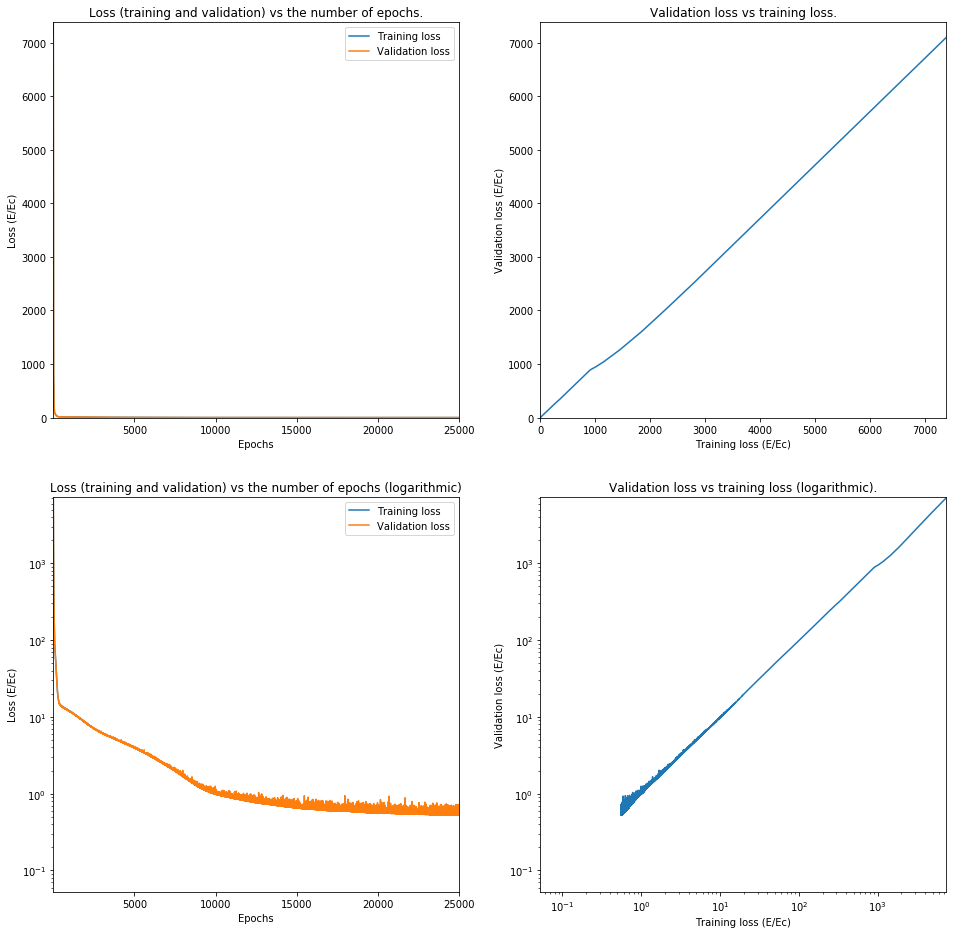

In [22]:
name = 'DenseLayerMediumSoftplus'
settingsNetwork = [inputSize, ['Dense', 2*inputSize, 'softplus', True], ['Dense', 1, 'linear', True]]
learningRate = 2.5*10**-6
callbacksNetwork = [keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=500, min_delta=0)]

model, fitDetails = testNetwork(trainingInput, settingsNetwork, learningRate, kernalInitializer='he_uniform', lossFunction=MAE, validationSplit=0.2, epochs=25000, verbose=1, callbacksNetwork=callbacksNetwork, sampleSize=2)
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=0)
models.append({'model':model, 'name':str(prefixName) + name, 'evaluation':evaluation, 'history':history})
prefixName = prefixName + 1

10001/10001 [==============================] - 0s 9us/step
0.47378622737303694


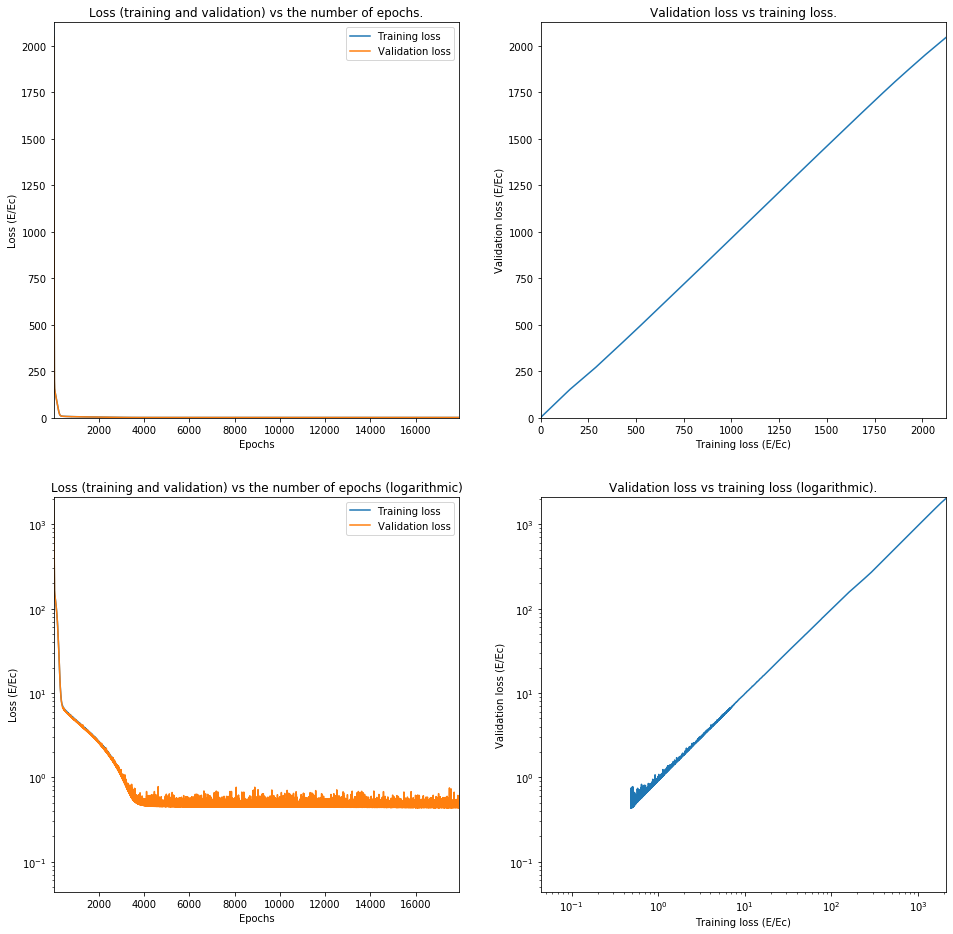

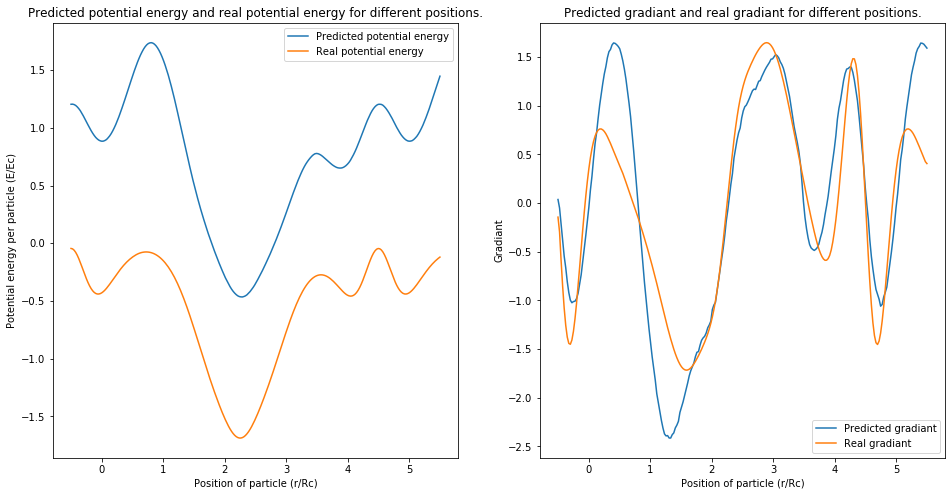

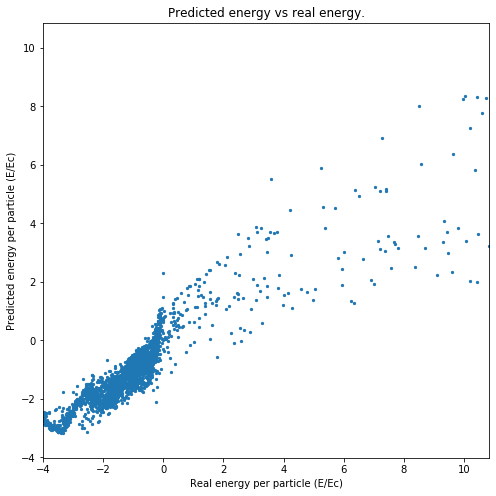

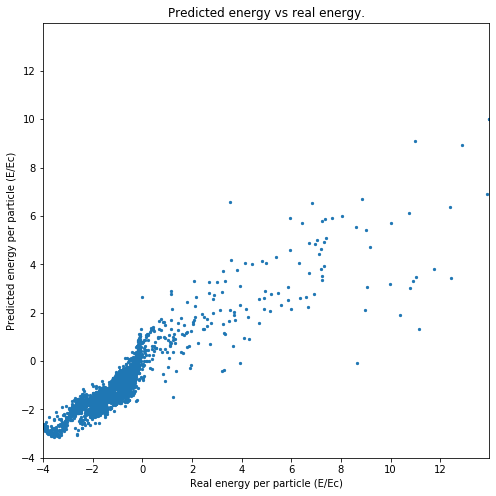

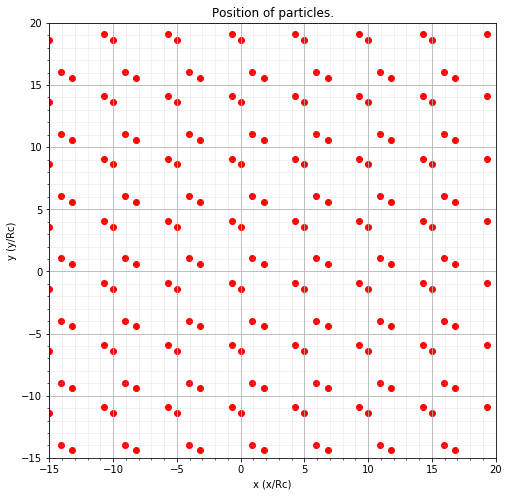

For index 35150 Predicted 0.8786058 was 0.0917311388


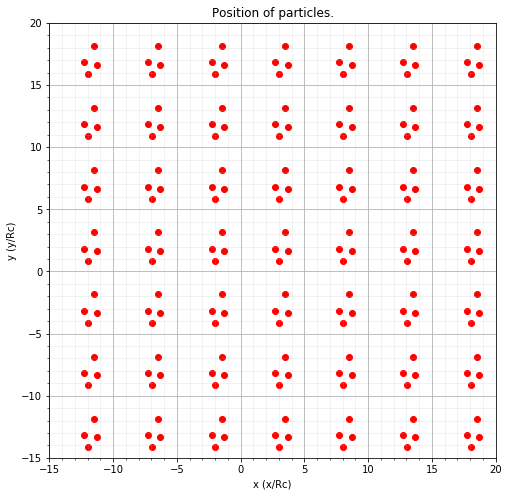

For index 5594 Predicted -1.5778152 was -1.6517595810999999


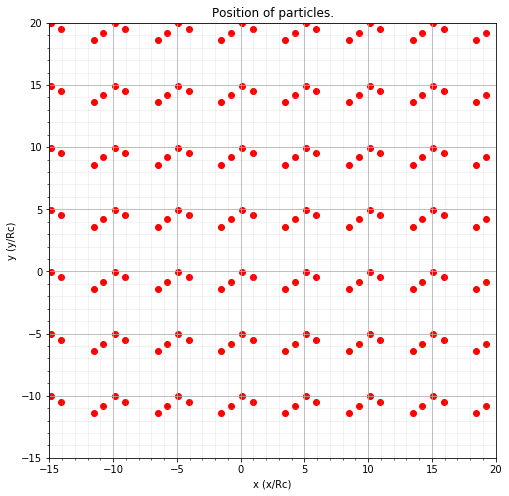

For index 35094 Predicted -1.1942703 was -0.5995037048


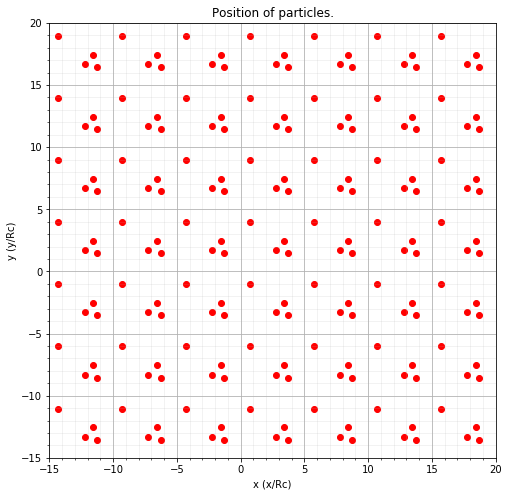

For index 32387 Predicted -0.96136004 was -1.3119011394


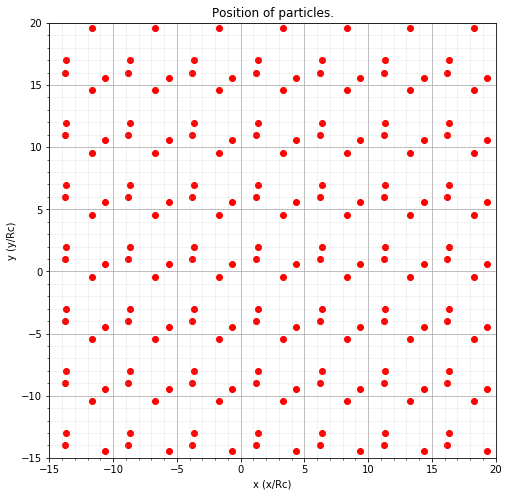

For index 47739 Predicted 0.31415266 was -0.1329984582


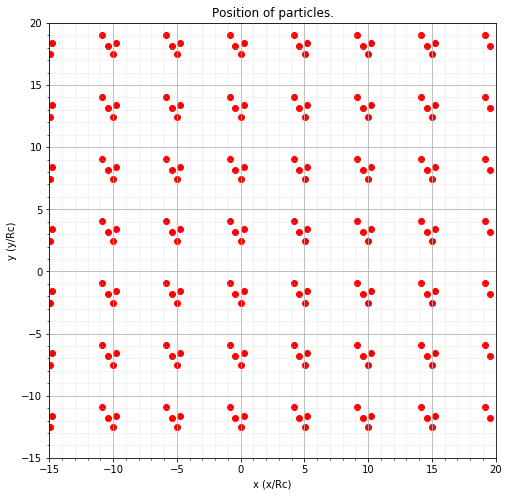

For index 14214 Predicted 2.1941576 was 10.6994877623


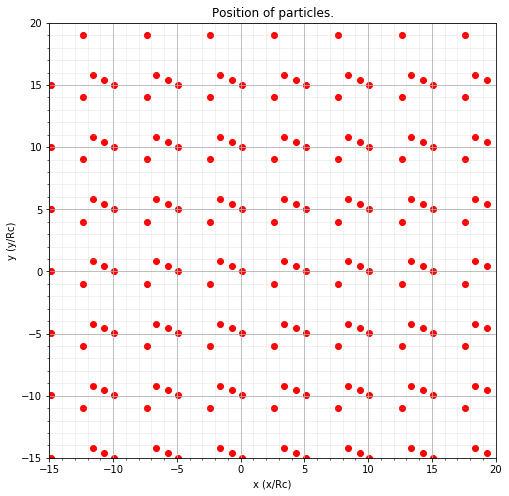

For index 48737 Predicted -0.17687519 was -0.2818949568


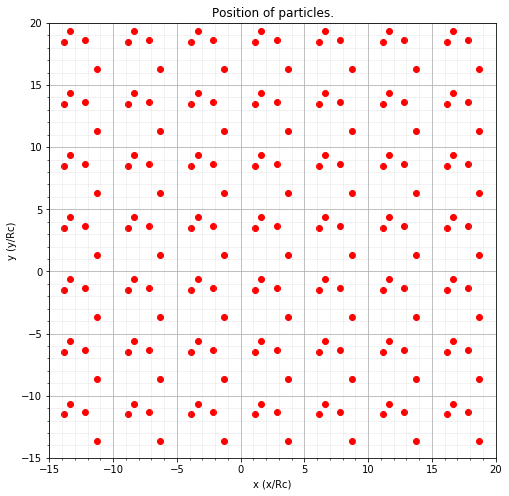

For index 11870 Predicted 0.23950665 was -0.3581852659


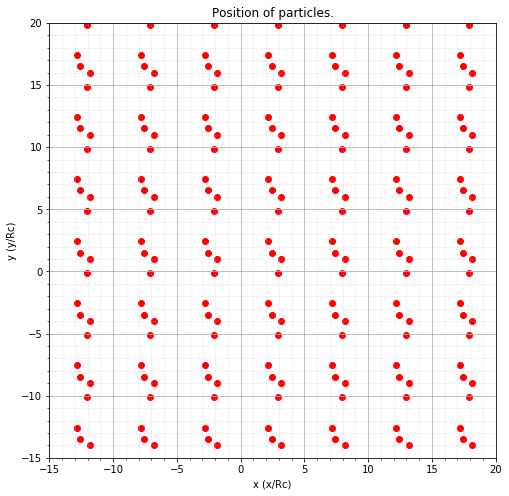

For index 41091 Predicted -1.3133498 was -0.9637761914


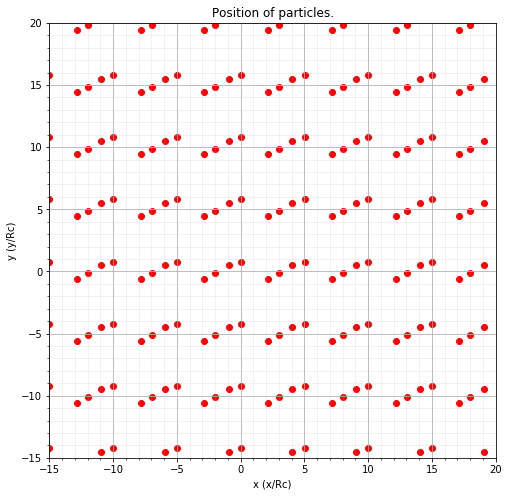

For index 46464 Predicted -1.259822 was -0.4692183365


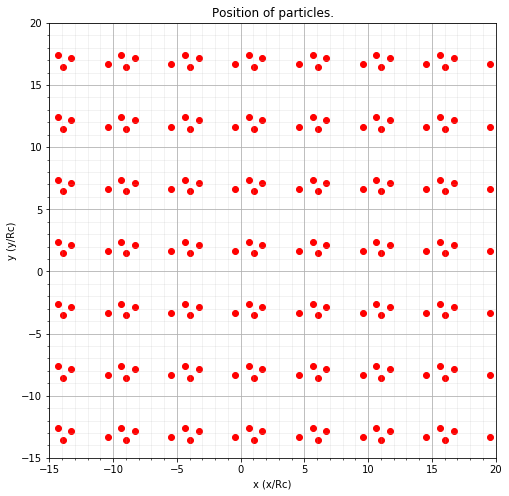

For index 6073 Predicted -1.7382156 was -1.6670038984
Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_13 (Dense)             (None, 16)                144       
_________________________________________________________________
dense_14 (Dense)             (None, 1)                 17        
Total params: 161
Trainable params: 161
Non-trainable params: 0
_________________________________________________________________
Layer 0:  [array([[-0.5491743 , -0.4060196 , -0.6809359 , -0.5134151 ,  0.7327799 ,
        -0.8119653 , -0.7196211 ,  0.6786688 ,  0.7174007 , -0.26376152,
        -0.20138328,  0.38781467,  0.4050509 ,  0.14279418,  0.28074414,
         0.57470983],
       [-0.35214263, -0.1937763 , -0.56199867,  0.6910489 , -0.6713376 ,
        -0.4081785 , -0.16588157, -0.5248859 , -0.286946  ,  0.3223002 ,
         0.29575434, -1.1428171 ,  0.2256328 , -0.55328673, -0.070

In [23]:
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=1)
print(evaluation)
history = plotHistory(fitDetails)

makeGradiantPlot(model, x, testData)

makePredictionPlot(model, validationData)
makePredictionPlot(model, trainingData)

for i in validationPlots:
    plotAndPredict(model, validationData, i)

model.summary()
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())

## Model 3: 1 Dense layer large softplus

In [ ]:
name = 'DenseLayerLargeSoftplus'
settingsNetwork = [inputSize, ['Dense', 3*inputSize, 'softplus', True], ['Dense', 1, 'linear', True]]
learningRate = 2.5*10**-6
callbacksNetwork = [keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=500, min_delta=0)]

model, fitDetails = testNetwork(trainingInput, settingsNetwork, learningRate, kernalInitializer='he_uniform', lossFunction=MAE, validationSplit=0.2, epochs=10000, verbose=1, callbacksNetwork=callbacksNetwork, sampleSize=2)
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=0)
models.append({'model':model, 'name':str(prefixName) + name, 'evaluation':evaluation, 'history':history})
prefixName = prefixName + 1

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_17 (Dense)             (None, 24)                216       
_________________________________________________________________
dense_18 (Dense)             (None, 1)                 25        
Total params: 241
Trainable params: 241
Non-trainable params: 0
_________________________________________________________________
40003/40003 [==============================] - 0s 9us/step
11346.185972697556
Layer 0:  [array([[-0.08193094,  0.6950591 , -0.61058545, -0.2160306 ,  0.5221614 ,
        -0.12162292,  0.16467935,  0.6244152 ,  0.85669535, -0.18638349,
        -0.57012695,  0.33956224,  0.01814473, -0.31807792,  0.16096765,
         0.00310332,  0.5896799 ,  0.3017636 , -0.46397406, -0.41767976,
         0.15467364,  0.3924995 , -0.6541493 , -0.7995715 ],
       [ 0.84800225,  0.79356843,  0.29289132, -0.13600427, -0.65953314,
  

32002/32002 [==============================] - 1s 23us/step - loss: 272.6066 - val_loss: 265.3542
Epoch 36/10000
32002/32002 [==============================] - 1s 23us/step - loss: 261.4013 - val_loss: 254.2654
Epoch 37/10000
32002/32002 [==============================] - 1s 23us/step - loss: 250.4976 - val_loss: 243.3724
Epoch 38/10000
32002/32002 [==============================] - 1s 23us/step - loss: 239.8477 - val_loss: 232.7424
Epoch 39/10000
32002/32002 [==============================] - 1s 23us/step - loss: 229.4639 - val_loss: 222.3911
Epoch 40/10000
32002/32002 [==============================] - 1s 23us/step - loss: 219.2713 - val_loss: 212.3083
Epoch 41/10000
32002/32002 [==============================] - 1s 23us/step - loss: 209.1741 - val_loss: 202.3701
Epoch 42/10000
32002/32002 [==============================] - 1s 23us/step - loss: 199.2348 - val_loss: 192.5927
Epoch 43/10000
32002/32002 [==============================] - 1s 23us/step - loss: 189.4550 - val_loss: 182.936

32002/32002 [==============================] - 1s 23us/step - loss: 41.7000 - val_loss: 40.4929
Epoch 109/10000
32002/32002 [==============================] - 1s 23us/step - loss: 41.3368 - val_loss: 40.1225
Epoch 110/10000
32002/32002 [==============================] - 1s 23us/step - loss: 40.9982 - val_loss: 39.8041
Epoch 111/10000
32002/32002 [==============================] - 1s 23us/step - loss: 40.6696 - val_loss: 39.4459
Epoch 112/10000
32002/32002 [==============================] - 1s 23us/step - loss: 40.3453 - val_loss: 39.1126
Epoch 113/10000
32002/32002 [==============================] - 1s 23us/step - loss: 40.0289 - val_loss: 38.7963
Epoch 114/10000
32002/32002 [==============================] - 1s 23us/step - loss: 39.7206 - val_loss: 38.4936
Epoch 115/10000
32002/32002 [==============================] - 1s 23us/step - loss: 39.4107 - val_loss: 38.2717
Epoch 116/10000
32002/32002 [==============================] - 1s 23us/step - loss: 39.1179 - val_loss: 37.9080
Epoch 11

32002/32002 [==============================] - 1s 23us/step - loss: 24.9006 - val_loss: 24.2889
Epoch 182/10000
32002/32002 [==============================] - 1s 23us/step - loss: 24.7168 - val_loss: 24.1186
Epoch 183/10000
32002/32002 [==============================] - 1s 23us/step - loss: 24.5293 - val_loss: 23.9345
Epoch 184/10000
32002/32002 [==============================] - 1s 23us/step - loss: 24.3480 - val_loss: 23.7572
Epoch 185/10000
32002/32002 [==============================] - 1s 23us/step - loss: 24.1661 - val_loss: 23.5903
Epoch 186/10000
32002/32002 [==============================] - 1s 23us/step - loss: 23.9746 - val_loss: 23.4106
Epoch 187/10000
32002/32002 [==============================] - 1s 23us/step - loss: 23.7946 - val_loss: 23.2386
Epoch 188/10000
32002/32002 [==============================] - 1s 23us/step - loss: 23.6102 - val_loss: 23.0516
Epoch 189/10000
32002/32002 [==============================] - 1s 23us/step - loss: 23.4174 - val_loss: 22.8707
Epoch 19

32002/32002 [==============================] - 1s 23us/step - loss: 13.4687 - val_loss: 13.4382
Epoch 255/10000
32002/32002 [==============================] - 1s 22us/step - loss: 13.3697 - val_loss: 13.3390
Epoch 256/10000
32002/32002 [==============================] - 1s 23us/step - loss: 13.2735 - val_loss: 13.2399
Epoch 257/10000
32002/32002 [==============================] - 1s 23us/step - loss: 13.1732 - val_loss: 13.1565
Epoch 258/10000
32002/32002 [==============================] - 1s 23us/step - loss: 13.0780 - val_loss: 13.1036
Epoch 259/10000
32002/32002 [==============================] - 1s 23us/step - loss: 12.9833 - val_loss: 12.9876
Epoch 260/10000
32002/32002 [==============================] - 1s 23us/step - loss: 12.8970 - val_loss: 12.9028
Epoch 261/10000
32002/32002 [==============================] - 1s 23us/step - loss: 12.8102 - val_loss: 12.8528
Epoch 262/10000
32002/32002 [==============================] - 1s 23us/step - loss: 12.7237 - val_loss: 12.7431
Epoch 26

32002/32002 [==============================] - 1s 22us/step - loss: 9.0022 - val_loss: 9.0642
Epoch 328/10000
32002/32002 [==============================] - 1s 22us/step - loss: 8.9613 - val_loss: 9.0288
Epoch 329/10000
32002/32002 [==============================] - 1s 22us/step - loss: 8.9181 - val_loss: 8.9758
Epoch 330/10000
32002/32002 [==============================] - 1s 22us/step - loss: 8.8755 - val_loss: 8.9906
Epoch 331/10000
32002/32002 [==============================] - 1s 22us/step - loss: 8.8396 - val_loss: 8.9045
Epoch 332/10000
32002/32002 [==============================] - 1s 22us/step - loss: 8.7968 - val_loss: 8.8624
Epoch 333/10000
32002/32002 [==============================] - 1s 22us/step - loss: 8.7583 - val_loss: 8.8126
Epoch 334/10000
32002/32002 [==============================] - 1s 22us/step - loss: 8.7195 - val_loss: 8.7886
Epoch 335/10000
32002/32002 [==============================] - 1s 22us/step - loss: 8.6822 - val_loss: 8.7387
Epoch 336/10000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 6.9066 - val_loss: 6.9203
Epoch 402/10000
32002/32002 [==============================] - 1s 23us/step - loss: 6.8846 - val_loss: 6.9035
Epoch 403/10000
32002/32002 [==============================] - 1s 23us/step - loss: 6.8649 - val_loss: 6.8776
Epoch 404/10000
32002/32002 [==============================] - 1s 23us/step - loss: 6.8490 - val_loss: 6.8679
Epoch 405/10000
32002/32002 [==============================] - 1s 23us/step - loss: 6.8270 - val_loss: 6.8546
Epoch 406/10000
32002/32002 [==============================] - 1s 22us/step - loss: 6.8082 - val_loss: 6.8371
Epoch 407/10000
32002/32002 [==============================] - 1s 23us/step - loss: 6.7880 - val_loss: 6.8352
Epoch 408/10000
32002/32002 [==============================] - 1s 23us/step - loss: 6.7726 - val_loss: 6.7809
Epoch 409/10000
32002/32002 [==============================] - 1s 23us/step - loss: 6.7512 - val_loss: 6.7674
Epoch 410/10000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 5.6865 - val_loss: 5.6606
Epoch 476/10000
32002/32002 [==============================] - 1s 23us/step - loss: 5.6705 - val_loss: 5.6542
Epoch 477/10000
32002/32002 [==============================] - 1s 23us/step - loss: 5.6583 - val_loss: 5.6315
Epoch 478/10000
32002/32002 [==============================] - 1s 23us/step - loss: 5.6406 - val_loss: 5.6467
Epoch 479/10000
32002/32002 [==============================] - 1s 23us/step - loss: 5.6270 - val_loss: 5.6026
Epoch 480/10000
32002/32002 [==============================] - 1s 23us/step - loss: 5.6132 - val_loss: 5.5912
Epoch 481/10000
32002/32002 [==============================] - 1s 23us/step - loss: 5.6017 - val_loss: 5.5631
Epoch 482/10000
32002/32002 [==============================] - 1s 23us/step - loss: 5.5854 - val_loss: 5.5525
Epoch 483/10000
32002/32002 [==============================] - 1s 23us/step - loss: 5.5719 - val_loss: 5.5423
Epoch 484/10000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 4.6727 - val_loss: 4.6269
Epoch 550/10000
32002/32002 [==============================] - 1s 23us/step - loss: 4.6608 - val_loss: 4.6001
Epoch 551/10000
32002/32002 [==============================] - 1s 23us/step - loss: 4.6483 - val_loss: 4.5992
Epoch 552/10000
32002/32002 [==============================] - 1s 23us/step - loss: 4.6370 - val_loss: 4.5902
Epoch 553/10000
32002/32002 [==============================] - 1s 23us/step - loss: 4.6215 - val_loss: 4.5646
Epoch 554/10000
32002/32002 [==============================] - 1s 22us/step - loss: 4.6101 - val_loss: 4.5500
Epoch 555/10000
32002/32002 [==============================] - 1s 22us/step - loss: 4.5981 - val_loss: 4.5398
Epoch 556/10000
32002/32002 [==============================] - 1s 23us/step - loss: 4.5852 - val_loss: 4.5539
Epoch 557/10000
32002/32002 [==============================] - 1s 22us/step - loss: 4.5723 - val_loss: 4.5107
Epoch 558/10000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 3.8140 - val_loss: 3.8242
Epoch 624/10000
32002/32002 [==============================] - 1s 23us/step - loss: 3.8049 - val_loss: 3.7370
Epoch 625/10000
32002/32002 [==============================] - 1s 23us/step - loss: 3.7898 - val_loss: 3.7342
Epoch 626/10000
32002/32002 [==============================] - 1s 22us/step - loss: 3.7820 - val_loss: 3.7160
Epoch 627/10000
32002/32002 [==============================] - 1s 22us/step - loss: 3.7720 - val_loss: 3.7122
Epoch 628/10000
32002/32002 [==============================] - 1s 23us/step - loss: 3.7592 - val_loss: 3.7155
Epoch 629/10000
32002/32002 [==============================] - 1s 23us/step - loss: 3.7495 - val_loss: 3.6990
Epoch 630/10000
32002/32002 [==============================] - 1s 22us/step - loss: 3.7374 - val_loss: 3.7368
Epoch 631/10000
32002/32002 [==============================] - 1s 22us/step - loss: 3.7304 - val_loss: 3.6628
Epoch 632/10000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 3.0943 - val_loss: 3.0213
Epoch 698/10000
32002/32002 [==============================] - 1s 23us/step - loss: 3.0847 - val_loss: 3.0045
Epoch 699/10000
32002/32002 [==============================] - 1s 22us/step - loss: 3.0788 - val_loss: 3.0043
Epoch 700/10000
32002/32002 [==============================] - 1s 23us/step - loss: 3.0695 - val_loss: 3.0170
Epoch 701/10000
32002/32002 [==============================] - 1s 23us/step - loss: 3.0603 - val_loss: 2.9925
Epoch 702/10000
32002/32002 [==============================] - 1s 23us/step - loss: 3.0507 - val_loss: 2.9746
Epoch 703/10000
32002/32002 [==============================] - 1s 22us/step - loss: 3.0426 - val_loss: 2.9944
Epoch 704/10000
32002/32002 [==============================] - 1s 22us/step - loss: 3.0316 - val_loss: 2.9767
Epoch 705/10000
32002/32002 [==============================] - 1s 23us/step - loss: 3.0225 - val_loss: 2.9453
Epoch 706/10000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 2.4508 - val_loss: 2.3759
Epoch 772/10000
32002/32002 [==============================] - 1s 22us/step - loss: 2.4447 - val_loss: 2.3782
Epoch 773/10000
32002/32002 [==============================] - 1s 23us/step - loss: 2.4378 - val_loss: 2.3602
Epoch 774/10000
32002/32002 [==============================] - 1s 23us/step - loss: 2.4306 - val_loss: 2.3469
Epoch 775/10000
32002/32002 [==============================] - 1s 23us/step - loss: 2.4199 - val_loss: 2.3416
Epoch 776/10000
32002/32002 [==============================] - 1s 22us/step - loss: 2.4101 - val_loss: 2.3528
Epoch 777/10000
32002/32002 [==============================] - 1s 23us/step - loss: 2.4046 - val_loss: 2.3293
Epoch 778/10000
32002/32002 [==============================] - 1s 22us/step - loss: 2.3940 - val_loss: 2.3648
Epoch 779/10000
32002/32002 [==============================] - 1s 22us/step - loss: 2.3901 - val_loss: 2.3490
Epoch 780/10000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 1.8629 - val_loss: 1.7934
Epoch 846/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.8562 - val_loss: 1.8287
Epoch 847/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.8505 - val_loss: 1.7780
Epoch 848/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.8449 - val_loss: 1.7653
Epoch 849/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.8354 - val_loss: 1.7736
Epoch 850/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.8306 - val_loss: 1.7542
Epoch 851/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.8228 - val_loss: 1.7522
Epoch 852/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.8162 - val_loss: 1.7836
Epoch 853/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.8089 - val_loss: 1.7832
Epoch 854/10000
32002/3200

32002/32002 [==============================] - 1s 22us/step - loss: 1.4896 - val_loss: 1.4551
Epoch 920/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.4865 - val_loss: 1.4249
Epoch 921/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.4835 - val_loss: 1.4189
Epoch 922/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.4799 - val_loss: 1.4138
Epoch 923/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.4768 - val_loss: 1.4098
Epoch 924/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.4742 - val_loss: 1.4049
Epoch 925/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.4720 - val_loss: 1.4107
Epoch 926/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.4703 - val_loss: 1.4248
Epoch 927/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.4658 - val_loss: 1.4039
Epoch 928/10000
32002/3200

32002/32002 [==============================] - 1s 23us/step - loss: 1.3247 - val_loss: 1.2691
Epoch 994/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.3255 - val_loss: 1.2970
Epoch 995/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.3224 - val_loss: 1.2636
Epoch 996/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3188 - val_loss: 1.2751
Epoch 997/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3203 - val_loss: 1.2664
Epoch 998/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3168 - val_loss: 1.2582
Epoch 999/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.3178 - val_loss: 1.2699
Epoch 1000/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.3143 - val_loss: 1.2601
Epoch 1001/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.3126 - val_loss: 1.3118
Epoch 1002/10000
32002/3

32002/32002 [==============================] - 1s 23us/step - loss: 1.2367 - val_loss: 1.2226
Epoch 1068/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.2336 - val_loss: 1.1723
Epoch 1069/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.2331 - val_loss: 1.2089
Epoch 1070/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.2327 - val_loss: 1.1723
Epoch 1071/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.2325 - val_loss: 1.1850
Epoch 1072/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.2295 - val_loss: 1.1700
Epoch 1073/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.2298 - val_loss: 1.2002
Epoch 1074/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.2301 - val_loss: 1.1855
Epoch 1075/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.2250 - val_loss: 1.1651
Epoch 1076/10000
3

Epoch 1141/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.1733 - val_loss: 1.1513
Epoch 1142/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.1744 - val_loss: 1.1050
Epoch 1143/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.1696 - val_loss: 1.1132
Epoch 1144/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.1720 - val_loss: 1.1049
Epoch 1145/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.1698 - val_loss: 1.1048
Epoch 1146/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.1687 - val_loss: 1.1123
Epoch 1147/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.1689 - val_loss: 1.2307
Epoch 1148/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.1691 - val_loss: 1.1254
Epoch 1149/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.1682 - val_loss: 1.1231
E

Epoch 1215/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.1165 - val_loss: 1.0481
Epoch 1216/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.1163 - val_loss: 1.0457
Epoch 1217/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.1163 - val_loss: 1.0500
Epoch 1218/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.1140 - val_loss: 1.0502
Epoch 1219/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.1148 - val_loss: 1.0573
Epoch 1220/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.1147 - val_loss: 1.0461
Epoch 1221/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.1114 - val_loss: 1.0410
Epoch 1222/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.1125 - val_loss: 1.0796
Epoch 1223/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.1139 - val_loss: 1.0411
E

Epoch 1289/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.0670 - val_loss: 0.9996
Epoch 1290/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.0628 - val_loss: 0.9990
Epoch 1291/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.0626 - val_loss: 1.0026
Epoch 1292/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.0650 - val_loss: 0.9923
Epoch 1293/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.0640 - val_loss: 0.9929
Epoch 1294/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.0615 - val_loss: 0.9943
Epoch 1295/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.0578 - val_loss: 0.9934
Epoch 1296/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.0630 - val_loss: 0.9908
Epoch 1297/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.0582 - val_loss: 0.9945
E

Epoch 1363/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.0204 - val_loss: 0.9541
Epoch 1364/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.0209 - val_loss: 1.0141
Epoch 1365/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.0191 - val_loss: 0.9826
Epoch 1366/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.0178 - val_loss: 0.9910
Epoch 1367/10000
32002/32002 [==============================] - 1s 22us/step - loss: 1.0162 - val_loss: 0.9572
Epoch 1368/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.0168 - val_loss: 0.9538
Epoch 1369/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.0149 - val_loss: 0.9611
Epoch 1370/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.0156 - val_loss: 0.9813
Epoch 1371/10000
32002/32002 [==============================] - 1s 23us/step - loss: 1.0133 - val_loss: 0.9518
E

Epoch 1437/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9731 - val_loss: 0.9374
Epoch 1438/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9742 - val_loss: 0.9463
Epoch 1439/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9713 - val_loss: 0.9546
Epoch 1440/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9716 - val_loss: 0.9132
Epoch 1441/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9727 - val_loss: 0.9919
Epoch 1442/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9711 - val_loss: 0.9078
Epoch 1443/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9717 - val_loss: 0.9144
Epoch 1444/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.9703 - val_loss: 0.9254
Epoch 1445/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.9700 - val_loss: 0.9176
E

Epoch 1511/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9274 - val_loss: 0.8958
Epoch 1512/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.9262 - val_loss: 0.8644
Epoch 1513/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9247 - val_loss: 0.8808
Epoch 1514/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.9241 - val_loss: 0.8699
Epoch 1515/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.9232 - val_loss: 0.9067
Epoch 1516/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.9217 - val_loss: 0.8712
Epoch 1517/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.9209 - val_loss: 0.8669
Epoch 1518/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.9210 - val_loss: 0.8635
Epoch 1519/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.9189 - val_loss: 0.8707
E

Epoch 1585/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8734 - val_loss: 0.8195
Epoch 1586/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8730 - val_loss: 0.8248
Epoch 1587/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8714 - val_loss: 0.8274
Epoch 1588/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8703 - val_loss: 0.8180
Epoch 1589/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8723 - val_loss: 0.8434
Epoch 1590/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8727 - val_loss: 0.8269
Epoch 1591/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8693 - val_loss: 0.8158
Epoch 1592/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8686 - val_loss: 0.8114
Epoch 1593/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8688 - val_loss: 0.8113
E

Epoch 1659/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8297 - val_loss: 0.7760
Epoch 1660/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8280 - val_loss: 0.7755
Epoch 1661/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8287 - val_loss: 0.7807
Epoch 1662/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8285 - val_loss: 0.7786
Epoch 1663/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8251 - val_loss: 0.7846
Epoch 1664/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8250 - val_loss: 0.8111
Epoch 1665/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8257 - val_loss: 0.8159
Epoch 1666/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.8258 - val_loss: 0.7743
Epoch 1667/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.8272 - val_loss: 0.7710
E

Epoch 1733/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7968 - val_loss: 0.7453
Epoch 1734/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7943 - val_loss: 0.7474
Epoch 1735/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7963 - val_loss: 0.7628
Epoch 1736/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7957 - val_loss: 0.7457
Epoch 1737/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7959 - val_loss: 0.7541
Epoch 1738/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7938 - val_loss: 0.7549
Epoch 1739/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7925 - val_loss: 0.7674
Epoch 1740/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7915 - val_loss: 0.7592
Epoch 1741/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7945 - val_loss: 0.7413
E

Epoch 1807/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7721 - val_loss: 0.7241
Epoch 1808/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7717 - val_loss: 0.7221
Epoch 1809/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7717 - val_loss: 0.7196
Epoch 1810/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7707 - val_loss: 0.7219
Epoch 1811/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7699 - val_loss: 0.7628
Epoch 1812/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7724 - val_loss: 0.7212
Epoch 1813/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7685 - val_loss: 0.7191
Epoch 1814/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7678 - val_loss: 0.7505
Epoch 1815/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7718 - val_loss: 0.7313
E

Epoch 1881/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7514 - val_loss: 0.7434
Epoch 1882/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7529 - val_loss: 0.7100
Epoch 1883/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7518 - val_loss: 0.7041
Epoch 1884/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7509 - val_loss: 0.7147
Epoch 1885/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7510 - val_loss: 0.7760
Epoch 1886/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7526 - val_loss: 0.7047
Epoch 1887/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7506 - val_loss: 0.7382
Epoch 1888/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7508 - val_loss: 0.7069
Epoch 1889/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7505 - val_loss: 0.7056
E

Epoch 1955/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7343 - val_loss: 0.6959
Epoch 1956/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7336 - val_loss: 0.7082
Epoch 1957/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7348 - val_loss: 0.6952
Epoch 1958/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7343 - val_loss: 0.6982
Epoch 1959/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7323 - val_loss: 0.6969
Epoch 1960/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7360 - val_loss: 0.7148
Epoch 1961/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7317 - val_loss: 0.6918
Epoch 1962/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7329 - val_loss: 0.7067
Epoch 1963/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7364 - val_loss: 0.6911
E

Epoch 2029/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7173 - val_loss: 0.6775
Epoch 2030/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7182 - val_loss: 0.6853
Epoch 2031/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7176 - val_loss: 0.6754
Epoch 2032/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7159 - val_loss: 0.6769
Epoch 2033/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7169 - val_loss: 0.6990
Epoch 2034/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7184 - val_loss: 0.6899
Epoch 2035/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7185 - val_loss: 0.6819
Epoch 2036/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7172 - val_loss: 0.7028
Epoch 2037/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7152 - val_loss: 0.6778
E

Epoch 2103/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7052 - val_loss: 0.6888
Epoch 2104/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7018 - val_loss: 0.6708
Epoch 2105/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7036 - val_loss: 0.6759
Epoch 2106/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7012 - val_loss: 0.6662
Epoch 2107/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7043 - val_loss: 0.6683
Epoch 2108/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7023 - val_loss: 0.6689
Epoch 2109/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7033 - val_loss: 0.6726
Epoch 2110/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.7023 - val_loss: 0.6888
Epoch 2111/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.7011 - val_loss: 0.6800
E

Epoch 2177/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6899 - val_loss: 0.6736
Epoch 2178/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6896 - val_loss: 0.6613
Epoch 2179/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6914 - val_loss: 0.6706
Epoch 2180/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6908 - val_loss: 0.6636
Epoch 2181/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6909 - val_loss: 0.6569
Epoch 2182/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6882 - val_loss: 0.6669
Epoch 2183/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6874 - val_loss: 0.6603
Epoch 2184/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6899 - val_loss: 0.6740
Epoch 2185/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6894 - val_loss: 0.6627
E

Epoch 2251/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6796 - val_loss: 0.6487
Epoch 2252/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6791 - val_loss: 0.6487
Epoch 2253/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6817 - val_loss: 0.6937
Epoch 2254/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6786 - val_loss: 0.6603
Epoch 2255/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6802 - val_loss: 0.6439
Epoch 2256/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6791 - val_loss: 0.6550
Epoch 2257/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6785 - val_loss: 0.6485
Epoch 2258/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6776 - val_loss: 0.6510
Epoch 2259/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6763 - val_loss: 0.6432
E

Epoch 2325/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6685 - val_loss: 0.6352
Epoch 2326/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6667 - val_loss: 0.6428
Epoch 2327/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6660 - val_loss: 0.6377
Epoch 2328/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6666 - val_loss: 0.6448
Epoch 2329/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6658 - val_loss: 0.6488
Epoch 2330/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6699 - val_loss: 0.7440
Epoch 2331/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6666 - val_loss: 0.6340
Epoch 2332/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6665 - val_loss: 0.6900
Epoch 2333/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6671 - val_loss: 0.6374
E

Epoch 2399/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6582 - val_loss: 0.6277
Epoch 2400/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6574 - val_loss: 0.6249
Epoch 2401/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6579 - val_loss: 0.6419
Epoch 2402/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6582 - val_loss: 0.6309
Epoch 2403/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6589 - val_loss: 0.6239
Epoch 2404/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6580 - val_loss: 0.6276
Epoch 2405/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6581 - val_loss: 0.6598
Epoch 2406/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6557 - val_loss: 0.6563
Epoch 2407/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6603 - val_loss: 0.6227
E

Epoch 2473/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6499 - val_loss: 0.6196
Epoch 2474/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6493 - val_loss: 0.6207
Epoch 2475/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6483 - val_loss: 0.6810
Epoch 2476/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6482 - val_loss: 0.6253
Epoch 2477/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6474 - val_loss: 0.6252
Epoch 2478/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6469 - val_loss: 0.6248
Epoch 2479/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6487 - val_loss: 0.6820
Epoch 2480/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6495 - val_loss: 0.6278
Epoch 2481/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6490 - val_loss: 0.6174
E

Epoch 2547/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6406 - val_loss: 0.6366
Epoch 2548/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6394 - val_loss: 0.6495
Epoch 2549/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6396 - val_loss: 0.6142
Epoch 2550/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6402 - val_loss: 0.6068
Epoch 2551/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6396 - val_loss: 0.6077
Epoch 2552/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6427 - val_loss: 0.6073
Epoch 2553/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6406 - val_loss: 0.6109
Epoch 2554/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6386 - val_loss: 0.6074
Epoch 2555/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6400 - val_loss: 0.6118
E

Epoch 2621/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6343 - val_loss: 0.6473
Epoch 2622/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6321 - val_loss: 0.6006
Epoch 2623/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6343 - val_loss: 0.6120
Epoch 2624/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6318 - val_loss: 0.6018
Epoch 2625/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6330 - val_loss: 0.6350
Epoch 2626/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6314 - val_loss: 0.6073
Epoch 2627/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6324 - val_loss: 0.6026
Epoch 2628/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6323 - val_loss: 0.6407
Epoch 2629/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6326 - val_loss: 0.6282
E

Epoch 2695/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6258 - val_loss: 0.5981
Epoch 2696/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6260 - val_loss: 0.5931
Epoch 2697/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6261 - val_loss: 0.5975
Epoch 2698/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6232 - val_loss: 0.6099
Epoch 2699/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6247 - val_loss: 0.6069
Epoch 2700/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6254 - val_loss: 0.5953
Epoch 2701/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6248 - val_loss: 0.5950
Epoch 2702/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6226 - val_loss: 0.6049
Epoch 2703/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6254 - val_loss: 0.5927
E

Epoch 2769/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6172 - val_loss: 0.6050
Epoch 2770/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6216 - val_loss: 0.5959
Epoch 2771/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6190 - val_loss: 0.5953
Epoch 2772/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6173 - val_loss: 0.5904
Epoch 2773/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6185 - val_loss: 0.5982
Epoch 2774/10000
32002/32002 [==============================] - 1s 24us/step - loss: 0.6181 - val_loss: 0.5892
Epoch 2775/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6178 - val_loss: 0.5946
Epoch 2776/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6181 - val_loss: 0.6116
Epoch 2777/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6176 - val_loss: 0.5886
E

Epoch 2843/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6108 - val_loss: 0.5850
Epoch 2844/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6101 - val_loss: 0.5991
Epoch 2845/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6129 - val_loss: 0.6072
Epoch 2846/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6128 - val_loss: 0.5889
Epoch 2847/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6114 - val_loss: 0.5952
Epoch 2848/10000
32002/32002 [==============================] - 1s 23us/step - loss: 0.6133 - val_loss: 0.5806
Epoch 2849/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6119 - val_loss: 0.6044
Epoch 2850/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6128 - val_loss: 0.5850
Epoch 2851/10000
32002/32002 [==============================] - 1s 22us/step - loss: 0.6111 - val_loss: 0.5847
E

In [ ]:
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=1)
print(evaluation)
history = plotHistory(fitDetails)

makeGradiantPlot(model, x, testData)

makePredictionPlot(model, validationData)
makePredictionPlot(model, trainingData)

for i in validationPlots:
    plotAndPredict(model, validationData, i)

model.summary()
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())

## Model 4: 1 Dense layer super large softplus

In [ ]:
name = 'DenseLayerSuperLargeSoftplus'
settingsNetwork = [inputSize, ['Dense', 4*inputSize, 'softplus', True], ['Dense', 1, 'linear', True]]
learningRate = 2.5*10**-6
callbacksNetwork = [keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=500, min_delta=0)]

model, fitDetails = testNetwork(trainingInput, settingsNetwork, learningRate, kernalInitializer='he_uniform', lossFunction=MAE, validationSplit=0.2, epochs=10000, verbose=1, callbacksNetwork=callbacksNetwork, sampleSize=2)
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=0)
models.append({'model':model, 'name':str(prefixName) + name, 'evaluation':evaluation, 'history':history})
prefixName = prefixName + 1

In [ ]:
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=1)
print(evaluation)
history = plotHistory(fitDetails)

makeGradiantPlot(model, x, testData)

makePredictionPlot(model, validationData)
makePredictionPlot(model, trainingData)

for i in validationPlots:
    plotAndPredict(model, validationData, i)

model.summary()
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())


## Model 5: 2 Dense layers small softplus

In [ ]:
name = 'TwoDenseLayerSmallSoftplus'
settingsNetwork = [inputSize, ['Dense', inputSize, 'softplus', True], ['Dense', inputSize, 'softplus', True], ['Dense', 1, 'linear', True]]
learningRate = 2.5*10**-6
callbacksNetwork = [keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=500, min_delta=0)]

model, fitDetails = testNetwork(trainingInput, settingsNetwork, learningRate, kernalInitializer='he_uniform', lossFunction=MAE, validationSplit=0.2, epochs=25000, verbose=1, callbacksNetwork=callbacksNetwork, sampleSize=2)
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=0)
models.append({'model':model, 'name':str(prefixName) + name, 'evaluation':evaluation, 'history':history})
prefixName = prefixName + 1

In [ ]:
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=1)
print(evaluation)
history = plotHistory(fitDetails)

makeGradiantPlot(model, x, testData)

makePredictionPlot(model, validationData)
makePredictionPlot(model, trainingData)

for i in validationPlots:
    plotAndPredict(model, validationData, i)

model.summary()
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())


## Model 6: 2 Dense layer medium softplus

In [ ]:
name = 'TwoDenseLayerMediumSoftplus'
settingsNetwork = [inputSize, ['Dense', 2*inputSize, 'softplus', True], ['Dense', 2*inputSize, 'softplus', True], ['Dense', 1, 'linear', True]]
learningRate = 2.5*10**-6
callbacksNetwork = [keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=500, min_delta=0)]

model, fitDetails = testNetwork(trainingInput, settingsNetwork, learningRate, kernalInitializer='he_uniform', lossFunction=MAE, validationSplit=0.2, epochs=10000, verbose=1, callbacksNetwork=callbacksNetwork, sampleSize=2)
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=0)
models.append({'model':model, 'name':str(prefixName) + name, 'evaluation':evaluation, 'history':history})
prefixName = prefixName + 1

In [ ]:
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=1)
print(evaluation)
history = plotHistory(fitDetails)

makeGradiantPlot(model, x, testData)

makePredictionPlot(model, validationData)
makePredictionPlot(model, trainingData)

for i in validationPlots:
    plotAndPredict(model, validationData, i)

model.summary()
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())


## Model 7: 2 Dense layers large softplus

In [ ]:
name = 'TwoDenseLayerLargeSoftplus'
settingsNetwork = [inputSize, ['Dense', 3*inputSize, 'softplus', True], ['Dense', 3*inputSize, 'softplus', True], ['Dense', 1, 'linear', True]]
learningRate = 2.5*10**-6
callbacksNetwork = [keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=500, min_delta=0)]

model, fitDetails = testNetwork(trainingInput, settingsNetwork, learningRate, kernalInitializer='he_uniform', lossFunction=MAE, validationSplit=0.2, epochs=10000, verbose=1, callbacksNetwork=callbacksNetwork, sampleSize=2)
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=0)
models.append({'model':model, 'name':str(prefixName) + name, 'evaluation':evaluation, 'history':history})
prefixName = prefixName + 1

In [ ]:
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=1)
print(evaluation)
history = plotHistory(fitDetails)

makeGradiantPlot(model, x, testData)

makePredictionPlot(model, validationData)
makePredictionPlot(model, trainingData)

for i in validationPlots:
    plotAndPredict(model, validationData, i)

model.summary()
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())


## Model 8: 2 Dense layers very large softplus

In [ ]:
name = 'TwoDenseLayerLargeSoftplus'
settingsNetwork = [inputSize, ['Dense', 4*inputSize, 'softplus', True], ['Dense', 4*inputSize, 'softplus', True], ['Dense', 1, 'linear', True]]
learningRate = 2.5*10**-6
callbacksNetwork = [keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=500, min_delta=0)]

model, fitDetails = testNetwork(trainingInput, settingsNetwork, learningRate, kernalInitializer='he_uniform', lossFunction=MAE, validationSplit=0.2, epochs=10000, verbose=1, callbacksNetwork=callbacksNetwork, sampleSize=2)
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=0)
models.append({'model':model, 'name':str(prefixName) + name, 'evaluation':evaluation, 'history':history})
prefixName = prefixName + 1

In [ ]:
evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=1)
print(evaluation)
history = plotHistory(fitDetails)

makeGradiantPlot(model, x, testData)

makePredictionPlot(model, validationData)
makePredictionPlot(model, trainingData)

for i in validationPlots:
    plotAndPredict(model, validationData, i)

model.summary()
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())


# Finishing

In [ ]:
for i in range(len(models)):
    model = models[i]['model']
    print(models[i]['name'])
    print(model.summary())
    print(models[i]['evaluation'])
    model.save(saveFolder + '/' + models[i]['name'] + str(models[i]['evaluation']) + '.h5')
    print('\n \n')

#model = models[1][0]
#model.save('model1.h5')
#model = load_model('model1.h5')

In [ ]:
model = load_model(saveFolder+ '/' +'0LinearNetwork0.46557734359635244.h5')

evaluation = model.evaluate(validationInput['input'], validationInput['target'], verbose=1)
print(evaluation)
makeGradiantPlot(model, x, testData)

makePredictionPlot(model, validationData)
makePredictionPlot(model, trainingData)

for i in validationPlots:
    plotAndPredict(model, validationData, i)

model.summary()
for i in range(len(model.layers)):
    print('Layer ' + str(i) + ': ', model.layers[i].get_weights())
